In [1]:
import time
import torch
import json
import random
import math
import warnings
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

from tqdm import tqdm
from PIL import Image
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances_argmin_min, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split, StratifiedKFold
from torch.utils.data import Subset, Dataset, DataLoader
from torchvision.models.resnet import ResNet34_Weights
from torchvision.datasets import ImageFolder
from utils.loss_functions import tkd_kdloss
# from models_package.models import Teacher, Student

# Suppress all warnings
warnings.filterwarnings("ignore")

In [2]:
# Hyperparameters
learning_rate = 0.001379 # 0.096779
epochs = 200 #200
epochs_pretrain = 3 #3
epochs_optimal_lr = 3 #5
patience_teacher = 5
patience_student = 10
temperature = 4.0
alpha = 0.9
momentum = 0.9
step_size = 30
gamma = 0.1
lmda = 3
batch_size = 384
num_workers = 4

# labels used including for plotting
class_labels = [0, 1, 3, 4, 6, 7, 11, 15, 17, 18, 19, 20, 22, 25, 27, 28, 30, 31, 33, 35, 36, 37, 39, 43, 44, 50, 51, 54, 57, 58]
class_labels_new = torch.tensor([i for i in range(len(class_labels))])
class_names_new = [f"Class {label}" for label in range(30)]
num_classes = len(class_labels)


In [3]:
# set device to cuda if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [4]:
# Assuming your JSON file is named 'your_file.json'
file_path = './WIDER/Annotations/wider_attribute_trainval.json'

with open(file_path, 'r') as file:
    # Load the JSON data from the file
    data = json.load(file)

class_idx = data['scene_id_map']

In [5]:
class StratifiedBatchSampler:
    """Stratified batch sampling
    Provides equal representation of target classes in each batch
    """
    def __init__(self, y, batch_size, shuffle=True):
        if torch.is_tensor(y):
            y = y.numpy()
        assert len(y.shape) == 1, 'label array must be 1D'
        n_batches = int(len(y) / batch_size)
        self.skf = StratifiedKFold(n_splits=n_batches, shuffle=shuffle)
        self.X = torch.randn(len(y),1).numpy()
        self.y = y
        self.shuffle = shuffle
        self.batch_size = batch_size

    def __iter__(self):
        if self.shuffle:
            self.skf.random_state = torch.randint(0,int(1e8),size=()).item()
        for train_idx, test_idx in self.skf.split(self.X, self.y):
            yield test_idx

    def __len__(self):
        return len(self.y)//self.batch_size

In [6]:
class DataSet(Dataset):
    def __init__(self, ann_files, augs, img_size, dataset):

        # Create a mapping from old labels to new labels
        self.label_mapping = {old_label: new_label for new_label, old_label in enumerate(sorted(class_labels))}

        self.dataset = dataset
        self.ann_files = ann_files
        self.augment = self.augs_function(augs, img_size)
        # Initialize transformations directly
        self.transform = transforms.Compose(
            [
                transforms.ToTensor(),
                transforms.Normalize(mean=[0, 0, 0], std=[1, 1, 1])
            ] 
        )
        if self.dataset == "wider":
            self.transform = transforms.Compose(
                [
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])                ] 
            )        

        self.anns = []
        self.load_anns()
        print(self.augment)

    def augs_function(self, augs, img_size):            
        t = []
        if 'randomflip' in augs:
            t.append(transforms.RandomHorizontalFlip())
        if 'ColorJitter' in augs:
            t.append(transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0))
        if 'resizedcrop' in augs:
            t.append(transforms.RandomResizedCrop(img_size, scale=(0.7, 1.0)))
        if 'RandAugment' in augs:
            t.append(transforms.RandAugment())

        t.append(transforms.Resize((img_size, img_size)))

        return transforms.Compose(t)
    
    def load_anns(self):
        self.anns = []
        for ann_file in self.ann_files:
            json_data = json.load(open(ann_file, "r"))
            self.anns += json_data['images']

    def __len__(self):
        return len(self.anns)

    def __getitem__(self, idx):
        # Make sure the index is within bounds
        idx = idx % len(self)
        ann = self.anns[idx]
        
        try:
            # Attempt to open the image file
            img = Image.open(f'WIDER/Image/{ann["file_name"]}').convert("RGB")

            # If this is the wider dataset, proceed with specific processing
            # x, y, w, h = ann['bbox']
            # img_area = img.crop([x, y, x+w, y+h])
            img_area = self.augment(img)
            img_area = self.transform(img_area)
            attributes_list = [target['attribute'] for target in ann['targets']]
            num_people = len(attributes_list)
            attributes_distribution = [max(sum(attribute), 0)/num_people for attribute in zip(*attributes_list)]
            # Extract label from image path
            img_path = f'WIDER/Image/{ann["file_name"]}'
            label = self.extract_label(img_path)  # You might need to implement this method
            
            return {
                "label": label,
                "target": torch.tensor([attributes_distribution[0]], dtype=torch.float32),
                "img": img_area
            }
            
        except Exception as e:
            # If any error occurs during the processing of an image, log the error and the index
            print(f"Error processing image at index {idx}: {e}")
            # Instead of returning None, raise the exception
            raise

    def extract_label(self, img_path):
        original_label = None
    
        if "WIDER/Image/train" in img_path:
            label_str = img_path.split("WIDER/Image/train/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "WIDER/Image/test" in img_path:
            label_str = img_path.split("WIDER/Image/test/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
        elif "WIDER/Image/val" in img_path:  # Handle validation images
            label_str = img_path.split("WIDER/Image/val/")[1].split("/")[0]
            original_label = int(label_str.split("--")[0])
    
        if original_label is not None:
            remapped_label = self.label_mapping[original_label]
            return remapped_label
        else:
            raise ValueError(f"Label could not be extracted from path: {img_path}")


In [7]:
train_file = ['data/wider/trainval_wider.json']
test_file = ['data/wider/test_wider.json']


In [8]:
def custom_collate(batch):
    # Filter out any None items in the batch
    batch = [item for item in batch if item is not None]
    # If after filtering the batch is empty, handle this case by either returning an empty tensor or raising an exception
    if len(batch) == 0:
        # Option 1: Return a placeholder tensor (adapt the shape to match your data)
        # return torch.tensor([]), torch.tensor([])
        # Option 2: Raise an exception
        raise ValueError("Batch is empty after filtering out None items.")
    return torch.utils.data.dataloader.default_collate(batch)


In [9]:
train_dataset = DataSet(train_file, augs = ['RandAugment'], img_size = 226, dataset = 'wider')
test_dataset = DataSet(test_file, augs = [], img_size = 226, dataset = 'wider')


trainloader = DataLoader(train_dataset, 
                         batch_sampler=StratifiedBatchSampler(torch.tensor([train_dataset[i]['label'] for i in range(len(train_dataset))]), batch_size=batch_size),
                         num_workers=num_workers, collate_fn=custom_collate)
testloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=custom_collate)


Compose(
    RandAugment(num_ops=2, magnitude=9, num_magnitude_bins=31, interpolation=InterpolationMode.NEAREST, fill=None)
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)
Compose(
    Resize(size=(226, 226), interpolation=bilinear, max_size=None, antialias=warn)
)


# Start Training Process

In [10]:
def one_hot_encode(labels, num_classes):
    return np.eye(num_classes)[labels]

def calculate_recall_multiclass(conf_matrix):
    recalls = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)
    recalls[np.isnan(recalls)] = 0  # Replace NaN with 0
    return recalls

def evaluate_model_with_gender_multiclass(pred, label, gender, num_classes=30):
    predictions = pred.cpu()
    true_labels = label.cpu()
    gender = gender.cpu()

    # Identify male and female indices based on the gender threshold
    male_indices = np.where(gender >= 0.5)[0]
    female_indices = np.where(gender < 0.5)[0]

    # Convert labels to one-hot encoding
    one_hot_labels = one_hot_encode(true_labels, num_classes=num_classes)
    one_hot_preds = one_hot_encode(predictions, num_classes=num_classes)
    # Initialize recall arrays
    male_recall = np.zeros(num_classes)
    female_recall = np.zeros(num_classes)

    # Extract predictions and labels for male and female indices
    male_predictions = np.argmax(one_hot_preds[male_indices], axis=1)
    female_predictions = np.argmax(one_hot_preds[female_indices], axis=1)
    male_labels = np.argmax(one_hot_labels[male_indices], axis=1)
    female_labels = np.argmax(one_hot_labels[female_indices], axis=1)

    # Check if the class labels are within the expected range
    assert (0 <= male_predictions.min() < num_classes) and (0 <= male_predictions.max() < num_classes), "Invalid class indices in male predictions"
    assert (0 <= female_predictions.min() < num_classes) and (0 <= female_predictions.max() < num_classes), "Invalid class indices in female predictions"
    assert (0 <= male_labels.min() < num_classes) and (0 <= male_labels.max() < num_classes), "Invalid class indices in male labels"
    assert (0 <= female_labels.min() < num_classes) and (0 <= female_labels.max() < num_classes), "Invalid class indices in female labels"

    # Calculate confusion matrices for each gender
    male_conf_matrix = confusion_matrix(male_labels, male_predictions, labels=np.arange(num_classes))
    female_conf_matrix = confusion_matrix(female_labels, female_predictions, labels=np.arange(num_classes))

    # Calculate recall for each class and gender
    male_recall[:len(male_conf_matrix)] = calculate_recall_multiclass(male_conf_matrix)
    female_recall[:len(female_conf_matrix)] = calculate_recall_multiclass(female_conf_matrix)

    return male_recall - female_recall, male_conf_matrix, female_conf_matrix


In [11]:
# Instantiate the models
###################### Testing 1 ######################
# Create instances of your models
teacher_model = torchvision.models.resnet34(weights=ResNet34_Weights.IMAGENET1K_V1).to(device)
teacher_model.fc = nn.Linear(512, num_classes)
student_model = torchvision.models.resnet18(weights=None).to(device)
student_model.fc = nn.Linear(512, num_classes)

# Load teacher
# teacher_model = torch.load('teacher_model_ckd_wider.pth')
# teacher_model.load_state_dict(torch.load('teacher_model_weights_ckd_wider.pth'))
# torch.save(teacher_model.state_dict(), 'teacher_model_weights_ckd_wider.pth')
# # Load the studnet
# student_model = torch.load('student_model_ckd_prof.pth')
# student_model.load_state_dict(torch.load('student_model_weights_ckd_prof_checkpoint.pth'))
# student_model = student_model.to(device)


This is the initialization of the 2-layer Adversary Perceptron. It is initialized with the number of classes*2, which represents the predicted labels (y_hat) and the true labels (y). The output of the final layer is a regression output, which is intended to predict the strength of gender (continuous number where anything past 0.5 is more male).


In [12]:
class Adversary(nn.Module):
    def __init__(self, input_size=30):
        super(Adversary, self).__init__()

        self.a1 = nn.Linear(input_size*2, 16)
        self.a2 = nn.Linear(16, 1)  # Output size 1 for regression
        nn.init.xavier_normal_(self.a1.weight)
        nn.init.kaiming_normal_(self.a2.weight, mode='fan_out', nonlinearity='relu')

    def forward(self, input_ids):
        adversary = F.relu(self.a1(input_ids))
        adversary_output = F.sigmoid(self.a2(adversary))  # Linear activation for regression
        return adversary_output

# Instantiate the Adversary
adv = Adversary()

In [13]:
def pretrain_student(student, teacher, trainloader, criterion, optimizer, scheduler, device, alpha, temperature, epochs_pretrain, patience=patience_student):
    teacher.eval()
    teacher.to(device)
    best_val_loss = float('inf')  
    patience_counter = 0 
    student_epoch_losses = []
    val_losses = []
    
    for epoch in range(epochs_pretrain):
        student.train()
        student.to(device)
        running_loss = 0.0 
        epoch_loss = 0.0  
        num_batches = 0  
        
        for index, data in enumerate(tqdm(trainloader)):

            inputs = data['img'].to(device)
            labels = data['label'].to(device)
            optimizer.zero_grad()
            student_outputs = student(inputs)

            with torch.no_grad():
                teacher_outputs = teacher(inputs)

            ce_loss = criterion(student_outputs, labels)
            kd_loss = tkd_kdloss(student_outputs, teacher_outputs, temperature=temperature)  # Make sure this returns a scalar
            
            # If not scalar, sum up to make sure the loss is scalar
            if kd_loss.ndim != 0:
                kd_loss = kd_loss.sum()
                
            # Now combine the losses
            loss = alpha * kd_loss + (1 - alpha) * ce_loss
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            epoch_loss += loss.item()
            num_batches += 1
        
        epoch_loss /= num_batches
        print(f'*******Epoch {epoch}: loss - {epoch_loss}')
        student_epoch_losses.append(epoch_loss)


In [14]:
def pretrain_adversary(adv, student, adversary_optimizer, trainloader, adv_criterion, epochs_pretrain):

  for epoch in range(epochs_pretrain):
    epoch_loss = 0
    epoch_batches = 0
    for i, data in enumerate(tqdm(trainloader)): # starting from the 0th batch
        # get the inputs and labels
        adv.train()
        adv.to(device)
        inputs = data['img'].to(device)
        labels = data['label'].to(device)
        targets = data['target'].to(device)
        student = student.to(device)
        adversary_optimizer.zero_grad()
        student_output = student(inputs)
        one_hot_labels = F.one_hot(labels, num_classes=num_classes).to(torch.float32)
        concatenated_output = torch.cat((student_output, one_hot_labels), dim=1)
        adversary_output = adv(concatenated_output)
        adversary_loss = adv_criterion(adversary_output, targets) # compute loss
        adversary_loss.backward() # back prop
        adversary_optimizer.step()
        epoch_loss += adversary_loss.item()
        epoch_batches += 1

    print("Average Pretrain Adversary epoch loss: ", epoch_loss/epoch_batches)


In [15]:
# Optimizer and scheduler for the student model
student_optimizer = optim.SGD(student_model.parameters(), lr=learning_rate, momentum=momentum)
student_scheduler = torch.optim.lr_scheduler.StepLR(student_optimizer, step_size=step_size, gamma=gamma)

# Optimizer and scheduler for the teacher model
teacher_optimizer = optim.SGD(teacher_model.parameters(), lr=learning_rate, momentum=momentum)
teacher_scheduler = torch.optim.lr_scheduler.StepLR(teacher_optimizer, step_size=step_size, gamma=gamma)

optimizer_adv = optim.Adam(adv.parameters(), lr=learning_rate)

# Instantiate the model and the loss function
criterion_clf = nn.CrossEntropyLoss()
adv_criterion = nn.MSELoss()


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:54<00:00,  4.41s/it]


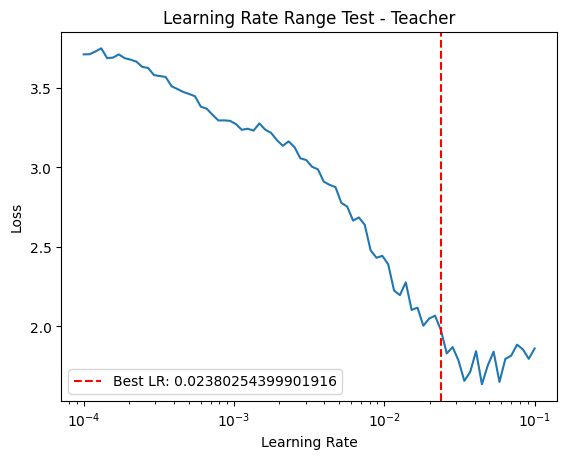

Best Learning Rate Teacher: 0.02380254399901916
0.02380254399901916


In [16]:
#### finding the optimal learning rate
def train_teacher_optimal_lr(model, trainloader, criterion, optimizer, scheduler, device, epochs_optimal_lr=5, lr_range=(1e-4, 1e-1), plot_loss=True):
    model.train()
    model.to(device)
    lr_values = np.logspace(np.log10(lr_range[0]), np.log10(lr_range[1]), epochs_optimal_lr * len(trainloader))  # Generate learning rates for each batch
    lr_iter = iter(lr_values)
    losses = []
    lrs = []
    
    for epoch in range(epochs_optimal_lr):
        for i, batch in enumerate(tqdm(trainloader)):
            lr = next(lr_iter)
            for param_group in optimizer.param_groups:
                param_group['lr'] = lr  # Set new learning rate
            
            inputs, labels = batch['img'].to(device), batch['label'].to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            losses.append(loss.item())
            lrs.append(lr)
    
    # Calculate the derivative of the loss
    loss_derivative = np.gradient(losses)
    
    # Find the learning rate corresponding to the minimum derivative (steepest decline)
    best_lr_index = np.argmin(loss_derivative)
    best_lr = lrs[best_lr_index]
    
    if plot_loss:
        import matplotlib.pyplot as plt
        plt.figure()
        plt.plot(lrs, losses)
        plt.xscale('log')
        plt.xlabel('Learning Rate')
        plt.ylabel('Loss')
        plt.title('Learning Rate Range Test - Teacher')
        plt.axvline(x=best_lr, color='red', linestyle='--', label=f'Best LR: {best_lr}')
        plt.legend()
        plt.show()
    
    print(f'Best Learning Rate Teacher: {best_lr}')
    return best_lr

############# input ############## 
best_lr_teacher = train_teacher_optimal_lr(teacher_model, trainloader, criterion_clf, teacher_optimizer, teacher_scheduler, device, epochs_optimal_lr)  
print(best_lr_teacher)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


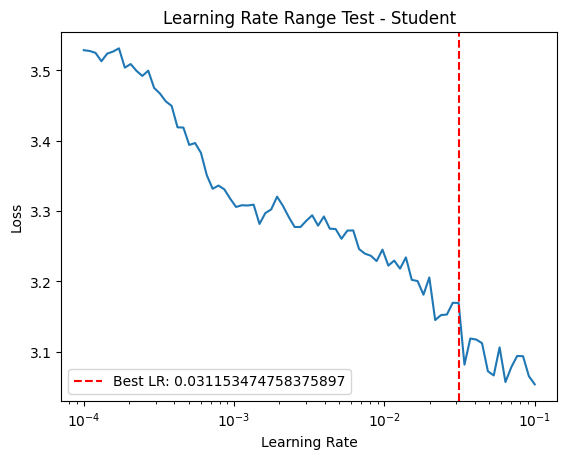

Best Learning Rate Student: 0.031153474758375897
0.031153474758375897


In [17]:
#### finding the optimal learning rate
def train_student_optimal_lr(model, trainloader, criterion, optimizer, scheduler, device, epochs_optimal_lr=5, lr_range=(1e-4, 1e-1), plot_loss=True):
    model.train()
    model.to(device)
    lr_values = np.logspace(np.log10(lr_range[0]), np.log10(lr_range[1]), epochs_optimal_lr * len(trainloader))  # Generate learning rates for each batch
    lr_iter = iter(lr_values)
    losses = []
    lrs = []
    
    for epoch in range(epochs_optimal_lr):
        for i, batch in enumerate(tqdm(trainloader)):
            lr = next(lr_iter)
            for param_group in optimizer.param_groups:
                param_group['lr'] = lr  # Set new learning rate
            
            inputs, labels = batch['img'].to(device), batch['label'].to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            losses.append(loss.item())
            lrs.append(lr)
    
    # Calculate the derivative of the loss
    loss_derivative = np.gradient(losses)
    
    # Find the learning rate corresponding to the minimum derivative (steepest decline)
    best_lr_index = np.argmin(loss_derivative)
    best_lr = lrs[best_lr_index]
    
    if plot_loss:
        import matplotlib.pyplot as plt
        plt.figure()
        plt.plot(lrs, losses)
        plt.xscale('log')
        plt.xlabel('Learning Rate')
        plt.ylabel('Loss')
        plt.title('Learning Rate Range Test - Student')
        plt.axvline(x=best_lr, color='red', linestyle='--', label=f'Best LR: {best_lr}')
        plt.legend()
        plt.show()
    
    print(f'Best Learning Rate Student: {best_lr}')
    return best_lr

############# input ############## 
best_lr_student = train_student_optimal_lr(student_model, trainloader, criterion_clf, student_optimizer, student_scheduler, device, epochs_optimal_lr)  
print(best_lr_student)

In [18]:
def plot_loss_curve(losses):
    epochs = range(1, len(losses) + 1)
    plt.plot(epochs, losses)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Val Loss Curve')
    plt.show()

In [19]:
# Function to train the teacher model
def train_teacher(model, trainloader, criterion, optimizer, scheduler, device, epochs, patience=patience_teacher):

    best_val_loss = float('inf')
    patience_counter = 0
    epoch_losses = [] 
    val_losses = []

    for epoch in range(epochs):
        model.train()
        model.to(device)
        running_loss = 0.0
        epoch_loss = 0.0  
        num_batches = 0  
        for index, data in enumerate(tqdm(trainloader)):
            inputs = data['img'].to(device)
            labels = data['label'].to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            epoch_loss += loss.item()
            num_batches += 1

        epoch_loss /= num_batches  
        epoch_losses.append(epoch_loss)

        model.eval()
        total_correct = 0
        total_samples = 0
        total_val_loss = 0.0
        num_batches = 0  
        with torch.no_grad():
            for val_data in tqdm(testloader):
                val_inputs = val_data['img'].to(device)
                val_labels = val_data['label'].to(device)
    
                # Forward pass for validation
                val_outputs = model(val_inputs)
                val_loss = criterion(val_outputs, val_labels)
                total_val_loss += val_loss.item()
    
                # Compute the validation accuracy
                _, predicted = torch.max(val_outputs, 1)
                total_samples += val_labels.size(0)
                total_correct += (predicted == val_labels).sum().item()
                num_batches += 1
            total_val_loss /= num_batches
            val_losses.append(total_val_loss)
            accuracy = total_correct / total_samples
            print(f'Epoch {epoch + 1}/{epochs}, Train Loss: {epoch_loss: .6f} Val Loss: {total_val_loss: .6f}| Validation Accuracy: {accuracy * 100:.2f}%')
            
        # Check for early stopping
        if total_val_loss < best_val_loss:
            best_val_loss = total_val_loss
            patience_counter = 0 
            torch.save(model.state_dict(), f'teacher_model_weights_ckd_prof_checkpoint.pth')
            torch.save(model, f'teacher_model_ckd_prof_checkpoint.pth')
        else:
            patience_counter += 1 

        if patience_counter >= patience:
            print('Early stopping')
            break  

        scheduler.step()
    plot_loss_curve(val_losses)
    print("Finished Training Teacher")

# This is the adversary training function, where we input the student outputs, 
# with the true labels into the adversary model created previously.
def train_adversary(adv, student, optimizer, trainloader, criterion, epochs):
    best_val_loss = float('inf')
    for epoch in range(epochs):
        epoch_loss = 0
        epoch_batches = 0
        for i, data in enumerate(tqdm(trainloader)):
            # get the inputs and labels
            inputs = data['img'].to(device)
            labels = data['label'].to(device)
            targets = data['target'].to(device)
            student.eval()
            student.to(device)
            adv.train()
            adv.to(device)
            optimizer.zero_grad()
            # output the student model, join with ohe labels. 
            student_output = student(inputs)
            one_hot_labels = F.one_hot(labels, num_classes=num_classes).to(torch.float32)
            concatenated_output = torch.cat((student_output, one_hot_labels), dim=1)
            adversary_output = adv(concatenated_output)

            adversary_loss = criterion(adversary_output, targets)
            adversary_loss.backward()
            epoch_loss += adversary_loss.item()
            epoch_batches += 1
            optimizer.step()
        epoch_loss/=epoch_batches
        print("Average Adversary epoch loss:", epoch_loss)


# Function to train the student model with knowledge distillation
def train_student_with_distillation_disparity(student, teacher, adv, trainloader, testloader, criterion, adv_criterion, optimizer, 
                                              scheduler, device, alpha, temperature, epochs, lmda, patience=patience_student, optimizer_adv=None):
    teacher.eval()
    teacher.to(device)
    num_classes = len(class_labels)
    best_val_loss = float('inf')
    best_epoch_accuracy = 0.0
    best_epoch_disparity = 0.0
    patience_counter = 0 
    student_epoch_losses = []
    val_losses = []
    val_disparities = []
    val_accuracies = []

    for epoch in range(epochs):
        # Train the adversary at the start of each epoch
        train_adversary(adv, student, optimizer_adv, trainloader, adv_criterion, 1)

        student.train()
        student.to(device)
        adv.eval()
        adv.to(device)
        running_loss = 0.0 
        epoch_loss = 0.0  
        num_batches = 0 
        confusion_male = np.zeros((num_classes, num_classes))
        confusion_female = np.zeros((num_classes, num_classes))

        for index, data in enumerate(tqdm(trainloader)):
            inputs = data['img'].to(device)
            labels = data['label'].to(device)
            targets = data['target'].to(device)
            optimizer.zero_grad()
            student_outputs = student(inputs)
            with torch.no_grad():
                teacher_outputs = teacher(inputs)

            # detach student_outputs to avoid exploding gradients by passing same inputs (with gradience) into two different models. 
            studentached = student_outputs.detach()
            # One-hot encode labels and concatenate with student's predictions
            one_hot_labels = F.one_hot(labels, num_classes=num_classes).to(torch.float32)
            concatenated_output = torch.cat((studentached, one_hot_labels), dim=1)

            # Run the adversarial model on concatenated true labels, and predicted labels
            with torch.no_grad():
                adversary_output = adv(concatenated_output)

            # Calc adversary loss, which is an MSE loss, because this is a regression output. 
            adversary_loss = adv_criterion(adversary_output, targets)
            ce_loss = criterion(student_outputs, labels)
            kd_loss = tkd_kdloss(student_outputs, teacher_outputs, temperature=temperature)  # Make sure this returns a scalar
            
            if kd_loss.ndim != 0:
                kd_loss = kd_loss.sum()

            # Now combine the losses, subtract weighted adversary loss because we need to maximize that loss 
            # goal of the model is to have the adversary not predict gender. 
            loss = alpha * kd_loss + (1 - alpha) * ce_loss - lmda * adversary_loss
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            epoch_loss += loss.item()
            num_batches += 1

        epoch_loss /= num_batches
        # print(f'*******Epoch {epoch}: running_recall_with - {running_recall_with/num_batches}  |  running_recall_without - {running_recall_without/num_batches}  |  disparity - {epoch_disparity/num_batches}******')
        student_epoch_losses.append(epoch_loss)

        student.eval()
        total_correct = 0
        total_samples = 0
        total_val_loss = 0.0
        num_batches = 0
        # Validation after each epoch
        with torch.no_grad():
            for val_data in tqdm(testloader):
                val_inputs = val_data['img'].to(device)
                val_labels = val_data['label'].to(device)
                val_targets = val_data['target'].to(device)
                
                # Forward pass for validation
                val_student_outputs = student(val_inputs)
                val_teacher_outputs = teacher(val_inputs)

                val_studentached = val_student_outputs.detach()   
                val_one_hot_labels = F.one_hot(val_labels, num_classes=num_classes).to(torch.float32)
                val_concatenated_output = torch.cat((val_studentached, val_one_hot_labels), dim=1)
                
                val_adversary_output = adv(val_concatenated_output)
                val_adversary_loss = adv_criterion(val_adversary_output, val_targets)
                val_ce_loss = criterion(val_student_outputs, val_labels)
                val_kd_loss = tkd_kdloss(val_student_outputs, val_teacher_outputs, temperature=temperature)  # Make sure this returns a scalar
                
                if val_kd_loss.ndim != 0:
                    val_kd_loss = val_kd_loss.sum()
                
                val_loss = alpha * val_kd_loss + (1 - alpha) * val_ce_loss - lmda * val_adversary_loss
                total_val_loss += val_loss.item()
    
                # Compute the validation accuracy
                _, predicted = torch.max(val_student_outputs, 1)
                total_samples += val_labels.size(0)
                total_correct += (predicted == val_labels).sum().item()
                num_batches += 1
                recall_diff = evaluate_model_with_gender_multiclass(predicted, val_labels, val_targets)
                confusion_male += recall_diff[1]
                confusion_female += recall_diff[2]
    
            total_val_loss /= num_batches
            confusion_male /= num_batches
            confusion_female /= num_batches

            epoch_disparity = calculate_recall_multiclass(confusion_male) - calculate_recall_multiclass(confusion_female)
            val_losses.append(total_val_loss)
            non_zero_abs_values = np.abs(epoch_disparity[epoch_disparity != 0])
            mean_non_zero_abs_disparity = np.mean(non_zero_abs_values)
            val_disparities.append(mean_non_zero_abs_disparity)
            accuracy = total_correct / total_samples
            val_accuracies.append(accuracy)
            print(f'*****Epoch {epoch + 1}/{epochs}*****\n' 
            f'*****Train Loss: {epoch_loss: .6f} Val Loss: {total_val_loss: .6f}*****\n'
            f'*****Validation Accuracy: {accuracy * 100:.2f}%*****\n'
            f'*****Total Avg Disparity: {mean_non_zero_abs_disparity}*****\n')
            class_recall_mapping = {class_name: epoch_disparity[int(class_label)] for class_label, class_name in class_idx.items()}
            
            # Print disparities by class label
            for class_label, recall_diff in class_recall_mapping.items():
                print(f"Class {class_label}: Recall Difference = {recall_diff}")

        # Check for early stopping
        if total_val_loss < best_val_loss:
            best_val_loss = total_val_loss
            patience_counter = 0 
            best_epoch_accuracy = accuracy
            best_epoch_mean_abs_disparity = mean_non_zero_abs_disparity
            torch.save(student.state_dict(), f'student_model_weights_ckd_prof_checkpoint.pth')
            torch.save(student, f'student_model_ckd_prof_checkpoint.pth')
        else:
            patience_counter += 1 

        if patience_counter >= patience:
            print('Early stopping')
            break  

        scheduler.step()
        plot_loss_curve(val_losses)
    
        file_path = f'validation_{lmda}.txt'
        
        # Append data to the text file
        with open(file_path, 'a') as file:
            file.write("Val Accuracies:\n")
            for accuracy in val_accuracies:
                file.write(f"{accuracy}\n")
        
            file.write("\nVal Disparities:\n")
            for disparity in val_disparities:
                file.write(f"{disparity}\n")
        
        print(f"Data has been appended to {file_path}")
        
        # display learning rate:
        current_lr = student_scheduler.get_last_lr()[0]
        print("Learning Rate:", current_lr)
        
    return best_epoch_accuracy, best_epoch_mean_abs_disparity


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.10s/it]


Epoch 1/200, Train Loss:  1.357968 Val Loss:  0.996786| Validation Accuracy: 71.39%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.11s/it]


Epoch 2/200, Train Loss:  0.976824 Val Loss:  0.660294| Validation Accuracy: 81.47%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.09s/it]


Epoch 3/200, Train Loss:  0.711354 Val Loss:  0.501192| Validation Accuracy: 86.36%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.13s/it]


Epoch 4/200, Train Loss:  0.497901 Val Loss:  0.354712| Validation Accuracy: 90.18%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.12s/it]


Epoch 5/200, Train Loss:  0.343912 Val Loss:  0.183370| Validation Accuracy: 95.45%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.07s/it]


Epoch 6/200, Train Loss:  0.252249 Val Loss:  0.117806| Validation Accuracy: 97.89%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.10s/it]


Epoch 7/200, Train Loss:  0.183223 Val Loss:  0.088804| Validation Accuracy: 97.94%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.07s/it]


Epoch 8/200, Train Loss:  0.152290 Val Loss:  0.089528| Validation Accuracy: 97.74%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.08s/it]


Epoch 9/200, Train Loss:  0.138350 Val Loss:  0.059948| Validation Accuracy: 98.81%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.09s/it]


Epoch 10/200, Train Loss:  0.138071 Val Loss:  0.085253| Validation Accuracy: 97.65%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.08s/it]


Epoch 11/200, Train Loss:  0.113256 Val Loss:  0.046388| Validation Accuracy: 98.96%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.10s/it]


Epoch 12/200, Train Loss:  0.093538 Val Loss:  0.060645| Validation Accuracy: 98.41%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.09s/it]


Epoch 13/200, Train Loss:  0.090122 Val Loss:  0.035783| Validation Accuracy: 99.22%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


Epoch 14/200, Train Loss:  0.078674 Val Loss:  0.052329| Validation Accuracy: 98.67%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.11s/it]


Epoch 15/200, Train Loss:  0.071770 Val Loss:  0.021034| Validation Accuracy: 99.42%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.07s/it]


Epoch 16/200, Train Loss:  0.062463 Val Loss:  0.023249| Validation Accuracy: 99.42%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.11s/it]


Epoch 17/200, Train Loss:  0.066326 Val Loss:  0.038121| Validation Accuracy: 98.78%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.07s/it]


Epoch 18/200, Train Loss:  0.064754 Val Loss:  0.045462| Validation Accuracy: 98.67%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.08s/it]


Epoch 19/200, Train Loss:  0.060463 Val Loss:  0.027092| Validation Accuracy: 99.28%


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.09s/it]


Epoch 20/200, Train Loss:  0.053091 Val Loss:  0.028678| Validation Accuracy: 98.99%
Early stopping


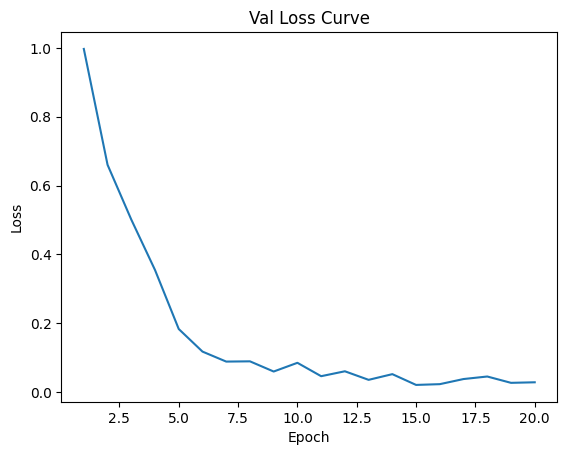

Finished Training Teacher
teacher weights and architecture saved and exported


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


*******Epoch 0: loss - 1.3756044644575853


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:55<00:00,  4.43s/it]


*******Epoch 1: loss - 1.324203188602741


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:56<00:00,  4.49s/it]


*******Epoch 2: loss - 1.269417671056894


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Pretrain Adversary epoch loss:  0.17742354995929277


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Pretrain Adversary epoch loss:  0.1284122679096002


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Pretrain Adversary epoch loss:  0.1250460331256573


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.12266851359835038


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 1/200*****
*****Train Loss:  1.234787 Val Loss:  1.409817*****
*****Validation Accuracy: 20.30%*****
*****Total Avg Disparity: 0.08872842245080152*****

Class Parade: Recall Difference = 0.11321687541199743
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.0
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.011904761904761906
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.07692307692307691
Class Soldier_Patrol: Recall Difference = 0.052287581699346414
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.06677140612725845
Class Running: Recall Diff

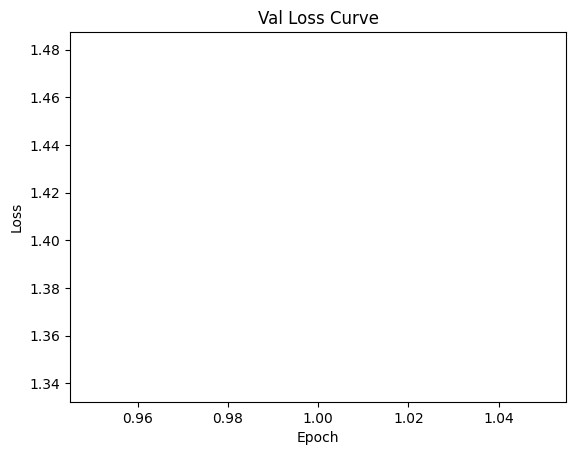

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.12351548327849461


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 2/200*****
*****Train Loss:  1.197403 Val Loss:  1.396066*****
*****Validation Accuracy: 21.11%*****
*****Total Avg Disparity: 0.07332386078587144*****

Class Parade: Recall Difference = 0.09421006372225882
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.01785714285714286
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = -0.020353302611367127
Class Couple: Recall Difference = 0.029850746268656716
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.05477855477855477
Class Soldier_Patrol: Recall Difference = -0.10196078431372552
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.1615606179

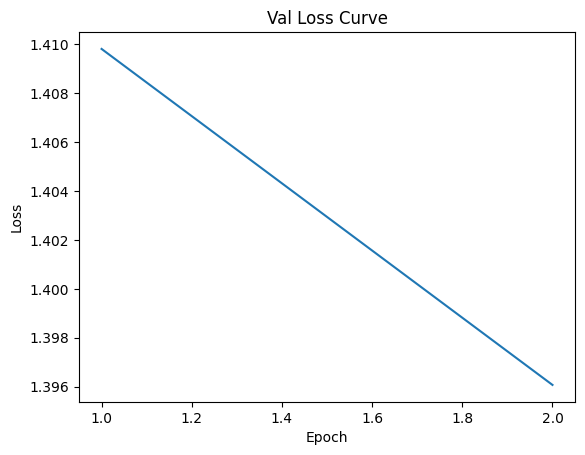

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.12297642632172658


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 3/200*****
*****Train Loss:  1.171859 Val Loss:  1.344792*****
*****Validation Accuracy: 23.46%*****
*****Total Avg Disparity: 0.05415544610085138*****

Class Parade: Recall Difference = 0.022522522522522515
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.03508771929824562
Class Dancing: Recall Difference = -0.04464285714285714
Class Funeral: Recall Difference = -0.02230259192284508
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.09869431643625198
Class Couple: Recall Difference = 0.028493894165535952
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.05477855477855476
Class Soldier_Patrol: Recall Difference = 0.09281045751633998
Class Spa: Recall Difference = 0.02976190476190471
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class W

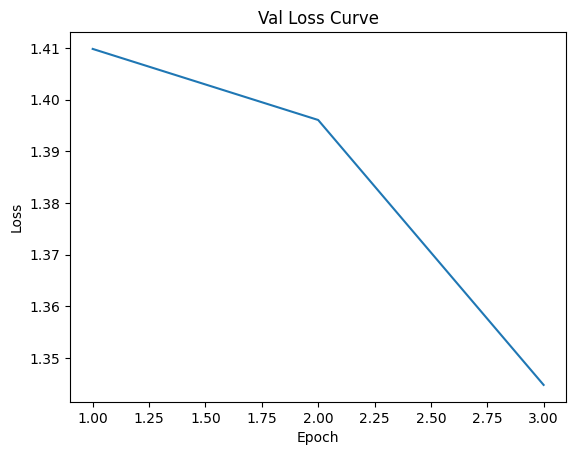

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.12210745507707962


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 4/200*****
*****Train Loss:  1.151356 Val Loss:  1.312833*****
*****Validation Accuracy: 24.65%*****
*****Total Avg Disparity: 0.055829692164671575*****

Class Parade: Recall Difference = 0.07679630850362562
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.05263157894736842
Class Dancing: Recall Difference = -0.02380952380952381
Class Funeral: Recall Difference = -0.03496081977094636
Class Cheering: Recall Difference = 0.017857142857142856
Class Meeting: Recall Difference = 0.046153846153846156
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.018867924528301886
Class Concerts: Recall Difference = 0.07334869431643629
Class Couple: Recall Difference = 0.0746268656716418
Class Family_Group: Recall Difference = -0.01071565250669729
Class Picnic: Recall Difference = -0.01981351981351978
Class Soldier_Patrol: Recall Difference = -0.0039215686274508554
Class Spa: Recall Difference = -0.047619047619047616
Class Sports_Fan:

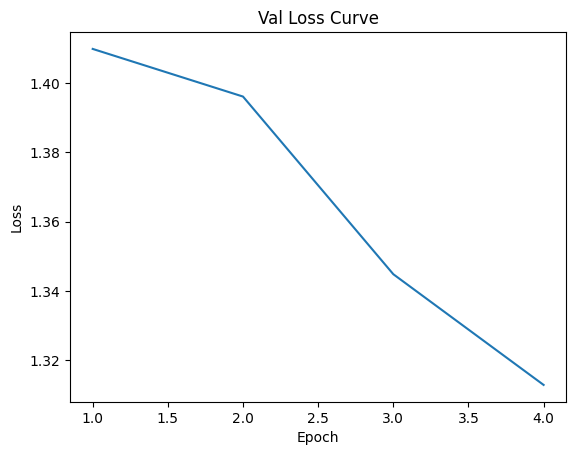

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.12234940895667443


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 5/200*****
*****Train Loss:  1.121477 Val Loss:  1.377712*****
*****Validation Accuracy: 23.54%*****
*****Total Avg Disparity: 0.07674689529428985*****

Class Parade: Recall Difference = -0.01917161063502537
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.001422475106685625
Class Dancing: Recall Difference = -0.008928571428571425
Class Funeral: Recall Difference = -0.03496081977094635
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = 0.015384615384615385
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.02777777777777778
Class Concerts: Recall Difference = 0.06989247311827958
Class Couple: Recall Difference = 0.04477611940298507
Class Family_Group: Recall Difference = -0.02564102564102564
Class Picnic: Recall Difference = 0.14801864801864806
Class Soldier_Patrol: Recall Difference = 0.013725490196078438
Class Spa: Recall Difference = 0.37499999999999994
Class Sports_Fan: R

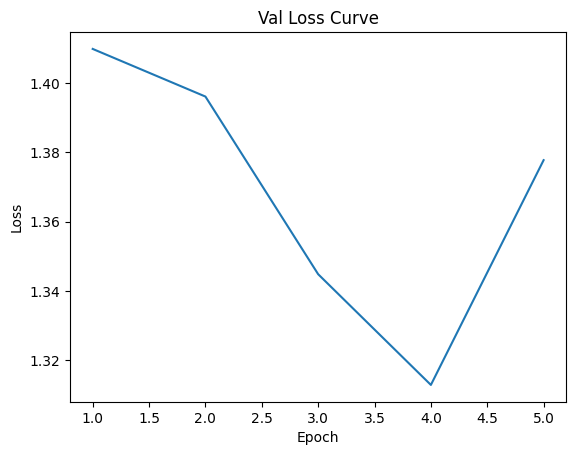

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12426568367160283


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 6/200*****
*****Train Loss:  1.101976 Val Loss:  1.273616*****
*****Validation Accuracy: 27.57%*****
*****Total Avg Disparity: 0.08217329035591527*****

Class Parade: Recall Difference = 0.017468688200395488
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.05405405405405406
Class Dancing: Recall Difference = -0.02976190476190476
Class Funeral: Recall Difference = 0.07896323086196508
Class Cheering: Recall Difference = 0.05357142857142857
Class Meeting: Recall Difference = 0.06153846153846154
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.019916142557651992
Class Concerts: Recall Difference = 0.06643625192012292
Class Couple: Recall Difference = 0.0583446404341927
Class Family_Group: Recall Difference = -0.07271335629544584
Class Picnic: Recall Difference = 0.08974358974358976
Class Soldier_Patrol: Recall Difference = -0.17581699346405233
Class Spa: Recall Difference = 0.1428571428571428
Class Sports_Fan: Recall 

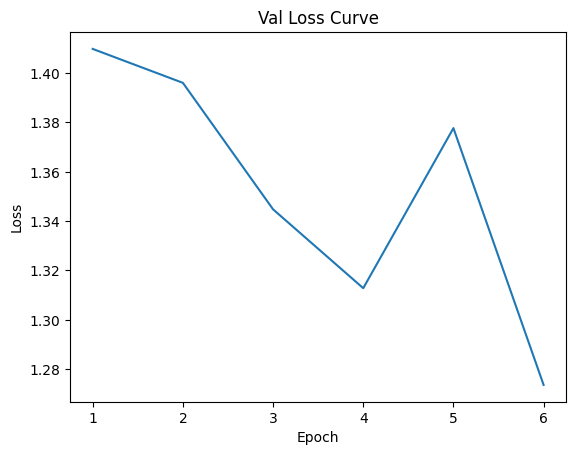

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.12025700796108979


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 7/200*****
*****Train Loss:  1.087863 Val Loss:  1.273069*****
*****Validation Accuracy: 27.19%*****
*****Total Avg Disparity: 0.10431703448551062*****

Class Parade: Recall Difference = 0.022083058668424416
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.026785714285714288
Class Funeral: Recall Difference = 0.012658227848101267
Class Cheering: Recall Difference = 0.03571428571428572
Class Meeting: Recall Difference = -0.11057692307692306
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.12596006144393243
Class Couple: Recall Difference = 0.1044776119402985
Class Family_Group: Recall Difference = -0.006505931879066201
Class Picnic: Recall Difference = 0.16433566433566435
Class Soldier_Patrol: Recall Difference = 0.06601307189542499
Class Spa: Recall Difference = 0.10119047619047619
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons

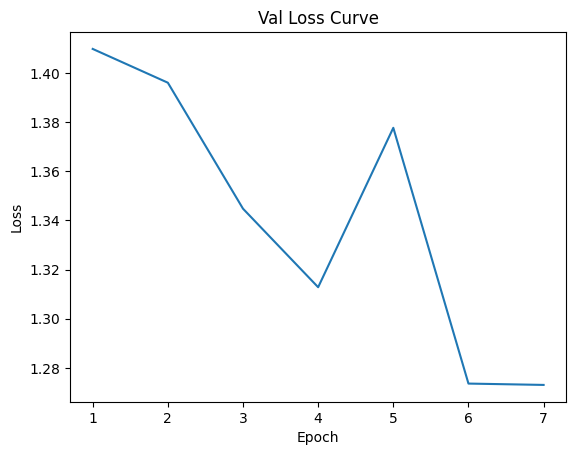

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12059111835864875


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 8/200*****
*****Train Loss:  1.078406 Val Loss:  1.270375*****
*****Validation Accuracy: 27.63%*****
*****Total Avg Disparity: 0.07146830381539496*****

Class Parade: Recall Difference = -0.02191825972313788
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.03651019440493125
Class Dancing: Recall Difference = 0.008928571428571445
Class Funeral: Recall Difference = 0.1289933694996987
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.03365384615384612
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0010482180293501092
Class Concerts: Recall Difference = 0.08717357910906298
Class Couple: Recall Difference = 0.19402985074626866
Class Family_Group: Recall Difference = 0.03406046689628779
Class Picnic: Recall Difference = 0.15850815850815847
Class Soldier_Patrol: Recall Difference = -0.04052287581699343
Class Spa: Recall Difference = 0.0059523809523809035
Class Sports_Fan: Recall Difference =

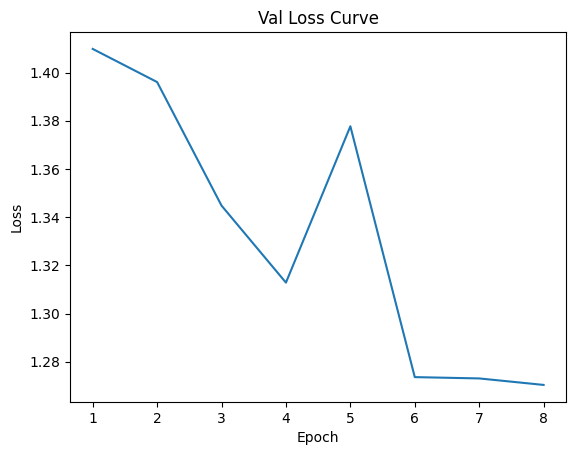

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.12115654779168275


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 9/200*****
*****Train Loss:  1.065028 Val Loss:  1.222895*****
*****Validation Accuracy: 29.68%*****
*****Total Avg Disparity: 0.07649975925732055*****

Class Parade: Recall Difference = -0.014117776312898123
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.04172593646277861
Class Dancing: Recall Difference = 0.029761904761904753
Class Funeral: Recall Difference = -0.028933092224231446
Class Cheering: Recall Difference = 0.03571428571428571
Class Meeting: Recall Difference = 0.07500000000000001
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.05345911949685532
Class Concerts: Recall Difference = 0.03417818740399391
Class Couple: Recall Difference = 0.2238805970149254
Class Family_Group: Recall Difference = -0.004592422502870258
Class Picnic: Recall Difference = 0.13986013986013984
Class Soldier_Patrol: Recall Difference = 0.06601307189542477
Class Spa: Recall Difference = 0.035714285714285726
Class Sports_Fan: Rec

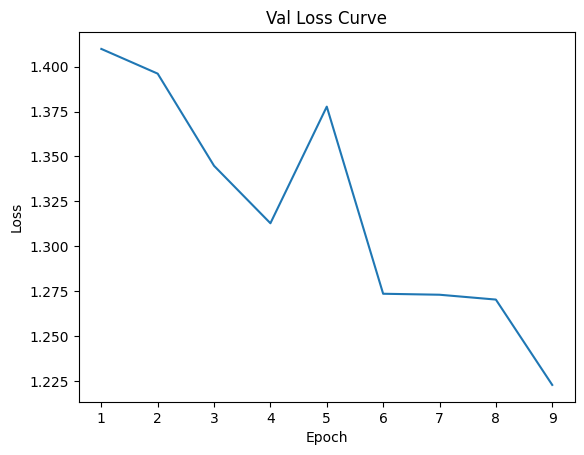

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.12224366802435654


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 10/200*****
*****Train Loss:  1.046068 Val Loss:  1.205130*****
*****Validation Accuracy: 30.38%*****
*****Total Avg Disparity: 0.0938785436479341*****

Class Parade: Recall Difference = -0.10552625796528237
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.10953058321479375
Class Dancing: Recall Difference = -0.008928571428571425
Class Funeral: Recall Difference = 0.1042796865581676
Class Cheering: Recall Difference = 0.035714285714285705
Class Meeting: Recall Difference = 0.011538461538461553
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03773584905660377
Class Concerts: Recall Difference = 0.03417818740399388
Class Couple: Recall Difference = 0.22388059701492544
Class Family_Group: Recall Difference = -0.055683122847302
Class Picnic: Recall Difference = 0.17249417249417245
Class Soldier_Patrol: Recall Difference = 0.051633986928104725
Class Spa: Recall Difference = 0.30952380952380953
Class Sports_Fan: Recall

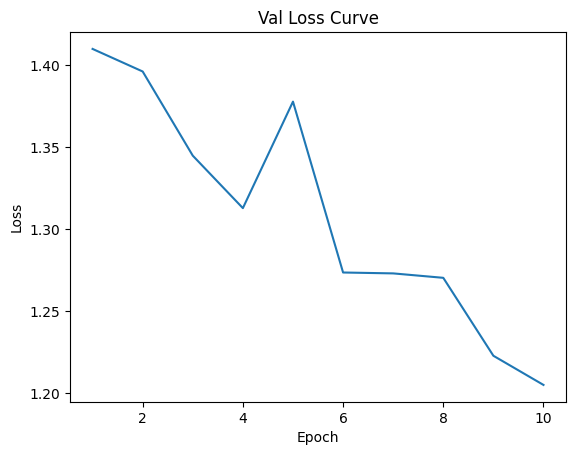

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.12093136946742351


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 11/200*****
*****Train Loss:  1.029920 Val Loss:  1.173196*****
*****Validation Accuracy: 32.35%*****
*****Total Avg Disparity: 0.09144266342854071*****

Class Parade: Recall Difference = -0.1070094484728632
Class Handshaking: Recall Difference = -0.1071428571428571
Class Riot: Recall Difference = 0.008060692271218597
Class Dancing: Recall Difference = -0.008928571428571418
Class Funeral: Recall Difference = 0.1796262808921037
Class Cheering: Recall Difference = 0.03571428571428571
Class Meeting: Recall Difference = 0.026923076923076966
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0010482180293501092
Class Concerts: Recall Difference = 0.04454685099846403
Class Couple: Recall Difference = 0.2971506105834464
Class Family_Group: Recall Difference = -0.11557596632223502
Class Picnic: Recall Difference = -0.0641025641025641
Class Soldier_Patrol: Recall Difference = -0.06143790849673181
Class Spa: Recall Difference = 0.08928571428571425
Class 

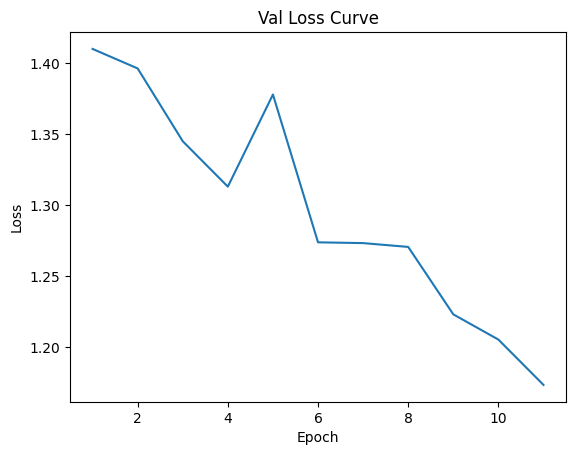

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.12008270879204457


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 12/200*****
*****Train Loss:  1.022399 Val Loss:  1.187928*****
*****Validation Accuracy: 30.18%*****
*****Total Avg Disparity: 0.08556037678620204*****

Class Parade: Recall Difference = -0.06839156229400145
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.010905642484589848
Class Dancing: Recall Difference = 0.0773809523809524
Class Funeral: Recall Difference = -0.08921036769138033
Class Cheering: Recall Difference = 0.009398496240601503
Class Meeting: Recall Difference = -0.05000000000000002
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.018867924528301886
Class Concerts: Recall Difference = 0.010368663594470043
Class Couple: Recall Difference = 0.13432835820895522
Class Family_Group: Recall Difference = -0.038652889399158105
Class Picnic: Recall Difference = 0.10372960372960369
Class Soldier_Patrol: Recall Difference = -0.15359477124183019
Class Spa: Recall Difference = 0.15476190476190477
Class Sports_Fan: 

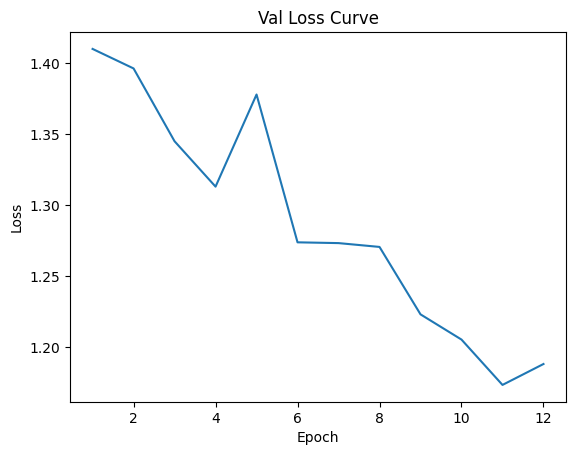

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.12049626186490059


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 13/200*****
*****Train Loss:  1.011665 Val Loss:  1.243239*****
*****Validation Accuracy: 28.41%*****
*****Total Avg Disparity: 0.08305003942751107*****

Class Parade: Recall Difference = -0.014941771039332141
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.017543859649122806
Class Dancing: Recall Difference = 0.07440476190476193
Class Funeral: Recall Difference = 0.20192887281494887
Class Cheering: Recall Difference = 0.0009398496240601434
Class Meeting: Recall Difference = 0.05769230769230771
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03773584905660377
Class Concerts: Recall Difference = 0.09715821812596007
Class Couple: Recall Difference = 0.13432835820895522
Class Family_Group: Recall Difference = -0.030233448143895864
Class Picnic: Recall Difference = -0.0419580419580419
Class Soldier_Patrol: Recall Difference = -0.00849673202614376
Class Spa: Recall Difference = -0.11904761904761904
Class Sports_Fan: R

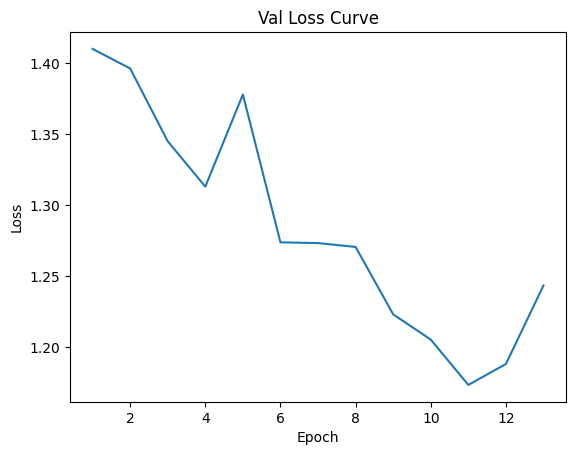

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.1201728808765228


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.12s/it]


*****Epoch 14/200*****
*****Train Loss:  1.003276 Val Loss:  1.153908*****
*****Validation Accuracy: 32.84%*****
*****Total Avg Disparity: 0.10452866739588133*****

Class Parade: Recall Difference = -0.08091628213579438
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.07017543859649124
Class Dancing: Recall Difference = 0.03869047619047618
Class Funeral: Recall Difference = 0.18625678119349007
Class Cheering: Recall Difference = 0.05357142857142856
Class Meeting: Recall Difference = 0.07307692307692318
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0010482180293501162
Class Concerts: Recall Difference = 0.24193548387096792
Class Couple: Recall Difference = 0.26865671641791045
Class Family_Group: Recall Difference = 0.006123230003827029
Class Picnic: Recall Difference = 0.03496503496503489
Class Soldier_Patrol: Recall Difference = 0.037254901960784514
Class Spa: Recall Difference = 0.26190476190476186
Class S

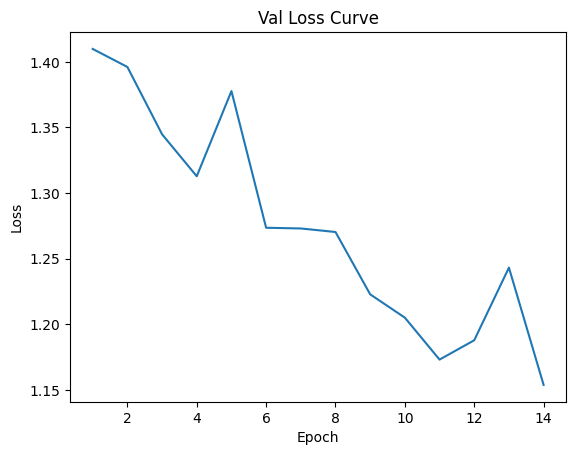

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11905450660448808


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 15/200*****
*****Train Loss:  0.988486 Val Loss:  1.146544*****
*****Validation Accuracy: 33.42%*****
*****Total Avg Disparity: 0.09866427963014113*****

Class Parade: Recall Difference = -0.0921226104152934
Class Handshaking: Recall Difference = 0.017857142857142856
Class Riot: Recall Difference = -0.04599336178283547
Class Dancing: Recall Difference = 0.005952380952380973
Class Funeral: Recall Difference = 0.13924050632911392
Class Cheering: Recall Difference = 0.07142857142857144
Class Meeting: Recall Difference = -0.05096153846153845
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.011006289308176098
Class Concerts: Recall Difference = 0.04953917050691248
Class Couple: Recall Difference = 0.3419267299864315
Class Family_Group: Recall Difference = -0.047263681592039836
Class Picnic: Recall Difference = -0.037296037296037254
Class Soldier_Patrol: Recall Difference = -0.19477124183006522
Class Spa: Recall Difference = 0.2142857142857143
Clas

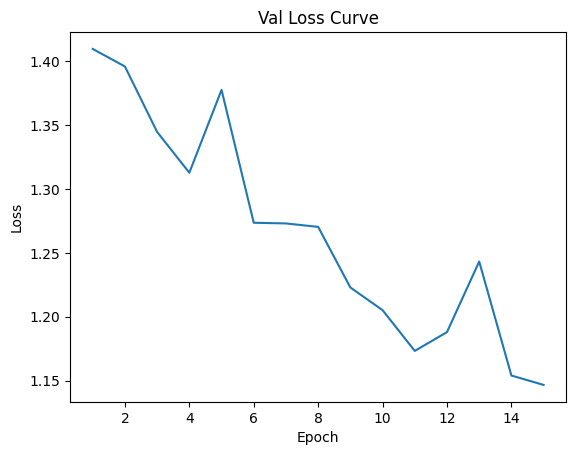

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11932519135566858


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 16/200*****
*****Train Loss:  0.975300 Val Loss:  1.152573*****
*****Validation Accuracy: 33.59%*****
*****Total Avg Disparity: 0.11964886919563214*****

Class Parade: Recall Difference = 0.052515930564711044
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.13086770981507823
Class Dancing: Recall Difference = 0.017857142857142877
Class Funeral: Recall Difference = 0.09704641350210985
Class Cheering: Recall Difference = -0.016917293233082706
Class Meeting: Recall Difference = -0.0019230769230768885
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.05660377358490566
Class Concerts: Recall Difference = 0.08525345622119823
Class Couple: Recall Difference = 0.17774762550881953
Class Family_Group: Recall Difference = -0.0729047072330654
Class Picnic: Recall Difference = 0.020979020979020935
Class Soldier_Patrol: Recall Difference = 0.13267973856209153
Class Spa: Recall Difference = 0.33333333333333326
Class Sports_Fan: Re

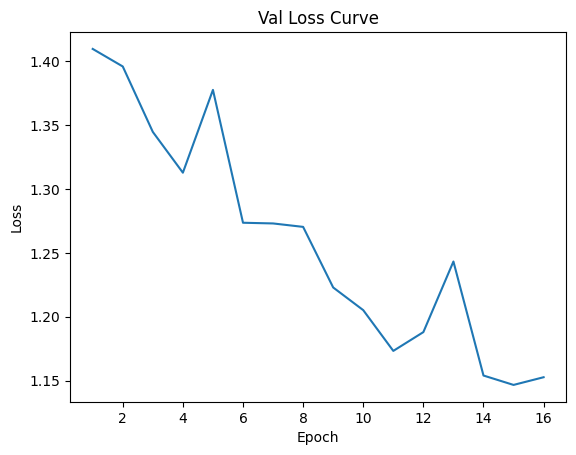

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.1200473469037276


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 17/200*****
*****Train Loss:  0.963686 Val Loss:  1.129749*****
*****Validation Accuracy: 36.52%*****
*****Total Avg Disparity: 0.09952251916619717*****

Class Parade: Recall Difference = -0.05855855855855863
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.0066382171645329585
Class Dancing: Recall Difference = 0.05654761904761903
Class Funeral: Recall Difference = 0.19891500904159135
Class Cheering: Recall Difference = -0.008458646616541353
Class Meeting: Recall Difference = 0.15192307692307694
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.06446540880503143
Class Concerts: Recall Difference = -0.014592933947772613
Class Couple: Recall Difference = 0.101763907734057
Class Family_Group: Recall Difference = -0.1050516647531573
Class Picnic: Recall Difference = -0.061771561771561734
Class Soldier_Patrol: Recall Difference = -0.03594771241830064
Class Spa: Recall Difference = 0.3869047619047618
Clas

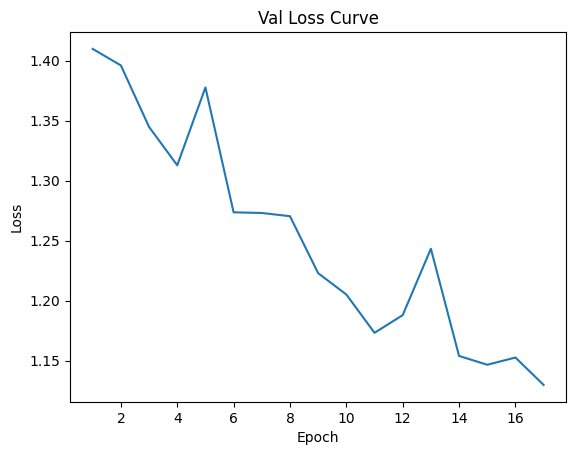

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.1197928164440852


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 18/200*****
*****Train Loss:  0.949574 Val Loss:  1.247973*****
*****Validation Accuracy: 30.76%*****
*****Total Avg Disparity: 0.06348749512854954*****

Class Parade: Recall Difference = -0.025488903537684016
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.029761904761904774
Class Funeral: Recall Difference = -0.03496081977094635
Class Cheering: Recall Difference = 0.0009398496240601573
Class Meeting: Recall Difference = -0.016346153846153844
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.04769392033542977
Class Concerts: Recall Difference = -0.020353302611367127
Class Couple: Recall Difference = 0.0583446404341927
Class Family_Group: Recall Difference = -0.021431305013394568
Class Picnic: Recall Difference = 0.006993006993006923
Class Soldier_Patrol: Recall Difference = -0.09934640522875815
Class Spa: Recall Difference = -0.035714285714285754
Class Sports_Fan: Recall Diff

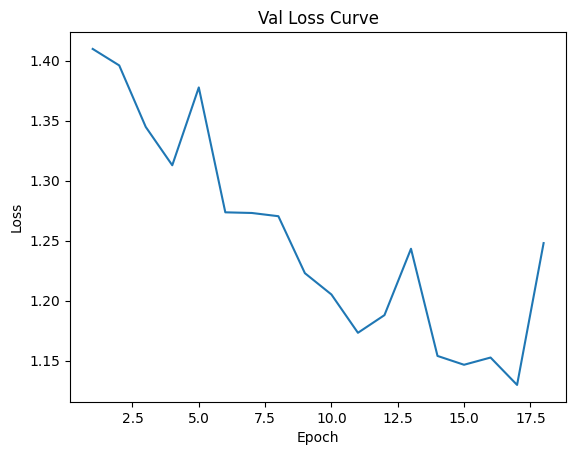

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12132936945328346


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 19/200*****
*****Train Loss:  0.945710 Val Loss:  1.080805*****
*****Validation Accuracy: 37.36%*****
*****Total Avg Disparity: 0.08003018137501672*****

Class Parade: Recall Difference = 0.015326301911667839
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.07823613086770984
Class Dancing: Recall Difference = -0.020833333333333343
Class Funeral: Recall Difference = 0.23688969258589526
Class Cheering: Recall Difference = -0.007518796992481203
Class Meeting: Recall Difference = -0.07211538461538447
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0020964360587002046
Class Concerts: Recall Difference = 0.022657450076804975
Class Couple: Recall Difference = 0.11804613297150614
Class Family_Group: Recall Difference = -0.09031764255644859
Class Picnic: Recall Difference = 0.08158508158508154
Class Soldier_Patrol: Recall Difference = 0.14379084967320271
Class Spa: Recall Difference = -0.0892857142857143
Cl

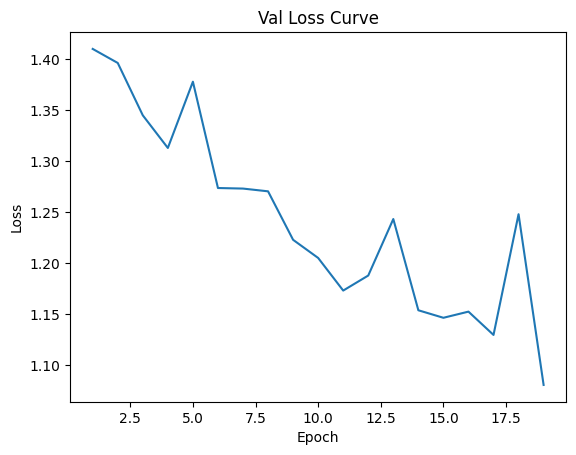

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.12114116950676991


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 20/200*****
*****Train Loss:  0.927387 Val Loss:  1.071548*****
*****Validation Accuracy: 40.37%*****
*****Total Avg Disparity: 0.0940256834103216*****

Class Parade: Recall Difference = -0.024884640738299213
Class Handshaking: Recall Difference = -0.035714285714285726
Class Riot: Recall Difference = 0.0023707918444760834
Class Dancing: Recall Difference = 0.03273809523809523
Class Funeral: Recall Difference = 0.1633514165159735
Class Cheering: Recall Difference = -0.061090225563909764
Class Meeting: Recall Difference = 0.101923076923077
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09538784067085956
Class Concerts: Recall Difference = 0.009216589861751168
Class Couple: Recall Difference = 0.1316146540027137
Class Family_Group: Recall Difference = -0.06659012629161881
Class Picnic: Recall Difference = 0.09790209790209792
Class Soldier_Patrol: Recall Difference = 0.11830065359477143
Class Spa: Recall Difference = 0.2142857142857142
Class Sp

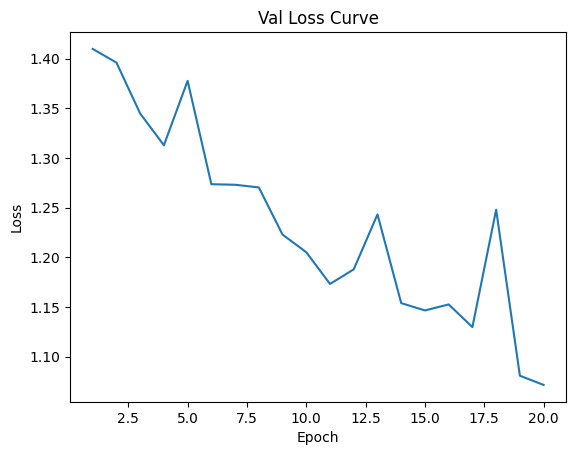

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11934739064711791


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 21/200*****
*****Train Loss:  0.914616 Val Loss:  1.218479*****
*****Validation Accuracy: 31.68%*****
*****Total Avg Disparity: 0.07119678930808111*****

Class Parade: Recall Difference = -0.04828609096901776
Class Handshaking: Recall Difference = 0.03571428571428572
Class Riot: Recall Difference = 0.043148411569464216
Class Dancing: Recall Difference = 0.005952380952380973
Class Funeral: Recall Difference = -0.06389391199517783
Class Cheering: Recall Difference = 0.03571428571428571
Class Meeting: Recall Difference = -0.0009615384615384512
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03773584905660378
Class Concerts: Recall Difference = 0.10906298003072196
Class Couple: Recall Difference = 0.04477611940298508
Class Family_Group: Recall Difference = -0.008610792192881751
Class Picnic: Recall Difference = 0.03496503496503495
Class Soldier_Patrol: Recall Difference = -0.0117647058823529
Class Spa: Recall Difference = 0.13690476190476192
Cla

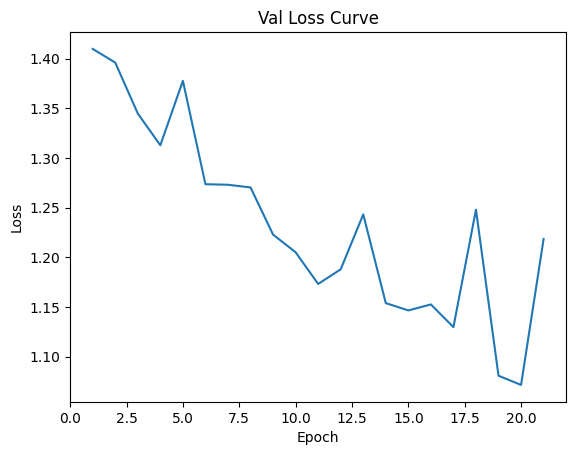

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12023867981938216


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 22/200*****
*****Train Loss:  0.909949 Val Loss:  1.054962*****
*****Validation Accuracy: 39.59%*****
*****Total Avg Disparity: 0.09539481212686066*****

Class Parade: Recall Difference = -0.022247857613711064
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.18065433854907545
Class Dancing: Recall Difference = -0.005952380952380931
Class Funeral: Recall Difference = 0.05003013863773362
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.27596153846153854
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0020964360587002323
Class Concerts: Recall Difference = 0.09062980030721968
Class Couple: Recall Difference = -0.0027137042062414796
Class Family_Group: Recall Difference = -0.07520091848450061
Class Picnic: Recall Difference = 0.0815850815850816
Class Soldier_Patrol: Recall Difference = 0.12287581699346417
Class Spa: Recall Difference = 0.3154761904761903
Class Sports_Fan: Re

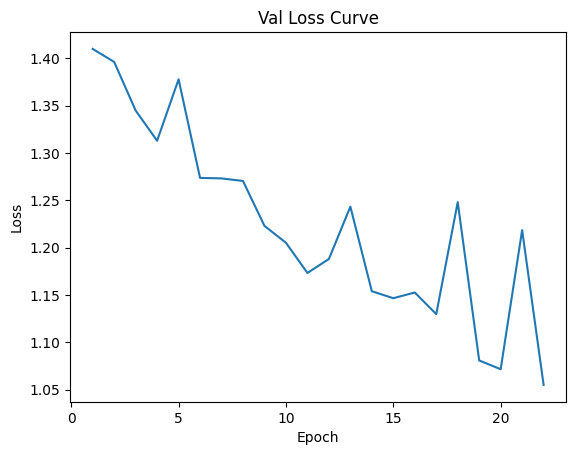

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11994411165897663


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 23/200*****
*****Train Loss:  0.899161 Val Loss:  1.080464*****
*****Validation Accuracy: 37.30%*****
*****Total Avg Disparity: 0.09199418648088117*****

Class Parade: Recall Difference = 0.027466490881125072
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.07017543859649122
Class Dancing: Recall Difference = 0.05059523809523811
Class Funeral: Recall Difference = 0.1512959614225438
Class Cheering: Recall Difference = -0.008458646616541356
Class Meeting: Recall Difference = 0.042307692307692324
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.05765199161425576
Class Concerts: Recall Difference = 0.16705069124423955
Class Couple: Recall Difference = 0.043419267299864325
Class Family_Group: Recall Difference = -0.12839647914274777
Class Picnic: Recall Difference = 0.02913752913752915
Class Soldier_Patrol: Recall Difference = -0.04509803921568628
Class Spa: Recall Difference = 0.33928571428571414
Class Sports_Fan: Reca

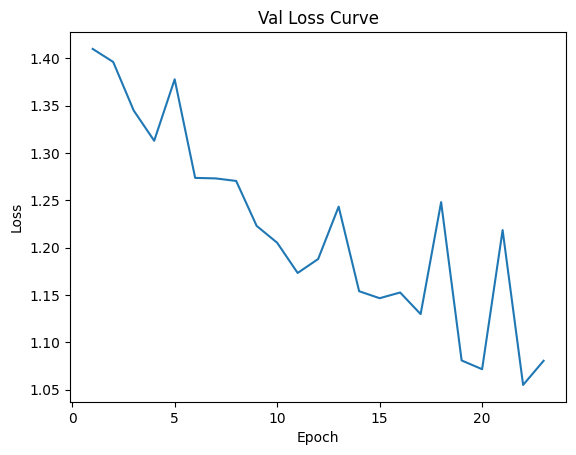

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11897871757929142


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.13s/it]


*****Epoch 24/200*****
*****Train Loss:  0.890002 Val Loss:  1.078835*****
*****Validation Accuracy: 37.33%*****
*****Total Avg Disparity: 0.10280556689261024*****

Class Parade: Recall Difference = 0.02537903757415949
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = -0.047415836889521085
Class Dancing: Recall Difference = 0.2291666666666667
Class Funeral: Recall Difference = 0.14767932489451496
Class Cheering: Recall Difference = -0.026315789473684213
Class Meeting: Recall Difference = 0.2605769230769231
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03773584905660377
Class Concerts: Recall Difference = 0.0518433179723502
Class Couple: Recall Difference = 0.07327001356852106
Class Family_Group: Recall Difference = -0.03214695752009187
Class Picnic: Recall Difference = 0.01282051282051283
Class Soldier_Patrol: Recall Difference = 0.02614379084967322
Class Spa: Recall Difference = 0.5059523809523809
Class Spor

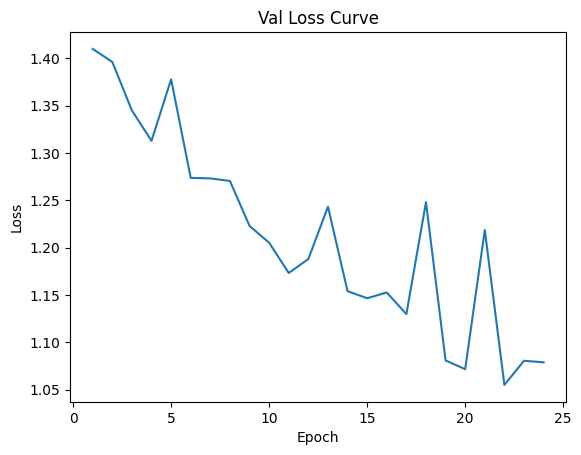

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.20s/it]


Average Adversary epoch loss: 0.1191990593305001


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 25/200*****
*****Train Loss:  0.887154 Val Loss:  1.022576*****
*****Validation Accuracy: 41.27%*****
*****Total Avg Disparity: 0.09069914006996062*****

Class Parade: Recall Difference = -0.06954515491100877
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.041725936462778584
Class Dancing: Recall Difference = 0.11309523809523815
Class Funeral: Recall Difference = 0.14828209764918632
Class Cheering: Recall Difference = 0.017857142857142856
Class Meeting: Recall Difference = 0.12019230769230776
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08647798742138364
Class Concerts: Recall Difference = -0.06912442396313362
Class Couple: Recall Difference = 0.10176390773405705
Class Family_Group: Recall Difference = -0.06659012629161878
Class Picnic: Recall Difference = -0.1806526806526806
Class Soldier_Patrol: Recall Difference = -0.11372549019607836
Class Spa: Recall Difference = -0.017857142857142863
Clas

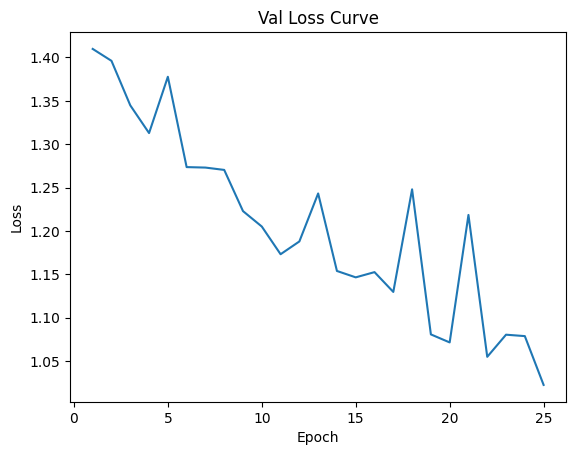

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.12031283458838096


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.13s/it]


*****Epoch 26/200*****
*****Train Loss:  0.865546 Val Loss:  1.058423*****
*****Validation Accuracy: 38.29%*****
*****Total Avg Disparity: 0.09103956300256513*****

Class Parade: Recall Difference = -0.007031421665567805
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.0687529634898056
Class Dancing: Recall Difference = 0.029761904761904767
Class Funeral: Recall Difference = 0.06931886678722124
Class Cheering: Recall Difference = 0.011278195488721804
Class Meeting: Recall Difference = -0.17692307692307696
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03773584905660377
Class Concerts: Recall Difference = -0.02534562211981564
Class Couple: Recall Difference = 0.11940298507462685
Class Family_Group: Recall Difference = -0.11557596632223496
Class Picnic: Recall Difference = -0.003496503496503489
Class Soldier_Patrol: Recall Difference = -0.05620915032679752
Class Spa: Recall Difference = 0.23809523809523803
Cla

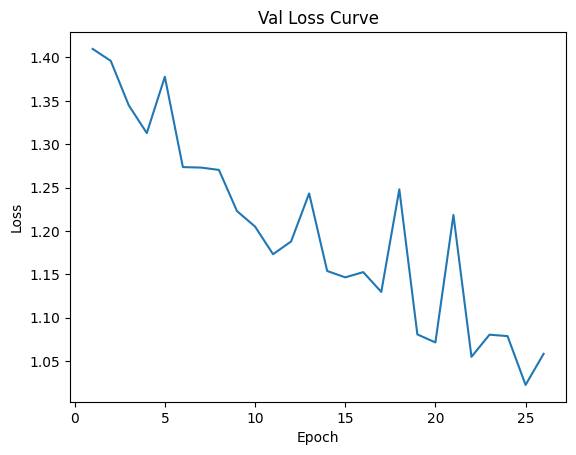

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11911853890006359


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 27/200*****
*****Train Loss:  0.853749 Val Loss:  0.976014*****
*****Validation Accuracy: 41.99%*****
*****Total Avg Disparity: 0.09860433162293794*****

Class Parade: Recall Difference = -0.033234453966161315
Class Handshaking: Recall Difference = -0.05357142857142857
Class Riot: Recall Difference = 0.05263157894736842
Class Dancing: Recall Difference = 0.15476190476190482
Class Funeral: Recall Difference = 0.06931886678722121
Class Cheering: Recall Difference = 0.09022556390977443
Class Meeting: Recall Difference = -0.052884615384615474
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.05660377358490567
Class Concerts: Recall Difference = 0.2196620583717358
Class Couple: Recall Difference = 0.17910447761194032
Class Family_Group: Recall Difference = -0.10294680443934184
Class Picnic: Recall Difference = 0.12820512820512825
Class Soldier_Patrol: Recall Difference = 0.0104575163398693
Class Spa: Recall Difference = 0.14880952380952372
Class Sp

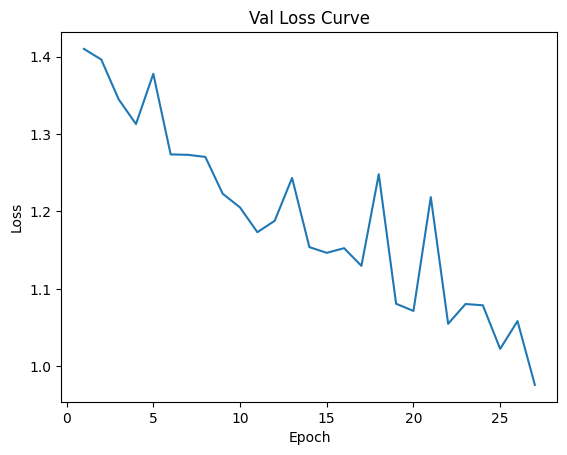

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11885865921011338


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 28/200*****
*****Train Loss:  0.842074 Val Loss:  0.955328*****
*****Validation Accuracy: 42.40%*****
*****Total Avg Disparity: 0.09096357421423372*****

Class Parade: Recall Difference = -0.06762250054932983
Class Handshaking: Recall Difference = 0.07142857142857142
Class Riot: Recall Difference = -0.05405405405405406
Class Dancing: Recall Difference = 0.05059523809523814
Class Funeral: Recall Difference = -0.054249547920433974
Class Cheering: Recall Difference = 0.0018796992481203145
Class Meeting: Recall Difference = 0.009615384615384637
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.14308176100628933
Class Concerts: Recall Difference = 0.06490015360983103
Class Couple: Recall Difference = 0.16146540027137044
Class Family_Group: Recall Difference = -0.08783008036739384
Class Picnic: Recall Difference = -0.006993006993006978
Class Soldier_Patrol: Recall Difference = -0.02026143790849666
Class Spa: Recall Difference = 0.244047619047619
Cla

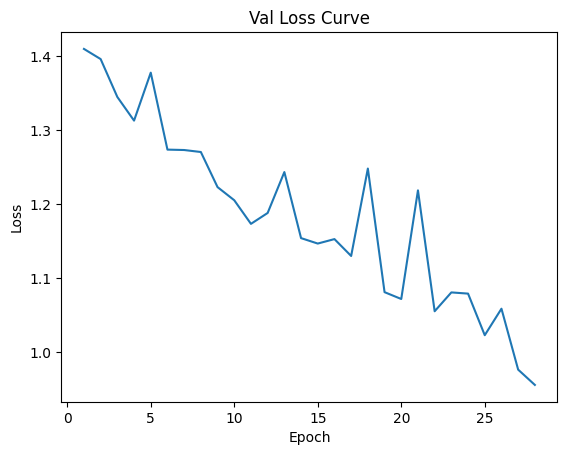

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.19s/it]


Average Adversary epoch loss: 0.11703753328094116


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 29/200*****
*****Train Loss:  0.836475 Val Loss:  0.953216*****
*****Validation Accuracy: 43.27%*****
*****Total Avg Disparity: 0.10605335410501257*****

Class Parade: Recall Difference = -0.039991210722918114
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.07823613086770981
Class Dancing: Recall Difference = 0.0625
Class Funeral: Recall Difference = 0.20494273658830636
Class Cheering: Recall Difference = 0.055451127819548876
Class Meeting: Recall Difference = 0.24230769230769228
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.0026205450733752245
Class Concerts: Recall Difference = 0.04838709677419367
Class Couple: Recall Difference = 0.1166892808683854
Class Family_Group: Recall Difference = -0.04114045158821278
Class Picnic: Recall Difference = 0.015151515151515194
Class Soldier_Patrol: Recall Difference = 0.10392156862745106
Class Spa: Recall Difference = 0.31547619047619035
Class Sports_Fan: Recall Differenc

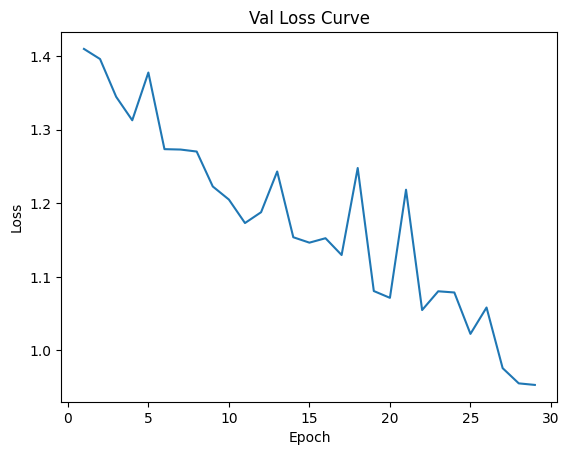

Data has been appended to validation_0.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.1187403010061154


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 30/200*****
*****Train Loss:  0.820685 Val Loss:  0.945372*****
*****Validation Accuracy: 45.24%*****
*****Total Avg Disparity: 0.10435799920340032*****

Class Parade: Recall Difference = -0.022247857613711175
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.11711711711711709
Class Dancing: Recall Difference = 0.08630952380952378
Class Funeral: Recall Difference = 0.2712477396021701
Class Cheering: Recall Difference = 0.05639097744360902
Class Meeting: Recall Difference = 0.041346153846153866
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.1420335429769392
Class Concerts: Recall Difference = -0.014592933947772724
Class Couple: Recall Difference = 0.1926729986431479
Class Family_Group: Recall Difference = -0.06659012629161878
Class Picnic: Recall Difference = 0.051282051282051266
Class Soldier_Patrol: Recall Difference = -0.021568627450980316
Class Spa: Recall Difference = 0.2857142857142857
Class S

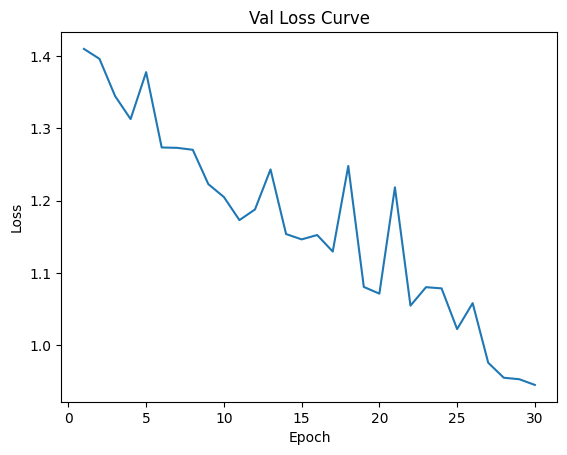

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1197840296305143


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 31/200*****
*****Train Loss:  0.776046 Val Loss:  0.804920*****
*****Validation Accuracy: 53.69%*****
*****Total Avg Disparity: 0.09819223847359457*****

Class Parade: Recall Difference = -0.07262140188969457
Class Handshaking: Recall Difference = -0.01785714285714283
Class Riot: Recall Difference = -0.07728781412991942
Class Dancing: Recall Difference = 0.11904761904761901
Class Funeral: Recall Difference = 0.1892706449668476
Class Cheering: Recall Difference = -0.02443609022556391
Class Meeting: Recall Difference = 0.09903846153846163
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07966457023060797
Class Concerts: Recall Difference = -0.0775729646697389
Class Couple: Recall Difference = 0.23609226594301227
Class Family_Group: Recall Difference = -0.07960199004975127
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.056862745098039125
Class Spa: Recall Difference = 0.05357142857142838
Class 

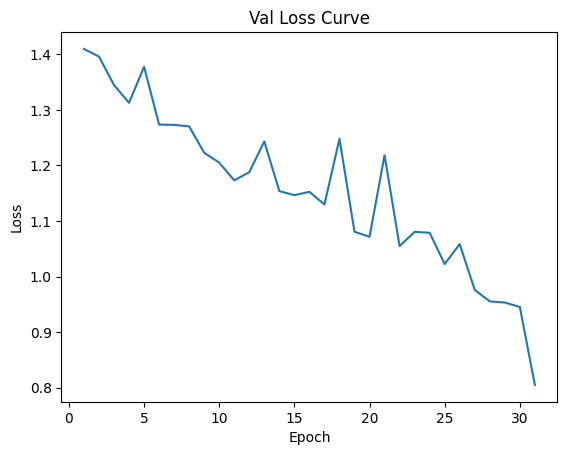

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11721282996810399


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 32/200*****
*****Train Loss:  0.760963 Val Loss:  0.782724*****
*****Validation Accuracy: 54.88%*****
*****Total Avg Disparity: 0.1069732242876323*****

Class Parade: Recall Difference = -0.05097780707536803
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = -0.05452821242294936
Class Dancing: Recall Difference = 0.05952380952380956
Class Funeral: Recall Difference = 0.07172995780590724
Class Cheering: Recall Difference = 0.04699248120300753
Class Meeting: Recall Difference = 0.09903846153846163
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.02306079664570229
Class Concerts: Recall Difference = -0.06720430107526876
Class Couple: Recall Difference = 0.26594301221166905
Class Family_Group: Recall Difference = -0.15862992728664368
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.10457516339869266
Class Spa: Recall Difference = 0.22619047619047605
Class S

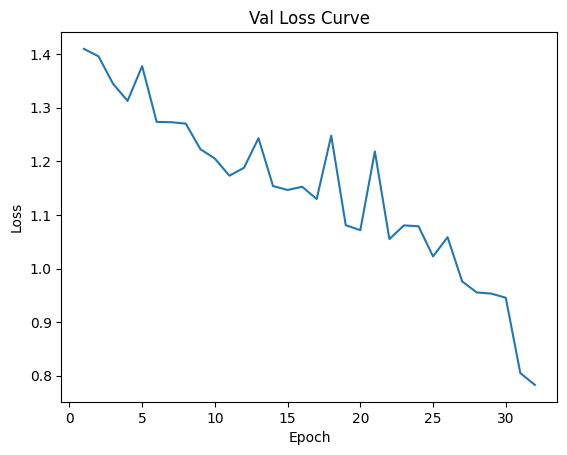

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11601549788163258


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 33/200*****
*****Train Loss:  0.746482 Val Loss:  0.773228*****
*****Validation Accuracy: 55.00%*****
*****Total Avg Disparity: 0.10930743757691265*****

Class Parade: Recall Difference = 0.011206328279498856
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.03603603603603606
Class Dancing: Recall Difference = 0.05654761904761907
Class Funeral: Recall Difference = 0.24291742013260997
Class Cheering: Recall Difference = 0.011278195488721804
Class Meeting: Recall Difference = 0.09903846153846163
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03301886792452835
Class Concerts: Recall Difference = -0.01958525345622114
Class Couple: Recall Difference = 0.22116689280868393
Class Family_Group: Recall Difference = -0.1970914657481822
Class Picnic: Recall Difference = -0.045454545454545414
Class Soldier_Patrol: Recall Difference = -0.06797385620915042
Class Spa: Recall Difference = 0.1785714285714285
Class Sports_Fan: Recal

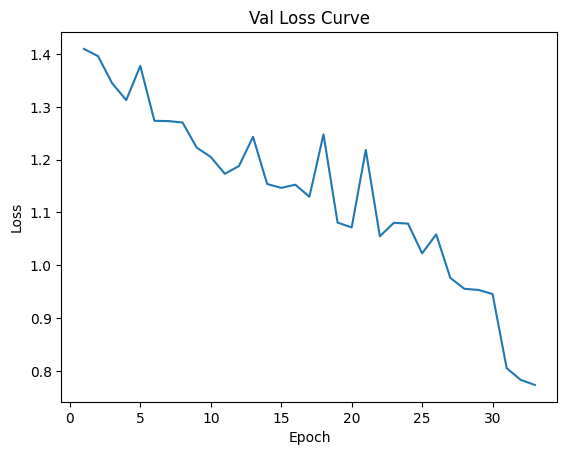

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11682831467344211


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 34/200*****
*****Train Loss:  0.745888 Val Loss:  0.774981*****
*****Validation Accuracy: 55.57%*****
*****Total Avg Disparity: 0.09540482147493076*****

Class Parade: Recall Difference = 0.0233465172489562
Class Handshaking: Recall Difference = -0.05357142857142855
Class Riot: Recall Difference = -0.01944049312470375
Class Dancing: Recall Difference = 0.1517857142857143
Class Funeral: Recall Difference = 0.07474382157926462
Class Cheering: Recall Difference = 0.037593984962406
Class Meeting: Recall Difference = 0.09903846153846152
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.033542976939203356
Class Concerts: Recall Difference = -0.007680491551459168
Class Couple: Recall Difference = 0.22116689280868393
Class Family_Group: Recall Difference = -0.06467661691542292
Class Picnic: Recall Difference = 0.03146853146853157
Class Soldier_Patrol: Recall Difference = -0.04901960784313697
Class Spa: Recall Difference = 0.25
Class S

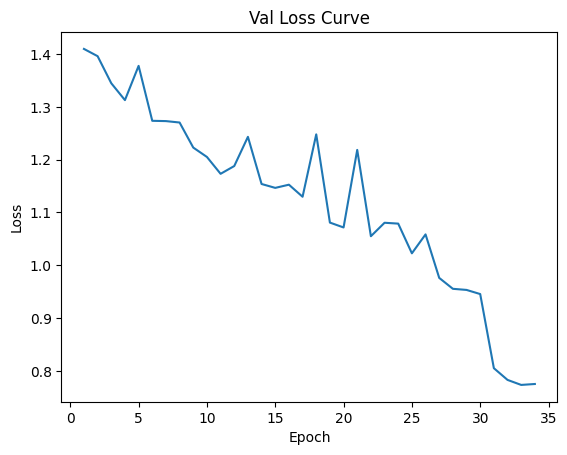

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11601162931093803


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 35/200*****
*****Train Loss:  0.745137 Val Loss:  0.763851*****
*****Validation Accuracy: 56.50%*****
*****Total Avg Disparity: 0.10110813911488549*****

Class Parade: Recall Difference = 0.01933640958031191
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = 0.10763394973921298
Class Dancing: Recall Difference = 0.09226190476190482
Class Funeral: Recall Difference = 0.18264014466546125
Class Cheering: Recall Difference = 0.002819548872180444
Class Meeting: Recall Difference = 0.16153846153846163
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.02253668763102723
Class Concerts: Recall Difference = 0.0007680491551459445
Class Couple: Recall Difference = 0.23609226594301216
Class Family_Group: Recall Difference = -0.23344814389590512
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.07908496732026149
Class Spa: Recall Difference = 0.13095238095238093
Cla

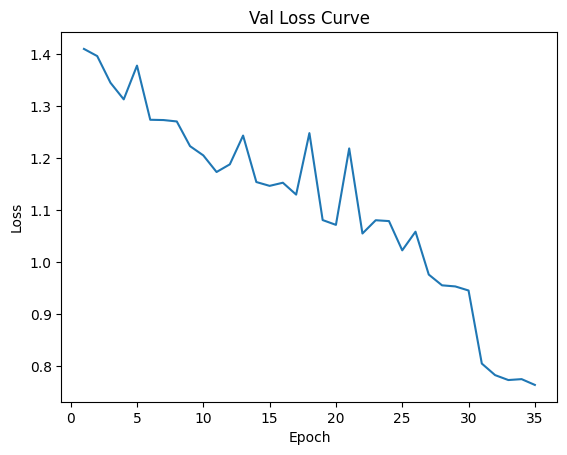

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11722063416471848


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 36/200*****
*****Train Loss:  0.741267 Val Loss:  0.760747*****
*****Validation Accuracy: 56.59%*****
*****Total Avg Disparity: 0.1012122056205493*****

Class Parade: Recall Difference = -0.010437266534827683
Class Handshaking: Recall Difference = -0.07142857142857141
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.13095238095238096
Class Funeral: Recall Difference = 0.07474382157926462
Class Cheering: Recall Difference = -0.015037593984962405
Class Meeting: Recall Difference = 0.09903846153846163
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.014150943396226467
Class Concerts: Recall Difference = 0.004224270353302639
Class Couple: Recall Difference = 0.265943012211669
Class Family_Group: Recall Difference = -0.15442020665901263
Class Picnic: Recall Difference = -0.006993006993006978
Class Soldier_Patrol: Recall Difference = -0.10457516339869266
Class Spa: Recall Difference = 0.20238095238095233
Cla

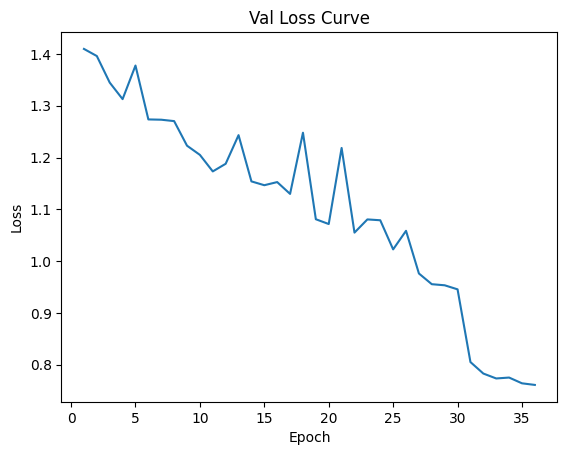

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11629076330707623


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 37/200*****
*****Train Loss:  0.739963 Val Loss:  0.762553*****
*****Validation Accuracy: 56.18%*****
*****Total Avg Disparity: 0.09540740359001666*****

Class Parade: Recall Difference = 0.015216435948143148
Class Handshaking: Recall Difference = 0.01785714285714285
Class Riot: Recall Difference = -0.036984352773826445
Class Dancing: Recall Difference = 0.0922619047619048
Class Funeral: Recall Difference = 0.16033755274261607
Class Cheering: Recall Difference = -0.05075187969924813
Class Meeting: Recall Difference = 0.09903846153846163
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07075471698113206
Class Concerts: Recall Difference = 0.021121351766513086
Class Couple: Recall Difference = 0.22116689280868387
Class Family_Group: Recall Difference = -0.07118254879448899
Class Picnic: Recall Difference = -0.029137529137529206
Class Soldier_Patrol: Recall Difference = -0.09346405228758148
Class Spa: Recall Difference = 0.1071428571428571
Class

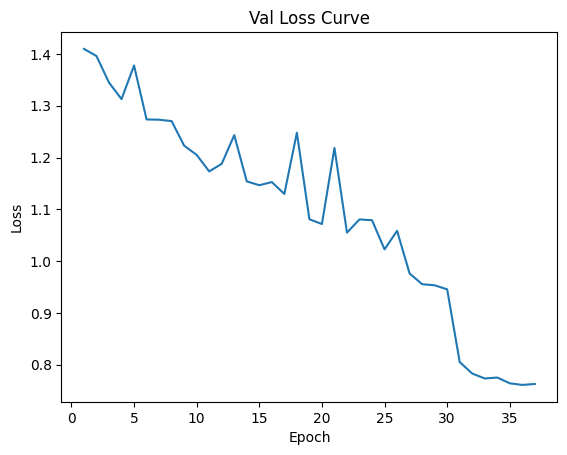

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11763650293533619


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 38/200*****
*****Train Loss:  0.732251 Val Loss:  0.749502*****
*****Validation Accuracy: 56.21%*****
*****Total Avg Disparity: 0.1060235245494613*****

Class Parade: Recall Difference = 0.04636343660733899
Class Handshaking: Recall Difference = 0.05357142857142859
Class Riot: Recall Difference = 0.03461356092935042
Class Dancing: Recall Difference = 0.09523809523809526
Class Funeral: Recall Difference = 0.2302591922845087
Class Cheering: Recall Difference = 0.04699248120300756
Class Meeting: Recall Difference = 0.0836538461538463
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07861635220125784
Class Concerts: Recall Difference = 0.007680491551459334
Class Couple: Recall Difference = 0.34192672998643153
Class Family_Group: Recall Difference = -0.12877918101798702
Class Picnic: Recall Difference = 0.05361305361305363
Class Soldier_Patrol: Recall Difference = -0.09346405228758159
Class Spa: Recall Difference = 0.22619047619047605
Class Sports

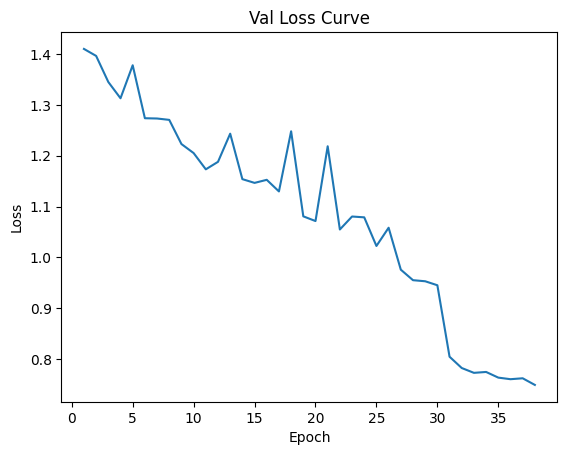

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.1171283908188343


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 39/200*****
*****Train Loss:  0.732344 Val Loss:  0.742428*****
*****Validation Accuracy: 56.65%*****
*****Total Avg Disparity: 0.10447364698953517*****

Class Parade: Recall Difference = 0.02735662491760049
Class Handshaking: Recall Difference = 0.0535714285714286
Class Riot: Recall Difference = 0.02513039355144614
Class Dancing: Recall Difference = 0.1488095238095238
Class Funeral: Recall Difference = 0.2206148282097649
Class Cheering: Recall Difference = 0.09210526315789477
Class Meeting: Recall Difference = 0.1298076923076924
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.013626834381551378
Class Concerts: Recall Difference = 0.024577572964669836
Class Couple: Recall Difference = 0.22116689280868387
Class Family_Group: Recall Difference = -0.11595866819747419
Class Picnic: Recall Difference = -0.015151515151515138
Class Soldier_Patrol: Recall Difference = -0.02352941176470591
Class Spa: Recall Difference = 0.13095238095238104
Class Spo

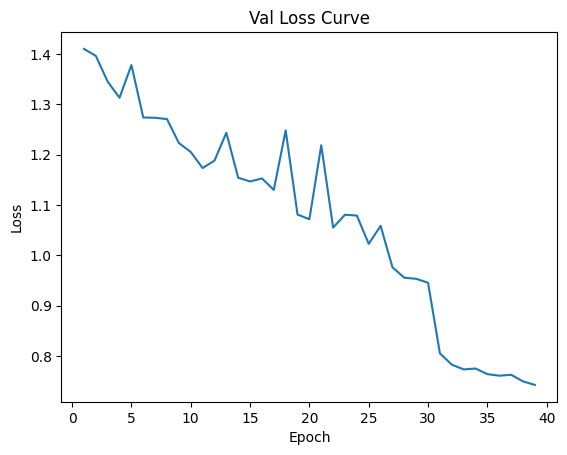

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.1160015595647005


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 40/200*****
*****Train Loss:  0.728207 Val Loss:  0.744352*****
*****Validation Accuracy: 57.37%*****
*****Total Avg Disparity: 0.09418118634586382*****

Class Parade: Recall Difference = 0.0018127883981541304
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.028923660502607917
Class Dancing: Recall Difference = 0.11011904761904767
Class Funeral: Recall Difference = 0.1127185051235684
Class Cheering: Recall Difference = 0.002819548872180444
Class Meeting: Recall Difference = 0.11442307692307707
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.05188679245283018
Class Concerts: Recall Difference = 0.028033794162826475
Class Couple: Recall Difference = 0.08412483039348717
Class Family_Group: Recall Difference = -0.15231534634519706
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.03464052287581676
Class Spa: Recall Difference = 0.20238095238095244
Clas

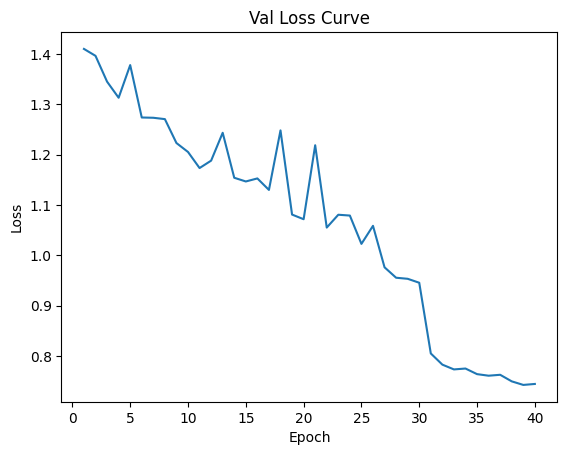

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11702393969664207


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 41/200*****
*****Train Loss:  0.725145 Val Loss:  0.740831*****
*****Validation Accuracy: 57.20%*****
*****Total Avg Disparity: 0.09618569931139258*****

Class Parade: Recall Difference = 0.04636343660733899
Class Handshaking: Recall Difference = 0.08928571428571429
Class Riot: Recall Difference = -0.009957325746799417
Class Dancing: Recall Difference = 0.14285714285714296
Class Funeral: Recall Difference = 0.16033755274261596
Class Cheering: Recall Difference = -0.005639097744360888
Class Meeting: Recall Difference = 0.0836538461538463
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08857442348008387
Class Concerts: Recall Difference = -0.028033794162826253
Class Couple: Recall Difference = 0.17639077340569873
Class Family_Group: Recall Difference = -0.1266743207041715
Class Picnic: Recall Difference = 0.0011655011655012926
Class Soldier_Patrol: Recall Difference = 0.0019607843137255943
Class Spa: Recall Difference = 0.27380952380952384
Cla

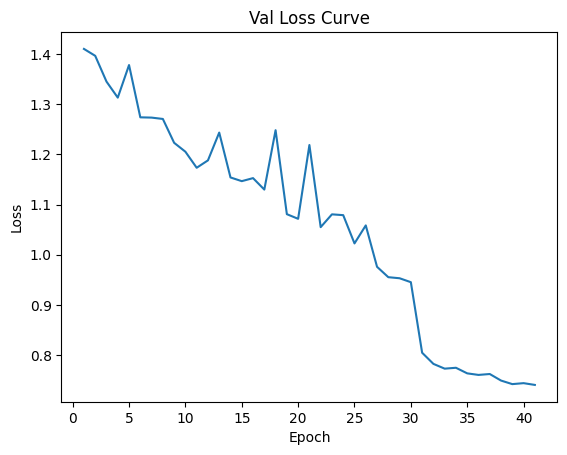

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11639491583292301


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 42/200*****
*****Train Loss:  0.725845 Val Loss:  0.744668*****
*****Validation Accuracy: 56.65%*****
*****Total Avg Disparity: 0.10210906606160022*****

Class Parade: Recall Difference = -0.059107888376181084
Class Handshaking: Recall Difference = 0.10714285714285714
Class Riot: Recall Difference = -0.0910384068278805
Class Dancing: Recall Difference = 0.0714285714285714
Class Funeral: Recall Difference = 0.07474382157926468
Class Cheering: Recall Difference = -0.04229323308270677
Class Meeting: Recall Difference = 0.09903846153846163
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0985324947589099
Class Concerts: Recall Difference = -0.13172043010752682
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.15021048603138154
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = -0.0013071895424834334
Class Spa: Recall Difference = 0.15476190476190466
Class

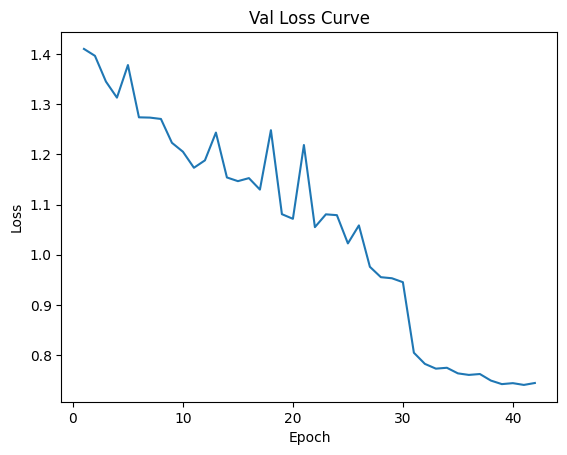

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11609550880698058


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 43/200*****
*****Train Loss:  0.721969 Val Loss:  0.729531*****
*****Validation Accuracy: 58.12%*****
*****Total Avg Disparity: 0.10857319352433216*****

Class Parade: Recall Difference = 0.032849923093825506
Class Handshaking: Recall Difference = 0.10714285714285714
Class Riot: Recall Difference = -0.08155523944997628
Class Dancing: Recall Difference = 0.1785714285714286
Class Funeral: Recall Difference = 0.24593128390596752
Class Cheering: Recall Difference = 0.030075187969924783
Class Meeting: Recall Difference = 0.17692307692307696
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.12735849056603776
Class Concerts: Recall Difference = 0.007680491551459445
Class Couple: Recall Difference = 0.23609226594301222
Class Family_Group: Recall Difference = -0.09892843474933027
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = -0.056862745098039236
Class Spa: Recall Difference = 0.15476190476190477
Class

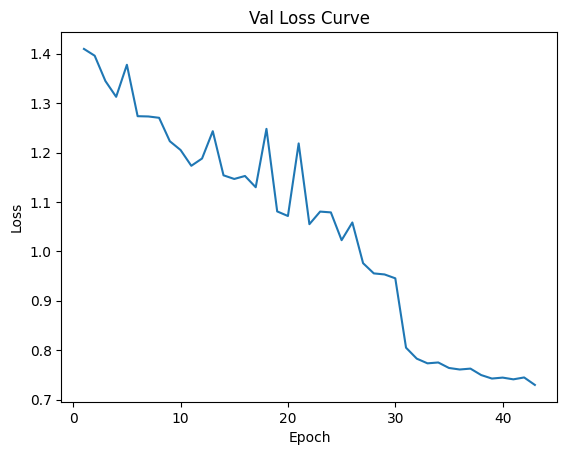

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.20s/it]


Average Adversary epoch loss: 0.11632789843357526


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 44/200*****
*****Train Loss:  0.719148 Val Loss:  0.729004*****
*****Validation Accuracy: 58.09%*****
*****Total Avg Disparity: 0.09504398787622097*****

Class Parade: Recall Difference = 0.027466490881125072
Class Handshaking: Recall Difference = 0.0892857142857143
Class Riot: Recall Difference = -0.08961593172119492
Class Dancing: Recall Difference = 0.16071428571428575
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = -0.031015037593984968
Class Meeting: Recall Difference = 0.16057692307692317
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.024577572964669447
Class Couple: Recall Difference = 0.23609226594301227
Class Family_Group: Recall Difference = -0.10964408725602753
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.0235294117647058
Class Spa: Recall Difference = 0.1309523

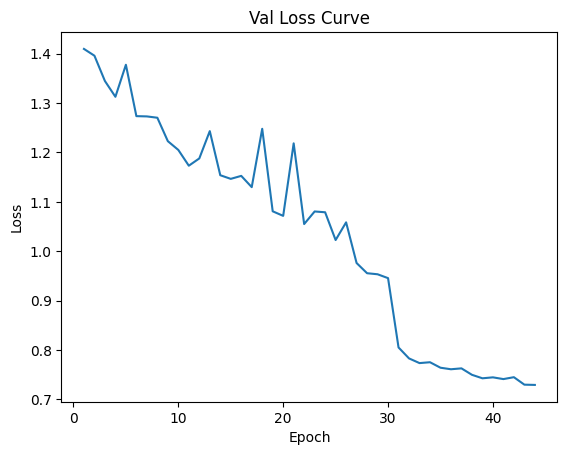

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11589845843040027


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 45/200*****
*****Train Loss:  0.714749 Val Loss:  0.724371*****
*****Validation Accuracy: 58.24%*****
*****Total Avg Disparity: 0.0982175788406705*****

Class Parade: Recall Difference = -0.01719402329158437
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = -0.028923660502607862
Class Dancing: Recall Difference = 0.07142857142857145
Class Funeral: Recall Difference = 0.18565400843881857
Class Cheering: Recall Difference = 0.10996240601503762
Class Meeting: Recall Difference = 0.05192307692307707
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = -0.03648233486943164
Class Couple: Recall Difference = 0.32700135685210313
Class Family_Group: Recall Difference = -0.15021048603138148
Class Picnic: Recall Difference = -0.029137529137529206
Class Soldier_Patrol: Recall Difference = -0.11568627450980373
Class Spa: Recall Difference = 0.08333333333333337
Clas

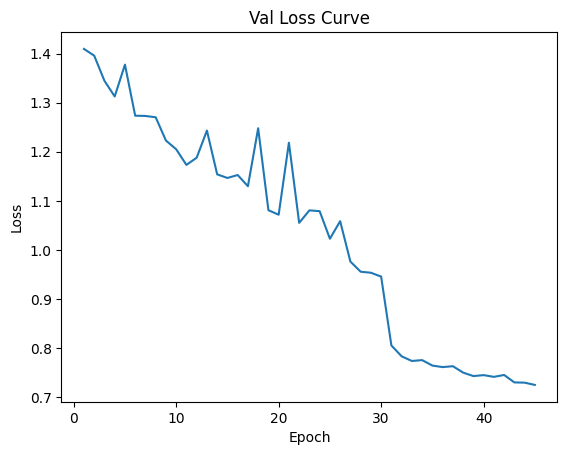

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11648375942156865


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 46/200*****
*****Train Loss:  0.713884 Val Loss:  0.720298*****
*****Validation Accuracy: 58.88%*****
*****Total Avg Disparity: 0.10039016544741737*****

Class Parade: Recall Difference = 0.054493517908152045
Class Handshaking: Recall Difference = 0.08928571428571429
Class Riot: Recall Difference = -0.072072072072072
Class Dancing: Recall Difference = 0.14880952380952386
Class Funeral: Recall Difference = 0.22362869198312235
Class Cheering: Recall Difference = 0.04041353383458646
Class Meeting: Recall Difference = 0.11442307692307696
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.06184486373165615
Class Concerts: Recall Difference = 0.028033794162826364
Class Couple: Recall Difference = 0.31071913161465403
Class Family_Group: Recall Difference = -0.16303099885189426
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.045751633986928164
Class Spa: Recall Difference = 0.1071428571428571
Class S

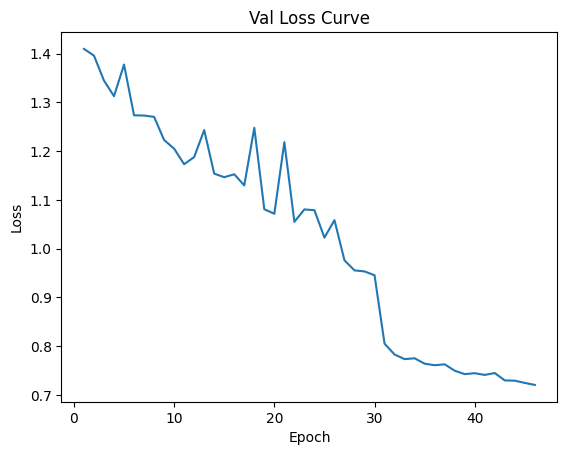

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11572752921627118


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 47/200*****
*****Train Loss:  0.710323 Val Loss:  0.715703*****
*****Validation Accuracy: 59.02%*****
*****Total Avg Disparity: 0.0961754493323588*****

Class Parade: Recall Difference = -0.014557240166996332
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = -0.09103840682788056
Class Dancing: Recall Difference = 0.08630952380952384
Class Funeral: Recall Difference = 0.0620855937311634
Class Cheering: Recall Difference = 0.10150375939849623
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = -0.09600614439324107
Class Couple: Recall Difference = 0.1750339213025781
Class Family_Group: Recall Difference = -0.1289705319556066
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = 0.020915032679738488
Class Spa: Recall Difference = 0.13095238095238082
Class Spo

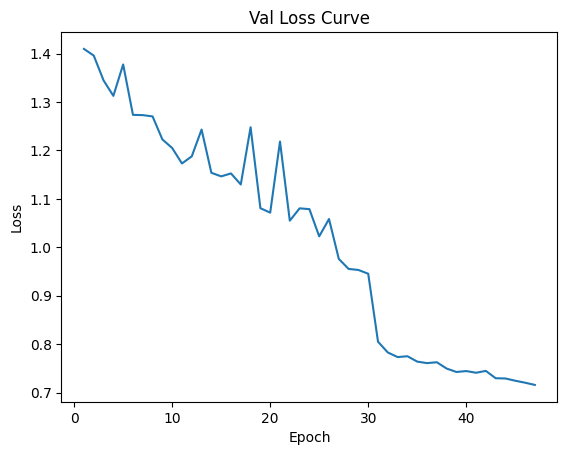

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.20s/it]


Average Adversary epoch loss: 0.11648743513685006


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 48/200*****
*****Train Loss:  0.709568 Val Loss:  0.711133*****
*****Validation Accuracy: 58.79%*****
*****Total Avg Disparity: 0.09735004221741375*****

Class Parade: Recall Difference = 0.021973192704899946
Class Handshaking: Recall Difference = 0.07142857142857144
Class Riot: Recall Difference = 0.03603603603603606
Class Dancing: Recall Difference = 0.13988095238095238
Class Funeral: Recall Difference = 0.25858951175406875
Class Cheering: Recall Difference = 0.0385338345864662
Class Meeting: Recall Difference = 0.1615384615384617
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = -0.004224270353302528
Class Couple: Recall Difference = 0.26594301221166905
Class Family_Group: Recall Difference = -0.12456946039035582
Class Picnic: Recall Difference = 0.13869463869463872
Class Soldier_Patrol: Recall Difference = -0.056862745098039125
Class Spa: Recall Difference = 0.13095238095238082
Class Spo

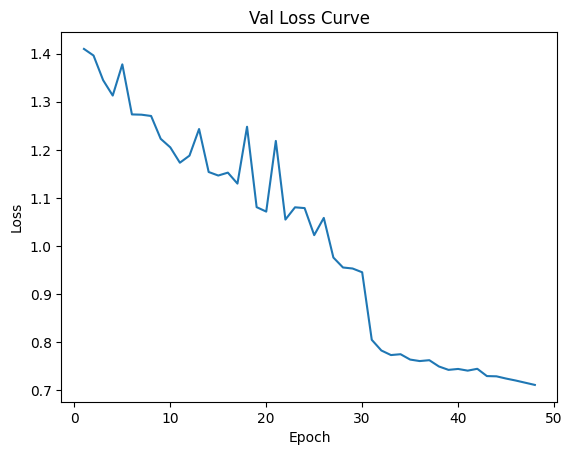

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11539856229837124


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 49/200*****
*****Train Loss:  0.705147 Val Loss:  0.705127*****
*****Validation Accuracy: 59.11%*****
*****Total Avg Disparity: 0.1055536017571263*****

Class Parade: Recall Difference = -0.014557240166996332
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = -0.11000474158368906
Class Dancing: Recall Difference = 0.16369047619047622
Class Funeral: Recall Difference = 0.13803496081977096
Class Cheering: Recall Difference = 0.038533834586466253
Class Meeting: Recall Difference = 0.1298076923076924
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08962264150943394
Class Concerts: Recall Difference = -0.06374807987711206
Class Couple: Recall Difference = 0.2510176390773406
Class Family_Group: Recall Difference = -0.08610792192881744
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.10714285714285698
Class 

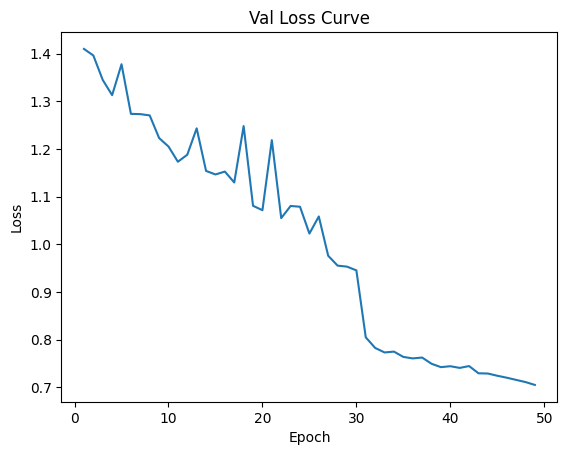

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11615975659627181


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 50/200*****
*****Train Loss:  0.705022 Val Loss:  0.703448*****
*****Validation Accuracy: 59.34%*****
*****Total Avg Disparity: 0.10442401471211438*****

Class Parade: Recall Difference = 0.009723137771918244
Class Handshaking: Recall Difference = -0.0357142857142857
Class Riot: Recall Difference = -0.11806543385490753
Class Dancing: Recall Difference = 0.10119047619047622
Class Funeral: Recall Difference = 0.07474382157926468
Class Cheering: Recall Difference = 0.02067669172932332
Class Meeting: Recall Difference = 0.1298076923076924
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.10849056603773588
Class Concerts: Recall Difference = -0.11635944700460821
Class Couple: Recall Difference = 0.2198100407055632
Class Family_Group: Recall Difference = -0.09892843474933027
Class Picnic: Recall Difference = -0.029137529137529095
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.13095238095238093
Class S

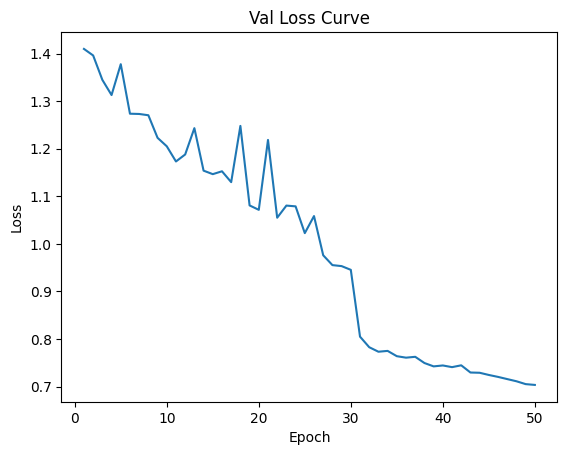

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11581116656844433


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 51/200*****
*****Train Loss:  0.698331 Val Loss:  0.705243*****
*****Validation Accuracy: 59.77%*****
*****Total Avg Disparity: 0.10069279207830259*****

Class Parade: Recall Difference = -0.009173807954295787
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = -0.020862968231389223
Class Dancing: Recall Difference = 0.11904761904761896
Class Funeral: Recall Difference = 0.11271850512356846
Class Cheering: Recall Difference = 0.031015037593984968
Class Meeting: Recall Difference = 0.16057692307692317
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.1462264150943397
Class Concerts: Recall Difference = -0.01612903225806439
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.19728281668580183
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = 0.02091503267973871
Class Spa: Recall Difference = 0.1071428571428571
Class

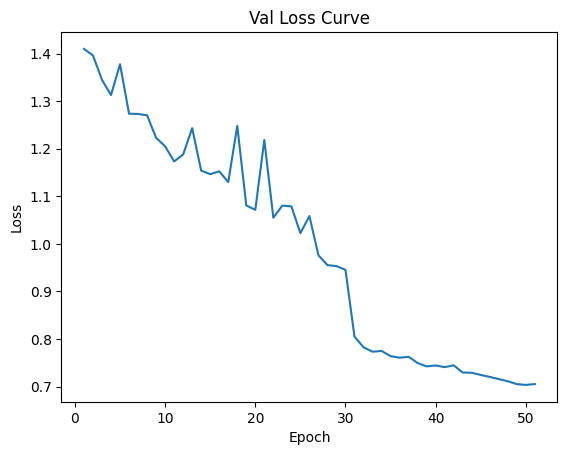

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.20s/it]


Average Adversary epoch loss: 0.11518836938417874


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 52/200*****
*****Train Loss:  0.701708 Val Loss:  0.698012*****
*****Validation Accuracy: 59.72%*****
*****Total Avg Disparity: 0.1120678758391191*****

Class Parade: Recall Difference = 0.032740057130300926
Class Handshaking: Recall Difference = -0.0357142857142857
Class Riot: Recall Difference = -0.03840682788051203
Class Dancing: Recall Difference = 0.13690476190476186
Class Funeral: Recall Difference = 0.17600964436407485
Class Cheering: Recall Difference = 0.03853383458646617
Class Meeting: Recall Difference = 0.09807692307692317
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.11844863731656186
Class Concerts: Recall Difference = -0.004224270353302528
Class Couple: Recall Difference = 0.2808683853459974
Class Family_Group: Recall Difference = -0.09471871412169913
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333326
Class

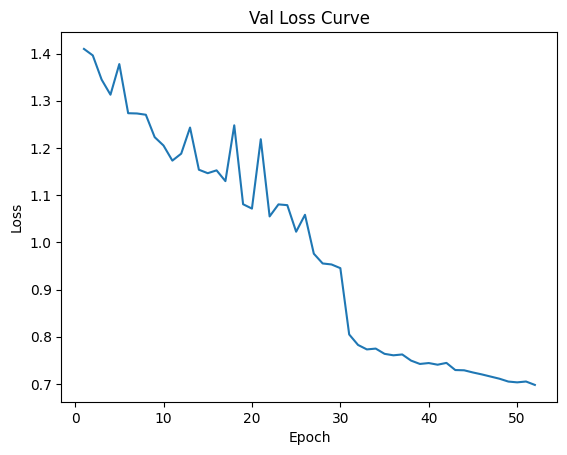

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11569028720259666


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 53/200*****
*****Train Loss:  0.698975 Val Loss:  0.701678*****
*****Validation Accuracy: 58.67%*****
*****Total Avg Disparity: 0.10299518257545073*****

Class Parade: Recall Difference = -0.029444078224566073
Class Handshaking: Recall Difference = 0.0892857142857143
Class Riot: Recall Difference = -0.0844001896633475
Class Dancing: Recall Difference = 0.11011904761904767
Class Funeral: Recall Difference = 0.10669077757685363
Class Cheering: Recall Difference = -0.05075187969924813
Class Meeting: Recall Difference = 0.004807692307692402
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.10744234800838573
Class Concerts: Recall Difference = -0.023041474654377836
Class Couple: Recall Difference = 0.3256445047489825
Class Family_Group: Recall Difference = -0.07960199004975121
Class Picnic: Recall Difference = -0.09790209790209792
Class Soldier_Patrol: Recall Difference = -0.10784313725490169
Class Spa: Recall Difference = 0.1071428571428571
Class 

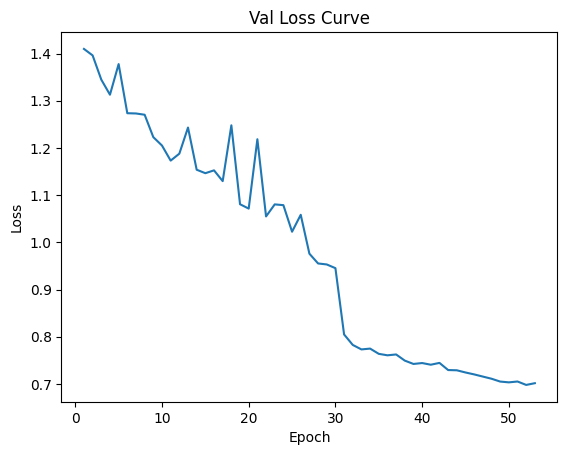

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11605345687040916


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 54/200*****
*****Train Loss:  0.697819 Val Loss:  0.689991*****
*****Validation Accuracy: 59.60%*****
*****Total Avg Disparity: 0.09416104060707138*****

Class Parade: Recall Difference = 0.0368600307624698
Class Handshaking: Recall Difference = 0.14285714285714285
Class Riot: Recall Difference = -0.08155523944997628
Class Dancing: Recall Difference = 0.21726190476190468
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = 0.05639097744360902
Class Meeting: Recall Difference = 0.20769230769230773
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.089622641509434
Class Concerts: Recall Difference = -0.019585253456221086
Class Couple: Recall Difference = 0.23609226594301222
Class Family_Group: Recall Difference = -0.05415231534634524
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.13095238095238082
Class Sp

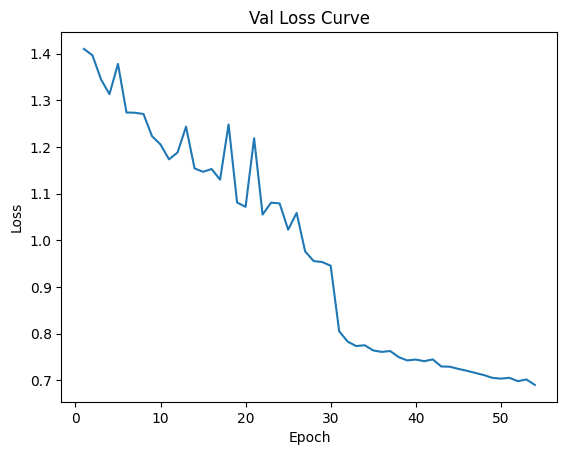

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11516609530036266


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 55/200*****
*****Train Loss:  0.690660 Val Loss:  0.684663*****
*****Validation Accuracy: 61.28%*****
*****Total Avg Disparity: 0.08482562409288033*****

Class Parade: Recall Difference = 0.03411338167435718
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.04646752015173056
Class Dancing: Recall Difference = 0.15476190476190477
Class Funeral: Recall Difference = 0.12839059674502712
Class Cheering: Recall Difference = 0.031954887218045125
Class Meeting: Recall Difference = 0.05192307692307707
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = -0.012672811059907807
Class Couple: Recall Difference = 0.21981004070556315
Class Family_Group: Recall Difference = -0.13968618446230402
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = -0.012418300653594727
Class Spa: Recall Difference = 0.13095238095238093
Class 

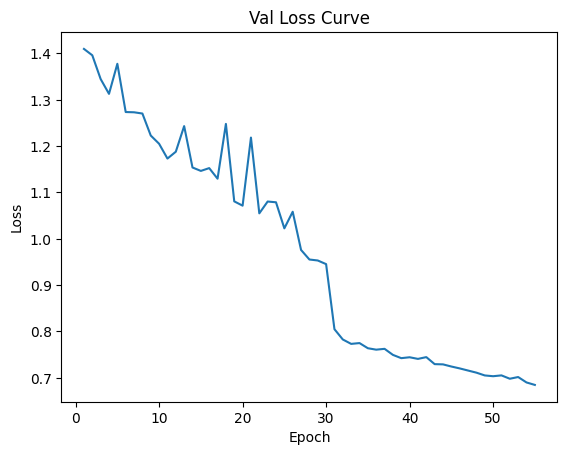

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11691389977931976


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 56/200*****
*****Train Loss:  0.688049 Val Loss:  0.697675*****
*****Validation Accuracy: 60.35%*****
*****Total Avg Disparity: 0.09643120128998274*****

Class Parade: Recall Difference = 0.020599868160843915
Class Handshaking: Recall Difference = -0.07142857142857141
Class Riot: Recall Difference = -0.027501185395922223
Class Dancing: Recall Difference = 0.16964285714285715
Class Funeral: Recall Difference = 0.15672091621458717
Class Cheering: Recall Difference = 0.0037593984962406013
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.14727463312368966
Class Concerts: Recall Difference = 0.028033794162826475
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.13107539226942222
Class Picnic: Recall Difference = -0.029137529137529206
Class Soldier_Patrol: Recall Difference = -0.012418300653594727
Class Spa: Recall Difference = 0.1071428571428571
C

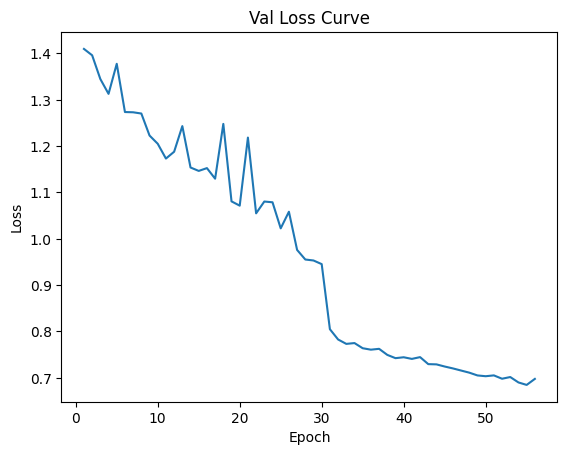

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11694123653265145


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 57/200*****
*****Train Loss:  0.689074 Val Loss:  0.675663*****
*****Validation Accuracy: 61.48%*****
*****Total Avg Disparity: 0.08839095658201797*****

Class Parade: Recall Difference = 0.043506921555701905
Class Handshaking: Recall Difference = 0.03571428571428574
Class Riot: Recall Difference = 0.015647226173541917
Class Dancing: Recall Difference = 0.1696428571428572
Class Funeral: Recall Difference = 0.10307414104882456
Class Cheering: Recall Difference = 0.06578947368421054
Class Meeting: Recall Difference = 0.09807692307692317
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = -0.02457757296466967
Class Couple: Recall Difference = 0.21981004070556315
Class Family_Group: Recall Difference = -0.15461155759663225
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.012418300653594727
Class Spa: Recall Difference = 0.13095238095238104
Class S

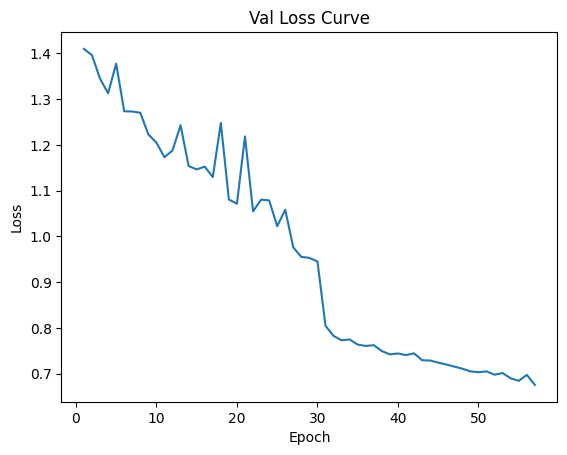

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11667250096797943


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 58/200*****
*****Train Loss:  0.685042 Val Loss:  0.670108*****
*****Validation Accuracy: 61.48%*****
*****Total Avg Disparity: 0.09812341040909715*****

Class Parade: Recall Difference = 0.015216435948143259
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = -0.13560929350403034
Class Dancing: Recall Difference = 0.13690476190476197
Class Funeral: Recall Difference = 0.1983122362869199
Class Cheering: Recall Difference = -0.002819548872180444
Class Meeting: Recall Difference = 0.1759615384615385
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = -0.012672811059907696
Class Couple: Recall Difference = 0.34056987788331083
Class Family_Group: Recall Difference = -0.08610792192881744
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = -0.023529411764705688
Class Spa: Recall Difference = 0.1071428571428571
Class S

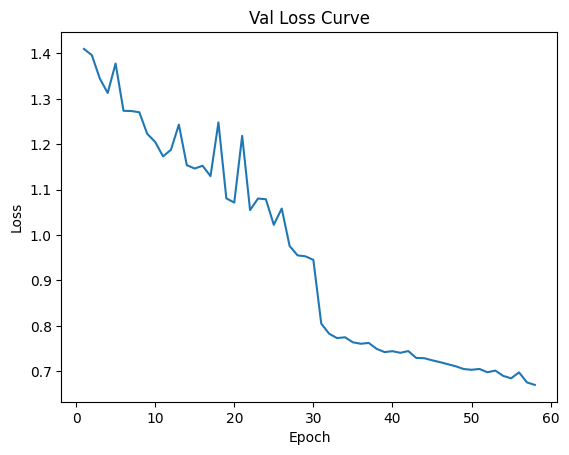

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.20s/it]


Average Adversary epoch loss: 0.1157436826481269


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 59/200*****
*****Train Loss:  0.676380 Val Loss:  0.670993*****
*****Validation Accuracy: 61.31%*****
*****Total Avg Disparity: 0.09007437562374042*****

Class Parade: Recall Difference = 0.028620083498132165
Class Handshaking: Recall Difference = 0.01785714285714289
Class Riot: Recall Difference = -0.04504504504504503
Class Dancing: Recall Difference = 0.1517857142857143
Class Funeral: Recall Difference = 0.15069318866787224
Class Cheering: Recall Difference = 0.022556390977443608
Class Meeting: Recall Difference = 0.09807692307692317
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878407
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.19131614654002718
Class Family_Group: Recall Difference = -0.07137389973210867
Class Picnic: Recall Difference = 0.03146853146853157
Class Soldier_Patrol: Recall Difference = -0.012418300653594727
Class Spa: Recall Difference = 0.13095238

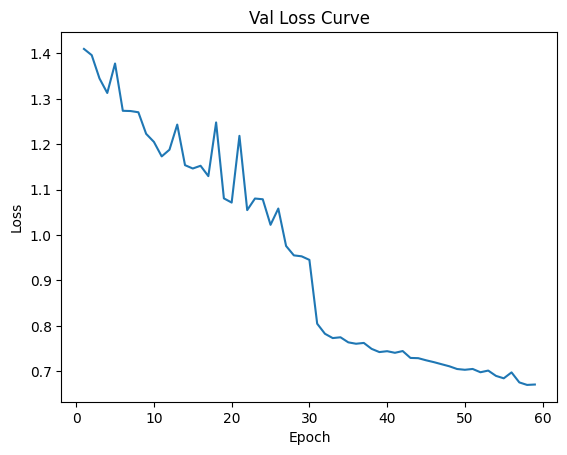

Data has been appended to validation_0.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11597539627781281


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 60/200*****
*****Train Loss:  0.685807 Val Loss:  0.667443*****
*****Validation Accuracy: 60.85%*****
*****Total Avg Disparity: 0.09768444554215391*****

Class Parade: Recall Difference = 0.05850362557679645
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.02513039355144614
Class Dancing: Recall Difference = 0.17857142857142855
Class Funeral: Recall Difference = 0.14767932489451474
Class Cheering: Recall Difference = -0.08270676691729328
Class Meeting: Recall Difference = 0.19326923076923086
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09958071278825997
Class Concerts: Recall Difference = -0.08410138248847926
Class Couple: Recall Difference = 0.26594301221166905
Class Family_Group: Recall Difference = -0.06907768848067358
Class Picnic: Recall Difference = -0.10606060606060613
Class Soldier_Patrol: Recall Difference = -0.0823529411764704
Class Spa: Recall Difference = 0.1071428571428571
Class Sp

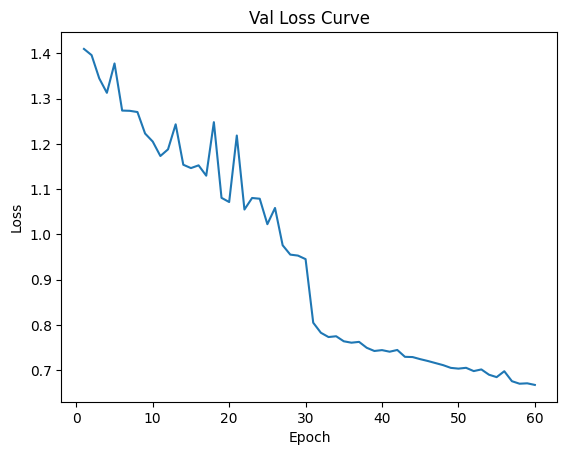

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11700178166994682


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 61/200*****
*****Train Loss:  0.669118 Val Loss:  0.653295*****
*****Validation Accuracy: 62.73%*****
*****Total Avg Disparity: 0.08450979090544557*****

Class Parade: Recall Difference = 0.032740057130300926
Class Handshaking: Recall Difference = -0.01785714285714285
Class Riot: Recall Difference = -0.038406827880512195
Class Dancing: Recall Difference = 0.15773809523809523
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = 0.031954887218045014
Class Meeting: Recall Difference = 0.16057692307692317
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.13731656184486385
Class Concerts: Recall Difference = -0.056835637480798784
Class Couple: Recall Difference = 0.29579375848032574
Class Family_Group: Recall Difference = -0.11615001913509387
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.04901960784313719
Class Spa: Recall Difference = 0.08333333333333326
Cla

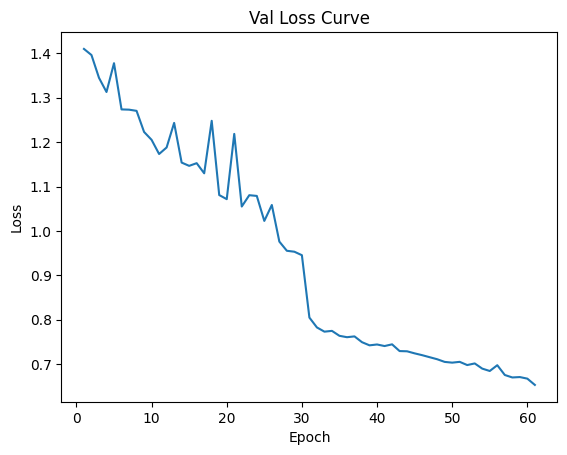

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11626302508207467


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 62/200*****
*****Train Loss:  0.671016 Val Loss:  0.651546*****
*****Validation Accuracy: 62.96%*****
*****Total Avg Disparity: 0.07749154613265755*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.10052157420578461
Class Dancing: Recall Difference = 0.1339285714285714
Class Funeral: Recall Difference = 0.08077154912597939
Class Cheering: Recall Difference = 0.03195488721804507
Class Meeting: Recall Difference = 0.16057692307692317
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878407
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.21981004070556304
Class Family_Group: Recall Difference = -0.07558362035973976
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.08333333333333326
Class Spor

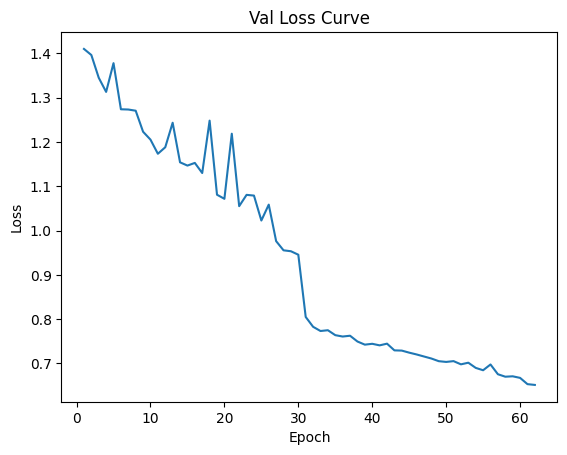

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11555655873738803


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 63/200*****
*****Train Loss:  0.665459 Val Loss:  0.649365*****
*****Validation Accuracy: 62.76%*****
*****Total Avg Disparity: 0.08175528549016889*****

Class Parade: Recall Difference = 0.024609975829487984
Class Handshaking: Recall Difference = 0.035714285714285685
Class Riot: Recall Difference = -0.10052157420578461
Class Dancing: Recall Difference = 0.1339285714285714
Class Funeral: Recall Difference = 0.09041591320072323
Class Cheering: Recall Difference = -0.012218045112781906
Class Meeting: Recall Difference = 0.1759615384615385
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09958071278825997
Class Concerts: Recall Difference = -0.06874039938556054
Class Couple: Recall Difference = 0.2048846675712348
Class Family_Group: Recall Difference = -0.0884041331802527
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333326
Class Sp

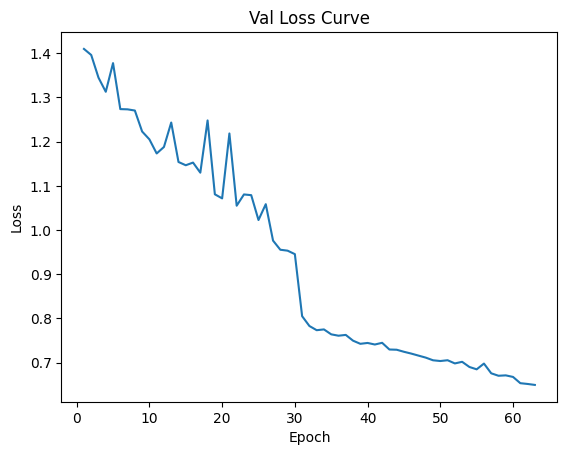

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11583055785069099


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 64/200*****
*****Train Loss:  0.667533 Val Loss:  0.649529*****
*****Validation Accuracy: 63.13%*****
*****Total Avg Disparity: 0.07766214788146823*****

Class Parade: Recall Difference = 0.032740057130300926
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.10052157420578478
Class Dancing: Recall Difference = 0.15476190476190477
Class Funeral: Recall Difference = 0.10608800482218206
Class Cheering: Recall Difference = 0.005639097744360888
Class Meeting: Recall Difference = 0.12884615384615405
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2048846675712347
Class Family_Group: Recall Difference = -0.0884041331802527
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.05952380952380942
Class Spo

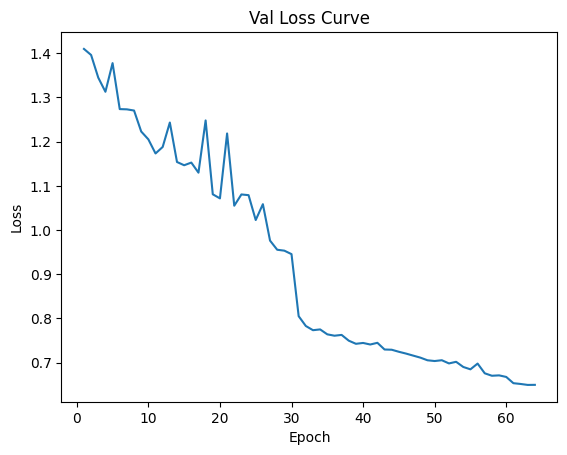

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11557154013560368


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 65/200*****
*****Train Loss:  0.668633 Val Loss:  0.648291*****
*****Validation Accuracy: 62.87%*****
*****Total Avg Disparity: 0.08065456426908878*****

Class Parade: Recall Difference = 0.017853219072731297
Class Handshaking: Recall Difference = -0.03571428571428571
Class Riot: Recall Difference = -0.07349454717875759
Class Dancing: Recall Difference = 0.15476190476190477
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = 0.005639097744360888
Class Meeting: Recall Difference = 0.19134615384615405
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.109538784067086
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.29579375848032585
Class Family_Group: Recall Difference = -0.06486796785304244
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.04901960784313708
Class Spa: Recall Difference = 0.08333333333333326
Class S

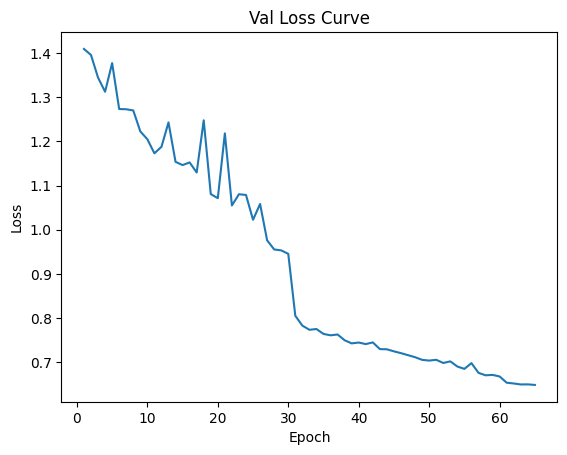

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11586482507678178


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 66/200*****
*****Train Loss:  0.667983 Val Loss:  0.648029*****
*****Validation Accuracy: 63.16%*****
*****Total Avg Disparity: 0.07818837621087216*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = -0.0734945471787577
Class Dancing: Recall Difference = 0.09226190476190477
Class Funeral: Recall Difference = 0.06811332127787828
Class Cheering: Recall Difference = 0.005639097744360888
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.13731656184486385
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.31071913161465414
Class Family_Group: Recall Difference = -0.0905089934940681
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333326
Class Sp

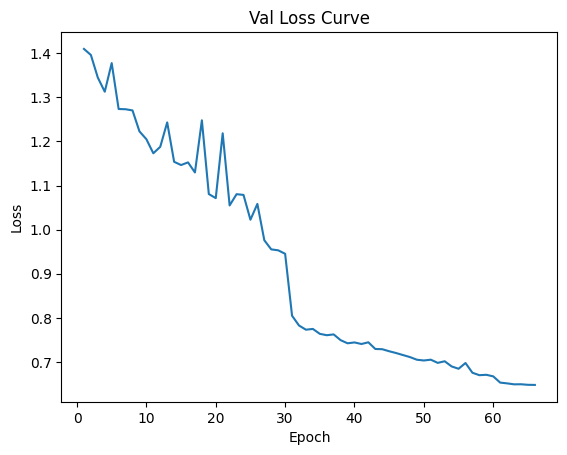

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1152890995144844


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 67/200*****
*****Train Loss:  0.667861 Val Loss:  0.646922*****
*****Validation Accuracy: 63.22%*****
*****Total Avg Disparity: 0.07473757463200946*****

Class Parade: Recall Difference = 0.032740057130300926
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.0734945471787577
Class Dancing: Recall Difference = 0.11309523809523808
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = 0.01503759398496235
Class Meeting: Recall Difference = 0.11346153846153861
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.11844863731656197
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.2048846675712347
Class Family_Group: Recall Difference = -0.06276310753922709
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333326
Class Spo

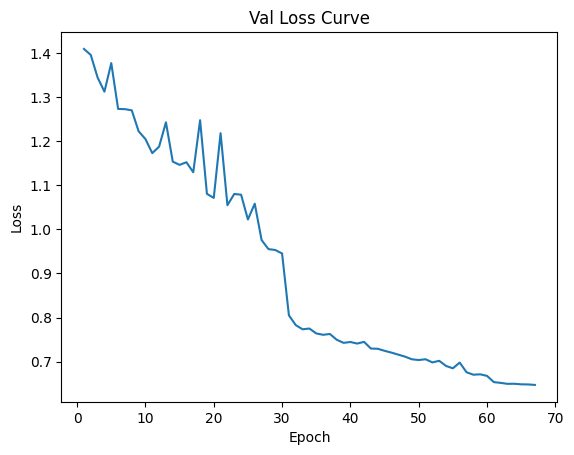

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11558786034584045


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 68/200*****
*****Train Loss:  0.666448 Val Loss:  0.646497*****
*****Validation Accuracy: 62.81%*****
*****Total Avg Disparity: 0.08019448806472929*****

Class Parade: Recall Difference = 0.032740057130300926
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.07349454717875775
Class Dancing: Recall Difference = 0.1339285714285714
Class Funeral: Recall Difference = 0.09342977697408072
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.11844863731656191
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.05952380952380942
Class Sp

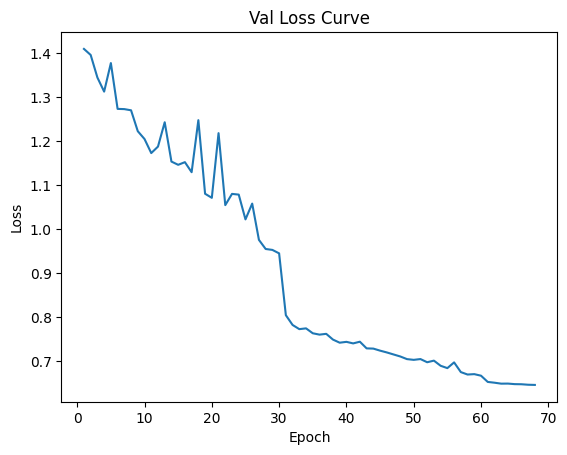

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11559638180411778


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 69/200*****
*****Train Loss:  0.665050 Val Loss:  0.646598*****
*****Validation Accuracy: 63.13%*****
*****Total Avg Disparity: 0.08382878494916908*****

Class Parade: Recall Difference = 0.024609975829487984
Class Handshaking: Recall Difference = -0.03571428571428571
Class Riot: Recall Difference = -0.09103840682788039
Class Dancing: Recall Difference = 0.13095238095238093
Class Funeral: Recall Difference = 0.007836045810729275
Class Cheering: Recall Difference = 0.0056390977443608326
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.109538784067086
Class Concerts: Recall Difference = -0.02457757296466967
Class Couple: Recall Difference = 0.3107191316146541
Class Family_Group: Recall Difference = -0.08840413318025264
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.04901960784313719
Class Spa: Recall Difference = 0.08333333333333337
Class 

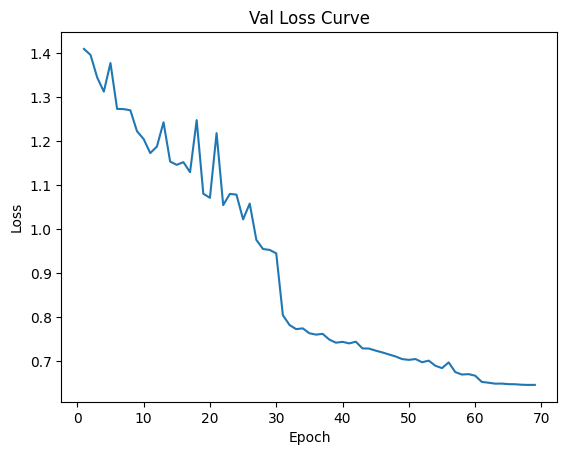

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11559391480225784


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 70/200*****
*****Train Loss:  0.665177 Val Loss:  0.645228*****
*****Validation Accuracy: 63.05%*****
*****Total Avg Disparity: 0.07933410304849475*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = -0.055950687529634946
Class Dancing: Recall Difference = 0.19047619047619047
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = -0.012218045112781961
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048213
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.29579375848032585
Class Family_Group: Recall Difference = -0.06276310753922715
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333326
Clas

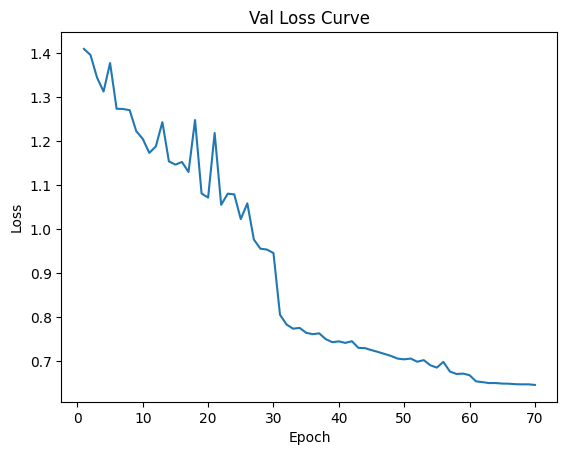

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11505330554567851


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 71/200*****
*****Train Loss:  0.664191 Val Loss:  0.644800*****
*****Validation Accuracy: 62.84%*****
*****Total Avg Disparity: 0.08380084063452295*****

Class Parade: Recall Difference = 0.032740057130300926
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.0734945471787577
Class Dancing: Recall Difference = 0.1517857142857143
Class Funeral: Recall Difference = 0.0807715491259795
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.12884615384615405
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.11844863731656186
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.31071913161465414
Class Family_Group: Recall Difference = -0.10332950631458099
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333326
Class Spo

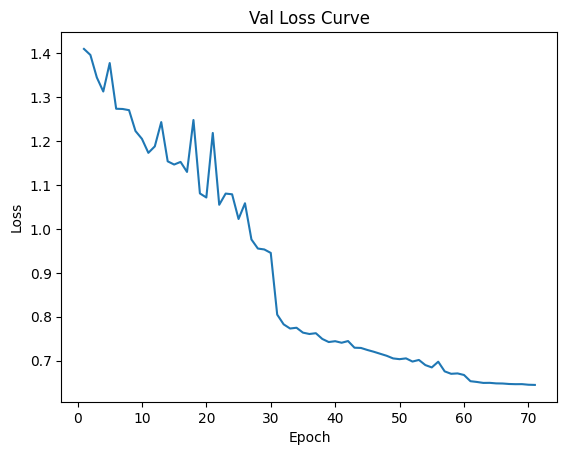

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11537655844138218


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 72/200*****
*****Train Loss:  0.670397 Val Loss:  0.644580*****
*****Validation Accuracy: 63.28%*****
*****Total Avg Disparity: 0.07821620378980852*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.11806543385490748
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.05545509342977706
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615405
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.05683563748079867
Class Couple: Recall Difference = 0.1899592944369064
Class Family_Group: Recall Difference = -0.0884041331802527
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333326
Class Spo

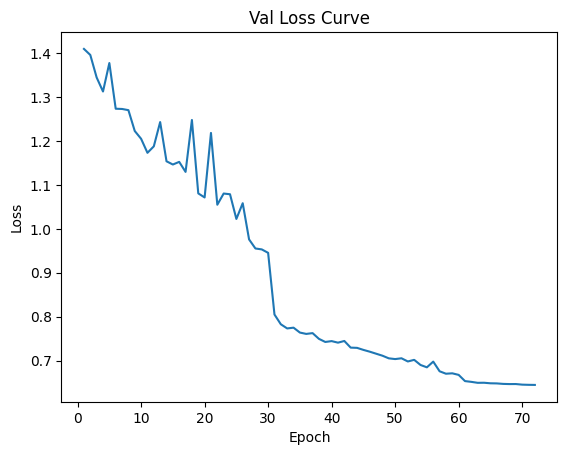

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11591864893069634


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 73/200*****
*****Train Loss:  0.666130 Val Loss:  0.644041*****
*****Validation Accuracy: 63.05%*****
*****Total Avg Disparity: 0.07894429050848932*****

Class Parade: Recall Difference = 0.024609975829487984
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = -0.07349454717875759
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.05683563748079867
Class Couple: Recall Difference = 0.2048846675712347
Class Family_Group: Recall Difference = -0.06276310753922704
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333326
Class 

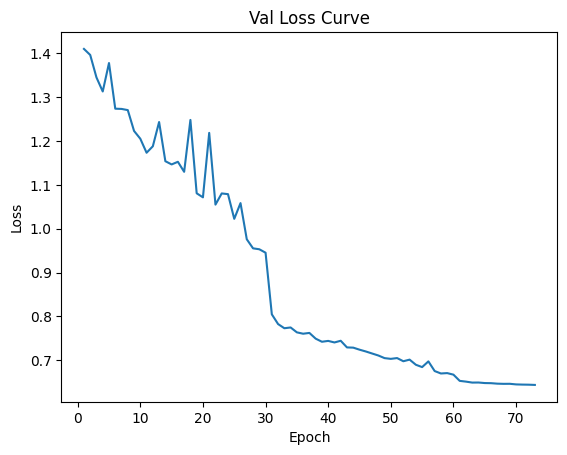

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11523481659018077


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 74/200*****
*****Train Loss:  0.664942 Val Loss:  0.643800*****
*****Validation Accuracy: 62.99%*****
*****Total Avg Disparity: 0.08388665069535176*****

Class Parade: Recall Difference = 0.03411338167435729
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = -0.07349454717875775
Class Dancing: Recall Difference = 0.1339285714285714
Class Funeral: Recall Difference = 0.06811332127787828
Class Cheering: Recall Difference = -0.020676691729323293
Class Meeting: Recall Difference = 0.19134615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.06276310753922693
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333326
Class 

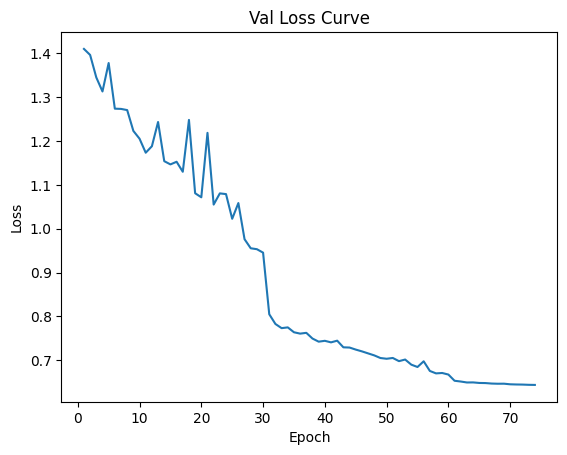

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.1162081604393629


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 75/200*****
*****Train Loss:  0.669433 Val Loss:  0.643613*****
*****Validation Accuracy: 63.16%*****
*****Total Avg Disparity: 0.07823261716339393*****

Class Parade: Recall Difference = 0.024609975829487984
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.10052157420578467
Class Dancing: Recall Difference = 0.1339285714285714
Class Funeral: Recall Difference = 0.0807715491259795
Class Cheering: Recall Difference = -0.03853383458646614
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.2198100407055632
Class Family_Group: Recall Difference = -0.08840413318025264
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333326
Class Spor

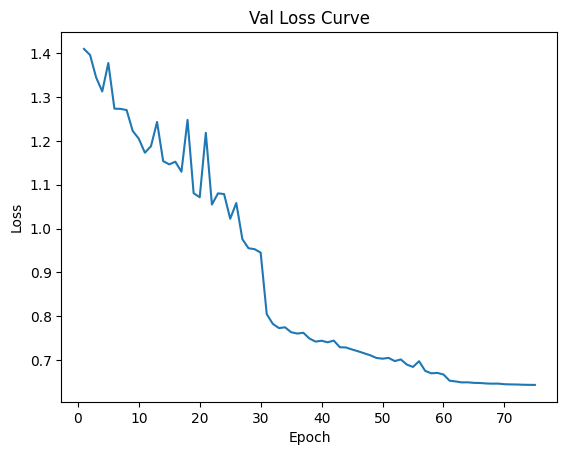

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11504140496253967


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 76/200*****
*****Train Loss:  0.662725 Val Loss:  0.642724*****
*****Validation Accuracy: 62.99%*****
*****Total Avg Disparity: 0.08033126778152412*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = -0.0357142857142857
Class Riot: Recall Difference = -0.10052157420578467
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.04994259471871426
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.04901960784313719
Class Spa: Recall Difference = 0.08333333333333326
Class Sp

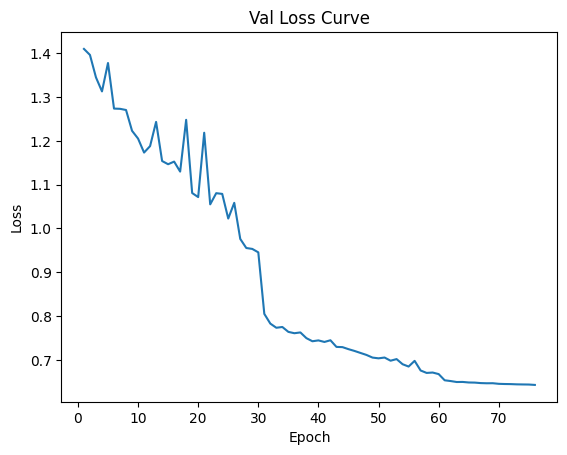

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11556747039923301


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 77/200*****
*****Train Loss:  0.663032 Val Loss:  0.642497*****
*****Validation Accuracy: 63.28%*****
*****Total Avg Disparity: 0.08139759706067863*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = -0.10052157420578461
Class Dancing: Recall Difference = 0.15476190476190477
Class Funeral: Recall Difference = 0.0807715491259795
Class Cheering: Recall Difference = -0.012218045112781961
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.052935010482180356
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.32564450474898254
Class Family_Group: Recall Difference = -0.07768848067355538
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Clas

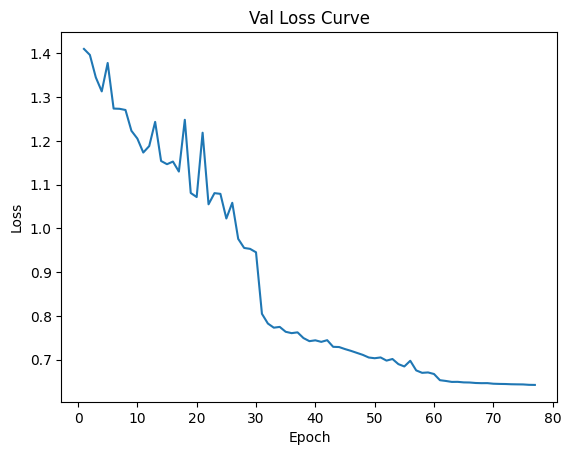

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11470821356544128


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 78/200*****
*****Train Loss:  0.665531 Val Loss:  0.642014*****
*****Validation Accuracy: 63.16%*****
*****Total Avg Disparity: 0.07958857963757815*****

Class Parade: Recall Difference = 0.039496813887057725
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.10052157420578461
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.038533834586466253
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.32564450474898243
Class Family_Group: Recall Difference = -0.07768848067355538
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333326
Class 

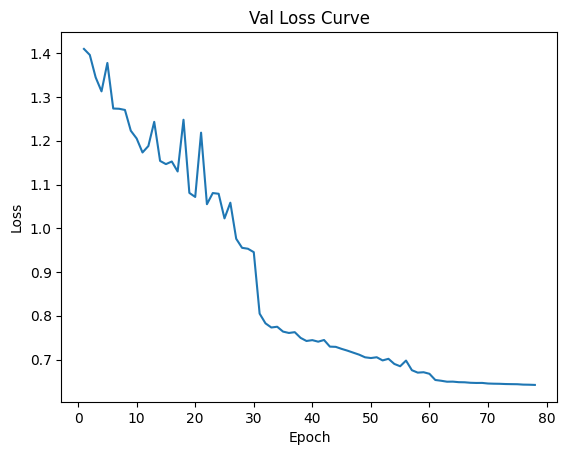

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11530422333341378


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 79/200*****
*****Train Loss:  0.666388 Val Loss:  0.641537*****
*****Validation Accuracy: 63.25%*****
*****Total Avg Disparity: 0.08008869710581935*****

Class Parade: Recall Difference = 0.025983300373544238
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.10052157420578467
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.0807715491259795
Class Cheering: Recall Difference = -0.0385338345864662
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.05683563748079867
Class Couple: Recall Difference = 0.20488466757123464
Class Family_Group: Recall Difference = -0.08840413318025275
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333326
Class Sp

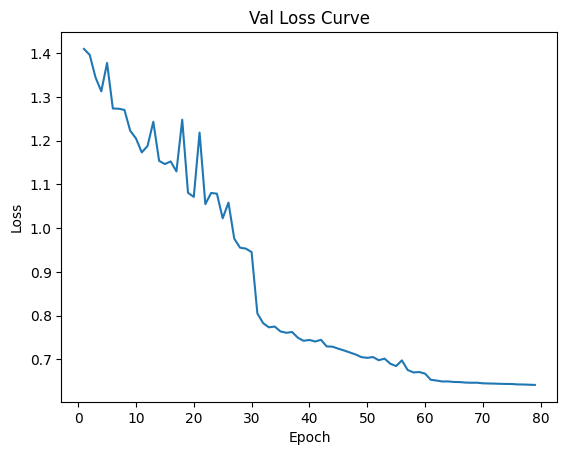

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11471112616933309


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 80/200*****
*****Train Loss:  0.663074 Val Loss:  0.640543*****
*****Validation Accuracy: 63.22%*****
*****Total Avg Disparity: 0.08139204156043606*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.10052157420578467
Class Dancing: Recall Difference = 0.19047619047619052
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.07558362035973987
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333326
Class Sp

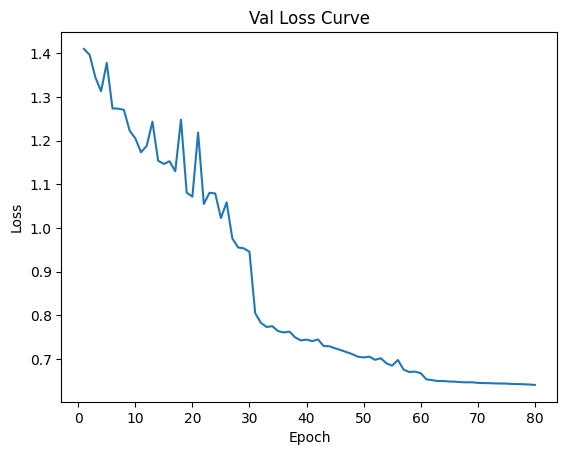

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11584327885737786


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 81/200*****
*****Train Loss:  0.662305 Val Loss:  0.640721*****
*****Validation Accuracy: 63.60%*****
*****Total Avg Disparity: 0.07855781533947108*****

Class Parade: Recall Difference = 0.02999340804218853
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.055950687529634835
Class Dancing: Recall Difference = 0.1488095238095239
Class Funeral: Recall Difference = 0.007836045810729275
Class Cheering: Recall Difference = 0.005639097744360888
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.04493087557603692
Class Couple: Recall Difference = 0.21981004070556304
Class Family_Group: Recall Difference = -0.08840413318025275
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class S

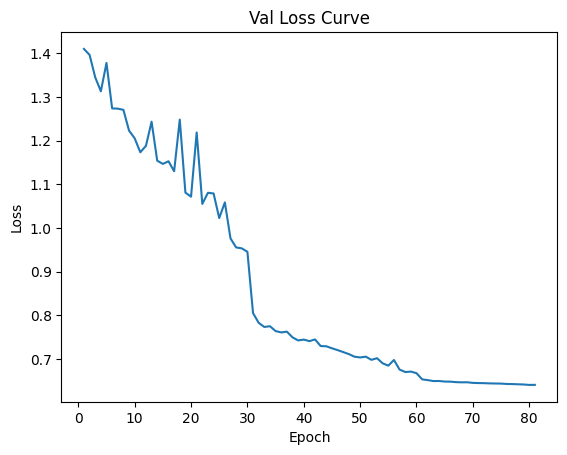

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11510834040550086


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 82/200*****
*****Train Loss:  0.663958 Val Loss:  0.640363*****
*****Validation Accuracy: 63.71%*****
*****Total Avg Disparity: 0.0800204589211801*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = -0.03571428571428571
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.18750000000000006
Class Funeral: Recall Difference = 0.04581072935503305
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615405
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

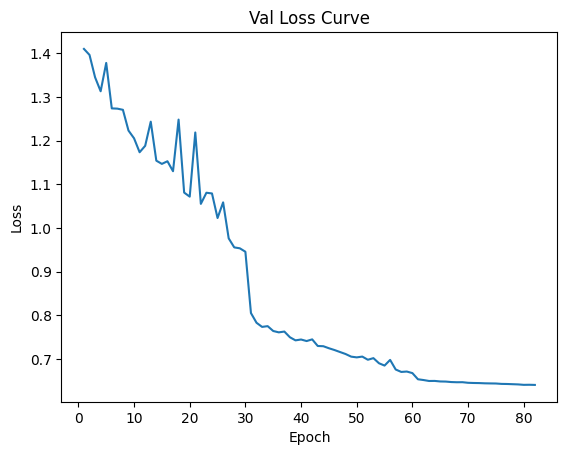

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11446593701839447


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 83/200*****
*****Train Loss:  0.657059 Val Loss:  0.639012*****
*****Validation Accuracy: 63.45%*****
*****Total Avg Disparity: 0.08214274500336326*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.07349454717875759
Class Dancing: Recall Difference = 0.1488095238095239
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.31071913161465414
Class Family_Group: Recall Difference = -0.1140451588212783
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class Spo

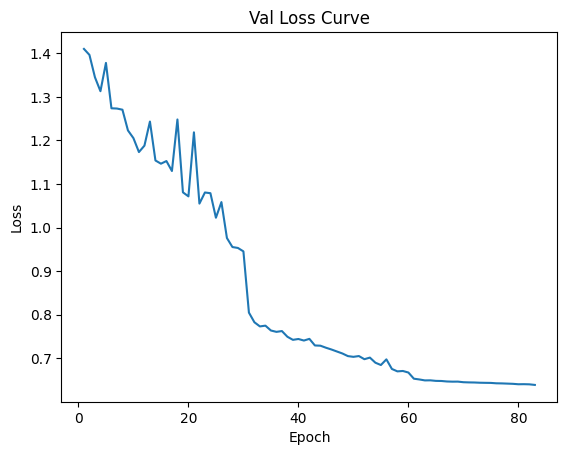

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.114562276750803


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 84/200*****
*****Train Loss:  0.661491 Val Loss:  0.638801*****
*****Validation Accuracy: 63.25%*****
*****Total Avg Disparity: 0.0808749400608451*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.09103840682788045
Class Dancing: Recall Difference = 0.09226190476190477
Class Funeral: Recall Difference = 0.07775768535262201
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.05683563748079867
Class Couple: Recall Difference = 0.21981004070556315
Class Family_Group: Recall Difference = -0.07558362035973976
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333326
Class Spor

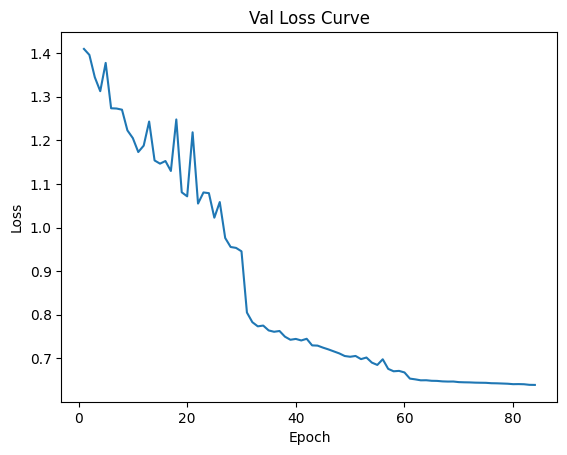

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11483861849858211


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 85/200*****
*****Train Loss:  0.659248 Val Loss:  0.638438*****
*****Validation Accuracy: 63.37%*****
*****Total Avg Disparity: 0.07975076171736016*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.10052157420578467
Class Dancing: Recall Difference = 0.1517857142857143
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.05683563748079867
Class Couple: Recall Difference = 0.21981004070556315
Class Family_Group: Recall Difference = -0.07558362035973992
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class Spo

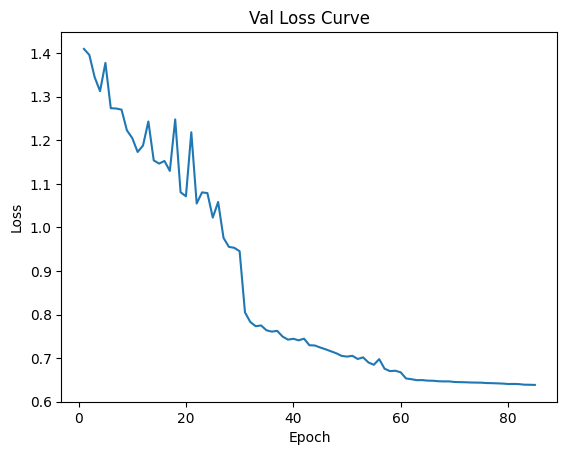

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11523805931210518


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 86/200*****
*****Train Loss:  0.658114 Val Loss:  0.638421*****
*****Validation Accuracy: 63.51%*****
*****Total Avg Disparity: 0.07905635997404113*****

Class Parade: Recall Difference = 0.039496813887057725
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.03840682788051203
Class Dancing: Recall Difference = 0.15178571428571425
Class Funeral: Recall Difference = 0.06811332127787828
Class Cheering: Recall Difference = 0.005639097744360888
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.16532721010332968
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class

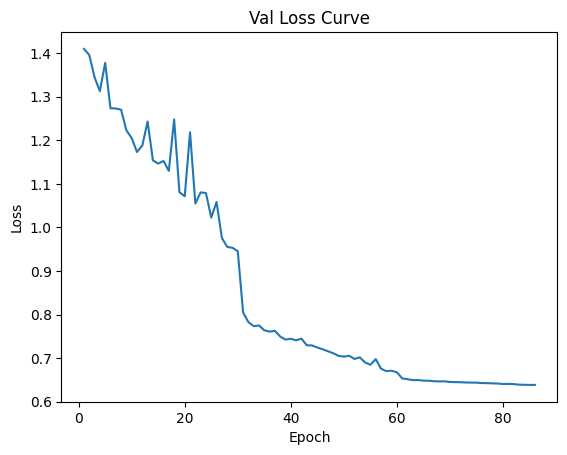

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11446387635973784


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 87/200*****
*****Train Loss:  0.657734 Val Loss:  0.637047*****
*****Validation Accuracy: 63.74%*****
*****Total Avg Disparity: 0.08049757393225342*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = -0.03571428571428571
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.0385338345864662
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.109538784067086
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.08840413318025275
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.04901960784313708
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

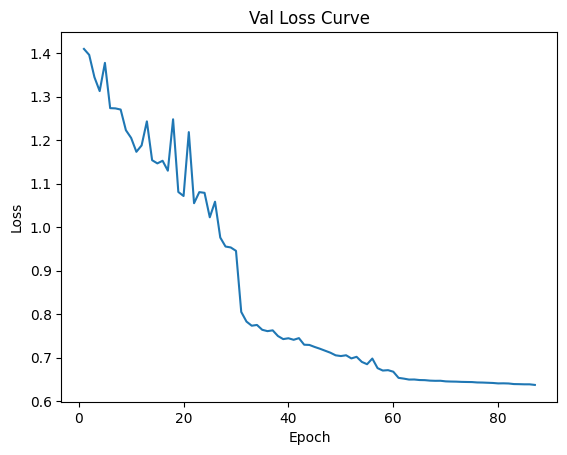

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.1152160674906694


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 88/200*****
*****Train Loss:  0.661735 Val Loss:  0.636973*****
*****Validation Accuracy: 63.71%*****
*****Total Avg Disparity: 0.08026937301893575*****

Class Parade: Recall Difference = 0.039496813887057725
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.09103840682788045
Class Dancing: Recall Difference = 0.1517857142857143
Class Funeral: Recall Difference = 0.007836045810729275
Class Cheering: Recall Difference = -0.002819548872180444
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.012672811059907696
Class Couple: Recall Difference = 0.32564450474898254
Class Family_Group: Recall Difference = -0.12686567164179124
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Clas

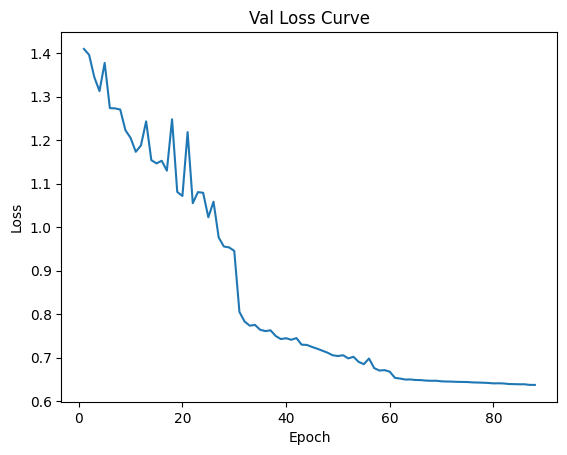

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11413187676897416


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 89/200*****
*****Train Loss:  0.661045 Val Loss:  0.636203*****
*****Validation Accuracy: 63.45%*****
*****Total Avg Disparity: 0.08377008559578845*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.03840682788051203
Class Dancing: Recall Difference = 0.2113095238095239
Class Funeral: Recall Difference = 0.06811332127787828
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048224
Class Concerts: Recall Difference = -0.02457757296466967
Class Couple: Recall Difference = 0.32564450474898254
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class Spor

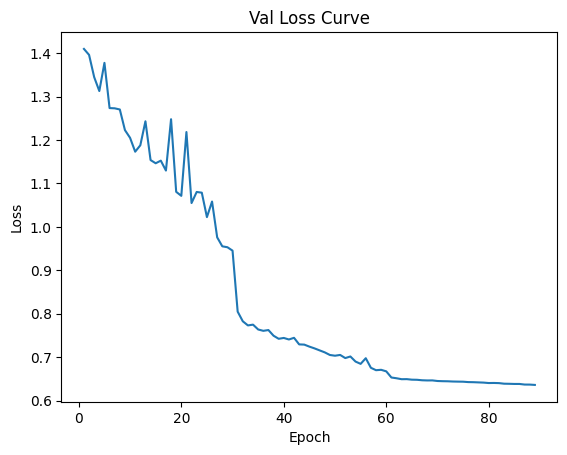

Data has been appended to validation_0.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11501593916462018


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 90/200*****
*****Train Loss:  0.659317 Val Loss:  0.636030*****
*****Validation Accuracy: 63.45%*****
*****Total Avg Disparity: 0.0779143225797799*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.0734945471787577
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675614
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.052935010482180356
Class Concerts: Recall Difference = -0.0449308755760367
Class Couple: Recall Difference = 0.31071913161465414
Class Family_Group: Recall Difference = -0.07558362035973976
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

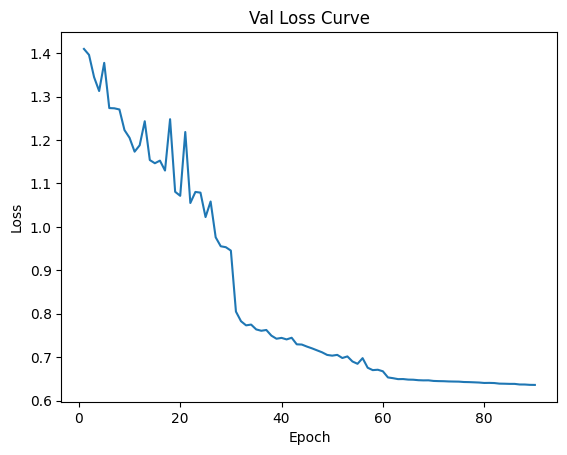

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11510512261436535


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 91/200*****
*****Train Loss:  0.662190 Val Loss:  0.635682*****
*****Validation Accuracy: 63.83%*****
*****Total Avg Disparity: 0.07533250159168228*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.06543385490753906
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.052935010482180356
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.2198100407055632
Class Family_Group: Recall Difference = -0.11404515882127841
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class 

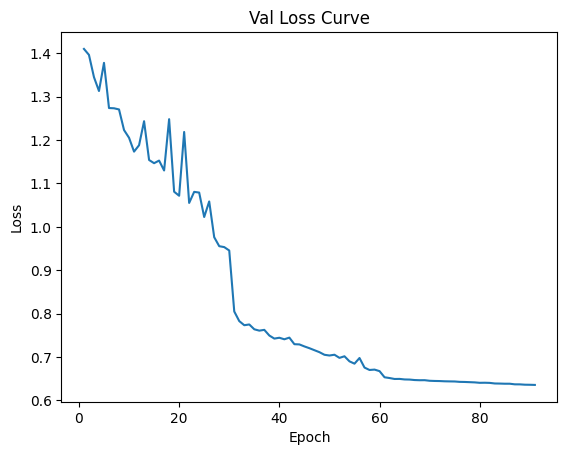

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11479583325294349


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 92/200*****
*****Train Loss:  0.657973 Val Loss:  0.635594*****
*****Validation Accuracy: 63.74%*****
*****Total Avg Disparity: 0.07867125294491792*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675614
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.10122464600076564
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

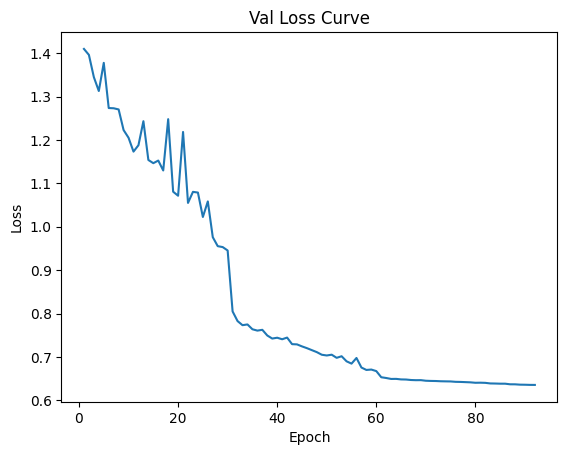

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11533947346302179


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


*****Epoch 93/200*****
*****Train Loss:  0.662438 Val Loss:  0.635501*****
*****Validation Accuracy: 63.60%*****
*****Total Avg Disparity: 0.08228537417267337*****

Class Parade: Recall Difference = 0.039496813887057836
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.10052157420578467
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048213
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.32564450474898254
Class Family_Group: Recall Difference = -0.10122464600076564
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class

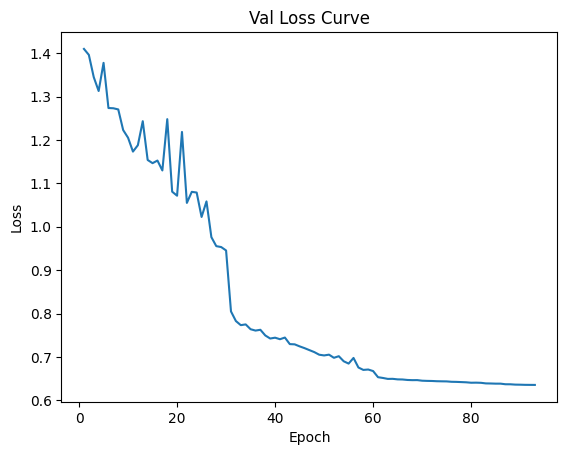

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1146540458385761


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 94/200*****
*****Train Loss:  0.658460 Val Loss:  0.635747*****
*****Validation Accuracy: 63.74%*****
*****Total Avg Disparity: 0.07506147388701852*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.03840682788051203
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.2198100407055632
Class Family_Group: Recall Difference = -0.07558362035973976
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class Spor

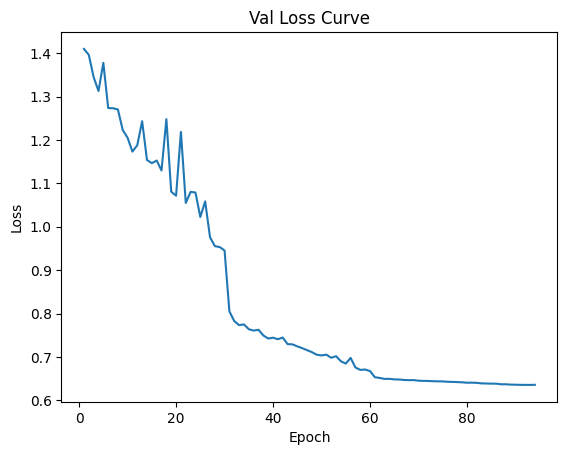

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11452750747020428


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 95/200*****
*****Train Loss:  0.660428 Val Loss:  0.635526*****
*****Validation Accuracy: 63.77%*****
*****Total Avg Disparity: 0.08429332142536941*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.31071913161465403
Class Family_Group: Recall Difference = -0.08840413318025275
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class S

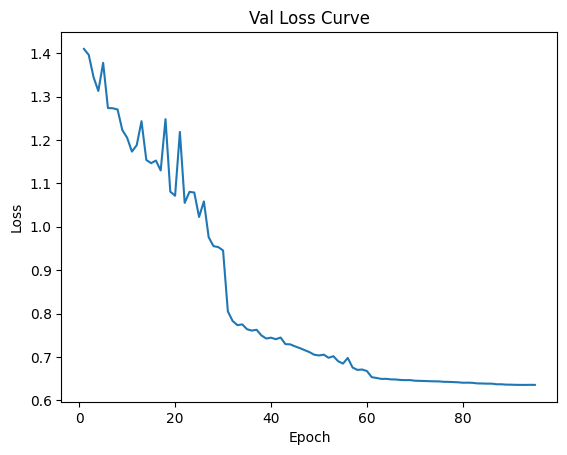

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11496803594323304


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.22s/it]


*****Epoch 96/200*****
*****Train Loss:  0.659480 Val Loss:  0.635181*****
*****Validation Accuracy: 63.65%*****
*****Total Avg Disparity: 0.07821492886955649*****

Class Parade: Recall Difference = 0.039496813887057836
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.055950687529634946
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675614
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.10122464600076547
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class 

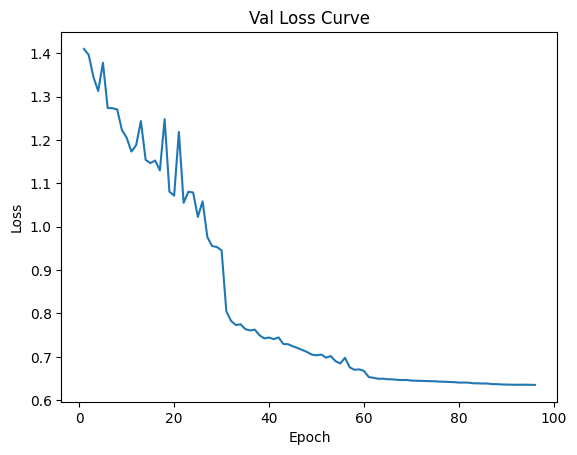

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11466746891920383


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 97/200*****
*****Train Loss:  0.658260 Val Loss:  0.634728*****
*****Validation Accuracy: 63.77%*****
*****Total Avg Disparity: 0.07978678685288398*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.052935010482180356
Class Concerts: Recall Difference = -0.02457757296466967
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class 

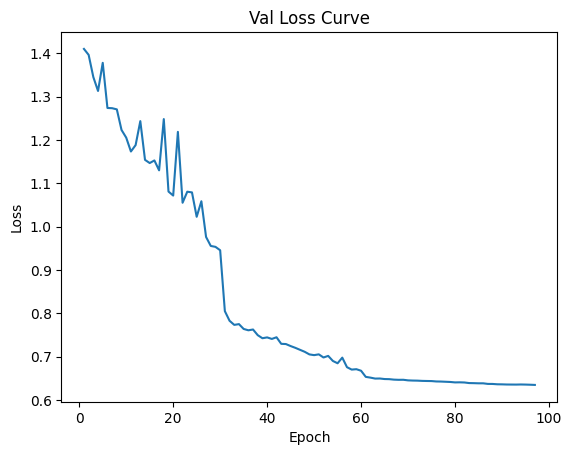

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.1149378172480143


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 98/200*****
*****Train Loss:  0.659405 Val Loss:  0.635304*****
*****Validation Accuracy: 63.83%*****
*****Total Avg Disparity: 0.07934941289422023*****

Class Parade: Recall Difference = 0.039496813887057725
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class Spo

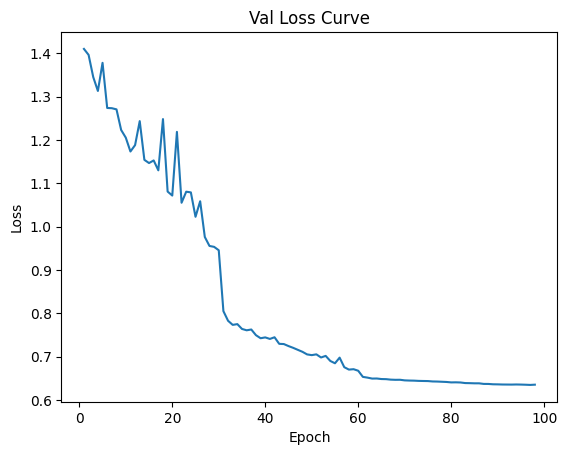

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11486455540244396


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 99/200*****
*****Train Loss:  0.658215 Val Loss:  0.634997*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.07768314429491302*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.055950687529634946
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878407
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class

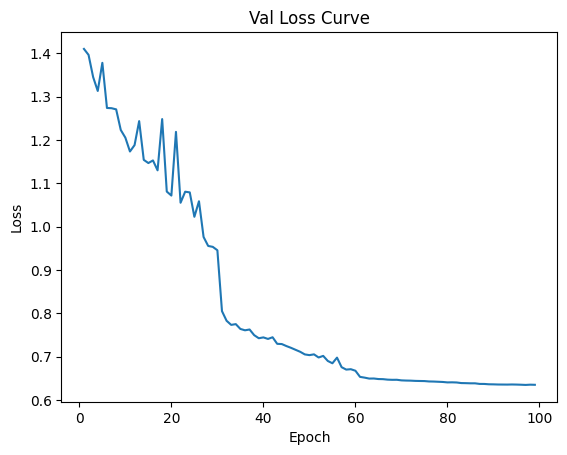

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.1142608354297968


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 100/200*****
*****Train Loss:  0.652763 Val Loss:  0.635041*****
*****Validation Accuracy: 63.71%*****
*****Total Avg Disparity: 0.07992766816392438*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.1488095238095239
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878407
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

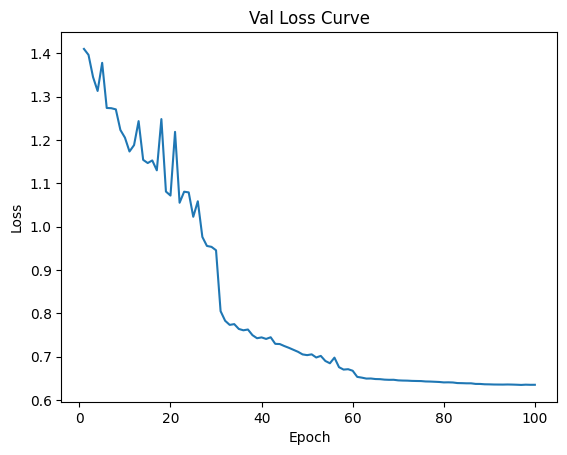

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11480614485648963


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 101/200*****
*****Train Loss:  0.657775 Val Loss:  0.635019*****
*****Validation Accuracy: 63.71%*****
*****Total Avg Disparity: 0.08288916609105322*****

Class Parade: Recall Difference = 0.031366732586244894
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878407
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.32564450474898254
Class Family_Group: Recall Difference = -0.07558362035973992
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class 

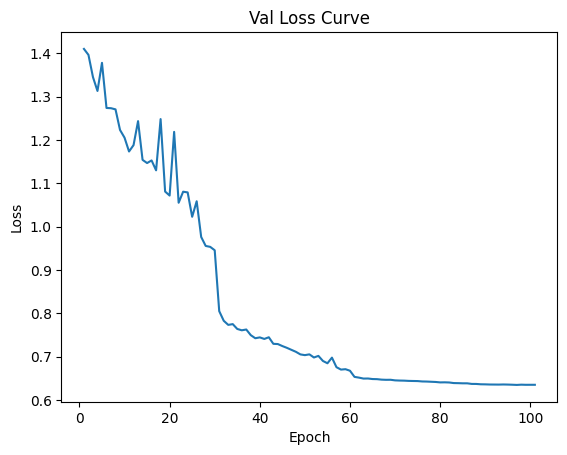

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11547975614666939


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 102/200*****
*****Train Loss:  0.655073 Val Loss:  0.634974*****
*****Validation Accuracy: 64.03%*****
*****Total Avg Disparity: 0.07852700080925364*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.10122464600076564
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class S

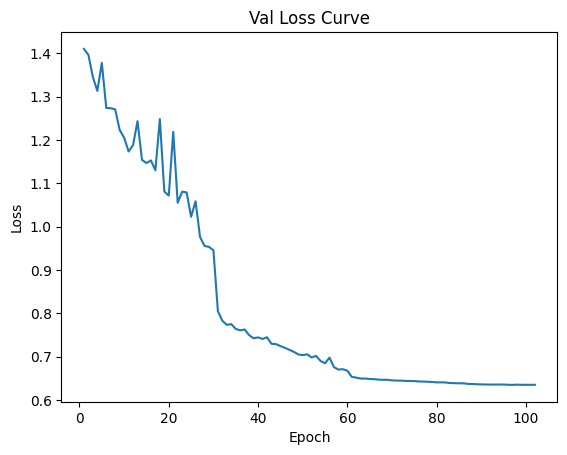

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11466022494893807


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 103/200*****
*****Train Loss:  0.653802 Val Loss:  0.634949*****
*****Validation Accuracy: 64.00%*****
*****Total Avg Disparity: 0.07845000654772352*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.020494273658830497
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878407
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.11404515882127841
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class

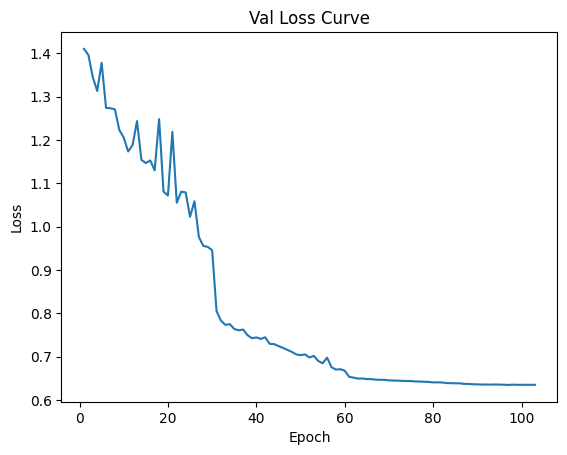

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11535644359313525


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 104/200*****
*****Train Loss:  0.655018 Val Loss:  0.635291*****
*****Validation Accuracy: 64.00%*****
*****Total Avg Disparity: 0.07704735713253236*****

Class Parade: Recall Difference = 0.039496813887057725
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.11011904761904767
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.1268656716417912
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class S

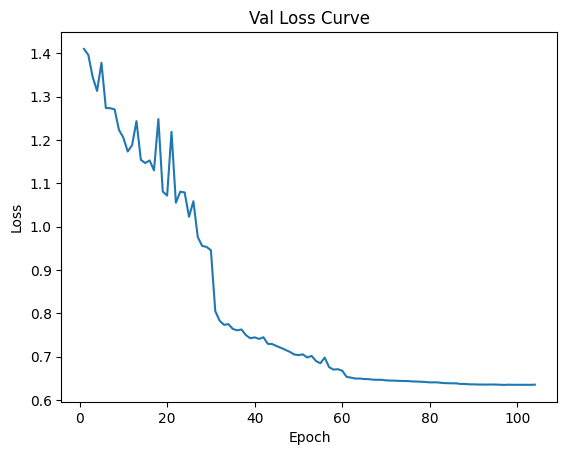

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11493925062509683


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 105/200*****
*****Train Loss:  0.656550 Val Loss:  0.634965*****
*****Validation Accuracy: 63.80%*****
*****Total Avg Disparity: 0.07485671183740997*****

Class Parade: Recall Difference = 0.039496813887057725
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.03840682788051203
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675614
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class 

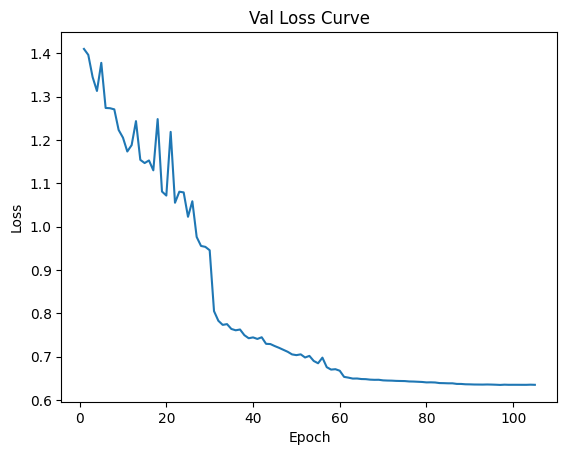

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11498899528613457


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 106/200*****
*****Train Loss:  0.662312 Val Loss:  0.634572*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.07906954800116943*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.1488095238095239
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.21981004070556315
Class Family_Group: Recall Difference = -0.11404515882127841
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

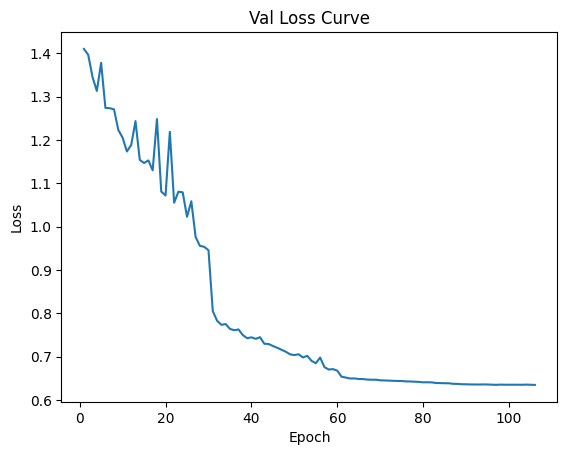

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.1150244686465997


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 107/200*****
*****Train Loss:  0.657850 Val Loss:  0.634751*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.07612369812408691*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753906
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.08840413318025275
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

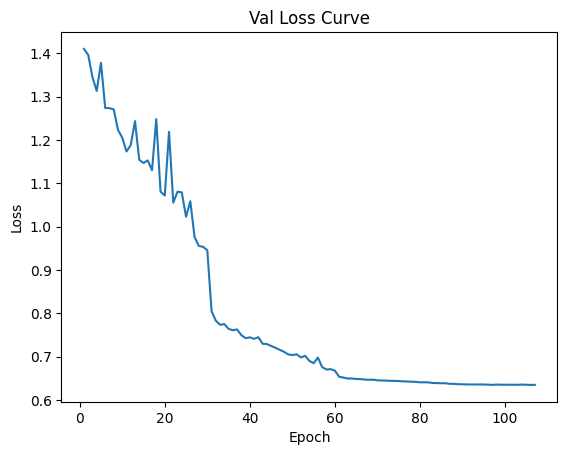

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:48<00:00,  4.19s/it]


Average Adversary epoch loss: 0.11602927171266995


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


*****Epoch 108/200*****
*****Train Loss:  0.658333 Val Loss:  0.634678*****
*****Validation Accuracy: 63.94%*****
*****Total Avg Disparity: 0.07648132245475445*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.03840682788051203
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class Spo

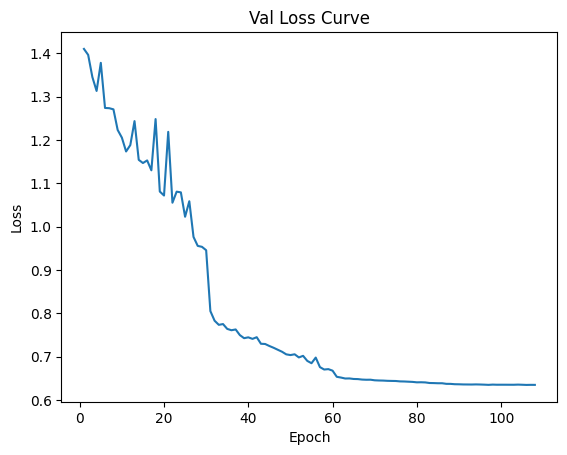

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11493419311367549


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 109/200*****
*****Train Loss:  0.661383 Val Loss:  0.634294*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.07842022563474407*****

Class Parade: Recall Difference = 0.01510656998461879
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.21981004070556315
Class Family_Group: Recall Difference = -0.10122464600076564
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class S

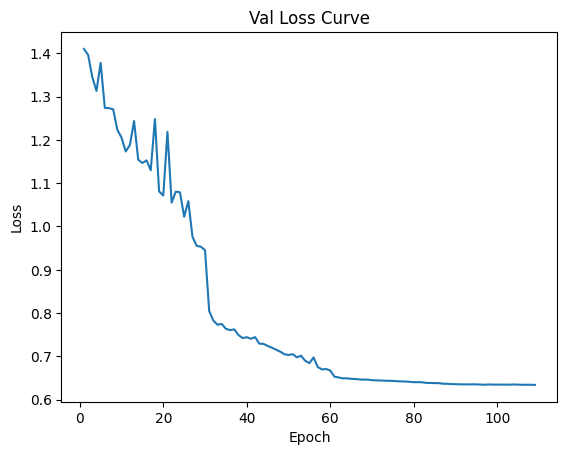

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11456484892047368


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


*****Epoch 110/200*****
*****Train Loss:  0.652937 Val Loss:  0.634247*****
*****Validation Accuracy: 64.06%*****
*****Total Avg Disparity: 0.0755808107487321*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.11011904761904767
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class S

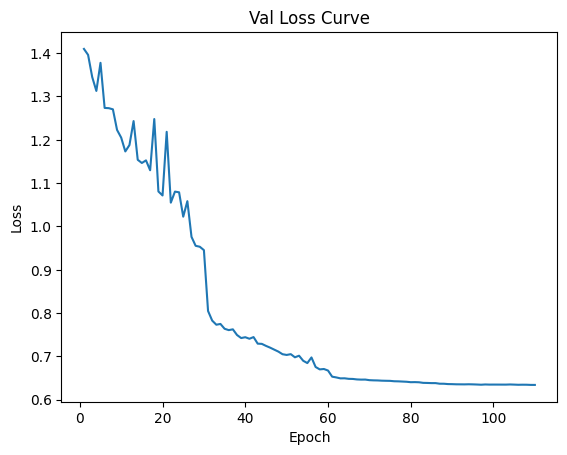

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11421290670449917


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 111/200*****
*****Train Loss:  0.659797 Val Loss:  0.634779*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.07635653889035718*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753906
Class Dancing: Recall Difference = 0.14583333333333337
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class S

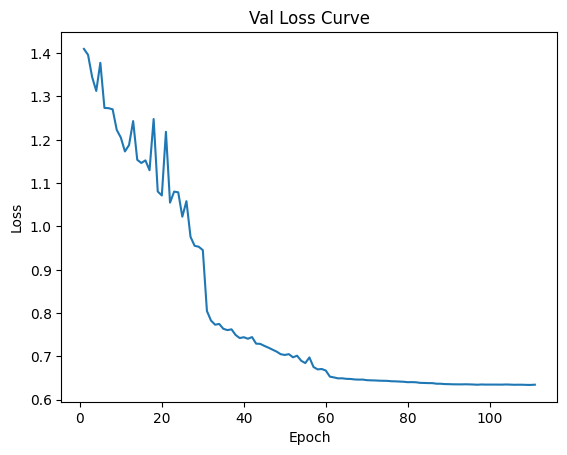

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11451998811501723


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 112/200*****
*****Train Loss:  0.658063 Val Loss:  0.634321*****
*****Validation Accuracy: 63.94%*****
*****Total Avg Disparity: 0.07552752201148624*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.14583333333333343
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class S

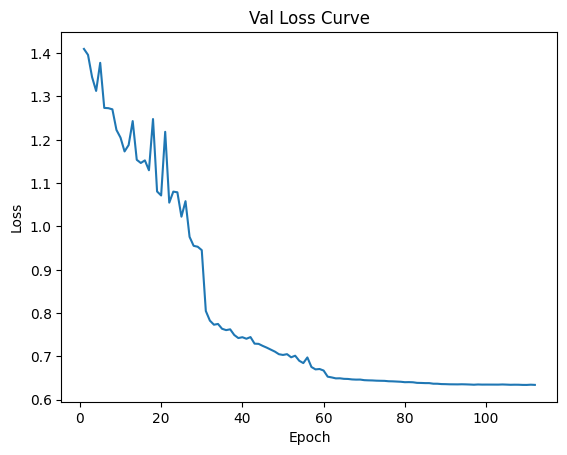

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11541344683903915


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 113/200*****
*****Train Loss:  0.658368 Val Loss:  0.634094*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.07486953686441224*****

Class Parade: Recall Difference = 0.01510656998461879
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675614
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.08333333333333337
Class S

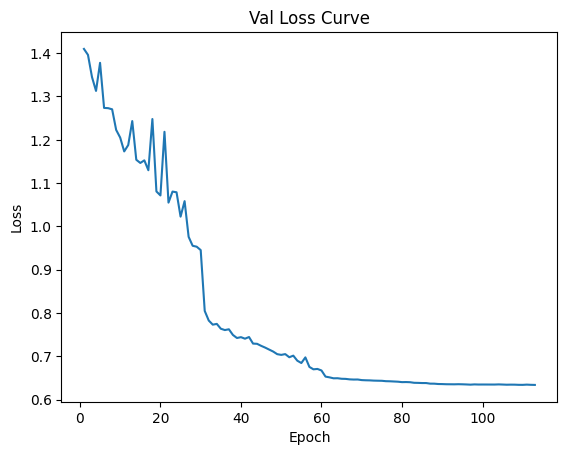

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11508333081236252


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 114/200*****
*****Train Loss:  0.652567 Val Loss:  0.634124*****
*****Validation Accuracy: 63.86%*****
*****Total Avg Disparity: 0.0767841399357583*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.14583333333333343
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

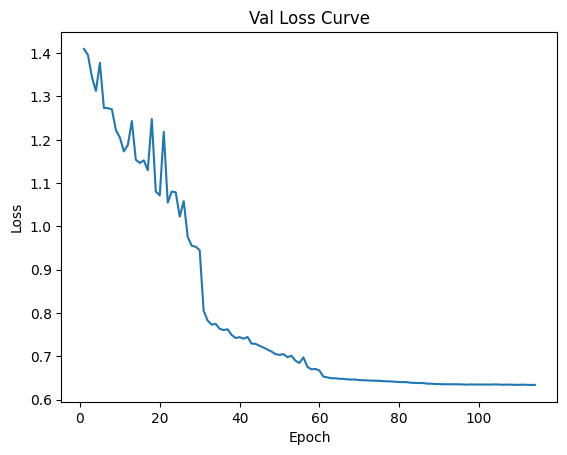

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.38s/it]


Average Adversary epoch loss: 0.11520297424151348


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 115/200*****
*****Train Loss:  0.654748 Val Loss:  0.634124*****
*****Validation Accuracy: 63.83%*****
*****Total Avg Disparity: 0.07709418056227982*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class

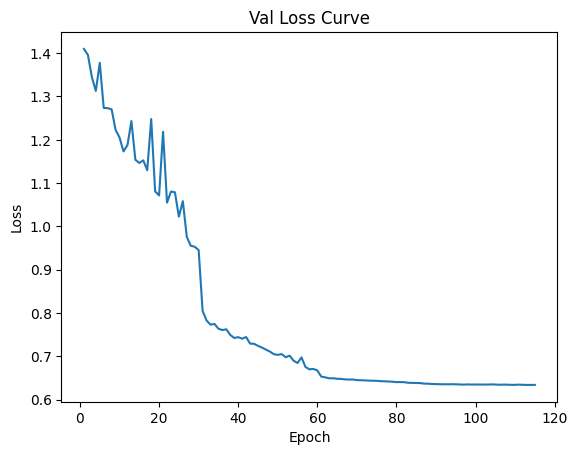

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11502198674357854


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 116/200*****
*****Train Loss:  0.655079 Val Loss:  0.634786*****
*****Validation Accuracy: 63.71%*****
*****Total Avg Disparity: 0.07631987723127759*****

Class Parade: Recall Difference = 0.039496813887057725
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.03840682788051203
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.109538784067086
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class Spor

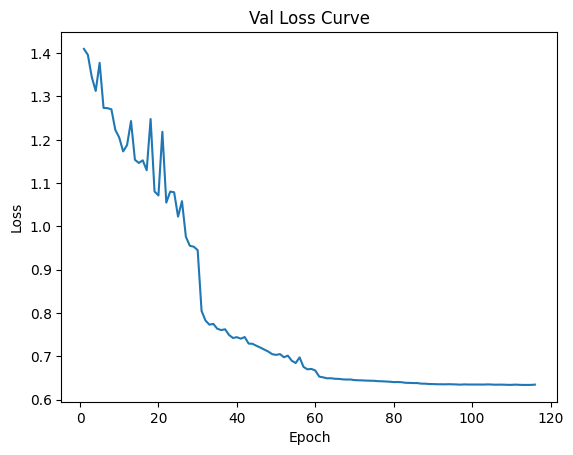

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11521512269973755


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 117/200*****
*****Train Loss:  0.659078 Val Loss:  0.633961*****
*****Validation Accuracy: 63.83%*****
*****Total Avg Disparity: 0.0749649558376761*****

Class Parade: Recall Difference = 0.01510656998461879
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753906
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675614
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2048846675712348
Class Family_Group: Recall Difference = -0.11404515882127836
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333326
Class Spo

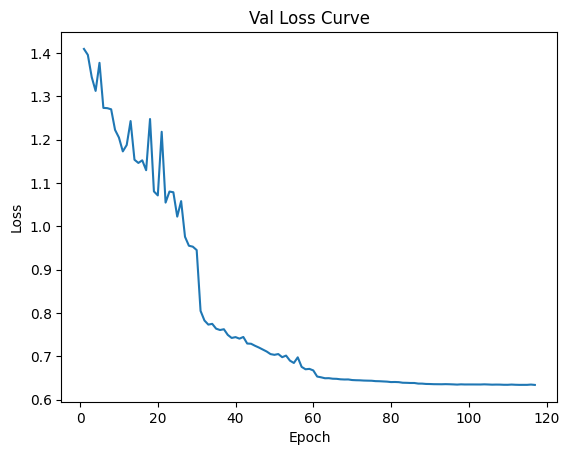

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11513012733597022


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 118/200*****
*****Train Loss:  0.660515 Val Loss:  0.634169*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.07745312160072276*****

Class Parade: Recall Difference = 0.01510656998461879
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.1488095238095239
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class S

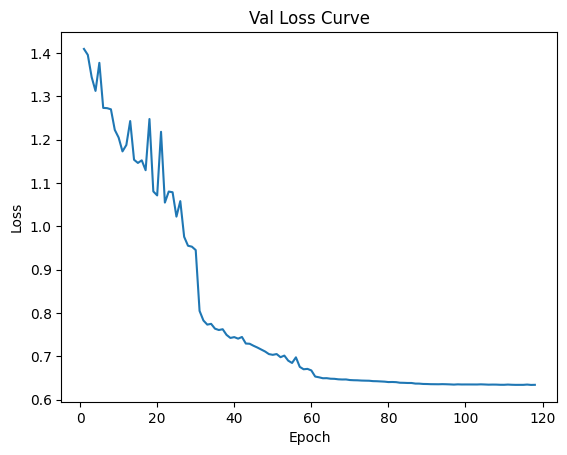

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1153969349196324


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 119/200*****
*****Train Loss:  0.658990 Val Loss:  0.633680*****
*****Validation Accuracy: 63.63%*****
*****Total Avg Disparity: 0.07756959187754595*****

Class Parade: Recall Difference = 0.04762689518787078
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048224
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.2048846675712347
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class 

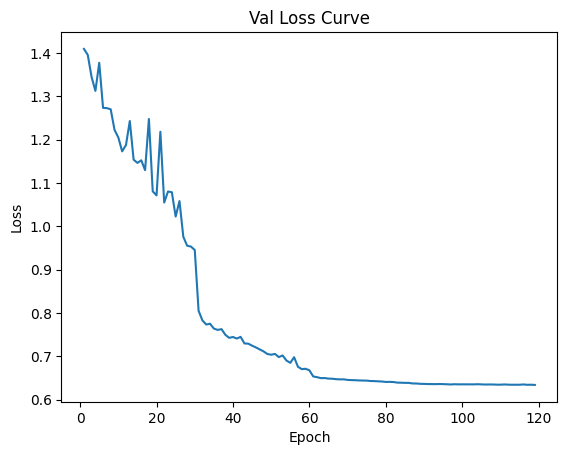

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11535669175478128


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 120/200*****
*****Train Loss:  0.658279 Val Loss:  0.634038*****
*****Validation Accuracy: 63.74%*****
*****Total Avg Disparity: 0.07476312179191638*****

Class Parade: Recall Difference = 0.03136673258624478
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.11011904761904756
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class 

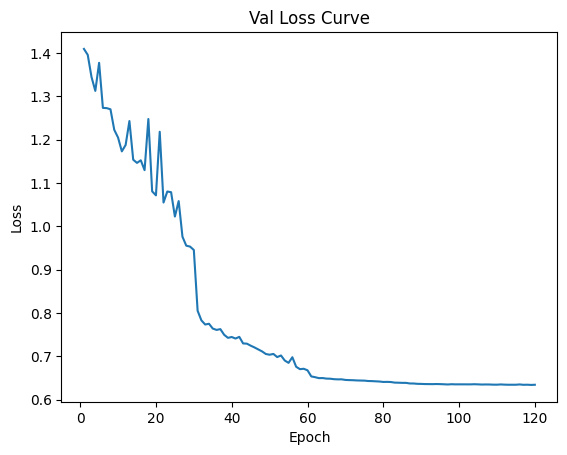

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-06


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11547780237518825


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 121/200*****
*****Train Loss:  0.658480 Val Loss:  0.633752*****
*****Validation Accuracy: 64.12%*****
*****Total Avg Disparity: 0.07500997746328746*****

Class Parade: Recall Difference = 0.01510656998461879
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.10122464600076553
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.0490196078431373
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

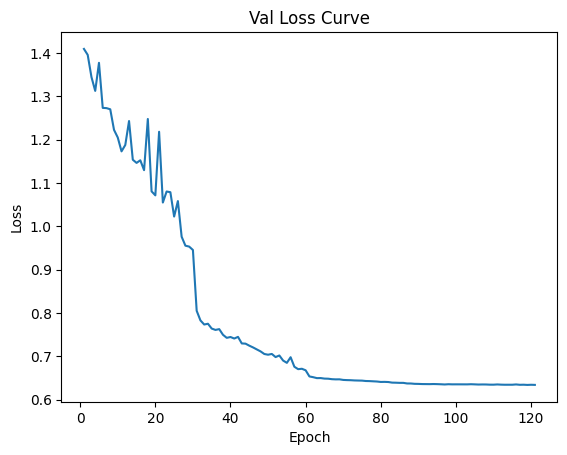

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-06


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11441473720165399


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 122/200*****
*****Train Loss:  0.660403 Val Loss:  0.633928*****
*****Validation Accuracy: 63.97%*****
*****Total Avg Disparity: 0.07925169978219432*****

Class Parade: Recall Difference = 0.01510656998461879
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.08297771455666186
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.11404515882127841
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.08333333333333337
Class 

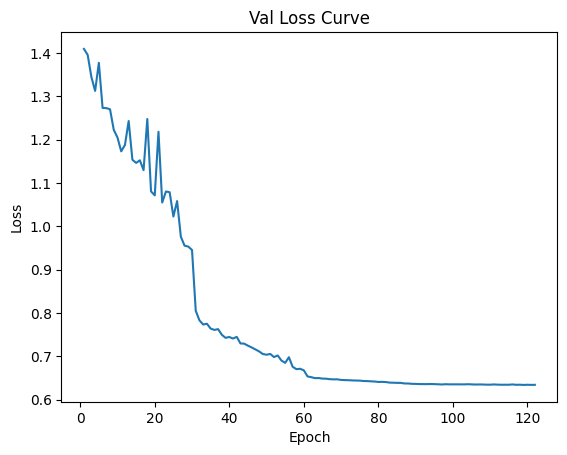

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-06


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11488071198646839


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 123/200*****
*****Train Loss:  0.653340 Val Loss:  0.633803*****
*****Validation Accuracy: 63.97%*****
*****Total Avg Disparity: 0.07534342420277752*****

Class Parade: Recall Difference = 0.01510656998461879
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.06543385490753906
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = -0.004822182037371947
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.08840413318025281
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Cla

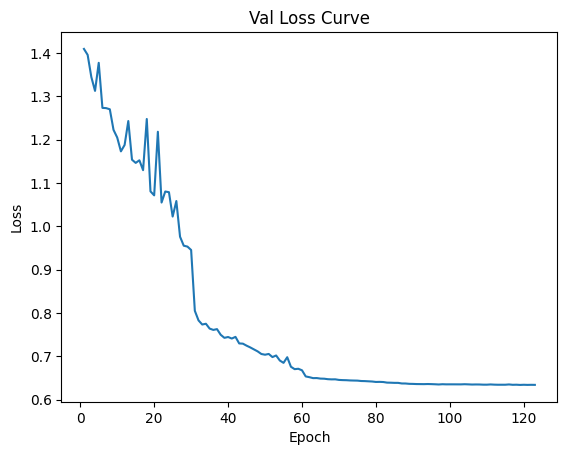

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-06


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1139959879219532


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 124/200*****
*****Train Loss:  0.658182 Val Loss:  0.633820*****
*****Validation Accuracy: 63.92%*****
*****Total Avg Disparity: 0.07552669675301138*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753906
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.10122464600076547
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.04901960784313708
Class Spa: Recall Difference = 0.08333333333333337
Class S

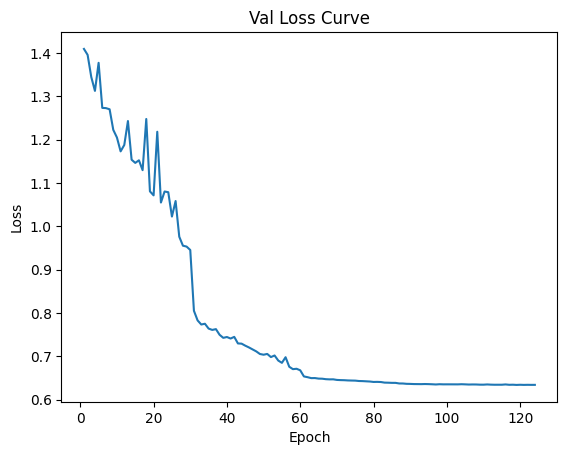

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-06


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11446827162916844


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 125/200*****
*****Train Loss:  0.658592 Val Loss:  0.634124*****
*****Validation Accuracy: 63.92%*****
*****Total Avg Disparity: 0.07655413614688868*****

Class Parade: Recall Difference = 0.01510656998461879
Class Handshaking: Recall Difference = 0.05357142857142856
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.06811332127787817
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878407
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.07558362035973992
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333326
Class S

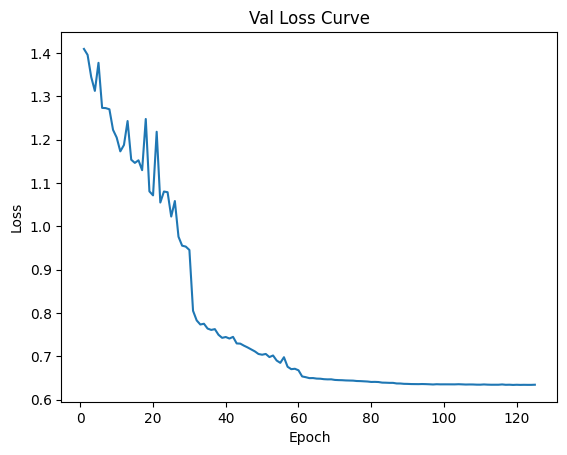

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-06


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11410580002344571


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 126/200*****
*****Train Loss:  0.656462 Val Loss:  0.634229*****
*****Validation Accuracy: 63.86%*****
*****Total Avg Disparity: 0.07572918737371509*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878407
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.07558362035973976
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.08333333333333337
Class S

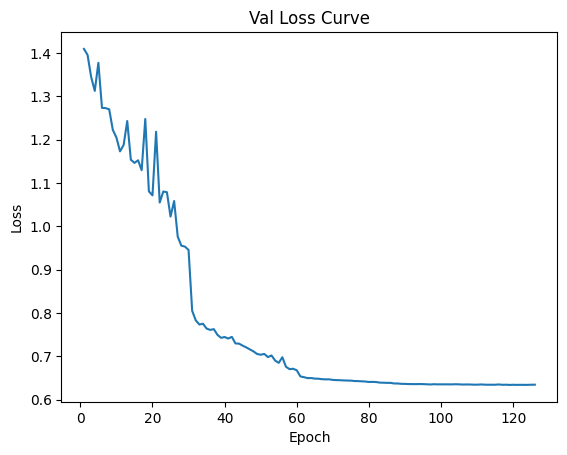

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-06


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11419698510032433


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 127/200*****
*****Train Loss:  0.655279 Val Loss:  0.633852*****
*****Validation Accuracy: 63.92%*****
*****Total Avg Disparity: 0.07489007696120648*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619058
Class Funeral: Recall Difference = 0.05545509342977695
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = -0.04493087557603681
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.11404515882127841
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.08333333333333337
Class Sp

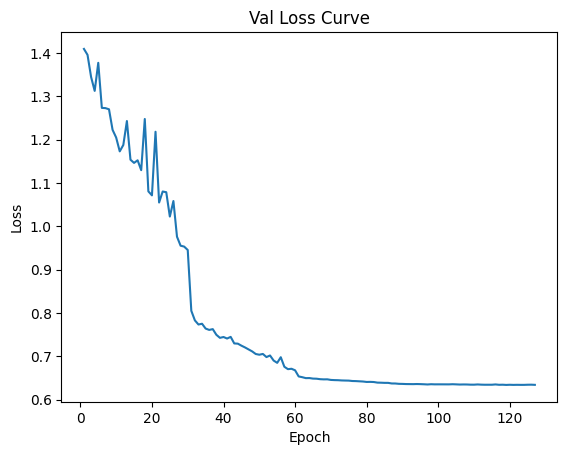

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-06


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11415053330934964


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 128/200*****
*****Train Loss:  0.656234 Val Loss:  0.633786*****
*****Validation Accuracy: 63.83%*****
*****Total Avg Disparity: 0.07711348054982448*****

Class Parade: Recall Difference = 0.02323665128543173
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09067085953878418
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.08840413318025275
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.08333333333333337
Class S

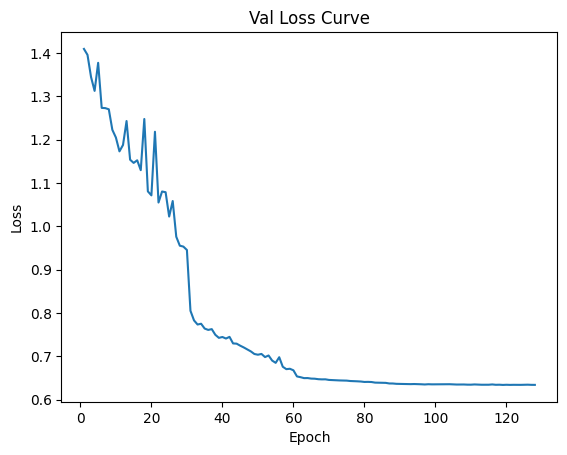

Data has been appended to validation_0.txt
Learning Rate: 3.115347475837591e-06


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11420413479208946


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 129/200*****
*****Train Loss:  0.657634 Val Loss:  0.633961*****
*****Validation Accuracy: 64.00%*****
*****Total Avg Disparity: 0.07463254613987776*****

Class Parade: Recall Difference = 0.01510656998461879
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.06543385490753917
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.042796865581675725
Class Cheering: Recall Difference = -0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = -0.03302611367127495
Class Couple: Recall Difference = 0.2198100407055631
Class Family_Group: Recall Difference = -0.10122464600076547
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.08333333333333337
Class S

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:57<00:00,  4.51s/it]


*******Epoch 0: loss - 1.37725895184737


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:56<00:00,  4.48s/it]


*******Epoch 1: loss - 1.3302307220605702


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:57<00:00,  4.51s/it]


*******Epoch 2: loss - 1.2840508268429682


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Pretrain Adversary epoch loss:  0.18714870340549028


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Pretrain Adversary epoch loss:  0.13002672390295908


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Pretrain Adversary epoch loss:  0.12529747675244624


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.12405600513403232


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 1/200*****
*****Train Loss:  1.177326 Val Loss:  1.333146*****
*****Validation Accuracy: 19.69%*****
*****Total Avg Disparity: 0.06900022846137495*****

Class Parade: Recall Difference = 0.019885739397934588
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.0
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.0
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.0
Class Soldier_Patrol: Recall Difference = -0.10653594771241828
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.11338046609059962
Class Running: Recall Difference = 0.0
Class Basketball: R

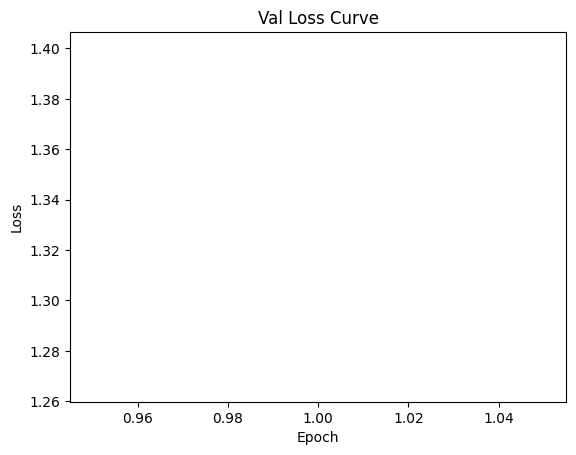

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.1269601798401429


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 2/200*****
*****Train Loss:  1.139887 Val Loss:  1.380328*****
*****Validation Accuracy: 17.58%*****
*****Total Avg Disparity: 0.05422025179025006*****

Class Parade: Recall Difference = 0.006152493957372052
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = -0.005952380952380952
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.10714285714285718
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = -0.0303030303030303
Class Soldier_Patrol: Recall Difference = -0.17843137254901964
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.01230688661953391
Class Ru

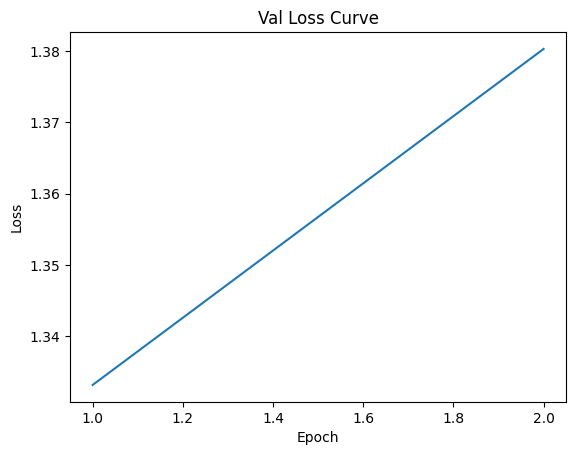

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.1247174533513876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 3/200*****
*****Train Loss:  1.118485 Val Loss:  1.364568*****
*****Validation Accuracy: 19.95%*****
*****Total Avg Disparity: 0.056220102965746685*****

Class Parade: Recall Difference = -0.047791694133157536
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.011904761904761897
Class Funeral: Recall Difference = 0.05063291139240507
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = -0.00844854070660523
Class Couple: Recall Difference = 0.04477611940298507
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = -0.0745920745920746
Class Soldier_Patrol: Recall Difference = -0.1895424836601307
Class Spa: Recall Difference = -0.023809523809523808
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitres

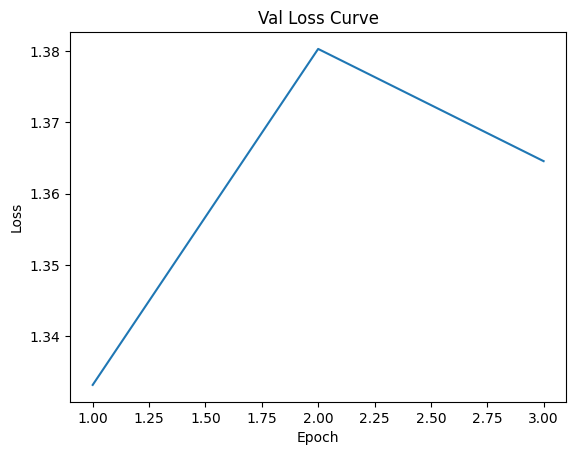

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.12412811070680618


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 4/200*****
*****Train Loss:  1.090789 Val Loss:  1.316803*****
*****Validation Accuracy: 22.27%*****
*****Total Avg Disparity: 0.06944868544058468*****

Class Parade: Recall Difference = -0.04103493737640074
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = -0.008928571428571438
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.05952380952380952
Class Couple: Recall Difference = 0.04477611940298507
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.024475524475524466
Class Soldier_Patrol: Recall Difference = -0.07973856209150323
Class Spa: Recall Difference = 0.05357142857142856
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Differen

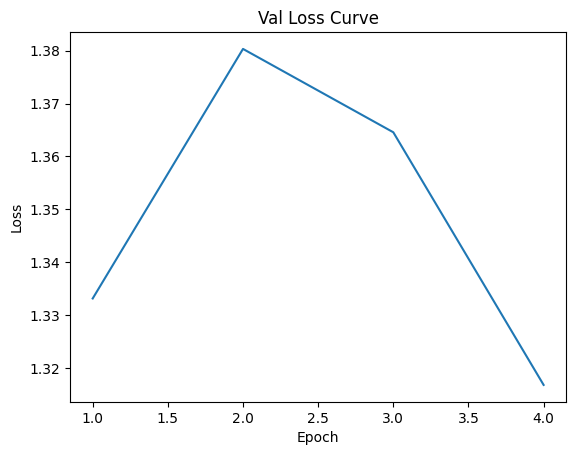

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.12194347926057302


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 5/200*****
*****Train Loss:  1.071855 Val Loss:  1.288533*****
*****Validation Accuracy: 24.62%*****
*****Total Avg Disparity: 0.052788168446095456*****

Class Parade: Recall Difference = -0.024994506701823793
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = -0.005952380952380945
Class Funeral: Recall Difference = 0.003013863773357453
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.0009615384615384581
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03773584905660378
Class Concerts: Recall Difference = 0.0
Class Couple: Recall Difference = 0.04477611940298507
Class Family_Group: Recall Difference = 0.017030233448143896
Class Picnic: Recall Difference = -0.06643356643356642
Class Soldier_Patrol: Recall Difference = -0.1424836601307189
Class Spa: Recall Difference = -0.0892857142857143
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall D

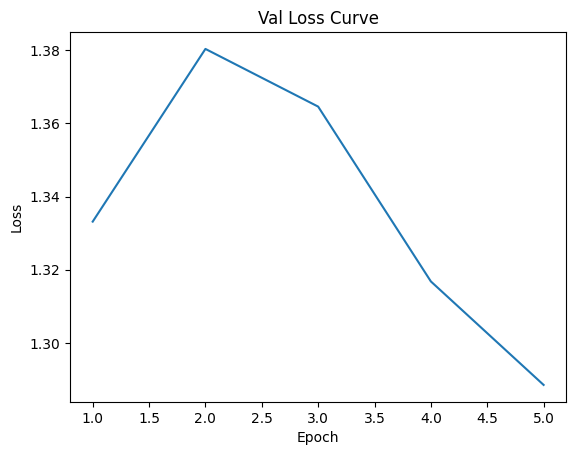

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.12374881540353481


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 6/200*****
*****Train Loss:  1.049037 Val Loss:  1.249675*****
*****Validation Accuracy: 26.61%*****
*****Total Avg Disparity: 0.08638109987617766*****

Class Parade: Recall Difference = -0.020764667106130452
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.045993361782835473
Class Dancing: Recall Difference = -0.017857142857142877
Class Funeral: Recall Difference = 0.0880048221820374
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.09711538461538469
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.027777777777777776
Class Concerts: Recall Difference = 0.0921658986175116
Class Couple: Recall Difference = 0.1492537313432836
Class Family_Group: Recall Difference = 0.04037504783773438
Class Picnic: Recall Difference = 0.10955710955710951
Class Soldier_Patrol: Recall Difference = 0.0006535947712418277
Class Spa: Recall Difference = 0.3869047619047618
Class Sports_Fan: Recall Difference = 

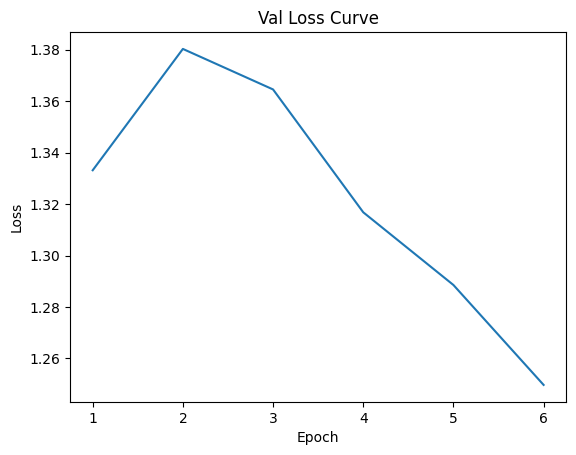

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.12095066618460876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 7/200*****
*****Train Loss:  1.040587 Val Loss:  1.286976*****
*****Validation Accuracy: 23.57%*****
*****Total Avg Disparity: 0.06526300257303033*****

Class Parade: Recall Difference = 0.012195121951219523
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.04761904761904764
Class Funeral: Recall Difference = 0.12658227848101267
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.10673076923076925
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.00890985324947589
Class Concerts: Recall Difference = -0.03379416282642088
Class Couple: Recall Difference = 0.07327001356852104
Class Family_Group: Recall Difference = -0.002296211251435129
Class Picnic: Recall Difference = 0.0489510489510489
Class Soldier_Patrol: Recall Difference = -0.0771241830065359
Class Spa: Recall Difference = 0.09523809523809512
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons:

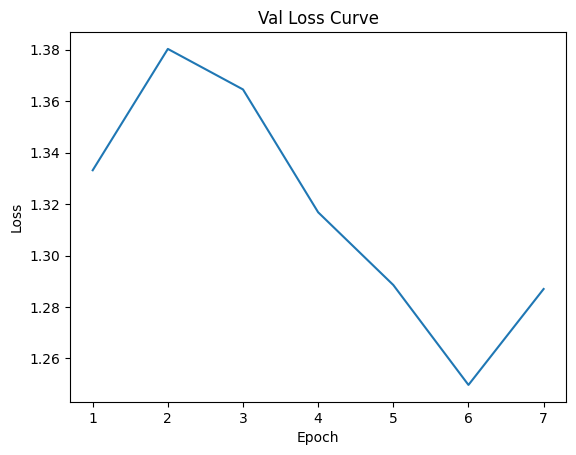

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.1208621461230975


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 8/200*****
*****Train Loss:  1.018955 Val Loss:  1.398120*****
*****Validation Accuracy: 23.57%*****
*****Total Avg Disparity: 0.08004023790031728*****

Class Parade: Recall Difference = -0.020544935179081514
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.02702702702702703
Class Dancing: Recall Difference = 0.07142857142857142
Class Funeral: Recall Difference = -0.047619047619047616
Class Cheering: Recall Difference = 0.035714285714285705
Class Meeting: Recall Difference = 0.07596153846153847
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.01881720430107528
Class Couple: Recall Difference = 0.044776119402985065
Class Family_Group: Recall Difference = 0.06601607347876007
Class Picnic: Recall Difference = 0.018648018648018655
Class Soldier_Patrol: Recall Difference = -0.10849673202614374
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surg

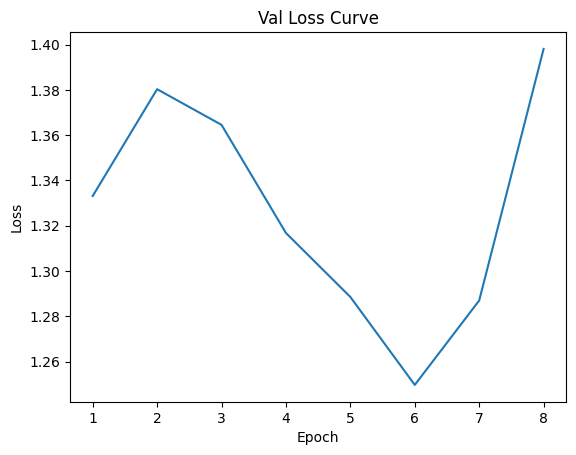

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12413815609537639


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 9/200*****
*****Train Loss:  1.005856 Val Loss:  1.190931*****
*****Validation Accuracy: 28.00%*****
*****Total Avg Disparity: 0.09625835673144971*****

Class Parade: Recall Difference = 0.023895847066578768
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.08333333333333334
Class Funeral: Recall Difference = 0.021699819168173595
Class Cheering: Recall Difference = -0.008458646616541356
Class Meeting: Recall Difference = 0.16923076923076924
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.009958071278826003
Class Concerts: Recall Difference = 0.030721966205837184
Class Couple: Recall Difference = 0.07327001356852104
Class Family_Group: Recall Difference = -0.05357826253348642
Class Picnic: Recall Difference = -0.0885780885780886
Class Soldier_Patrol: Recall Difference = 0.142483660130719
Class Spa: Recall Difference = 0.23809523809523808
Class Sports_Fan: Recall Difference = 0.

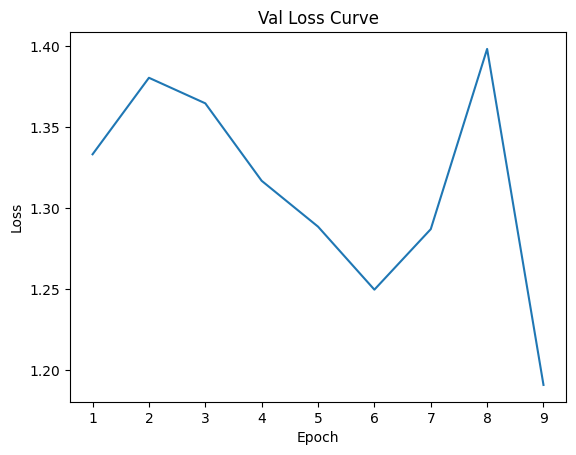

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.12231198211128895


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 10/200*****
*****Train Loss:  0.990357 Val Loss:  1.130371*****
*****Validation Accuracy: 31.36%*****
*****Total Avg Disparity: 0.08226654960843006*****

Class Parade: Recall Difference = 0.007525818501428194
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.06069227121858703
Class Dancing: Recall Difference = 0.04464285714285715
Class Funeral: Recall Difference = 0.04701627486437618
Class Cheering: Recall Difference = 0.017857142857142856
Class Meeting: Recall Difference = 0.10576923076923078
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.01781970649895178
Class Concerts: Recall Difference = 0.05453149001536099
Class Couple: Recall Difference = 0.043419267299864325
Class Family_Group: Recall Difference = 0.001913509376195957
Class Picnic: Recall Difference = 0.026806526806526787
Class Soldier_Patrol: Recall Difference = 0.1294117647058824
Class Spa: Recall Difference = 0.3571428571428571
Class Sports_Fan: Recall

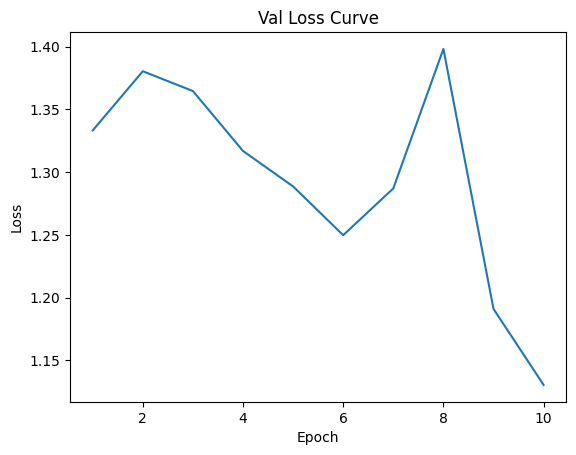

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12149050000768441


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 11/200*****
*****Train Loss:  0.983996 Val Loss:  1.140140*****
*****Validation Accuracy: 30.81%*****
*****Total Avg Disparity: 0.08686690581096553*****

Class Parade: Recall Difference = -0.08031201933640963
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.00806069227121859
Class Dancing: Recall Difference = 0.10714285714285712
Class Funeral: Recall Difference = 0.10367691380349608
Class Cheering: Recall Difference = 0.05357142857142857
Class Meeting: Recall Difference = 0.08942307692307694
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0010482180293501092
Class Concerts: Recall Difference = 0.008832565284178251
Class Couple: Recall Difference = 0.17910447761194032
Class Family_Group: Recall Difference = -0.06429391504018368
Class Picnic: Recall Difference = 0.07925407925407923
Class Soldier_Patrol: Recall Difference = 0.0039215686274510775
Class Spa: Recall Difference = 0.2857142857142857
Class Sports_Fan: Reca

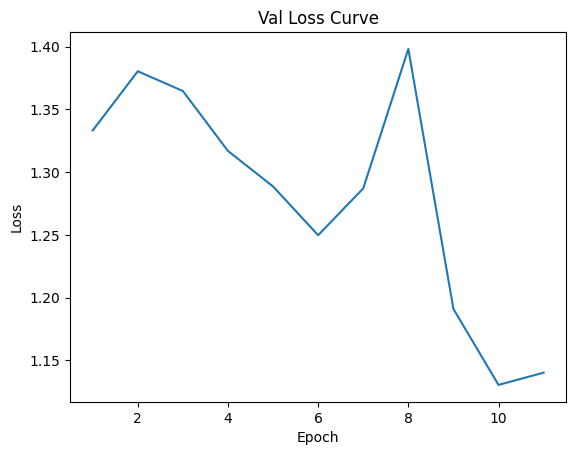

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11975607361931068


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 12/200*****
*****Train Loss:  0.964300 Val Loss:  1.159951*****
*****Validation Accuracy: 28.47%*****
*****Total Avg Disparity: 0.07878427153416402*****

Class Parade: Recall Difference = -0.007965282355526238
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.0625
Class Funeral: Recall Difference = 0.08860759493670887
Class Cheering: Recall Difference = 0.06296992481203008
Class Meeting: Recall Difference = -0.09615384615384609
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.02777777777777777
Class Concerts: Recall Difference = 0.03917050691244239
Class Couple: Recall Difference = 0.0746268656716418
Class Family_Group: Recall Difference = -0.04496747034060469
Class Picnic: Recall Difference = -0.003496503496503489
Class Soldier_Patrol: Recall Difference = -0.09934640522875804
Class Spa: Recall Difference = 0.13095238095238093
Class Sports_Fan: Recall Difference = 0.0
Class Su

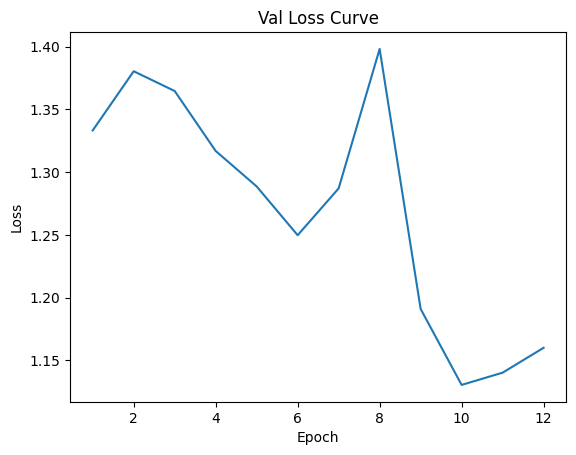

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.12016652581783441


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 13/200*****
*****Train Loss:  0.958046 Val Loss:  1.136800*****
*****Validation Accuracy: 31.25%*****
*****Total Avg Disparity: 0.09683192757371968*****

Class Parade: Recall Difference = 0.0049989013403647364
Class Handshaking: Recall Difference = 0.017857142857142856
Class Riot: Recall Difference = 0.09577999051683264
Class Dancing: Recall Difference = 0.09226190476190471
Class Funeral: Recall Difference = 0.15792646172393005
Class Cheering: Recall Difference = 0.045112781954887216
Class Meeting: Recall Difference = -0.06730769230769229
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.02568134171907757
Class Concerts: Recall Difference = -0.07450076804915509
Class Couple: Recall Difference = 0.10447761194029852
Class Family_Group: Recall Difference = -0.057979334098737095
Class Picnic: Recall Difference = 0.04312354312354311
Class Soldier_Patrol: Recall Difference = -0.0771241830065359
Class Spa: Recall Difference = 0.3392857142857142
Clas

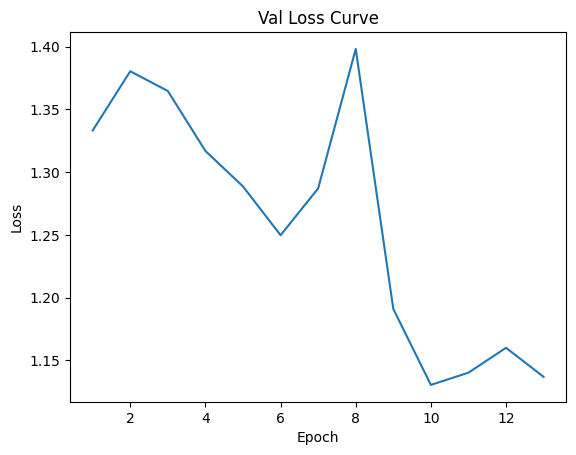

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.120548498745148


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 14/200*****
*****Train Loss:  0.945833 Val Loss:  1.149299*****
*****Validation Accuracy: 31.25%*****
*****Total Avg Disparity: 0.08123520557543015*****

Class Parade: Recall Difference = 0.07256646890793228
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.11332385016595542
Class Dancing: Recall Difference = 0.0684523809523809
Class Funeral: Recall Difference = -0.04520795660036167
Class Cheering: Recall Difference = 0.05357142857142857
Class Meeting: Recall Difference = 0.02596153846153859
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.011006289308176126
Class Concerts: Recall Difference = 0.21812596006144408
Class Couple: Recall Difference = 0.14925373134328362
Class Family_Group: Recall Difference = -0.004592422502870286
Class Picnic: Recall Difference = 0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.026143790849673165
Class Spa: Recall Difference = 0.2857142857142856
Class Sports_Fan: Recal

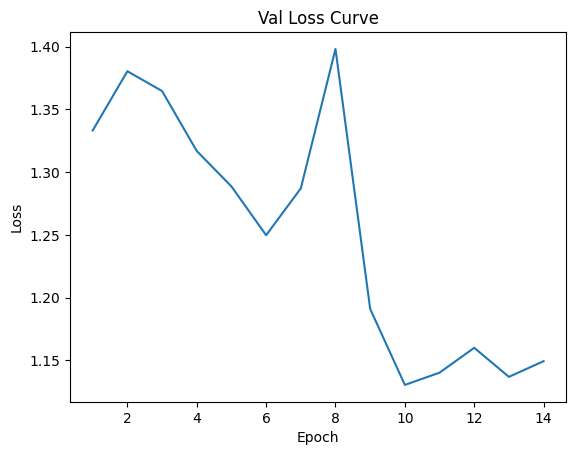

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11857925928556003


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 15/200*****
*****Train Loss:  0.932591 Val Loss:  1.082304*****
*****Validation Accuracy: 35.07%*****
*****Total Avg Disparity: 0.09578466146870852*****

Class Parade: Recall Difference = -0.13573939793451995
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.04978662873399717
Class Dancing: Recall Difference = -0.02083333333333337
Class Funeral: Recall Difference = 0.18927064496684748
Class Cheering: Recall Difference = 0.02725563909774438
Class Meeting: Recall Difference = 0.025000000000000078
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.01677148846960165
Class Concerts: Recall Difference = 0.00038402457757302777
Class Couple: Recall Difference = 0.2075983717774763
Class Family_Group: Recall Difference = -0.13509376195943365
Class Picnic: Recall Difference = -0.2237762237762238
Class Soldier_Patrol: Recall Difference = -0.024836601307189676
Class Spa: Recall Difference = 0.23809523809523797
Class Sports_Fan: R

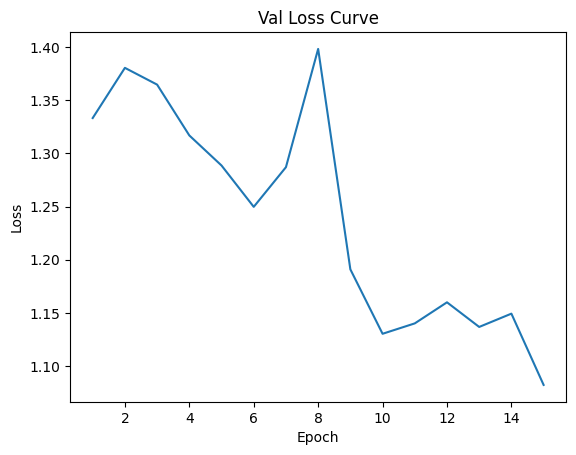

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11921467488774887


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 16/200*****
*****Train Loss:  0.922295 Val Loss:  1.085104*****
*****Validation Accuracy: 32.81%*****
*****Total Avg Disparity: 0.08389006329592916*****

Class Parade: Recall Difference = 0.04345198857393978
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.060692271218587016
Class Dancing: Recall Difference = -0.01488095238095237
Class Funeral: Recall Difference = 0.009041591320072345
Class Cheering: Recall Difference = 0.03571428571428571
Class Meeting: Recall Difference = 0.04326923076923081
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.054531490015361006
Class Couple: Recall Difference = 0.04206241519674361
Class Family_Group: Recall Difference = -0.04496747034060466
Class Picnic: Recall Difference = -0.041958041958042036
Class Soldier_Patrol: Recall Difference = -0.04379084967320268
Class Spa: Recall Difference = 0.2678571428571427
Class Sports_Fan: Recall Difference =

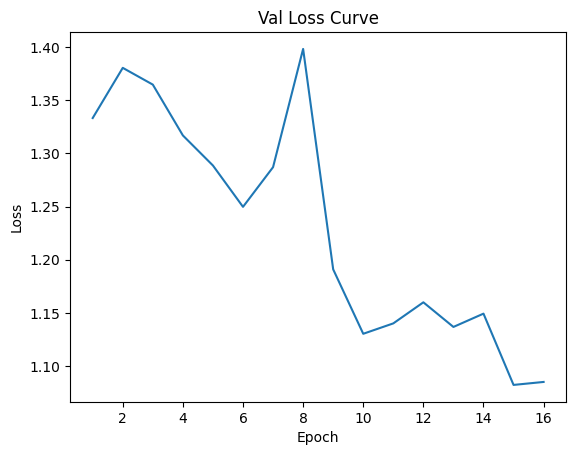

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11913838151555795


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 17/200*****
*****Train Loss:  0.903015 Val Loss:  1.055281*****
*****Validation Accuracy: 36.20%*****
*****Total Avg Disparity: 0.07450637630378328*****

Class Parade: Recall Difference = -0.06542518127883967
Class Handshaking: Recall Difference = 0.017857142857142856
Class Riot: Recall Difference = 0.017543859649122806
Class Dancing: Recall Difference = -0.04166666666666663
Class Funeral: Recall Difference = 0.06931886678722123
Class Cheering: Recall Difference = 0.05357142857142858
Class Meeting: Recall Difference = 0.009615384615384637
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.016771488469601664
Class Concerts: Recall Difference = 0.056451612903225895
Class Couple: Recall Difference = 0.07055630936227952
Class Family_Group: Recall Difference = -0.07941063911213161
Class Picnic: Recall Difference = -0.10023310023310023
Class Soldier_Patrol: Recall Difference = -0.09150326797385622
Class Spa: Recall Difference = 0.20833333333333331
C

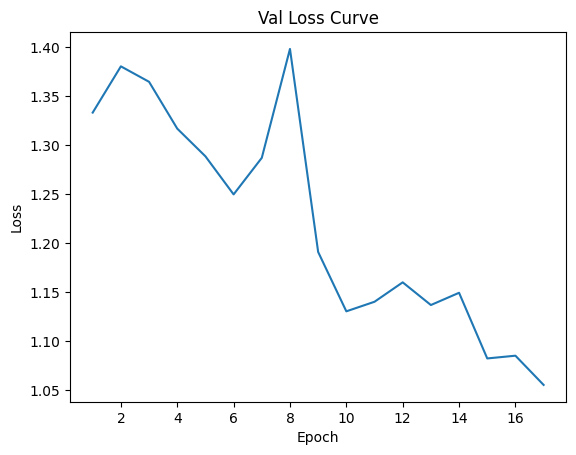

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11967371604763545


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 18/200*****
*****Train Loss:  0.893425 Val Loss:  1.048887*****
*****Validation Accuracy: 37.07%*****
*****Total Avg Disparity: 0.09656122646267151*****

Class Parade: Recall Difference = -0.08146561195341673
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.043148411569464196
Class Dancing: Recall Difference = 0.04464285714285715
Class Funeral: Recall Difference = 0.10066305003013859
Class Cheering: Recall Difference = 0.04511278195488723
Class Meeting: Recall Difference = 0.006730769230769207
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.04874213836477989
Class Concerts: Recall Difference = 0.11098310291858687
Class Couple: Recall Difference = 0.2075983717774763
Class Family_Group: Recall Difference = -0.15001913509376197
Class Picnic: Recall Difference = -0.06993006993006995
Class Soldier_Patrol: Recall Difference = 0.027450980392156876
Class Spa: Recall Difference = 0.23809523809523803
Class S

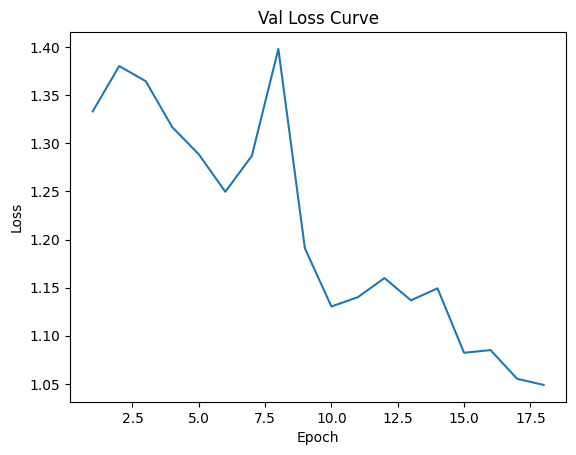

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11879918151176892


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 19/200*****
*****Train Loss:  0.889854 Val Loss:  1.025477*****
*****Validation Accuracy: 37.71%*****
*****Total Avg Disparity: 0.08201332396784845*****

Class Parade: Recall Difference = 0.033618984838497123
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.005215742057847306
Class Dancing: Recall Difference = 0.08035714285714288
Class Funeral: Recall Difference = 0.03134418324291739
Class Cheering: Recall Difference = 0.08082706766917294
Class Meeting: Recall Difference = 0.1961538461538462
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.04769392033542977
Class Concerts: Recall Difference = -0.0015360983102918196
Class Couple: Recall Difference = 0.17774762550881962
Class Family_Group: Recall Difference = -0.02162265595101419
Class Picnic: Recall Difference = -0.0885780885780886
Class Soldier_Patrol: Recall Difference = -0.09934640522875815
Class Spa: Recall Difference = 0.14880952380952372
Class Sports_Fan: Reca

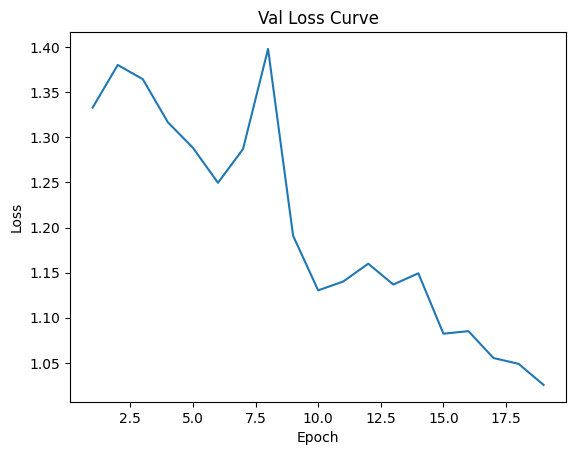

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11924161590062655


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 20/200*****
*****Train Loss:  0.869853 Val Loss:  1.001839*****
*****Validation Accuracy: 38.89%*****
*****Total Avg Disparity: 0.08531047096703395*****

Class Parade: Recall Difference = -0.07470885519666004
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.06069227121858703
Class Dancing: Recall Difference = 0.0625
Class Funeral: Recall Difference = 0.05304400241109103
Class Cheering: Recall Difference = 0.08082706766917294
Class Meeting: Recall Difference = 0.1817307692307692
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0031446540880503693
Class Concerts: Recall Difference = 0.0023041474654378336
Class Couple: Recall Difference = 0.13297150610583452
Class Family_Group: Recall Difference = -0.05376961347110598
Class Picnic: Recall Difference = 0.1445221445221445
Class Soldier_Patrol: Recall Difference = 0.12156862745098035
Class Spa: Recall Difference = 0.2678571428571427
Class Sports_Fan: Recall Difference = 

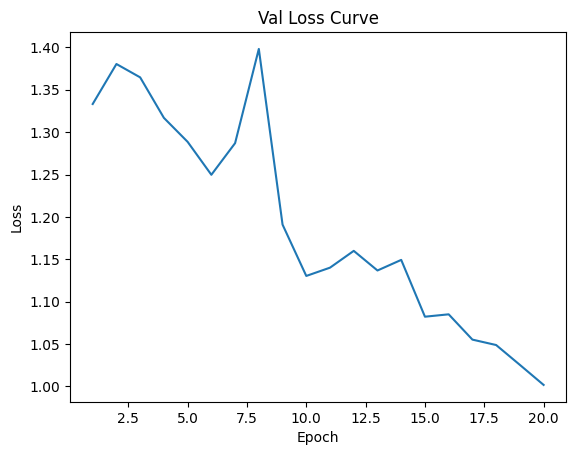

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11862377965679535


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 21/200*****
*****Train Loss:  0.862221 Val Loss:  1.059845*****
*****Validation Accuracy: 36.23%*****
*****Total Avg Disparity: 0.09867205220374048*****

Class Parade: Recall Difference = -0.07459898923313535
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.0862968231389284
Class Dancing: Recall Difference = -0.04166666666666663
Class Funeral: Recall Difference = 0.24593128390596736
Class Cheering: Recall Difference = -0.016917293233082713
Class Meeting: Recall Difference = 0.29134615384615387
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.028825995807127882
Class Concerts: Recall Difference = 0.09600614439324123
Class Couple: Recall Difference = 0.1628222523744912
Class Family_Group: Recall Difference = -0.01741293532338309
Class Picnic: Recall Difference = -0.06177156177156168
Class Soldier_Patrol: Recall Difference = 0.07712418300653595
Class Spa: Recall Difference = 0.1726190476190475
Class S

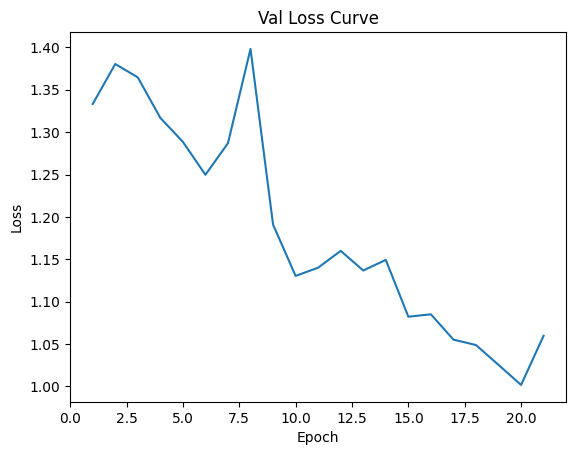

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11823198227928235


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 22/200*****
*****Train Loss:  0.852963 Val Loss:  0.998646*****
*****Validation Accuracy: 39.07%*****
*****Total Avg Disparity: 0.08247719664842831*****

Class Parade: Recall Difference = 0.026422764227642226
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.03366524419155999
Class Dancing: Recall Difference = -0.020833333333333315
Class Funeral: Recall Difference = 0.06931886678722125
Class Cheering: Recall Difference = 0.07236842105263161
Class Meeting: Recall Difference = 0.039423076923076894
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.04769392033542979
Class Concerts: Recall Difference = -0.0030721966205837226
Class Couple: Recall Difference = 0.07191316146540028
Class Family_Group: Recall Difference = -0.04745503252965938
Class Picnic: Recall Difference = 0.07575757575757575
Class Soldier_Patrol: Recall Difference = -0.029411764705882137
Class Spa: Recall Difference = 0.1428571428571428
Class Sports_Fan: R

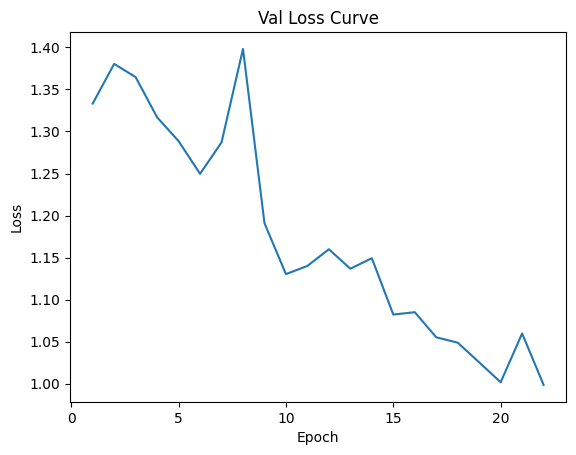

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.19s/it]


Average Adversary epoch loss: 0.11879984891185394


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 23/200*****
*****Train Loss:  0.835542 Val Loss:  1.161572*****
*****Validation Accuracy: 32.99%*****
*****Total Avg Disparity: 0.09068640946156495*****

Class Parade: Recall Difference = -0.030982201713909197
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.07823613086770981
Class Dancing: Recall Difference = 0.005952380952380973
Class Funeral: Recall Difference = 0.050632911392405056
Class Cheering: Recall Difference = 0.053571428571428575
Class Meeting: Recall Difference = 0.15288461538461542
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.008909853249475887
Class Concerts: Recall Difference = -0.0015360983102918474
Class Couple: Recall Difference = 0.19402985074626863
Class Family_Group: Recall Difference = 0.02123995407577496
Class Picnic: Recall Difference = 0.06759906759906753
Class Soldier_Patrol: Recall Difference = 0.180392156862745
Class Spa: Recall Difference = 0.06547619047619052
Class Sports_Fan: Re

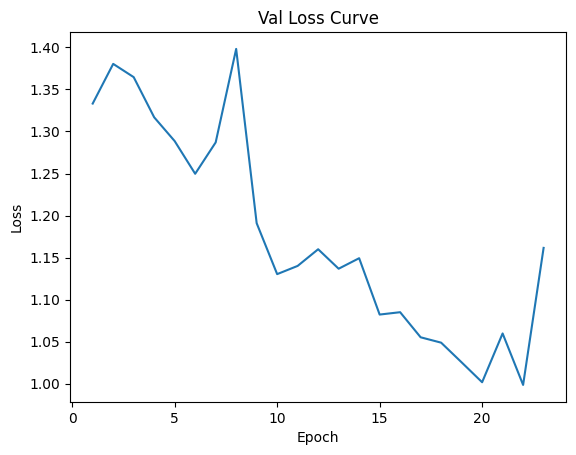

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12110358218734081


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 24/200*****
*****Train Loss:  0.826066 Val Loss:  0.923679*****
*****Validation Accuracy: 41.36%*****
*****Total Avg Disparity: 0.08629542472830722*****

Class Parade: Recall Difference = -0.07218193803559658
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = -0.058321479374110946
Class Dancing: Recall Difference = 0.014880952380952384
Class Funeral: Recall Difference = 0.2965641952983726
Class Cheering: Recall Difference = 0.05357142857142857
Class Meeting: Recall Difference = 0.05288461538461531
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.013102725366876372
Class Concerts: Recall Difference = -0.003072196620583667
Class Couple: Recall Difference = 0.14654002713704214
Class Family_Group: Recall Difference = -0.07500956754688098
Class Picnic: Recall Difference = -0.0699300699300699
Class Soldier_Patrol: Recall Difference = 0.14836601307189556
Class Spa: Recall Difference = 0.17261904761904762
Class

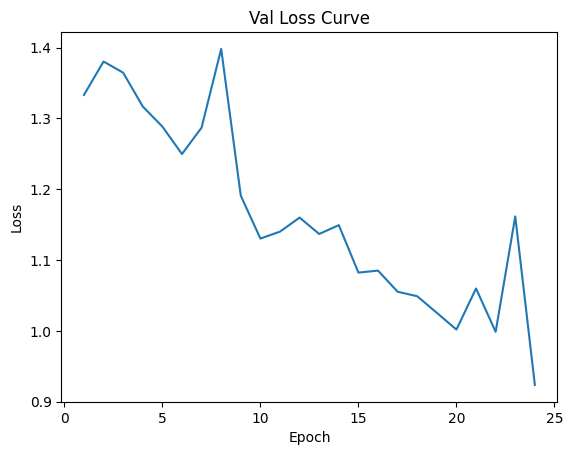

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.12032768416863221


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 25/200*****
*****Train Loss:  0.812484 Val Loss:  0.907222*****
*****Validation Accuracy: 44.34%*****
*****Total Avg Disparity: 0.08799091563918561*****

Class Parade: Recall Difference = -0.015710832784003426
Class Handshaking: Recall Difference = 0.0892857142857143
Class Riot: Recall Difference = -0.0393551446183025
Class Dancing: Recall Difference = 0.06250000000000006
Class Funeral: Recall Difference = 0.23990355635925256
Class Cheering: Recall Difference = 0.03759398496240604
Class Meeting: Recall Difference = -0.05576923076923068
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.09905660377358491
Class Concerts: Recall Difference = 0.11443932411674346
Class Couple: Recall Difference = 0.19267299864314794
Class Family_Group: Recall Difference = -0.10103329506314579
Class Picnic: Recall Difference = 0.006993006993007034
Class Soldier_Patrol: Recall Difference = 0.05294117647058838
Class Spa: Recall Difference = -0.11904761904761907
Class 

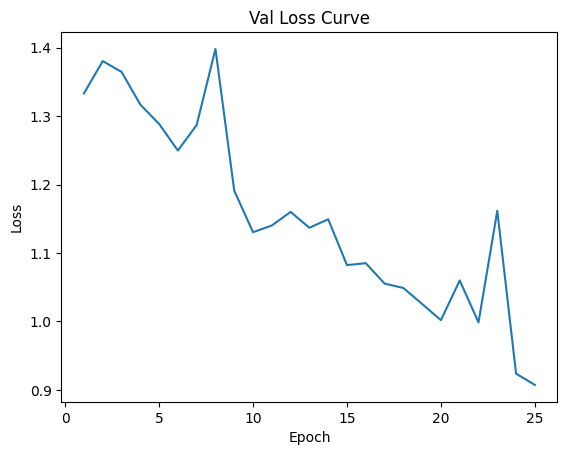

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11849273168123685


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 26/200*****
*****Train Loss:  0.807101 Val Loss:  1.112949*****
*****Validation Accuracy: 35.79%*****
*****Total Avg Disparity: 0.07254677521674087*****

Class Parade: Recall Difference = -0.03076246978686009
Class Handshaking: Recall Difference = 0.03571428571428572
Class Riot: Recall Difference = 0.024182076813655765
Class Dancing: Recall Difference = 0.023809523809523822
Class Funeral: Recall Difference = 0.04400241109101871
Class Cheering: Recall Difference = 0.03571428571428572
Class Meeting: Recall Difference = 0.028846153846153882
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.027777777777777776
Class Concerts: Recall Difference = -0.08486943164362518
Class Couple: Recall Difference = 0.14789687924016282
Class Family_Group: Recall Difference = 0.006314580941446608
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = -0.10130718954248363
Class Spa: Recall Difference = 0.05952380952380951
Cl

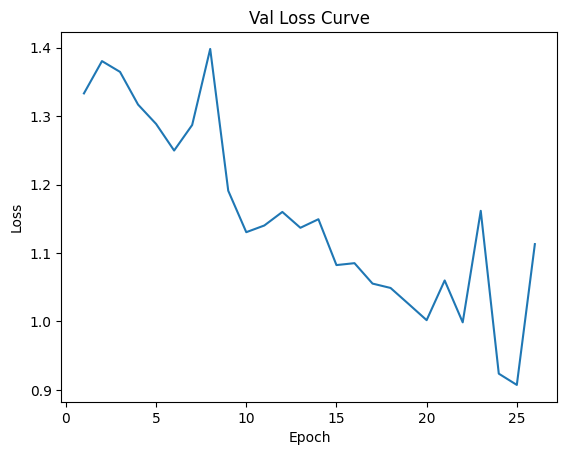

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.12062598478335601


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 27/200*****
*****Train Loss:  0.801156 Val Loss:  0.923211*****
*****Validation Accuracy: 42.22%*****
*****Total Avg Disparity: 0.07781315549342656*****

Class Parade: Recall Difference = -0.0170841573280599
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.10526315789473685
Class Dancing: Recall Difference = -0.008928571428571425
Class Funeral: Recall Difference = 0.05967450271247737
Class Cheering: Recall Difference = 0.045112781954887216
Class Meeting: Recall Difference = 0.1048076923076923
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.019916142557651992
Class Concerts: Recall Difference = -0.06067588325652834
Class Couple: Recall Difference = 0.0583446404341927
Class Family_Group: Recall Difference = -0.04936854190585532
Class Picnic: Recall Difference = -0.041958041958041925
Class Soldier_Patrol: Recall Difference = 0.048366013071895364
Class Spa: Recall Difference = -0.11309523809523817
Class Sports_Fan: Re

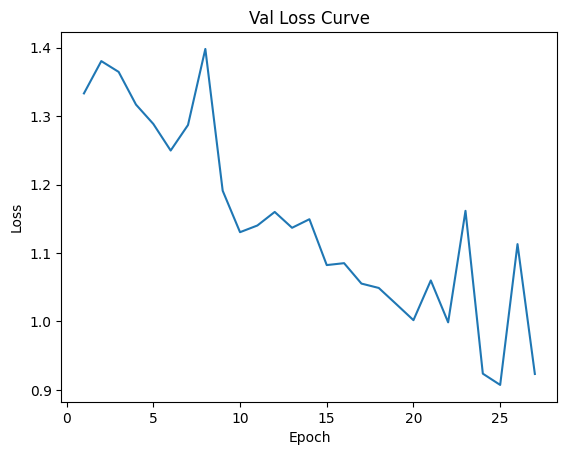

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11877842877919857


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 28/200*****
*****Train Loss:  0.790543 Val Loss:  0.917196*****
*****Validation Accuracy: 42.89%*****
*****Total Avg Disparity: 0.0899050882651285*****

Class Parade: Recall Difference = 0.01257965282355511
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.07539118065433856
Class Dancing: Recall Difference = 0.047619047619047644
Class Funeral: Recall Difference = 0.01808318264014469
Class Cheering: Recall Difference = 0.010338345864661647
Class Meeting: Recall Difference = 0.19519230769230783
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.04979035639412996
Class Concerts: Recall Difference = 0.10099846390168982
Class Couple: Recall Difference = 0.11668928086838534
Class Family_Group: Recall Difference = -0.07558362035973981
Class Picnic: Recall Difference = 0.12237762237762245
Class Soldier_Patrol: Recall Difference = -0.022875816993464082
Class Spa: Recall Difference = 0.3095238095238094
Class Spo

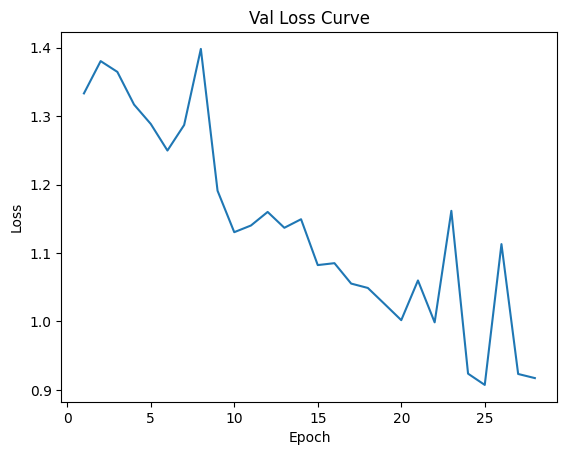

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11765898821445611


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 29/200*****
*****Train Loss:  0.773936 Val Loss:  1.051262*****
*****Validation Accuracy: 37.68%*****
*****Total Avg Disparity: 0.08848424786493636*****

Class Parade: Recall Difference = 0.0008789277081960867
Class Handshaking: Recall Difference = 0.07142857142857141
Class Riot: Recall Difference = 0.03508771929824561
Class Dancing: Recall Difference = 0.026785714285714288
Class Funeral: Recall Difference = 0.12959614225437013
Class Cheering: Recall Difference = -0.02631578947368421
Class Meeting: Recall Difference = -0.11538461538461542
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.06656184486373165
Class Concerts: Recall Difference = 0.06989247311827956
Class Couple: Recall Difference = 0.1166892808683854
Class Family_Group: Recall Difference = -0.10926138538078839
Class Picnic: Recall Difference = -0.12237762237762234
Class Soldier_Patrol: Recall Difference = -0.06274509803921569
Class Spa: Recall Difference = 0.005952380952380931
Clas

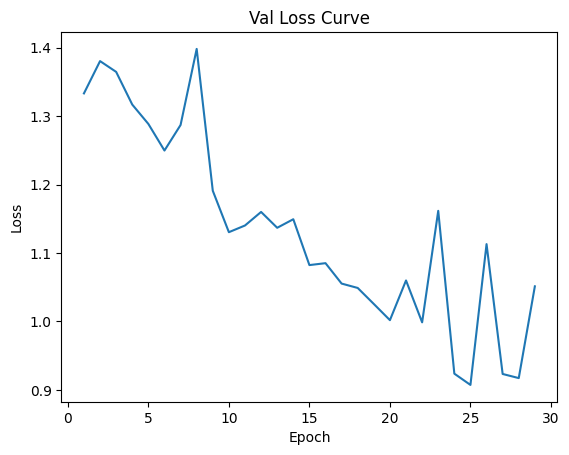

Data has been appended to validation_0.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11871004333862892


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 30/200*****
*****Train Loss:  0.770617 Val Loss:  0.932754*****
*****Validation Accuracy: 41.64%*****
*****Total Avg Disparity: 0.10205175356989576*****

Class Parade: Recall Difference = -0.07663150955833886
Class Handshaking: Recall Difference = -0.03571428571428569
Class Riot: Recall Difference = -0.008534850640113834
Class Dancing: Recall Difference = 0.23809523809523814
Class Funeral: Recall Difference = 0.20433996383363479
Class Cheering: Recall Difference = 0.05357142857142857
Class Meeting: Recall Difference = 0.16346153846153855
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.062368972746331214
Class Concerts: Recall Difference = 0.03648233486943153
Class Couple: Recall Difference = -0.017639077340569825
Class Family_Group: Recall Difference = -0.12208189820130122
Class Picnic: Recall Difference = -0.14452214452214462
Class Soldier_Patrol: Recall Difference = 0.03856209150326795
Class Spa: Recall Difference = 0.16071428571428573
Cl

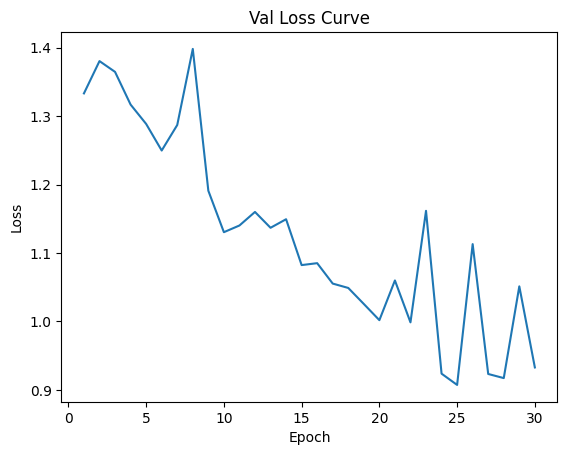

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.1202455277626331


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 31/200*****
*****Train Loss:  0.725251 Val Loss:  0.750859*****
*****Validation Accuracy: 53.08%*****
*****Total Avg Disparity: 0.10349241102192962*****

Class Parade: Recall Difference = -0.030597670841573388
Class Handshaking: Recall Difference = 0.07142857142857144
Class Riot: Recall Difference = 0.16026552868658128
Class Dancing: Recall Difference = 0.04166666666666671
Class Funeral: Recall Difference = 0.16998191681735986
Class Cheering: Recall Difference = -0.024436090225563936
Class Meeting: Recall Difference = 0.20769230769230784
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.04192872117400426
Class Concerts: Recall Difference = 0.08218125960061445
Class Couple: Recall Difference = 0.32700135685210313
Class Family_Group: Recall Difference = -0.11174894756984305
Class Picnic: Recall Difference = -0.07575757575757575
Class Soldier_Patrol: Recall Difference = -0.009150326797385588
Class Spa: Recall Difference = 0.14880952380952395
Clas

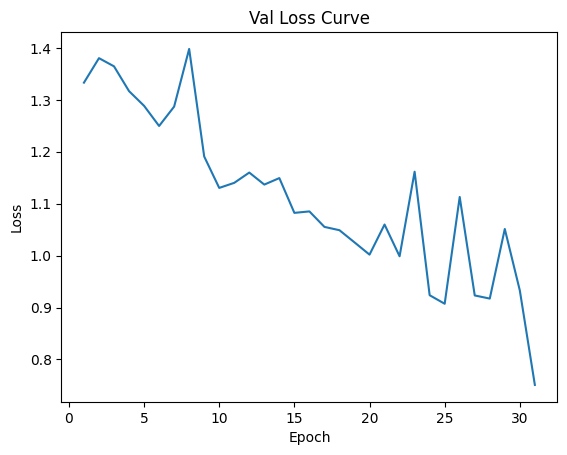

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11813698880947553


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 32/200*****
*****Train Loss:  0.701316 Val Loss:  0.730124*****
*****Validation Accuracy: 55.05%*****
*****Total Avg Disparity: 0.09419452916351517*****

Class Parade: Recall Difference = 0.00856954515491093
Class Handshaking: Recall Difference = 0.07142857142857142
Class Riot: Recall Difference = 0.09672830725462306
Class Dancing: Recall Difference = 0.03571428571428564
Class Funeral: Recall Difference = 0.2079566003616638
Class Cheering: Recall Difference = 0.06484962406015041
Class Meeting: Recall Difference = 0.03653846153846163
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.013626834381551323
Class Concerts: Recall Difference = -0.055299539170506895
Class Couple: Recall Difference = 0.22116689280868398
Class Family_Group: Recall Difference = -0.1031381553769613
Class Picnic: Recall Difference = -0.10606060606060597
Class Soldier_Patrol: Recall Difference = -0.056862745098039125
Class Spa: Recall Difference = 0.12499999999999978
Class 

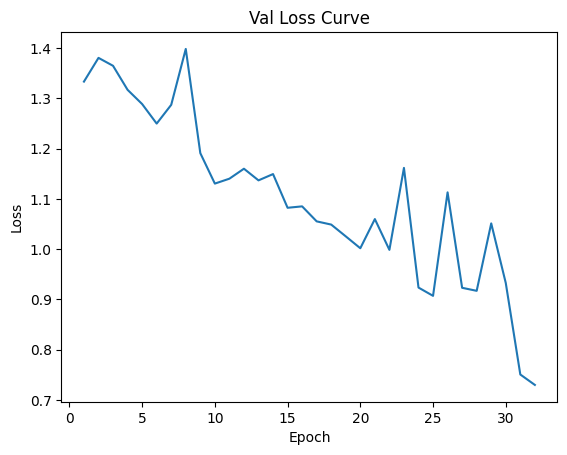

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11654694980153671


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 33/200*****
*****Train Loss:  0.699266 Val Loss:  0.727011*****
*****Validation Accuracy: 55.14%*****
*****Total Avg Disparity: 0.09448138391755222*****

Class Parade: Recall Difference = -0.0009338606899582658
Class Handshaking: Recall Difference = 0.0892857142857143
Class Riot: Recall Difference = 0.08724513987671872
Class Dancing: Recall Difference = 0.0029761904761904934
Class Funeral: Recall Difference = 0.19529837251356258
Class Cheering: Recall Difference = -0.005639097744360916
Class Meeting: Recall Difference = 0.11442307692307685
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.013626834381551323
Class Concerts: Recall Difference = -0.0026881720430105838
Class Couple: Recall Difference = 0.14518317503392142
Class Family_Group: Recall Difference = -0.0583620359739761
Class Picnic: Recall Difference = -0.06759906759906753
Class Soldier_Patrol: Recall Difference = -0.03464052287581698
Class Spa: Recall Difference = 0.2738095238095237


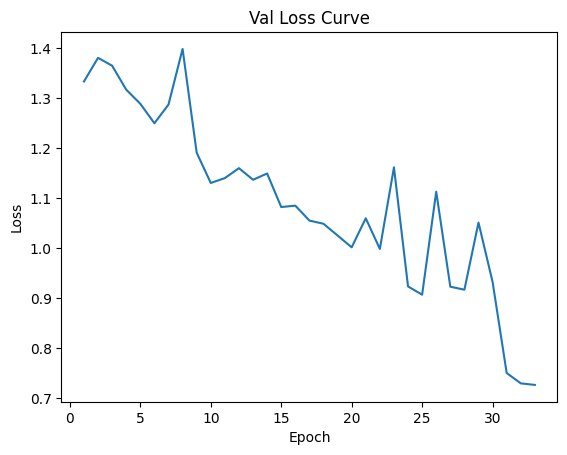

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11655311114512958


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 34/200*****
*****Train Loss:  0.694166 Val Loss:  0.725807*****
*****Validation Accuracy: 55.02%*****
*****Total Avg Disparity: 0.09865822314612974*****

Class Parade: Recall Difference = -0.0009338606899582658
Class Handshaking: Recall Difference = 0.10714285714285716
Class Riot: Recall Difference = 0.0981507823613087
Class Dancing: Recall Difference = 0.05357142857142855
Class Funeral: Recall Difference = 0.17299578059071735
Class Cheering: Recall Difference = 0.003759398496240629
Class Meeting: Recall Difference = 0.11442307692307696
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03301886792452835
Class Concerts: Recall Difference = 0.06528417818740412
Class Couple: Recall Difference = 0.1614654002713705
Class Family_Group: Recall Difference = -0.10524301569077682
Class Picnic: Recall Difference = -0.10606060606060608
Class Soldier_Patrol: Recall Difference = 0.07516339869281052
Class Spa: Recall Difference = 0.1785714285714285
Class Spo

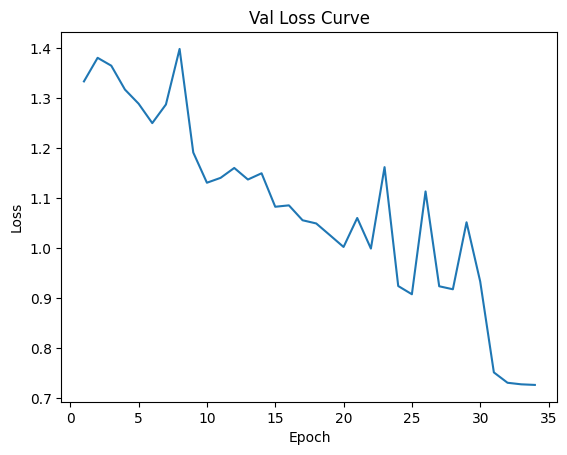

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11713430858575381


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 35/200*****
*****Train Loss:  0.684960 Val Loss:  0.722092*****
*****Validation Accuracy: 55.43%*****
*****Total Avg Disparity: 0.10045285284359595*****

Class Parade: Recall Difference = -0.01307404965941561
Class Handshaking: Recall Difference = 0.0892857142857143
Class Riot: Recall Difference = 0.08866761498340436
Class Dancing: Recall Difference = 0.03869047619047611
Class Funeral: Recall Difference = 0.16033755274261619
Class Cheering: Recall Difference = 0.0028195488721804995
Class Meeting: Recall Difference = 0.11346153846153861
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0885744234800839
Class Concerts: Recall Difference = 0.024577572964669725
Class Couple: Recall Difference = 0.17639077340569884
Class Family_Group: Recall Difference = -0.1651358591657099
Class Picnic: Recall Difference = -0.05944055944055937
Class Soldier_Patrol: Recall Difference = -0.03464052287581698
Class Spa: Recall Difference = 0.1071428571428571
Class Spo

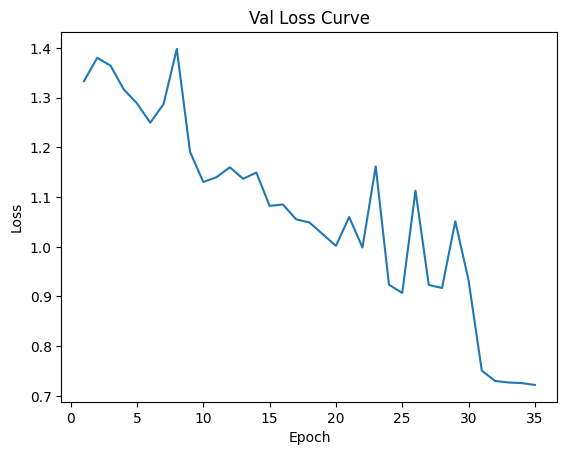

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.1168244002530208


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 36/200*****
*****Train Loss:  0.685805 Val Loss:  0.712085*****
*****Validation Accuracy: 56.04%*****
*****Total Avg Disparity: 0.10243774384067776*****

Class Parade: Recall Difference = -0.02807075368050993
Class Handshaking: Recall Difference = 0.08928571428571432
Class Riot: Recall Difference = 0.13181602655286867
Class Dancing: Recall Difference = 0.05357142857142855
Class Funeral: Recall Difference = 0.14767932489451485
Class Cheering: Recall Difference = 0.03007518796992481
Class Meeting: Recall Difference = 0.1298076923076924
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.06027253668763102
Class Concerts: Recall Difference = -0.016129032258064502
Class Couple: Recall Difference = 0.2822252374491181
Class Family_Group: Recall Difference = -0.09031764255644859
Class Picnic: Recall Difference = -0.1363636363636363
Class Soldier_Patrol: Recall Difference = -0.009150326797385588
Class Spa: Recall Difference = 0.22619047619047605
Class S

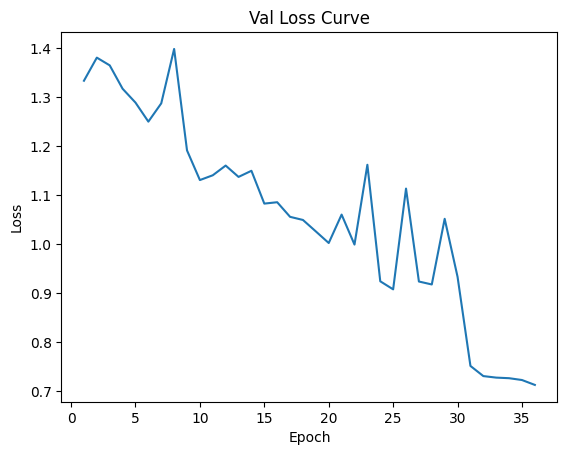

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11680657645830742


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 37/200*****
*****Train Loss:  0.676580 Val Loss:  0.716572*****
*****Validation Accuracy: 54.53%*****
*****Total Avg Disparity: 0.10264209776917976*****

Class Parade: Recall Difference = 0.026093166337068707
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.06448553816974872
Class Dancing: Recall Difference = 0.038690476190476164
Class Funeral: Recall Difference = 0.20494273658830636
Class Cheering: Recall Difference = 0.12593984962406016
Class Meeting: Recall Difference = 0.03749999999999998
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.023060796645702375
Class Concerts: Recall Difference = 0.13325652841781876
Class Couple: Recall Difference = 0.20624151967435553
Class Family_Group: Recall Difference = -0.10103329506314579
Class Picnic: Recall Difference = -0.09790209790209792
Class Soldier_Patrol: Recall Difference = 0.027450980392156876
Class Spa: Recall Difference = 0.22619047619047605
Class

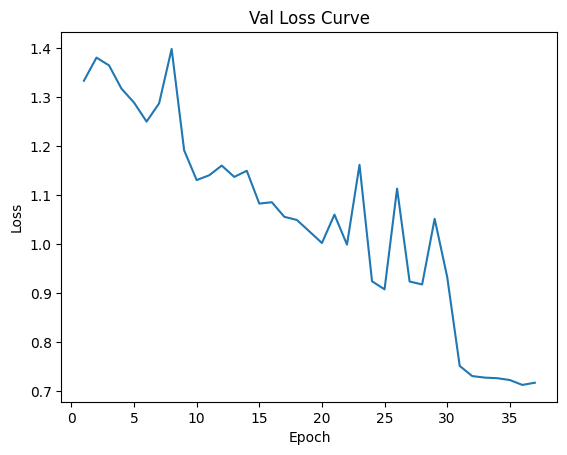

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11644328586184062


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 38/200*****
*****Train Loss:  0.679615 Val Loss:  0.703302*****
*****Validation Accuracy: 55.23%*****
*****Total Avg Disparity: 0.1047494181929108*****

Class Parade: Recall Difference = -0.05361459019995607
Class Handshaking: Recall Difference = 0.0892857142857143
Class Riot: Recall Difference = 0.025130393551446195
Class Dancing: Recall Difference = 0.06250000000000003
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.04699248120300756
Class Meeting: Recall Difference = 0.253846153846154
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.03197064989517823
Class Concerts: Recall Difference = -0.07910906298003062
Class Couple: Recall Difference = 0.22116689280868387
Class Family_Group: Recall Difference = -0.14580941446613085
Class Picnic: Recall Difference = -0.05944055944055948
Class Soldier_Patrol: Recall Difference = -0.09346405228758181
Class Spa: Recall Difference = 0.249999999999

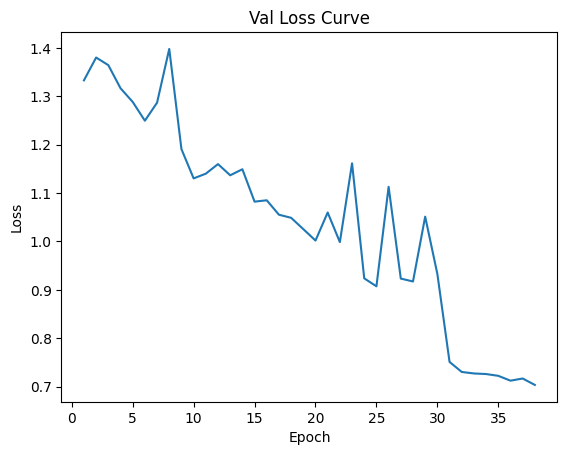

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11639111660994016


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 39/200*****
*****Train Loss:  0.678973 Val Loss:  0.698919*****
*****Validation Accuracy: 55.63%*****
*****Total Avg Disparity: 0.09987344118561504*****

Class Parade: Recall Difference = 0.007086354647330206
Class Handshaking: Recall Difference = 0.07142857142857142
Class Riot: Recall Difference = 0.1332385016595542
Class Dancing: Recall Difference = 0.0267857142857143
Class Funeral: Recall Difference = 0.13803496081977096
Class Cheering: Recall Difference = 0.0469924812030075
Class Meeting: Recall Difference = 0.09903846153846163
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.004716981132075415
Class Concerts: Recall Difference = -0.03149001536098295
Class Couple: Recall Difference = 0.19131614654002718
Class Family_Group: Recall Difference = -0.13298890164561805
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.10457516339869277
Class Spa: Recall Difference = 0.297619047

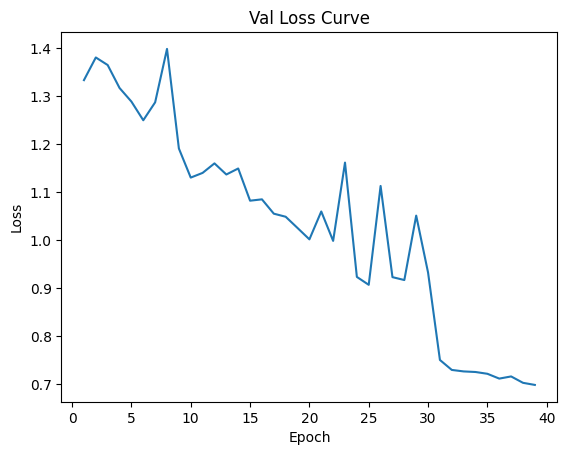

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:54<00:00,  4.41s/it]


Average Adversary epoch loss: 0.11675560760956544


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 40/200*****
*****Train Loss:  0.668636 Val Loss:  0.698348*****
*****Validation Accuracy: 57.23%*****
*****Total Avg Disparity: 0.09895685913208047*****

Class Parade: Recall Difference = -0.029444078224566184
Class Handshaking: Recall Difference = 0.10714285714285716
Class Riot: Recall Difference = 0.04267425320056889
Class Dancing: Recall Difference = 0.09226190476190471
Class Funeral: Recall Difference = 0.16335141651597362
Class Cheering: Recall Difference = 0.046992481203007586
Class Meeting: Recall Difference = 0.14519230769230784
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.04140461215932911
Class Concerts: Recall Difference = 0.02803379416282653
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.15231534634519722
Class Picnic: Recall Difference = -0.05944055944055937
Class Soldier_Patrol: Recall Difference = -0.04575163398692805
Class Spa: Recall Difference = 0.2738095238095237
Class 

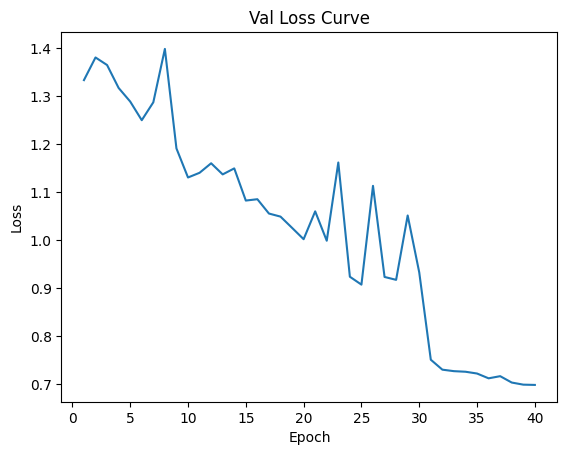

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.37s/it]


Average Adversary epoch loss: 0.11615780225166908


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 41/200*****
*****Train Loss:  0.672493 Val Loss:  0.686598*****
*****Validation Accuracy: 56.82%*****
*****Total Avg Disparity: 0.08688901683567027*****

Class Parade: Recall Difference = 0.003076246978685915
Class Handshaking: Recall Difference = 0.0892857142857143
Class Riot: Recall Difference = 0.07918444760550025
Class Dancing: Recall Difference = 0.08035714285714285
Class Funeral: Recall Difference = 0.18565400843881869
Class Cheering: Recall Difference = -0.00563909774436086
Class Meeting: Recall Difference = 0.09807692307692317
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.022536687631027286
Class Concerts: Recall Difference = -0.04685099846390156
Class Couple: Recall Difference = 0.22116689280868393
Class Family_Group: Recall Difference = -0.1266743207041714
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.07124183006535934
Class Spa: Recall Difference = 0.22619047619047605
Class S

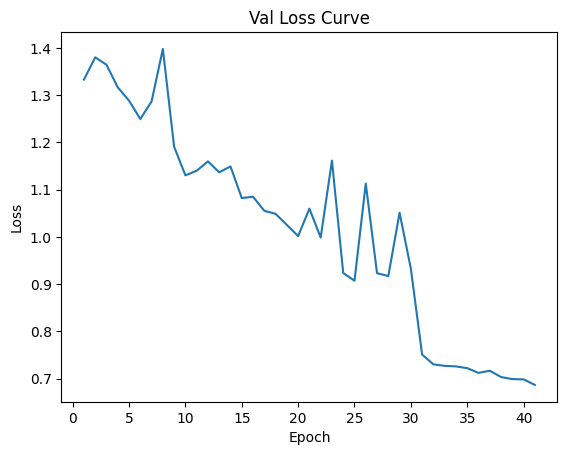

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11599864208927521


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 42/200*****
*****Train Loss:  0.664480 Val Loss:  0.691105*****
*****Validation Accuracy: 56.15%*****
*****Total Avg Disparity: 0.09637082505507343*****

Class Parade: Recall Difference = 0.015216435948143259
Class Handshaking: Recall Difference = 0.08928571428571429
Class Riot: Recall Difference = 0.05357989568515881
Class Dancing: Recall Difference = 0.02083333333333337
Class Funeral: Recall Difference = 0.16033755274261607
Class Cheering: Recall Difference = 0.10056390977443608
Class Meeting: Recall Difference = 0.0211538461538463
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03301886792452835
Class Concerts: Recall Difference = 0.056835637480798895
Class Couple: Recall Difference = 0.20624151967435558
Class Family_Group: Recall Difference = -0.13088404133180254
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = 0.03856209150326806
Class Spa: Recall Difference = 0.3452380952380952
Class Spo

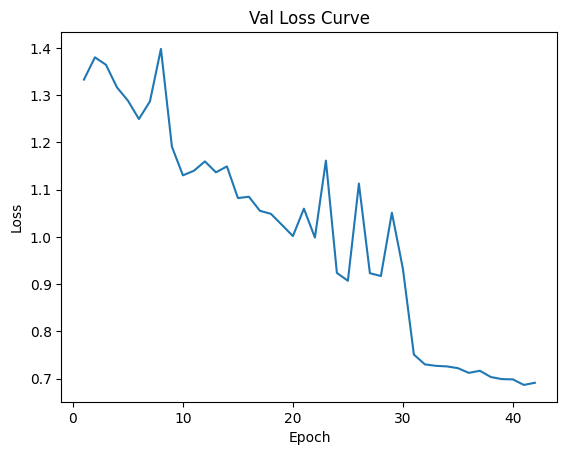

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11596532223316339


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


*****Epoch 43/200*****
*****Train Loss:  0.662656 Val Loss:  0.679868*****
*****Validation Accuracy: 57.20%*****
*****Total Avg Disparity: 0.08284261876659234*****

Class Parade: Recall Difference = -0.018567347835640513
Class Handshaking: Recall Difference = 0.10714285714285715
Class Riot: Recall Difference = 0.06164058795637739
Class Dancing: Recall Difference = 0.04761904761904767
Class Funeral: Recall Difference = 0.08438818565400857
Class Cheering: Recall Difference = 0.0742481203007519
Class Meeting: Recall Difference = 0.19134615384615372
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.024109014675052443
Class Concerts: Recall Difference = 0.02457757296466978
Class Couple: Recall Difference = 0.17639077340569884
Class Family_Group: Recall Difference = -0.09892843474933016
Class Picnic: Recall Difference = -0.029137529137529095
Class Soldier_Patrol: Recall Difference = -0.03464052287581698
Class Spa: Recall Difference = 0.10714285

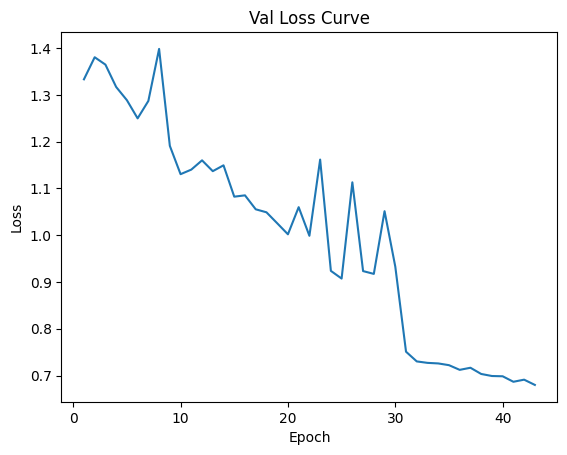

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11643145519953507


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 44/200*****
*****Train Loss:  0.665198 Val Loss:  0.672056*****
*****Validation Accuracy: 57.89%*****
*****Total Avg Disparity: 0.10115707369475621*****

Class Parade: Recall Difference = -0.003680509778070884
Class Handshaking: Recall Difference = 0.10714285714285714
Class Riot: Recall Difference = 0.050734945471787474
Class Dancing: Recall Difference = 0.12202380952380953
Class Funeral: Recall Difference = 0.18565400843881857
Class Cheering: Recall Difference = 0.030075187969924783
Class Meeting: Recall Difference = 0.19134615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03301886792452835
Class Concerts: Recall Difference = -0.06374807987711206
Class Couple: Recall Difference = 0.19131614654002715
Class Family_Group: Recall Difference = -0.09892843474933022
Class Picnic: Recall Difference = -0.06759906759906753
Class Soldier_Patrol: Recall Difference = -0.10457516339869266
Class Spa: Recall Difference = 0.15476190476190455
Clas

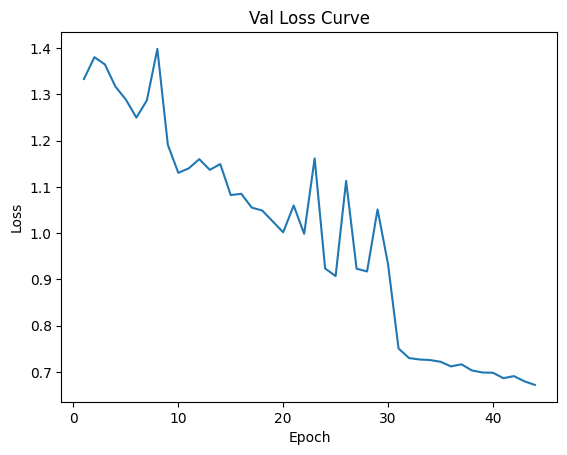

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.1151751340008699


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 45/200*****
*****Train Loss:  0.660667 Val Loss:  0.675685*****
*****Validation Accuracy: 57.05%*****
*****Total Avg Disparity: 0.09703346264756532*****

Class Parade: Recall Difference = -0.02807075368050982
Class Handshaking: Recall Difference = 0.0892857142857143
Class Riot: Recall Difference = 0.1427216690374586
Class Dancing: Recall Difference = 0.0714285714285714
Class Funeral: Recall Difference = 0.16033755274261619
Class Cheering: Recall Difference = 0.09116541353383463
Class Meeting: Recall Difference = 0.2076923076923078
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.014150943396226467
Class Concerts: Recall Difference = -0.011136712749615862
Class Couple: Recall Difference = 0.175033921302578
Class Family_Group: Recall Difference = -0.20130118637581326
Class Picnic: Recall Difference = -0.05944055944055937
Class Soldier_Patrol: Recall Difference = 0.027450980392156987
Class Spa: Recall Difference = 0.0297619047619

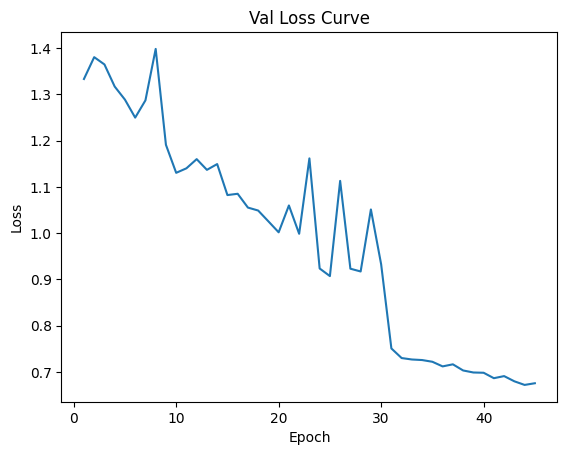

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.1161005339370324


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 46/200*****
*****Train Loss:  0.655496 Val Loss:  0.667604*****
*****Validation Accuracy: 57.43%*****
*****Total Avg Disparity: 0.09039490824923745*****

Class Parade: Recall Difference = -0.02131399692375302
Class Handshaking: Recall Difference = 0.07142857142857144
Class Riot: Recall Difference = 0.08866761498340442
Class Dancing: Recall Difference = 0.1339285714285714
Class Funeral: Recall Difference = 0.1633514165159735
Class Cheering: Recall Difference = 0.07330827067669175
Class Meeting: Recall Difference = 0.11346153846153861
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.03249475890985323
Class Concerts: Recall Difference = 0.04838709677419373
Class Couple: Recall Difference = 0.1763907734056989
Class Family_Group: Recall Difference = -0.12877918101798702
Class Picnic: Recall Difference = -0.06759906759906753
Class Soldier_Patrol: Recall Difference = -0.08235294117647052
Class Spa: Recall Difference = 0.05357142857142827
Class Spor

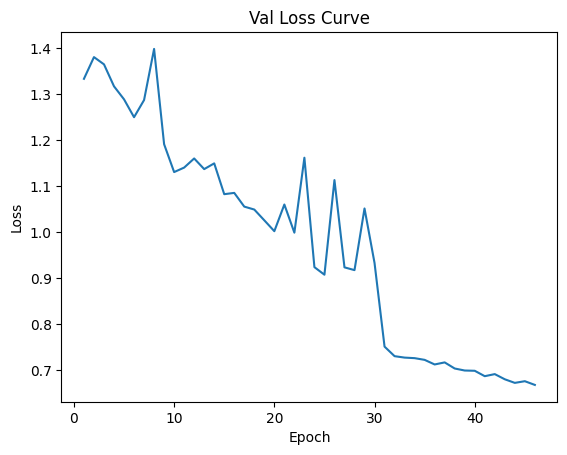

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.1159472379546899


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 47/200*****
*****Train Loss:  0.659141 Val Loss:  0.670437*****
*****Validation Accuracy: 57.92%*****
*****Total Avg Disparity: 0.09545870937829373*****

Class Parade: Recall Difference = -0.030817402768622437
Class Handshaking: Recall Difference = 0.0892857142857143
Class Riot: Recall Difference = 0.00616405879563775
Class Dancing: Recall Difference = 0.0952380952380952
Class Funeral: Recall Difference = 0.17600964436407485
Class Cheering: Recall Difference = 0.012218045112781989
Class Meeting: Recall Difference = 0.11442307692307696
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.014150943396226467
Class Concerts: Recall Difference = -0.031490015360983004
Class Couple: Recall Difference = 0.22116689280868393
Class Family_Group: Recall Difference = -0.11385380788365862
Class Picnic: Recall Difference = -0.05944055944055937
Class Soldier_Patrol: Recall Difference = -0.0823529411764704
Class Spa: Recall Difference = 0.1250000000000001
Class S

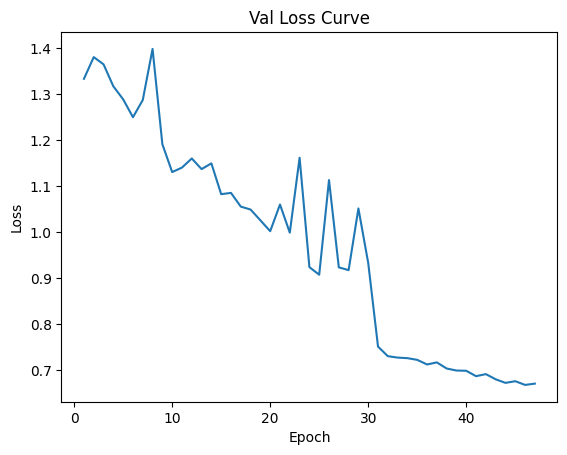

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11479509363953884


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 48/200*****
*****Train Loss:  0.652225 Val Loss:  0.665566*****
*****Validation Accuracy: 57.49%*****
*****Total Avg Disparity: 0.09192027792868131*****

Class Parade: Recall Difference = -0.03883761810591091
Class Handshaking: Recall Difference = 0.07142857142857142
Class Riot: Recall Difference = 0.04409672830725464
Class Dancing: Recall Difference = 0.06547619047619047
Class Funeral: Recall Difference = 0.19831223628691985
Class Cheering: Recall Difference = 0.011278195488721776
Class Meeting: Recall Difference = 0.23750000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07075471698113212
Class Concerts: Recall Difference = -0.01612903225806439
Class Couple: Recall Difference = 0.22116689280868385
Class Family_Group: Recall Difference = -0.12016838882510536
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.056862745098039125
Class Spa: Recall Difference = -0.02380

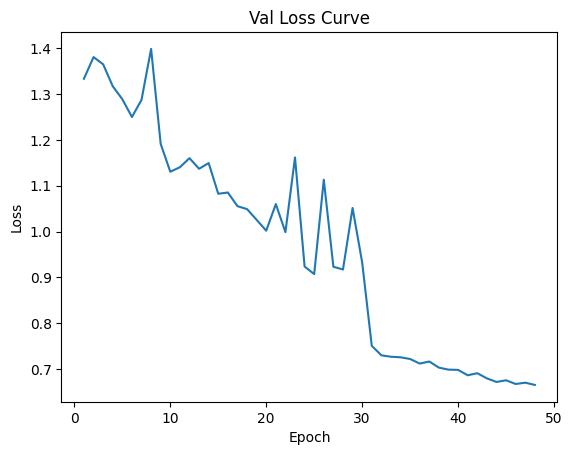

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1156299518278012


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 49/200*****
*****Train Loss:  0.646389 Val Loss:  0.658616*****
*****Validation Accuracy: 59.19%*****
*****Total Avg Disparity: 0.10281945660768575*****

Class Parade: Recall Difference = -0.005053834322127138
Class Handshaking: Recall Difference = 0.08928571428571429
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.10416666666666663
Class Funeral: Recall Difference = 0.13502109704641363
Class Cheering: Recall Difference = 0.06484962406015035
Class Meeting: Recall Difference = 0.15961538461538483
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.06970649895178202
Class Concerts: Recall Difference = -0.007680491551459223
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.13318025258323757
Class Picnic: Recall Difference = -0.07575757575757575
Class Soldier_Patrol: Recall Difference = -0.0823529411764704
Class Spa: Recall Difference = 0.24999999

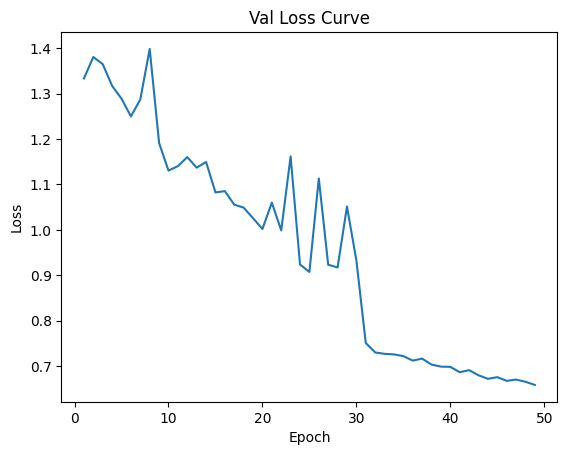

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.11553079921465653


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 50/200*****
*****Train Loss:  0.645904 Val Loss:  0.654008*****
*****Validation Accuracy: 58.07%*****
*****Total Avg Disparity: 0.09716350598017717*****

Class Parade: Recall Difference = -0.034937376400790976
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.07918444760550014
Class Dancing: Recall Difference = 0.1875
Class Funeral: Recall Difference = 0.16033755274261607
Class Cheering: Recall Difference = 0.039473684210526355
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.04245283018867918
Class Concerts: Recall Difference = 0.01612903225806467
Class Couple: Recall Difference = 0.17639077340569884
Class Family_Group: Recall Difference = -0.08610792192881739
Class Picnic: Recall Difference = -0.12004662004661992
Class Soldier_Patrol: Recall Difference = -0.10457516339869266
Class Spa: Recall Difference = -0.09523809523809545
C

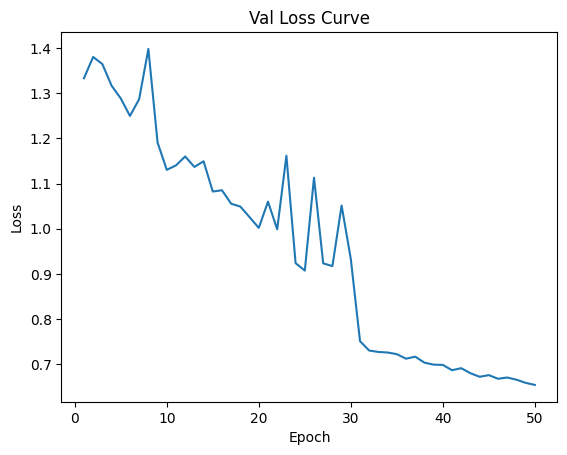

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11569681305151719


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 51/200*****
*****Train Loss:  0.647165 Val Loss:  0.655467*****
*****Validation Accuracy: 58.50%*****
*****Total Avg Disparity: 0.09397456562118509*****

Class Parade: Recall Difference = -0.006427158866183169
Class Handshaking: Recall Difference = 0.10714285714285715
Class Riot: Recall Difference = 0.14129919393077284
Class Dancing: Recall Difference = 0.05357142857142849
Class Funeral: Recall Difference = 0.17600964436407474
Class Cheering: Recall Difference = 0.06578947368421054
Class Meeting: Recall Difference = 0.20673076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.033018867924528295
Class Concerts: Recall Difference = 0.01612903225806467
Class Couple: Recall Difference = 0.2062415196743555
Class Family_Group: Recall Difference = -0.11825487944890933
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = -0.09346405228758148
Class Spa: Recall Difference = 0.13095238095238104
Class S

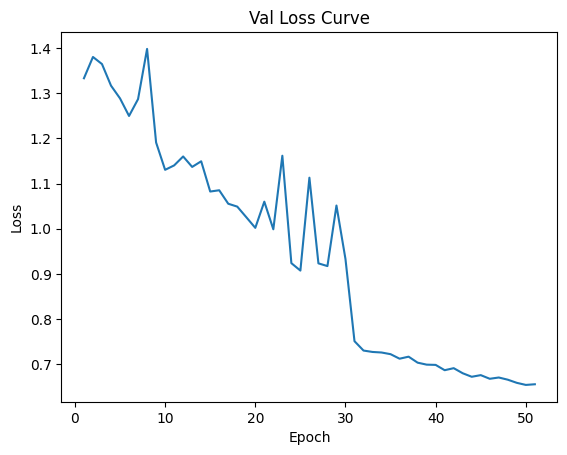

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:48<00:00,  4.17s/it]


Average Adversary epoch loss: 0.11577848459665592


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 52/200*****
*****Train Loss:  0.642861 Val Loss:  0.648816*****
*****Validation Accuracy: 57.66%*****
*****Total Avg Disparity: 0.09141948816771765*****

Class Parade: Recall Difference = -0.01730388925510884
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.18729255571360837
Class Dancing: Recall Difference = 0.0892857142857143
Class Funeral: Recall Difference = 0.17600964436407485
Class Cheering: Recall Difference = 0.0469924812030075
Class Meeting: Recall Difference = 0.17500000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.023060796645702347
Class Concerts: Recall Difference = -0.019585253456221308
Class Couple: Recall Difference = 0.1614654002713705
Class Family_Group: Recall Difference = -0.12016838882510525
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.09019607843137256
Class Spa: Recall Difference = -0.017857142

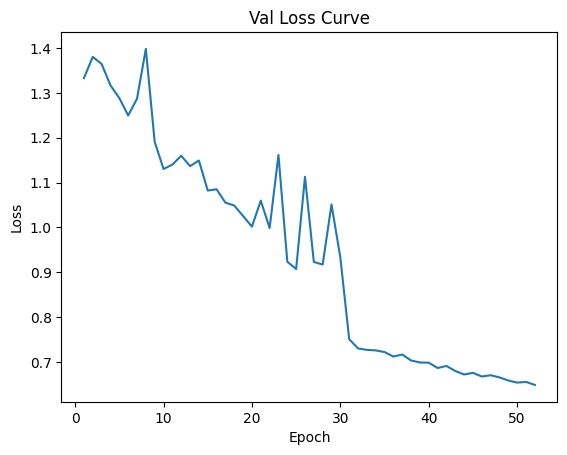

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11642427255327885


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 53/200*****
*****Train Loss:  0.635709 Val Loss:  0.641551*****
*****Validation Accuracy: 59.43%*****
*****Total Avg Disparity: 0.10650405451515409*****

Class Parade: Recall Difference = -0.03482751043726662
Class Handshaking: Recall Difference = 0.10714285714285715
Class Riot: Recall Difference = 0.07776197249881461
Class Dancing: Recall Difference = 0.10119047619047622
Class Funeral: Recall Difference = 0.17600964436407474
Class Cheering: Recall Difference = 0.020676691729323293
Class Meeting: Recall Difference = 0.15961538461538471
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08962264150943394
Class Concerts: Recall Difference = -0.0841013824884792
Class Couple: Recall Difference = 0.22116689280868385
Class Family_Group: Recall Difference = -0.09471871412169919
Class Picnic: Recall Difference = -0.08974358974358976
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.07738095238095222
Class S

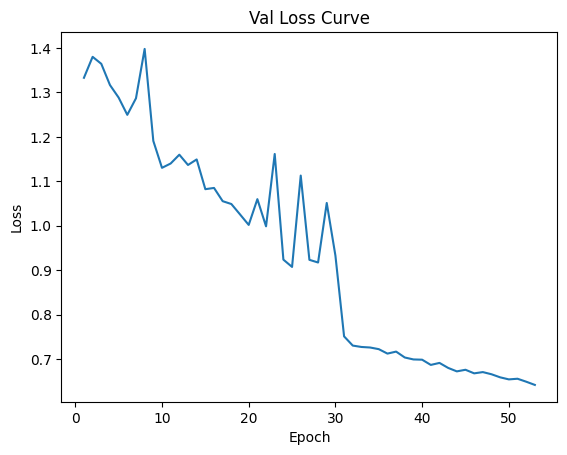

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11567692859814717


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 54/200*****
*****Train Loss:  0.638397 Val Loss:  0.641522*****
*****Validation Accuracy: 59.51%*****
*****Total Avg Disparity: 0.1051713302930386*****

Class Parade: Recall Difference = -0.03208086134915411
Class Handshaking: Recall Difference = 0.10714285714285715
Class Riot: Recall Difference = 0.060218112849691696
Class Dancing: Recall Difference = 0.10714285714285715
Class Funeral: Recall Difference = 0.22664255575647974
Class Cheering: Recall Difference = 0.10150375939849623
Class Meeting: Recall Difference = 0.22211538461538471
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09958071278825992
Class Concerts: Recall Difference = 0.004224270353302639
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.09261385380788362
Class Picnic: Recall Difference = -0.029137529137529206
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.25
Class Sports_Fan: Re

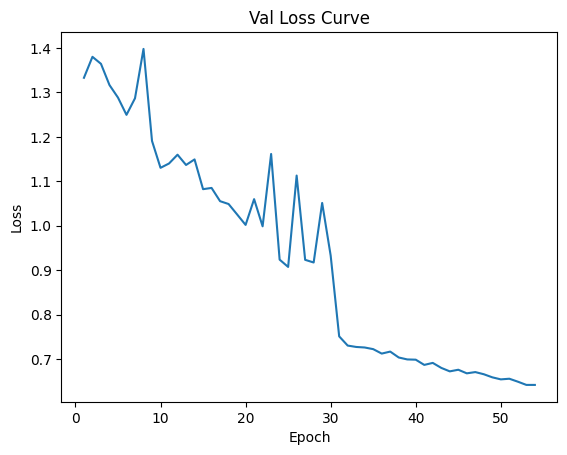

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.1148251873942522


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 55/200*****
*****Train Loss:  0.636954 Val Loss:  0.639220*****
*****Validation Accuracy: 60.47%*****
*****Total Avg Disparity: 0.10299918161882994*****

Class Parade: Recall Difference = -0.011920457042408295
Class Handshaking: Recall Difference = 0.10714285714285715
Class Riot: Recall Difference = 0.10621147463252728
Class Dancing: Recall Difference = 0.06547619047619035
Class Funeral: Recall Difference = 0.07775768535262212
Class Cheering: Recall Difference = 0.12875939849624066
Class Meeting: Recall Difference = 0.14519230769230773
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0052410901467505044
Class Concerts: Recall Difference = 0.03993855606758839
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.12035973976272474
Class Picnic: Recall Difference = 0.0174825174825175
Class Soldier_Patrol: Recall Difference = -0.12679738562091492
Class Spa: Recall Difference = 0.249999999

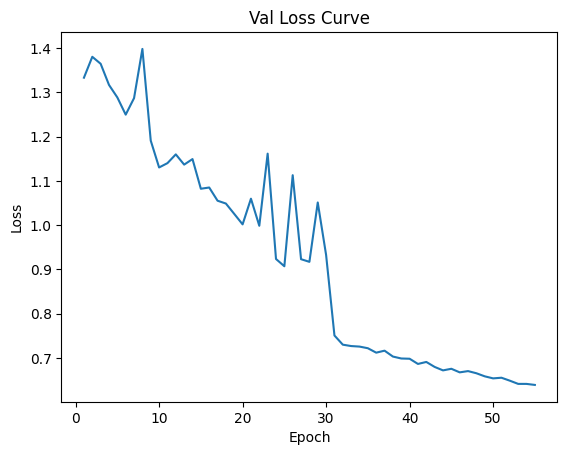

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11454330298763055


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 56/200*****
*****Train Loss:  0.636147 Val Loss:  0.627175*****
*****Validation Accuracy: 60.61%*****
*****Total Avg Disparity: 0.09534567977786709*****

Class Parade: Recall Difference = -0.011810591078883825
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11607142857142855
Class Funeral: Recall Difference = 0.2013261000602773
Class Cheering: Recall Difference = 0.04793233082706766
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.004716981132075443
Class Concerts: Recall Difference = 0.03149001536098317
Class Couple: Recall Difference = 0.20624151967435553
Class Family_Group: Recall Difference = -0.09471871412169919
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = -0.017857142857142905
Cl

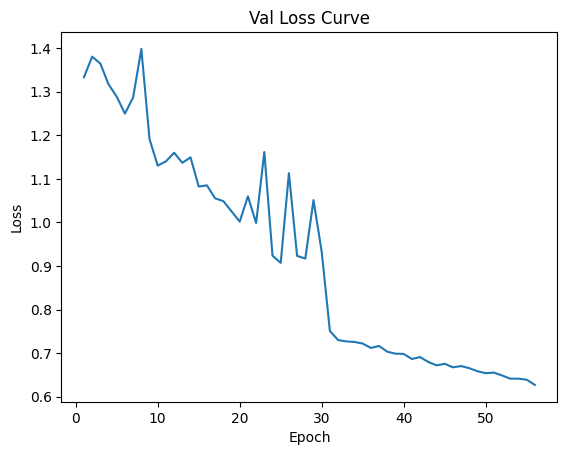

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11524585319253114


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 57/200*****
*****Train Loss:  0.630741 Val Loss:  0.632146*****
*****Validation Accuracy: 58.96%*****
*****Total Avg Disparity: 0.10718710531193813*****

Class Parade: Recall Difference = -0.022687321467809274
Class Handshaking: Recall Difference = 0.125
Class Riot: Recall Difference = 0.096728307254623
Class Dancing: Recall Difference = 0.0892857142857143
Class Funeral: Recall Difference = 0.17299578059071735
Class Cheering: Recall Difference = 0.14567669172932332
Class Meeting: Recall Difference = 0.20673076923076927
Class Stock_Market: Recall Difference = 0.033333333333333326
Class Ceremony: Recall Difference = -0.03249475890985323
Class Concerts: Recall Difference = -0.051843317972350256
Class Couple: Recall Difference = 0.22116689280868393
Class Family_Group: Recall Difference = -0.1479142747799464
Class Picnic: Recall Difference = -0.11188811188811187
Class Soldier_Patrol: Recall Difference = -0.09346405228758148
Class Spa: Recall Difference = -0.09523809523809545
Clas

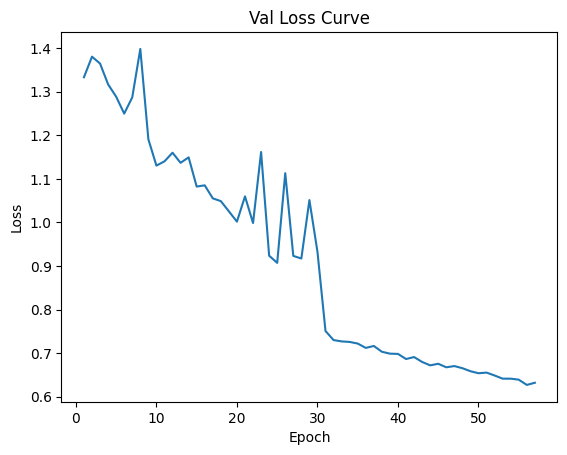

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11543972790241241


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 58/200*****
*****Train Loss:  0.621688 Val Loss:  0.623434*****
*****Validation Accuracy: 60.64%*****
*****Total Avg Disparity: 0.09858475178858767*****

Class Parade: Recall Difference = 0.0029663810151614456
Class Handshaking: Recall Difference = 0.03571428571428574
Class Riot: Recall Difference = 0.14935988620199148
Class Dancing: Recall Difference = 0.05654761904761901
Class Funeral: Recall Difference = 0.15069318866787218
Class Cheering: Recall Difference = 0.05733082706766923
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.04297693920335427
Class Concerts: Recall Difference = -0.06029185867895548
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.09892843474933027
Class Picnic: Recall Difference = -0.029137529137529095
Class Soldier_Patrol: Recall Difference = -0.09346405228758148
Class Spa: Recall Difference = 0.12499999999999989
Class

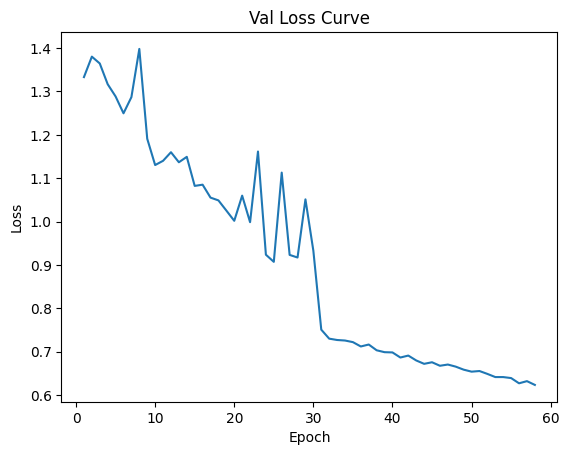

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.1157407806469844


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 59/200*****
*****Train Loss:  0.623446 Val Loss:  0.629081*****
*****Validation Accuracy: 59.40%*****
*****Total Avg Disparity: 0.0996208528349542*****

Class Parade: Recall Difference = -0.06723796967699391
Class Handshaking: Recall Difference = -0.01785714285714282
Class Riot: Recall Difference = 0.04267425320056889
Class Dancing: Recall Difference = 0.08333333333333326
Class Funeral: Recall Difference = 0.16335141651597335
Class Cheering: Recall Difference = -0.0046992481203007586
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07075471698113212
Class Concerts: Recall Difference = 0.02457757296466989
Class Couple: Recall Difference = 0.2360922659430123
Class Family_Group: Recall Difference = -0.1437045541523153
Class Picnic: Recall Difference = -0.029137529137529206
Class Soldier_Patrol: Recall Difference = -0.08562091503267955
Class Spa: Recall Difference = -0.1666666

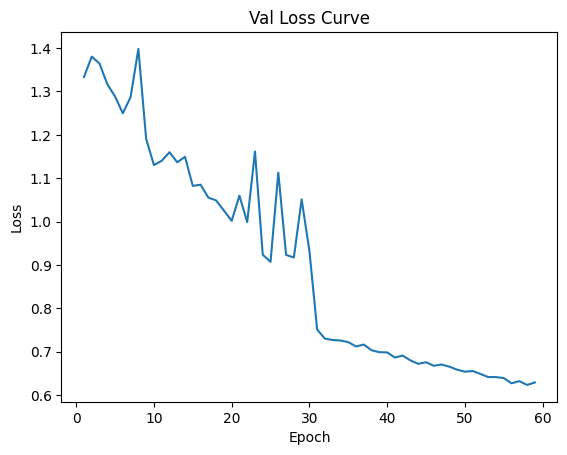

Data has been appended to validation_0.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11559596829689466


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 60/200*****
*****Train Loss:  0.624054 Val Loss:  0.616346*****
*****Validation Accuracy: 61.45%*****
*****Total Avg Disparity: 0.08480847931337096*****

Class Parade: Recall Difference = -0.001043726653482735
Class Handshaking: Recall Difference = 0.10714285714285714
Class Riot: Recall Difference = 0.06827880512091028
Class Dancing: Recall Difference = 0.05357142857142855
Class Funeral: Recall Difference = 0.1663652802893309
Class Cheering: Recall Difference = 0.04793233082706766
Class Meeting: Recall Difference = 0.28365384615384615
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.052935010482180245
Class Concerts: Recall Difference = 0.01113671274961614
Class Couple: Recall Difference = 0.20488466757123475
Class Family_Group: Recall Difference = -0.08821278224263296
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.20238095238095222
Class Sp

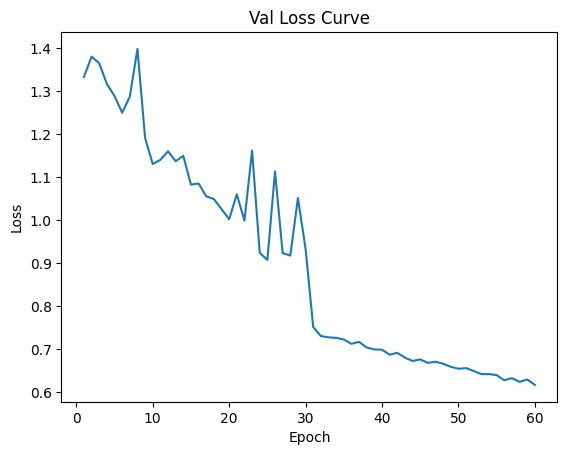

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11555963582717456


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 61/200*****
*****Train Loss:  0.621026 Val Loss:  0.604700*****
*****Validation Accuracy: 62.09%*****
*****Total Avg Disparity: 0.09641675417421336*****

Class Parade: Recall Difference = -0.03894748406943527
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.0595238095238097
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.07518796992481203
Class Meeting: Recall Difference = 0.17500000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = -0.02457757296466956
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.12035973976272485
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.07124183006535934
Class Spa: Recall Difference = 0.1547619047

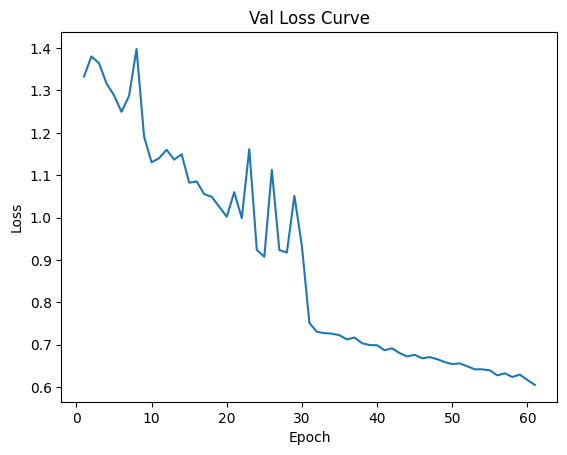

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11558640261109059


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 62/200*****
*****Train Loss:  0.619034 Val Loss:  0.604846*****
*****Validation Accuracy: 62.00%*****
*****Total Avg Disparity: 0.09241111158289037*****

Class Parade: Recall Difference = -0.04032080861349141
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.031768610715979084
Class Dancing: Recall Difference = 0.09523809523809534
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.05733082706766915
Class Meeting: Recall Difference = 0.17500000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = 0.019585253456221197
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.13528511289705314
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.07124183006535922
Class Spa: Recall Difference = 0.130952

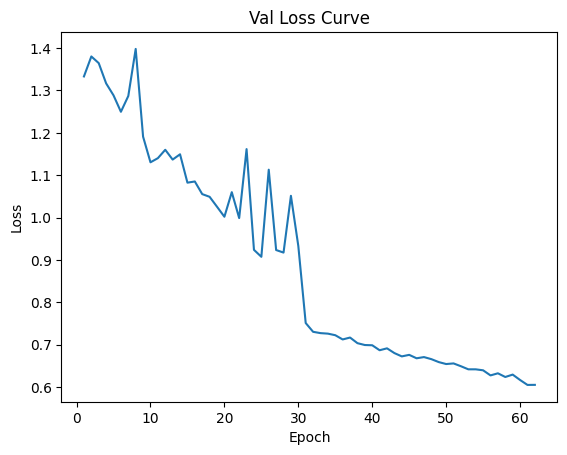

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11566822660657075


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 63/200*****
*****Train Loss:  0.611513 Val Loss:  0.602861*****
*****Validation Accuracy: 62.24%*****
*****Total Avg Disparity: 0.09791759462814491*****

Class Parade: Recall Difference = -0.03356405185673472
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.11607142857142855
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.07518796992481208
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.01519916142557648
Class Concerts: Recall Difference = -0.02457757296466956
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.12035973976272485
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.07124183006535934
Class Spa: Recall Difference = 0.20238095238095233
Class S

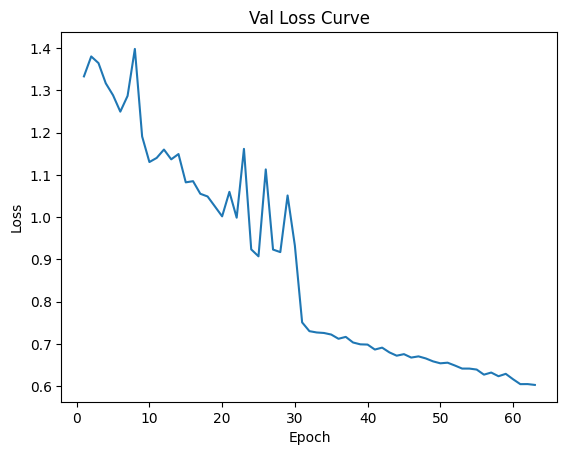

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11591172161010596


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 64/200*****
*****Train Loss:  0.610151 Val Loss:  0.601227*****
*****Validation Accuracy: 62.21%*****
*****Total Avg Disparity: 0.09550982026284238*****

Class Parade: Recall Difference = -0.03219072731267847
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.15178571428571436
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.07518796992481208
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.01519916142557648
Class Concerts: Recall Difference = -0.02457757296466967
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.1203597397627248
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.07124183006535922
Class Spa: Recall Difference = 0.15476190

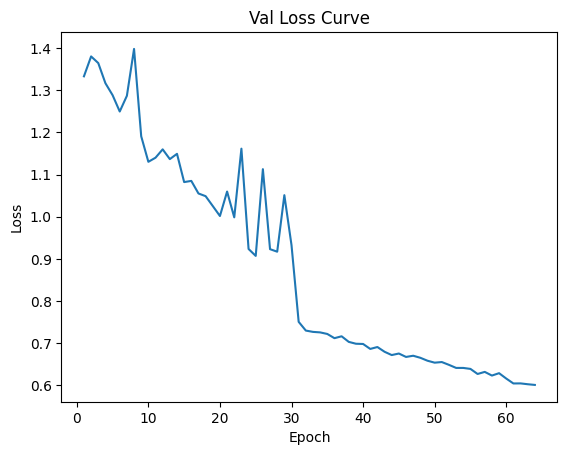

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11523283702822831


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 65/200*****
*****Train Loss:  0.613083 Val Loss:  0.601637*****
*****Validation Accuracy: 62.38%*****
*****Total Avg Disparity: 0.09050264946846044*****

Class Parade: Recall Difference = -0.018677213799164982
Class Handshaking: Recall Difference = 0.10714285714285715
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.07440476190476192
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.039473684210526355
Class Meeting: Recall Difference = 0.17500000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.0007680491551457225
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.12246460007654036
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.07124183006535922
Class Spa: Recall Difference = 0.130

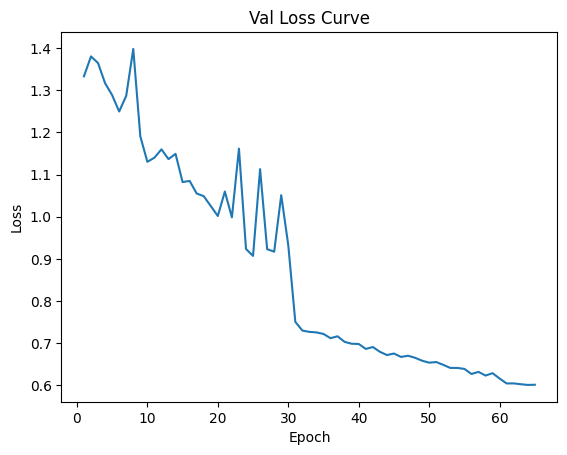

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11486131955797856


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 66/200*****
*****Train Loss:  0.612554 Val Loss:  0.600644*****
*****Validation Accuracy: 62.38%*****
*****Total Avg Disparity: 0.08367175549666026*****

Class Parade: Recall Difference = -0.018677213799164982
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.1517857142857143
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = 0.007680491551459445
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.07979334098737084
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.07124183006535934
Class Spa: Recall Difference = 0.15476

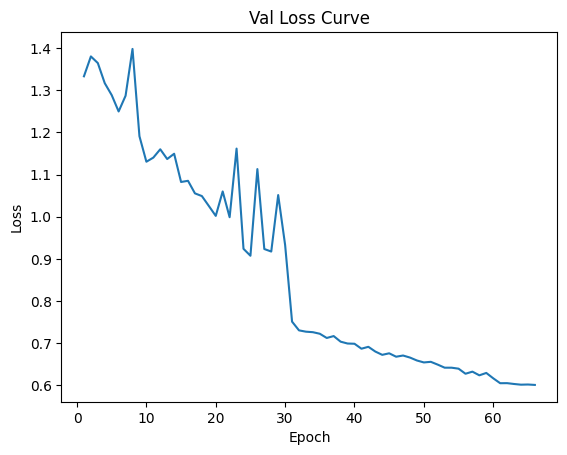

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11448676225084525


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 67/200*****
*****Train Loss:  0.612235 Val Loss:  0.599407*****
*****Validation Accuracy: 62.32%*****
*****Total Avg Disparity: 0.09118250031391474*****

Class Parade: Recall Difference = -0.03356405185673472
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.07633949739212897
Class Dancing: Recall Difference = 0.11607142857142855
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.039473684210526355
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.01519916142557648
Class Concerts: Recall Difference = -0.012672811059907696
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.09682357443551465
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.13095

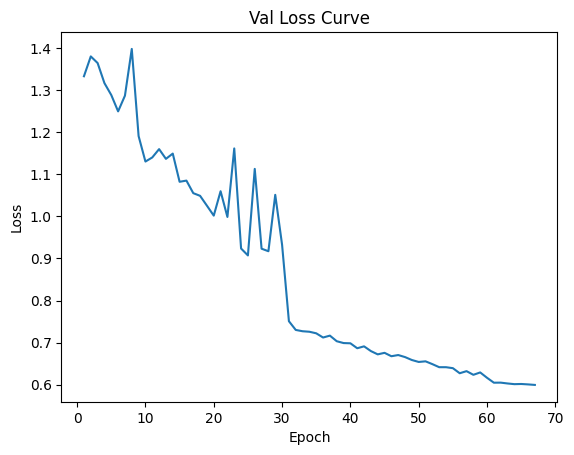

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11505841349179928


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 68/200*****
*****Train Loss:  0.610760 Val Loss:  0.598920*****
*****Validation Accuracy: 62.26%*****
*****Total Avg Disparity: 0.08896141205437148*****

Class Parade: Recall Difference = -0.018677213799164982
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.031015037593984968
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.02457757296466967
Class Couple: Recall Difference = 0.2957937584803255
Class Family_Group: Recall Difference = -0.09471871412169913
Class Picnic: Recall Difference = 0.0174825174825175
Class Soldier_Patrol: Recall Difference = -0.07124183006535934
Class Spa: Recall Difference = 0.15476190

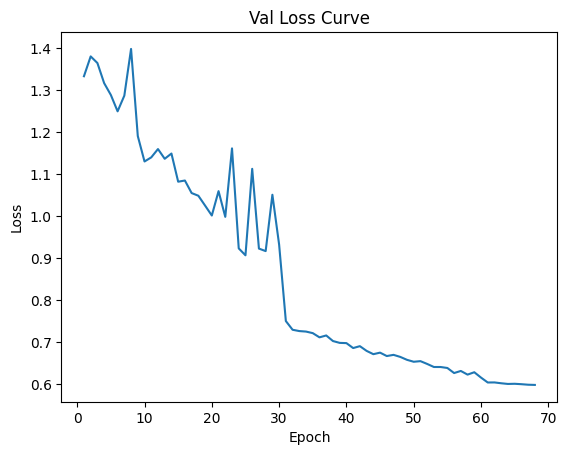

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11535014813909164


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 69/200*****
*****Train Loss:  0.614320 Val Loss:  0.599924*****
*****Validation Accuracy: 62.24%*****
*****Total Avg Disparity: 0.09191893447004444*****

Class Parade: Recall Difference = -0.01730388925510884
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.1517857142857143
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.17500000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.1203597397627248
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.154761

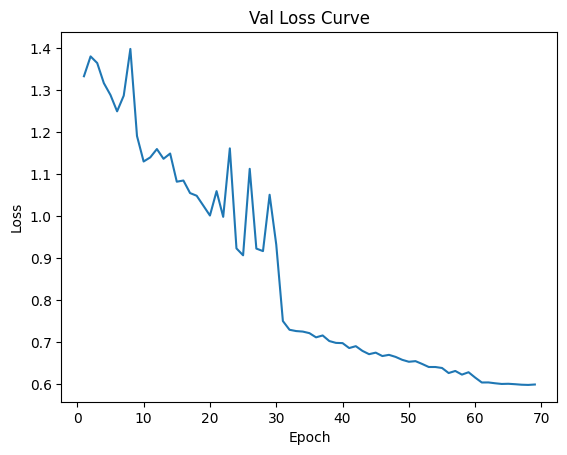

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11464686548480621


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 70/200*****
*****Train Loss:  0.612475 Val Loss:  0.598632*****
*****Validation Accuracy: 62.09%*****
*****Total Avg Disparity: 0.09112997461488262*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.05733082706766915
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = -0.02457757296466967
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.10964408725602748
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.1547

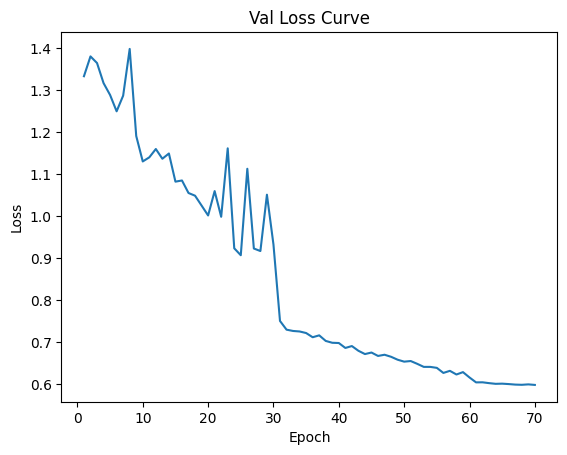

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11488407420424315


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 71/200*****
*****Train Loss:  0.608830 Val Loss:  0.598305*****
*****Validation Accuracy: 62.61%*****
*****Total Avg Disparity: 0.09343148715836982*****

Class Parade: Recall Difference = -0.03356405185673472
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.07142857142857145
Class Funeral: Recall Difference = 0.17600964436407485
Class Cheering: Recall Difference = 0.0930451127819549
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = -0.0007680491551458335
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.10753922694221202
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1547619

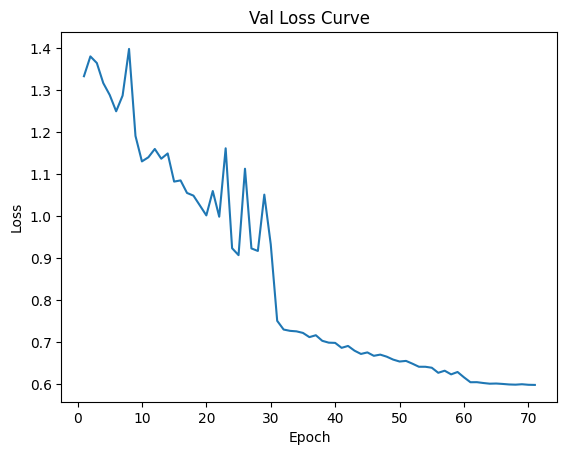

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.1149122603237629


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 72/200*****
*****Train Loss:  0.608661 Val Loss:  0.596641*****
*****Validation Accuracy: 62.58%*****
*****Total Avg Disparity: 0.09662799936070918*****

Class Parade: Recall Difference = -0.02543397055592178
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.07633949739212897
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.022556390977443608
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.004224270353302528
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.08189820130118641
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.107142

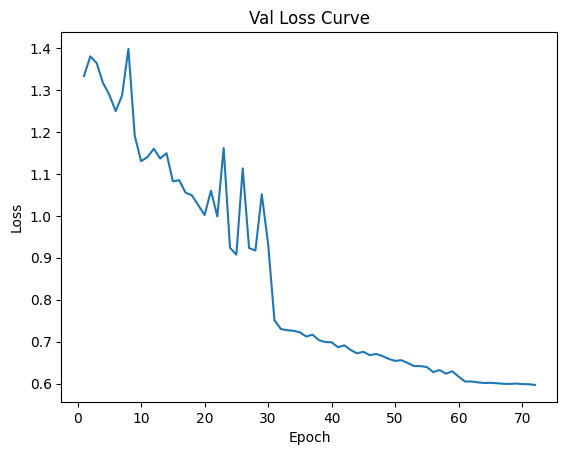

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11587340298753518


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 73/200*****
*****Train Loss:  0.609023 Val Loss:  0.597752*****
*****Validation Accuracy: 62.41%*****
*****Total Avg Disparity: 0.10122887103640167*****

Class Parade: Recall Difference = -0.024060646011865305
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.13392857142857145
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.075187969924812
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.011136712749616029
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.10753922694221191
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.154761904

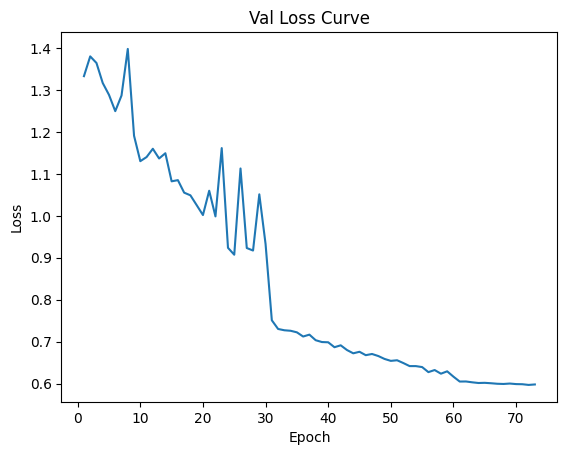

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11446907657843369


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 74/200*****
*****Train Loss:  0.612033 Val Loss:  0.596250*****
*****Validation Accuracy: 62.29%*****
*****Total Avg Disparity: 0.10140692808131403*****

Class Parade: Recall Difference = -0.03356405185673472
Class Handshaking: Recall Difference = 0.0535714285714286
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.09226190476190477
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.039473684210526355
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.0007680491551457225
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.10964408725602759
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476

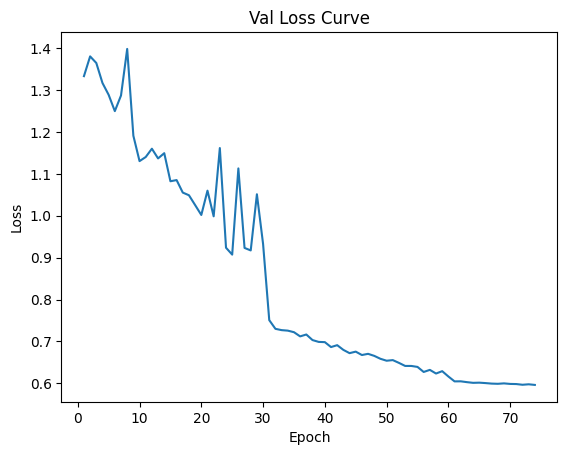

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11441882269886824


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 75/200*****
*****Train Loss:  0.608111 Val Loss:  0.595984*****
*****Validation Accuracy: 62.50%*****
*****Total Avg Disparity: 0.09907832912338976*****

Class Parade: Recall Difference = -0.03356405185673472
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.09523809523809529
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = 0.011136712749616029
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.09471871412169919
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.15476190476190466
Class

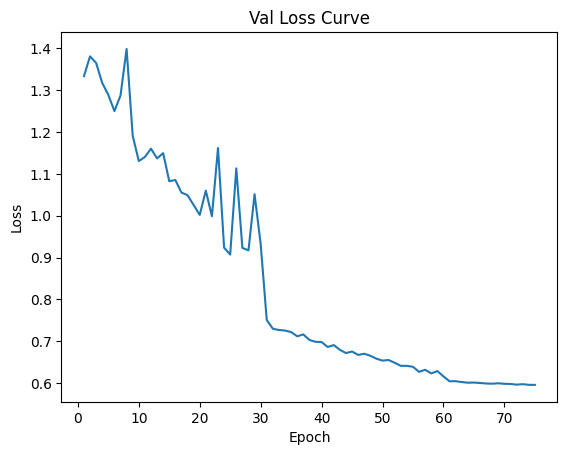

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11466579970258933


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 76/200*****
*****Train Loss:  0.606487 Val Loss:  0.596004*****
*****Validation Accuracy: 62.44%*****
*****Total Avg Disparity: 0.09284771345614115*****

Class Parade: Recall Difference = -0.010547132498352041
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.06827880512091028
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.18866787221217607
Class Cheering: Recall Difference = 0.031015037593985023
Class Meeting: Recall Difference = 0.19038461538461549
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.0007680491551457225
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.12246460007654048
Class Picnic: Recall Difference = 0.017482517482517612
Class Soldier_Patrol: Recall Difference = -0.07124183006535922
Class Spa: Recall Difference = 0.154

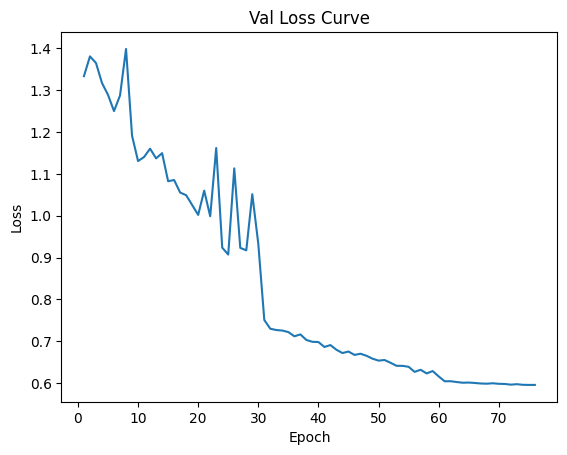

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11435760786900154


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 77/200*****
*****Train Loss:  0.611007 Val Loss:  0.593535*****
*****Validation Accuracy: 62.64%*****
*****Total Avg Disparity: 0.09215457185911348*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.1488095238095239
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = 0.019585253456221308
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.09471871412169919
Class Picnic: Recall Difference = -0.004662004662004615
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476190476190466
Clas

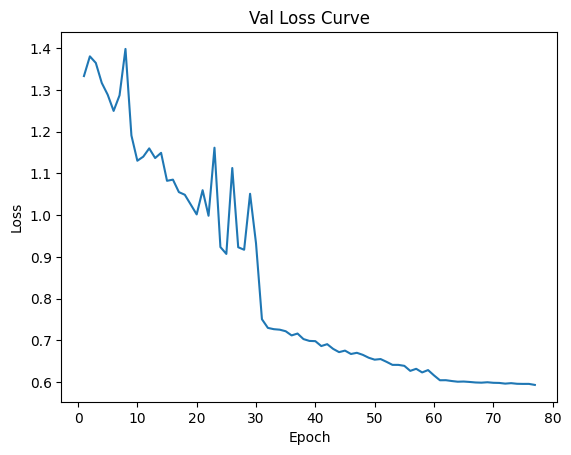

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11497776926710056


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 78/200*****
*****Train Loss:  0.611982 Val Loss:  0.594064*****
*****Validation Accuracy: 62.67%*****
*****Total Avg Disparity: 0.09280718315706761*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.0535714285714286
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.09226190476190471
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.024109014675052387
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.09471871412169924
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.13095

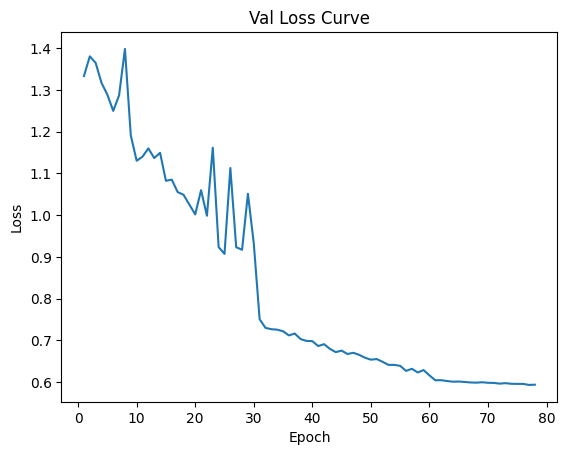

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11463357393558209


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 79/200*****
*****Train Loss:  0.607604 Val Loss:  0.594003*****
*****Validation Accuracy: 62.70%*****
*****Total Avg Disparity: 0.08769324486036564*****

Class Parade: Recall Difference = -0.041694133157547775
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.11607142857142855
Class Funeral: Recall Difference = 0.22362869198312235
Class Cheering: Recall Difference = 0.0930451127819549
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = -0.0007680491551458335
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.0818982013011863
Class Picnic: Recall Difference = 0.02564102564102566
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1547619

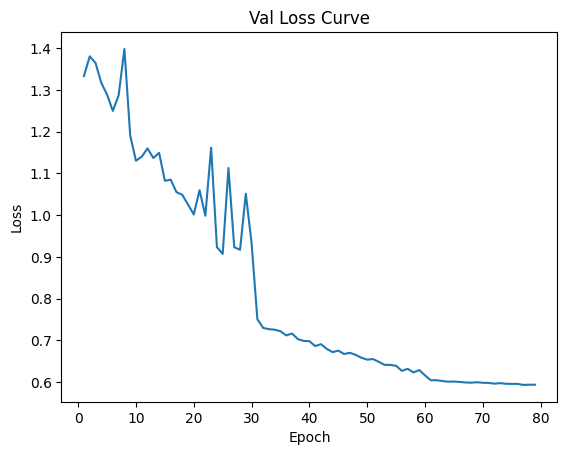

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11463220618092097


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 80/200*****
*****Train Loss:  0.605384 Val Loss:  0.595995*****
*****Validation Accuracy: 62.76%*****
*****Total Avg Disparity: 0.09070128406874287*****

Class Parade: Recall Difference = -0.041694133157547775
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.050734945471787474
Class Dancing: Recall Difference = 0.07440476190476192
Class Funeral: Recall Difference = 0.18866787221217607
Class Cheering: Recall Difference = 0.05733082706766915
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0062893081761006275
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.1203597397627249
Class Picnic: Recall Difference = 0.017482517482517612
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476

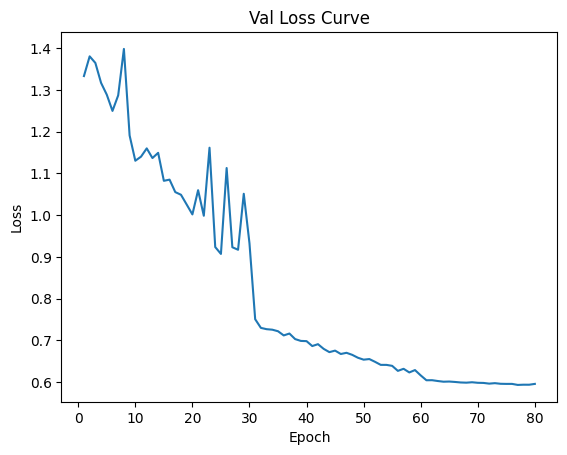

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11443871087752856


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 81/200*****
*****Train Loss:  0.607344 Val Loss:  0.592875*****
*****Validation Accuracy: 62.58%*****
*****Total Avg Disparity: 0.08851484820609136*****

Class Parade: Recall Difference = -0.010547132498352041
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.11011904761904767
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.04041353383458651
Class Meeting: Recall Difference = 0.17499999999999993
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = -0.0007680491551458335
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.09471871412169924
Class Picnic: Recall Difference = 0.017482517482517612
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.154761

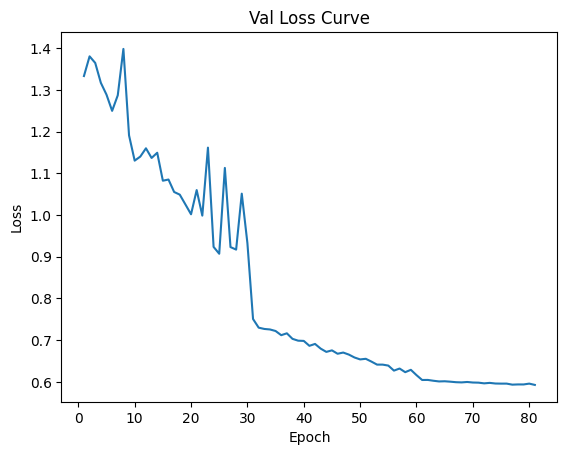

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11503171032437912


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 82/200*****
*****Train Loss:  0.609088 Val Loss:  0.592408*****
*****Validation Accuracy: 62.55%*****
*****Total Avg Disparity: 0.09530357764938806*****

Class Parade: Recall Difference = -0.03356405185673472
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.09523809523809529
Class Funeral: Recall Difference = 0.22362869198312235
Class Cheering: Recall Difference = 0.039473684210526355
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.10753922694221202
Class Picnic: Recall Difference = -0.08974358974358976
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476190476190466
Cl

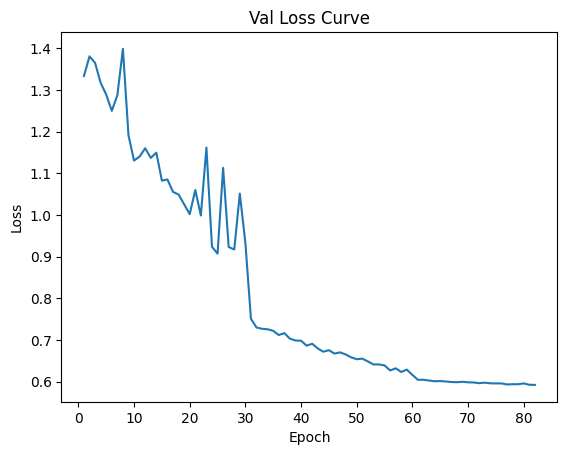

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.11512378889780778


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 83/200*****
*****Train Loss:  0.604673 Val Loss:  0.592020*****
*****Validation Accuracy: 62.70%*****
*****Total Avg Disparity: 0.09645740228915418*****

Class Parade: Recall Difference = -0.034937376400790976
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.09226190476190482
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.075187969924812
Class Meeting: Recall Difference = 0.19038461538461549
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.06184486373165615
Class Concerts: Recall Difference = -0.012672811059907696
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.09471871412169913
Class Picnic: Recall Difference = 0.017482517482517612
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.154761904

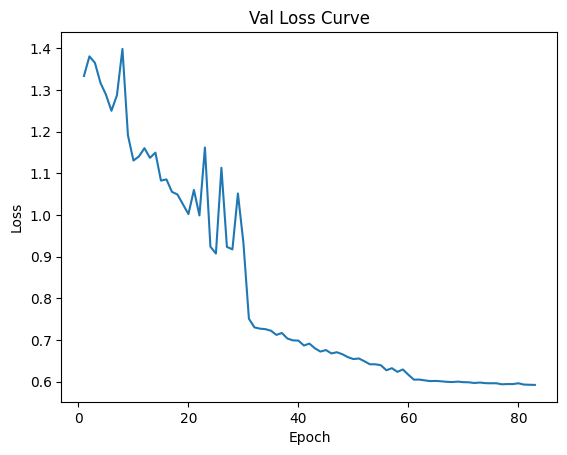

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11397101271610993


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 84/200*****
*****Train Loss:  0.608022 Val Loss:  0.592293*****
*****Validation Accuracy: 62.96%*****
*****Total Avg Disparity: 0.10060614422763903*****

Class Parade: Recall Difference = -0.041694133157547775
Class Handshaking: Recall Difference = 0.05357142857142862
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.07440476190476192
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.11825487944890928
Class Picnic: Recall Difference = -0.004662004662004615
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.13095238095238093
Clas

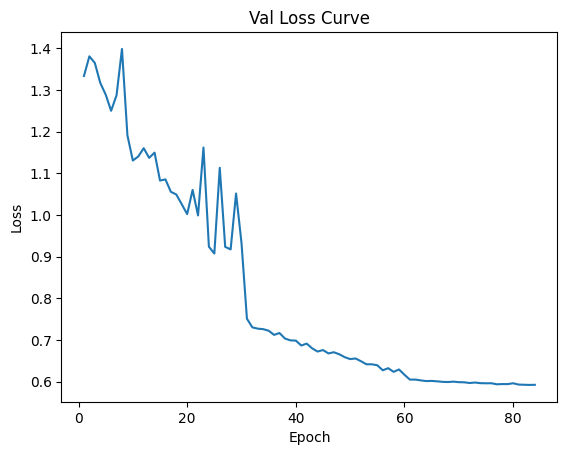

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11503128277567717


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 85/200*****
*****Train Loss:  0.600895 Val Loss:  0.590947*****
*****Validation Accuracy: 62.84%*****
*****Total Avg Disparity: 0.08811184034082163*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.013157894736842118
Class Meeting: Recall Difference = 0.17500000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.012672811059907807
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.10753922694221207
Class Picnic: Recall Difference = 0.02564102564102566
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.02976

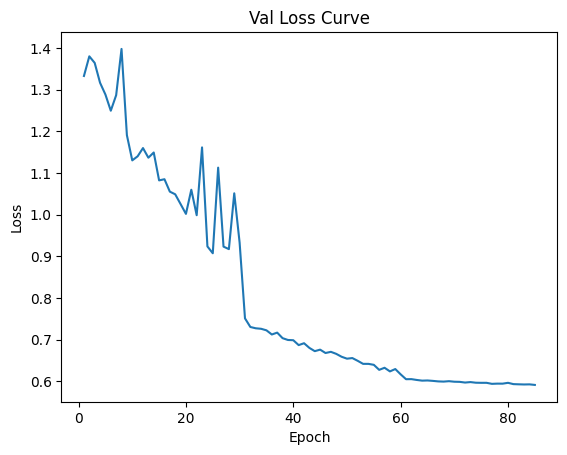

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11535651637957646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 86/200*****
*****Train Loss:  0.607827 Val Loss:  0.591394*****
*****Validation Accuracy: 62.96%*****
*****Total Avg Disparity: 0.09754436611133871*****

Class Parade: Recall Difference = -0.03356405185673472
Class Handshaking: Recall Difference = 0.0535714285714286
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.09226190476190482
Class Funeral: Recall Difference = 0.18866787221217607
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.012578616352201255
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.31071913161465403
Class Family_Group: Recall Difference = -0.12246460007654042
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1547619

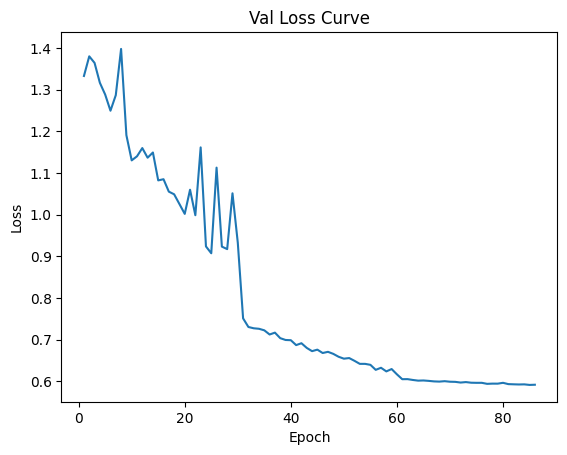

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11528862726229888


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 87/200*****
*****Train Loss:  0.604169 Val Loss:  0.590414*****
*****Validation Accuracy: 63.10%*****
*****Total Avg Disparity: 0.09965135685419642*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300611
Class Dancing: Recall Difference = 0.13095238095238093
Class Funeral: Recall Difference = 0.26160337552742624
Class Cheering: Recall Difference = 0.004699248120300703
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0062893081761006275
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.29579375848032574
Class Family_Group: Recall Difference = -0.09471871412169924
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1

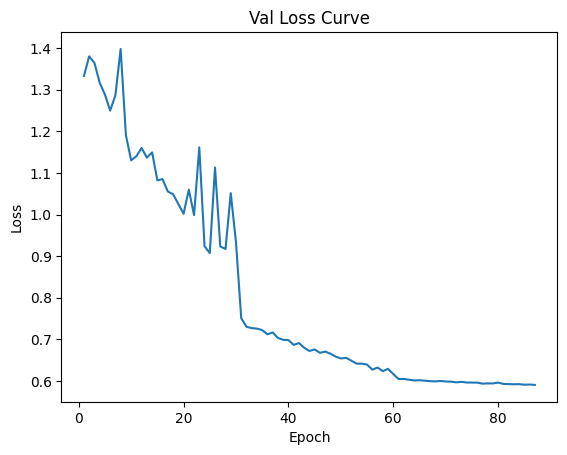

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11416324342672642


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 88/200*****
*****Train Loss:  0.605712 Val Loss:  0.588870*****
*****Validation Accuracy: 62.79%*****
*****Total Avg Disparity: 0.09481037095858887*****

Class Parade: Recall Difference = -0.034937376400790976
Class Handshaking: Recall Difference = 0.0535714285714286
Class Riot: Recall Difference = 0.06827880512091034
Class Dancing: Recall Difference = 0.11011904761904773
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.2057692307692307
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.0007680491551458335
Class Couple: Recall Difference = 0.2957937584803255
Class Family_Group: Recall Difference = -0.10964408725602748
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476190

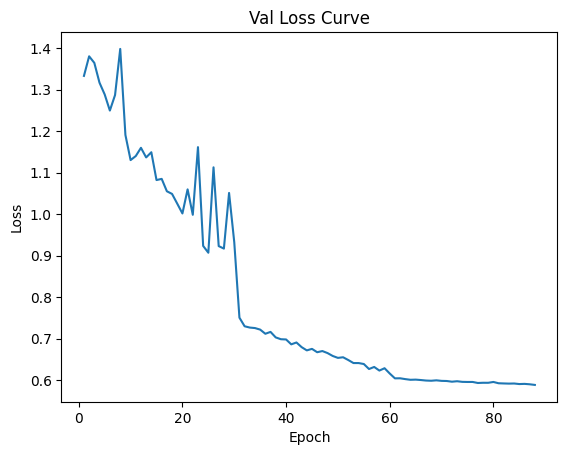

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11472684001693359


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 89/200*****
*****Train Loss:  0.607283 Val Loss:  0.589907*****
*****Validation Accuracy: 62.87%*****
*****Total Avg Disparity: 0.0990857679943032*****

Class Parade: Recall Difference = -0.03356405185673472
Class Handshaking: Recall Difference = 0.035714285714285726
Class Riot: Recall Difference = 0.023707918444760556
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = -0.0007680491551458335
Class Couple: Recall Difference = 0.2957937584803255
Class Family_Group: Recall Difference = -0.12246460007654031
Class Picnic: Recall Difference = 0.05594405594405605
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.13095238

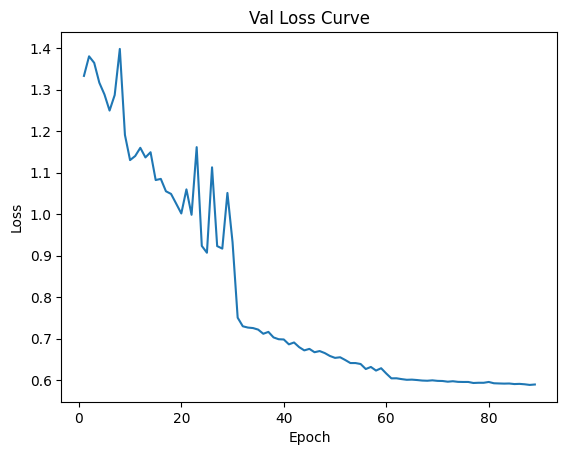

Data has been appended to validation_0.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11430962670307893


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 90/200*****
*****Train Loss:  0.604033 Val Loss:  0.590052*****
*****Validation Accuracy: 63.13%*****
*****Total Avg Disparity: 0.09561935852200344*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.0535714285714286
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.09523809523809529
Class Funeral: Recall Difference = 0.21398432790837862
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08071278825995803
Class Concerts: Recall Difference = -0.009216589861751112
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.07979334098737095
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.04901960784313697
Class Spa: Recall Difference = 0.1071428571428572
Class Sp

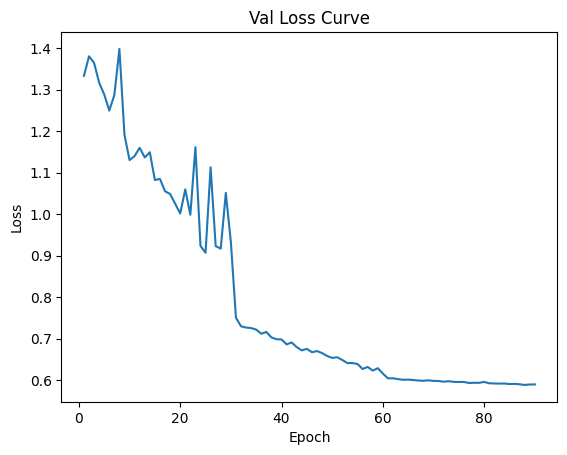

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11357799630898696


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 91/200*****
*****Train Loss:  0.602656 Val Loss:  0.589783*****
*****Validation Accuracy: 63.05%*****
*****Total Avg Disparity: 0.09326348332888719*****

Class Parade: Recall Difference = -0.034937376400790976
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.17600964436407485
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.2057692307692307
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.009216589861751112
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.154761

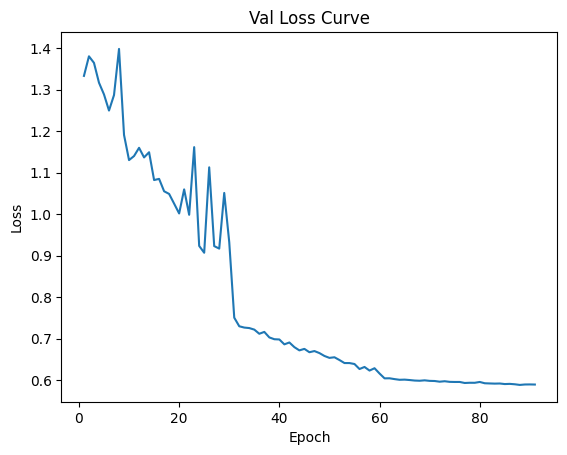

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.1134571094925587


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 92/200*****
*****Train Loss:  0.606191 Val Loss:  0.589235*****
*****Validation Accuracy: 62.90%*****
*****Total Avg Disparity: 0.09885314250703318*****

Class Parade: Recall Difference = -0.034937376400790976
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.009216589861751112
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.09471871412169924
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476

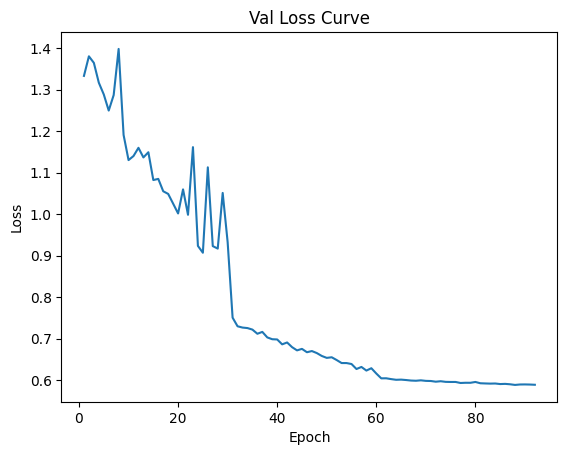

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11384587792249826


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 93/200*****
*****Train Loss:  0.604772 Val Loss:  0.589101*****
*****Validation Accuracy: 62.93%*****
*****Total Avg Disparity: 0.09906157999302433*****

Class Parade: Recall Difference = -0.034937376400790976
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.17600964436407474
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = 0.01113671274961614
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476190

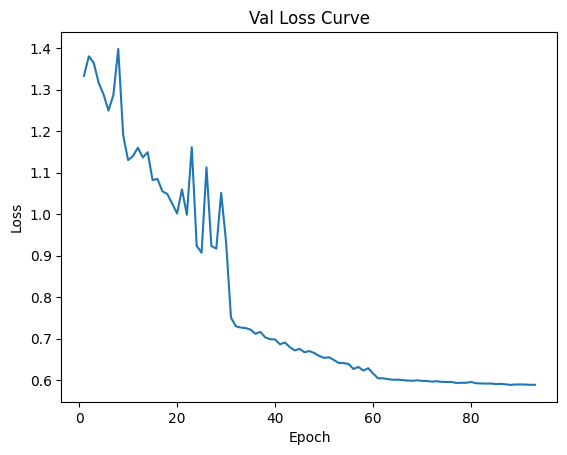

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11400114085811835


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 94/200*****
*****Train Loss:  0.604763 Val Loss:  0.589211*****
*****Validation Accuracy: 62.87%*****
*****Total Avg Disparity: 0.09640423927703837*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.024109014675052387
Class Concerts: Recall Difference = -0.009216589861751112
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476

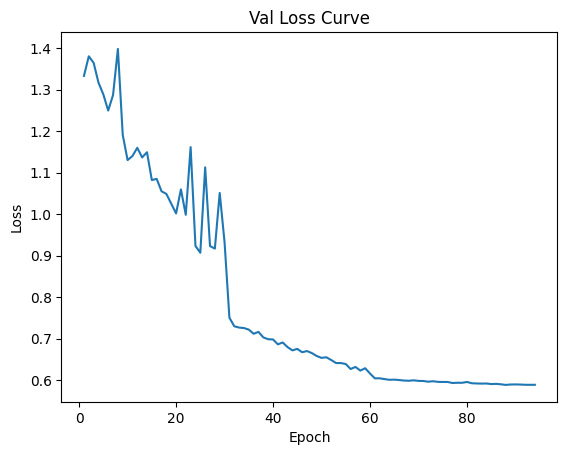

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.1129522819358569


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 95/200*****
*****Train Loss:  0.602614 Val Loss:  0.589698*****
*****Validation Accuracy: 63.05%*****
*****Total Avg Disparity: 0.09225208900797256*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.19038461538461549
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = 0.02304147465437789
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.10753922694221207
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.154761

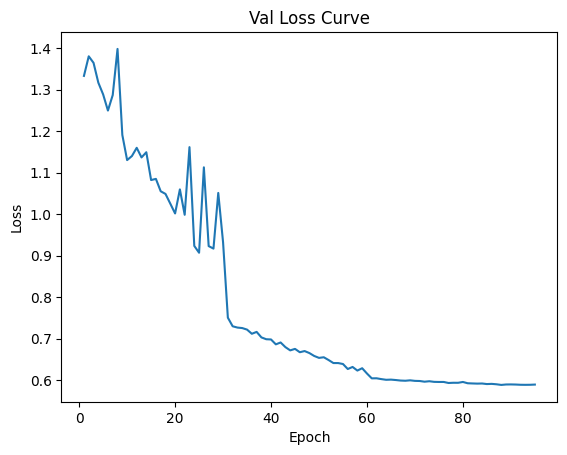

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11429030591478714


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 96/200*****
*****Train Loss:  0.605158 Val Loss:  0.588165*****
*****Validation Accuracy: 62.87%*****
*****Total Avg Disparity: 0.09936336417801538*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = 0.011136712749616029
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.09471871412169913
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1547619

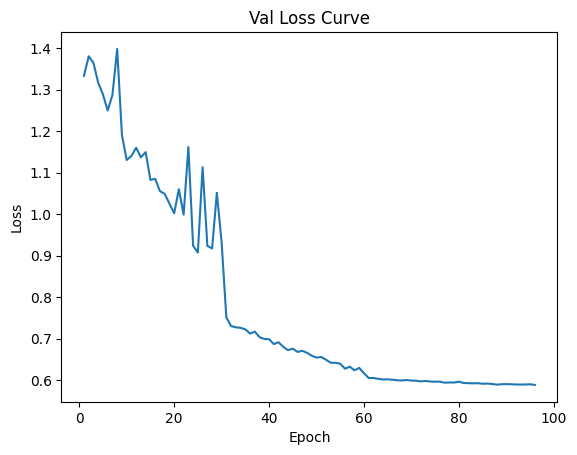

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11401500667517002


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 97/200*****
*****Train Loss:  0.602683 Val Loss:  0.588333*****
*****Validation Accuracy: 62.84%*****
*****Total Avg Disparity: 0.09232313633586976*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.0007680491551458335
Class Couple: Recall Difference = 0.2957937584803255
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.15476

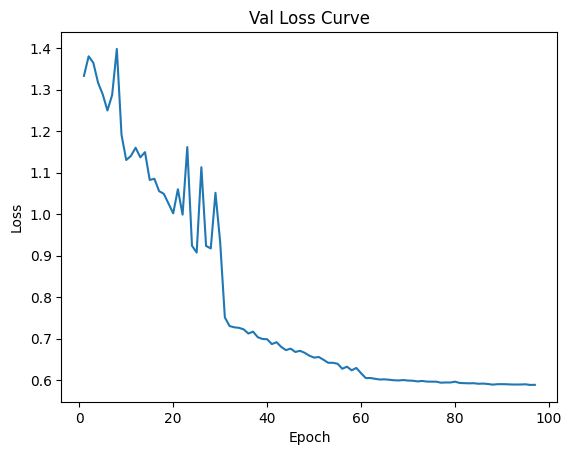

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11337514221668243


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 98/200*****
*****Train Loss:  0.608833 Val Loss:  0.588986*****
*****Validation Accuracy: 62.81%*****
*****Total Avg Disparity: 0.09887947924532549*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = 0.02304147465437789
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.154761

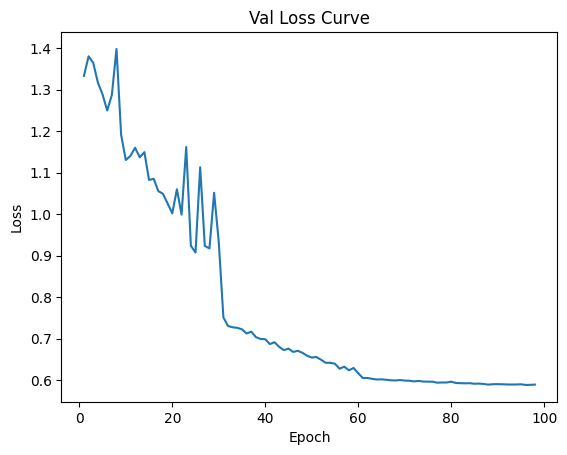

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11381324008107185


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 99/200*****
*****Train Loss:  0.602770 Val Loss:  0.588410*****
*****Validation Accuracy: 62.93%*****
*****Total Avg Disparity: 0.09449634260063572*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = 0.011136712749616029
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1547619

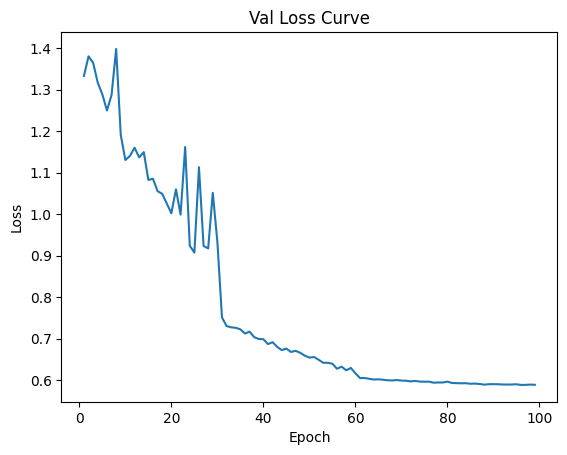

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11308373969334823


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 100/200*****
*****Train Loss:  0.602379 Val Loss:  0.587745*****
*****Validation Accuracy: 62.96%*****
*****Total Avg Disparity: 0.09187569359864524*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.23628691983122369
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = 0.02304147465437789
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476

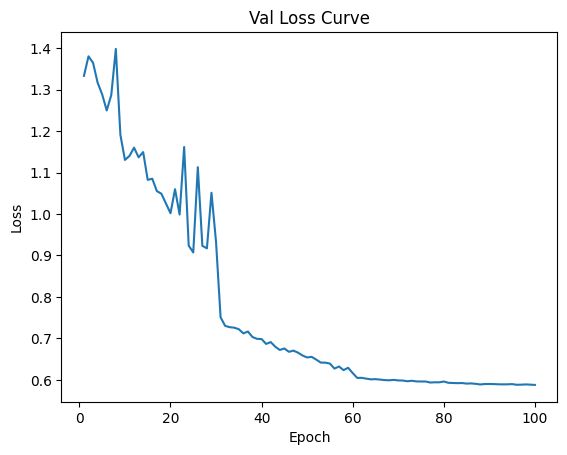

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11463731985825759


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 101/200*****
*****Train Loss:  0.607260 Val Loss:  0.589097*****
*****Validation Accuracy: 62.96%*****
*****Total Avg Disparity: 0.09250130950185274*****

Class Parade: Recall Difference = -0.018677213799164982
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.031015037593984968
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = -0.009216589861751112
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.09471871412169919
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1547

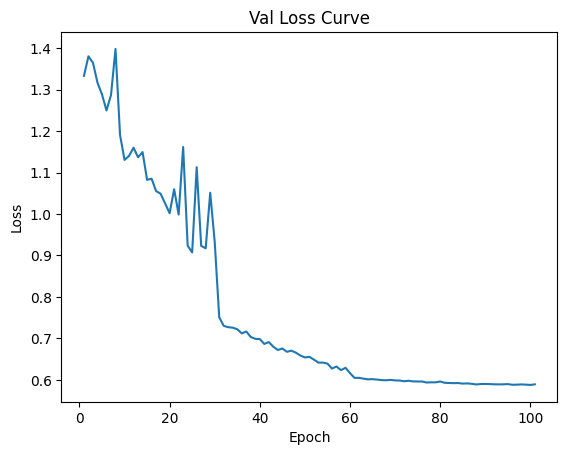

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11321069529423347


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 102/200*****
*****Train Loss:  0.605108 Val Loss:  0.589293*****
*****Validation Accuracy: 62.81%*****
*****Total Avg Disparity: 0.0922219103772787*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.21097046413502124
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = 0.01113671274961614
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.09471871412169913
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1547619

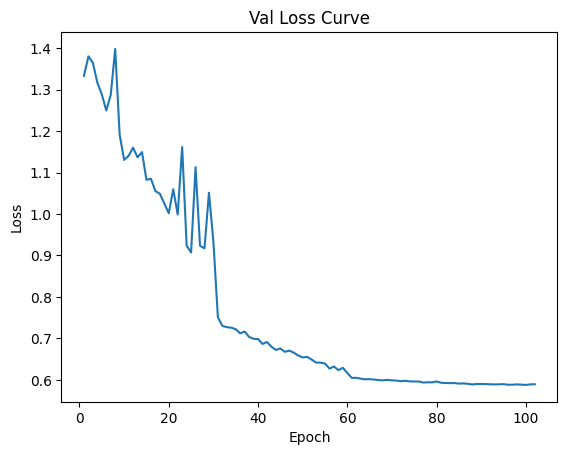

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.19s/it]


Average Adversary epoch loss: 0.11281674040051606


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 103/200*****
*****Train Loss:  0.604479 Val Loss:  0.588159*****
*****Validation Accuracy: 62.93%*****
*****Total Avg Disparity: 0.09728818820583504*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.22362869198312235
Class Cheering: Recall Difference = 0.057330827067669204
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = 0.02304147465437789
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.10753922694221207
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476190476190466
Cl

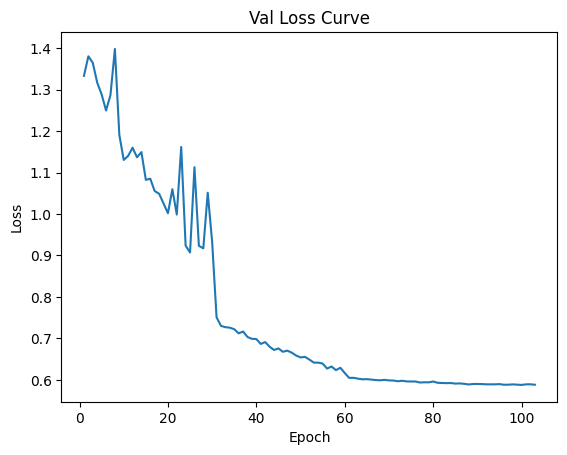

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11358767776535107


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 104/200*****
*****Train Loss:  0.609053 Val Loss:  0.588492*****
*****Validation Accuracy: 63.08%*****
*****Total Avg Disparity: 0.0947902478268318*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.009216589861751112
Class Couple: Recall Difference = 0.31071913161465403
Class Family_Group: Recall Difference = -0.09471871412169924
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476

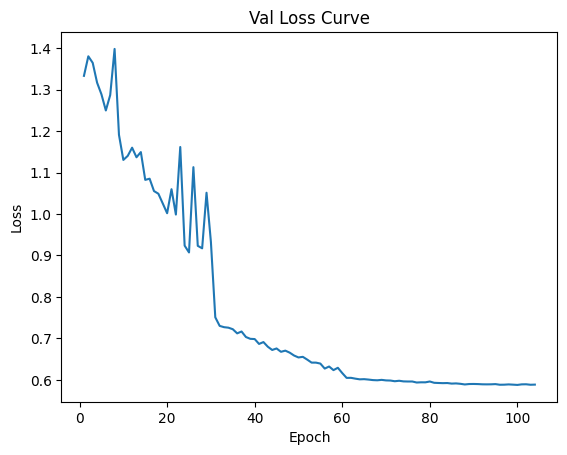

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11339793612177555


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 105/200*****
*****Train Loss:  0.604064 Val Loss:  0.589180*****
*****Validation Accuracy: 62.93%*****
*****Total Avg Disparity: 0.09775267313045649*****

Class Parade: Recall Difference = -0.034937376400790976
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = 0.011136712749616029
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.09471871412169924
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476

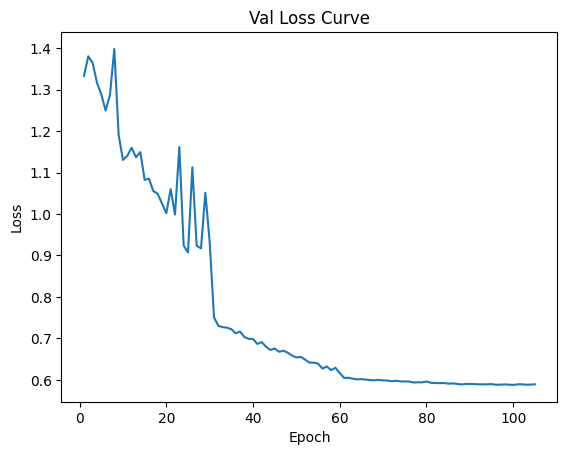

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11234051820177299


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 106/200*****
*****Train Loss:  0.602326 Val Loss:  0.588151*****
*****Validation Accuracy: 62.96%*****
*****Total Avg Disparity: 0.0970265232020371*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.13095238095238104
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.075187969924812
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = 0.011136712749616029
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.10964408725602748
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.154761

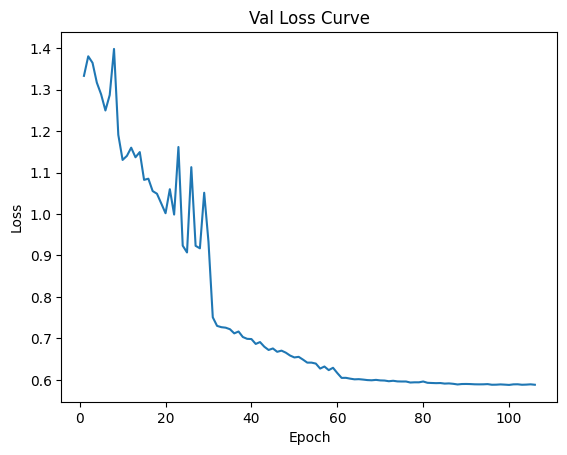

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11372486129403114


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 107/200*****
*****Train Loss:  0.601869 Val Loss:  0.588885*****
*****Validation Accuracy: 62.90%*****
*****Total Avg Disparity: 0.0924502012282004*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.04125177809388336
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.0007680491551458335
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.09471871412169924
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.154

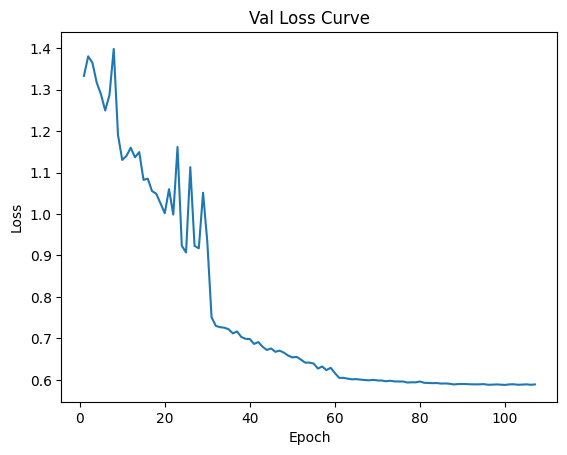

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11361176148056984


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 108/200*****
*****Train Loss:  0.605008 Val Loss:  0.587883*****
*****Validation Accuracy: 62.87%*****
*****Total Avg Disparity: 0.09192118140579959*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = -0.0007680491551459445
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.1203597397627248
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15

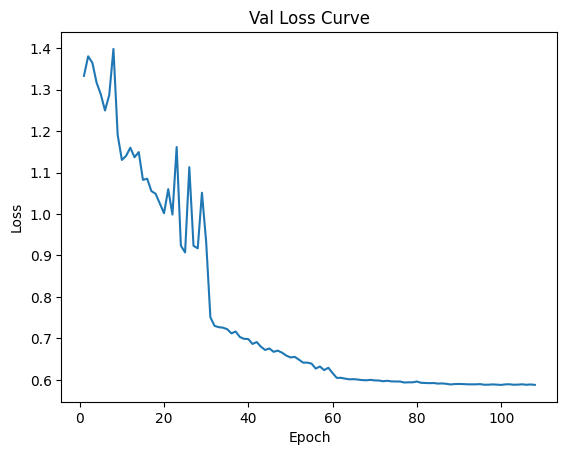

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11368356358546478


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 109/200*****
*****Train Loss:  0.605332 Val Loss:  0.588664*****
*****Validation Accuracy: 63.05%*****
*****Total Avg Disparity: 0.09689293485274307*****

Class Parade: Recall Difference = -0.026807295099977924
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.19038461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.01113671274961614
Class Couple: Recall Difference = 0.31071913161465403
Class Family_Group: Recall Difference = -0.09471871412169924
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.154761

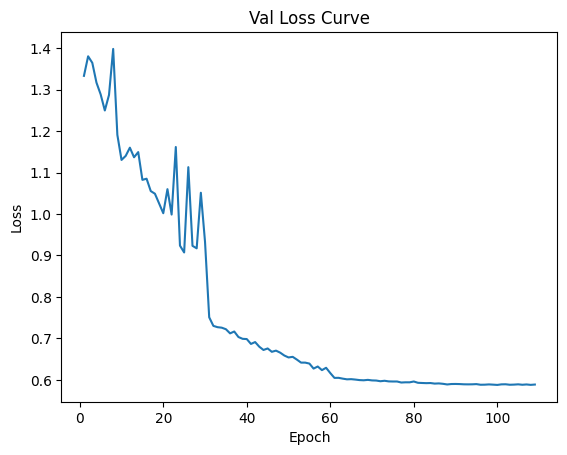

Data has been appended to validation_0.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11311121628834651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 110/200*****
*****Train Loss:  0.601131 Val Loss:  0.588706*****
*****Validation Accuracy: 62.81%*****
*****Total Avg Disparity: 0.09453844629248699*****

Class Parade: Recall Difference = -0.034937376400790976
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.05879563774300617
Class Dancing: Recall Difference = 0.11309523809523814
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.07518796992481205
Class Meeting: Recall Difference = 0.20576923076923082
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.024109014675052387
Class Concerts: Recall Difference = 0.011136712749616029
Class Couple: Recall Difference = 0.28086838534599723
Class Family_Group: Recall Difference = -0.09471871412169924
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476190476190466
Cla

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:55<00:00,  4.44s/it]


*******Epoch 0: loss - 1.3791915820195124


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:56<00:00,  4.48s/it]


*******Epoch 1: loss - 1.3361539794848516


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:57<00:00,  4.50s/it]


*******Epoch 2: loss - 1.2781234291883616


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Pretrain Adversary epoch loss:  0.18802724721340033


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Pretrain Adversary epoch loss:  0.13320416097457594


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Pretrain Adversary epoch loss:  0.126403470738576


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.12453552536093272


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 1/200*****
*****Train Loss:  1.115137 Val Loss:  1.288797*****
*****Validation Accuracy: 19.40%*****
*****Total Avg Disparity: 0.05272980719348299*****

Class Parade: Recall Difference = 0.026312898264117757
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.0
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.07488479262672815
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.0
Class Soldier_Patrol: Recall Difference = -0.0588235294117647
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.07200837915684734
Class Running: Recall Difference = 0.0
Clas

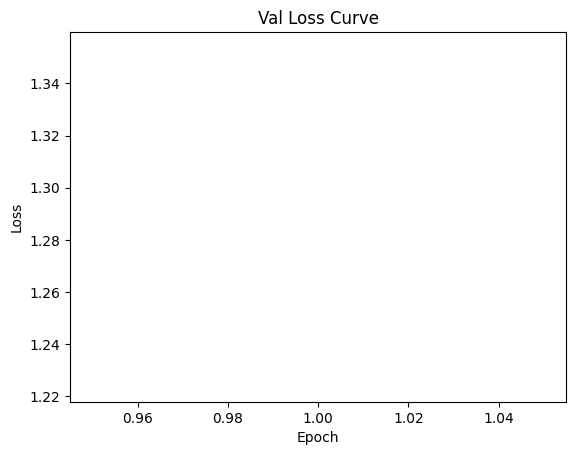

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12664553695000136


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 2/200*****
*****Train Loss:  1.077372 Val Loss:  1.245951*****
*****Validation Accuracy: 22.04%*****
*****Total Avg Disparity: 0.0916747172089588*****

Class Parade: Recall Difference = 0.08926609536365648
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.07823613086770982
Class Dancing: Recall Difference = -0.0029761904761904726
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.12596006144393243
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = -0.0606060606060606
Class Soldier_Patrol: Recall Difference = -0.03202614379084967
Class Spa: Recall Difference = -0.02380952380952381
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Differenc

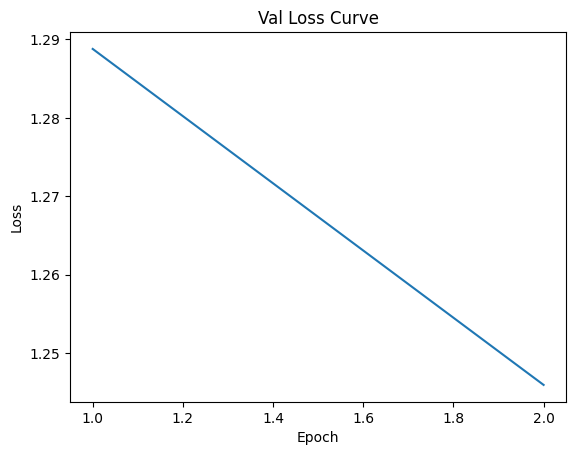

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.20s/it]


Average Adversary epoch loss: 0.12383134835041486


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 3/200*****
*****Train Loss:  1.051996 Val Loss:  1.220282*****
*****Validation Accuracy: 24.07%*****
*****Total Avg Disparity: 0.0434978973774748*****

Class Parade: Recall Difference = -0.0006042627993846361
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.016121384542437167
Class Dancing: Recall Difference = -0.002976190476190476
Class Funeral: Recall Difference = -0.003616636528028905
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.029807692307692313
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.027777777777777776
Class Concerts: Recall Difference = 0.015360983102918585
Class Couple: Recall Difference = 0.08955223880597016
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.024475524475524466
Class Soldier_Patrol: Recall Difference = -0.005228758169934622
Class Spa: Recall Difference = -0.023809523809523808
Class Sports_Fan: Recall Difference = 0.0
Cla

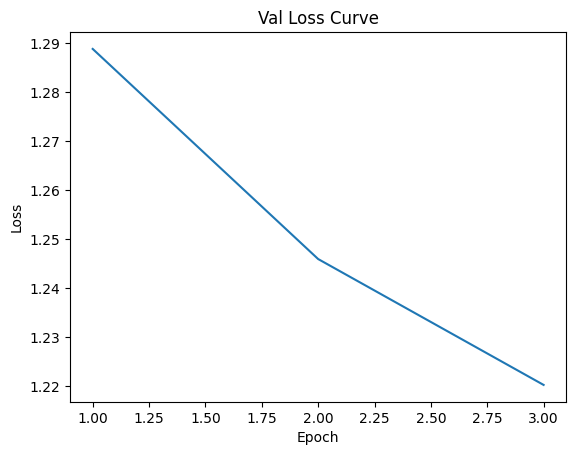

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.12378518655896187


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 4/200*****
*****Train Loss:  1.032880 Val Loss:  1.216240*****
*****Validation Accuracy: 23.86%*****
*****Total Avg Disparity: 0.06846762329597504*****

Class Parade: Recall Difference = 0.1585365853658537
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.001422475106685639
Class Dancing: Recall Difference = 0.011904761904761911
Class Funeral: Recall Difference = 0.044002411091018684
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.047115384615384615
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.01781970649895178
Class Concerts: Recall Difference = 0.12788018433179724
Class Couple: Recall Difference = 0.014925373134328354
Class Family_Group: Recall Difference = 0.017030233448143892
Class Picnic: Recall Difference = 0.09324009324009322
Class Soldier_Patrol: Recall Difference = -0.013071895424836555
Class Spa: Recall Difference = -0.047619047619047616
Class Sports_Fan: Recall Differen

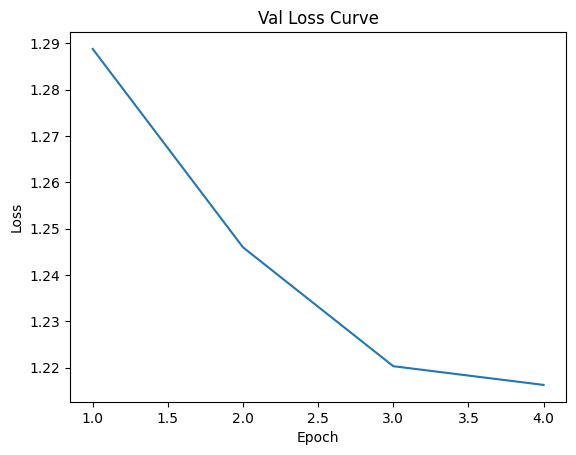

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.12178303559239094


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 5/200*****
*****Train Loss:  1.008609 Val Loss:  1.175417*****
*****Validation Accuracy: 25.69%*****
*****Total Avg Disparity: 0.08020952958745556*****

Class Parade: Recall Difference = 0.0728960667985058
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.08487434803224281
Class Dancing: Recall Difference = -0.005952380952380952
Class Funeral: Recall Difference = 0.006027727546714906
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.0019230769230769301
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.006912442396313376
Class Couple: Recall Difference = 0.11940298507462686
Class Family_Group: Recall Difference = 0.004209720627631069
Class Picnic: Recall Difference = 0.09324009324009322
Class Soldier_Patrol: Recall Difference = 0.06274509803921591
Class Spa: Recall Difference = -0.14285714285714285
Class Sports_Fan: Recall Difference = 0.0
Class Surge

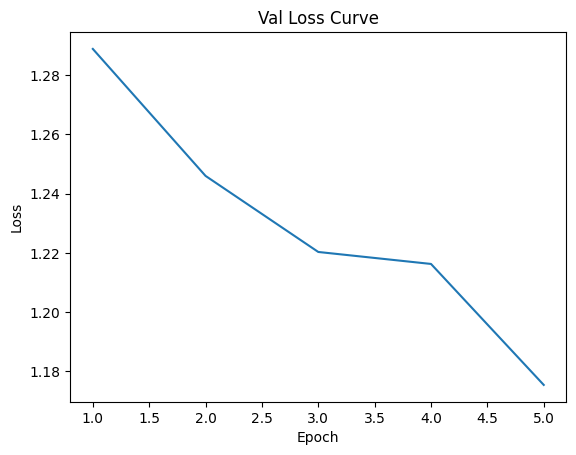

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.12193231427898774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 6/200*****
*****Train Loss:  0.996059 Val Loss:  1.188883*****
*****Validation Accuracy: 25.72%*****
*****Total Avg Disparity: 0.06748268146845204*****

Class Parade: Recall Difference = -0.0003845308723356977
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.03273809523809525
Class Funeral: Recall Difference = 0.11392405063291139
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.2048076923076923
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.009958071278825996
Class Concerts: Recall Difference = 0.07142857142857142
Class Couple: Recall Difference = 0.10312075983717776
Class Family_Group: Recall Difference = -0.004401071565250679
Class Picnic: Recall Difference = -0.011655011655011677
Class Soldier_Patrol: Recall Difference = 0.09477124183006541
Class Spa: Recall Difference = -0.1071428571428572
Class Sports_Fan: Recall Difference = 0.0
Class Surge

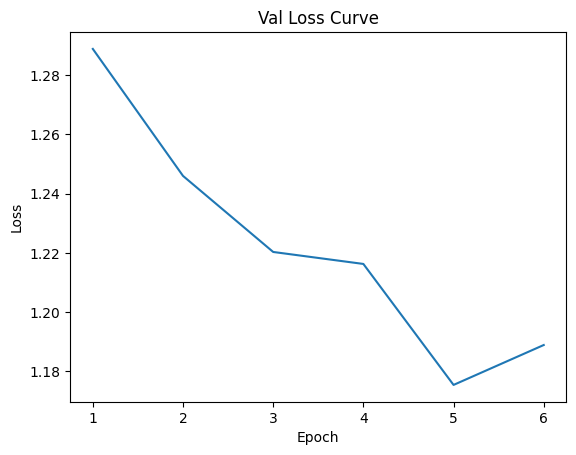

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12096528651622626


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


*****Epoch 7/200*****
*****Train Loss:  0.980192 Val Loss:  1.167942*****
*****Validation Accuracy: 26.79%*****
*****Total Avg Disparity: 0.06946056205134055*****

Class Parade: Recall Difference = 0.022632388486046984
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.03273809523809524
Class Funeral: Recall Difference = 0.018685955394816142
Class Cheering: Recall Difference = 0.017857142857142856
Class Meeting: Recall Difference = 0.07692307692307694
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.018867924528301886
Class Concerts: Recall Difference = 0.09869431643625196
Class Couple: Recall Difference = 0.07327001356852103
Class Family_Group: Recall Difference = -0.021622655951014133
Class Picnic: Recall Difference = -0.019813519813519836
Class Soldier_Patrol: Recall Difference = 0.10588235294117637
Class Spa: Recall Difference = -0.18452380952380953
Class Sports_Fan: Recall Difference 

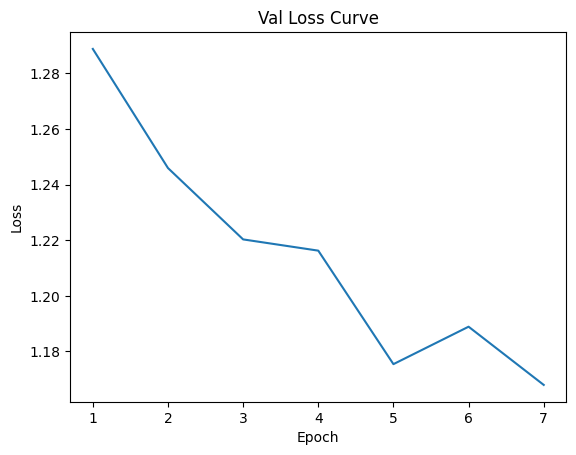

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.12036487316856018


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 8/200*****
*****Train Loss:  0.967650 Val Loss:  1.153113*****
*****Validation Accuracy: 27.45%*****
*****Total Avg Disparity: 0.06189750498704247*****

Class Parade: Recall Difference = 0.022522522522522515
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.049786628733997196
Class Dancing: Recall Difference = 0.03273809523809523
Class Funeral: Recall Difference = -0.028933092224231446
Class Cheering: Recall Difference = 0.017857142857142856
Class Meeting: Recall Difference = -0.06346153846153846
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.027777777777777776
Class Concerts: Recall Difference = 0.00691244239631339
Class Couple: Recall Difference = 0.05970149253731342
Class Family_Group: Recall Difference = 0.019135093761959432
Class Picnic: Recall Difference = -0.04195804195804198
Class Soldier_Patrol: Recall Difference = 0.07058823529411773
Class Spa: Recall Difference = 0.005952380952380931
Class Sports_Fan: 

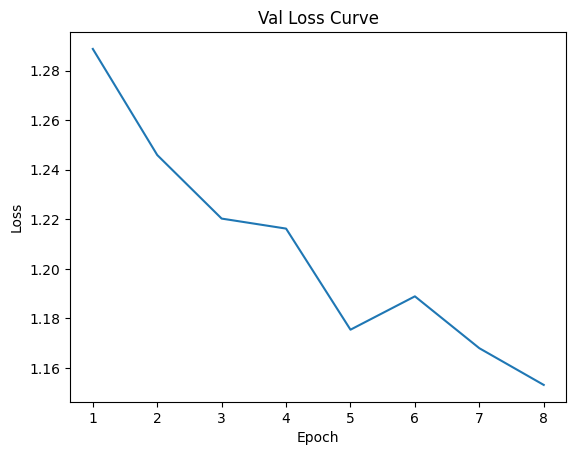

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:48<00:00,  4.18s/it]


Average Adversary epoch loss: 0.12224501829880935


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 9/200*****
*****Train Loss:  0.954726 Val Loss:  1.125497*****
*****Validation Accuracy: 29.66%*****
*****Total Avg Disparity: 0.06955532072737003*****

Class Parade: Recall Difference = -0.07459898923313557
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.02418207681365575
Class Dancing: Recall Difference = 0.03571428571428574
Class Funeral: Recall Difference = 0.0657022302591923
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = -0.03365384615384612
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.028825995807127892
Class Concerts: Recall Difference = 0.06682027649769595
Class Couple: Recall Difference = 0.13432835820895525
Class Family_Group: Recall Difference = -0.01951779563719863
Class Picnic: Recall Difference = 0.05710955710955709
Class Soldier_Patrol: Recall Difference = 0.1026143790849674
Class Spa: Recall Difference = 0.07738095238095238
Class Sports_Fan: Recall Di

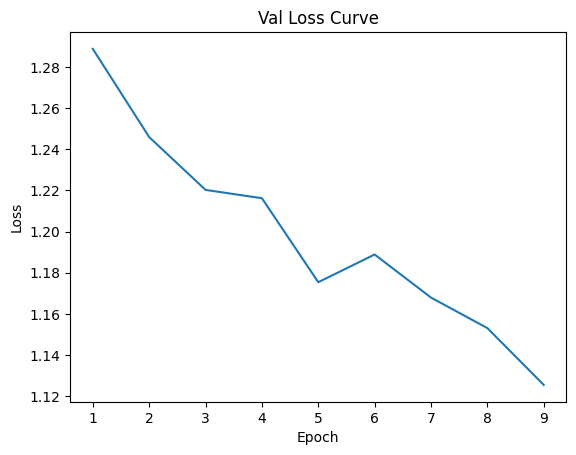

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12145088870938008


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.13s/it]


*****Epoch 10/200*****
*****Train Loss:  0.927233 Val Loss:  1.123518*****
*****Validation Accuracy: 29.05%*****
*****Total Avg Disparity: 0.07653038501806747*****

Class Parade: Recall Difference = -0.03658536585365846
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.025604551920341397
Class Dancing: Recall Difference = 0.03273809523809524
Class Funeral: Recall Difference = 0.006027727546714906
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = -0.04807692307692306
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.019916142557651992
Class Concerts: Recall Difference = -0.01689708141321042
Class Couple: Recall Difference = 0.13432835820895522
Class Family_Group: Recall Difference = -0.04286261002678913
Class Picnic: Recall Difference = 0.04312354312354311
Class Soldier_Patrol: Recall Difference = -0.007189542483660105
Class Spa: Recall Difference = 0.20833333333333334
Class Sports_Fan: R

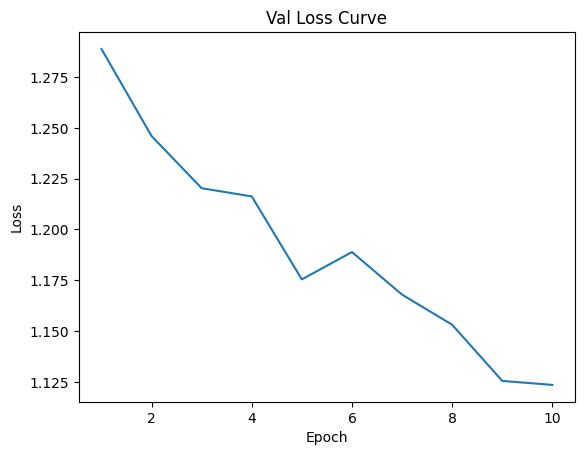

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.12207434297754215


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 11/200*****
*****Train Loss:  0.916270 Val Loss:  1.135255*****
*****Validation Accuracy: 28.29%*****
*****Total Avg Disparity: 0.05593628768871873*****

Class Parade: Recall Difference = -0.024664908811250275
Class Handshaking: Recall Difference = 0.017857142857142856
Class Riot: Recall Difference = 0.013276434329065917
Class Dancing: Recall Difference = -0.008928571428571452
Class Funeral: Recall Difference = -0.03194695599758891
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = -0.06346153846153846
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03773584905660377
Class Concerts: Recall Difference = -0.05760368663594469
Class Couple: Recall Difference = -0.031207598371777487
Class Family_Group: Recall Difference = 0.012629161882893217
Class Picnic: Recall Difference = -0.017482517482517557
Class Soldier_Patrol: Recall Difference = -0.04705882352941171
Class Spa: Recall Difference = 0.011904761904761

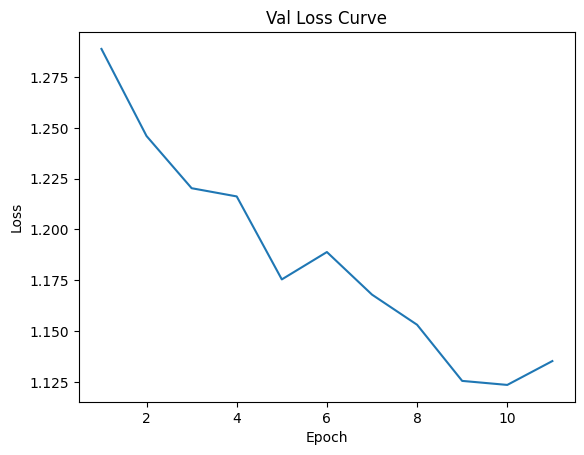

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12090212393265504


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 12/200*****
*****Train Loss:  0.906088 Val Loss:  1.186316*****
*****Validation Accuracy: 26.53%*****
*****Total Avg Disparity: 0.07652469264165289*****

Class Parade: Recall Difference = 0.005438365194462835
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.060692271218587036
Class Dancing: Recall Difference = -0.002976190476190549
Class Funeral: Recall Difference = -0.019288728149487636
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = 0.09134615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.05450733752620544
Class Concerts: Recall Difference = 0.05798771121351769
Class Couple: Recall Difference = 0.08955223880597016
Class Family_Group: Recall Difference = -0.027937236892460762
Class Picnic: Recall Difference = 0.05710955710955712
Class Soldier_Patrol: Recall Difference = 0.0503267973856209
Class Spa: Recall Difference = 0.25595238095238093
Class Sports_Fan: Re

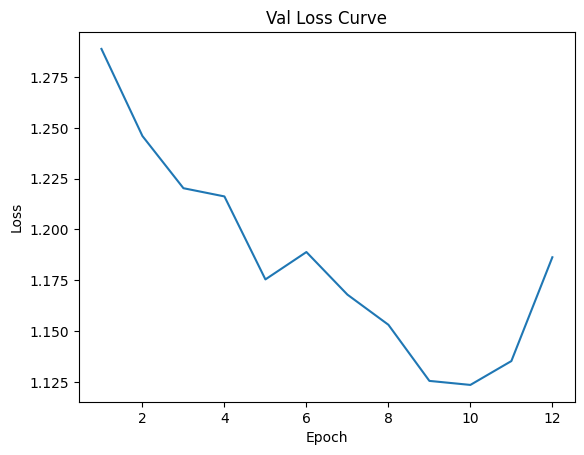

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.12016369488376838


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 13/200*****
*****Train Loss:  0.895541 Val Loss:  1.125690*****
*****Validation Accuracy: 30.99%*****
*****Total Avg Disparity: 0.08642950085402688*****

Class Parade: Recall Difference = -0.08684904416611727
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.01754385964912281
Class Dancing: Recall Difference = 0.029761904761904753
Class Funeral: Recall Difference = 0.06630500301386377
Class Cheering: Recall Difference = 0.009398496240601507
Class Meeting: Recall Difference = 0.15096153846153848
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.011006289308176126
Class Concerts: Recall Difference = -0.05760368663594469
Class Couple: Recall Difference = 0.0719131614654003
Class Family_Group: Recall Difference = -0.17757367011098354
Class Picnic: Recall Difference = -0.03379953379953382
Class Soldier_Patrol: Recall Difference = -0.10588235294117643
Class Spa: Recall Difference = 0.16666666666666663
Class

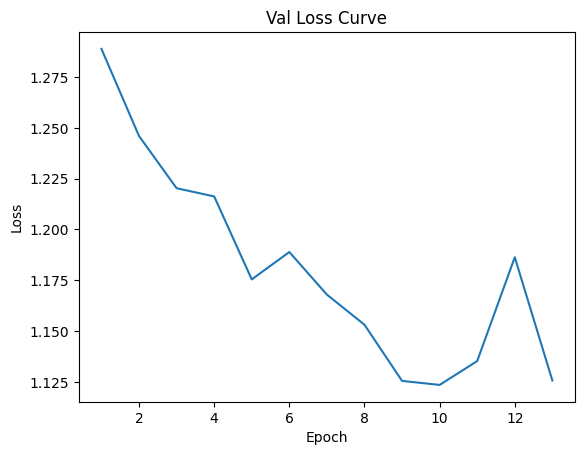

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12095013346809608


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 14/200*****
*****Train Loss:  0.886054 Val Loss:  1.067041*****
*****Validation Accuracy: 32.96%*****
*****Total Avg Disparity: 0.07754186130818937*****

Class Parade: Recall Difference = -0.051472203911228365
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = -0.02844950213371266
Class Dancing: Recall Difference = -0.03869047619047619
Class Funeral: Recall Difference = 0.09764918625678115
Class Cheering: Recall Difference = 0.009398496240601507
Class Meeting: Recall Difference = 0.042307692307692324
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03878406708595389
Class Concerts: Recall Difference = 0.052995391705069145
Class Couple: Recall Difference = -0.02035278154681136
Class Family_Group: Recall Difference = -0.06448526597780338
Class Picnic: Recall Difference = 0.023310023310023298
Class Soldier_Patrol: Recall Difference = -0.12352941176470567
Class Spa: Recall Difference = 0.30952380952380953
C

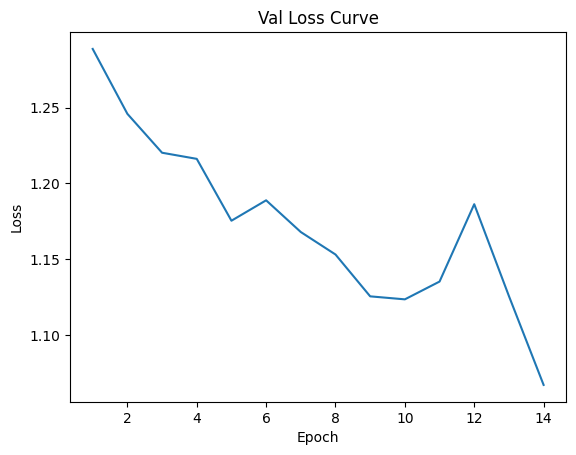

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11929971094314869


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 15/200*****
*****Train Loss:  0.868053 Val Loss:  1.026787*****
*****Validation Accuracy: 36.08%*****
*****Total Avg Disparity: 0.06776765074712887*****

Class Parade: Recall Difference = -0.06679850582289626
Class Handshaking: Recall Difference = -0.017857142857142842
Class Riot: Recall Difference = -0.004267425320056889
Class Dancing: Recall Difference = 0.09226190476190475
Class Funeral: Recall Difference = 0.14526823387582882
Class Cheering: Recall Difference = 0.03571428571428571
Class Meeting: Recall Difference = -0.053846153846153766
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.039832285115303984
Class Concerts: Recall Difference = 0.010752688172043057
Class Couple: Recall Difference = 0.042062415196743586
Class Family_Group: Recall Difference = -0.10084194412552627
Class Picnic: Recall Difference = 0.02331002331002341
Class Soldier_Patrol: Recall Difference = -0.07908496732026149
Class Spa: Recall Difference = 0.22023809523809507


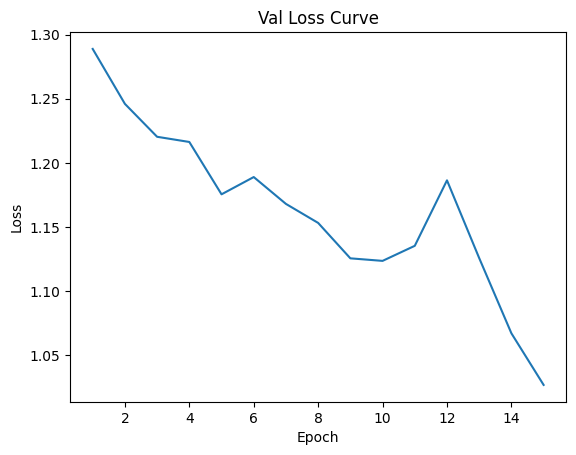

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11900289729237556


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 16/200*****
*****Train Loss:  0.858392 Val Loss:  1.034733*****
*****Validation Accuracy: 35.56%*****
*****Total Avg Disparity: 0.102846113013329*****

Class Parade: Recall Difference = -0.10722918039991203
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.02418207681365575
Class Dancing: Recall Difference = 0.06547619047619052
Class Funeral: Recall Difference = 0.12236286919831219
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.08846153846153856
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.007861635220125784
Class Concerts: Recall Difference = 0.05645161290322581
Class Couple: Recall Difference = 0.101763907734057
Class Family_Group: Recall Difference = -0.10715652506697279
Class Picnic: Recall Difference = 0.1363636363636363
Class Soldier_Patrol: Recall Difference = -0.0169934640522873
Class Spa: Recall Difference = 0.30952380952380953
Class Sports_Fan: Recall Diff

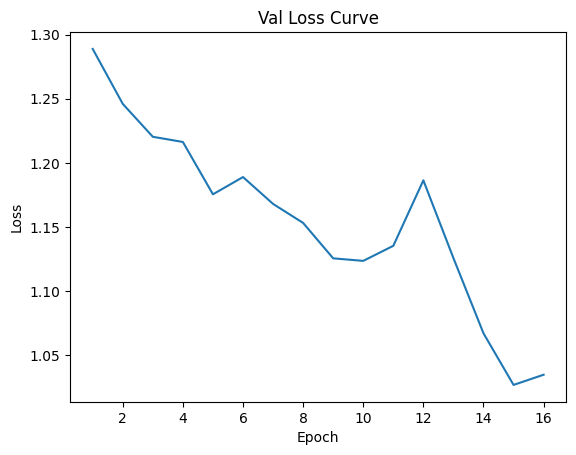

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11808145877260429


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 17/200*****
*****Train Loss:  0.845364 Val Loss:  1.019062*****
*****Validation Accuracy: 34.81%*****
*****Total Avg Disparity: 0.0765403770736704*****

Class Parade: Recall Difference = -0.13172929026587576
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.07396870554765295
Class Dancing: Recall Difference = -0.005952380952380959
Class Funeral: Recall Difference = 0.16033755274261619
Class Cheering: Recall Difference = -0.00845864661654135
Class Meeting: Recall Difference = 0.07115384615384629
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.007861635220125798
Class Concerts: Recall Difference = 0.0768049155145929
Class Couple: Recall Difference = 0.010854816824966085
Class Family_Group: Recall Difference = -0.004401071565250679
Class Picnic: Recall Difference = -0.10256410256410256
Class Soldier_Patrol: Recall Difference = 0.06732026143790859
Class Spa: Recall Difference = 0.13690476190476186
Class Sports_Fan: Re

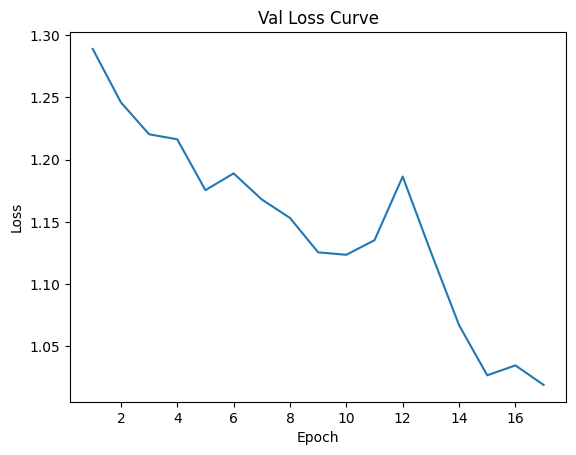

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11958348321226928


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 18/200*****
*****Train Loss:  0.833039 Val Loss:  0.963627*****
*****Validation Accuracy: 37.45%*****
*****Total Avg Disparity: 0.07686908460370916*****

Class Parade: Recall Difference = 0.02367611513952972
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.08392603129445236
Class Dancing: Recall Difference = -0.0029761904761904934
Class Funeral: Recall Difference = 0.13261000602772754
Class Cheering: Recall Difference = 0.027255639097744366
Class Meeting: Recall Difference = 0.05576923076923085
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.01991614255765202
Class Concerts: Recall Difference = 0.029185867895545337
Class Couple: Recall Difference = 0.19402985074626866
Class Family_Group: Recall Difference = -0.04075774971297358
Class Picnic: Recall Difference = 0.06759906759906759
Class Soldier_Patrol: Recall Difference = -0.02941176470588236
Class Spa: Recall Difference = 0.07142857142857145
Class Sports_Fan: Re

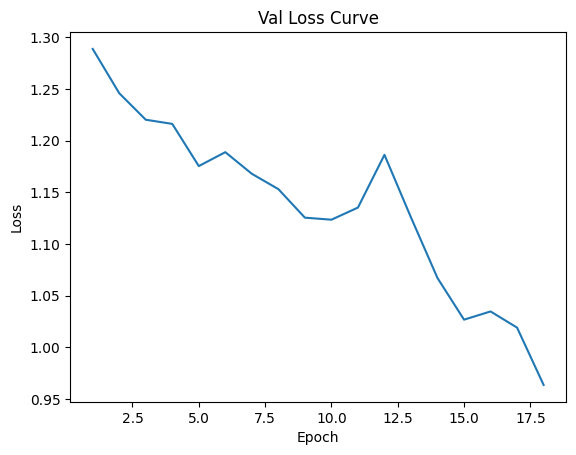

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11850735344565831


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 19/200*****
*****Train Loss:  0.821424 Val Loss:  0.983580*****
*****Validation Accuracy: 36.61%*****
*****Total Avg Disparity: 0.0951981664797754*****

Class Parade: Recall Difference = -0.05789936277741159
Class Handshaking: Recall Difference = 1.3877787807814457e-17
Class Riot: Recall Difference = 0.043148411569464196
Class Dancing: Recall Difference = 0.05952380952380955
Class Funeral: Recall Difference = 0.22121760096443643
Class Cheering: Recall Difference = 0.01879699248120302
Class Meeting: Recall Difference = 0.04038461538461541
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03773584905660377
Class Concerts: Recall Difference = 0.04800307219662067
Class Couple: Recall Difference = 0.17639077340569884
Class Family_Group: Recall Difference = -0.062189054726368154
Class Picnic: Recall Difference = -0.1491841491841492
Class Soldier_Patrol: Recall Difference = 0.05294117647058816
Class Spa: Recall Difference = 0.2202380952380953
Class S

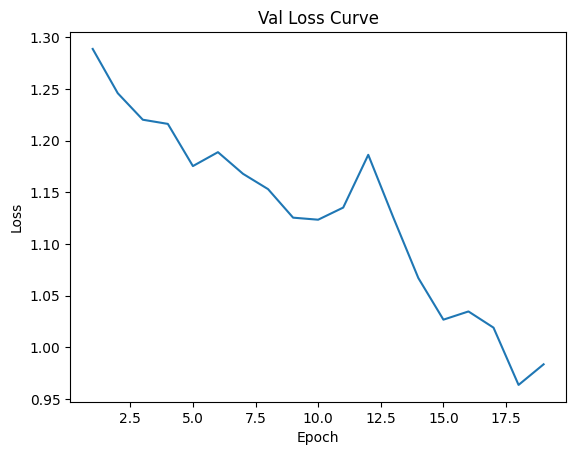

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11862606096726197


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 20/200*****
*****Train Loss:  0.800548 Val Loss:  0.935876*****
*****Validation Accuracy: 38.89%*****
*****Total Avg Disparity: 0.08858753641032502*****

Class Parade: Recall Difference = -0.05718523401450237
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.07396870554765297
Class Dancing: Recall Difference = -0.05952380952380951
Class Funeral: Recall Difference = 0.1422543701024714
Class Cheering: Recall Difference = 0.03571428571428571
Class Meeting: Recall Difference = -0.04038461538461535
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.009958071278825996
Class Concerts: Recall Difference = 0.1774193548387097
Class Couple: Recall Difference = 0.2075983717774763
Class Family_Group: Recall Difference = 0.0019135093761959293
Class Picnic: Recall Difference = 0.02913752913752915
Class Soldier_Patrol: Recall Difference = -0.05490196078431364
Class Spa: Recall Difference = 0.19642857142857129
Class Sp

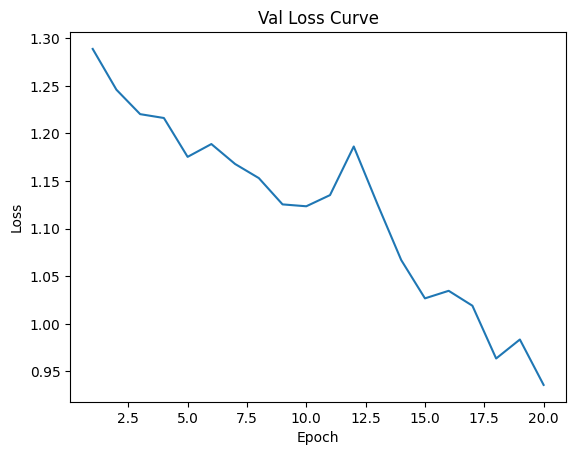

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11874263905561887


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 21/200*****
*****Train Loss:  0.801033 Val Loss:  0.946683*****
*****Validation Accuracy: 37.82%*****
*****Total Avg Disparity: 0.08417806635596867*****

Class Parade: Recall Difference = -0.11903977147879591
Class Handshaking: Recall Difference = 0.03571428571428572
Class Riot: Recall Difference = 0.005215742057847361
Class Dancing: Recall Difference = 0.059523809523809534
Class Funeral: Recall Difference = 0.10066305003013862
Class Cheering: Recall Difference = 0.027255639097744356
Class Meeting: Recall Difference = 0.08557692307692305
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03878406708595389
Class Concerts: Recall Difference = -0.00652841781874039
Class Couple: Recall Difference = 0.13297150610583447
Class Family_Group: Recall Difference = -0.04305396096440872
Class Picnic: Recall Difference = 0.026806526806526787
Class Soldier_Patrol: Recall Difference = 0.17712418300653582
Class Spa: Recall Difference = 0.17261904761904767
Class

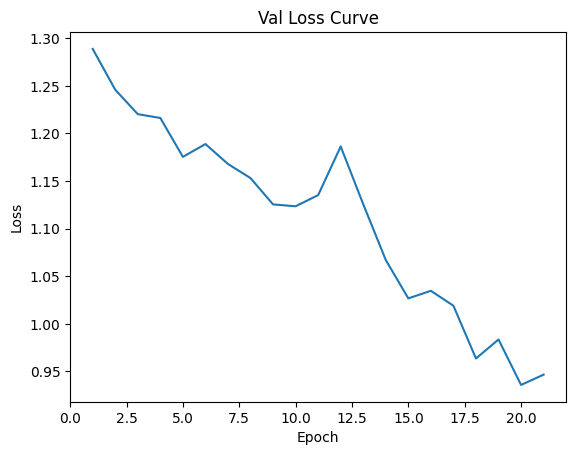

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11786013526412156


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 22/200*****
*****Train Loss:  0.788006 Val Loss:  0.895732*****
*****Validation Accuracy: 40.69%*****
*****Total Avg Disparity: 0.09057157606787972*****

Class Parade: Recall Difference = -0.0860250494396837
Class Handshaking: Recall Difference = 0.05357142857142857
Class Riot: Recall Difference = 0.17117117117117125
Class Dancing: Recall Difference = 0.005952380952380973
Class Funeral: Recall Difference = 0.03737191078963234
Class Cheering: Recall Difference = 0.017857142857142856
Class Meeting: Recall Difference = 0.13461538461538458
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.06761006289308176
Class Concerts: Recall Difference = 0.0019201228878648613
Class Couple: Recall Difference = 0.11804613297150611
Class Family_Group: Recall Difference = -0.017221584385763516
Class Picnic: Recall Difference = 0.03496503496503489
Class Soldier_Patrol: Recall Difference = 0.15490196078431379
Class Spa: Recall Difference = 0.14285714285714285
Class 

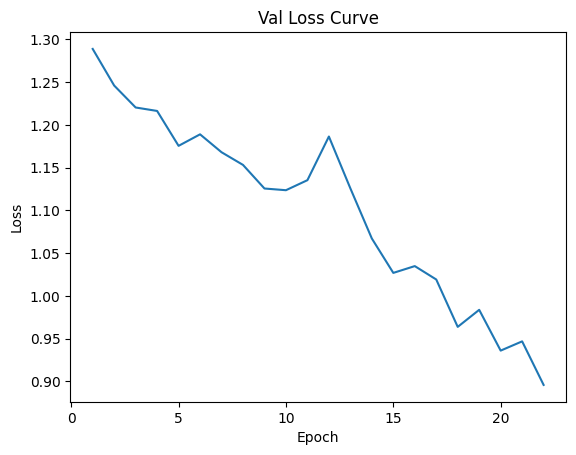

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.11971406667278363


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


*****Epoch 23/200*****
*****Train Loss:  0.775178 Val Loss:  0.939464*****
*****Validation Accuracy: 38.37%*****
*****Total Avg Disparity: 0.08293090124652223*****

Class Parade: Recall Difference = -0.024994506701823793
Class Handshaking: Recall Difference = 0.10714285714285714
Class Riot: Recall Difference = -0.04220009483167378
Class Dancing: Recall Difference = 0.05952380952380951
Class Funeral: Recall Difference = 0.10970464135021096
Class Cheering: Recall Difference = 0.02725563909774436
Class Meeting: Recall Difference = 0.04038461538461535
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.04559748427672954
Class Concerts: Recall Difference = -0.0353302611367127
Class Couple: Recall Difference = 0.2537313432835821
Class Family_Group: Recall Difference = -0.006697282816685773
Class Picnic: Recall Difference = -0.03379953379953382
Class Soldier_Patrol: Recall Difference = 0.09738562091503267
Class Spa: Recall Difference = 0.19047619047619047
Class 

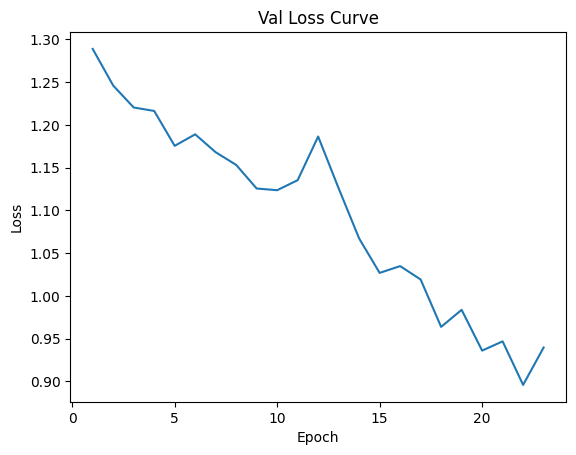

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11863014847040176


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 24/200*****
*****Train Loss:  0.759934 Val Loss:  0.911470*****
*****Validation Accuracy: 40.28%*****
*****Total Avg Disparity: 0.0727405305886378*****

Class Parade: Recall Difference = -0.0008239947264337966
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.12280701754385967
Class Dancing: Recall Difference = 0.03869047619047625
Class Funeral: Recall Difference = 0.09764918625678115
Class Cheering: Recall Difference = 0.07142857142857142
Class Meeting: Recall Difference = 0.009615384615384581
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.10639412997903569
Class Concerts: Recall Difference = 0.11751152073732722
Class Couple: Recall Difference = 0.17639077340569875
Class Family_Group: Recall Difference = 0.005931879066207457
Class Picnic: Recall Difference = -0.003496503496503489
Class Soldier_Patrol: Recall Difference = -0.06143790849673203
Class Spa: Recall Difference = 0.15476190476190477
Class

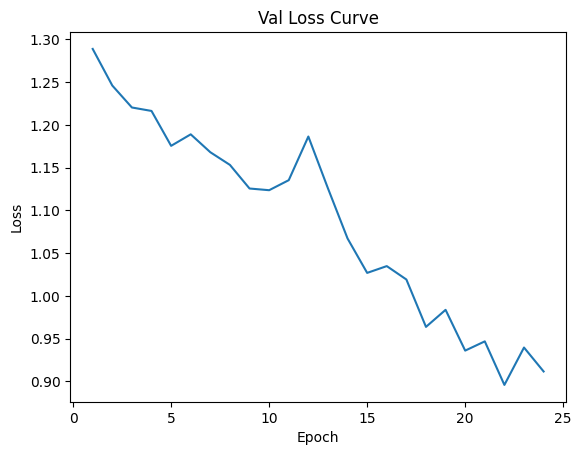

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.11853245072639905


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 25/200*****
*****Train Loss:  0.742221 Val Loss:  0.841895*****
*****Validation Accuracy: 43.09%*****
*****Total Avg Disparity: 0.08927658645733917*****

Class Parade: Recall Difference = -0.143869479235333
Class Handshaking: Recall Difference = -0.07142857142857145
Class Riot: Recall Difference = -0.0369843527738265
Class Dancing: Recall Difference = 0.023809523809523808
Class Funeral: Recall Difference = 0.21458710066305015
Class Cheering: Recall Difference = 0.09962406015037599
Class Meeting: Recall Difference = 0.005769230769230971
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03878406708595389
Class Concerts: Recall Difference = 0.0925499231950847
Class Couple: Recall Difference = 0.1614654002713705
Class Family_Group: Recall Difference = -0.07539226942212018
Class Picnic: Recall Difference = -0.0839160839160839
Class Soldier_Patrol: Recall Difference = -0.0091503267973857
Class Spa: Recall Difference = -0.13690476190476192
Class Spor

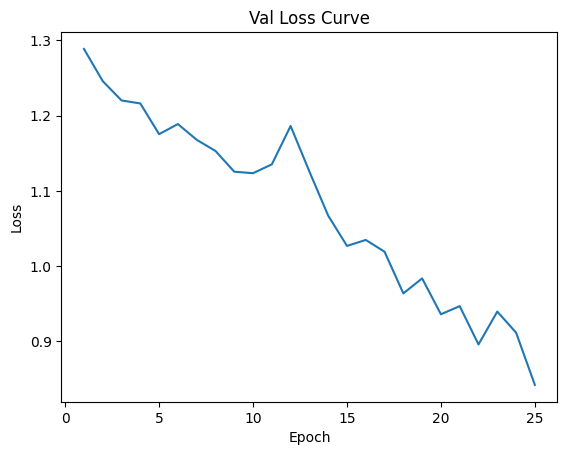

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12160916655109479


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 26/200*****
*****Train Loss:  0.738993 Val Loss:  0.874112*****
*****Validation Accuracy: 41.21%*****
*****Total Avg Disparity: 0.0742296167596019*****

Class Parade: Recall Difference = -0.11557899362777424
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = -0.010905642484589861
Class Dancing: Recall Difference = 0.06547619047619047
Class Funeral: Recall Difference = 0.19590114526823382
Class Cheering: Recall Difference = 0.07142857142857142
Class Meeting: Recall Difference = 0.08846153846153856
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.023060796645702375
Class Concerts: Recall Difference = 0.031105990783410198
Class Couple: Recall Difference = 0.22252374491180457
Class Family_Group: Recall Difference = -0.0794106391121317
Class Picnic: Recall Difference = 0.0815850815850816
Class Soldier_Patrol: Recall Difference = -0.10392156862745106
Class Spa: Recall Difference = 0.09523809523809518
Class S

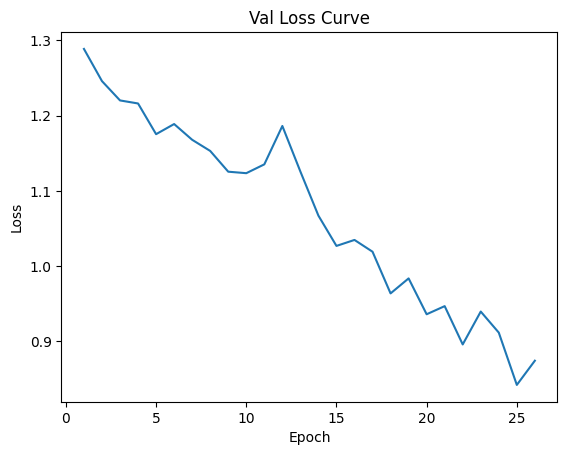

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11915969447447704


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 27/200*****
*****Train Loss:  0.731878 Val Loss:  0.921864*****
*****Validation Accuracy: 38.95%*****
*****Total Avg Disparity: 0.0682604206626695*****

Class Parade: Recall Difference = -0.04493517908152056
Class Handshaking: Recall Difference = -0.10714285714285715
Class Riot: Recall Difference = -0.032716927453769584
Class Dancing: Recall Difference = 0.011904761904761904
Class Funeral: Recall Difference = 0.04098854731766125
Class Cheering: Recall Difference = -0.01503759398496246
Class Meeting: Recall Difference = -0.14711538461538454
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.00890985324947589
Class Concerts: Recall Difference = -0.03878648233486942
Class Couple: Recall Difference = 0.11804613297150607
Class Family_Group: Recall Difference = 0.029659395331037133
Class Picnic: Recall Difference = 0.026806526806526787
Class Soldier_Patrol: Recall Difference = -0.04901960784313697
Class Spa: Recall Difference = 0.0357142857142857
Cl

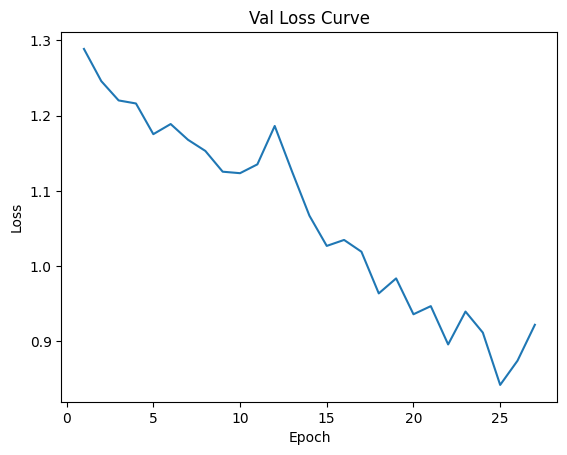

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11800281474223503


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 28/200*****
*****Train Loss:  0.715606 Val Loss:  0.846165*****
*****Validation Accuracy: 42.75%*****
*****Total Avg Disparity: 0.0989276918359018*****

Class Parade: Recall Difference = -0.0870687760931661
Class Handshaking: Recall Difference = 0.05357142857142857
Class Riot: Recall Difference = -0.020388809862494056
Class Dancing: Recall Difference = 0.08035714285714288
Class Funeral: Recall Difference = 0.22784810126582278
Class Cheering: Recall Difference = 0.027255639097744356
Class Meeting: Recall Difference = -0.021153846153846245
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.10534591194968551
Class Concerts: Recall Difference = 0.013824884792626752
Class Couple: Recall Difference = 0.22252374491180466
Class Family_Group: Recall Difference = -0.06869498660543433
Class Picnic: Recall Difference = 0.01282051282051283
Class Soldier_Patrol: Recall Difference = -0.04052287581699343
Class Spa: Recall Difference = 0.14880952380952372
Class

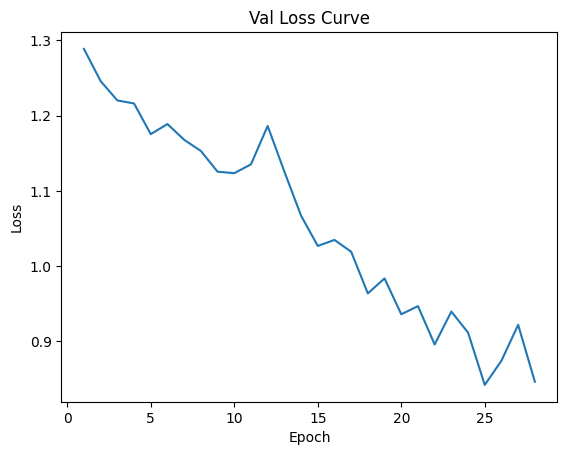

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.20s/it]


Average Adversary epoch loss: 0.11825975059316708


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 29/200*****
*****Train Loss:  0.699782 Val Loss:  0.863568*****
*****Validation Accuracy: 43.93%*****
*****Total Avg Disparity: 0.08630940395375121*****

Class Parade: Recall Difference = -0.007580751483190595
Class Handshaking: Recall Difference = -0.01785714285714285
Class Riot: Recall Difference = 0.11853959222380275
Class Dancing: Recall Difference = 0.08333333333333334
Class Funeral: Recall Difference = -0.0012055455093428757
Class Cheering: Recall Difference = 0.03571428571428572
Class Meeting: Recall Difference = 0.32019230769230766
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.004716981132075443
Class Concerts: Recall Difference = -0.08602150537634407
Class Couple: Recall Difference = 0.13161465400271377
Class Family_Group: Recall Difference = -0.05396096440872561
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.02941176470588225
Class Spa: Recall Difference = 0.31547619047619035
C

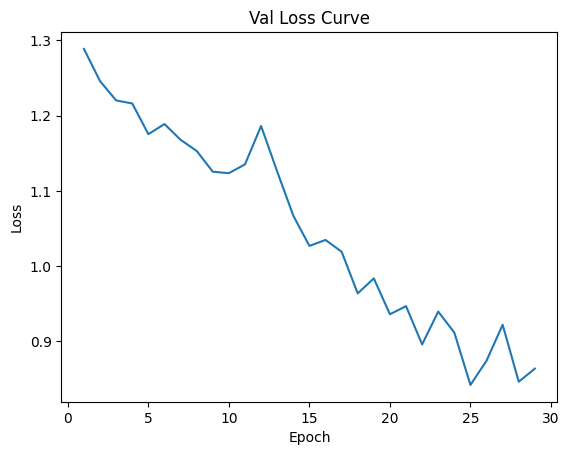

Data has been appended to validation_1.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.1168907370704871


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 30/200*****
*****Train Loss:  0.690206 Val Loss:  0.830908*****
*****Validation Accuracy: 43.76%*****
*****Total Avg Disparity: 0.10278008034205326*****

Class Parade: Recall Difference = -0.050428477257745574
Class Handshaking: Recall Difference = 0.05357142857142857
Class Riot: Recall Difference = -0.028449502133712674
Class Dancing: Recall Difference = 0.0654761904761905
Class Funeral: Recall Difference = 0.1735985533453888
Class Cheering: Recall Difference = 0.06390977443609021
Class Meeting: Recall Difference = -0.03750000000000003
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.12526205450733757
Class Concerts: Recall Difference = 0.051459293394777283
Class Couple: Recall Difference = 0.16146540027137044
Class Family_Group: Recall Difference = -0.10294680443934179
Class Picnic: Recall Difference = 0.18764568764568768
Class Soldier_Patrol: Recall Difference = 0.12941176470588234
Class Spa: Recall Difference = 0.07738095238095233
Class S

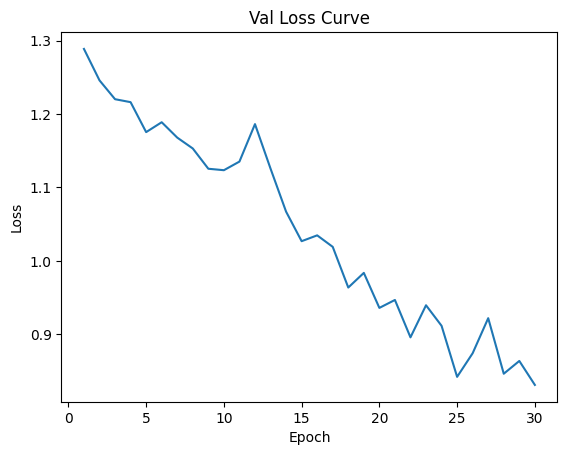

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.12140691710206178


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 31/200*****
*****Train Loss:  0.650684 Val Loss:  0.665721*****
*****Validation Accuracy: 55.49%*****
*****Total Avg Disparity: 0.09556185782863263*****

Class Parade: Recall Difference = -0.05910788837618097
Class Handshaking: Recall Difference = -0.035714285714285685
Class Riot: Recall Difference = 0.026552868658131834
Class Dancing: Recall Difference = 0.1636904761904763
Class Funeral: Recall Difference = -0.030138637733574336
Class Cheering: Recall Difference = 0.02913533834586468
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.03144654088050314
Class Concerts: Recall Difference = 0.08563748079877109
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.12456946039035582
Class Picnic: Recall Difference = 0.023310023310023298
Class Soldier_Patrol: Recall Difference = -0.0235294117647058
Class Spa: Recall Difference = 0.25
Class Sports_Fan: Re

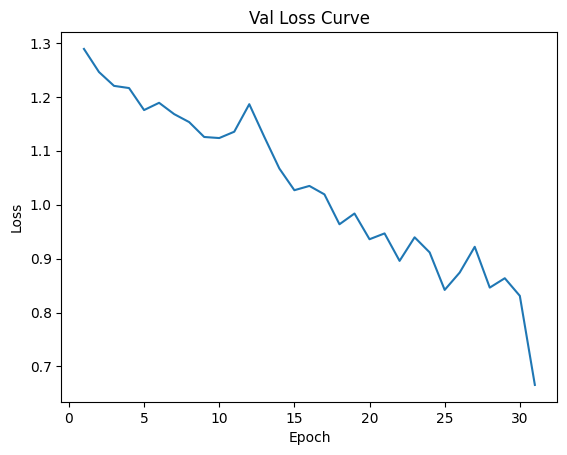

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11766251606436876


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 32/200*****
*****Train Loss:  0.633616 Val Loss:  0.648016*****
*****Validation Accuracy: 56.04%*****
*****Total Avg Disparity: 0.09439293898321761*****

Class Parade: Recall Difference = -0.052351131619424396
Class Handshaking: Recall Difference = -0.053571428571428575
Class Riot: Recall Difference = 0.017069701280227556
Class Dancing: Recall Difference = 0.10714285714285715
Class Funeral: Recall Difference = 0.21760096443640764
Class Cheering: Recall Difference = -0.015037593984962377
Class Meeting: Recall Difference = 0.09711538461538471
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.013626834381551378
Class Concerts: Recall Difference = 0.009216589861751223
Class Couple: Recall Difference = 0.23609226594301227
Class Family_Group: Recall Difference = -0.1180635285112897
Class Picnic: Recall Difference = 0.0011655011655011815
Class Soldier_Patrol: Recall Difference = -0.056862745098039014
Class Spa: Recall Difference = 0.0833333333333332

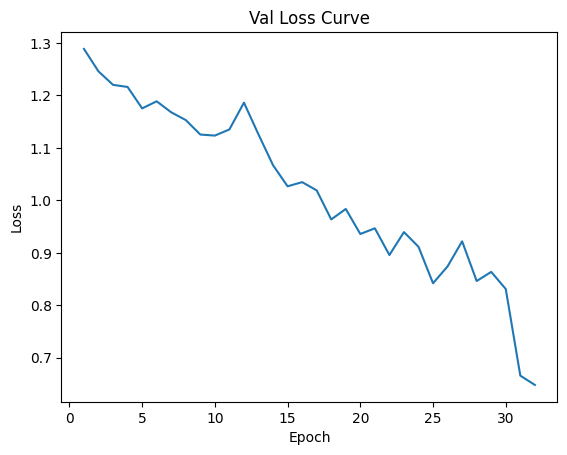

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11663919142805614


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 33/200*****
*****Train Loss:  0.625601 Val Loss:  0.640354*****
*****Validation Accuracy: 56.76%*****
*****Total Avg Disparity: 0.100158814269147*****

Class Parade: Recall Difference = -0.06449132058888174
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = -0.07207207207207211
Class Dancing: Recall Difference = 0.05357142857142849
Class Funeral: Recall Difference = 0.08740204942736601
Class Cheering: Recall Difference = -0.015037593984962405
Class Meeting: Recall Difference = 0.20673076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.06184486373165626
Class Concerts: Recall Difference = 0.09754224270353312
Class Couple: Recall Difference = 0.2510176390773406
Class Family_Group: Recall Difference = -0.10313815537696136
Class Picnic: Recall Difference = -0.06759906759906753
Class Soldier_Patrol: Recall Difference = -0.0823529411764704
Class Spa: Recall Difference = 0.1071428571428571
Class Spo

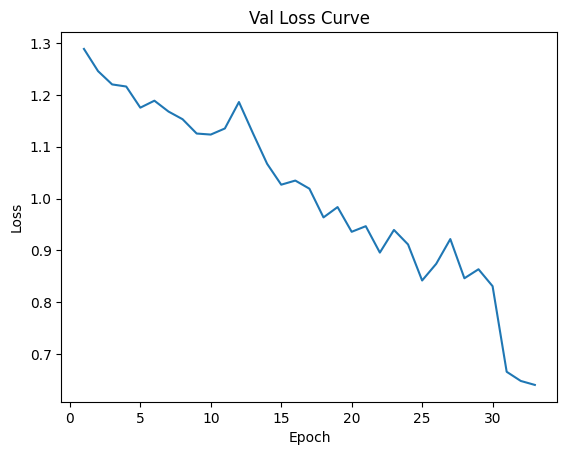

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11674163633814225


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 34/200*****
*****Train Loss:  0.629406 Val Loss:  0.637650*****
*****Validation Accuracy: 56.65%*****
*****Total Avg Disparity: 0.10373627113166048*****

Class Parade: Recall Difference = -0.0618545374642937
Class Handshaking: Recall Difference = -0.05357142857142855
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.14285714285714296
Class Funeral: Recall Difference = 0.07474382157926468
Class Cheering: Recall Difference = 0.02913533834586468
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.04192872117400426
Class Concerts: Recall Difference = 0.10099846390168982
Class Couple: Recall Difference = 0.26594301221166905
Class Family_Group: Recall Difference = -0.1285878300803674
Class Picnic: Recall Difference = -0.037296037296037254
Class Soldier_Patrol: Recall Difference = -0.0235294117647058
Class Spa: Recall Difference = 0.17857142857142838
Class Sp

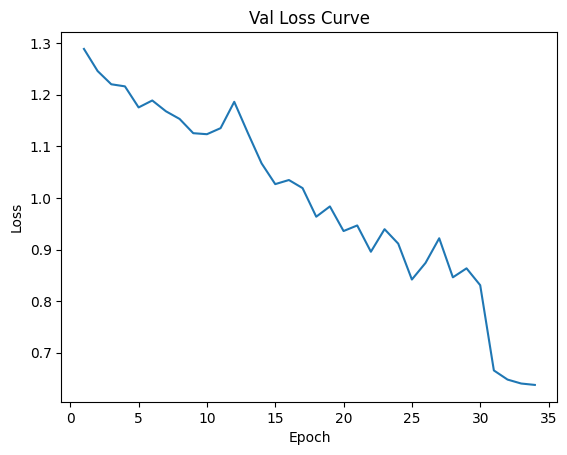

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11528575219787084


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 35/200*****
*****Train Loss:  0.616511 Val Loss:  0.633652*****
*****Validation Accuracy: 57.63%*****
*****Total Avg Disparity: 0.0899424805109657*****

Class Parade: Recall Difference = -0.060481212920237226
Class Handshaking: Recall Difference = -0.0357142857142857
Class Riot: Recall Difference = -0.0369843527738265
Class Dancing: Recall Difference = 0.008928571428571341
Class Funeral: Recall Difference = -0.06811332127787811
Class Cheering: Recall Difference = 0.021616541353383478
Class Meeting: Recall Difference = 0.11346153846153861
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.022536687631027286
Class Concerts: Recall Difference = 0.10944700460829493
Class Couple: Recall Difference = 0.2510176390773406
Class Family_Group: Recall Difference = -0.16934557979334097
Class Picnic: Recall Difference = -0.09790209790209792
Class Soldier_Patrol: Recall Difference = -0.045751633986928164
Class Spa: Recall Difference = 0.10714

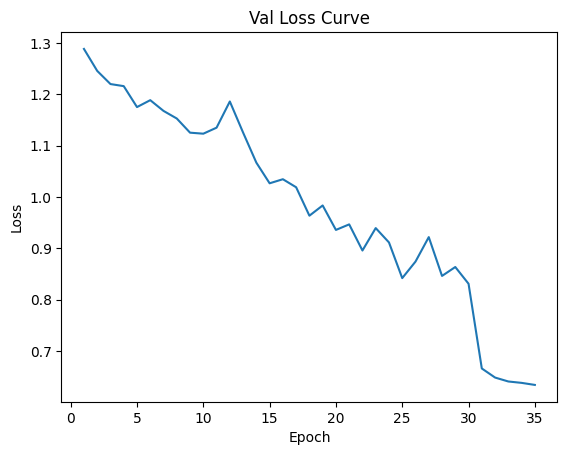

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.1149343432715306


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 36/200*****
*****Train Loss:  0.614920 Val Loss:  0.630861*****
*****Validation Accuracy: 57.83%*****
*****Total Avg Disparity: 0.09368198228175041*****

Class Parade: Recall Difference = -0.06987475280158184
Class Handshaking: Recall Difference = -0.017857142857142877
Class Riot: Recall Difference = 0.03461356092935042
Class Dancing: Recall Difference = 0.11011904761904762
Class Funeral: Recall Difference = -0.04279686558167556
Class Cheering: Recall Difference = 0.02067669172932335
Class Meeting: Recall Difference = 0.12884615384615405
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.01519916142557648
Class Concerts: Recall Difference = 0.08909370199692795
Class Couple: Recall Difference = 0.2510176390773406
Class Family_Group: Recall Difference = -0.08610792192881744
Class Picnic: Recall Difference = -0.08974358974358965
Class Soldier_Patrol: Recall Difference = -0.09346405228758159
Class Spa: Recall Difference = 0.22619047619047605
Class 

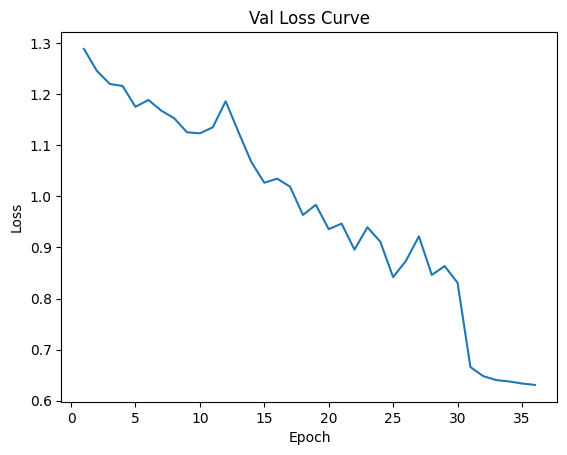

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11526954632539016


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 37/200*****
*****Train Loss:  0.617624 Val Loss:  0.621567*****
*****Validation Accuracy: 58.09%*****
*****Total Avg Disparity: 0.09904965850734943*****

Class Parade: Recall Difference = -0.04559437486266771
Class Handshaking: Recall Difference = -0.03571428571428567
Class Riot: Recall Difference = 0.017069701280227556
Class Dancing: Recall Difference = 0.1488095238095238
Class Funeral: Recall Difference = 0.017480409885473225
Class Cheering: Recall Difference = 0.030075187969924838
Class Meeting: Recall Difference = 0.1596153846153846
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = 0.06874039938556059
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.07328740910830461
Class Picnic: Recall Difference = -0.029137529137529095
Class Soldier_Patrol: Recall Difference = 0.013071895424836555
Class Spa: Recall Difference = 0.1785714

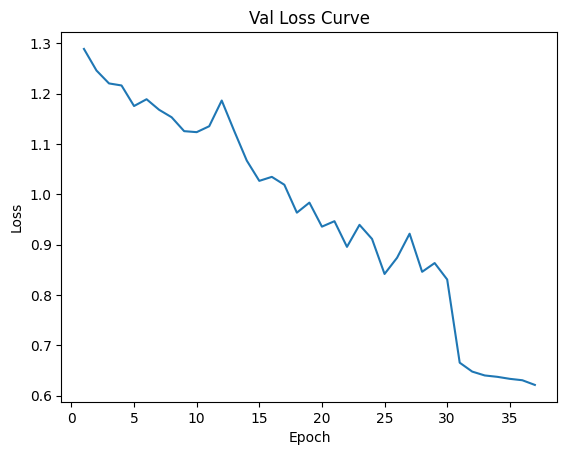

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11550907188883194


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.22s/it]


*****Epoch 38/200*****
*****Train Loss:  0.606746 Val Loss:  0.619894*****
*****Validation Accuracy: 57.69%*****
*****Total Avg Disparity: 0.08933746408971753*****

Class Parade: Recall Difference = -0.04960448253131189
Class Handshaking: Recall Difference = -0.07142857142857141
Class Riot: Recall Difference = 0.01706970128022761
Class Dancing: Recall Difference = 0.03273809523809523
Class Funeral: Recall Difference = 0.049427365883062124
Class Cheering: Recall Difference = -0.04793233082706766
Class Meeting: Recall Difference = 0.09711538461538471
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.024109014675052443
Class Concerts: Recall Difference = 0.02956989247311831
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.11385380788365862
Class Picnic: Recall Difference = -0.04545454545454547
Class Soldier_Patrol: Recall Difference = 0.0019607843137254832
Class Spa: Recall Difference = 0.08333

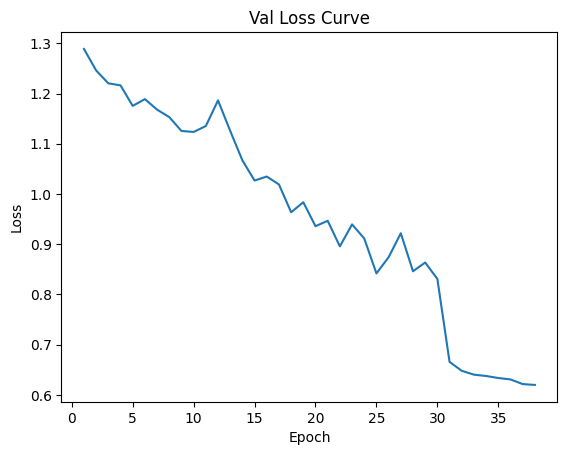

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11442098709253165


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 39/200*****
*****Train Loss:  0.603482 Val Loss:  0.615697*****
*****Validation Accuracy: 58.12%*****
*****Total Avg Disparity: 0.09469018846994014*****

Class Parade: Recall Difference = -0.07536805097780708
Class Handshaking: Recall Difference = -0.03571428571428566
Class Riot: Recall Difference = 0.007586533902323389
Class Dancing: Recall Difference = 0.1071428571428572
Class Funeral: Recall Difference = 0.1573236889692587
Class Cheering: Recall Difference = -0.00563909774436086
Class Meeting: Recall Difference = 0.23846153846153856
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.004716981132075443
Class Concerts: Recall Difference = 0.03302611367127495
Class Couple: Recall Difference = 0.19131614654002715
Class Family_Group: Recall Difference = -0.06467661691542292
Class Picnic: Recall Difference = 0.0011655011655011815
Class Soldier_Patrol: Recall Difference = -0.0235294117647058
Class Spa: Recall Difference = 0.20238095238095222
Class

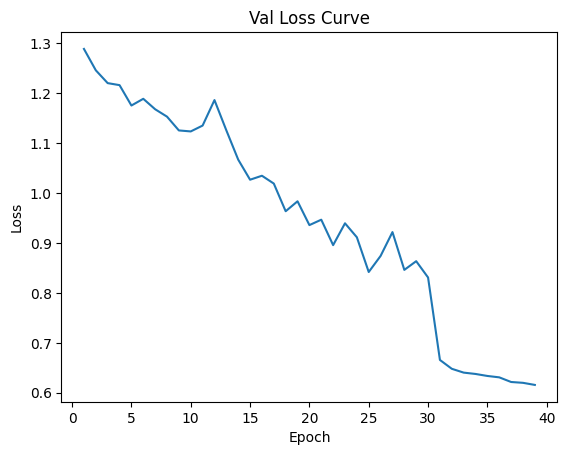

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11615307256579399


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 40/200*****
*****Train Loss:  0.605378 Val Loss:  0.610515*****
*****Validation Accuracy: 58.93%*****
*****Total Avg Disparity: 0.09330822942891487*****

Class Parade: Recall Difference = -0.0388376181059108
Class Handshaking: Recall Difference = -0.19642857142857134
Class Riot: Recall Difference = -0.019440493124703695
Class Dancing: Recall Difference = 0.11607142857142849
Class Funeral: Recall Difference = 0.030138637733574614
Class Cheering: Recall Difference = 0.03007518796992481
Class Meeting: Recall Difference = 0.11250000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354214
Class Concerts: Recall Difference = 0.12135176651305679
Class Couple: Recall Difference = 0.2808683853459973
Class Family_Group: Recall Difference = -0.041331802525832406
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.03464052287581709
Class Spa: Recall Difference = 0.13095

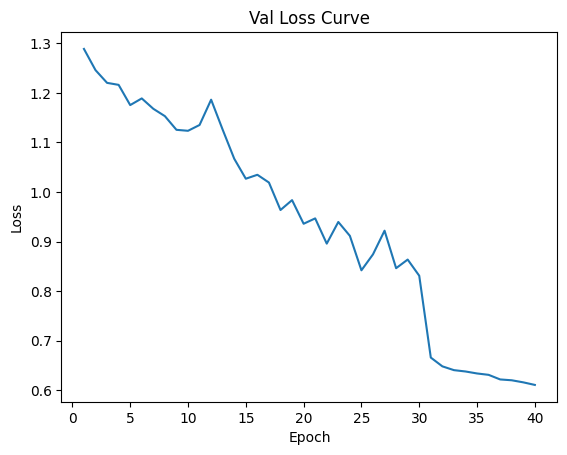

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11493595431630428


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 41/200*****
*****Train Loss:  0.601367 Val Loss:  0.607502*****
*****Validation Accuracy: 58.76%*****
*****Total Avg Disparity: 0.09082498838151022*****

Class Parade: Recall Difference = -0.05372445616348054
Class Handshaking: Recall Difference = -0.035714285714285726
Class Riot: Recall Difference = 0.03461356092935042
Class Dancing: Recall Difference = 0.08630952380952378
Class Funeral: Recall Difference = 0.0397830018083184
Class Cheering: Recall Difference = 0.012218045112781961
Class Meeting: Recall Difference = 0.15961538461538471
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = -0.0036687631027253476
Class Concerts: Recall Difference = 0.012672811059907807
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.08610792192881744
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.11568627450980384
Class Spa: Recall Difference = 0.083

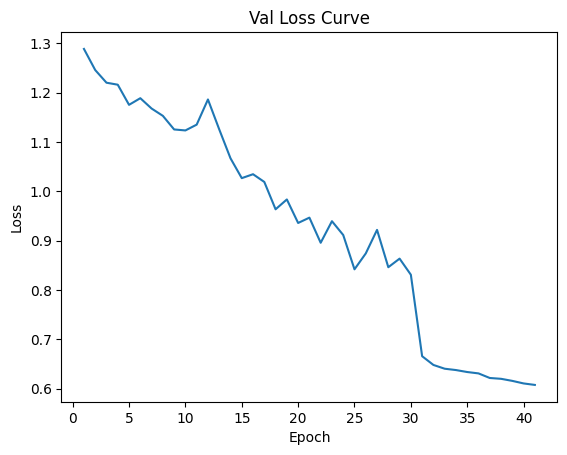

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.35s/it]


Average Adversary epoch loss: 0.11491613004070061


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 42/200*****
*****Train Loss:  0.598233 Val Loss:  0.602414*****
*****Validation Accuracy: 58.36%*****
*****Total Avg Disparity: 0.09484719853115321*****

Class Parade: Recall Difference = -0.014557240166996221
Class Handshaking: Recall Difference = 0.03571428571428574
Class Riot: Recall Difference = 0.04409672830725464
Class Dancing: Recall Difference = 0.1279761904761904
Class Funeral: Recall Difference = 0.05244122965641973
Class Cheering: Recall Difference = -0.041353383458646586
Class Meeting: Recall Difference = 0.20673076923076927
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = -0.02253668763102723
Class Concerts: Recall Difference = 0.06874039938556065
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.04975124378109452
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = -0.056862745098039125
Class Spa: Recall Difference = 0.107142

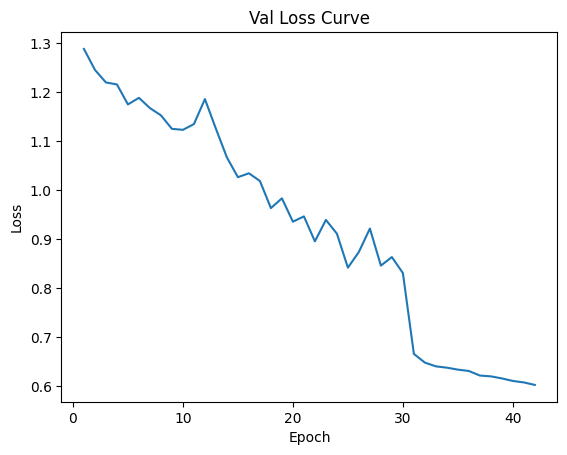

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11500240919681695


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 43/200*****
*****Train Loss:  0.596991 Val Loss:  0.596797*****
*****Validation Accuracy: 59.02%*****
*****Total Avg Disparity: 0.09654487152775122*****

Class Parade: Recall Difference = -0.06998461876510664
Class Handshaking: Recall Difference = -0.05357142857142852
Class Riot: Recall Difference = 0.02513039355144614
Class Dancing: Recall Difference = 0.07738095238095244
Class Funeral: Recall Difference = 0.05244122965641962
Class Cheering: Recall Difference = 0.021616541353383478
Class Meeting: Recall Difference = 0.08269230769230773
Class Stock_Market: Recall Difference = 0.09999999999999998
Class Ceremony: Recall Difference = 0.05188679245283018
Class Concerts: Recall Difference = 0.12980030721966207
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10524301569077688
Class Picnic: Recall Difference = -0.1282051282051282
Class Soldier_Patrol: Recall Difference = 0.001960784313725372
Class Spa: Recall Difference = 0.130952380

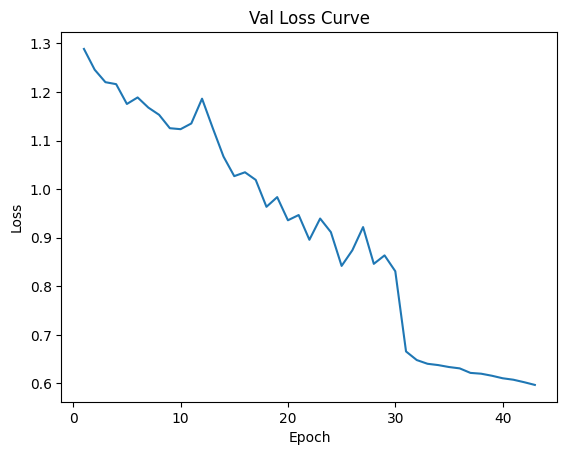

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11443307479986778


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 44/200*****
*****Train Loss:  0.590265 Val Loss:  0.601483*****
*****Validation Accuracy: 59.34%*****
*****Total Avg Disparity: 0.0908653282396094*****

Class Parade: Recall Difference = -0.02807075368050993
Class Handshaking: Recall Difference = -0.07142857142857137
Class Riot: Recall Difference = -0.05452821242294925
Class Dancing: Recall Difference = 0.06547619047619052
Class Funeral: Recall Difference = 0.017480409885473225
Class Cheering: Recall Difference = 0.12030075187969932
Class Meeting: Recall Difference = 0.14423076923076938
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.023060796645702375
Class Concerts: Recall Difference = 0.09254992319508454
Class Couple: Recall Difference = 0.2510176390773406
Class Family_Group: Recall Difference = -0.09682357443551465
Class Picnic: Recall Difference = 0.03146853146853157
Class Soldier_Patrol: Recall Difference = -0.07908496732026138
Class Spa: Recall Difference = 0.178571428

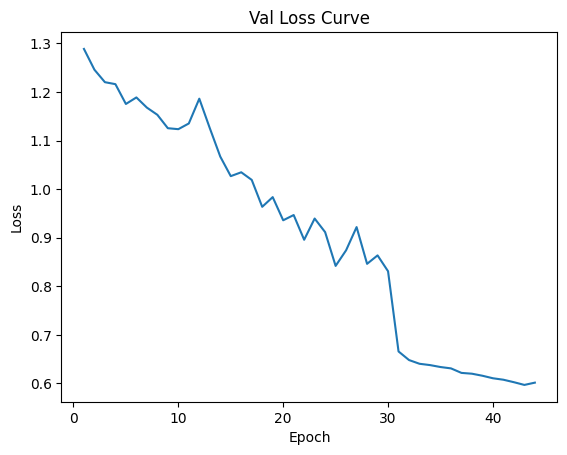

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11528239542475113


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 45/200*****
*****Train Loss:  0.594130 Val Loss:  0.590208*****
*****Validation Accuracy: 59.75%*****
*****Total Avg Disparity: 0.08616990690578032*****

Class Parade: Recall Difference = -0.052351131619424285
Class Handshaking: Recall Difference = -0.05357142857142856
Class Riot: Recall Difference = 0.05215742057847317
Class Dancing: Recall Difference = 0.0803571428571428
Class Funeral: Recall Difference = 0.017480409885473336
Class Cheering: Recall Difference = 0.0037593984962406013
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = 0.03302611367127506
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10964408725602753
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.024183006535947515
Class Spa: Recall Difference = 0.083333

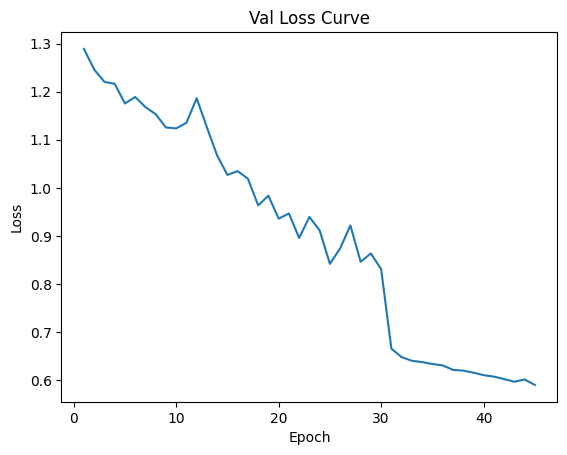

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11521264079671639


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 46/200*****
*****Train Loss:  0.592343 Val Loss:  0.589604*****
*****Validation Accuracy: 59.69%*****
*****Total Avg Disparity: 0.10663720678233049*****

Class Parade: Recall Difference = -0.059107888376181084
Class Handshaking: Recall Difference = 0.0357142857142857
Class Riot: Recall Difference = -0.10858226647700336
Class Dancing: Recall Difference = 0.05952380952380959
Class Funeral: Recall Difference = 0.05244122965641962
Class Cheering: Recall Difference = -0.06766917293233082
Class Meeting: Recall Difference = 0.2384615384615386
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07075471698113212
Class Concerts: Recall Difference = 0.11789554531490026
Class Couple: Recall Difference = 0.3107191316146539
Class Family_Group: Recall Difference = -0.12456946039035588
Class Picnic: Recall Difference = -0.10606060606060608
Class Soldier_Patrol: Recall Difference = -0.0823529411764704
Class Spa: Recall Difference = 0.3035714285714286
Class Spor

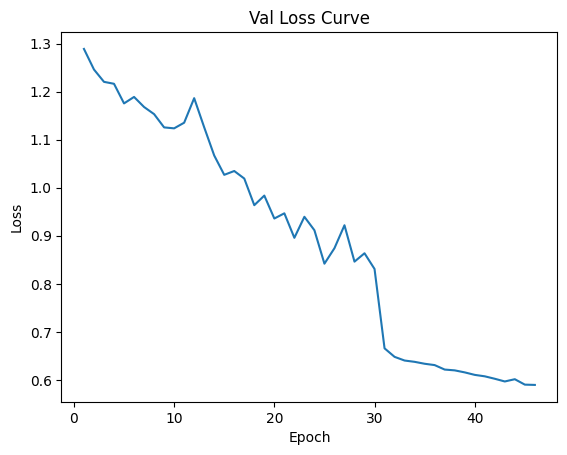

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.11624626041604923


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 47/200*****
*****Train Loss:  0.581769 Val Loss:  0.575653*****
*****Validation Accuracy: 60.12%*****
*****Total Avg Disparity: 0.0913955281324638*****

Class Parade: Recall Difference = -0.03620083498132276
Class Handshaking: Recall Difference = -0.05357142857142849
Class Riot: Recall Difference = -0.028923660502607917
Class Dancing: Recall Difference = 0.11904761904761901
Class Funeral: Recall Difference = 0.007836045810729386
Class Cheering: Recall Difference = 0.004699248120300814
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.005241090146750449
Class Concerts: Recall Difference = 0.02457757296466989
Class Couple: Recall Difference = 0.29579375848032574
Class Family_Group: Recall Difference = -0.09682357443551465
Class Picnic: Recall Difference = -0.029137529137529095
Class Soldier_Patrol: Recall Difference = 0.024183006535947738
Class Spa: Recall Difference = 0.1309

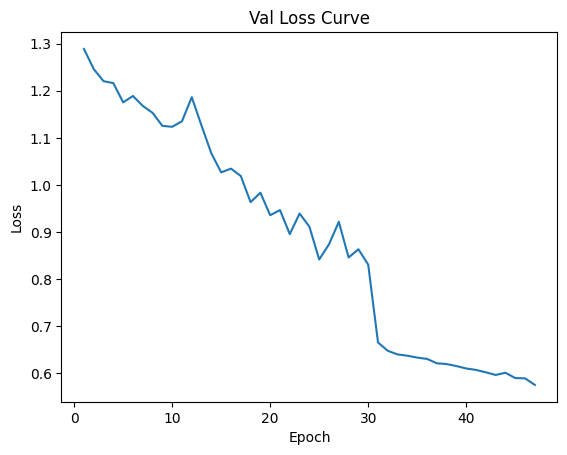

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.11497685255912635


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 48/200*****
*****Train Loss:  0.582871 Val Loss:  0.575986*****
*****Validation Accuracy: 59.77%*****
*****Total Avg Disparity: 0.09568245945975586*****

Class Parade: Recall Difference = -0.041584267194023194
Class Handshaking: Recall Difference = -0.0714285714285714
Class Riot: Recall Difference = -0.009957325746799417
Class Dancing: Recall Difference = 0.06845238095238088
Class Funeral: Recall Difference = -0.020494273658830553
Class Cheering: Recall Difference = -0.06578947368421051
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165632
Class Concerts: Recall Difference = 0.053379416282642145
Class Couple: Recall Difference = 0.265943012211669
Class Family_Group: Recall Difference = -0.09892843474933027
Class Picnic: Recall Difference = -0.09790209790209792
Class Soldier_Patrol: Recall Difference = -0.0235294117647058
Class Spa: Recall Difference = 0.130952

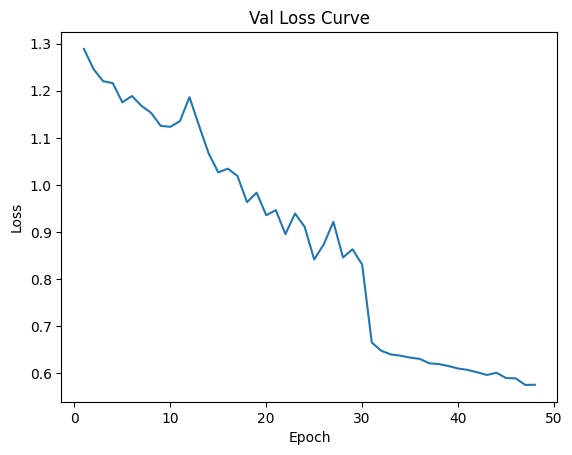

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11517083816803418


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 49/200*****
*****Train Loss:  0.583667 Val Loss:  0.570776*****
*****Validation Accuracy: 60.30%*****
*****Total Avg Disparity: 0.0743085504123749*****

Class Parade: Recall Difference = -0.052460997582948865
Class Handshaking: Recall Difference = -0.01785714285714282
Class Riot: Recall Difference = -0.055950687529634946
Class Dancing: Recall Difference = 0.12202380952380953
Class Funeral: Recall Difference = 0.0397830018083184
Class Cheering: Recall Difference = 0.04887218045112782
Class Meeting: Recall Difference = 0.11250000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = 0.012672811059907862
Class Couple: Recall Difference = 0.18995929443690635
Class Family_Group: Recall Difference = -0.07979334098737073
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = -0.012418300653594727
Class Spa: Recall Difference = 0.08333

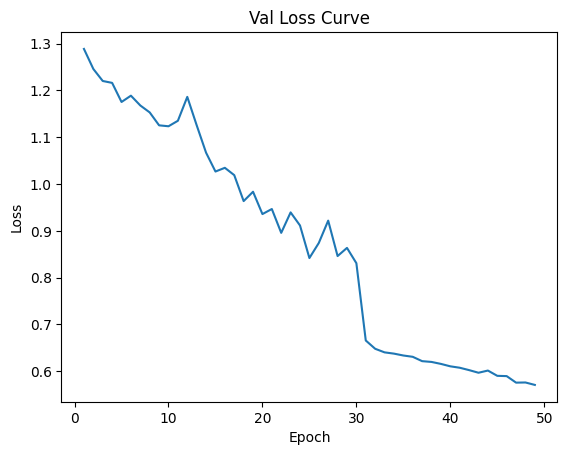

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:48<00:00,  4.19s/it]


Average Adversary epoch loss: 0.11474759905384137


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.13s/it]


*****Epoch 50/200*****
*****Train Loss:  0.568278 Val Loss:  0.565789*****
*****Validation Accuracy: 60.18%*****
*****Total Avg Disparity: 0.0861703942644961*****

Class Parade: Recall Difference = -0.0253241045923972
Class Handshaking: Recall Difference = -0.053571428571428534
Class Riot: Recall Difference = 0.0791844476055002
Class Dancing: Recall Difference = 0.08630952380952372
Class Funeral: Recall Difference = 0.027124773960217063
Class Cheering: Recall Difference = -0.004699248120300814
Class Meeting: Recall Difference = 0.050000000000000044
Class Stock_Market: Recall Difference = 0.06666666666666665
Class Ceremony: Recall Difference = 0.07075471698113212
Class Concerts: Recall Difference = 0.08064516129032262
Class Couple: Recall Difference = 0.2510176390773406
Class Family_Group: Recall Difference = -0.11174894756984316
Class Picnic: Recall Difference = -0.05944055944055948
Class Soldier_Patrol: Recall Difference = -0.03464052287581687
Class Spa: Recall Difference = 0.05952380

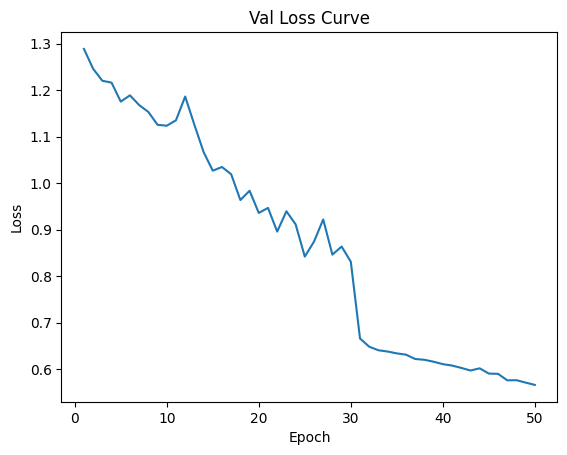

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11564197677832383


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 51/200*****
*****Train Loss:  0.575110 Val Loss:  0.569183*****
*****Validation Accuracy: 60.32%*****
*****Total Avg Disparity: 0.08571565696805519*****

Class Parade: Recall Difference = -0.030707536805097857
Class Handshaking: Recall Difference = -0.017857142857142794
Class Riot: Recall Difference = -0.06401137980085347
Class Dancing: Recall Difference = 0.038690476190476164
Class Funeral: Recall Difference = -0.05545509342977689
Class Cheering: Recall Difference = -0.031015037593984968
Class Meeting: Recall Difference = 0.1759615384615386
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.033018867924528295
Class Concerts: Recall Difference = 0.11290322580645168
Class Couple: Recall Difference = 0.22116689280868385
Class Family_Group: Recall Difference = -0.13949483352468428
Class Picnic: Recall Difference = -0.06759906759906753
Class Soldier_Patrol: Recall Difference = -0.07908496732026149
Class Spa: Recall Difference = 0.17

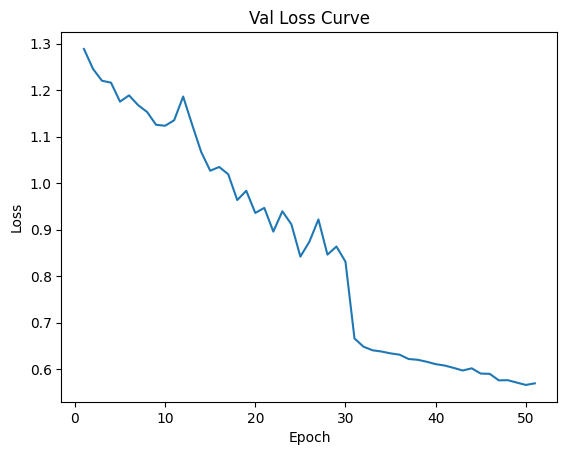

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11525803747085425


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 52/200*****
*****Train Loss:  0.575550 Val Loss:  0.567962*****
*****Validation Accuracy: 61.11%*****
*****Total Avg Disparity: 0.08927696773173523*****

Class Parade: Recall Difference = -0.03345418589321014
Class Handshaking: Recall Difference = 0.08928571428571432
Class Riot: Recall Difference = -0.0910384068278805
Class Dancing: Recall Difference = -0.04166666666666663
Class Funeral: Recall Difference = 0.030138637733574503
Class Cheering: Recall Difference = 0.030075187969924838
Class Meeting: Recall Difference = 0.20769230769230773
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06079664570230611
Class Concerts: Recall Difference = 0.09754224270353301
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.11825487944890933
Class Picnic: Recall Difference = -0.06759906759906764
Class Soldier_Patrol: Recall Difference = -0.0823529411764704
Class Spa: Recall Difference = -0.0178571

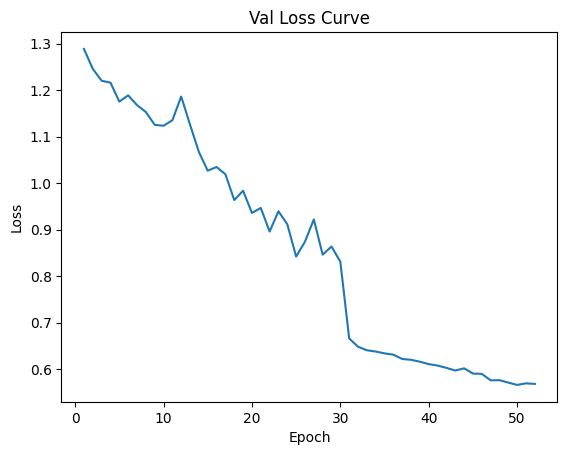

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11442816028228173


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 53/200*****
*****Train Loss:  0.570162 Val Loss:  0.570230*****
*****Validation Accuracy: 60.32%*****
*****Total Avg Disparity: 0.08567420839773937*****

Class Parade: Recall Difference = -0.06185453746429381
Class Handshaking: Recall Difference = 5.551115123125783e-17
Class Riot: Recall Difference = -0.02086296823138928
Class Dancing: Recall Difference = 0.04464285714285715
Class Funeral: Recall Difference = -0.0524412296564194
Class Cheering: Recall Difference = 0.03947368421052638
Class Meeting: Recall Difference = 0.12788461538461549
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03406708595387836
Class Concerts: Recall Difference = 0.04493087557603709
Class Couple: Recall Difference = 0.3405698778833107
Class Family_Group: Recall Difference = -0.06276310753922693
Class Picnic: Recall Difference = -0.05944055944055937
Class Soldier_Patrol: Recall Difference = 0.03202614379084967
Class Spa: Recall Difference = 0.17857142857142838
Class S

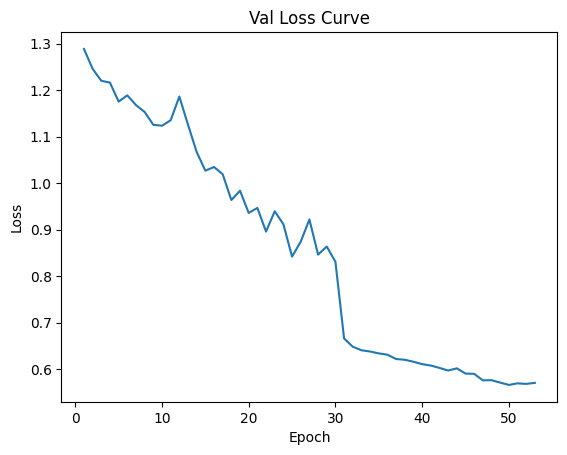

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11440168980222482


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 54/200*****
*****Train Loss:  0.565501 Val Loss:  0.559779*****
*****Validation Accuracy: 61.05%*****
*****Total Avg Disparity: 0.0794993290533777*****

Class Parade: Recall Difference = -0.03894748406943549
Class Handshaking: Recall Difference = -0.05357142857142855
Class Riot: Recall Difference = -0.08297771455666192
Class Dancing: Recall Difference = 0.10416666666666657
Class Funeral: Recall Difference = -0.030138637733574447
Class Cheering: Recall Difference = 0.0394736842105263
Class Meeting: Recall Difference = 0.15865384615384626
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.00524109014675056
Class Concerts: Recall Difference = 0.004224270353302639
Class Couple: Recall Difference = 0.06919945725915877
Class Family_Group: Recall Difference = -0.07749712973593575
Class Picnic: Recall Difference = -0.08974358974358965
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.1785714285714285
Class 

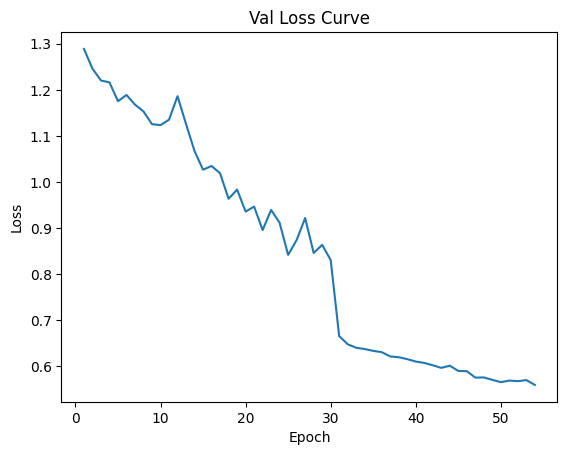

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11439045575948861


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 55/200*****
*****Train Loss:  0.561935 Val Loss:  0.560312*****
*****Validation Accuracy: 59.95%*****
*****Total Avg Disparity: 0.08248245670336213*****

Class Parade: Recall Difference = -0.015930564711052364
Class Handshaking: Recall Difference = -0.03571428571428571
Class Riot: Recall Difference = -0.04646752015173067
Class Dancing: Recall Difference = 0.06845238095238093
Class Funeral: Recall Difference = 0.004822182037372114
Class Cheering: Recall Difference = 0.07518796992481208
Class Meeting: Recall Difference = 0.14423076923076927
Class Stock_Market: Recall Difference = 0.033333333333333326
Class Ceremony: Recall Difference = 0.014150943396226467
Class Concerts: Recall Difference = 0.06874039938556065
Class Couple: Recall Difference = 0.16146540027137044
Class Family_Group: Recall Difference = -0.10753922694221185
Class Picnic: Recall Difference = 0.04778554778554778
Class Soldier_Patrol: Recall Difference = -0.07581699346405213
Class Spa: Recall Difference = 0.15476

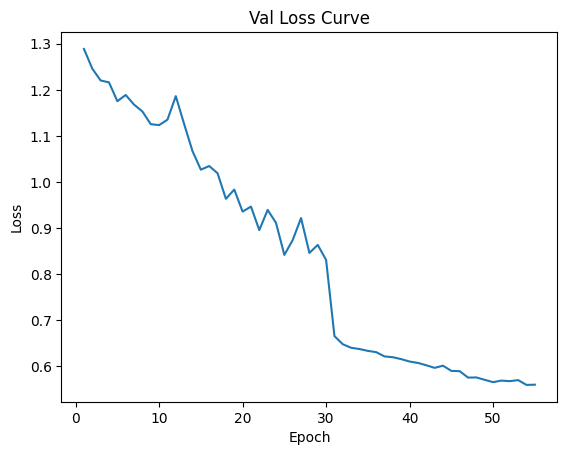

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11479026365738648


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 56/200*****
*****Train Loss:  0.561711 Val Loss:  0.556354*****
*****Validation Accuracy: 62.06%*****
*****Total Avg Disparity: 0.08320634670857908*****

Class Parade: Recall Difference = -0.04696769940672374
Class Handshaking: Recall Difference = 0.10714285714285716
Class Riot: Recall Difference = -0.02086296823138939
Class Dancing: Recall Difference = 0.08630952380952378
Class Funeral: Recall Difference = 0.017480409885473225
Class Cheering: Recall Difference = 0.004699248120300814
Class Meeting: Recall Difference = 0.12788461538461549
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.03993855606758834
Class Couple: Recall Difference = 0.26458616010854813
Class Family_Group: Recall Difference = -0.07979334098737084
Class Picnic: Recall Difference = -0.12004662004662003
Class Soldier_Patrol: Recall Difference = -0.04901960784313719
Class Spa: Recall Difference = 0.17857142857142838
Class 

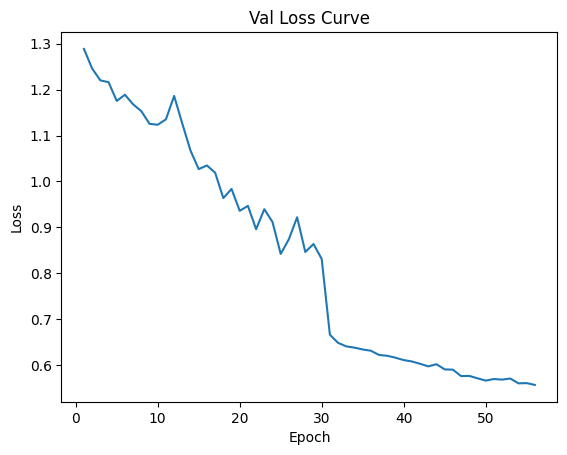

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11514647964101571


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 57/200*****
*****Train Loss:  0.563281 Val Loss:  0.553715*****
*****Validation Accuracy: 62.35%*****
*****Total Avg Disparity: 0.09833758050544125*****

Class Parade: Recall Difference = -0.0768512414853878
Class Handshaking: Recall Difference = 0.10714285714285716
Class Riot: Recall Difference = 0.014224751066856278
Class Dancing: Recall Difference = 0.09523809523809534
Class Funeral: Recall Difference = 0.010849909584086825
Class Cheering: Recall Difference = -0.048872180451127845
Class Meeting: Recall Difference = 0.20673076923076927
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = 0.004224270353302584
Class Couple: Recall Difference = 0.27951153324287653
Class Family_Group: Recall Difference = -0.06276310753922693
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.27976190476190455
Cla

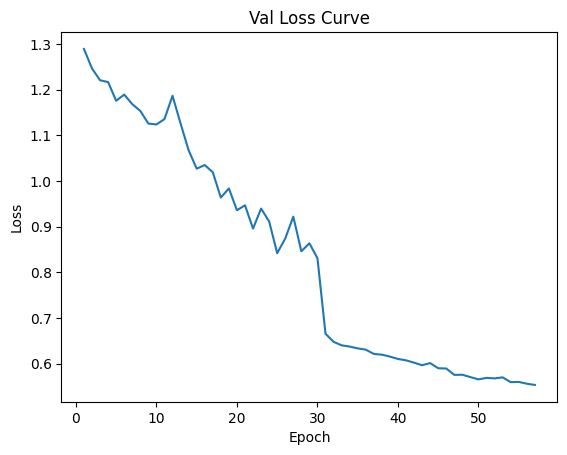

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11504977024518527


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 58/200*****
*****Train Loss:  0.560621 Val Loss:  0.549309*****
*****Validation Accuracy: 60.96%*****
*****Total Avg Disparity: 0.07573327495886192*****

Class Parade: Recall Difference = -0.026697429136453565
Class Handshaking: Recall Difference = -0.053571428571428534
Class Riot: Recall Difference = -0.028923660502607917
Class Dancing: Recall Difference = -0.02083333333333337
Class Funeral: Recall Difference = 0.017480409885473114
Class Cheering: Recall Difference = -0.01315789473684209
Class Meeting: Recall Difference = 0.11250000000000004
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07075471698113212
Class Concerts: Recall Difference = 0.012672811059907807
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.056257175660160696
Class Picnic: Recall Difference = -0.10606060606060608
Class Soldier_Patrol: Recall Difference = -0.06797385620915042
Class Spa: Recall Difference = 0.

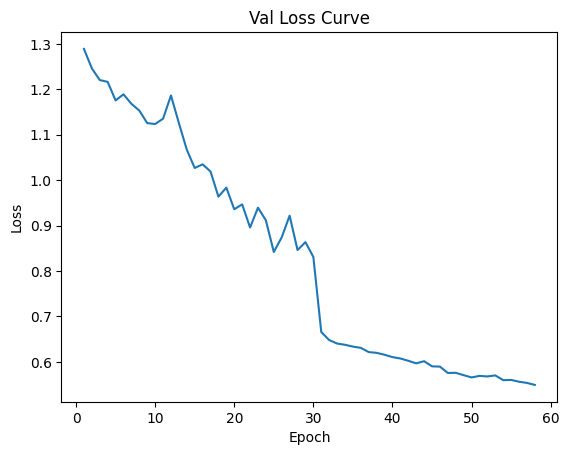

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11597842895067655


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 59/200*****
*****Train Loss:  0.552921 Val Loss:  0.541880*****
*****Validation Accuracy: 61.77%*****
*****Total Avg Disparity: 0.08145166845541514*****

Class Parade: Recall Difference = -0.029444078224566184
Class Handshaking: Recall Difference = 0.017857142857142905
Class Riot: Recall Difference = -0.05310573731626367
Class Dancing: Recall Difference = 0.038690476190476275
Class Funeral: Recall Difference = -0.10608800482218206
Class Cheering: Recall Difference = -0.0046992481203007586
Class Meeting: Recall Difference = 0.11250000000000004
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.07075471698113212
Class Concerts: Recall Difference = 0.1213517665130569
Class Couple: Recall Difference = 0.3405698778833108
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.08974358974358965
Class Soldier_Patrol: Recall Difference = -0.045751633986928164
Class Spa: Recall Difference = 0.083

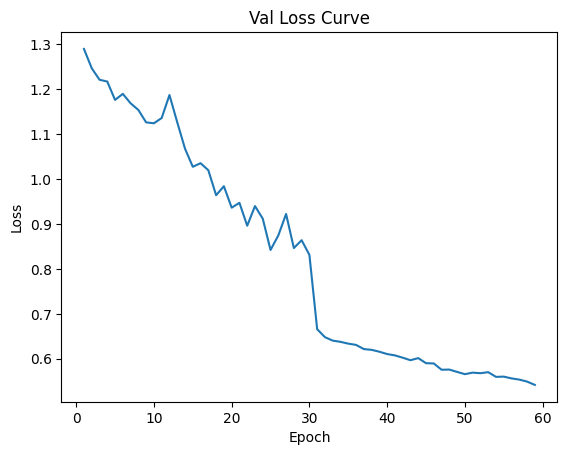

Data has been appended to validation_1.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11385459137650636


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 60/200*****
*****Train Loss:  0.554051 Val Loss:  0.531102*****
*****Validation Accuracy: 63.22%*****
*****Total Avg Disparity: 0.07776205935012669*****

Class Parade: Recall Difference = -0.013293781586464548
Class Handshaking: Recall Difference = -0.05357142857142855
Class Riot: Recall Difference = 0.014224751066856334
Class Dancing: Recall Difference = -0.005952380952381042
Class Funeral: Recall Difference = -0.05244122965641951
Class Cheering: Recall Difference = -0.057330827067669204
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08071278825995815
Class Concerts: Recall Difference = 0.05184331797235048
Class Couple: Recall Difference = 0.12890094979647226
Class Family_Group: Recall Difference = -0.06907768848067358
Class Picnic: Recall Difference = 0.0174825174825175
Class Soldier_Patrol: Recall Difference = -0.0379084967320259
Class Spa: Recall Difference = 0.1785714285714285
Class

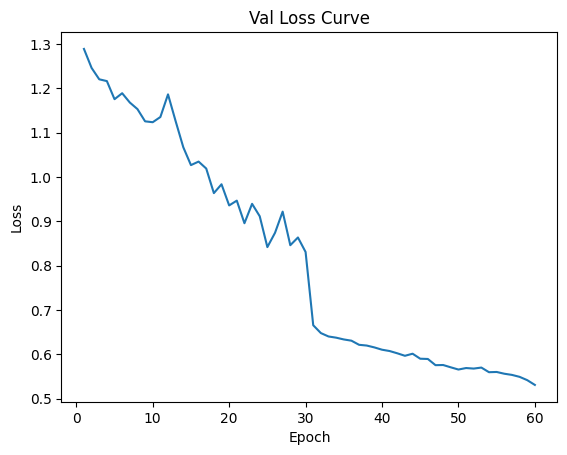

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11432387335942341


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 61/200*****
*****Train Loss:  0.550718 Val Loss:  0.519629*****
*****Validation Accuracy: 64.21%*****
*****Total Avg Disparity: 0.07812087452589213*****

Class Parade: Recall Difference = -0.003790375741595353
Class Handshaking: Recall Difference = -0.035714285714285615
Class Riot: Recall Difference = -0.03840682788051214
Class Dancing: Recall Difference = 0.05059523809523808
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.031954887218045125
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = 0.007680491551459334
Class Couple: Recall Difference = 0.38534599728629587
Class Family_Group: Recall Difference = -0.11825487944890922
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.

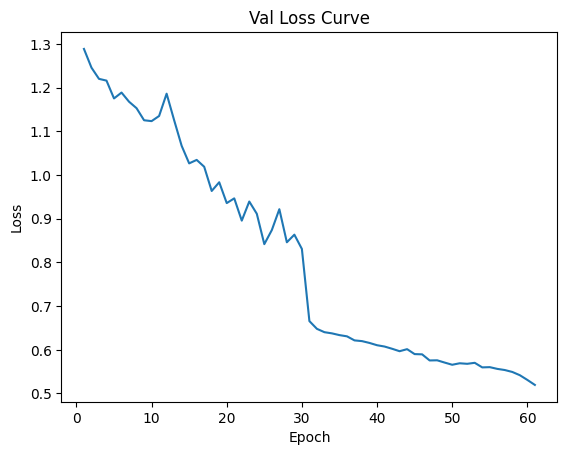

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11371325128353559


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 62/200*****
*****Train Loss:  0.541675 Val Loss:  0.518600*****
*****Validation Accuracy: 64.47%*****
*****Total Avg Disparity: 0.07292440679320288*****

Class Parade: Recall Difference = -0.030817402768622437
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.06845238095238088
Class Funeral: Recall Difference = -0.02712477396021684
Class Cheering: Recall Difference = 0.06766917293233088
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = 0.007680491551459334
Class Couple: Recall Difference = 0.34056987788331067
Class Family_Group: Recall Difference = -0.08840413318025248
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = 0.009803921568627527
Class Spa: Recall Difference = 0.10

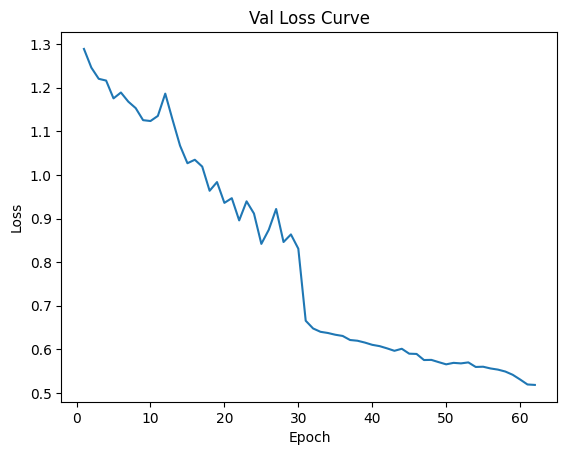

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11438261115780243


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 63/200*****
*****Train Loss:  0.541457 Val Loss:  0.517899*****
*****Validation Accuracy: 64.44%*****
*****Total Avg Disparity: 0.07950444240763087*****

Class Parade: Recall Difference = -0.04570424082619218
Class Handshaking: Recall Difference = -0.05357142857142852
Class Riot: Recall Difference = -0.03840682788051214
Class Dancing: Recall Difference = 0.06845238095238088
Class Funeral: Recall Difference = -0.02712477396021684
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387836
Class Concerts: Recall Difference = -0.004224270353302528
Class Couple: Recall Difference = 0.3405698778833108
Class Family_Group: Recall Difference = -0.1140451588212783
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.0013071895424835445
Class Spa: Recall Difference = 0.10714

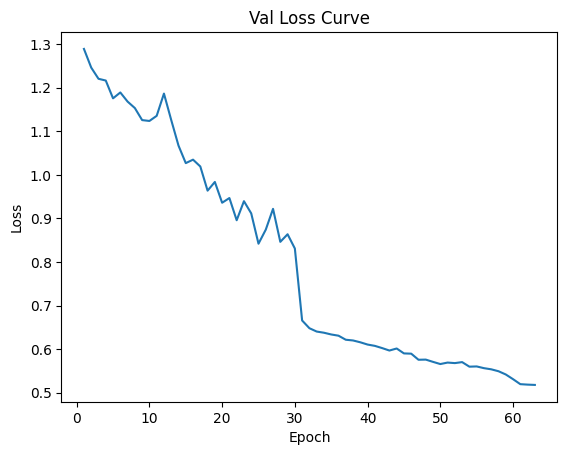

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11323983480150883


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 64/200*****
*****Train Loss:  0.543536 Val Loss:  0.519347*****
*****Validation Accuracy: 64.12%*****
*****Total Avg Disparity: 0.08127090907134142*****

Class Parade: Recall Difference = -0.030817402768622437
Class Handshaking: Recall Difference = -0.05357142857142855
Class Riot: Recall Difference = -0.02086296823138928
Class Dancing: Recall Difference = 0.014880952380952439
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.005639097744360888
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.039938556067588504
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.13107539226942216
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.009803921568627527
Class Spa: Recall Difference = 0.107

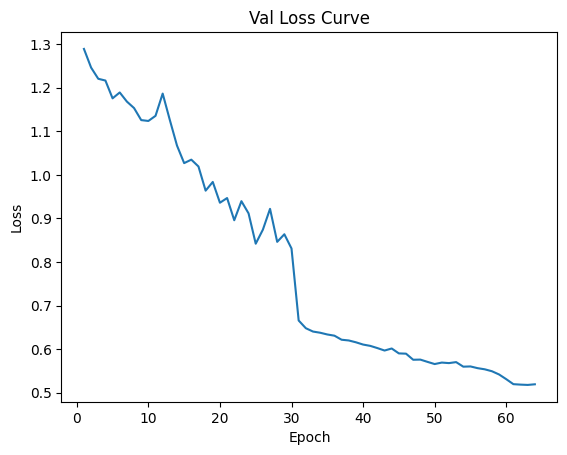

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11403578949662355


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 65/200*****
*****Train Loss:  0.543527 Val Loss:  0.517730*****
*****Validation Accuracy: 64.21%*****
*****Total Avg Disparity: 0.07666230575216565*****

Class Parade: Recall Difference = -0.015930564711052586
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.038406827880512195
Class Dancing: Recall Difference = 0.06547619047619041
Class Funeral: Recall Difference = -0.05244122965641951
Class Cheering: Recall Difference = 0.005639097744360944
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165632
Class Concerts: Recall Difference = -0.004224270353302639
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.11825487944890911
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = 0.009803921568627527
Class Spa: Recall Difference = 0.

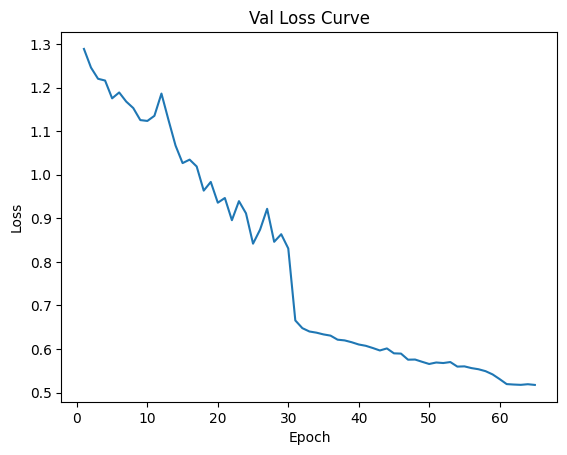

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11420316449724711


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 66/200*****
*****Train Loss:  0.544720 Val Loss:  0.517752*****
*****Validation Accuracy: 64.12%*****
*****Total Avg Disparity: 0.07968220733542418*****

Class Parade: Recall Difference = -0.022687321467809274
Class Handshaking: Recall Difference = -0.03571428571428564
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.08928571428571425
Class Funeral: Recall Difference = -0.039783001808318175
Class Cheering: Recall Difference = 0.04135338345864664
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.028033794162826475
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.11825487944890939
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.009803921568627527
Class Spa: Recall Difference = 0.13095

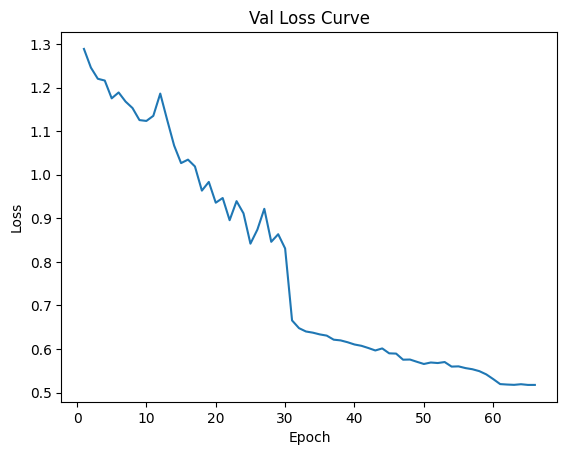

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11394310685304496


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 67/200*****
*****Train Loss:  0.542808 Val Loss:  0.517528*****
*****Validation Accuracy: 64.00%*****
*****Total Avg Disparity: 0.07644367358073619*****

Class Parade: Recall Difference = -0.01730388925510895
Class Handshaking: Recall Difference = 2.7755575615628914e-17
Class Riot: Recall Difference = -0.02086296823138928
Class Dancing: Recall Difference = 0.050595238095238027
Class Funeral: Recall Difference = -0.0524412296564194
Class Cheering: Recall Difference = 0.031954887218045125
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.04297693920335427
Class Concerts: Recall Difference = 0.028033794162826475
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.0013071895424836555
Class Spa: Recall Difference = 0.1

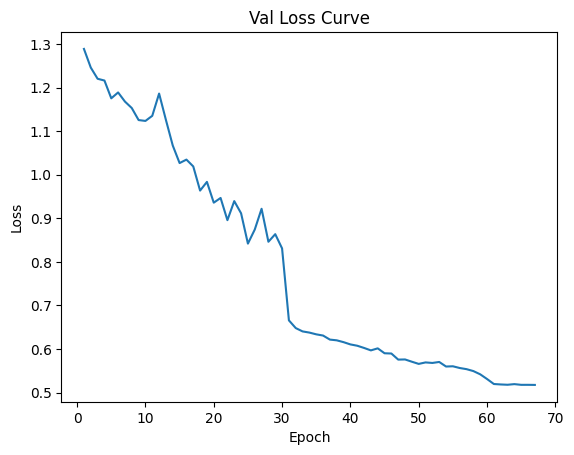

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11300455836149362


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 68/200*****
*****Train Loss:  0.540184 Val Loss:  0.517679*****
*****Validation Accuracy: 64.49%*****
*****Total Avg Disparity: 0.07354768094684175*****

Class Parade: Recall Difference = -0.03894748406943538
Class Handshaking: Recall Difference = -0.035714285714285615
Class Riot: Recall Difference = -0.055950687529634946
Class Dancing: Recall Difference = 0.10416666666666663
Class Funeral: Recall Difference = -0.01446654611211562
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = -0.004224270353302639
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.1289705319556066
Class Picnic: Recall Difference = -0.020979020979020935
Class Soldier_Patrol: Recall Difference = 0.020915032679738488
Class Spa: Recall Difference = 0.130

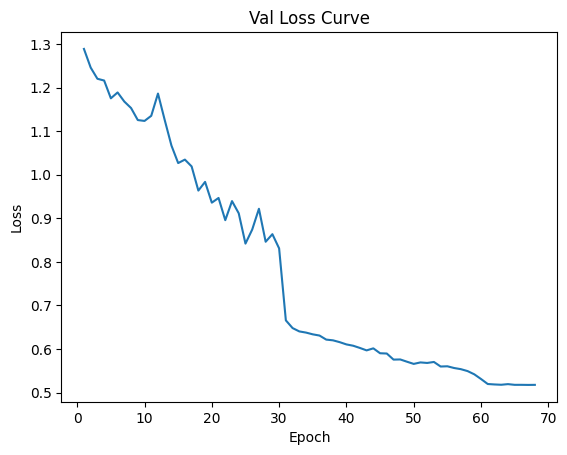

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11288801552011417


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 69/200*****
*****Train Loss:  0.539451 Val Loss:  0.515150*****
*****Validation Accuracy: 64.49%*****
*****Total Avg Disparity: 0.0811053980085524*****

Class Parade: Recall Difference = -0.030817402768622437
Class Handshaking: Recall Difference = -0.035714285714285615
Class Riot: Recall Difference = -0.03840682788051214
Class Dancing: Recall Difference = 0.04761904761904756
Class Funeral: Recall Difference = -0.039783001808318175
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.09958071278825992
Class Concerts: Recall Difference = -0.004224270353302639
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.1012246460007653
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.04901960784313719
Class Spa: Recall Difference = 0.130

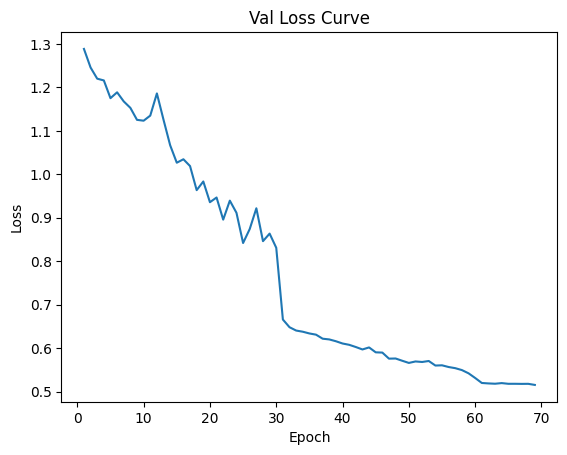

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11306651108540021


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 70/200*****
*****Train Loss:  0.545931 Val Loss:  0.514409*****
*****Validation Accuracy: 64.35%*****
*****Total Avg Disparity: 0.07837102271502916*****

Class Parade: Recall Difference = -0.030817402768622437
Class Handshaking: Recall Difference = -0.017857142857142794
Class Riot: Recall Difference = -0.02086296823138928
Class Dancing: Recall Difference = 0.06547619047619035
Class Funeral: Recall Difference = -0.039783001808318175
Class Cheering: Recall Difference = 0.0413533834586467
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.08071278825995815
Class Concerts: Recall Difference = 0.016129032258064557
Class Couple: Recall Difference = 0.34056987788331067
Class Family_Group: Recall Difference = -0.11825487944890928
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.13095

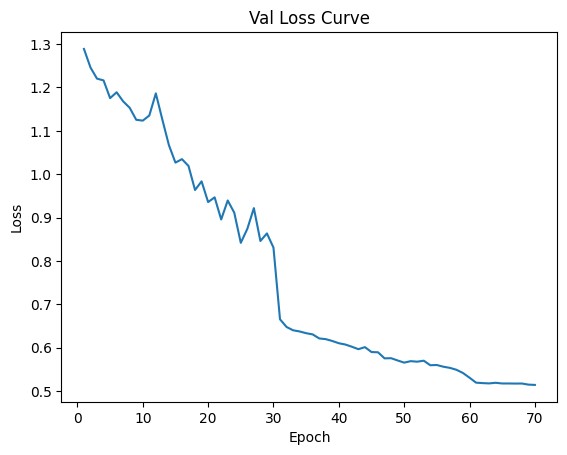

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11323815469558422


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 71/200*****
*****Train Loss:  0.533555 Val Loss:  0.509434*****
*****Validation Accuracy: 64.32%*****
*****Total Avg Disparity: 0.07855983741908018*****

Class Parade: Recall Difference = -0.030817402768622326
Class Handshaking: Recall Difference = -0.03571428571428564
Class Riot: Recall Difference = -0.02086296823138928
Class Dancing: Recall Difference = 0.029761904761904767
Class Funeral: Recall Difference = -0.05244122965641951
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165626
Class Concerts: Recall Difference = 0.016129032258064557
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.10332950631458077
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = 0.009803921568627527
Class Spa: Recall Difference = 0.107

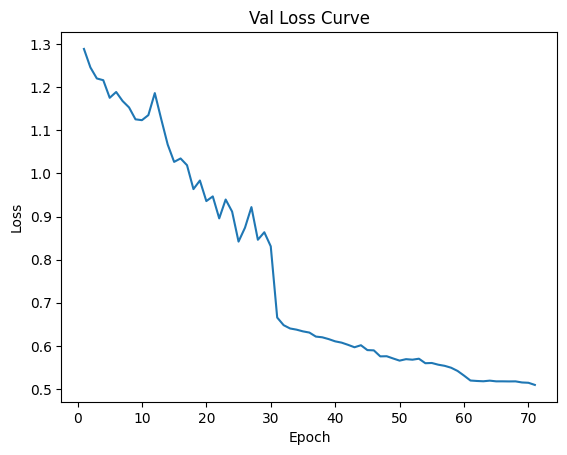

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11427598647200145


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 72/200*****
*****Train Loss:  0.541062 Val Loss:  0.514963*****
*****Validation Accuracy: 64.32%*****
*****Total Avg Disparity: 0.08001977032064182*****

Class Parade: Recall Difference = -0.037574159525379236
Class Handshaking: Recall Difference = -0.05357142857142852
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.1071428571428571
Class Funeral: Recall Difference = -0.039783001808318175
Class Cheering: Recall Difference = 0.05921052631578949
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387836
Class Concerts: Recall Difference = -0.004224270353302639
Class Couple: Recall Difference = 0.3554952510176392
Class Family_Group: Recall Difference = -0.131075392269422
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.08333333

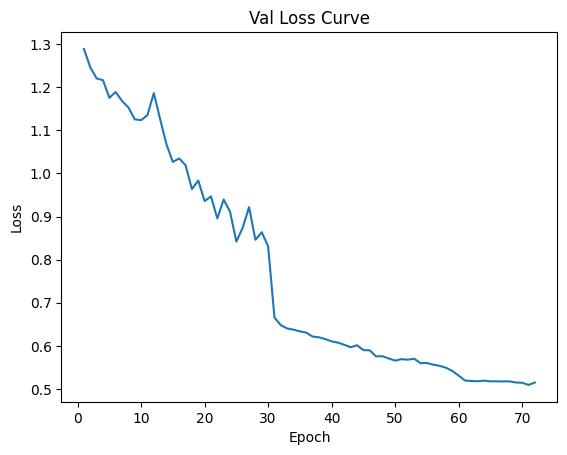

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.37s/it]


Average Adversary epoch loss: 0.11202460240859252


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 73/200*****
*****Train Loss:  0.540966 Val Loss:  0.512787*****
*****Validation Accuracy: 64.47%*****
*****Total Avg Disparity: 0.0737846904309823*****

Class Parade: Recall Difference = -0.01730388925510895
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.011379800853485167
Class Dancing: Recall Difference = 0.08928571428571441
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.06766917293233088
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = 0.03993855606758845
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.10332950631458099
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.10714285

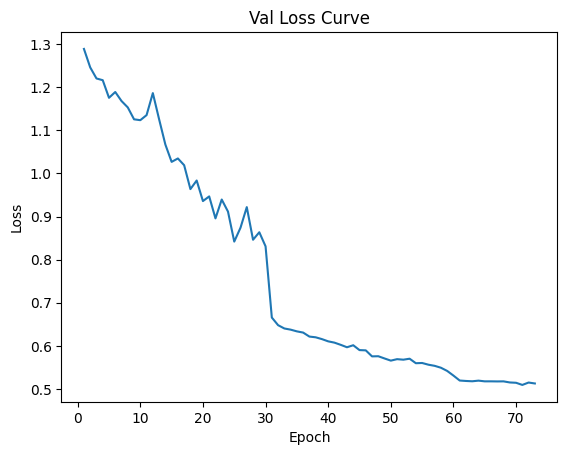

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11373967562730496


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 74/200*****
*****Train Loss:  0.537806 Val Loss:  0.512492*****
*****Validation Accuracy: 64.35%*****
*****Total Avg Disparity: 0.07760420115431611*****

Class Parade: Recall Difference = -0.01730388925510895
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.02086296823138928
Class Dancing: Recall Difference = 0.06845238095238088
Class Funeral: Recall Difference = -0.0524412296564194
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = 0.028033794162826364
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.11825487944890917
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.009803921568627527
Class Spa: Recall Difference = 0.10714

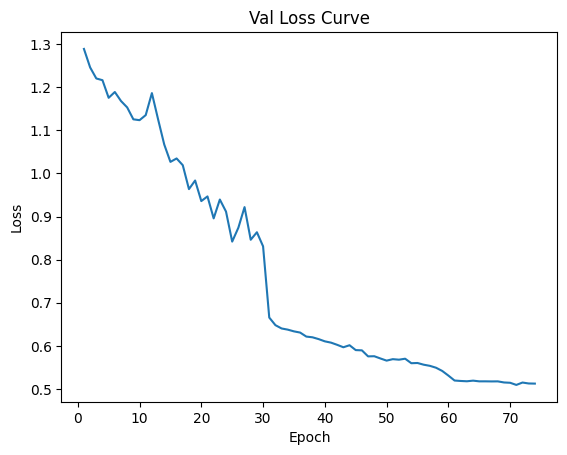

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11324145845495738


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 75/200*****
*****Train Loss:  0.538309 Val Loss:  0.512314*****
*****Validation Accuracy: 64.64%*****
*****Total Avg Disparity: 0.07891051709835105*****

Class Parade: Recall Difference = -0.024060646011865527
Class Handshaking: Recall Difference = -0.03571428571428564
Class Riot: Recall Difference = -0.02086296823138939
Class Dancing: Recall Difference = 0.06547619047619041
Class Funeral: Recall Difference = -0.01446654611211573
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = -0.016129032258064502
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.1289705319556066
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.1071428

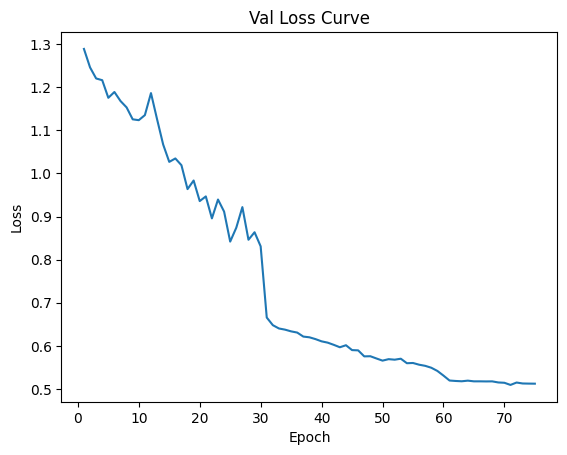

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11355627643374297


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 76/200*****
*****Train Loss:  0.542150 Val Loss:  0.512296*****
*****Validation Accuracy: 64.35%*****
*****Total Avg Disparity: 0.07970174014116362*****

Class Parade: Recall Difference = -0.030817402768622437
Class Handshaking: Recall Difference = -0.03571428571428567
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.08630952380952372
Class Funeral: Recall Difference = -0.0524412296564194
Class Cheering: Recall Difference = 0.06766917293233088
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.02803379416282642
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.0013071895424835445
Class Spa: Recall Difference = 0.1071

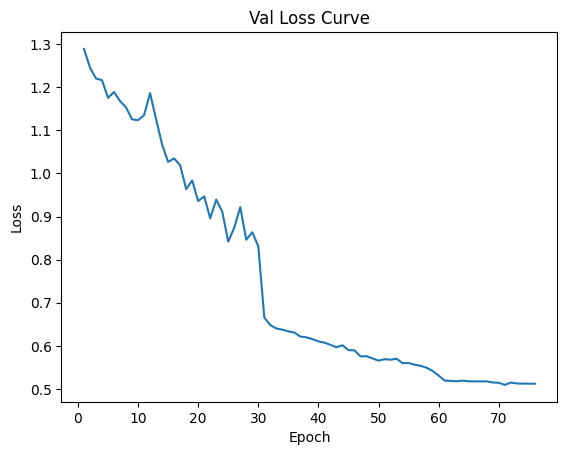

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.11392110815415016


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 77/200*****
*****Train Loss:  0.540030 Val Loss:  0.512059*****
*****Validation Accuracy: 64.64%*****
*****Total Avg Disparity: 0.08214311848758493*****

Class Parade: Recall Difference = -0.030817402768622437
Class Handshaking: Recall Difference = -0.017857142857142794
Class Riot: Recall Difference = 0.014224751066856334
Class Dancing: Recall Difference = 0.08928571428571425
Class Funeral: Recall Difference = -0.01446654611211573
Class Cheering: Recall Difference = 0.08552631578947367
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387853
Class Concerts: Recall Difference = 0.02803379416282642
Class Couple: Recall Difference = 0.38534599728629576
Class Family_Group: Recall Difference = -0.1012246460007653
Class Picnic: Recall Difference = -0.08974358974358976
Class Soldier_Patrol: Recall Difference = -0.0013071895424835445
Class Spa: Recall Difference = 0.13095

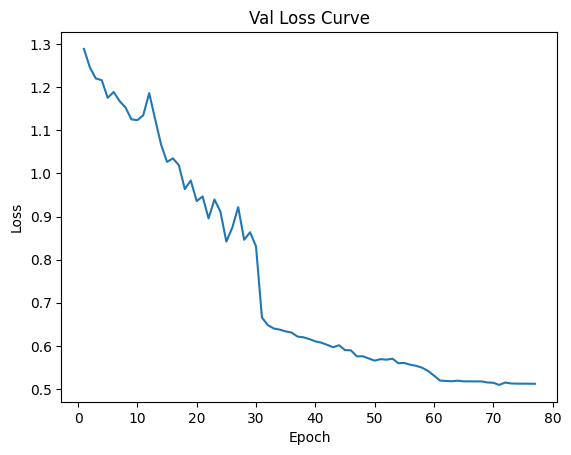

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11483625093331704


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.26s/it]


*****Epoch 78/200*****
*****Train Loss:  0.534650 Val Loss:  0.511682*****
*****Validation Accuracy: 64.58%*****
*****Total Avg Disparity: 0.08507167359266811*****

Class Parade: Recall Difference = -0.03894748406943538
Class Handshaking: Recall Difference = -0.03571428571428564
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.1071428571428571
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = 0.02803379416282642
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.1289705319556066
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.13095238

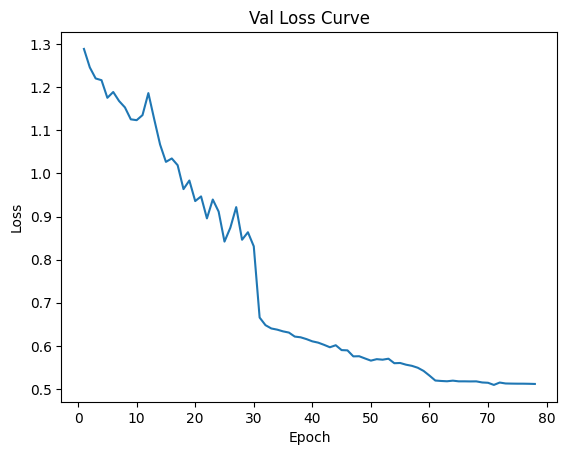

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11319884686515881


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 79/200*****
*****Train Loss:  0.543172 Val Loss:  0.511482*****
*****Validation Accuracy: 64.41%*****
*****Total Avg Disparity: 0.08663245911398762*****

Class Parade: Recall Difference = -0.030817402768622437
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = 0.014224751066856278
Class Dancing: Recall Difference = 0.14880952380952378
Class Funeral: Recall Difference = -0.027124773960217063
Class Cheering: Recall Difference = 0.04041353383458657
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165615
Class Concerts: Recall Difference = 0.028033794162826364
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.1012246460007653
Class Picnic: Recall Difference = -0.08974358974358965
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1071

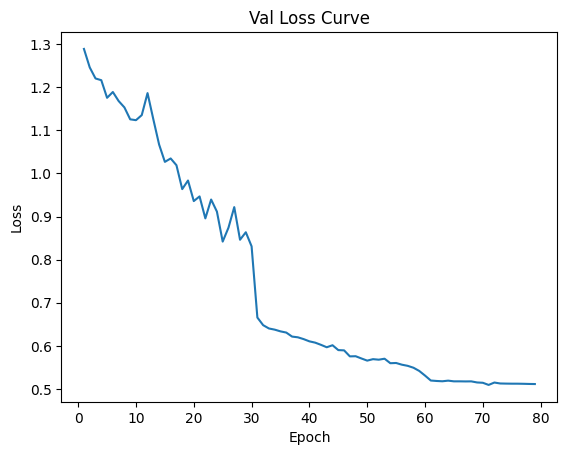

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11449474554795486


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 80/200*****
*****Train Loss:  0.539679 Val Loss:  0.510253*****
*****Validation Accuracy: 64.73%*****
*****Total Avg Disparity: 0.08132859508449292*****

Class Parade: Recall Difference = -0.018677213799165093
Class Handshaking: Recall Difference = -0.03571428571428564
Class Riot: Recall Difference = -0.003319108582266528
Class Dancing: Recall Difference = 0.125
Class Funeral: Recall Difference = -0.027124773960217063
Class Cheering: Recall Difference = 0.023496240601503793
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.028033794162826364
Class Couple: Recall Difference = 0.24966078697421984
Class Family_Group: Recall Difference = -0.11404515882127819
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.1071428571428571
Cl

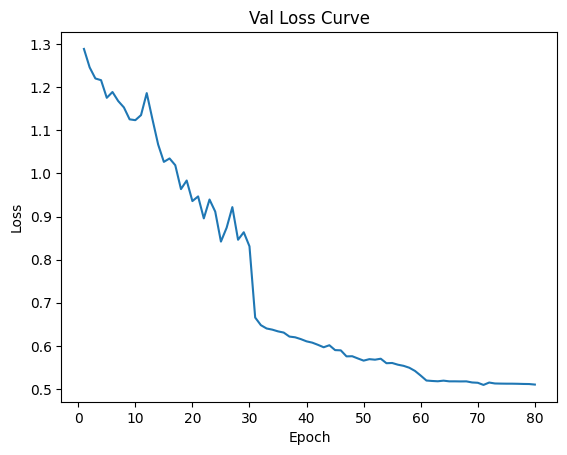

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11382924794004513


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 81/200*****
*****Train Loss:  0.538850 Val Loss:  0.508056*****
*****Validation Accuracy: 64.73%*****
*****Total Avg Disparity: 0.08530732959060859*****

Class Parade: Recall Difference = -0.03219072731267858
Class Handshaking: Recall Difference = -0.035714285714285615
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.1071428571428571
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.04135338345864664
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165626
Class Concerts: Recall Difference = 0.007680491551459445
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.0991197856869499
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.1071428

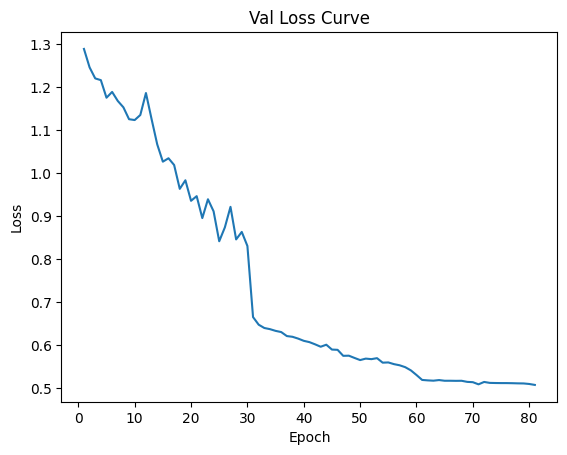

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11317945730227691


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 82/200*****
*****Train Loss:  0.540596 Val Loss:  0.510282*****
*****Validation Accuracy: 64.67%*****
*****Total Avg Disparity: 0.08470512416866241*****

Class Parade: Recall Difference = -0.03219072731267858
Class Handshaking: Recall Difference = -0.035714285714285615
Class Riot: Recall Difference = -0.02086296823138928
Class Dancing: Recall Difference = 0.125
Class Funeral: Recall Difference = -0.02712477396021684
Class Cheering: Recall Difference = 0.03195488721804507
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387847
Class Concerts: Recall Difference = 0.02803379416282653
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.11404515882127819
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.1071428571428571
Class 

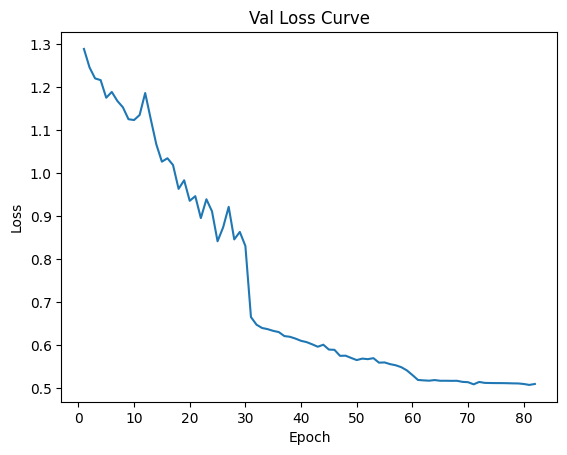

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11346762369458492


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 83/200*****
*****Train Loss:  0.535159 Val Loss:  0.509293*****
*****Validation Accuracy: 64.61%*****
*****Total Avg Disparity: 0.0848092553748549*****

Class Parade: Recall Difference = -0.01730388925510895
Class Handshaking: Recall Difference = -0.05357142857142852
Class Riot: Recall Difference = -0.02086296823138928
Class Dancing: Recall Difference = 0.08630952380952372
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.059210526315789436
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387847
Class Concerts: Recall Difference = 0.05184331797235031
Class Couple: Recall Difference = 0.3405698778833108
Class Family_Group: Recall Difference = -0.1289705319556066
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.107142857

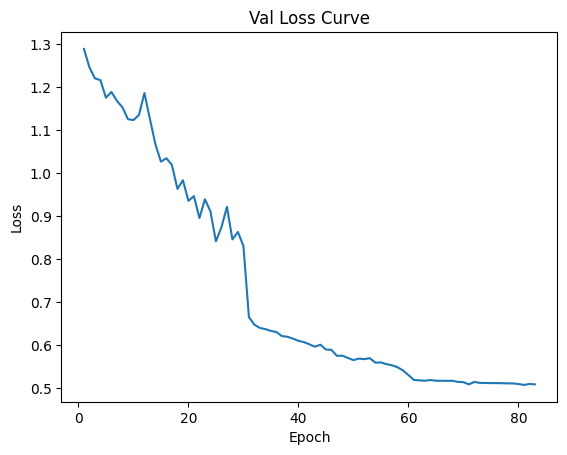

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11338124280938736


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 84/200*****
*****Train Loss:  0.540283 Val Loss:  0.506657*****
*****Validation Accuracy: 64.81%*****
*****Total Avg Disparity: 0.08316212562791128*****

Class Parade: Recall Difference = -0.02406064601186564
Class Handshaking: Recall Difference = -0.03571428571428564
Class Riot: Recall Difference = -0.02086296823138939
Class Dancing: Recall Difference = 0.12499999999999994
Class Funeral: Recall Difference = -0.01446654611211573
Class Cheering: Recall Difference = 0.05921052631578949
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = 0.03149001536098317
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.11404515882127819
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.10714285

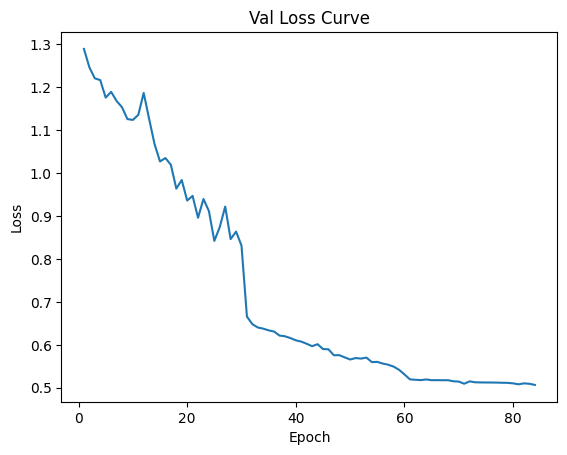

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11367706381357633


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 85/200*****
*****Train Loss:  0.534870 Val Loss:  0.507777*****
*****Validation Accuracy: 64.96%*****
*****Total Avg Disparity: 0.08039919042530652*****

Class Parade: Recall Difference = -0.011920457042408295
Class Handshaking: Recall Difference = -0.03571428571428567
Class Riot: Recall Difference = 0.014224751066856334
Class Dancing: Recall Difference = 0.1071428571428571
Class Funeral: Recall Difference = -0.0018083182640143969
Class Cheering: Recall Difference = 0.005639097744360888
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = 0.019585253456221197
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.07347876004592407
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.107

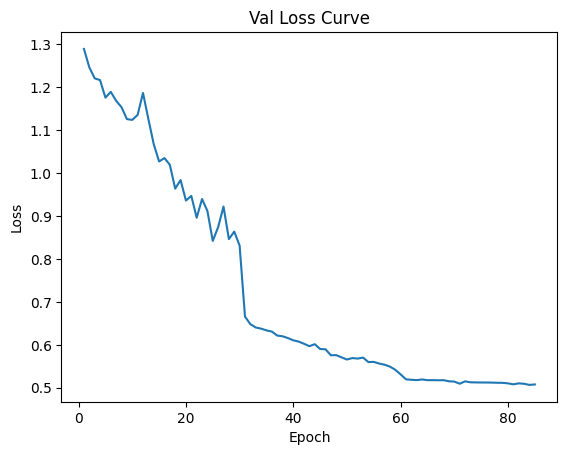

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11365819722414017


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 86/200*****
*****Train Loss:  0.535433 Val Loss:  0.503854*****
*****Validation Accuracy: 64.67%*****
*****Total Avg Disparity: 0.08158610659840866*****

Class Parade: Recall Difference = -0.01730388925510895
Class Handshaking: Recall Difference = -0.035714285714285615
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.1041666666666668
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.0413533834586467
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.02803379416282653
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = 0.009803921568627416
Class Spa: Recall Difference = 0.10714

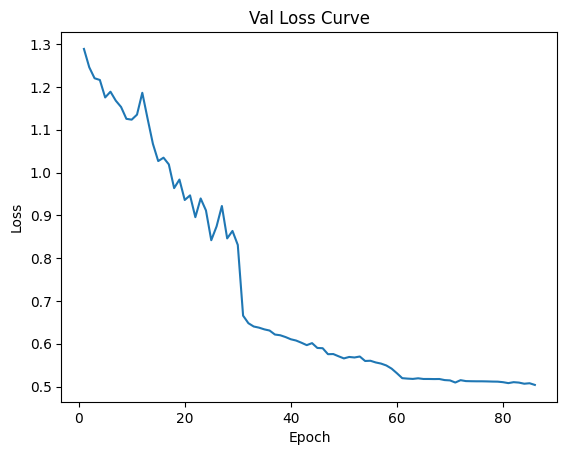

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11277095486338322


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.26s/it]


*****Epoch 87/200*****
*****Train Loss:  0.533217 Val Loss:  0.505361*****
*****Validation Accuracy: 64.81%*****
*****Total Avg Disparity: 0.08317341864596862*****

Class Parade: Recall Difference = -0.02406064601186564
Class Handshaking: Recall Difference = -0.035714285714285615
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.1279761904761904
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.04135338345864664
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.039938556067588504
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.12897053195560654
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.107142

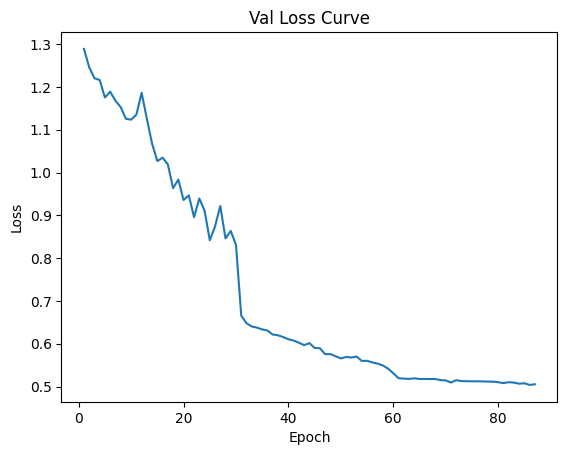

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11299920683869949


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 88/200*****
*****Train Loss:  0.540896 Val Loss:  0.507084*****
*****Validation Accuracy: 64.81%*****
*****Total Avg Disparity: 0.08601637660211062*****

Class Parade: Recall Difference = -0.025433970555921892
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.02086296823138939
Class Dancing: Recall Difference = 0.14583333333333326
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.04135338345864664
Class Meeting: Recall Difference = 0.12788461538461537
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.03149001536098317
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.1012246460007653
Class Picnic: Recall Difference = -0.08974358974358976
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.1071428

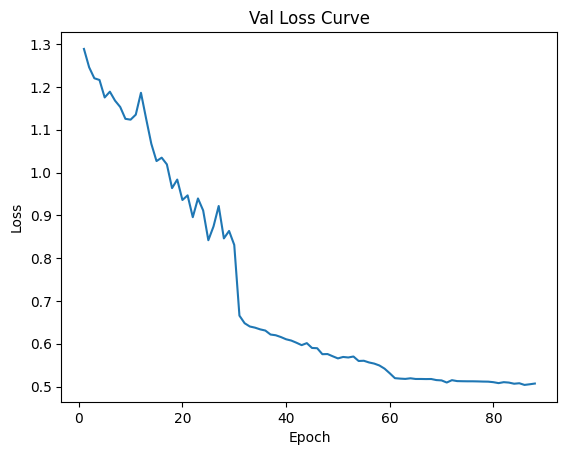

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:54<00:00,  4.39s/it]


Average Adversary epoch loss: 0.11408480256795883


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 89/200*****
*****Train Loss:  0.534675 Val Loss:  0.504808*****
*****Validation Accuracy: 65.16%*****
*****Total Avg Disparity: 0.08409953025518364*****

Class Parade: Recall Difference = -0.013293781586464548
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.02086296823138939
Class Dancing: Recall Difference = 0.06547619047619041
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.0770676691729324
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.08071278825995803
Class Concerts: Recall Difference = -0.004224270353302639
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.08840413318025259
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.10714

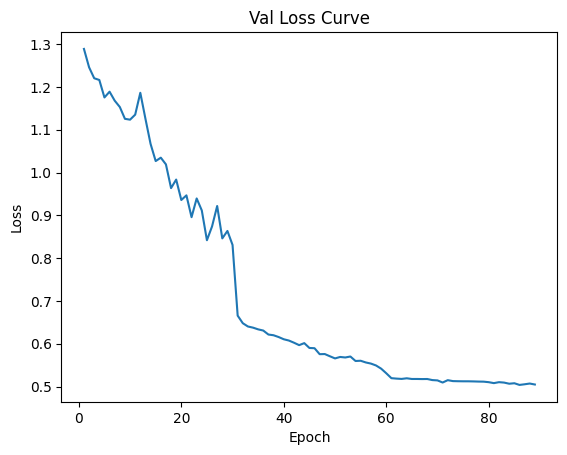

Data has been appended to validation_1.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11284043353337508


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 90/200*****
*****Train Loss:  0.534227 Val Loss:  0.507062*****
*****Validation Accuracy: 65.07%*****
*****Total Avg Disparity: 0.08016248101329393*****

Class Parade: Recall Difference = -0.03356405185673483
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.1071428571428571
Class Funeral: Recall Difference = -0.039783001808318175
Class Cheering: Recall Difference = 0.0413533834586467
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.05184331797235037
Class Couple: Recall Difference = 0.35549525101763907
Class Family_Group: Recall Difference = -0.08840413318025253
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.083333

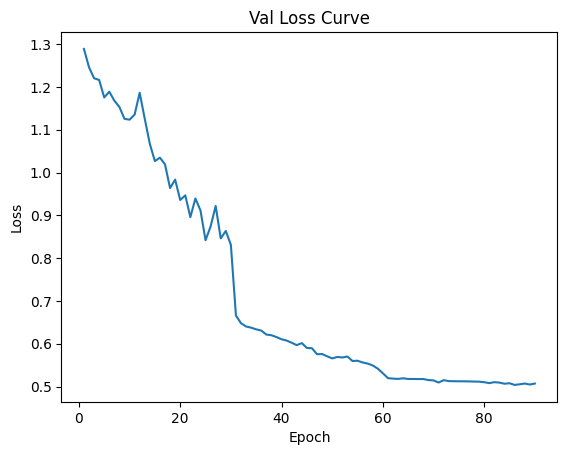

Data has been appended to validation_1.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11272321354884368


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 91/200*****
*****Train Loss:  0.539086 Val Loss:  0.506346*****
*****Validation Accuracy: 65.07%*****
*****Total Avg Disparity: 0.08212752325343047*****

Class Parade: Recall Difference = -0.03356405185673483
Class Handshaking: Recall Difference = -0.03571428571428564
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.1071428571428571
Class Funeral: Recall Difference = -0.01446654611211562
Class Cheering: Recall Difference = 0.0413533834586467
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = 0.039938556067588504
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.08629927286643707
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.107142

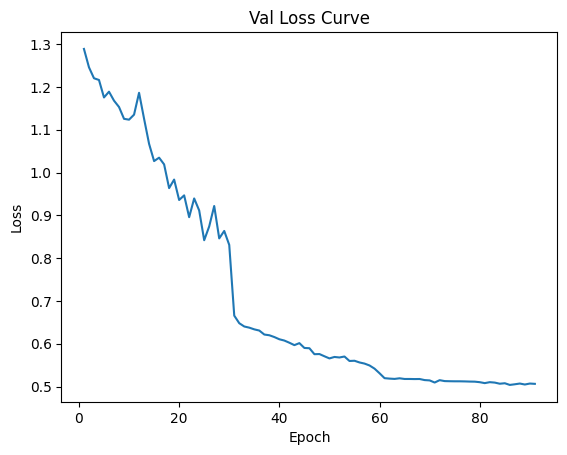

Data has been appended to validation_1.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11232968505758506


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 92/200*****
*****Train Loss:  0.534914 Val Loss:  0.505743*****
*****Validation Accuracy: 65.19%*****
*****Total Avg Disparity: 0.08134393949897592*****

Class Parade: Recall Difference = -0.03356405185673483
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.08630952380952372
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.0413533834586467
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165615
Class Concerts: Recall Difference = 0.05184331797235037
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.10122464600076542
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.1071

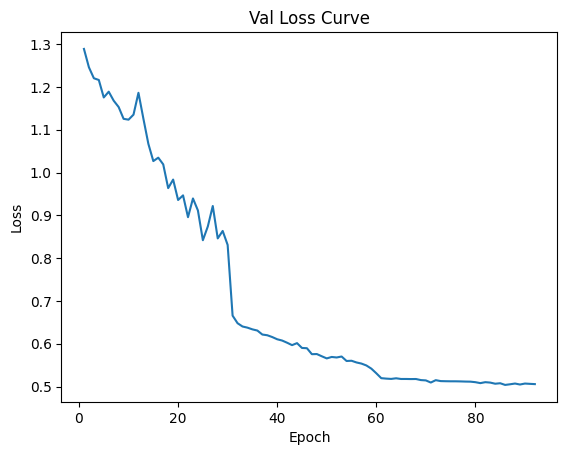

Data has been appended to validation_1.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.1132743375805708


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 93/200*****
*****Train Loss:  0.537593 Val Loss:  0.504017*****
*****Validation Accuracy: 65.22%*****
*****Total Avg Disparity: 0.07804044844325135*****

Class Parade: Recall Difference = -0.03356405185673483
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.06547619047619035
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.0413533834586467
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.039938556067588504
Class Couple: Recall Difference = 0.38534599728629576
Class Family_Group: Recall Difference = -0.11615001913509382
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.083

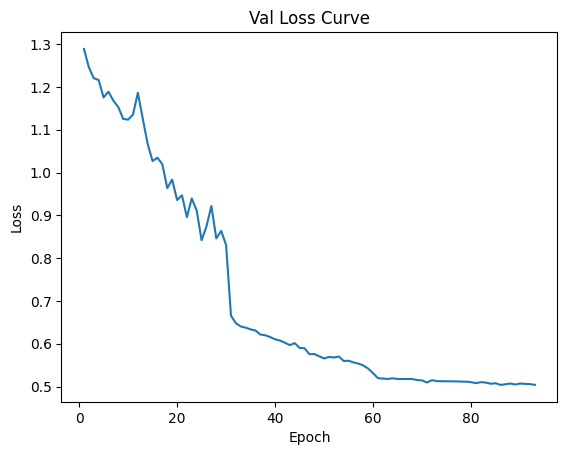

Data has been appended to validation_1.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:57<00:00,  4.52s/it]


Average Adversary epoch loss: 0.11354535044385837


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 94/200*****
*****Train Loss:  0.530853 Val Loss:  0.505820*****
*****Validation Accuracy: 65.13%*****
*****Total Avg Disparity: 0.0804892031455137*****

Class Parade: Recall Difference = -0.03219072731267858
Class Handshaking: Recall Difference = -0.017857142857142738
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.04464285714285704
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.0413533834586467
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.05184331797235037
Class Couple: Recall Difference = 0.38534599728629576
Class Family_Group: Recall Difference = -0.10122464600076542
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.083333

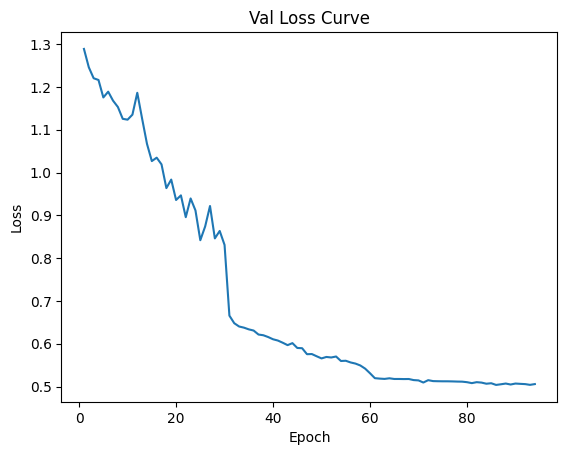

Data has been appended to validation_1.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.1127251644547169


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 95/200*****
*****Train Loss:  0.532846 Val Loss:  0.504719*****
*****Validation Accuracy: 65.16%*****
*****Total Avg Disparity: 0.08108003692440026*****

Class Parade: Recall Difference = -0.03356405185673483
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.1071428571428571
Class Funeral: Recall Difference = -0.027124773960216952
Class Cheering: Recall Difference = 0.04135338345864664
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.019585253456221308
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.10122464600076542
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.1071

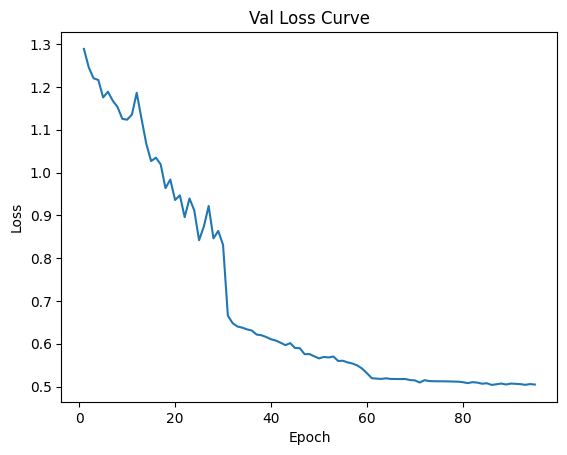

Data has been appended to validation_1.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11285890294955327


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 96/200*****
*****Train Loss:  0.533925 Val Loss:  0.507669*****
*****Validation Accuracy: 65.19%*****
*****Total Avg Disparity: 0.0785871688051864*****

Class Parade: Recall Difference = -0.025433970555921892
Class Handshaking: Recall Difference = -0.017857142857142766
Class Riot: Recall Difference = -0.0033191085822664723
Class Dancing: Recall Difference = 0.08630952380952372
Class Funeral: Recall Difference = -0.01446654611211562
Class Cheering: Recall Difference = 0.0413533834586467
Class Meeting: Recall Difference = 0.1432692307692307
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.019585253456221308
Class Couple: Recall Difference = 0.37042062415196747
Class Family_Group: Recall Difference = -0.1012246460007653
Class Picnic: Recall Difference = -0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.03790849673202612
Class Spa: Recall Difference = 0.08333

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:55<00:00,  4.45s/it]


*******Epoch 0: loss - 1.3757868179908166


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:54<00:00,  4.39s/it]


*******Epoch 1: loss - 1.3277091475633473


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:57<00:00,  4.51s/it]


*******Epoch 2: loss - 1.280848516867711


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Pretrain Adversary epoch loss:  0.21078635121767336


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.37s/it]


Average Pretrain Adversary epoch loss:  0.13145258678839758


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Pretrain Adversary epoch loss:  0.1257818561906998


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.12421739387970704


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 1/200*****
*****Train Loss:  1.050459 Val Loss:  1.232796*****
*****Validation Accuracy: 20.71%*****
*****Total Avg Disparity: 0.07628321093618698*****

Class Parade: Recall Difference = 0.11470006591957815
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = -0.026785714285714274
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.07142857142857142
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.0
Class Soldier_Patrol: Recall Difference = -0.07320261437908496
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.18643623985336477
Class Running: Recall Dif

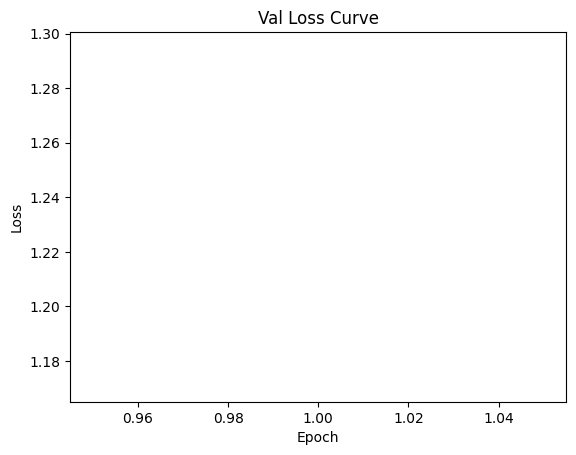

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12586268295462316


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 2/200*****
*****Train Loss:  1.006991 Val Loss:  1.204799*****
*****Validation Accuracy: 20.82%*****
*****Total Avg Disparity: 0.07267302745406153*****

Class Parade: Recall Difference = 0.056306306306306286
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.0
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.047619047619047616
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = -0.06060606060606061
Class Soldier_Patrol: Recall Difference = -0.14509803921568637
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.1633935585231736
Class Running: Recall Dif

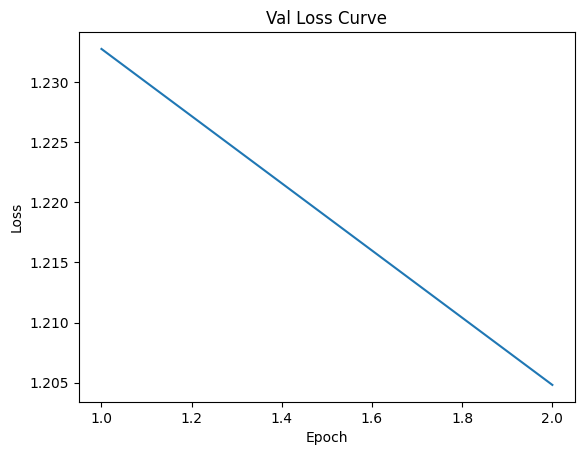

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.12630091406978095


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 3/200*****
*****Train Loss:  0.985567 Val Loss:  1.181906*****
*****Validation Accuracy: 22.62%*****
*****Total Avg Disparity: 0.05876917874463852*****

Class Parade: Recall Difference = 0.026422764227642226
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.029761904761904753
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.08333333333333334
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.10955710955710951
Class Soldier_Patrol: Recall Difference = -0.011764705882352955
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.14139827179890024
Class Ru

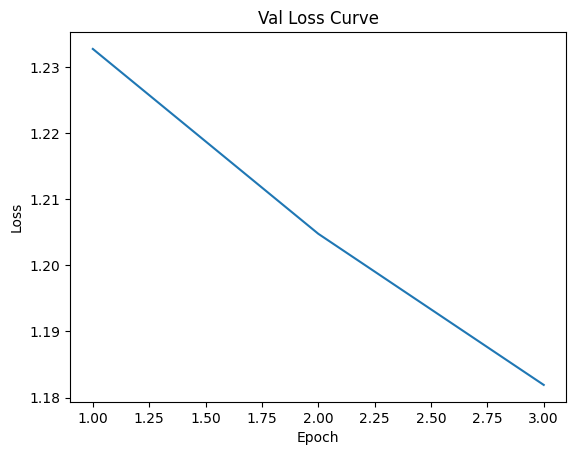

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.12092078047303054


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 4/200*****
*****Train Loss:  0.970858 Val Loss:  1.207694*****
*****Validation Accuracy: 21.84%*****
*****Total Avg Disparity: 0.07615873780033615*****

Class Parade: Recall Difference = 0.039551746868820126
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.005952380952380973
Class Funeral: Recall Difference = 0.05063291139240507
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.12442396313364054
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.03846153846153846
Class Soldier_Patrol: Recall Difference = 0.14444444444444446
Class Spa: Recall Difference = 0.0
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.099240638910

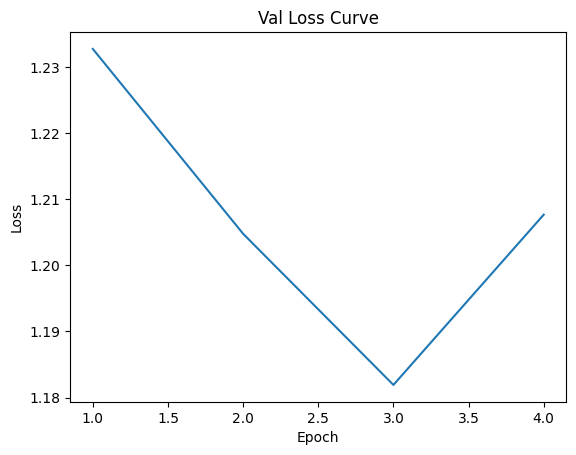

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.1221246705032312


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 5/200*****
*****Train Loss:  0.945516 Val Loss:  1.129496*****
*****Validation Accuracy: 25.49%*****
*****Total Avg Disparity: 0.06823646362273487*****

Class Parade: Recall Difference = 0.016095363656339234
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.02038880986249403
Class Dancing: Recall Difference = -0.011904761904761904
Class Funeral: Recall Difference = 0.015672091621458745
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.018269230769230788
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.018867924528301886
Class Concerts: Recall Difference = 0.13440860215053765
Class Couple: Recall Difference = 0.07462686567164181
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.0489510489510489
Class Soldier_Patrol: Recall Difference = -0.056209150326797463
Class Spa: Recall Difference = -0.02380952380952381
Class Sports_Fan: Recall Difference = 0.0
Class Sur

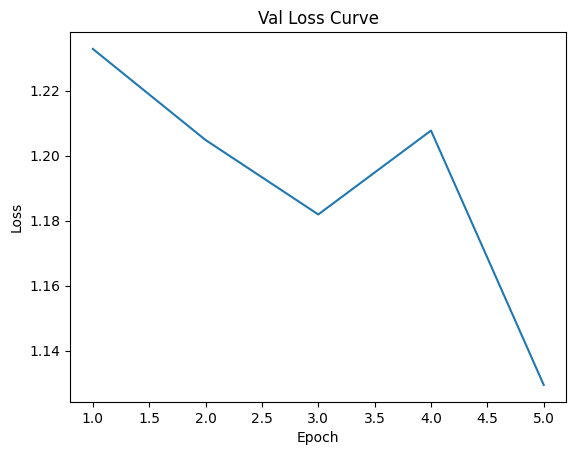

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.12233818580324833


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 6/200*****
*****Train Loss:  0.921466 Val Loss:  1.162704*****
*****Validation Accuracy: 23.98%*****
*****Total Avg Disparity: 0.05515577597136787*****

Class Parade: Recall Difference = -0.010217534607778633
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.008928571428571425
Class Funeral: Recall Difference = -0.03496081977094635
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.1576923076923077
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.009958071278825996
Class Concerts: Recall Difference = 0.0
Class Couple: Recall Difference = 0.0746268656716418
Class Family_Group: Recall Difference = 0.025449674703406047
Class Picnic: Recall Difference = 0.04079254079254077
Class Soldier_Patrol: Recall Difference = 0.11699346405228761
Class Spa: Recall Difference = 0.053571428571428575
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Differ

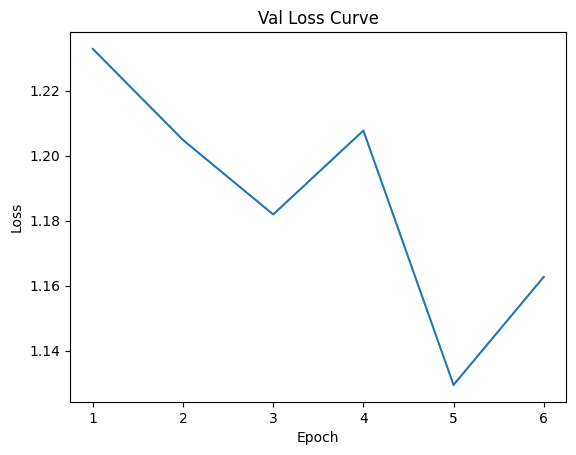

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.35s/it]


Average Adversary epoch loss: 0.12378850178076671


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 7/200*****
*****Train Loss:  0.911269 Val Loss:  1.172709*****
*****Validation Accuracy: 23.92%*****
*****Total Avg Disparity: 0.05547120433555288*****

Class Parade: Recall Difference = -0.08706877609316632
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.001422475106685639
Class Dancing: Recall Difference = -0.02976190476190476
Class Funeral: Recall Difference = -0.006630500301386358
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.0009615384615384512
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.08542976939203356
Class Concerts: Recall Difference = -0.008448540706605223
Class Couple: Recall Difference = -0.09226594301221165
Class Family_Group: Recall Difference = 0.004018369690011472
Class Picnic: Recall Difference = 0.11188811188811187
Class Soldier_Patrol: Recall Difference = -0.013725490196078272
Class Spa: Recall Difference = -0.10119047619047616
Class Sports_Fan: Recall Diff

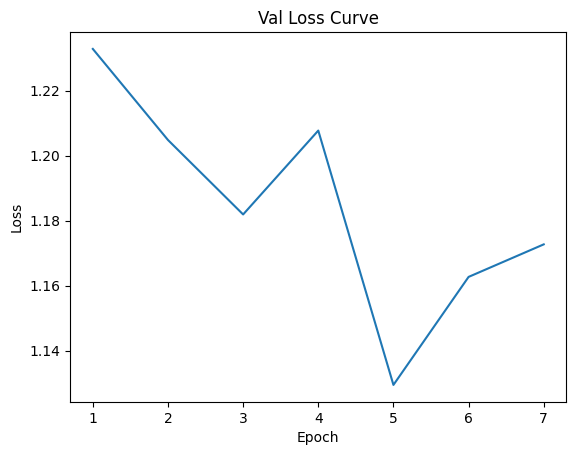

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.12101297911543113


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 8/200*****
*****Train Loss:  0.896010 Val Loss:  1.055803*****
*****Validation Accuracy: 29.22%*****
*****Total Avg Disparity: 0.07135997083680386*****

Class Parade: Recall Difference = -0.05603164139749495
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.08771929824561406
Class Dancing: Recall Difference = -0.014880952380952384
Class Funeral: Recall Difference = 0.0024110910186859458
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.08076923076923076
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.028825995807127875
Class Concerts: Recall Difference = 0.01036866359447007
Class Couple: Recall Difference = 0.22388059701492538
Class Family_Group: Recall Difference = -0.0044010715652507
Class Picnic: Recall Difference = 0.15850815850815847
Class Soldier_Patrol: Recall Difference = -0.01699346405228752
Class Spa: Recall Difference = 0.05357142857142855
Class Sports_Fan: Recall Difference =

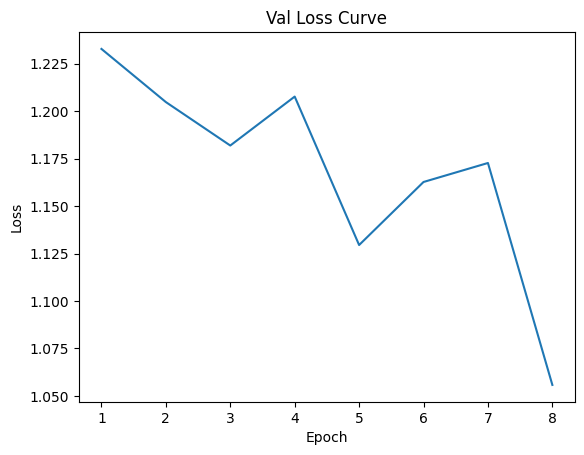

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12051844625518872


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 9/200*****
*****Train Loss:  0.878611 Val Loss:  1.054934*****
*****Validation Accuracy: 30.52%*****
*****Total Avg Disparity: 0.06248097554446224*****

Class Parade: Recall Difference = -0.007251153592617077
Class Handshaking: Recall Difference = 0.017857142857142856
Class Riot: Recall Difference = 0.025604551920341397
Class Dancing: Recall Difference = 0.00892857142857141
Class Funeral: Recall Difference = 0.009041591320072345
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = 0.04230769230769235
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03878406708595389
Class Concerts: Recall Difference = 0.04953917050691248
Class Couple: Recall Difference = 0.08819538670284939
Class Family_Group: Recall Difference = -0.09624952162265599
Class Picnic: Recall Difference = 0.09557109557109553
Class Soldier_Patrol: Recall Difference = 0.04379084967320257
Class Spa: Recall Difference = 0.2083333333333333
Class Sp

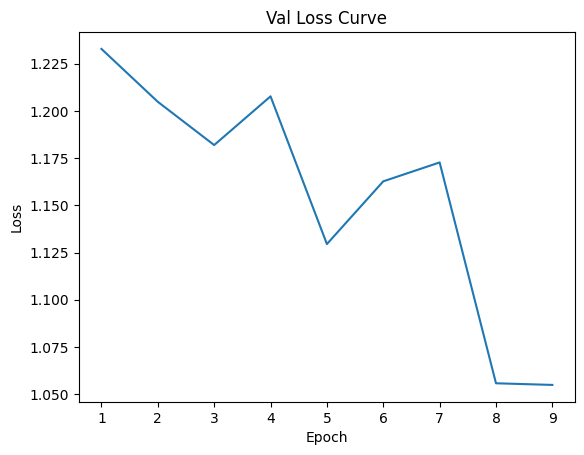

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.1198986370403033


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 10/200*****
*****Train Loss:  0.869886 Val Loss:  1.034911*****
*****Validation Accuracy: 29.71%*****
*****Total Avg Disparity: 0.08644435483680596*****

Class Parade: Recall Difference = -0.04894528675016474
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.006638217164532972
Class Dancing: Recall Difference = 0.005952380952380959
Class Funeral: Recall Difference = -0.019288728149487636
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = -0.0798076923076923
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.07337526205450734
Class Concerts: Recall Difference = 0.006912442396313376
Class Couple: Recall Difference = 0.17910447761194032
Class Family_Group: Recall Difference = 0.036165327210103335
Class Picnic: Recall Difference = 0.12004662004662009
Class Soldier_Patrol: Recall Difference = -0.05359477124183021
Class Spa: Recall Difference = 0.357142857142857
Class Sports_Fan: Rec

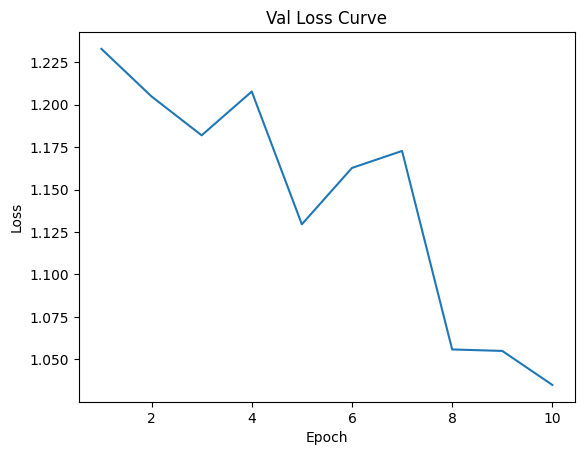

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.12171125841828492


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.27s/it]


*****Epoch 11/200*****
*****Train Loss:  0.851773 Val Loss:  1.006130*****
*****Validation Accuracy: 31.74%*****
*****Total Avg Disparity: 0.09990431032360378*****

Class Parade: Recall Difference = -0.08009228740936081
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.10241820768136559
Class Dancing: Recall Difference = 0.026785714285714288
Class Funeral: Recall Difference = 0.08499095840867996
Class Cheering: Recall Difference = 0.10714285714285715
Class Meeting: Recall Difference = 0.027884615384615397
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.009958071278825996
Class Concerts: Recall Difference = -0.013440860215053738
Class Couple: Recall Difference = 0.0583446404341927
Class Family_Group: Recall Difference = -0.07711442786069653
Class Picnic: Recall Difference = 0.026806526806526815
Class Soldier_Patrol: Recall Difference = 0.07516339869281075
Class Spa: Recall Difference = 0.1607142857142857
Class Sports_Fan: Reca

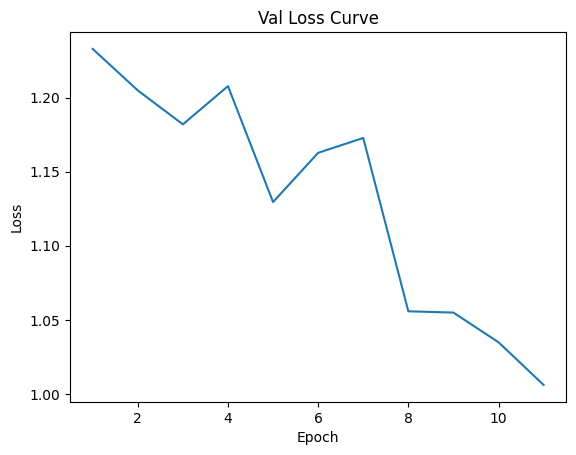

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12008990977819149


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 12/200*****
*****Train Loss:  0.848193 Val Loss:  1.006472*****
*****Validation Accuracy: 31.57%*****
*****Total Avg Disparity: 0.08789183526667657*****

Class Parade: Recall Difference = -0.0017578554163919513
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.016121384542437167
Class Dancing: Recall Difference = 0.023809523809523836
Class Funeral: Recall Difference = 0.11995177817962627
Class Cheering: Recall Difference = -0.026315789473684213
Class Meeting: Recall Difference = -0.006730769230769262
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.02987421383647801
Class Concerts: Recall Difference = 0.027265745007680503
Class Couple: Recall Difference = 0.08819538670284942
Class Family_Group: Recall Difference = -0.12418675851511675
Class Picnic: Recall Difference = 0.08974358974358976
Class Soldier_Patrol: Recall Difference = 0.07843137254901966
Class Spa: Recall Difference = 0.14880952380952372
Class Sports_Fan:

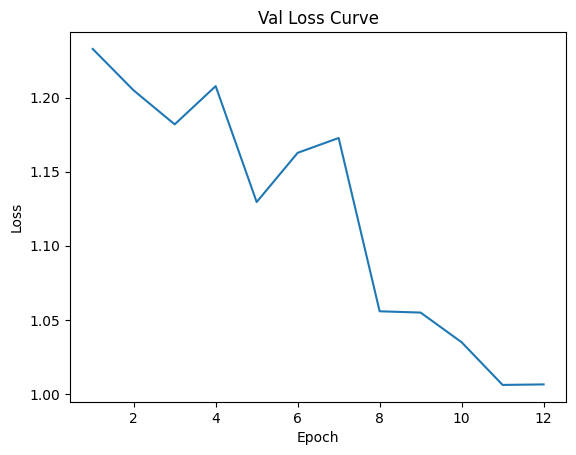

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11985740380791518


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 13/200*****
*****Train Loss:  0.840319 Val Loss:  1.005620*****
*****Validation Accuracy: 31.39%*****
*****Total Avg Disparity: 0.08691614590313414*****

Class Parade: Recall Difference = -0.03911228301472203
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.002844950213371264
Class Dancing: Recall Difference = 0.044642857142857095
Class Funeral: Recall Difference = 0.1193490054249548
Class Cheering: Recall Difference = 0.14285714285714288
Class Meeting: Recall Difference = -0.05288461538461536
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0020964360587002046
Class Concerts: Recall Difference = 0.12288786482334868
Class Couple: Recall Difference = 0.23880597014925367
Class Family_Group: Recall Difference = 0.06161500191350938
Class Picnic: Recall Difference = 0.02097902097902099
Class Soldier_Patrol: Recall Difference = -0.03594771241830064
Class Spa: Recall Difference = -0.08928571428571427
Class Sports_Fan: Re

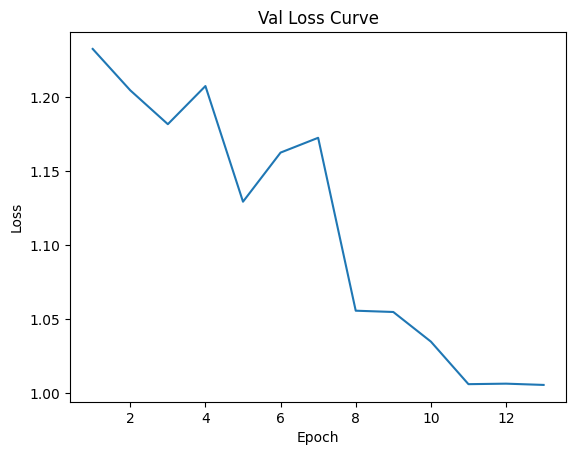

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12031126423523976


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 14/200*****
*****Train Loss:  0.820452 Val Loss:  1.022140*****
*****Validation Accuracy: 32.38%*****
*****Total Avg Disparity: 0.0925174365675769*****

Class Parade: Recall Difference = -0.10871237090749286
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = -0.037932669511616876
Class Dancing: Recall Difference = -0.07142857142857142
Class Funeral: Recall Difference = 0.1229656419529837
Class Cheering: Recall Difference = 0.05545112781954885
Class Meeting: Recall Difference = -0.1019230769230769
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.007861635220125784
Class Concerts: Recall Difference = 0.018817204301075294
Class Couple: Recall Difference = 0.07327001356852104
Class Family_Group: Recall Difference = -0.08591657099119787
Class Picnic: Recall Difference = 0.061771561771561734
Class Soldier_Patrol: Recall Difference = 0.06078431372549031
Class Spa: Recall Difference = 0.19642857142857129
Class

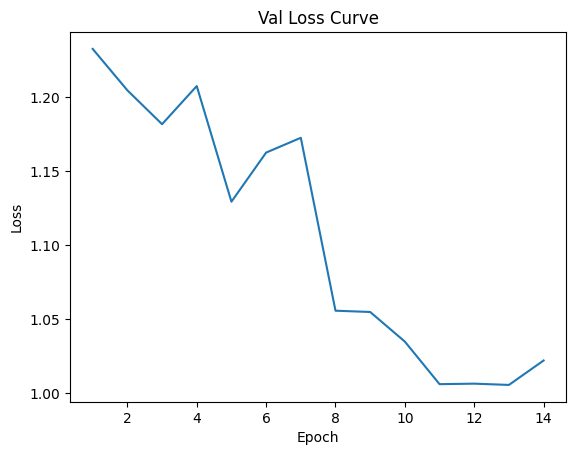

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11938961681265098


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 15/200*****
*****Train Loss:  0.807671 Val Loss:  1.038815*****
*****Validation Accuracy: 30.35%*****
*****Total Avg Disparity: 0.09527873178426711*****

Class Parade: Recall Difference = -0.0045045045045046805
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = -0.029761904761904746
Class Funeral: Recall Difference = 0.10126582278481014
Class Cheering: Recall Difference = 0.027255639097744356
Class Meeting: Recall Difference = 0.011538461538461553
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.04559748427672956
Class Concerts: Recall Difference = 0.08678955453149004
Class Couple: Recall Difference = 0.20895522388059704
Class Family_Group: Recall Difference = -0.02372751626482969
Class Picnic: Recall Difference = 0.17249417249417248
Class Soldier_Patrol: Recall Difference = 0.09150326797385633
Class Spa: Recall Difference = 0.20833333333333334
Class Sports_Fan: R

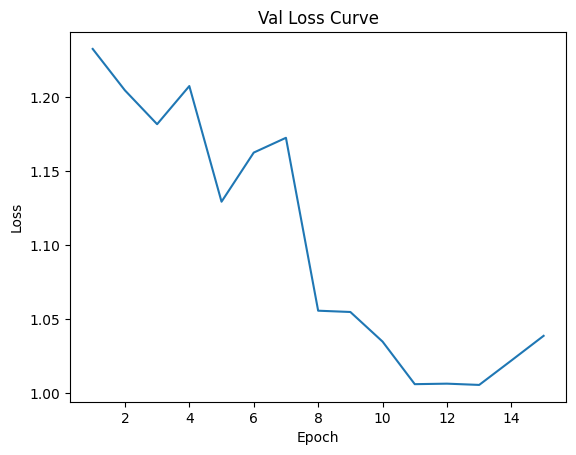

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.12049290681114563


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 16/200*****
*****Train Loss:  0.795656 Val Loss:  0.970134*****
*****Validation Accuracy: 34.55%*****
*****Total Avg Disparity: 0.10079865510039476*****

Class Parade: Recall Difference = -0.04641836958910117
Class Handshaking: Recall Difference = 0.017857142857142856
Class Riot: Recall Difference = 0.03366524419155999
Class Dancing: Recall Difference = -0.053571428571428575
Class Funeral: Recall Difference = 0.23086196503918022
Class Cheering: Recall Difference = 0.0009398496240601503
Class Meeting: Recall Difference = 0.16730769230769232
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.00786163522012577
Class Concerts: Recall Difference = 0.12288786482334868
Class Couple: Recall Difference = 0.23880597014925373
Class Family_Group: Recall Difference = 0.008036739380022945
Class Picnic: Recall Difference = 0.026806526806526787
Class Soldier_Patrol: Recall Difference = -0.021568627450980316
Class Spa: Recall Difference = 0.23214285714285712
C

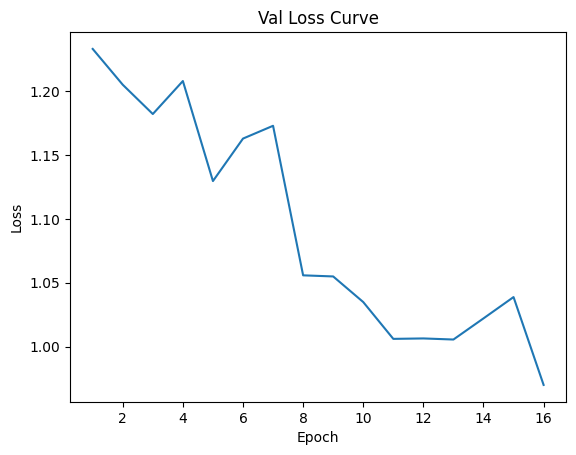

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11918491554947999


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 17/200*****
*****Train Loss:  0.779459 Val Loss:  0.912658*****
*****Validation Accuracy: 36.98%*****
*****Total Avg Disparity: 0.09557009989089085*****

Class Parade: Recall Difference = -0.018237749945066883
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = 0.011853959222380278
Class Dancing: Recall Difference = 0.05952380952380951
Class Funeral: Recall Difference = 0.11332127787823992
Class Cheering: Recall Difference = 0.04511278195488723
Class Meeting: Recall Difference = -0.039423076923076894
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.02096436058700213
Class Concerts: Recall Difference = 0.1432411674347159
Class Couple: Recall Difference = 0.16282225237449116
Class Family_Group: Recall Difference = -0.008802143130501358
Class Picnic: Recall Difference = -0.017482517482517557
Class Soldier_Patrol: Recall Difference = 0.05620915032679752
Class Spa: Recall Difference = 0.35714285714285715
Clas

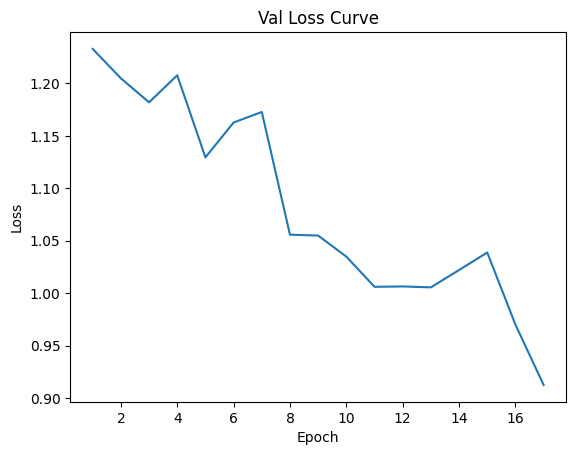

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11938821639005955


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.22s/it]


*****Epoch 18/200*****
*****Train Loss:  0.776331 Val Loss:  0.934565*****
*****Validation Accuracy: 36.66%*****
*****Total Avg Disparity: 0.1123530260581241*****

Class Parade: Recall Difference = -0.024664908811250164
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = 0.08629682313892839
Class Dancing: Recall Difference = 0.011904761904761946
Class Funeral: Recall Difference = 0.15129596142254376
Class Cheering: Recall Difference = 0.04605263157894739
Class Meeting: Recall Difference = 0.03846153846153855
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.006813417190775689
Class Concerts: Recall Difference = 0.08371735791090629
Class Couple: Recall Difference = 0.10312075983717776
Class Family_Group: Recall Difference = -0.11366245694603905
Class Picnic: Recall Difference = -0.10256410256410256
Class Soldier_Patrol: Recall Difference = 0.09607843137254912
Class Spa: Recall Difference = 0.3630952380952381
Class 

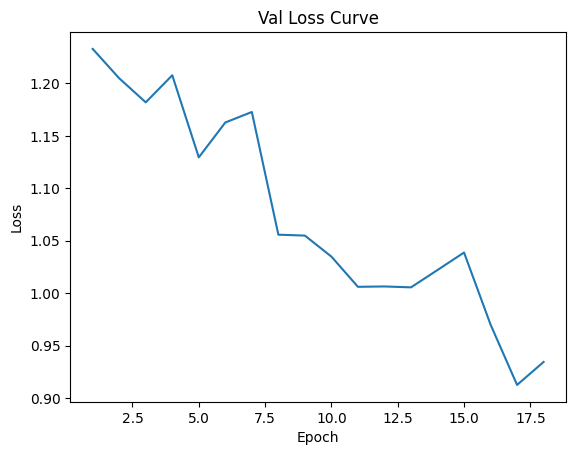

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11890731780574872


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 19/200*****
*****Train Loss:  0.770132 Val Loss:  0.879347*****
*****Validation Accuracy: 39.04%*****
*****Total Avg Disparity: 0.09179093805109309*****

Class Parade: Recall Difference = -0.05762469786860025
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = -0.02038880986249407
Class Dancing: Recall Difference = 0.017857142857142794
Class Funeral: Recall Difference = 0.2399035563592525
Class Cheering: Recall Difference = 0.02725563909774436
Class Meeting: Recall Difference = 0.16442307692307695
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.004192872117400437
Class Concerts: Recall Difference = 0.163594470046083
Class Couple: Recall Difference = 0.19267299864314796
Class Family_Group: Recall Difference = -0.062380405663987726
Class Picnic: Recall Difference = 0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.05490196078431364
Class Spa: Recall Difference = 0.11904761904761901
Class 

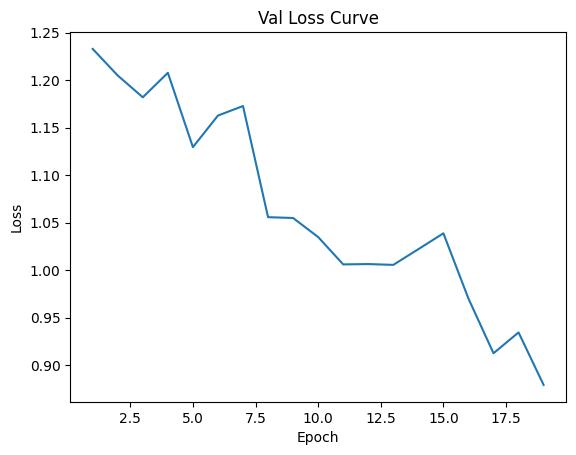

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.37s/it]


Average Adversary epoch loss: 0.11877810238645627


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 20/200*****
*****Train Loss:  0.749371 Val Loss:  0.991538*****
*****Validation Accuracy: 33.57%*****
*****Total Avg Disparity: 0.08772392995455378*****

Class Parade: Recall Difference = -0.0776752362118216
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.10146989094357516
Class Dancing: Recall Difference = -0.0029761904761904934
Class Funeral: Recall Difference = 0.10729355033152504
Class Cheering: Recall Difference = 0.00939849624060151
Class Meeting: Recall Difference = 0.04230769230769238
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.049790356394129986
Class Concerts: Recall Difference = 0.018817204301075266
Class Couple: Recall Difference = 0.11804613297150611
Class Family_Group: Recall Difference = -0.18465365480290852
Class Picnic: Recall Difference = 0.02097902097902099
Class Soldier_Patrol: Recall Difference = -0.12352941176470567
Class Spa: Recall Difference = 0.18452380952380953
Class Sports_Fan: Re

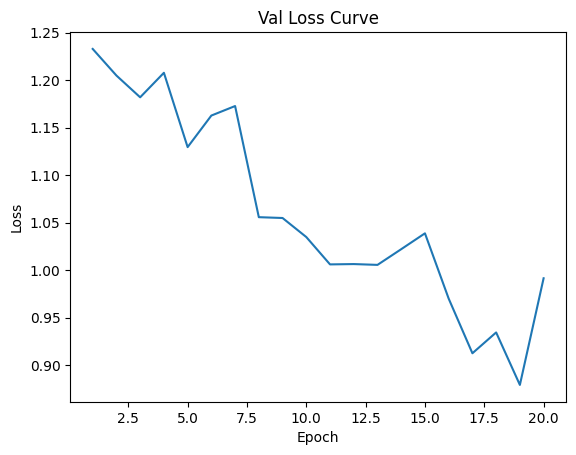

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12005525626815282


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 21/200*****
*****Train Loss:  0.735779 Val Loss:  0.935786*****
*****Validation Accuracy: 35.68%*****
*****Total Avg Disparity: 0.1034664597114535*****

Class Parade: Recall Difference = -0.024774774774774633
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.029761904761904823
Class Funeral: Recall Difference = 0.1422543701024714
Class Cheering: Recall Difference = 0.04605263157894737
Class Meeting: Recall Difference = 0.10384615384615387
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.09643605870020971
Class Concerts: Recall Difference = 0.08371735791090631
Class Couple: Recall Difference = 0.2537313432835821
Class Family_Group: Recall Difference = -0.09223115193264445
Class Picnic: Recall Difference = -0.006993006993006978
Class Soldier_Patrol: Recall Difference = -0.02614379084967311
Class Spa: Recall Difference = 0.08928571428571408
Class Sports_Fan: Recall Difference = 0.

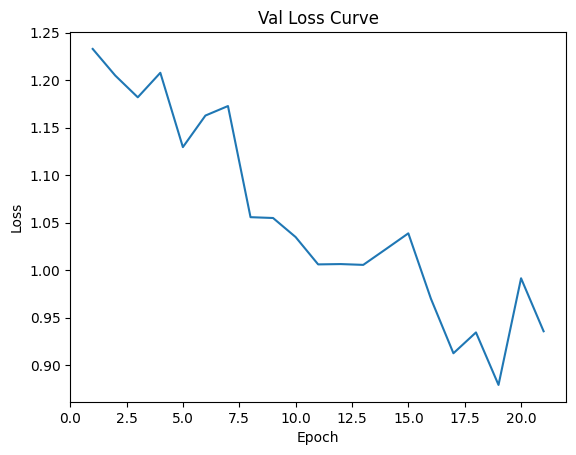

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11940880778890389


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 22/200*****
*****Train Loss:  0.728890 Val Loss:  0.931416*****
*****Validation Accuracy: 37.45%*****
*****Total Avg Disparity: 0.08435148070801048*****

Class Parade: Recall Difference = -0.056471105251593046
Class Handshaking: Recall Difference = 0.03571428571428572
Class Riot: Recall Difference = -0.10004741583688953
Class Dancing: Recall Difference = 0.03869047619047615
Class Funeral: Recall Difference = 0.13200723327305602
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = 0.13557692307692312
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.03354297693920333
Class Concerts: Recall Difference = 0.08870967741935482
Class Couple: Recall Difference = 0.1926729986431479
Class Family_Group: Recall Difference = -0.015308075009567573
Class Picnic: Recall Difference = 0.1305361305361305
Class Soldier_Patrol: Recall Difference = 0.005228758169934622
Class Spa: Recall Difference = 0.30952380952380953
Class S

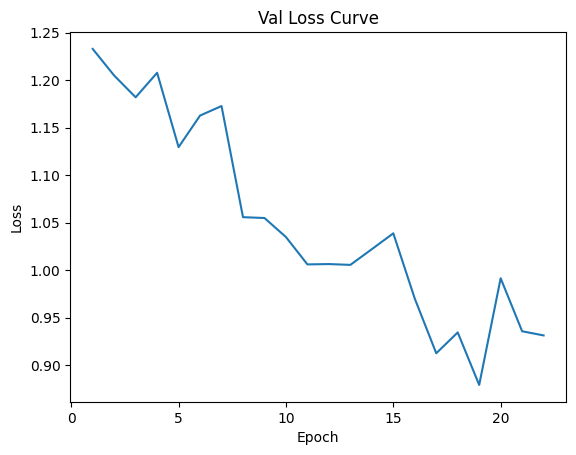

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11953638780575532


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 23/200*****
*****Train Loss:  0.722391 Val Loss:  0.993767*****
*****Validation Accuracy: 33.22%*****
*****Total Avg Disparity: 0.06783766889509601*****

Class Parade: Recall Difference = -0.15430674577016046
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.13655761024182078
Class Dancing: Recall Difference = 0.038690476190476206
Class Funeral: Recall Difference = 0.018685955394816156
Class Cheering: Recall Difference = -0.02537593984962406
Class Meeting: Recall Difference = 0.05769230769230771
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0010482180293501023
Class Concerts: Recall Difference = -0.10675883256528415
Class Couple: Recall Difference = 0.2388059701492537
Class Family_Group: Recall Difference = -0.047263681592039794
Class Picnic: Recall Difference = -0.09440559440559437
Class Soldier_Patrol: Recall Difference = 0.006535947712418277
Class Spa: Recall Difference = 0.10714285714285712
Class Sports_Fan:

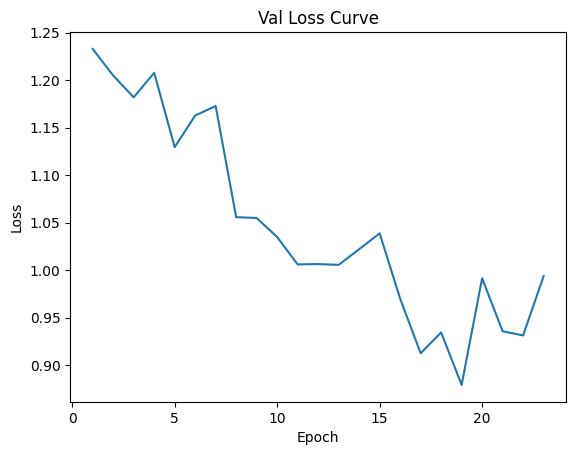

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11951398362333958


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 24/200*****
*****Train Loss:  0.699660 Val Loss:  0.911789*****
*****Validation Accuracy: 36.58%*****
*****Total Avg Disparity: 0.0948341555702136*****

Class Parade: Recall Difference = -0.09085915183476145
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.03651019440493125
Class Dancing: Recall Difference = 0.03273809523809529
Class Funeral: Recall Difference = 0.2814948764315854
Class Cheering: Recall Difference = 0.027255639097744352
Class Meeting: Recall Difference = 0.1817307692307692
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.06865828092243187
Class Concerts: Recall Difference = 0.11635944700460843
Class Couple: Recall Difference = 0.08683853459972865
Class Family_Group: Recall Difference = -0.03233830845771141
Class Picnic: Recall Difference = 0.006993006993006978
Class Soldier_Patrol: Recall Difference = -0.08496732026143783
Class Spa: Recall Difference = 0.20833333333333334
Class Sports_Fan: Recall 

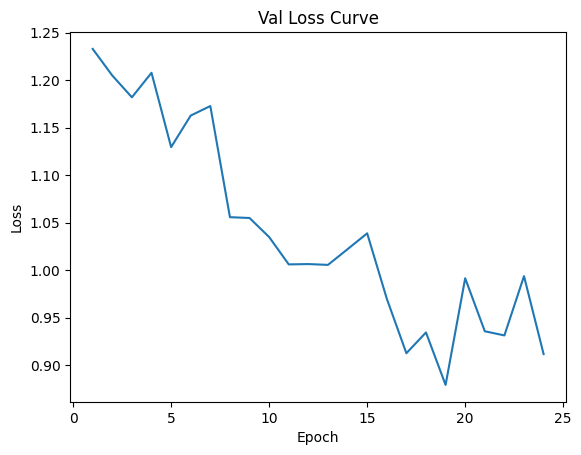

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.12048163179021615


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 25/200*****
*****Train Loss:  0.682567 Val Loss:  0.830663*****
*****Validation Accuracy: 39.70%*****
*****Total Avg Disparity: 0.08571169747708202*****

Class Parade: Recall Difference = -0.05762469786860036
Class Handshaking: Recall Difference = 0.05357142857142857
Class Riot: Recall Difference = -0.009483167377904222
Class Dancing: Recall Difference = 0.08333333333333337
Class Funeral: Recall Difference = 0.1766124171187462
Class Cheering: Recall Difference = 0.06390977443609024
Class Meeting: Recall Difference = 0.039423076923076894
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07966457023060797
Class Concerts: Recall Difference = 0.09062980030721968
Class Couple: Recall Difference = 0.16417910447761197
Class Family_Group: Recall Difference = 0.023153463451970918
Class Picnic: Recall Difference = 0.012820512820512775
Class Soldier_Patrol: Recall Difference = -0.051633986928104614
Class Spa: Recall Difference = 0.24404761904761918
Class

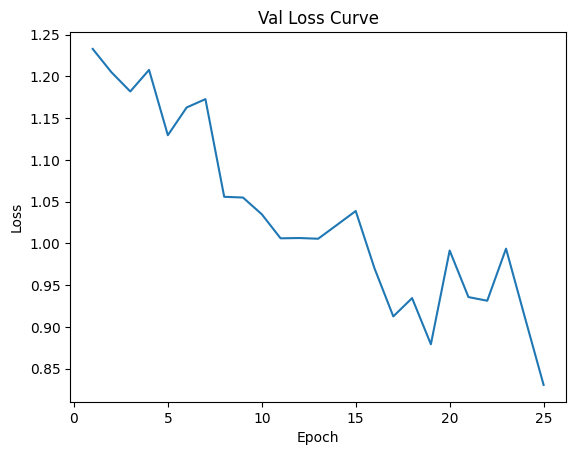

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11982205825356337


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 26/200*****
*****Train Loss:  0.681420 Val Loss:  0.901397*****
*****Validation Accuracy: 38.95%*****
*****Total Avg Disparity: 0.09264819810031898*****

Class Parade: Recall Difference = -0.0978356405185673
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = -0.10953058321479375
Class Dancing: Recall Difference = 0.008928571428571425
Class Funeral: Recall Difference = 0.009041591320072345
Class Cheering: Recall Difference = -0.00845864661654135
Class Meeting: Recall Difference = 0.07307692307692318
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.05660377358490567
Class Concerts: Recall Difference = 0.05798771121351769
Class Couple: Recall Difference = 0.012211668928086866
Class Family_Group: Recall Difference = 0.025066972828166834
Class Picnic: Recall Difference = -0.053613053613053574
Class Soldier_Patrol: Recall Difference = -0.09019607843137256
Class Spa: Recall Difference = 0.3154761904761905
Cla

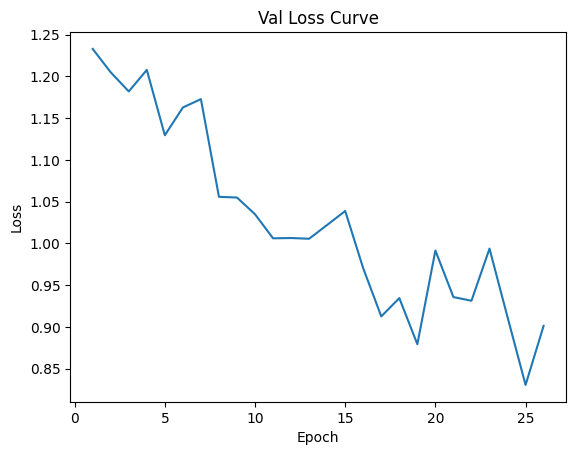

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11953777647935428


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 27/200*****
*****Train Loss:  0.672421 Val Loss:  0.813076*****
*****Validation Accuracy: 43.47%*****
*****Total Avg Disparity: 0.11762170794591843*****

Class Parade: Recall Difference = -0.10904196879806638
Class Handshaking: Recall Difference = -0.03571428571428566
Class Riot: Recall Difference = 0.11996206733048839
Class Dancing: Recall Difference = 0.09821428571428568
Class Funeral: Recall Difference = 0.252561784207354
Class Cheering: Recall Difference = 0.07236842105263158
Class Meeting: Recall Difference = 0.023076923076923106
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.08857442348008385
Class Concerts: Recall Difference = -0.014976958525345585
Class Couple: Recall Difference = 0.4029850746268657
Class Family_Group: Recall Difference = -0.08840413318025253
Class Picnic: Recall Difference = 0.1305361305361305
Class Soldier_Patrol: Recall Difference = 0.0862745098039216
Class Spa: Recall Difference = 0.1428571428571

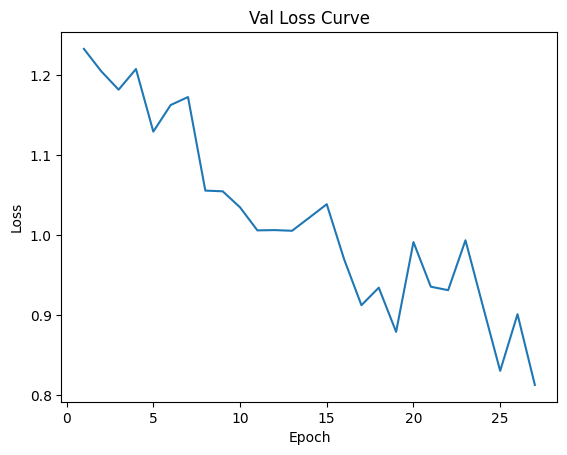

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11997584998607635


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 28/200*****
*****Train Loss:  0.657375 Val Loss:  0.751646*****
*****Validation Accuracy: 45.93%*****
*****Total Avg Disparity: 0.10242493673016029*****

Class Parade: Recall Difference = -0.10640518567347834
Class Handshaking: Recall Difference = 0.03571428571428572
Class Riot: Recall Difference = -0.22712185870080615
Class Dancing: Recall Difference = 0.11309523809523805
Class Funeral: Recall Difference = 0.11030741410488246
Class Cheering: Recall Difference = -0.0075187969924812165
Class Meeting: Recall Difference = 0.21153846153846156
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0775681341719078
Class Concerts: Recall Difference = 0.13632872503840257
Class Couple: Recall Difference = 0.0719131614654003
Class Family_Group: Recall Difference = 0.012246460007653948
Class Picnic: Recall Difference = -0.034965034965035
Class Soldier_Patrol: Recall Difference = -0.09019607843137267
Class Spa: Recall Difference = 0.17261904761904734
Class Sp

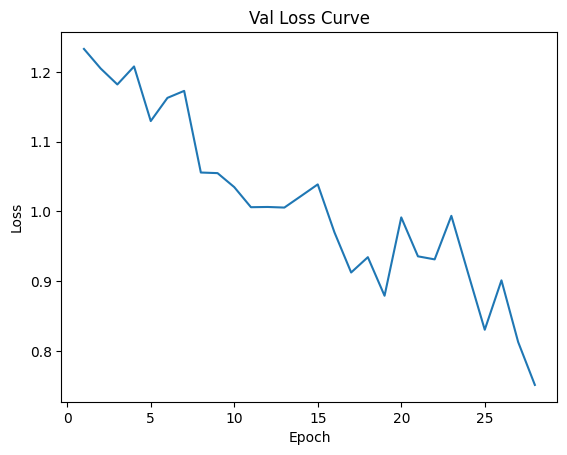

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.1184480688892878


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 29/200*****
*****Train Loss:  0.641924 Val Loss:  0.755961*****
*****Validation Accuracy: 45.96%*****
*****Total Avg Disparity: 0.10268417439649748*****

Class Parade: Recall Difference = -0.15990990990990983
Class Handshaking: Recall Difference = 0.1607142857142857
Class Riot: Recall Difference = -0.2408724513987671
Class Dancing: Recall Difference = 0.0535714285714286
Class Funeral: Recall Difference = 0.06871609403254969
Class Cheering: Recall Difference = 0.10808270676691731
Class Meeting: Recall Difference = -0.10096153846153844
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07756813417190778
Class Concerts: Recall Difference = 0.09869431643625196
Class Couple: Recall Difference = 0.2510176390773406
Class Family_Group: Recall Difference = -0.12877918101798702
Class Picnic: Recall Difference = -0.15268065268065262
Class Soldier_Patrol: Recall Difference = -0.08235294117647052
Class Spa: Recall Difference = 0.08928571428571425
Class Spor

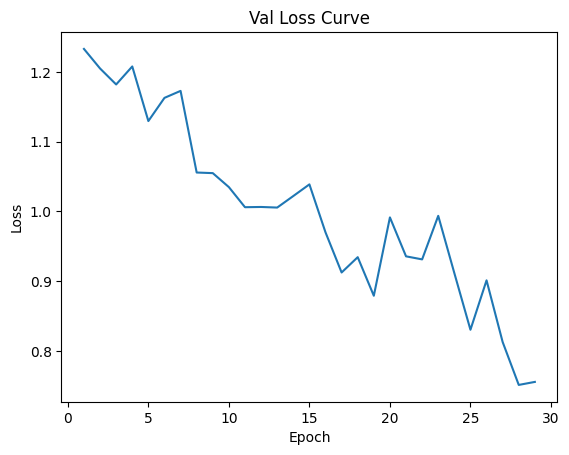

Data has been appended to validation_1.5.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11919496380365811


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 30/200*****
*****Train Loss:  0.633375 Val Loss:  0.823392*****
*****Validation Accuracy: 43.67%*****
*****Total Avg Disparity: 0.10512150921604269*****

Class Parade: Recall Difference = -0.048121292023731055
Class Handshaking: Recall Difference = 0.01785714285714285
Class Riot: Recall Difference = -0.028449502133712647
Class Dancing: Recall Difference = 0.10714285714285714
Class Funeral: Recall Difference = 0.09101868595539486
Class Cheering: Recall Difference = 0.099624060150376
Class Meeting: Recall Difference = -0.02307692307692305
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07180293501048213
Class Concerts: Recall Difference = 0.07680491551459298
Class Couple: Recall Difference = 0.2225237449118047
Class Family_Group: Recall Difference = -0.0841944125526215
Class Picnic: Recall Difference = -0.037296037296037365
Class Soldier_Patrol: Recall Difference = -0.16470588235294115
Class Spa: Recall Difference = 0.14880952380952395
Class S

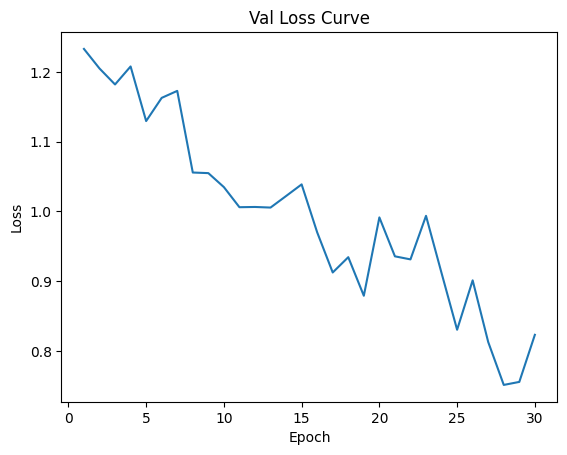

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11903508466023666


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 31/200*****
*****Train Loss:  0.585502 Val Loss:  0.612973*****
*****Validation Accuracy: 54.74%*****
*****Total Avg Disparity: 0.10148745052506401*****

Class Parade: Recall Difference = -0.060371346956712646
Class Handshaking: Recall Difference = 0.01785714285714289
Class Riot: Recall Difference = 0.026552868658131834
Class Dancing: Recall Difference = 0.0714285714285714
Class Funeral: Recall Difference = 0.22362869198312257
Class Cheering: Recall Difference = 0.01033834586466166
Class Meeting: Recall Difference = 0.05288461538461542
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.089622641509434
Class Concerts: Recall Difference = 0.11789554531490021
Class Couple: Recall Difference = 0.1763907734056988
Class Family_Group: Recall Difference = -0.1031381553769613
Class Picnic: Recall Difference = -0.05944055944055948
Class Soldier_Patrol: Recall Difference = -0.020261437908496882
Class Spa: Recall Difference = 0.178571428571

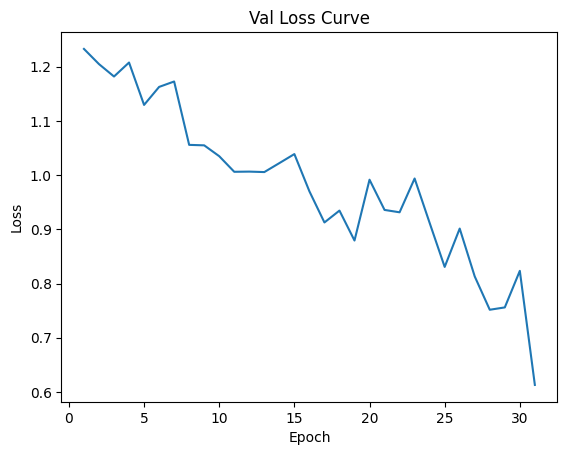

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11764228945741287


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 32/200*****
*****Train Loss:  0.576720 Val Loss:  0.596622*****
*****Validation Accuracy: 55.31%*****
*****Total Avg Disparity: 0.09304029540856007*****

Class Parade: Recall Difference = -0.0685014282575257
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = -0.09909909909909903
Class Dancing: Recall Difference = 0.10714285714285715
Class Funeral: Recall Difference = 0.13502109704641363
Class Cheering: Recall Difference = 0.011278195488721804
Class Meeting: Recall Difference = 0.02115384615384619
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.11740041928721179
Class Concerts: Recall Difference = 0.11789554531490015
Class Couple: Recall Difference = 0.19131614654002718
Class Family_Group: Recall Difference = -0.1458094144661309
Class Picnic: Recall Difference = -0.029137529137529206
Class Soldier_Patrol: Recall Difference = 0.001960784313725372
Class Spa: Recall Difference = 0.05357142857142849
Class S

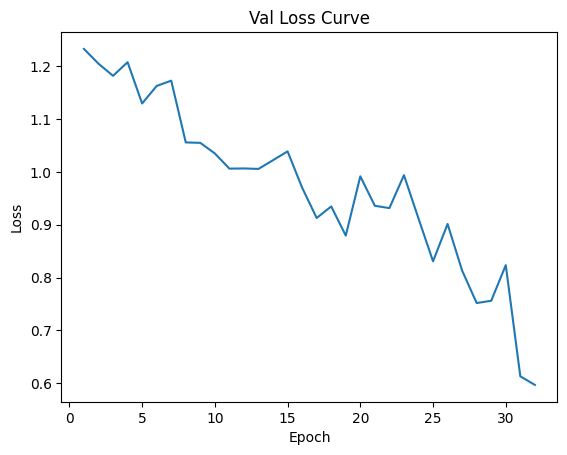

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11645567302520458


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.29s/it]


*****Epoch 33/200*****
*****Train Loss:  0.568701 Val Loss:  0.595222*****
*****Validation Accuracy: 55.95%*****
*****Total Avg Disparity: 0.10170704393354126*****

Class Parade: Recall Difference = -0.05773456383212494
Class Handshaking: Recall Difference = 0.017857142857142905
Class Riot: Recall Difference = -0.1275486012328118
Class Dancing: Recall Difference = 0.1279761904761904
Class Funeral: Recall Difference = 0.13803496081977107
Class Cheering: Recall Difference = 0.04605263157894736
Class Meeting: Recall Difference = 0.02115384615384619
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0985324947589099
Class Concerts: Recall Difference = 0.053379416282642145
Class Couple: Recall Difference = 0.19131614654002715
Class Family_Group: Recall Difference = -0.11385380788365862
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = 0.0019607843137255943
Class Spa: Recall Difference = 0.029761904761904545
Class 

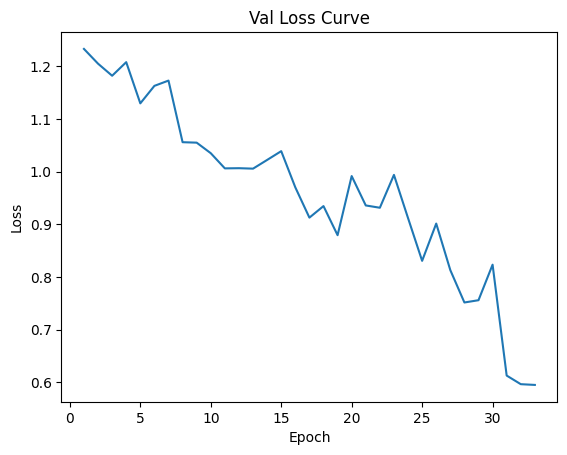

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11697983054014352


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 34/200*****
*****Train Loss:  0.565896 Val Loss:  0.595078*****
*****Validation Accuracy: 55.60%*****
*****Total Avg Disparity: 0.09887785781059065*****

Class Parade: Recall Difference = -0.10365853658536595
Class Handshaking: Recall Difference = 2.7755575615628914e-17
Class Riot: Recall Difference = 0.01706970128022761
Class Dancing: Recall Difference = 0.1488095238095238
Class Funeral: Recall Difference = 0.2079566003616638
Class Cheering: Recall Difference = 0.03947368421052638
Class Meeting: Recall Difference = 0.16153846153846158
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07966457023060797
Class Concerts: Recall Difference = 0.17396313364055305
Class Couple: Recall Difference = 0.1465400271370421
Class Family_Group: Recall Difference = -0.13088404133180254
Class Picnic: Recall Difference = -0.029137529137528984
Class Soldier_Patrol: Recall Difference = 0.0019607843137254832
Class Spa: Recall Difference = 0.07738095

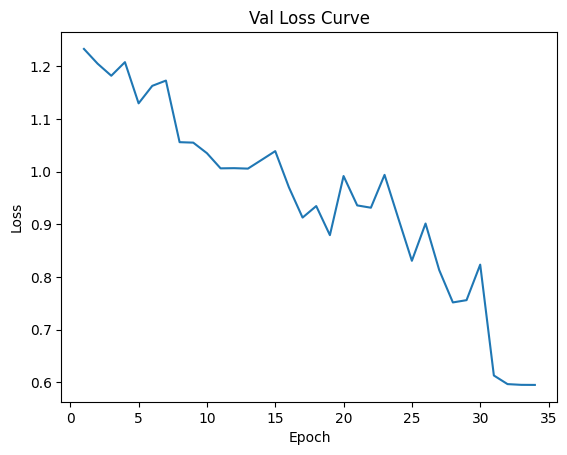

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11652965929645759


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 35/200*****
*****Train Loss:  0.563816 Val Loss:  0.586484*****
*****Validation Accuracy: 56.68%*****
*****Total Avg Disparity: 0.10564050164297184*****

Class Parade: Recall Difference = -0.06449132058888163
Class Handshaking: Recall Difference = -0.035714285714285685
Class Riot: Recall Difference = -0.14366998577524892
Class Dancing: Recall Difference = 0.06250000000000006
Class Funeral: Recall Difference = 0.18565400843881857
Class Cheering: Recall Difference = 0.04793233082706766
Class Meeting: Recall Difference = -0.025000000000000022
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.11740041928721179
Class Concerts: Recall Difference = 0.15360983102918596
Class Couple: Recall Difference = 0.2510176390773406
Class Family_Group: Recall Difference = -0.1415996938384998
Class Picnic: Recall Difference = -0.08974358974358965
Class Soldier_Patrol: Recall Difference = 0.03856209150326817
Class Spa: Recall Difference = 0.20238095

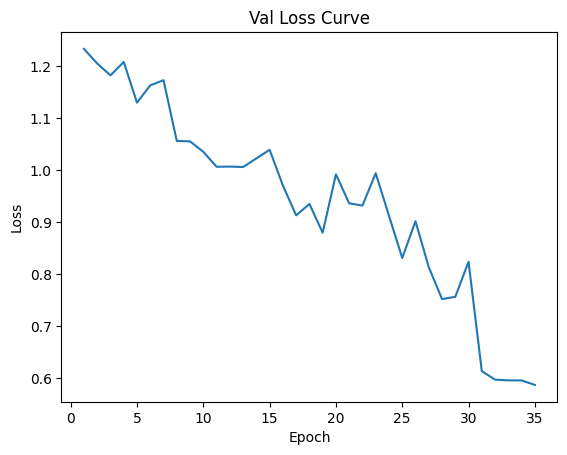

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11682601874837509


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.26s/it]


*****Epoch 36/200*****
*****Train Loss:  0.561206 Val Loss:  0.577433*****
*****Validation Accuracy: 56.47%*****
*****Total Avg Disparity: 0.09016935171107439*****

Class Parade: Recall Difference = -0.056471105251593046
Class Handshaking: Recall Difference = -0.05357142857142852
Class Riot: Recall Difference = -0.08155523944997628
Class Dancing: Recall Difference = 0.1458333333333332
Class Funeral: Recall Difference = 0.18264014466546108
Class Cheering: Recall Difference = 0.06390977443609025
Class Meeting: Recall Difference = 0.005769230769230749
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.14517819706498955
Class Concerts: Recall Difference = 0.08563748079877115
Class Couple: Recall Difference = 0.1614654002713704
Class Family_Group: Recall Difference = -0.06678147722923844
Class Picnic: Recall Difference = -0.11188811188811187
Class Soldier_Patrol: Recall Difference = -0.0091503267973857
Class Spa: Recall Difference = 0.029761904

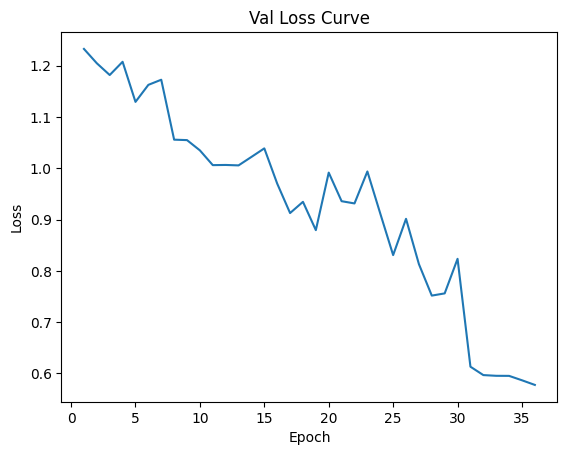

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11716697365045547


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 37/200*****
*****Train Loss:  0.559097 Val Loss:  0.577337*****
*****Validation Accuracy: 56.88%*****
*****Total Avg Disparity: 0.09510996030271777*****

Class Parade: Recall Difference = -0.018567347835640624
Class Handshaking: Recall Difference = -0.07142857142857138
Class Riot: Recall Difference = -0.08297771455666192
Class Dancing: Recall Difference = 0.14583333333333331
Class Funeral: Recall Difference = 0.0874020494273659
Class Cheering: Recall Difference = 0.05639097744360902
Class Meeting: Recall Difference = 0.06826923076923086
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.08857442348008396
Class Concerts: Recall Difference = 0.12135176651305707
Class Couple: Recall Difference = 0.14654002713704214
Class Family_Group: Recall Difference = -0.1073478760045925
Class Picnic: Recall Difference = -0.029137529137528984
Class Soldier_Patrol: Recall Difference = -0.0091503267973857
Class Spa: Recall Difference = 0.172619047

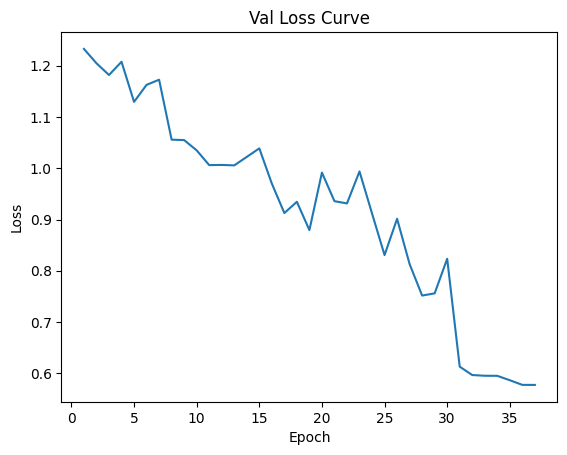

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11620167155678456


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 38/200*****
*****Train Loss:  0.551396 Val Loss:  0.574759*****
*****Validation Accuracy: 57.37%*****
*****Total Avg Disparity: 0.10225876262884656*****

Class Parade: Recall Difference = -0.06861129422105039
Class Handshaking: Recall Difference = -0.1071428571428571
Class Riot: Recall Difference = -0.07349454717875764
Class Dancing: Recall Difference = 0.13095238095238085
Class Funeral: Recall Difference = 0.14104882459312845
Class Cheering: Recall Difference = 0.10056390977443608
Class Meeting: Recall Difference = 0.03653846153846174
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.11740041928721179
Class Concerts: Recall Difference = 0.08909370199692795
Class Couple: Recall Difference = 0.14654002713704214
Class Family_Group: Recall Difference = -0.11174894756984316
Class Picnic: Recall Difference = -0.1282051282051282
Class Soldier_Patrol: Recall Difference = -0.056862745098039014
Class Spa: Recall Difference = 0.05357142857142849
Class S

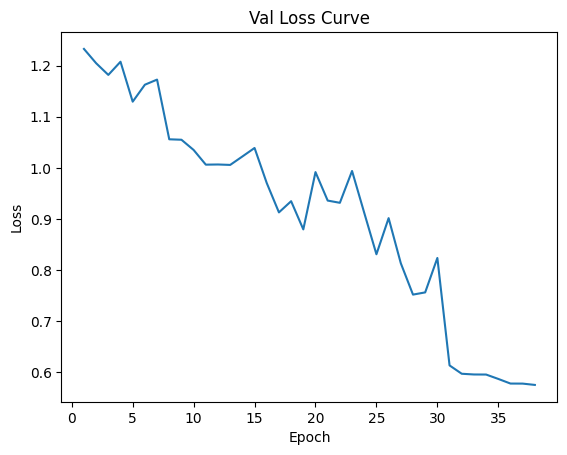

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11648111102672723


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 39/200*****
*****Train Loss:  0.555332 Val Loss:  0.577167*****
*****Validation Accuracy: 56.73%*****
*****Total Avg Disparity: 0.09467199698292046*****

Class Parade: Recall Difference = -0.06449132058888163
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = -0.009957325746799417
Class Dancing: Recall Difference = 0.09226190476190477
Class Funeral: Recall Difference = 0.18565400843881857
Class Cheering: Recall Difference = 0.011278195488721804
Class Meeting: Recall Difference = 0.05192307692307696
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07966457023060802
Class Concerts: Recall Difference = 0.13325652841781876
Class Couple: Recall Difference = 0.1614654002713704
Class Family_Group: Recall Difference = -0.09242250287026416
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.0091503267973857
Class Spa: Recall Difference = 0.1309523809

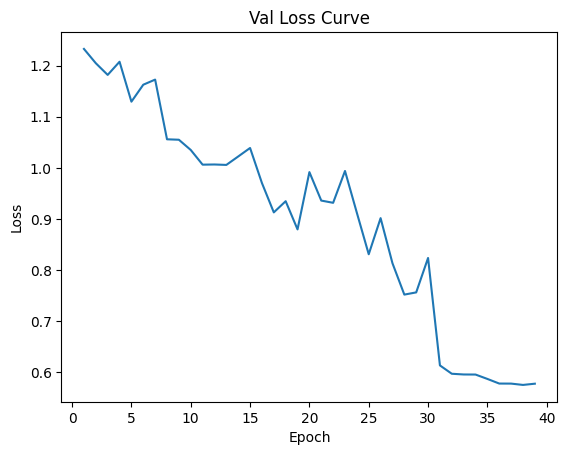

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.1170728080547773


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.22s/it]


*****Epoch 40/200*****
*****Train Loss:  0.548698 Val Loss:  0.559290*****
*****Validation Accuracy: 57.80%*****
*****Total Avg Disparity: 0.10373630279401598*****

Class Parade: Recall Difference = -0.08487145682267638
Class Handshaking: Recall Difference = 0.07142857142857144
Class Riot: Recall Difference = -0.11000474158368906
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.1983122362869199
Class Cheering: Recall Difference = 0.1362781954887218
Class Meeting: Recall Difference = 0.021153846153846412
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.10849056603773588
Class Concerts: Recall Difference = 0.12480798771121365
Class Couple: Recall Difference = 0.17639077340569884
Class Family_Group: Recall Difference = -0.06046689628779184
Class Picnic: Recall Difference = 0.0011655011655012926
Class Soldier_Patrol: Recall Difference = -0.056862745098039236
Class Spa: Recall Difference = 0.07738095

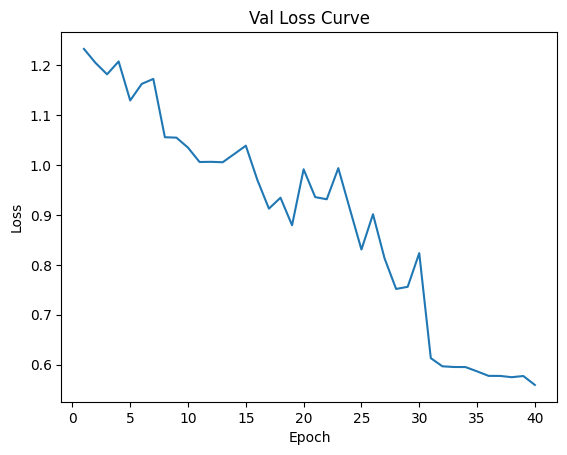

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11669516592071606


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 41/200*****
*****Train Loss:  0.542201 Val Loss:  0.565738*****
*****Validation Accuracy: 57.80%*****
*****Total Avg Disparity: 0.10235787200670456*****

Class Parade: Recall Difference = -0.05372445616348054
Class Handshaking: Recall Difference = 0.12500000000000003
Class Riot: Recall Difference = -0.14509246088193456
Class Dancing: Recall Difference = 0.13988095238095233
Class Funeral: Recall Difference = 0.09041591320072334
Class Cheering: Recall Difference = 0.04699248120300756
Class Meeting: Recall Difference = 0.02115384615384619
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.1273584905660377
Class Concerts: Recall Difference = 0.07718894009216604
Class Couple: Recall Difference = 0.22116689280868396
Class Family_Group: Recall Difference = -0.12456946039035599
Class Picnic: Recall Difference = -0.05944055944055948
Class Soldier_Patrol: Recall Difference = -0.14117647058823524
Class Spa: Recall Difference = 0.05357142857142838
Class Sp

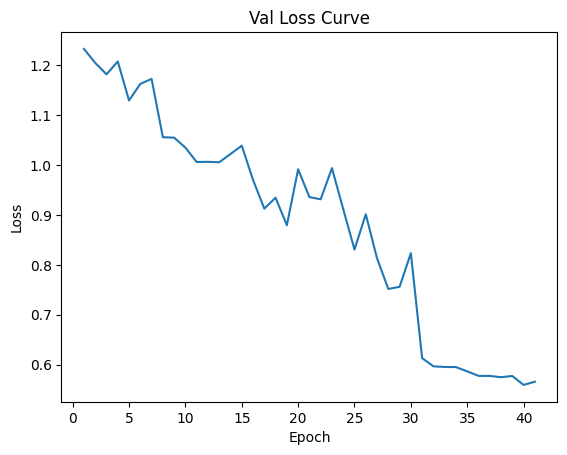

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11608474386426118


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 42/200*****
*****Train Loss:  0.543455 Val Loss:  0.558357*****
*****Validation Accuracy: 58.09%*****
*****Total Avg Disparity: 0.08806755136739418*****

Class Parade: Recall Difference = -0.0550977807075369
Class Handshaking: Recall Difference = 0.07142857142857144
Class Riot: Recall Difference = -0.1275486012328118
Class Dancing: Recall Difference = 0.08333333333333331
Class Funeral: Recall Difference = 0.1157323688969259
Class Cheering: Recall Difference = -0.005639097744360916
Class Meeting: Recall Difference = 0.05192307692307718
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.1273584905660377
Class Concerts: Recall Difference = 0.11981566820276524
Class Couple: Recall Difference = 0.1166892808683854
Class Family_Group: Recall Difference = -0.08821278224263307
Class Picnic: Recall Difference = -0.029137529137529095
Class Soldier_Patrol: Recall Difference = 0.0019607843137255943
Class Spa: Recall Difference = -0.04761904761904773
Class S

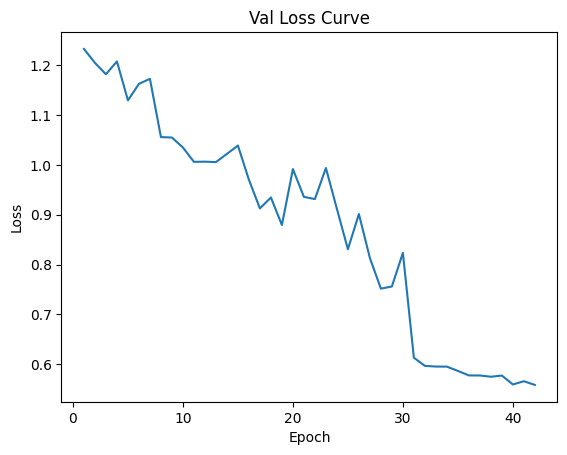

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.1166609746332352


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.22s/it]


*****Epoch 43/200*****
*****Train Loss:  0.540764 Val Loss:  0.554609*****
*****Validation Accuracy: 58.27%*****
*****Total Avg Disparity: 0.09149095969215439*****

Class Parade: Recall Difference = -0.04696769940672374
Class Handshaking: Recall Difference = -0.053571428571428575
Class Riot: Recall Difference = -0.11948790896159317
Class Dancing: Recall Difference = 0.08630952380952384
Class Funeral: Recall Difference = 0.17299578059071735
Class Cheering: Recall Difference = 0.06484962406015041
Class Meeting: Recall Difference = 0.03653846153846163
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07966457023060802
Class Concerts: Recall Difference = 0.12980030721966218
Class Couple: Recall Difference = 0.19131614654002718
Class Family_Group: Recall Difference = -0.13949483352468423
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.023529411764705688
Class Spa: Recall Difference = -0.017857142857142794
Cl

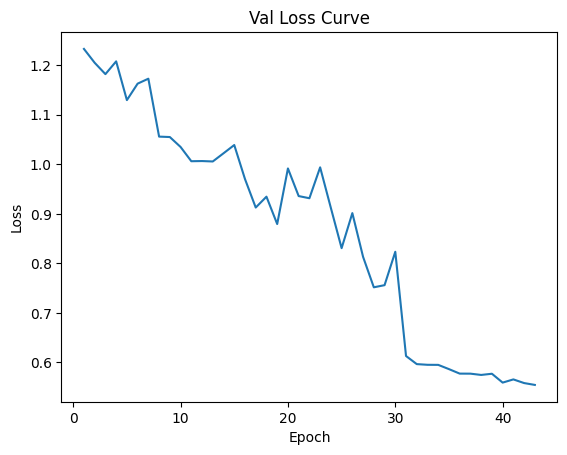

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11696170184474725


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 44/200*****
*****Train Loss:  0.538806 Val Loss:  0.553962*****
*****Validation Accuracy: 58.18%*****
*****Total Avg Disparity: 0.11670068278519022*****

Class Parade: Recall Difference = -0.11167875192265442
Class Handshaking: Recall Difference = -0.053571428571428575
Class Riot: Recall Difference = -0.10052157420578478
Class Dancing: Recall Difference = 0.14583333333333331
Class Funeral: Recall Difference = 0.1506931886678723
Class Cheering: Recall Difference = 0.030075187969924866
Class Meeting: Recall Difference = 0.0211538461538463
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0985324947589099
Class Concerts: Recall Difference = 0.13824884792626746
Class Couple: Recall Difference = 0.23609226594301225
Class Family_Group: Recall Difference = -0.1695369307309606
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.10784313725490169
Class Spa: Recall Difference = 0.27976190476190477
Class Sp

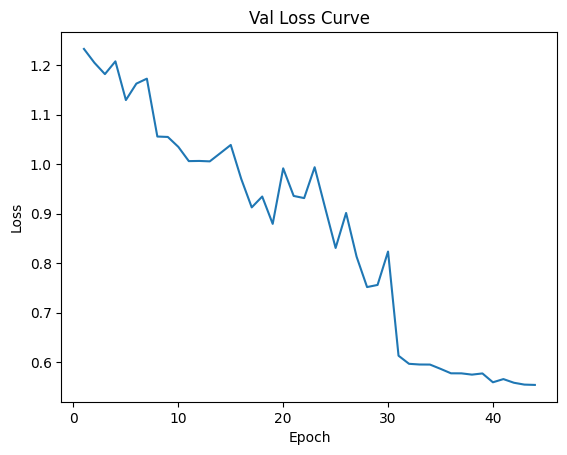

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11694909890110676


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 45/200*****
*****Train Loss:  0.534172 Val Loss:  0.555682*****
*****Validation Accuracy: 57.43%*****
*****Total Avg Disparity: 0.0981806696841356*****

Class Parade: Recall Difference = -0.07399472643375093
Class Handshaking: Recall Difference = 0.01785714285714289
Class Riot: Recall Difference = -0.026078710289236584
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.012218045112781933
Class Meeting: Recall Difference = 0.05288461538461542
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.12631027253668767
Class Concerts: Recall Difference = 0.24539170506912455
Class Couple: Recall Difference = 0.1763907734056988
Class Family_Group: Recall Difference = -0.10313815537696136
Class Picnic: Recall Difference = -0.0815850815850816
Class Soldier_Patrol: Recall Difference = -0.02026143790849666
Class Spa: Recall Difference = -1.110223024

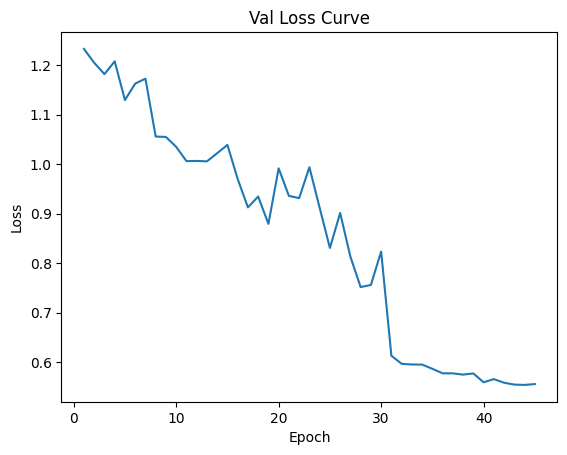

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1157746108678671


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 46/200*****
*****Train Loss:  0.528177 Val Loss:  0.555173*****
*****Validation Accuracy: 57.40%*****
*****Total Avg Disparity: 0.09734350296247404*****

Class Parade: Recall Difference = -0.10102175346077769
Class Handshaking: Recall Difference = -0.05357142857142852
Class Riot: Recall Difference = -0.026078710289236584
Class Dancing: Recall Difference = 0.13095238095238096
Class Funeral: Recall Difference = 0.19228450874020492
Class Cheering: Recall Difference = 0.11936090225563908
Class Meeting: Recall Difference = -0.05673076923076914
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.06970649895178202
Class Concerts: Recall Difference = 0.18586789554531508
Class Couple: Recall Difference = 0.19131614654002724
Class Family_Group: Recall Difference = -0.16934557979334092
Class Picnic: Recall Difference = 0.009324009324009341
Class Soldier_Patrol: Recall Difference = -0.009150326797385477
Class Spa: Recall Difference = 0.02976

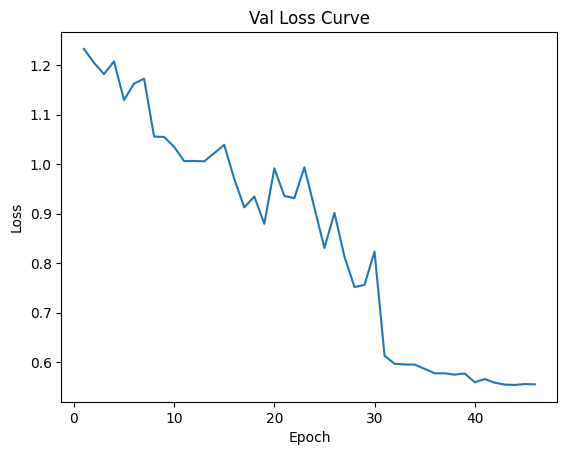

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11600774469283912


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 47/200*****
*****Train Loss:  0.528490 Val Loss:  0.541031*****
*****Validation Accuracy: 59.48%*****
*****Total Avg Disparity: 0.08255221021133473*****

Class Parade: Recall Difference = -0.020050538343221236
Class Handshaking: Recall Difference = 0.07142857142857144
Class Riot: Recall Difference = -0.08297771455666197
Class Dancing: Recall Difference = 0.14583333333333337
Class Funeral: Recall Difference = 0.06811332127787828
Class Cheering: Recall Difference = 0.012218045112782017
Class Meeting: Recall Difference = 0.05192307692307707
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.04192872117400426
Class Concerts: Recall Difference = 0.05184331797235037
Class Couple: Recall Difference = 0.13025780189959296
Class Family_Group: Recall Difference = -0.09031764255644864
Class Picnic: Recall Difference = 0.0174825174825175
Class Soldier_Patrol: Recall Difference = 0.0019607843137255943
Class Spa: Recall Difference = 0.14880952

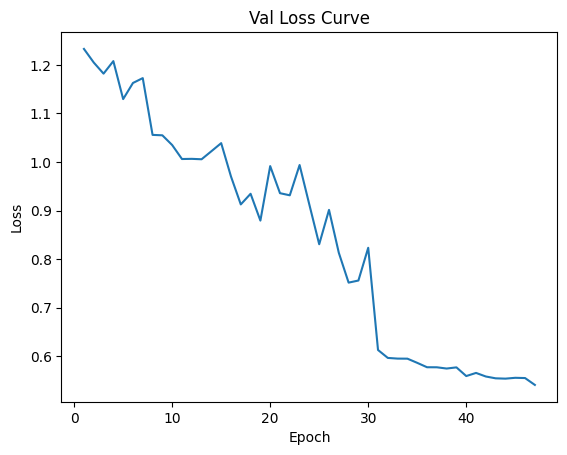

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11604749755217479


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.26s/it]


*****Epoch 48/200*****
*****Train Loss:  0.527715 Val Loss:  0.533692*****
*****Validation Accuracy: 59.75%*****
*****Total Avg Disparity: 0.10914667132901756*****

Class Parade: Recall Difference = -0.08624478136673264
Class Handshaking: Recall Difference = -0.07142857142857137
Class Riot: Recall Difference = -0.10194404931247036
Class Dancing: Recall Difference = 0.1607142857142857
Class Funeral: Recall Difference = 0.1760096443640749
Class Cheering: Recall Difference = 0.031015037593984968
Class Meeting: Recall Difference = 0.08269230769230773
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.15513626834381555
Class Concerts: Recall Difference = 0.07718894009216609
Class Couple: Recall Difference = 0.265943012211669
Class Family_Group: Recall Difference = -0.10753922694221202
Class Picnic: Recall Difference = -0.09790209790209792
Class Soldier_Patrol: Recall Difference = -0.03464052287581698
Class Spa: Recall Difference = 0.1785714285714285
Class Spor

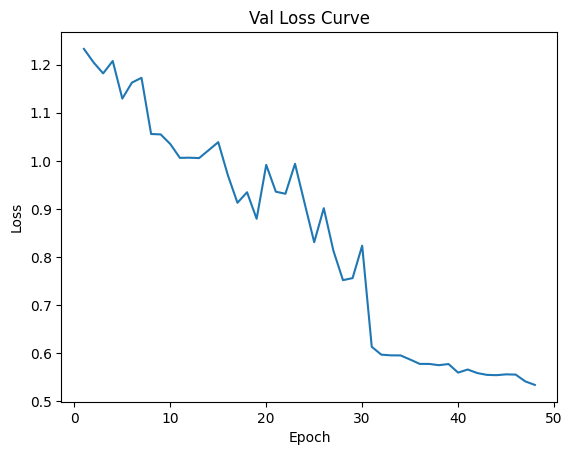

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1161356599858174


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 49/200*****
*****Train Loss:  0.524817 Val Loss:  0.530383*****
*****Validation Accuracy: 59.57%*****
*****Total Avg Disparity: 0.0888980610744989*****

Class Parade: Recall Difference = -0.037574159525379125
Class Handshaking: Recall Difference = -0.05357142857142852
Class Riot: Recall Difference = -0.07064959696538647
Class Dancing: Recall Difference = 0.181547619047619
Class Funeral: Recall Difference = 0.2362869198312238
Class Cheering: Recall Difference = 0.12781954887218047
Class Meeting: Recall Difference = -0.05673076923076903
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.06184486373165621
Class Concerts: Recall Difference = 0.02803379416282653
Class Couple: Recall Difference = 0.20624151967435556
Class Family_Group: Recall Difference = -0.14810562571756608
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.045751633986928164
Class Spa: Recall Difference = 0.0297619047

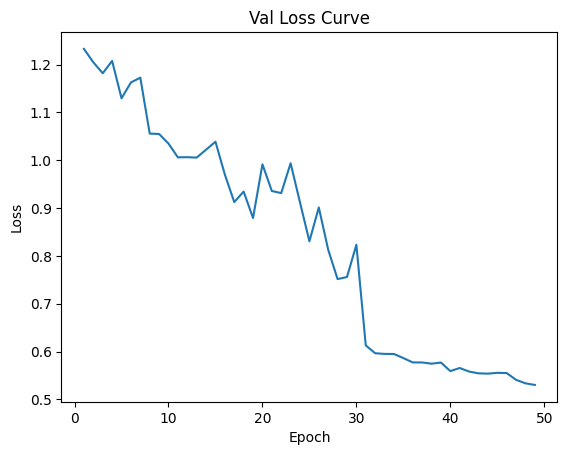

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11593747310913526


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 50/200*****
*****Train Loss:  0.523633 Val Loss:  0.522917*****
*****Validation Accuracy: 59.31%*****
*****Total Avg Disparity: 0.09827148816555428*****

Class Parade: Recall Difference = -0.022577455504284805
Class Handshaking: Recall Difference = -0.16071428571428562
Class Riot: Recall Difference = -0.06401137980085347
Class Dancing: Recall Difference = 0.1428571428571429
Class Funeral: Recall Difference = 0.13803496081977107
Class Cheering: Recall Difference = -0.0667293233082707
Class Meeting: Recall Difference = 0.020192307692307843
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.08962264150943411
Class Concerts: Recall Difference = 0.13671274961597552
Class Couple: Recall Difference = 0.1302578018995929
Class Family_Group: Recall Difference = -0.12456946039035599
Class Picnic: Recall Difference = -0.0815850815850816
Class Soldier_Patrol: Recall Difference = -0.05686274509803935
Class Spa: Recall Difference = 0.202380952

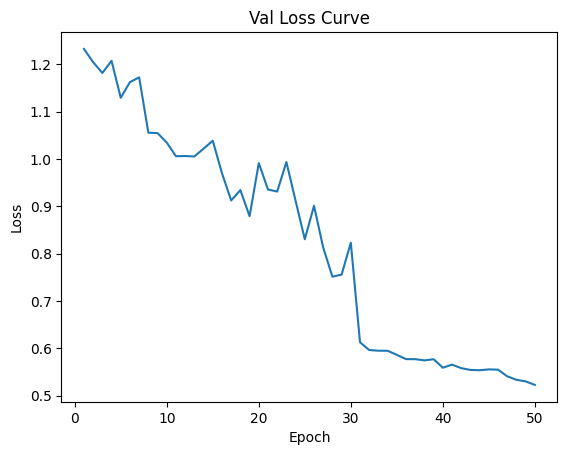

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11653787012283619


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 51/200*****
*****Train Loss:  0.521312 Val Loss:  0.515929*****
*****Validation Accuracy: 60.61%*****
*****Total Avg Disparity: 0.1064627886448624*****

Class Parade: Recall Difference = -0.048450889914304573
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.11806543385490759
Class Dancing: Recall Difference = 0.13988095238095233
Class Funeral: Recall Difference = 0.21097046413502113
Class Cheering: Recall Difference = 0.12875939849624063
Class Meeting: Recall Difference = 0.0673076923076924
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.08071278825995815
Class Concerts: Recall Difference = 0.18087557603686644
Class Couple: Recall Difference = 0.23609226594301222
Class Family_Group: Recall Difference = -0.10753922694221202
Class Picnic: Recall Difference = -0.07342657342657355
Class Soldier_Patrol: Recall Difference = -0.17450980392156856
Class Spa: Recall Difference = 0.053571428

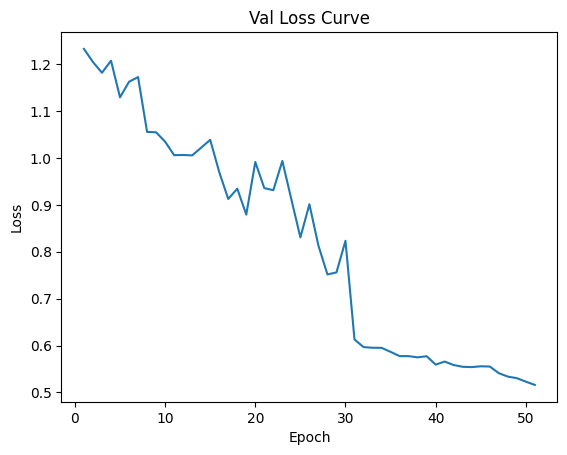

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.1175096665437405


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.29s/it]


*****Epoch 52/200*****
*****Train Loss:  0.517898 Val Loss:  0.512725*****
*****Validation Accuracy: 60.56%*****
*****Total Avg Disparity: 0.10297368639740428*****

Class Parade: Recall Difference = -0.04707756537024832
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = -0.11000474158368895
Class Dancing: Recall Difference = 0.059523809523809534
Class Funeral: Recall Difference = 0.16335141651597362
Class Cheering: Recall Difference = 0.047932330827067604
Class Meeting: Recall Difference = 0.06730769230769251
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.03406708595387842
Class Concerts: Recall Difference = 0.1927803379416283
Class Couple: Recall Difference = 0.2211668928086839
Class Family_Group: Recall Difference = -0.15442020665901263
Class Picnic: Recall Difference = -0.0979020979020978
Class Soldier_Patrol: Recall Difference = -0.09346405228758148
Class Spa: Recall Difference = -0.11904761

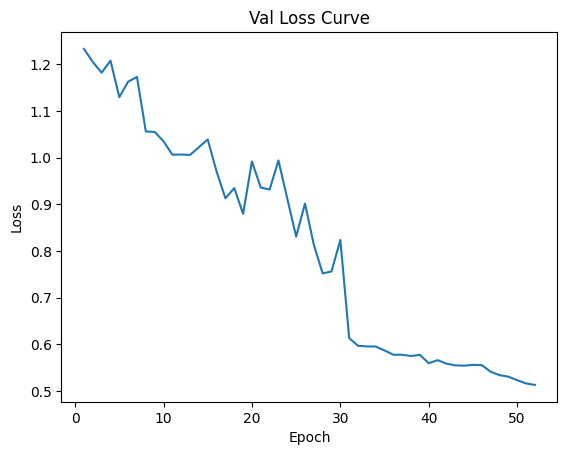

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:54<00:00,  4.42s/it]


Average Adversary epoch loss: 0.11541364571222892


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.29s/it]


*****Epoch 53/200*****
*****Train Loss:  0.510913 Val Loss:  0.517510*****
*****Validation Accuracy: 60.24%*****
*****Total Avg Disparity: 0.10214548900708084*****

Class Parade: Recall Difference = -0.041584267194023306
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.0734945471787577
Class Dancing: Recall Difference = 0.15773809523809523
Class Funeral: Recall Difference = 0.22362869198312257
Class Cheering: Recall Difference = 0.04793233082706766
Class Meeting: Recall Difference = 0.06730769230769229
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.109538784067086
Class Concerts: Recall Difference = 0.11290322580645179
Class Couple: Recall Difference = 0.22116689280868387
Class Family_Group: Recall Difference = -0.10753922694221196
Class Picnic: Recall Difference = -0.0815850815850816
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476190476

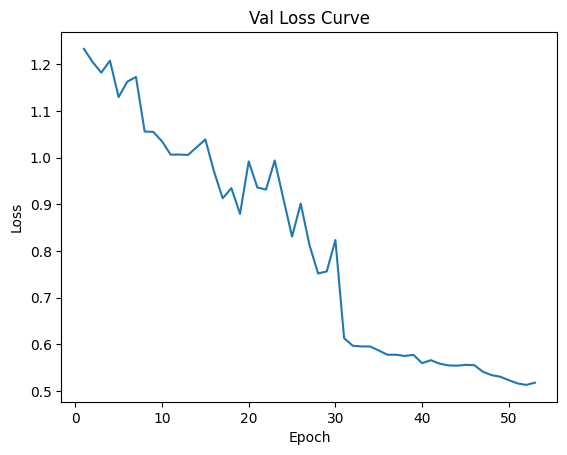

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:54<00:00,  4.40s/it]


Average Adversary epoch loss: 0.11609331518411636


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.27s/it]


*****Epoch 54/200*****
*****Train Loss:  0.518041 Val Loss:  0.516265*****
*****Validation Accuracy: 60.87%*****
*****Total Avg Disparity: 0.08854891273141961*****

Class Parade: Recall Difference = 0.024609975829487984
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = -0.04646752015173056
Class Dancing: Recall Difference = 0.13988095238095233
Class Funeral: Recall Difference = 0.14104882459312845
Class Cheering: Recall Difference = 0.013157894736842118
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.03406708595387847
Class Concerts: Recall Difference = 0.18778801843318
Class Couple: Recall Difference = 0.1302578018995929
Class Family_Group: Recall Difference = -0.16303099885189448
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.045751633986928164
Class Spa: Recall Difference = 0.24999999999

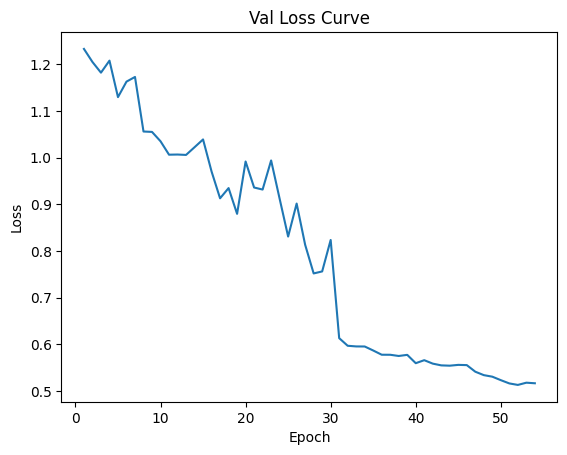

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11600623652338982


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 55/200*****
*****Train Loss:  0.508690 Val Loss:  0.508042*****
*****Validation Accuracy: 60.41%*****
*****Total Avg Disparity: 0.08131769547566715*****

Class Parade: Recall Difference = -0.017303889255108618
Class Handshaking: Recall Difference = -0.053571428571428534
Class Riot: Recall Difference = 0.03461356092935042
Class Dancing: Recall Difference = 0.10119047619047616
Class Funeral: Recall Difference = 0.030138637733574614
Class Cheering: Recall Difference = 0.021616541353383506
Class Meeting: Recall Difference = 0.1298076923076924
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.08071278825995815
Class Concerts: Recall Difference = 0.09254992319508454
Class Couple: Recall Difference = 0.2062415196743555
Class Family_Group: Recall Difference = -0.15442020665901263
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.06797385620915042
Class Spa: Recall Difference = -0.041666

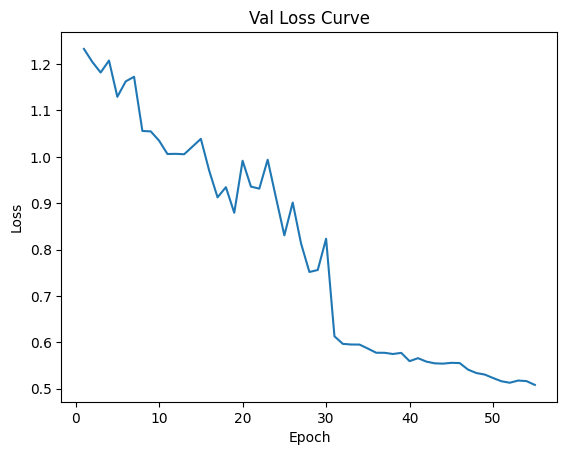

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11614858301786277


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 56/200*****
*****Train Loss:  0.510871 Val Loss:  0.518292*****
*****Validation Accuracy: 59.80%*****
*****Total Avg Disparity: 0.08729313544418407*****

Class Parade: Recall Difference = 0.0029663810151613346
Class Handshaking: Recall Difference = 0.03571428571428571
Class Riot: Recall Difference = -0.05452821242294925
Class Dancing: Recall Difference = 0.041666666666666685
Class Funeral: Recall Difference = 0.19168173598553345
Class Cheering: Recall Difference = 0.03007518796992481
Class Meeting: Recall Difference = 0.0673076923076924
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.15513626834381555
Class Concerts: Recall Difference = 0.10099846390168982
Class Couple: Recall Difference = 0.2211668928086839
Class Family_Group: Recall Difference = -0.035017221584385694
Class Picnic: Recall Difference = -0.08974358974358965
Class Soldier_Patrol: Recall Difference = -0.009150326797385588
Class Spa: Recall Difference = 0.0297619

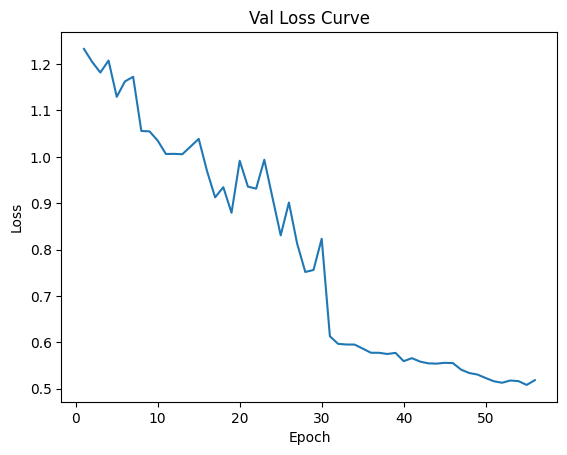

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11630409067639938


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 57/200*****
*****Train Loss:  0.503488 Val Loss:  0.499971*****
*****Validation Accuracy: 62.29%*****
*****Total Avg Disparity: 0.10503287055809056*****

Class Parade: Recall Difference = -0.020050538343221236
Class Handshaking: Recall Difference = -0.017857142857142794
Class Riot: Recall Difference = -0.12897107633949734
Class Dancing: Recall Difference = 0.11904761904761901
Class Funeral: Recall Difference = 0.010849909584086936
Class Cheering: Recall Difference = 0.003759398496240629
Class Meeting: Recall Difference = 0.09807692307692306
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.19182389937106917
Class Concerts: Recall Difference = 0.15207373271889424
Class Couple: Recall Difference = 0.24966078697421984
Class Family_Group: Recall Difference = -0.08189820130118641
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.09673202614379084
Class Spa: Recall Difference = 0.22619047619047616
Cla

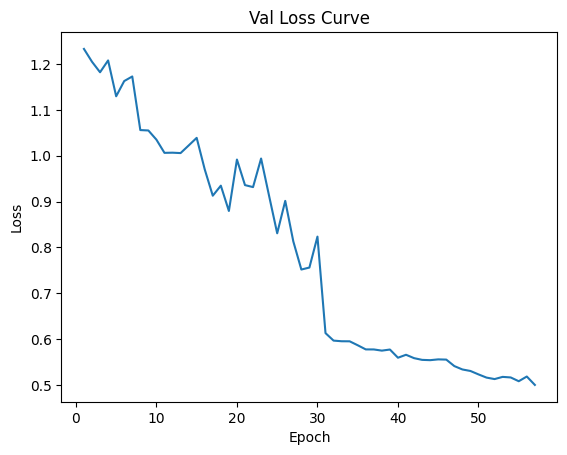

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11681305703062278


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 58/200*****
*****Train Loss:  0.497555 Val Loss:  0.494096*****
*****Validation Accuracy: 62.41%*****
*****Total Avg Disparity: 0.09981740117117871*****

Class Parade: Recall Difference = -0.03493737640079109
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.05452821242294931
Class Dancing: Recall Difference = 0.09226190476190477
Class Funeral: Recall Difference = 0.18866787221217618
Class Cheering: Recall Difference = 0.04793233082706766
Class Meeting: Recall Difference = 0.08269230769230784
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.1472746331236897
Class Concerts: Recall Difference = 0.07910906298003051
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10964408725602753
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.012418300653594838
Class Spa: Recall Difference = 0.2261904

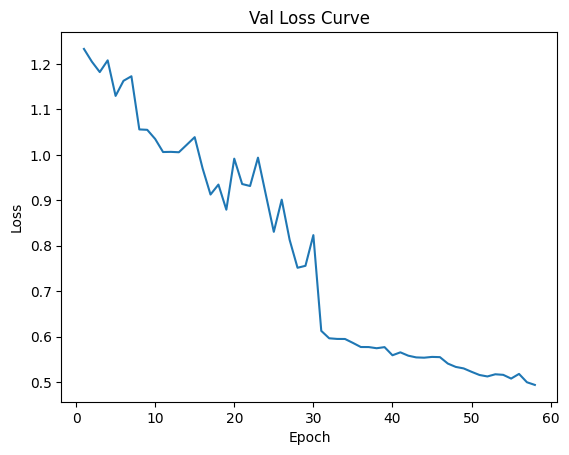

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11567523588354771


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 59/200*****
*****Train Loss:  0.498464 Val Loss:  0.503396*****
*****Validation Accuracy: 60.61%*****
*****Total Avg Disparity: 0.08907999707341216*****

Class Parade: Recall Difference = -0.03356405185673483
Class Handshaking: Recall Difference = -0.16071428571428562
Class Riot: Recall Difference = -0.13703176861071598
Class Dancing: Recall Difference = 0.10714285714285715
Class Funeral: Recall Difference = 0.045810729355033164
Class Cheering: Recall Difference = 0.05639097744360902
Class Meeting: Recall Difference = 0.06730769230769229
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09853249475890985
Class Concerts: Recall Difference = 0.0007680491551460555
Class Couple: Recall Difference = 0.16146540027137044
Class Family_Group: Recall Difference = -0.022005357826253402
Class Picnic: Recall Difference = -0.05128205128205132
Class Soldier_Patrol: Recall Difference = -0.03464052287581687
Class Spa: Recall Difference = 0.2261

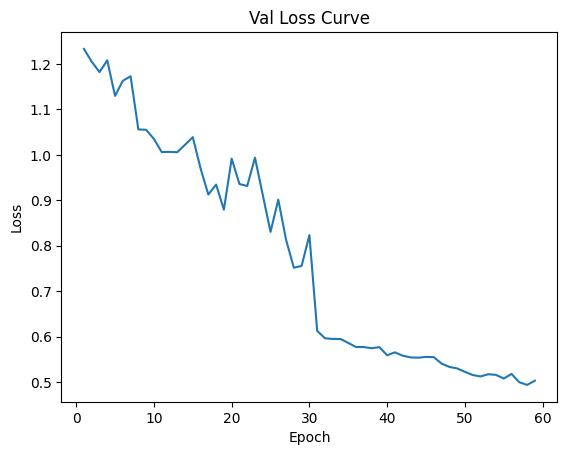

Data has been appended to validation_1.5.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.11483557121111797


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 60/200*****
*****Train Loss:  0.495713 Val Loss:  0.482456*****
*****Validation Accuracy: 61.92%*****
*****Total Avg Disparity: 0.10632527041040131*****

Class Parade: Recall Difference = -0.08498132278620085
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.14651493598862025
Class Dancing: Recall Difference = 0.08333333333333331
Class Funeral: Recall Difference = 0.08077154912597961
Class Cheering: Recall Difference = 0.022556390977443663
Class Meeting: Recall Difference = 0.11346153846153861
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.11740041928721176
Class Concerts: Recall Difference = 0.15360983102918596
Class Couple: Recall Difference = 0.2360922659430122
Class Family_Group: Recall Difference = -0.11174894756984305
Class Picnic: Recall Difference = -0.029137529137529206
Class Soldier_Patrol: Recall Difference = -0.10457516339869266
Class Spa: Recall Difference = 0.1011904

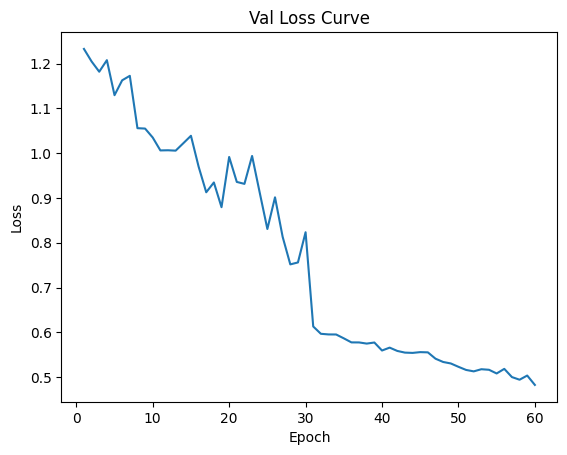

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11662177741527557


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 61/200*****
*****Train Loss:  0.491055 Val Loss:  0.472050*****
*****Validation Accuracy: 63.39%*****
*****Total Avg Disparity: 0.10451252050724852*****

Class Parade: Recall Difference = -0.05520764667106137
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.07491702228544334
Class Dancing: Recall Difference = 0.09523809523809523
Class Funeral: Recall Difference = 0.08378541289933705
Class Cheering: Recall Difference = 0.09398496240601506
Class Meeting: Recall Difference = 0.09807692307692317
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.1462264150943397
Class Concerts: Recall Difference = 0.1793394777265745
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.10964408725602759
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.154761904

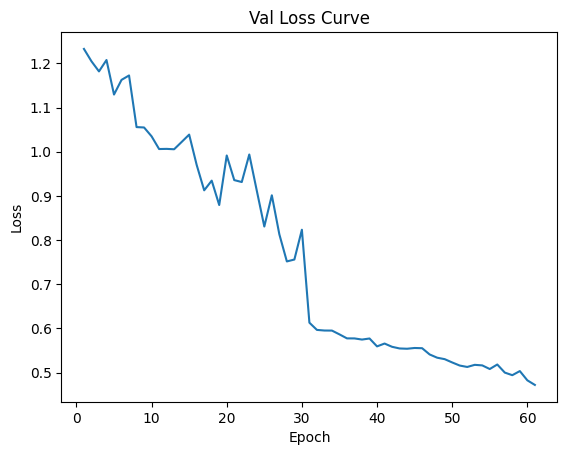

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11614953697873996


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 62/200*****
*****Train Loss:  0.494644 Val Loss:  0.475047*****
*****Validation Accuracy: 63.68%*****
*****Total Avg Disparity: 0.09880001381399749*****

Class Parade: Recall Difference = -0.03493737640079109
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.10194404931247036
Class Dancing: Recall Difference = 0.07440476190476181
Class Funeral: Recall Difference = 0.08378541289933705
Class Cheering: Recall Difference = 0.08458646616541352
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.11844863731656191
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.10964408725602759
Class Picnic: Recall Difference = -0.0815850815850816
Class Soldier_Patrol: Recall Difference = -0.1189542483660131
Class Spa: Recall Difference = 0.17857142857

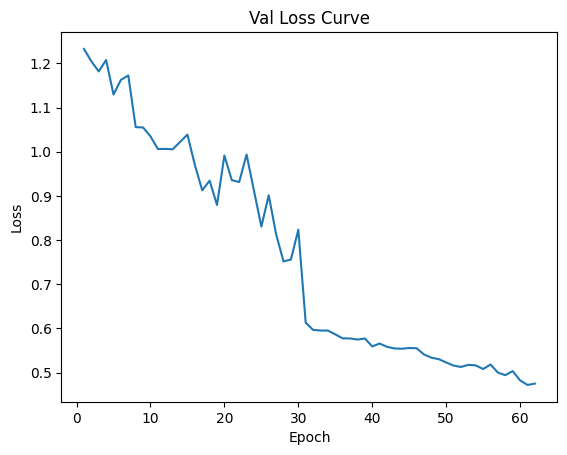

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11567585800702755


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 63/200*****
*****Train Loss:  0.490057 Val Loss:  0.469659*****
*****Validation Accuracy: 63.80%*****
*****Total Avg Disparity: 0.09710349628705511*****

Class Parade: Recall Difference = -0.03493737640079109
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.07491702228544339
Class Dancing: Recall Difference = 0.07142857142857145
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09958071278825997
Class Concerts: Recall Difference = 0.11981566820276507
Class Couple: Recall Difference = 0.23609226594301222
Class Family_Group: Recall Difference = -0.11825487944890933
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.1189542483660131
Class Spa: Recall Difference = 0.1309523809

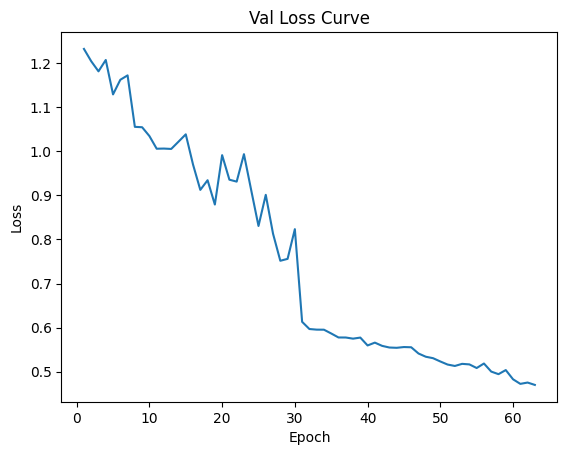

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11533419444010808


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 64/200*****
*****Train Loss:  0.489422 Val Loss:  0.471654*****
*****Validation Accuracy: 63.97%*****
*****Total Avg Disparity: 0.09264511661136833*****

Class Parade: Recall Difference = -0.03493737640079109
Class Handshaking: Recall Difference = -0.1071428571428571
Class Riot: Recall Difference = -0.07491702228544339
Class Dancing: Recall Difference = 0.07440476190476186
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.06766917293233088
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.12035973976272485
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.154761904

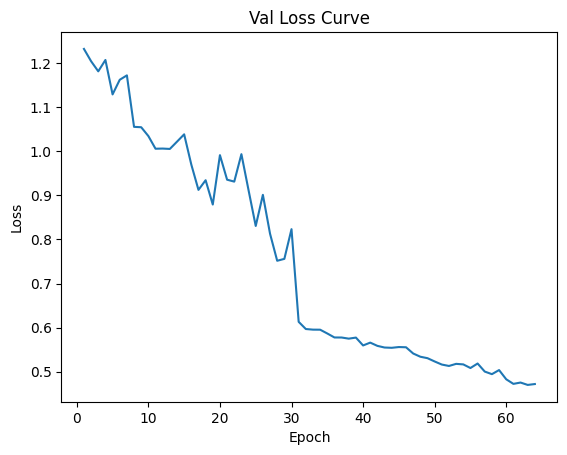

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11516002737558804


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 65/200*****
*****Train Loss:  0.483284 Val Loss:  0.472194*****
*****Validation Accuracy: 64.06%*****
*****Total Avg Disparity: 0.09598484595287707*****

Class Parade: Recall Difference = -0.026807295099978035
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.057373162636320585
Class Dancing: Recall Difference = 0.05357142857142844
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.09398496240601506
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878407
Class Concerts: Recall Difference = 0.17588325652841807
Class Couple: Recall Difference = 0.23609226594301222
Class Family_Group: Recall Difference = -0.0905089934940681
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1547619

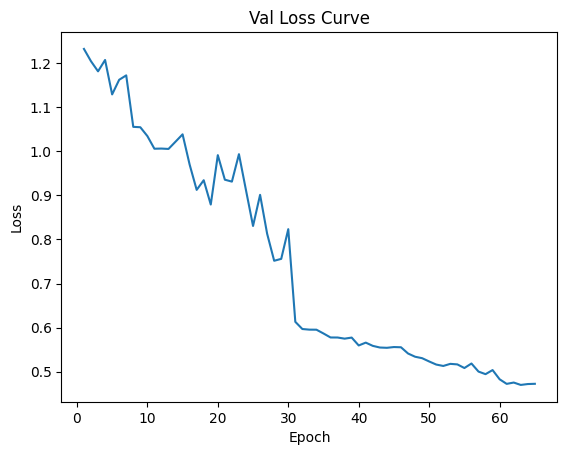

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11525350665816894


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 66/200*****
*****Train Loss:  0.488321 Val Loss:  0.471283*****
*****Validation Accuracy: 63.86%*****
*****Total Avg Disparity: 0.09119204835124509*****

Class Parade: Recall Difference = -0.028180619644034288
Class Handshaking: Recall Difference = -0.1071428571428571
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.014880952380952273
Class Funeral: Recall Difference = 0.08378541289933705
Class Cheering: Recall Difference = 0.10244360902255648
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.1054343666283965
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.15476

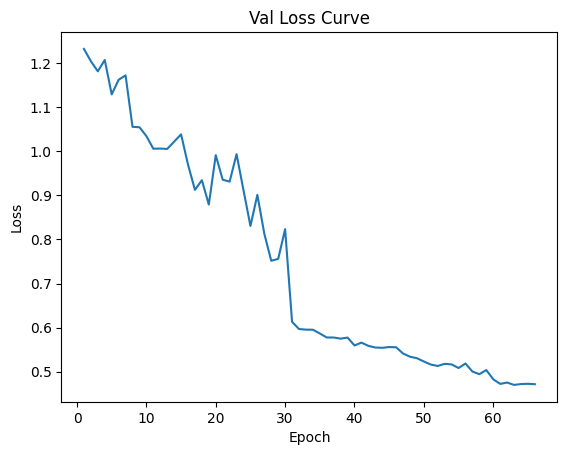

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11515812977002217


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 67/200*****
*****Train Loss:  0.484962 Val Loss:  0.469149*****
*****Validation Accuracy: 64.15%*****
*****Total Avg Disparity: 0.09396510426689954*****

Class Parade: Recall Difference = -0.013293781586464548
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.03273809523809512
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.14661654135338353
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.15207373271889413
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.07342657342657355
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.13095238

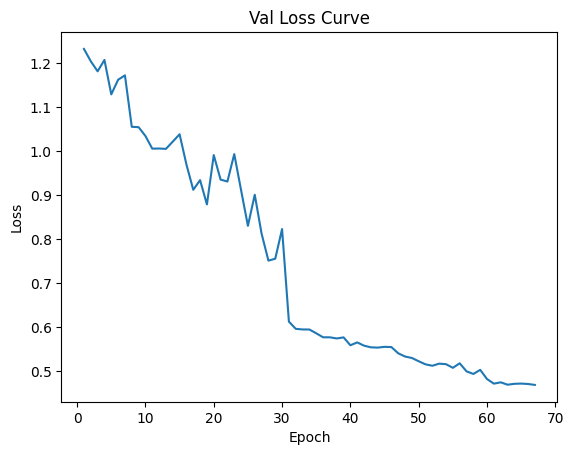

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11454901041892859


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 68/200*****
*****Train Loss:  0.486527 Val Loss:  0.470979*****
*****Validation Accuracy: 64.06%*****
*****Total Avg Disparity: 0.09428311001335213*****

Class Parade: Recall Difference = -0.026807295099978035
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.05357142857142844
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.03195488721804507
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = 0.11981566820276507
Class Couple: Recall Difference = 0.25101763907734054
Class Family_Group: Recall Difference = -0.11825487944890933
Class Picnic: Recall Difference = -0.07342657342657355
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1785714

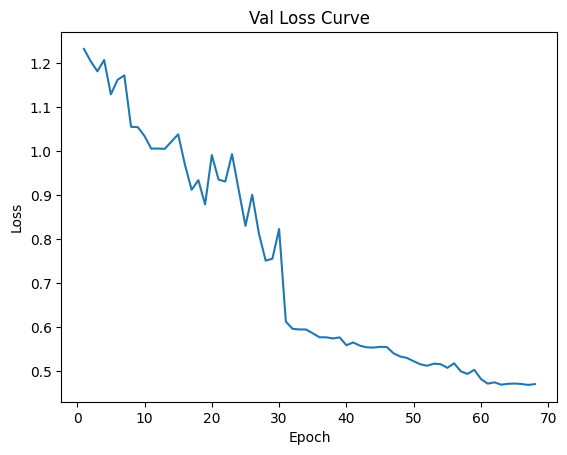

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1151906091433305


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 69/200*****
*****Train Loss:  0.483268 Val Loss:  0.468685*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.0939795791669653*****

Class Parade: Recall Difference = -0.03631070094484723
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.05654761904761896
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.05827067669172936
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = 0.1436251920122889
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.09261385380788367
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.15476190

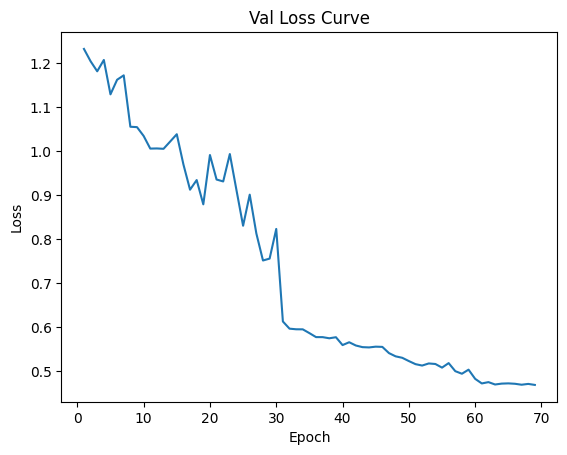

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11483909648198348


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 70/200*****
*****Train Loss:  0.483732 Val Loss:  0.468234*****
*****Validation Accuracy: 63.83%*****
*****Total Avg Disparity: 0.08562776738862304*****

Class Parade: Recall Difference = -0.029553944188090542
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07440476190476181
Class Funeral: Recall Difference = 0.09644364074743816
Class Cheering: Recall Difference = 0.04041353383458651
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = 0.1079109062980032
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.1054343666283965
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.1309523

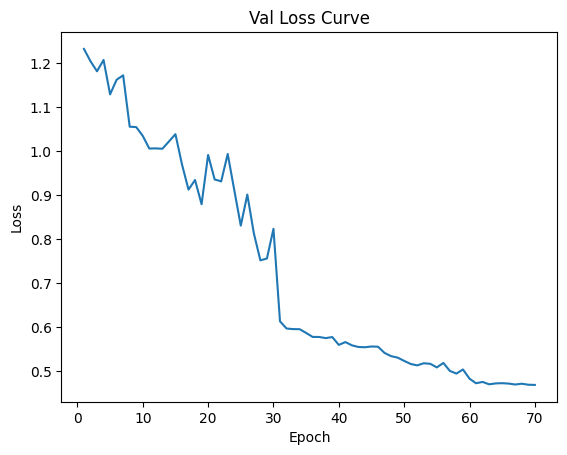

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11529618931504396


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 71/200*****
*****Train Loss:  0.485371 Val Loss:  0.466996*****
*****Validation Accuracy: 64.21%*****
*****Total Avg Disparity: 0.08917234391852355*****

Class Parade: Recall Difference = -0.020050538343221236
Class Handshaking: Recall Difference = -0.12499999999999996
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07142857142857129
Class Funeral: Recall Difference = 0.07112718505123572
Class Cheering: Recall Difference = 0.06766917293233088
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.11136712749615985
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.1054343666283965
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.15476190

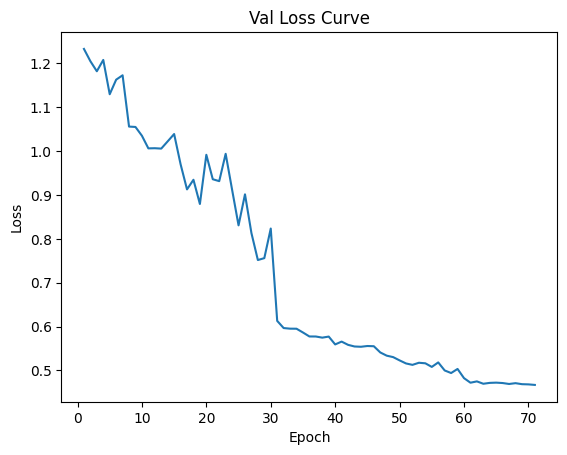

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.38s/it]


Average Adversary epoch loss: 0.115735196436827


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 72/200*****
*****Train Loss:  0.487165 Val Loss:  0.467098*****
*****Validation Accuracy: 64.00%*****
*****Total Avg Disparity: 0.08648330666331816*****

Class Parade: Recall Difference = -0.028180619644034288
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.05357142857142844
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.15207373271889413
Class Couple: Recall Difference = 0.26594301221166905
Class Family_Group: Recall Difference = -0.11825487944890933
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.154761

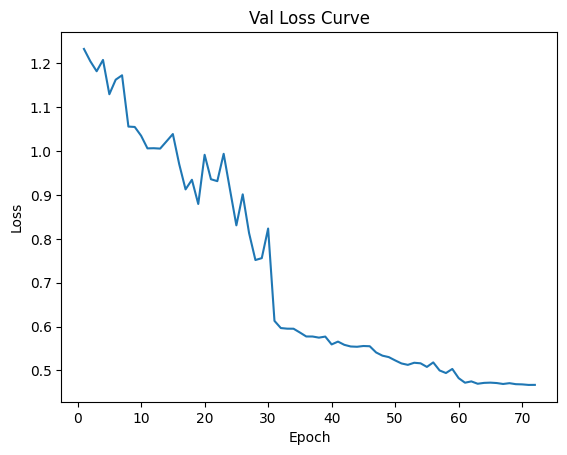

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11511926009104802


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 73/200*****
*****Train Loss:  0.488772 Val Loss:  0.470291*****
*****Validation Accuracy: 64.21%*****
*****Total Avg Disparity: 0.09273402319286474*****

Class Parade: Recall Difference = -0.04306745770160403
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.03273809523809512
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.10244360902255648
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166905
Class Family_Group: Recall Difference = -0.09050899349406816
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.1309523

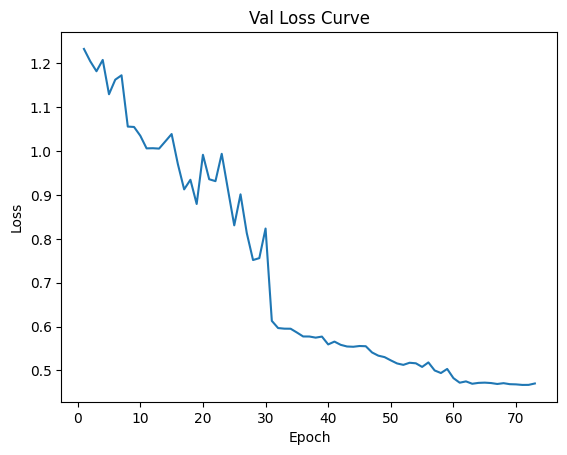

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11571410871469058


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 74/200*****
*****Train Loss:  0.483717 Val Loss:  0.465376*****
*****Validation Accuracy: 64.09%*****
*****Total Avg Disparity: 0.09328458468910175*****

Class Parade: Recall Difference = -0.03631070094484723
Class Handshaking: Recall Difference = -0.12499999999999996
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.05357142857142844
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.10244360902255648
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.11981566820276518
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.1547619

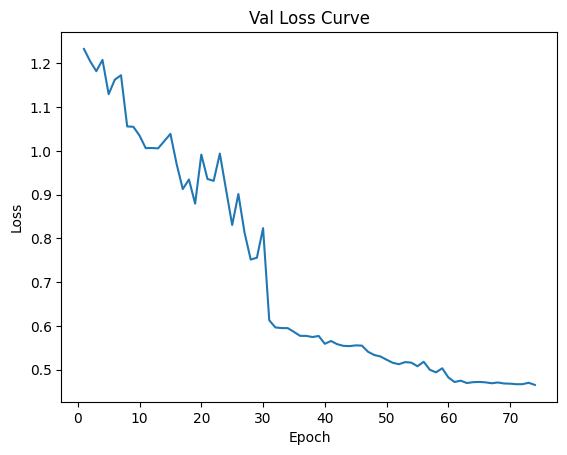

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11578717455267906


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 75/200*****
*****Train Loss:  0.482365 Val Loss:  0.467274*****
*****Validation Accuracy: 63.97%*****
*****Total Avg Disparity: 0.09261349284743782*****

Class Parade: Recall Difference = -0.029553944188090542
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.03273809523809518
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.05827067669172936
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.15207373271889413
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.1054343666283965
Class Picnic: Recall Difference = -0.0815850815850816
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.15476190

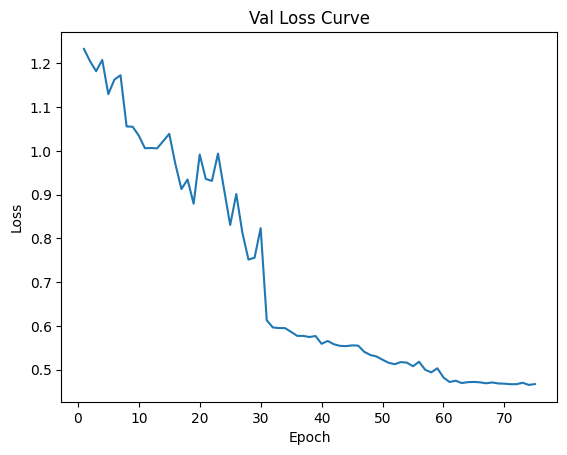

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11617186636878894


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 76/200*****
*****Train Loss:  0.486582 Val Loss:  0.466121*****
*****Validation Accuracy: 63.86%*****
*****Total Avg Disparity: 0.08965916129156314*****

Class Parade: Recall Difference = -0.03631070094484723
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.022285443338074973
Class Dancing: Recall Difference = 0.07142857142857145
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04041353383458651
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.09261385380788367
Class Picnic: Recall Difference = -0.07342657342657355
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.15476

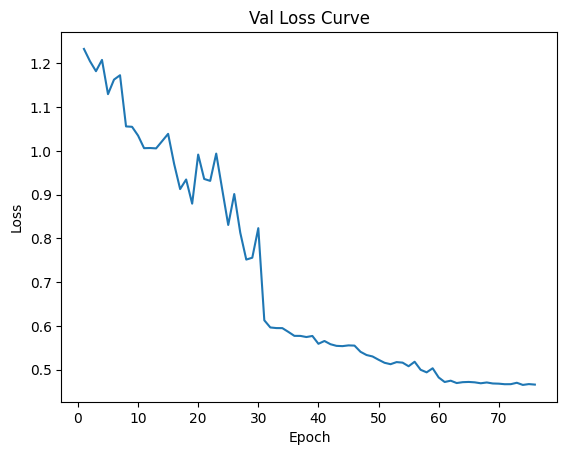

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11536826795110336


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 77/200*****
*****Train Loss:  0.480265 Val Loss:  0.465582*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.09148954882032596*****

Class Parade: Recall Difference = -0.029553944188090542
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.02228544333807503
Class Dancing: Recall Difference = 0.05357142857142855
Class Funeral: Recall Difference = 0.09644364074743816
Class Cheering: Recall Difference = 0.04041353383458651
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.11981566820276507
Class Couple: Recall Difference = 0.25101763907734054
Class Family_Group: Recall Difference = -0.1054343666283965
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.1547619

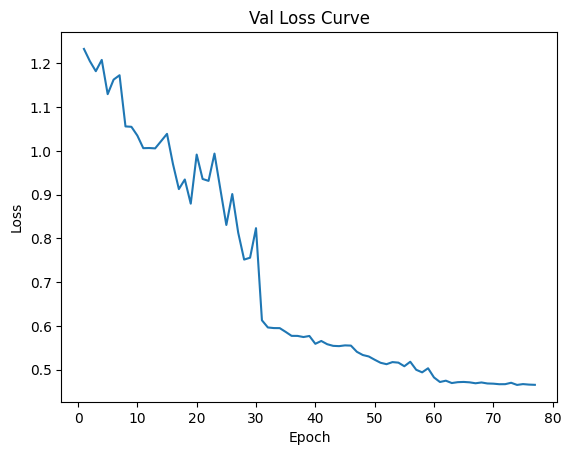

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:54<00:00,  4.38s/it]


Average Adversary epoch loss: 0.11484569110549413


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 78/200*****
*****Train Loss:  0.483959 Val Loss:  0.464900*****
*****Validation Accuracy: 63.94%*****
*****Total Avg Disparity: 0.08712333655539893*****

Class Parade: Recall Difference = -0.029553944188090542
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719778
Class Dancing: Recall Difference = 0.014880952380952384
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.031954887218045125
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.15207373271889413
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.07342657342657355
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.1547

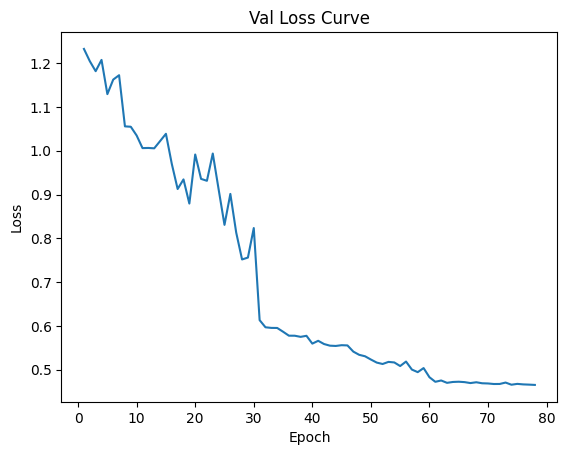

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.1145306622179655


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.22s/it]


*****Epoch 79/200*****
*****Train Loss:  0.483693 Val Loss:  0.465784*****
*****Validation Accuracy: 64.21%*****
*****Total Avg Disparity: 0.09312451162176844*****

Class Parade: Recall Difference = -0.0214238628872776
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.05654761904761896
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.11981566820276507
Class Couple: Recall Difference = 0.23609226594301222
Class Family_Group: Recall Difference = -0.11825487944890933
Class Picnic: Recall Difference = -0.07342657342657355
Class Soldier_Patrol: Recall Difference = -0.13006535947712417
Class Spa: Recall Difference = 0.1309523809

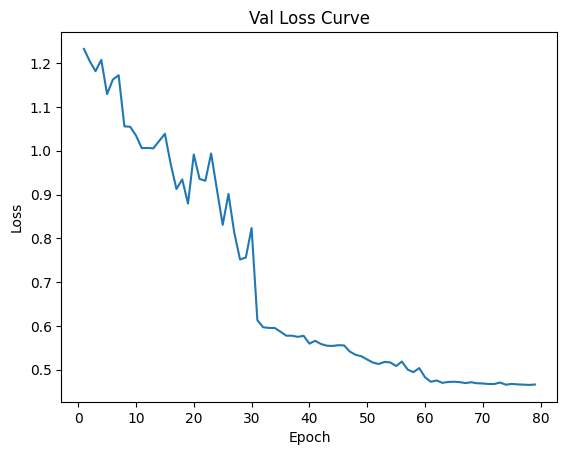

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.11496013947404347


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 80/200*****
*****Train Loss:  0.482192 Val Loss:  0.464960*****
*****Validation Accuracy: 64.06%*****
*****Total Avg Disparity: 0.09483461531128468*****

Class Parade: Recall Difference = -0.028180619644034288
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.05654761904761896
Class Funeral: Recall Difference = 0.07112718505123572
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = 0.1639784946236561
Class Couple: Recall Difference = 0.25101763907734054
Class Family_Group: Recall Difference = -0.11825487944890933
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1547619

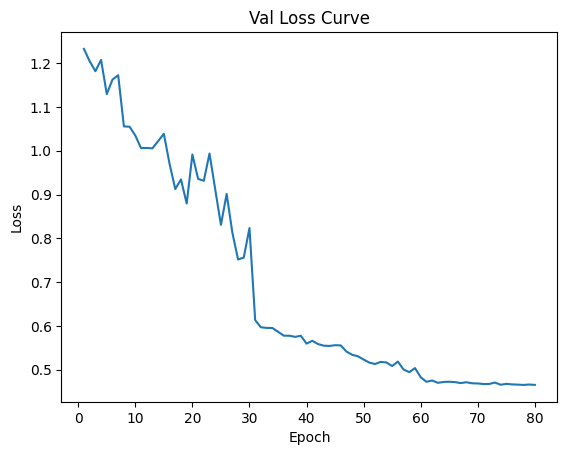

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.37s/it]


Average Adversary epoch loss: 0.11516488142884694


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 81/200*****
*****Train Loss:  0.491561 Val Loss:  0.464453*****
*****Validation Accuracy: 63.89%*****
*****Total Avg Disparity: 0.09129444638686515*****

Class Parade: Recall Difference = -0.022797187431333743
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.05654761904761901
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.031954887218045125
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.15207373271889413
Class Couple: Recall Difference = 0.23609226594301222
Class Family_Group: Recall Difference = -0.07979334098737084
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.17857

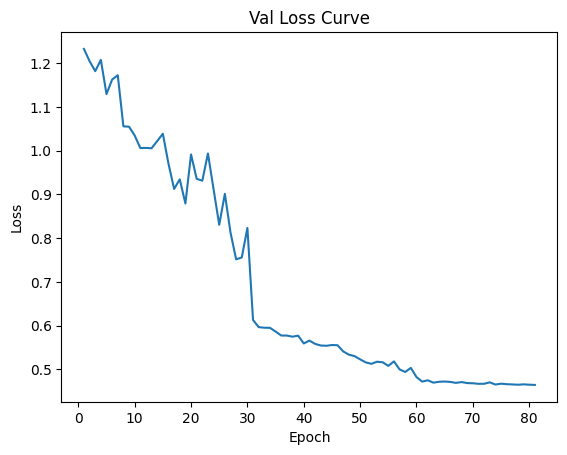

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11477239544575031


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 82/200*****
*****Train Loss:  0.487274 Val Loss:  0.464410*****
*****Validation Accuracy: 64.00%*****
*****Total Avg Disparity: 0.09076296620407068*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.05654761904761901
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.07768848067355527
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.20238

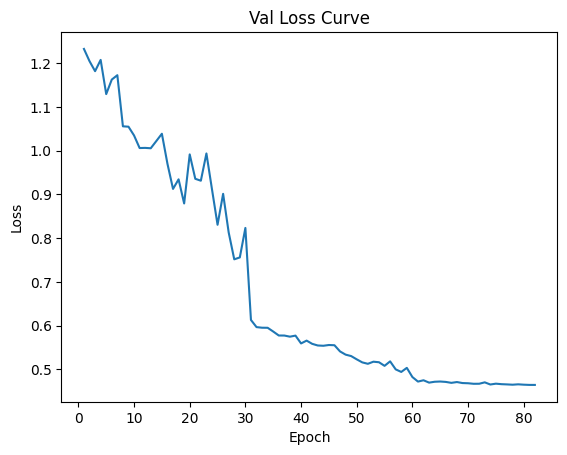

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11426324110764724


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 83/200*****
*****Train Loss:  0.486872 Val Loss:  0.463089*****
*****Validation Accuracy: 64.26%*****
*****Total Avg Disparity: 0.09462683596273648*****

Class Parade: Recall Difference = -0.04306745770160403
Class Handshaking: Recall Difference = -0.12499999999999997
Class Riot: Recall Difference = -0.0668563300142247
Class Dancing: Recall Difference = 0.05357142857142844
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.11981566820276518
Class Couple: Recall Difference = 0.26594301221166905
Class Family_Group: Recall Difference = -0.10332950631458099
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.17857142

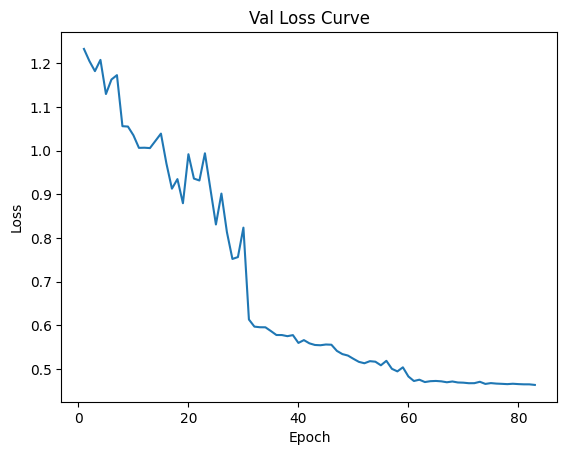

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.1148933802659695


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 84/200*****
*****Train Loss:  0.486926 Val Loss:  0.463043*****
*****Validation Accuracy: 64.47%*****
*****Total Avg Disparity: 0.09575947047699775*****

Class Parade: Recall Difference = -0.03631070094484723
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.057373162636320585
Class Dancing: Recall Difference = 0.05357142857142849
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.12884615384615383
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.1436251920122889
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.1054343666283965
Class Picnic: Recall Difference = -0.07342657342657355
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1785714

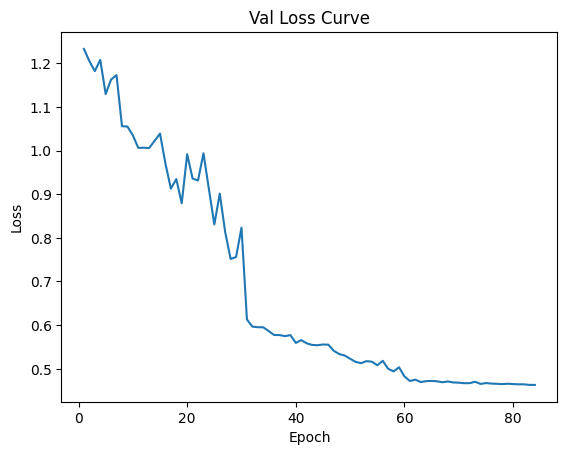

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11488963119112529


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 85/200*****
*****Train Loss:  0.479979 Val Loss:  0.460967*****
*****Validation Accuracy: 64.23%*****
*****Total Avg Disparity: 0.09754347259249269*****

Class Parade: Recall Difference = -0.022797187431333743
Class Handshaking: Recall Difference = -0.1071428571428571
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.09226190476190466
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = 0.1639784946236561
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.1054343666283965
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.202380952

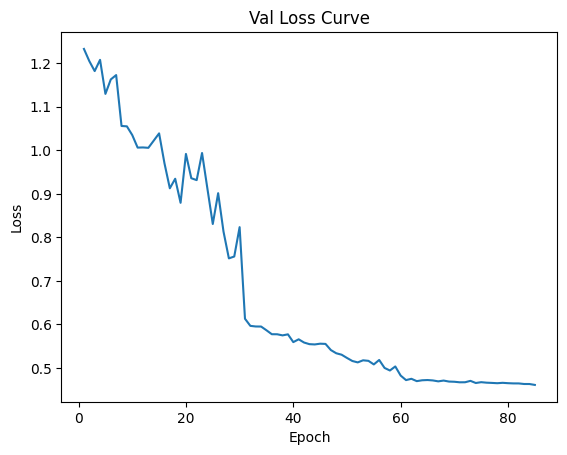

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11532917160254258


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 86/200*****
*****Train Loss:  0.486836 Val Loss:  0.460277*****
*****Validation Accuracy: 64.52%*****
*****Total Avg Disparity: 0.08926502594855514*****

Class Parade: Recall Difference = -0.029553944188090542
Class Handshaking: Recall Difference = -0.1071428571428571
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07142857142857129
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = 0.11981566820276507
Class Couple: Recall Difference = 0.17503392130257805
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.0815850815850816
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.154761904

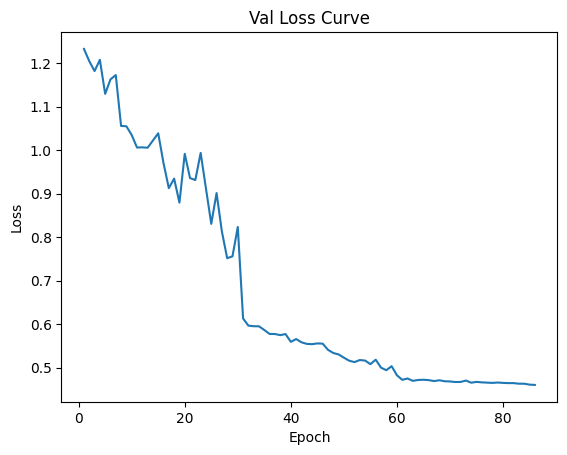

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11545037506864621


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 87/200*****
*****Train Loss:  0.483478 Val Loss:  0.460815*****
*****Validation Accuracy: 64.58%*****
*****Total Avg Disparity: 0.0974583772419106*****

Class Parade: Recall Difference = -0.029553944188090542
Class Handshaking: Recall Difference = -0.1071428571428571
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.07142857142857129
Class Funeral: Recall Difference = 0.07112718505123572
Class Cheering: Recall Difference = 0.06766917293233088
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.14362519201228902
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.154761904

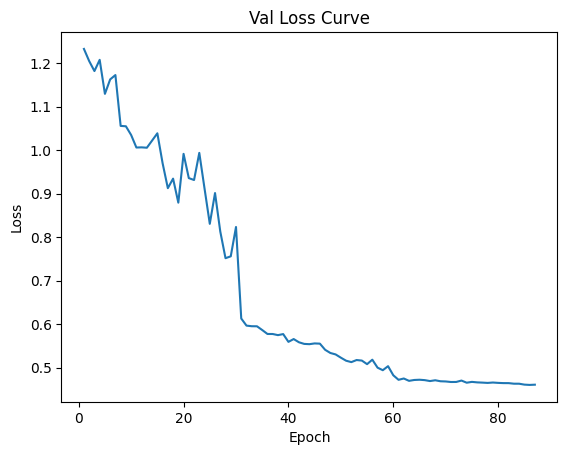

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11499142532165234


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 88/200*****
*****Train Loss:  0.481551 Val Loss:  0.458876*****
*****Validation Accuracy: 64.15%*****
*****Total Avg Disparity: 0.08417387057426498*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719778
Class Dancing: Recall Difference = 0.05357142857142844
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.058270676691729306
Class Meeting: Recall Difference = 0.11346153846153861
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.08755760368663601
Class Couple: Recall Difference = 0.25101763907734054
Class Family_Group: Recall Difference = -0.09050899349406816
Class Picnic: Recall Difference = -0.04312354312354316
Class Soldier_Patrol: Recall Difference = -0.0013071895424837665
Class Spa: Recall Difference = 0.17857

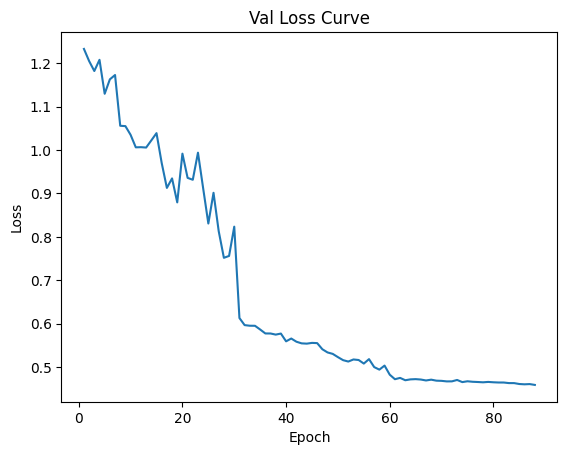

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11544207053688857


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 89/200*****
*****Train Loss:  0.478344 Val Loss:  0.460309*****
*****Validation Accuracy: 64.35%*****
*****Total Avg Disparity: 0.1017626436702618*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.09226190476190466
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.07612781954887221
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.11981566820276507
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.0815850815850816
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.202380952

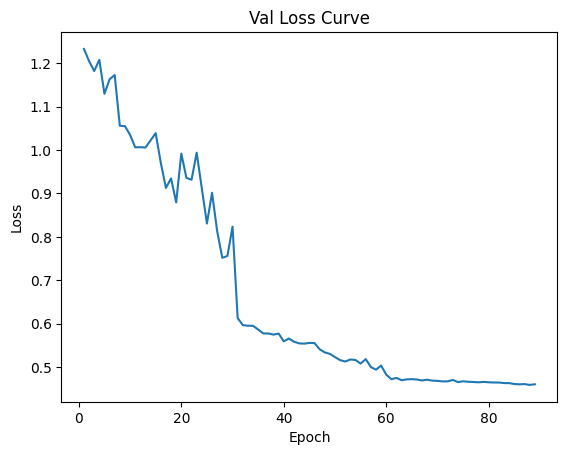

Data has been appended to validation_1.5.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.11484868795825885


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 90/200*****
*****Train Loss:  0.480325 Val Loss:  0.458804*****
*****Validation Accuracy: 64.29%*****
*****Total Avg Disparity: 0.10127383925855243*****

Class Parade: Recall Difference = -0.030927268732146684
Class Handshaking: Recall Difference = -0.07142857142857137
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.09226190476190471
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.25101763907734065
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.0815850815850816
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.17857142

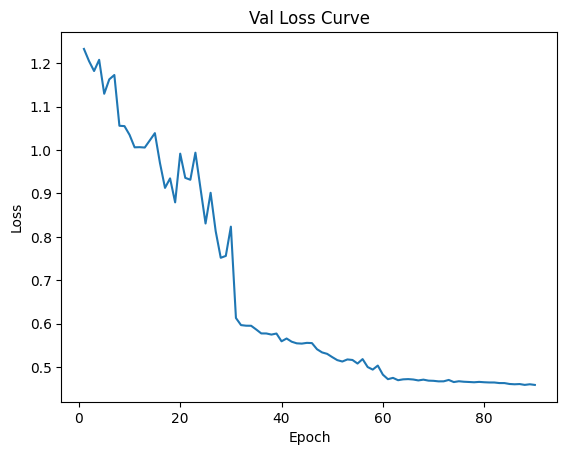

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11448983246317276


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.30s/it]


*****Epoch 91/200*****
*****Train Loss:  0.481007 Val Loss:  0.461369*****
*****Validation Accuracy: 64.38%*****
*****Total Avg Disparity: 0.09445019078374048*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.05357142857142844
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.11981566820276507
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1785714

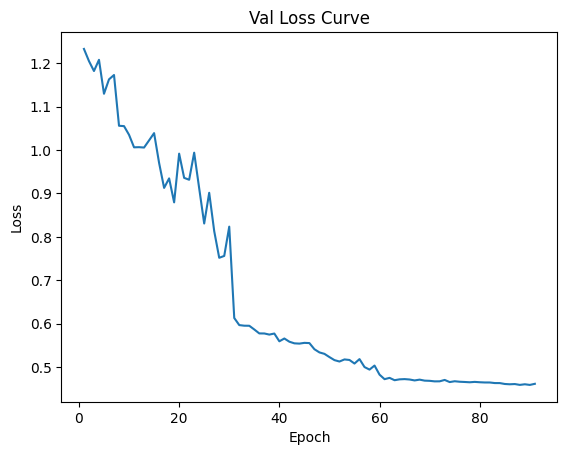

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.11398074460717347


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 92/200*****
*****Train Loss:  0.483559 Val Loss:  0.460425*****
*****Validation Accuracy: 64.29%*****
*****Total Avg Disparity: 0.09241462190045503*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.05357142857142849
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.12884615384615394
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.08071278825995809
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.178571

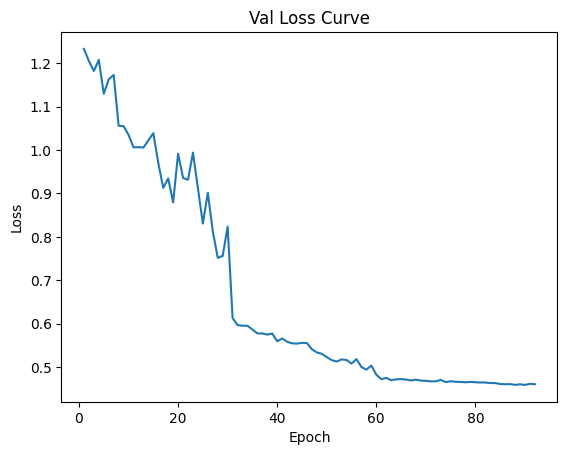

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11473733473282594


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 93/200*****
*****Train Loss:  0.479991 Val Loss:  0.459841*****
*****Validation Accuracy: 64.23%*****
*****Total Avg Disparity: 0.09234598151050782*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.05357142857142849
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.11346153846153861
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1785714

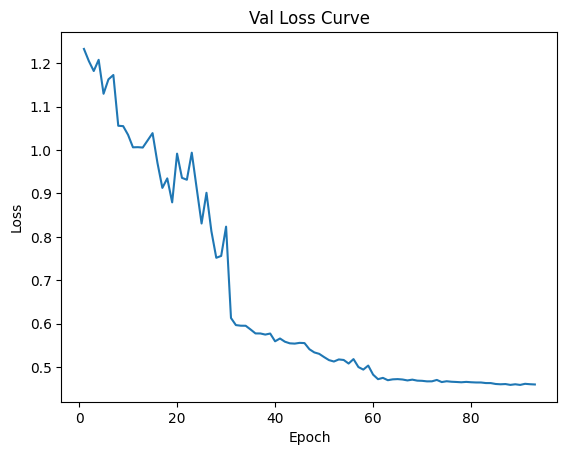

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.11388113636236924


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 94/200*****
*****Train Loss:  0.482549 Val Loss:  0.459714*****
*****Validation Accuracy: 64.35%*****
*****Total Avg Disparity: 0.0951340923718082*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07440476190476181
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.11981566820276507
Class Couple: Recall Difference = 0.28086838534599734
Class Family_Group: Recall Difference = -0.10332950631458099
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.17857142

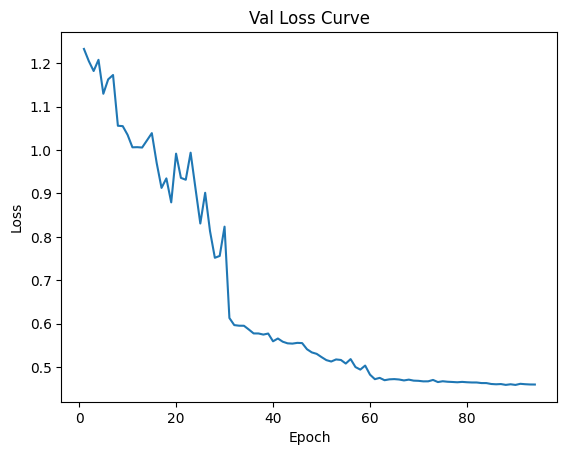

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11486413272527549


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.28s/it]


*****Epoch 95/200*****
*****Train Loss:  0.483593 Val Loss:  0.459321*****
*****Validation Accuracy: 64.49%*****
*****Total Avg Disparity: 0.09882491801141781*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.1071428571428571
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.05357142857142849
Class Funeral: Recall Difference = 0.08378541289933694
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.178571428

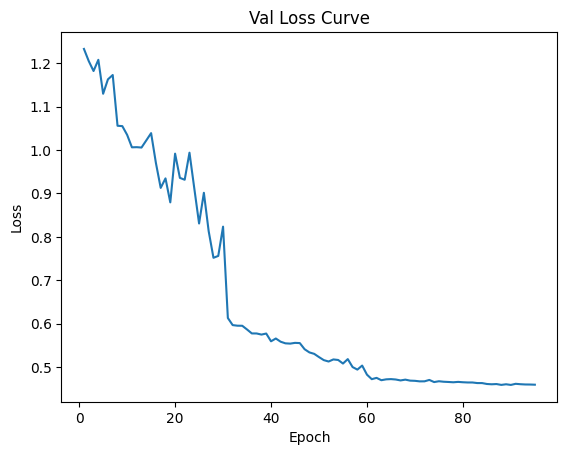

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.11532207836325352


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 96/200*****
*****Train Loss:  0.474605 Val Loss:  0.458229*****
*****Validation Accuracy: 64.32%*****
*****Total Avg Disparity: 0.09547893612464066*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07440476190476181
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.11346153846153861
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09958071278825997
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11825487944890933
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.178571

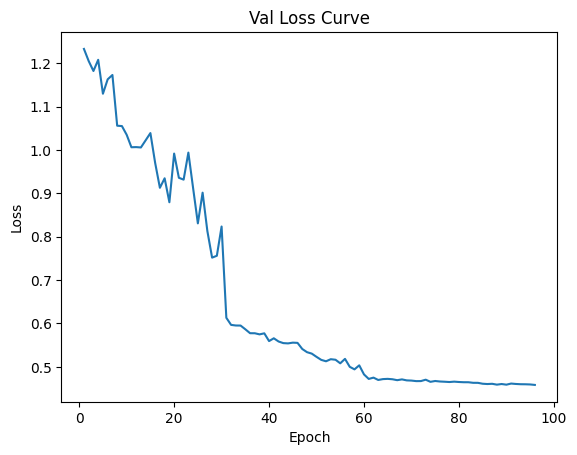

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11495092568489221


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 97/200*****
*****Train Loss:  0.479705 Val Loss:  0.455542*****
*****Validation Accuracy: 64.47%*****
*****Total Avg Disparity: 0.09170003916028942*****

Class Parade: Recall Difference = -0.024170511975389997
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07142857142857129
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.03195488721804507
Class Meeting: Recall Difference = 0.11346153846153861
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.178571

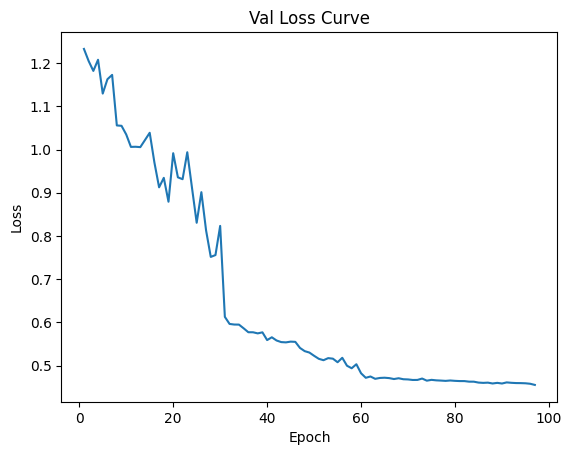

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11586846124667388


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.29s/it]


*****Epoch 98/200*****
*****Train Loss:  0.478327 Val Loss:  0.458140*****
*****Validation Accuracy: 64.49%*****
*****Total Avg Disparity: 0.09113963184568555*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.09226190476190466
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.08755760368663601
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1785714

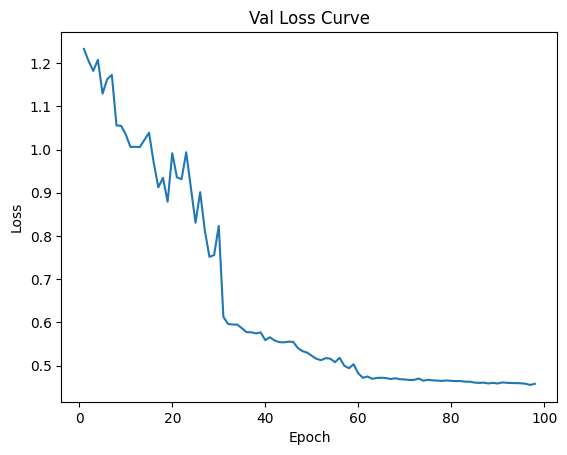

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.1144674767095309


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 99/200*****
*****Train Loss:  0.478299 Val Loss:  0.454871*****
*****Validation Accuracy: 64.49%*****
*****Total Avg Disparity: 0.09392495817745111*****

Class Parade: Recall Difference = -0.024170511975389997
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.03273809523809518
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = 0.13172043010752704
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.17857

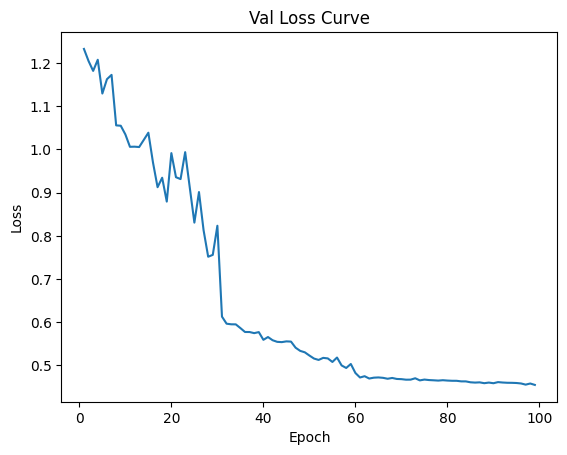

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1153021237024894


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 100/200*****
*****Train Loss:  0.478659 Val Loss:  0.458130*****
*****Validation Accuracy: 64.38%*****
*****Total Avg Disparity: 0.09504180594734178*****

Class Parade: Recall Difference = -0.024170511975389997
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.07440476190476181
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.17857

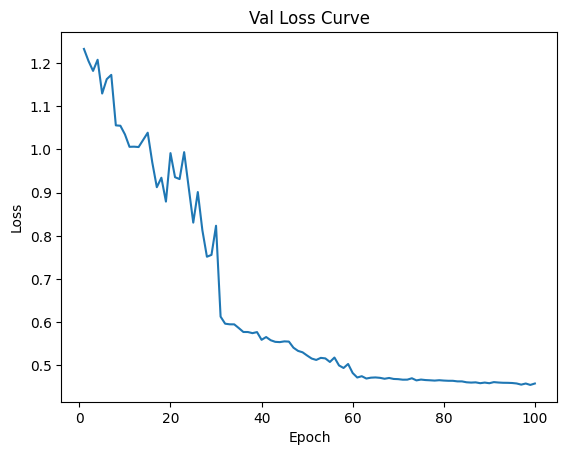

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11505711995638333


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 101/200*****
*****Train Loss:  0.478725 Val Loss:  0.458118*****
*****Validation Accuracy: 64.55%*****
*****Total Avg Disparity: 0.09350819291715862*****

Class Parade: Recall Difference = -0.024170511975389997
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07440476190476186
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1785

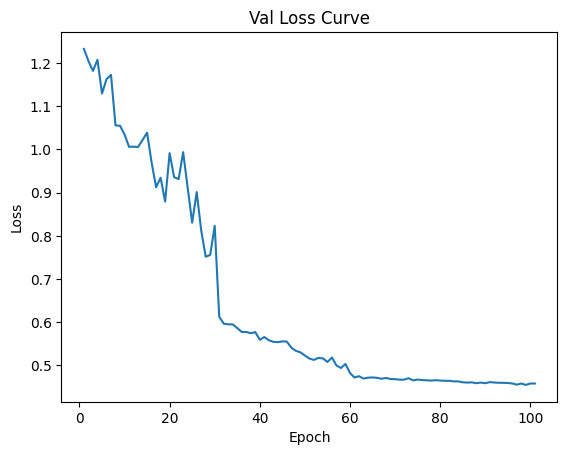

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.11473621829197957


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 102/200*****
*****Train Loss:  0.486129 Val Loss:  0.458839*****
*****Validation Accuracy: 64.41%*****
*****Total Avg Disparity: 0.09302256071202206*****

Class Parade: Recall Difference = -0.024170511975389997
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.05357142857142849
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.17857

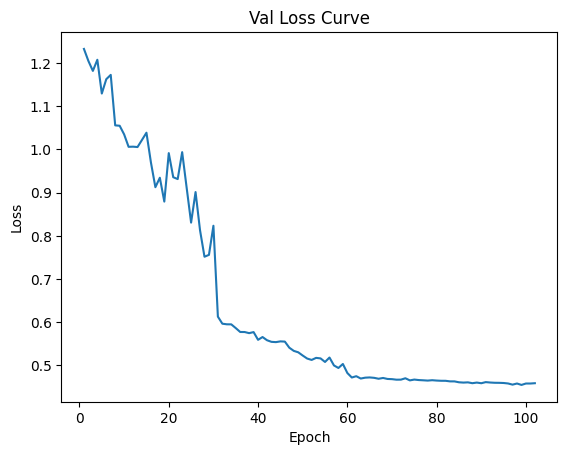

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11507485491725114


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 103/200*****
*****Train Loss:  0.476274 Val Loss:  0.458808*****
*****Validation Accuracy: 64.67%*****
*****Total Avg Disparity: 0.09251638377532932*****

Class Parade: Recall Difference = -0.024170511975389997
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07142857142857134
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1547

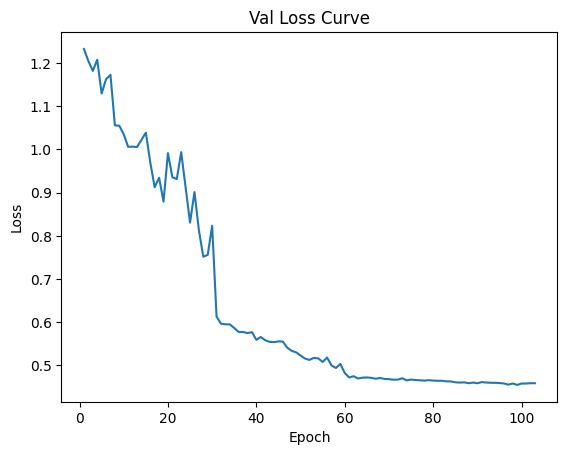

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11442800467977157


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 104/200*****
*****Train Loss:  0.482860 Val Loss:  0.458532*****
*****Validation Accuracy: 64.41%*****
*****Total Avg Disparity: 0.09400000541962393*****

Class Parade: Recall Difference = -0.016040430674577055
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.07440476190476186
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.11615001913509371
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.17857

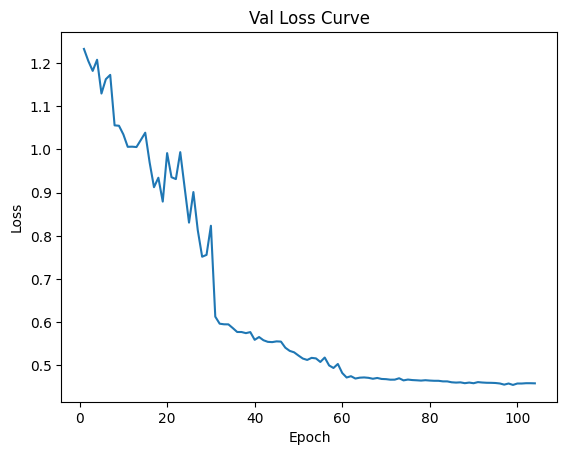

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11623056089648834


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 105/200*****
*****Train Loss:  0.478707 Val Loss:  0.455621*****
*****Validation Accuracy: 64.67%*****
*****Total Avg Disparity: 0.09022158943338766*****

Class Parade: Recall Difference = -0.017413755218633198
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.03273809523809518
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166905
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.07342657342657355
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1309

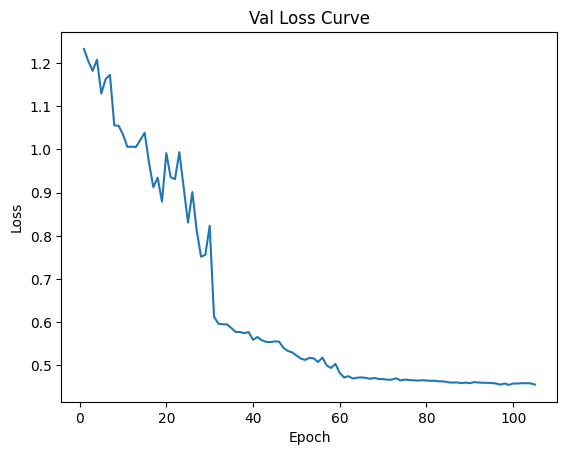

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11502086485807712


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 106/200*****
*****Train Loss:  0.482943 Val Loss:  0.456968*****
*****Validation Accuracy: 64.35%*****
*****Total Avg Disparity: 0.09689399548537135*****

Class Parade: Recall Difference = -0.024170511975389997
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.07440476190476186
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09958071278825997
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10332950631458093
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.17857

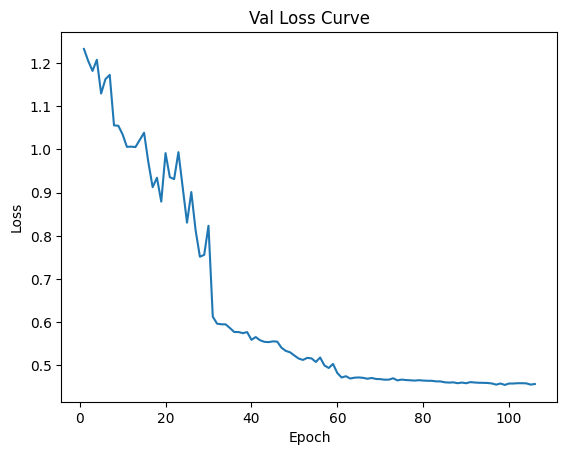

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.37s/it]


Average Adversary epoch loss: 0.11434353802066582


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 107/200*****
*****Train Loss:  0.479099 Val Loss:  0.458295*****
*****Validation Accuracy: 64.38%*****
*****Total Avg Disparity: 0.09258643140285401*****

Class Parade: Recall Difference = -0.024170511975389997
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.05737316263632053
Class Dancing: Recall Difference = 0.05357142857142849
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.1134615384615385
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.07180293501048218
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166905
Class Family_Group: Recall Difference = -0.0905089934940681
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1785714

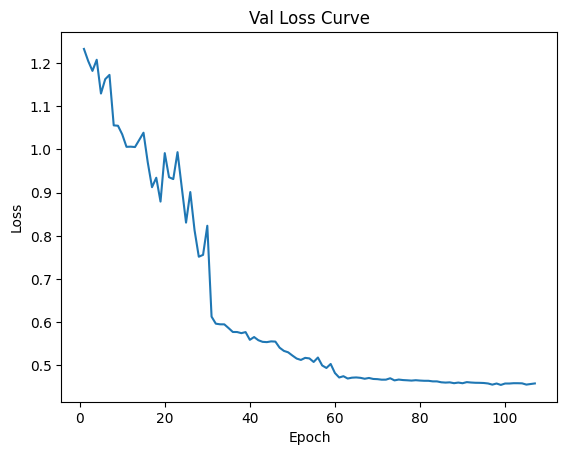

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.1149419156404642


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 108/200*****
*****Train Loss:  0.480503 Val Loss:  0.458372*****
*****Validation Accuracy: 64.38%*****
*****Total Avg Disparity: 0.0918747820858857*****

Class Parade: Recall Difference = -0.022797187431333743
Class Handshaking: Recall Difference = -0.10714285714285708
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07440476190476186
Class Funeral: Recall Difference = 0.09644364074743816
Class Cheering: Recall Difference = 0.04981203007518803
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.09067085953878412
Class Concerts: Recall Difference = 0.09946236559139798
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.1054343666283965
Class Picnic: Recall Difference = -0.11188811188811199
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.1547619

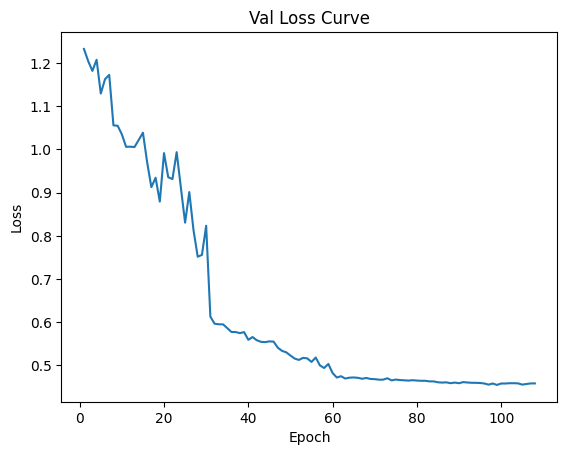

Data has been appended to validation_1.5.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11545722731030904


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 109/200*****
*****Train Loss:  0.476963 Val Loss:  0.458841*****
*****Validation Accuracy: 64.32%*****
*****Total Avg Disparity: 0.09026219844807129*****

Class Parade: Recall Difference = -0.022797187431333743
Class Handshaking: Recall Difference = -0.12499999999999994
Class Riot: Recall Difference = -0.03982930298719772
Class Dancing: Recall Difference = 0.07440476190476181
Class Funeral: Recall Difference = 0.09644364074743828
Class Cheering: Recall Difference = 0.049812030075187974
Class Meeting: Recall Difference = 0.11346153846153839
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0529350104821803
Class Concerts: Recall Difference = 0.055299539170507006
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.0905089934940681
Class Picnic: Recall Difference = -0.07342657342657355
Class Soldier_Patrol: Recall Difference = -0.060130718954248374
Class Spa: Recall Difference = 0.17857

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:56<00:00,  4.50s/it]


*******Epoch 0: loss - 1.3779136446806102


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:56<00:00,  4.48s/it]


*******Epoch 1: loss - 1.3302296491769643


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:57<00:00,  4.51s/it]


*******Epoch 2: loss - 1.2839036767299359


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.37s/it]


Average Pretrain Adversary epoch loss:  0.1592008895598925


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Pretrain Adversary epoch loss:  0.12585372878954962


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Pretrain Adversary epoch loss:  0.12337191574848615


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.12213171187501687


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 1/200*****
*****Train Loss:  0.981779 Val Loss:  1.160418*****
*****Validation Accuracy: 19.58%*****
*****Total Avg Disparity: 0.0756561964093055*****

Class Parade: Recall Difference = 0.08684904416611738
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.014880952380952384
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.030721966205837184
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.0
Class Soldier_Patrol: Recall Difference = -0.06535947712418298
Class Spa: Recall Difference = -0.023809523809523808
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference = 0.1468970934799686
Class Run

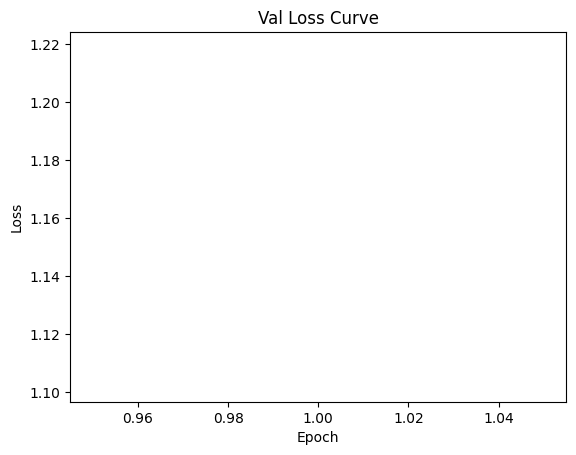

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.12503924163488242


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 2/200*****
*****Train Loss:  0.953035 Val Loss:  1.218701*****
*****Validation Accuracy: 19.03%*****
*****Total Avg Disparity: 0.07072307483621365*****

Class Parade: Recall Difference = 0.0948692595034058
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = -0.01190476190476189
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.08678955453149004
Class Couple: Recall Difference = 0.029850746268656712
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = -0.06060606060606061
Class Soldier_Patrol: Recall Difference = 0.08562091503267977
Class Spa: Recall Difference = 0.2261904761904762
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Difference =

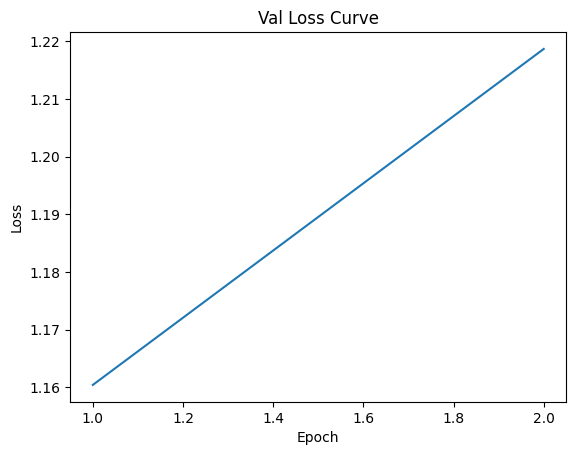

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.12455915057888398


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.29s/it]


*****Epoch 3/200*****
*****Train Loss:  0.934488 Val Loss:  1.213899*****
*****Validation Accuracy: 20.45%*****
*****Total Avg Disparity: 0.09942720339311875*****

Class Parade: Recall Difference = 0.13760711931443625
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = -0.0029761904761904726
Class Funeral: Recall Difference = 0.0
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.03571428571428572
Class Couple: Recall Difference = 0.029850746268656716
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = -0.013986013986013984
Class Soldier_Patrol: Recall Difference = -0.01633986928104575
Class Spa: Recall Difference = 0.4523809523809524
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Waiter_Waitress: Recall Differe

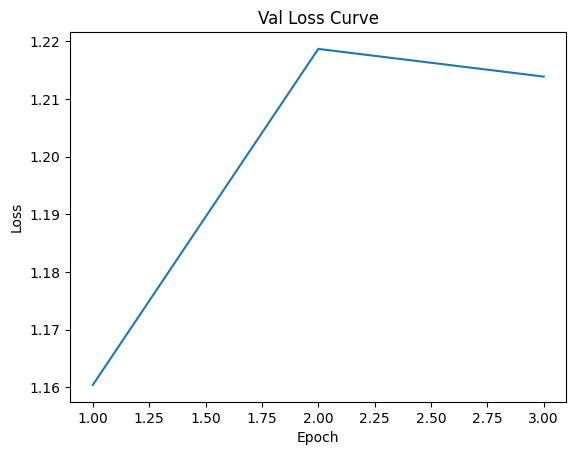

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.12410564548694171


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 4/200*****
*****Train Loss:  0.898578 Val Loss:  1.070438*****
*****Validation Accuracy: 24.73%*****
*****Total Avg Disparity: 0.0832712420971269*****

Class Parade: Recall Difference = 0.0649857174247418
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.041725936462778584
Class Dancing: Recall Difference = -0.005952380952380952
Class Funeral: Recall Difference = 0.025316455696202528
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.0
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.11059907834101382
Class Couple: Recall Difference = 0.04477611940298508
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = -0.03613053613053614
Class Soldier_Patrol: Recall Difference = 0.10130718954248363
Class Spa: Recall Difference = 0.27976190476190477
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Difference = 0.0
Class Wa

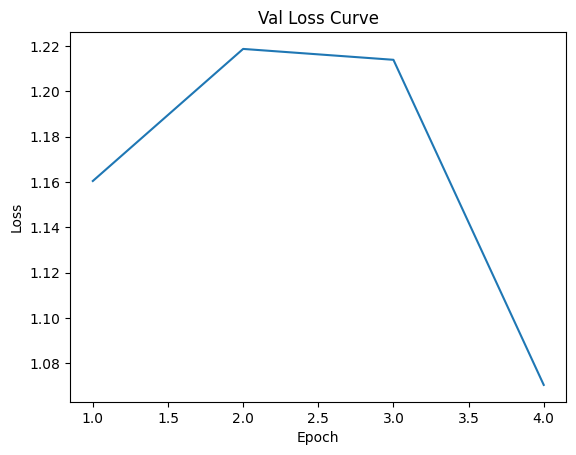

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.12235399536215343


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.28s/it]


*****Epoch 5/200*****
*****Train Loss:  0.883687 Val Loss:  1.125488*****
*****Validation Accuracy: 21.87%*****
*****Total Avg Disparity: 0.05801834068199344*****

Class Parade: Recall Difference = -0.03186112942210506
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0915125651967757
Class Dancing: Recall Difference = -0.002976190476190476
Class Funeral: Recall Difference = 0.012658227848101267
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.02980769230769232
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.027777777777777776
Class Concerts: Recall Difference = 0.00691244239631339
Class Couple: Recall Difference = 0.0
Class Family_Group: Recall Difference = 0.0
Class Picnic: Recall Difference = 0.14801864801864806
Class Soldier_Patrol: Recall Difference = -0.013725490196078272
Class Spa: Recall Difference = 0.10119047619047619
Class Sports_Fan: Recall Difference = 0.0
Class Surgeons: Recall Diffe

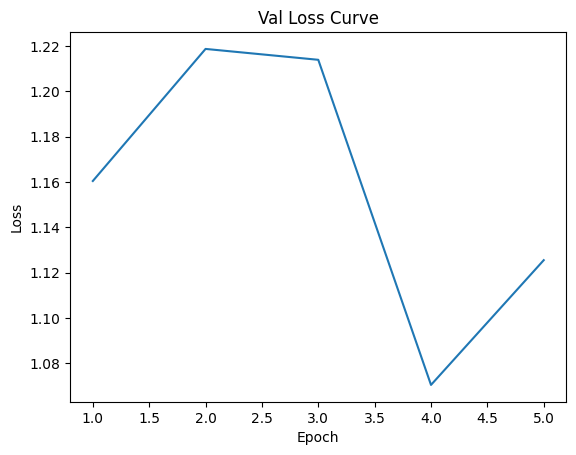

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.12298208446456836


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 6/200*****
*****Train Loss:  0.873084 Val Loss:  1.120348*****
*****Validation Accuracy: 25.40%*****
*****Total Avg Disparity: 0.07731807645652543*****

Class Parade: Recall Difference = -0.0029114480333992665
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.001422475106685632
Class Dancing: Recall Difference = 0.011904761904761918
Class Funeral: Recall Difference = -0.016274864376130183
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.015384615384615384
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = 0.07334869431643623
Class Couple: Recall Difference = 0.08955223880597013
Class Family_Group: Recall Difference = -0.01282051282051282
Class Picnic: Recall Difference = -0.03613053613053614
Class Soldier_Patrol: Recall Difference = 0.13137254901960776
Class Spa: Recall Difference = 0.35714285714285715
Class Sports_Fan: Recall Difference = 0.0
Class Su

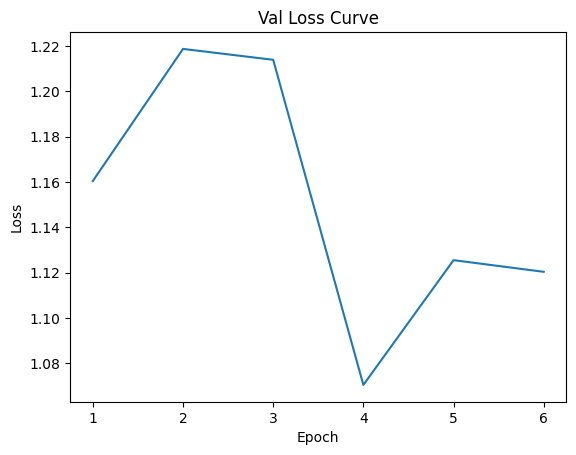

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12140766989726287


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 7/200*****
*****Train Loss:  0.859169 Val Loss:  1.026812*****
*****Validation Accuracy: 26.59%*****
*****Total Avg Disparity: 0.08648309356536456*****

Class Parade: Recall Difference = -0.028675016479894566
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.05263157894736842
Class Dancing: Recall Difference = -0.03273809523809526
Class Funeral: Recall Difference = -0.12718505123568413
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = 0.04519230769230771
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.01886792452830189
Class Concerts: Recall Difference = 0.02227342549923199
Class Couple: Recall Difference = 0.13432835820895522
Class Family_Group: Recall Difference = 0.029850746268656712
Class Picnic: Recall Difference = 0.13170163170163168
Class Soldier_Patrol: Recall Difference = 0.008496732026143872
Class Spa: Recall Difference = 0.3273809523809524
Class Sports_Fan: Recall

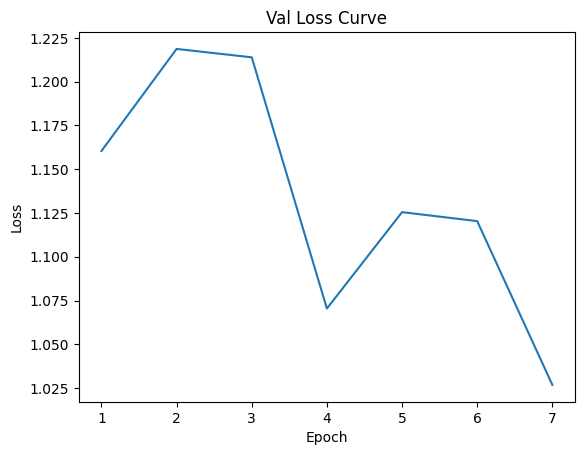

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.12055339807501206


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 8/200*****
*****Train Loss:  0.837801 Val Loss:  1.027725*****
*****Validation Accuracy: 26.38%*****
*****Total Avg Disparity: 0.07774657254735357*****

Class Parade: Recall Difference = 0.04312239068336632
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0
Class Dancing: Recall Difference = 0.01785714285714285
Class Funeral: Recall Difference = 0.003013863773357453
Class Cheering: Recall Difference = 0.01785714285714286
Class Meeting: Recall Difference = -0.10961538461538461
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.05660377358490566
Class Concerts: Recall Difference = 0.0460829493087558
Class Couple: Recall Difference = 0.13432835820895522
Class Family_Group: Recall Difference = 0.008419441255262151
Class Picnic: Recall Difference = 0.04895104895104896
Class Soldier_Patrol: Recall Difference = 0.0803921568627452
Class Spa: Recall Difference = -0.07142857142857142
Class Sports_Fan: Recall Difference = 0.0
C

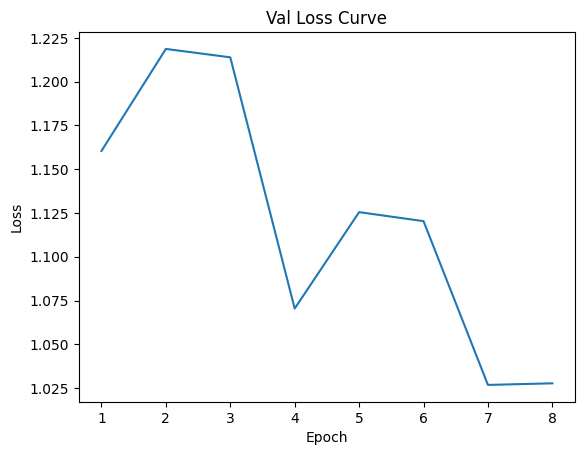

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.12105730204628064


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 9/200*****
*****Train Loss:  0.815156 Val Loss:  1.009063*****
*****Validation Accuracy: 27.63%*****
*****Total Avg Disparity: 0.0737721101347474*****

Class Parade: Recall Difference = 0.011975390024170585
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.09577999051683267
Class Dancing: Recall Difference = -0.02380952380952378
Class Funeral: Recall Difference = -0.09885473176612417
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = 0.015384615384615382
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.02882599580712788
Class Concerts: Recall Difference = 0.09370199692780344
Class Couple: Recall Difference = 0.059701492537313446
Class Family_Group: Recall Difference = 0.04477611940298508
Class Picnic: Recall Difference = 0.13403263403263402
Class Soldier_Patrol: Recall Difference = 0.0725490196078431
Class Spa: Recall Difference = -0.02380952380952381
Class Sports_Fan: Recall Difference = 0.0

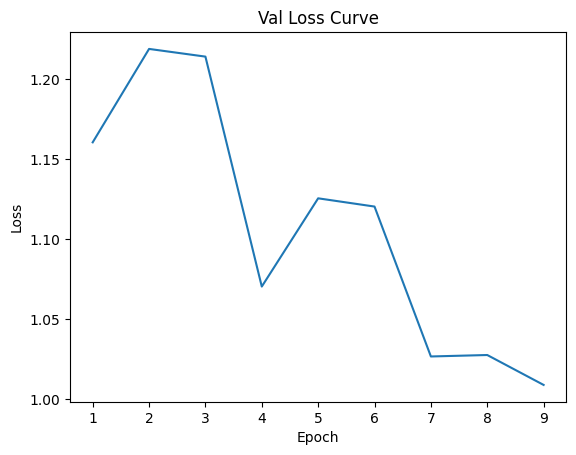

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.12089675005811912


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.22s/it]


*****Epoch 10/200*****
*****Train Loss:  0.801970 Val Loss:  0.980473*****
*****Validation Accuracy: 28.76%*****
*****Total Avg Disparity: 0.06557785345536779*****

Class Parade: Recall Difference = -0.06141507361019549
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.018966334755808445
Class Dancing: Recall Difference = 0.011904761904761911
Class Funeral: Recall Difference = 0.031344183242917434
Class Cheering: Recall Difference = 0.009398496240601507
Class Meeting: Recall Difference = 0.04326923076923081
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07547169811320754
Class Concerts: Recall Difference = 0.018817204301075266
Class Couple: Recall Difference = 0.07327001356852107
Class Family_Group: Recall Difference = -0.13911213164944508
Class Picnic: Recall Difference = 0.2191142191142191
Class Soldier_Patrol: Recall Difference = -0.010457516339869355
Class Spa: Recall Difference = 0.25595238095238093
Class Sports_Fan: R

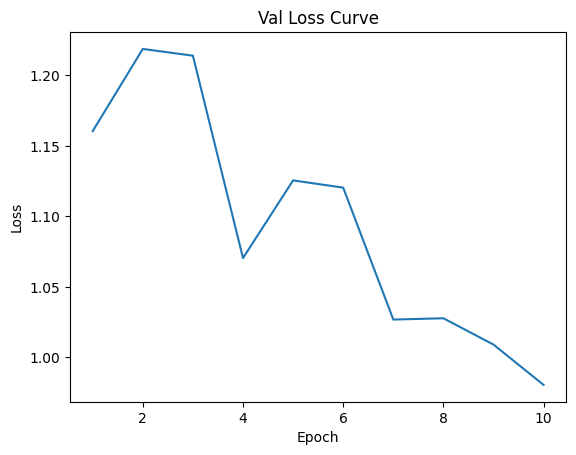

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.12370472601973094


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 11/200*****
*****Train Loss:  0.790657 Val Loss:  1.014671*****
*****Validation Accuracy: 27.95%*****
*****Total Avg Disparity: 0.0767055159656559*****

Class Parade: Recall Difference = 0.026642496154691164
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.09577999051683264
Class Dancing: Recall Difference = 0.07142857142857145
Class Funeral: Recall Difference = 0.02772754671488853
Class Cheering: Recall Difference = -0.008458646616541356
Class Meeting: Recall Difference = -0.17403846153846153
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07547169811320756
Class Concerts: Recall Difference = 0.09370199692780341
Class Couple: Recall Difference = 0.08955223880597016
Class Family_Group: Recall Difference = 0.029659395331037133
Class Picnic: Recall Difference = -0.027972027972027996
Class Soldier_Patrol: Recall Difference = 0.10588235294117648
Class Spa: Recall Difference = 0.10714285714285715
Class Sports_Fan: Reca

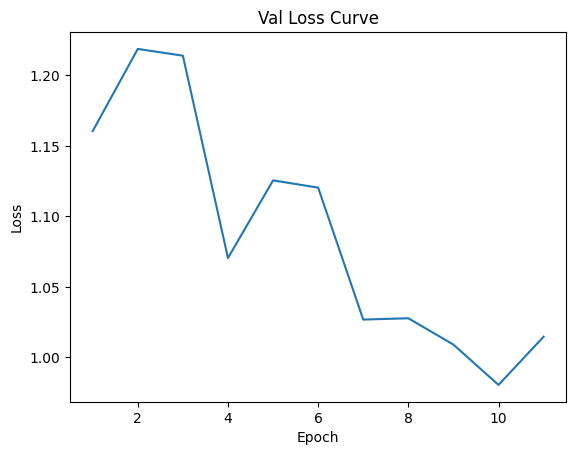

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.12020140456465575


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 12/200*****
*****Train Loss:  0.778336 Val Loss:  0.997175*****
*****Validation Accuracy: 29.97%*****
*****Total Avg Disparity: 0.0824780363839994*****

Class Parade: Recall Difference = -0.011151395297736677
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.13892840208629684
Class Dancing: Recall Difference = -0.011904761904761904
Class Funeral: Recall Difference = 0.0343580470162749
Class Cheering: Recall Difference = -0.00845864661654135
Class Meeting: Recall Difference = 0.1221153846153846
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.019916142557651992
Class Concerts: Recall Difference = -0.10675883256528418
Class Couple: Recall Difference = 0.05970149253731343
Class Family_Group: Recall Difference = -0.07060849598163031
Class Picnic: Recall Difference = 0.09557109557109555
Class Soldier_Patrol: Recall Difference = 0.019607843137254943
Class Spa: Recall Difference = 0.20238095238095238
Class Sports_Fan: Reca

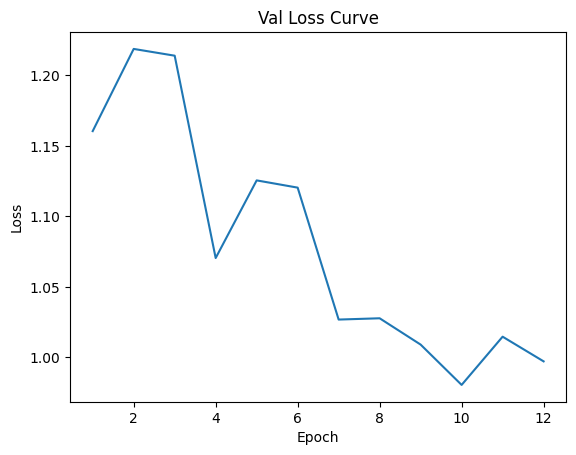

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.121549370770271


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 13/200*****
*****Train Loss:  0.763746 Val Loss:  0.944482*****
*****Validation Accuracy: 32.96%*****
*****Total Avg Disparity: 0.08759541092927049*****

Class Parade: Recall Difference = 0.0019226543616787106
Class Handshaking: Recall Difference = -0.05357142857142855
Class Riot: Recall Difference = -0.04741583688952106
Class Dancing: Recall Difference = 0.023809523809523808
Class Funeral: Recall Difference = 0.06329113924050633
Class Cheering: Recall Difference = 0.05357142857142856
Class Meeting: Recall Difference = -0.25384615384615383
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.01991614255765202
Class Concerts: Recall Difference = -0.12211981566820274
Class Couple: Recall Difference = 0.17910447761194032
Class Family_Group: Recall Difference = 0.02315346345197089
Class Picnic: Recall Difference = 0.07342657342657344
Class Soldier_Patrol: Recall Difference = -0.08366013071895417
Class Spa: Recall Difference = 0.11309523809523797
Clas

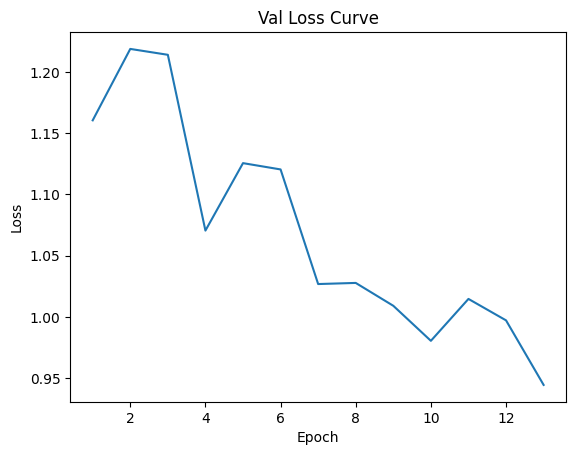

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.12122284047878705


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 14/200*****
*****Train Loss:  0.757342 Val Loss:  0.975650*****
*****Validation Accuracy: 30.50%*****
*****Total Avg Disparity: 0.0843662298274077*****

Class Parade: Recall Difference = -0.033014722039112376
Class Handshaking: Recall Difference = 0.03571428571428572
Class Riot: Recall Difference = 0.10526315789473684
Class Dancing: Recall Difference = 0.05357142857142844
Class Funeral: Recall Difference = 0.06268836648583481
Class Cheering: Recall Difference = 0.009398496240601503
Class Meeting: Recall Difference = 0.05769230769230782
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0020964360587002184
Class Concerts: Recall Difference = 0.07334869431643629
Class Couple: Recall Difference = 0.14789687924016282
Class Family_Group: Recall Difference = -0.10715652506697285
Class Picnic: Recall Difference = 0.11188811188811193
Class Soldier_Patrol: Recall Difference = -0.04379084967320268
Class Spa: Recall Difference = 0.23809523809523803
Class 

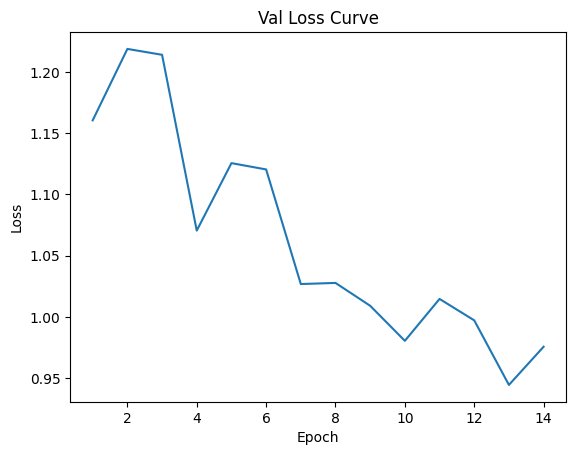

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:54<00:00,  4.40s/it]


Average Adversary epoch loss: 0.12163963140203403


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 15/200*****
*****Train Loss:  0.739076 Val Loss:  0.942697*****
*****Validation Accuracy: 32.99%*****
*****Total Avg Disparity: 0.07115351288187012*****

Class Parade: Recall Difference = -0.052021533728850766
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.02038880986249407
Class Dancing: Recall Difference = 0.038690476190476206
Class Funeral: Recall Difference = 0.12296564195298382
Class Cheering: Recall Difference = 0.009398496240601507
Class Meeting: Recall Difference = 0.05865384615384614
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07756813417190778
Class Concerts: Recall Difference = -0.06605222734254991
Class Couple: Recall Difference = 0.0746268656716418
Class Family_Group: Recall Difference = -0.01511672407194796
Class Picnic: Recall Difference = -0.041958041958041925
Class Soldier_Patrol: Recall Difference = 0.09150326797385627
Class Spa: Recall Difference = -0.017857142857142877
Class Sports_Fan: 

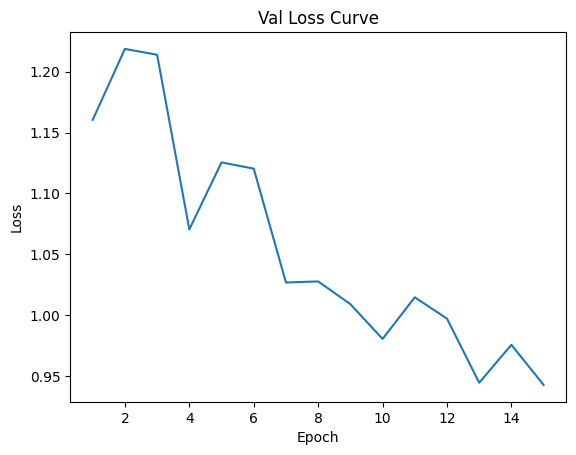

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.12095323462898915


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 16/200*****
*****Train Loss:  0.743516 Val Loss:  0.913243*****
*****Validation Accuracy: 33.88%*****
*****Total Avg Disparity: 0.07319764236086213*****

Class Parade: Recall Difference = -0.05306526038233361
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.0037932669511617223
Class Dancing: Recall Difference = -0.0029761904761904656
Class Funeral: Recall Difference = 0.09764918625678123
Class Cheering: Recall Difference = -0.008458646616541353
Class Meeting: Recall Difference = -0.03557692307692306
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.028825995807127892
Class Concerts: Recall Difference = 0.015745007680491585
Class Couple: Recall Difference = -0.03256445047489823
Class Family_Group: Recall Difference = -0.015499425947187173
Class Picnic: Recall Difference = 0.051282051282051266
Class Soldier_Patrol: Recall Difference = -0.06470588235294128
Class Spa: Recall Difference = 0.2678571428571429
Class Sports_

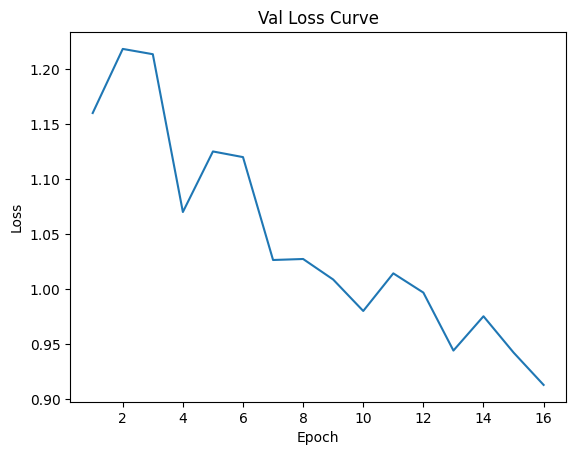

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11996884729999763


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 17/200*****
*****Train Loss:  0.725008 Val Loss:  0.963610*****
*****Validation Accuracy: 31.48%*****
*****Total Avg Disparity: 0.08034907485666208*****

Class Parade: Recall Difference = -0.08366293122390694
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = -0.05547652916073967
Class Dancing: Recall Difference = -0.011904761904761918
Class Funeral: Recall Difference = -0.009644364074743825
Class Cheering: Recall Difference = 0.03571428571428572
Class Meeting: Recall Difference = -0.031730769230769215
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0
Class Concerts: Recall Difference = -0.04224270353302606
Class Couple: Recall Difference = 0.043419267299864325
Class Family_Group: Recall Difference = 0.004209720627631076
Class Picnic: Recall Difference = -0.003496503496503489
Class Soldier_Patrol: Recall Difference = -0.10915032679738546
Class Spa: Recall Difference = -0.08333333333333331
Class Sports_

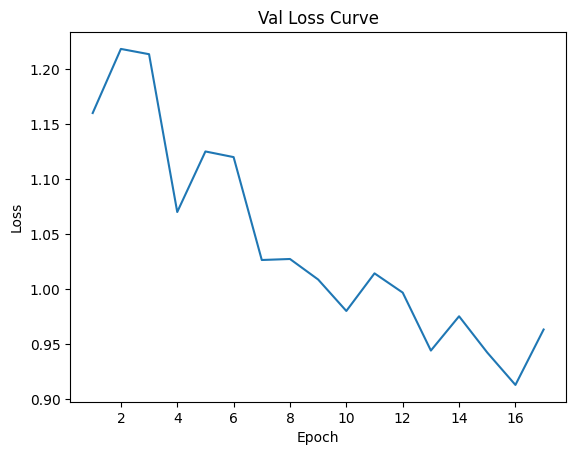

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.12173482947624646


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 18/200*****
*****Train Loss:  0.713226 Val Loss:  0.848003*****
*****Validation Accuracy: 37.04%*****
*****Total Avg Disparity: 0.07274753647661356*****

Class Parade: Recall Difference = -0.018127883981542636
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.009483167377904216
Class Dancing: Recall Difference = 0.04464285714285714
Class Funeral: Recall Difference = 0.11693791440626886
Class Cheering: Recall Difference = -0.007518796992481189
Class Meeting: Recall Difference = -0.021153846153846134
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.012054507337526194
Class Concerts: Recall Difference = -0.03033794162826417
Class Couple: Recall Difference = -0.0027137042062414796
Class Family_Group: Recall Difference = -0.16494450822809043
Class Picnic: Recall Difference = 0.023310023310023298
Class Soldier_Patrol: Recall Difference = 0.054901960784313864
Class Spa: Recall Difference = 0.04166666666666663
Class Sports

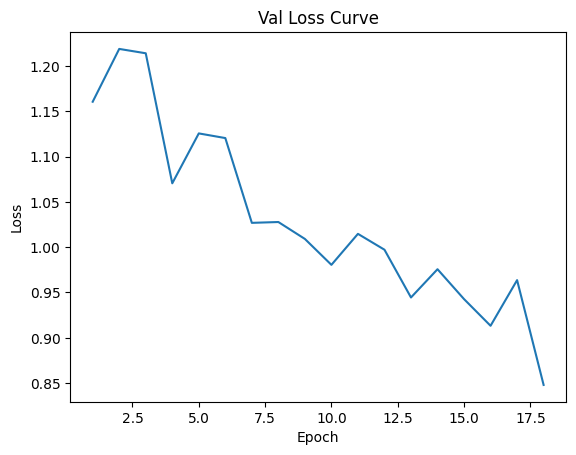

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.12018116936087608


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 19/200*****
*****Train Loss:  0.697824 Val Loss:  0.865658*****
*****Validation Accuracy: 36.43%*****
*****Total Avg Disparity: 0.08251979479321132*****

Class Parade: Recall Difference = -0.13057569764886856
Class Handshaking: Recall Difference = -0.01785714285714285
Class Riot: Recall Difference = -0.07064959696538642
Class Dancing: Recall Difference = -0.05654761904761904
Class Funeral: Recall Difference = 0.04038577456298986
Class Cheering: Recall Difference = 0.017857142857142856
Class Meeting: Recall Difference = -0.09903846153846146
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.028825995807127885
Class Concerts: Recall Difference = -0.11021505376344085
Class Couple: Recall Difference = 0.26865671641791045
Class Family_Group: Recall Difference = -0.02372751626482969
Class Picnic: Recall Difference = 0.06759906759906759
Class Soldier_Patrol: Recall Difference = -0.0235294117647058
Class Spa: Recall Difference = 0.0892857142857143
Clas

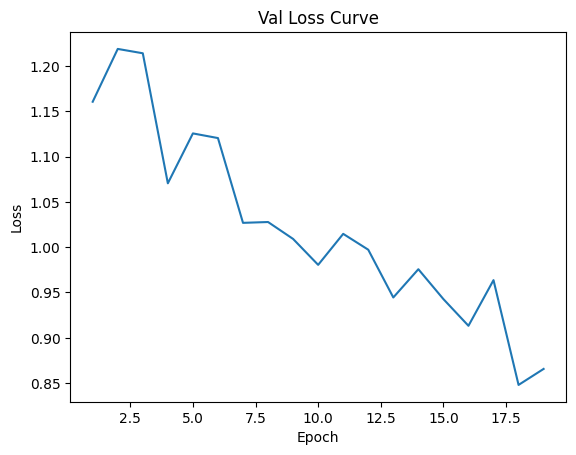

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.1208937898851358


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.26s/it]


*****Epoch 20/200*****
*****Train Loss:  0.692100 Val Loss:  0.839574*****
*****Validation Accuracy: 38.20%*****
*****Total Avg Disparity: 0.08524139602278498*****

Class Parade: Recall Difference = -0.03460777851021768
Class Handshaking: Recall Difference = 0.053571428571428575
Class Riot: Recall Difference = -0.03651019440493125
Class Dancing: Recall Difference = -0.011904761904761918
Class Funeral: Recall Difference = 0.19288728149487647
Class Cheering: Recall Difference = 0.03571428571428572
Class Meeting: Recall Difference = -0.101923076923077
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.049790356394130014
Class Concerts: Recall Difference = -0.06259600614439317
Class Couple: Recall Difference = 0.03934871099050202
Class Family_Group: Recall Difference = -0.03444316877152702
Class Picnic: Recall Difference = 0.13636363636363635
Class Soldier_Patrol: Recall Difference = -0.039215686274509554
Class Spa: Recall Difference = 0.1964285714285715
Clas

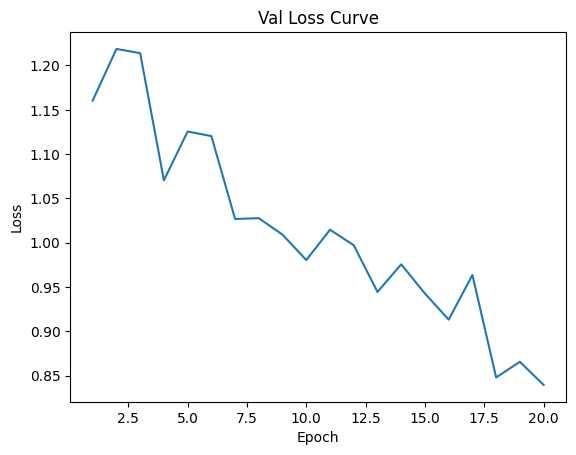

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11954835343819398


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 21/200*****
*****Train Loss:  0.681856 Val Loss:  0.827602*****
*****Validation Accuracy: 38.63%*****
*****Total Avg Disparity: 0.08483439638670072*****

Class Parade: Recall Difference = -0.10365853658536583
Class Handshaking: Recall Difference = 0.03571428571428572
Class Riot: Recall Difference = -0.020388809862494056
Class Dancing: Recall Difference = 0.04761904761904767
Class Funeral: Recall Difference = 0.08740204942736585
Class Cheering: Recall Difference = 0.03571428571428571
Class Meeting: Recall Difference = 0.07211538461538458
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.053459119496855334
Class Concerts: Recall Difference = 0.07526881720430117
Class Couple: Recall Difference = 0.13161465400271377
Class Family_Group: Recall Difference = -0.051856104094910094
Class Picnic: Recall Difference = -0.0174825174825175
Class Soldier_Patrol: Recall Difference = 0.08300653594771257
Class Spa: Recall Difference = 0.33333333333333337
Class

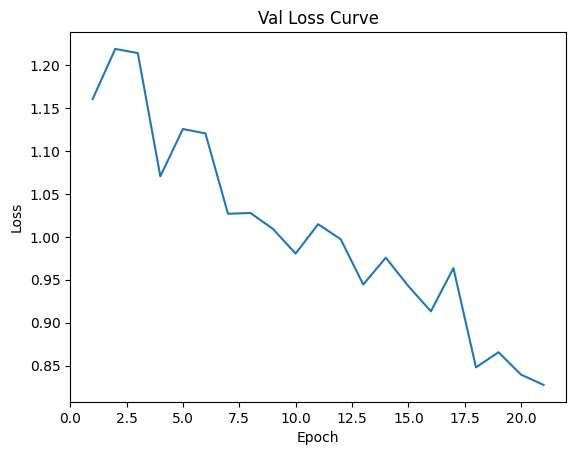

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.11811594321177556


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


*****Epoch 22/200*****
*****Train Loss:  0.670563 Val Loss:  0.961033*****
*****Validation Accuracy: 32.52%*****
*****Total Avg Disparity: 0.07316107470721891*****

Class Parade: Recall Difference = -0.06004174906613935
Class Handshaking: Recall Difference = 0.017857142857142856
Class Riot: Recall Difference = -0.051683262209577974
Class Dancing: Recall Difference = -0.09821428571428568
Class Funeral: Recall Difference = -0.009644364074743825
Class Cheering: Recall Difference = 0.0
Class Meeting: Recall Difference = -0.0798076923076923
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.00890985324947589
Class Concerts: Recall Difference = -0.01843317972350228
Class Couple: Recall Difference = 0.0583446404341927
Class Family_Group: Recall Difference = -0.019517795637198604
Class Picnic: Recall Difference = -0.017482517482517446
Class Soldier_Patrol: Recall Difference = -0.056862745098039014
Class Spa: Recall Difference = 0.23809523809523803
Class Sports_F

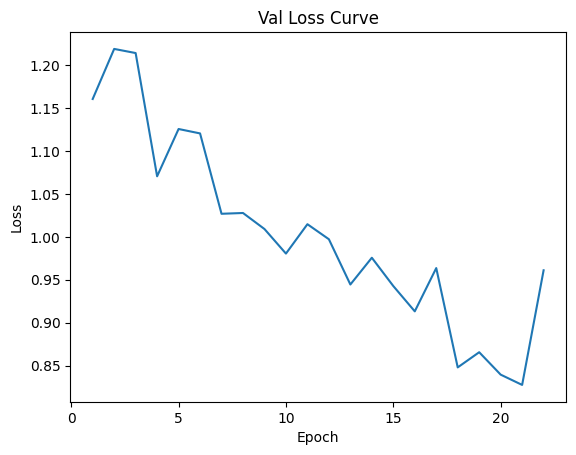

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.12070599742806874


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 23/200*****
*****Train Loss:  0.649475 Val Loss:  0.762028*****
*****Validation Accuracy: 40.86%*****
*****Total Avg Disparity: 0.08181579365361596*****

Class Parade: Recall Difference = -0.05361459019995596
Class Handshaking: Recall Difference = 0.03571428571428572
Class Riot: Recall Difference = -0.07444286391654809
Class Dancing: Recall Difference = -2.7755575615628914e-17
Class Funeral: Recall Difference = 0.1699819168173599
Class Cheering: Recall Difference = -0.008458646616541353
Class Meeting: Recall Difference = 0.009615384615384581
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.07547169811320754
Class Concerts: Recall Difference = 0.07181259600614442
Class Couple: Recall Difference = 0.1492537313432836
Class Family_Group: Recall Difference = 0.023153463451970918
Class Picnic: Recall Difference = -0.011655011655011649
Class Soldier_Patrol: Recall Difference = 0.11176470588235321
Class Spa: Recall Difference = 0.05357142857142856
Cl

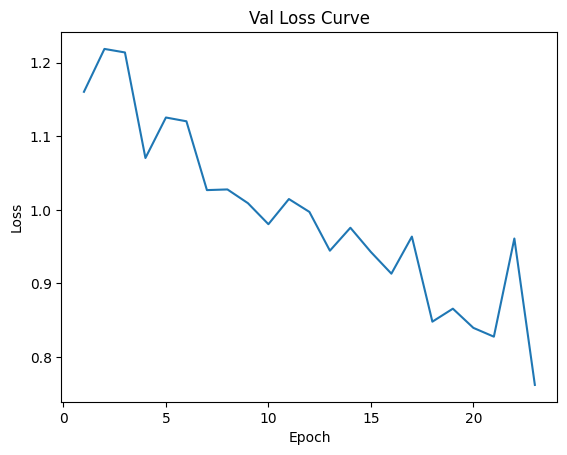

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11917624536615151


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 24/200*****
*****Train Loss:  0.641562 Val Loss:  0.802445*****
*****Validation Accuracy: 39.82%*****
*****Total Avg Disparity: 0.09480472062311918*****

Class Parade: Recall Difference = -0.09953856295319707
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.09340919867235656
Class Dancing: Recall Difference = 0.07440476190476196
Class Funeral: Recall Difference = 0.007836045810729386
Class Cheering: Recall Difference = -0.016917293233082706
Class Meeting: Recall Difference = 0.07115384615384629
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.05870020964360588
Class Concerts: Recall Difference = 0.02112135176651303
Class Couple: Recall Difference = 0.208955223880597
Class Family_Group: Recall Difference = -0.004592422502870258
Class Picnic: Recall Difference = -0.07808857808857805
Class Soldier_Patrol: Recall Difference = 0.15947712418300675
Class Spa: Recall Difference = 0.28571428571428564
Class Sports_Fan: Reca

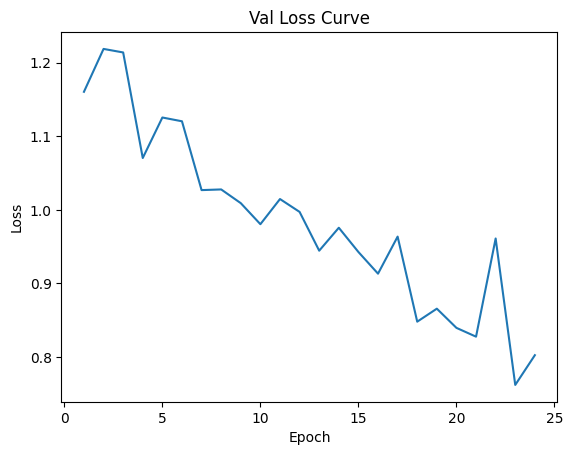

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.1184107492176386


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 25/200*****
*****Train Loss:  0.627491 Val Loss:  0.805191*****
*****Validation Accuracy: 40.17%*****
*****Total Avg Disparity: 0.09436788086875611*****

Class Parade: Recall Difference = -0.03988134475939353
Class Handshaking: Recall Difference = 0.017857142857142856
Class Riot: Recall Difference = -0.014224751066856278
Class Dancing: Recall Difference = 0.12202380952380956
Class Funeral: Recall Difference = -0.05183845690174804
Class Cheering: Recall Difference = 0.009398496240601507
Class Meeting: Recall Difference = 0.1663461538461539
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.09119496855345911
Class Concerts: Recall Difference = 0.021121351766513086
Class Couple: Recall Difference = 0.23880597014925378
Class Family_Group: Recall Difference = 0.05951014159969384
Class Picnic: Recall Difference = -0.0885780885780886
Class Soldier_Patrol: Recall Difference = -0.009150326797385588
Class Spa: Recall Difference = 0.31547619047619047
Cla

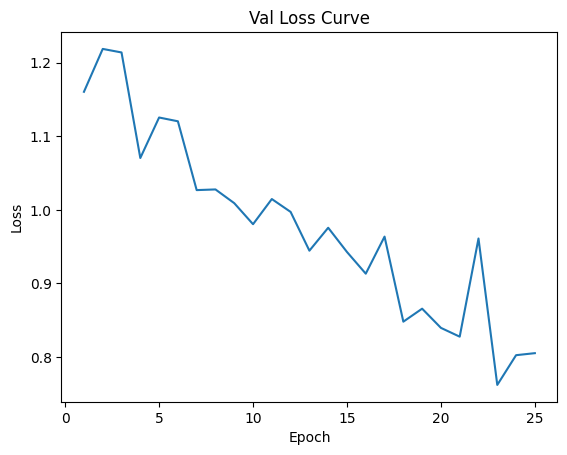

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11819837528925675


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 26/200*****
*****Train Loss:  0.622847 Val Loss:  0.847784*****
*****Validation Accuracy: 39.47%*****
*****Total Avg Disparity: 0.07970578285780543*****

Class Parade: Recall Difference = -0.0209843990331795
Class Handshaking: Recall Difference = 0.03571428571428572
Class Riot: Recall Difference = -0.08961593172119481
Class Dancing: Recall Difference = -0.04166666666666666
Class Funeral: Recall Difference = 0.11995177817962627
Class Cheering: Recall Difference = -0.008458646616541353
Class Meeting: Recall Difference = 0.026923076923076966
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.03878406708595388
Class Concerts: Recall Difference = -0.0775729646697389
Class Couple: Recall Difference = 0.056987788331071904
Class Family_Group: Recall Difference = 0.002104860313815538
Class Picnic: Recall Difference = -0.1247086247086247
Class Soldier_Patrol: Recall Difference = -0.10588235294117632
Class Spa: Recall Difference = -0.07142857142857144
Cla

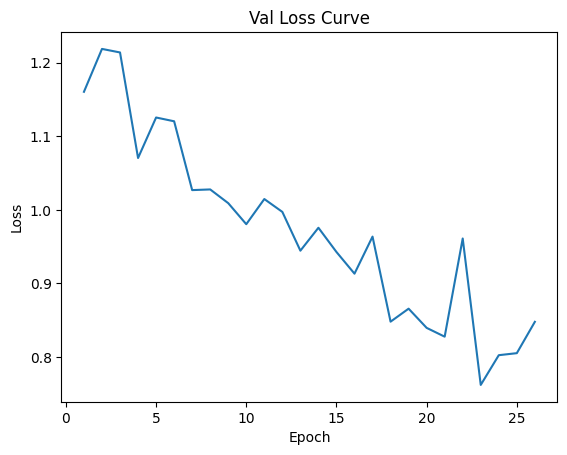

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11809138265939859


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.22s/it]


*****Epoch 27/200*****
*****Train Loss:  0.603731 Val Loss:  0.712203*****
*****Validation Accuracy: 45.15%*****
*****Total Avg Disparity: 0.0905125914340825*****

Class Parade: Recall Difference = -0.025104372665348373
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = -0.012328117591275486
Class Dancing: Recall Difference = 0.10119047619047616
Class Funeral: Recall Difference = 0.2814948764315853
Class Cheering: Recall Difference = 0.0366541353383459
Class Meeting: Recall Difference = -0.1807692307692308
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.01572327044025154
Class Concerts: Recall Difference = -0.023041474654377836
Class Couple: Recall Difference = 0.10176390773405702
Class Family_Group: Recall Difference = -0.16532721010332968
Class Picnic: Recall Difference = 0.11421911421911424
Class Soldier_Patrol: Recall Difference = -0.013725490196078383
Class Spa: Recall Difference = 0.244047619047619
Class Sports_Fan: Recal

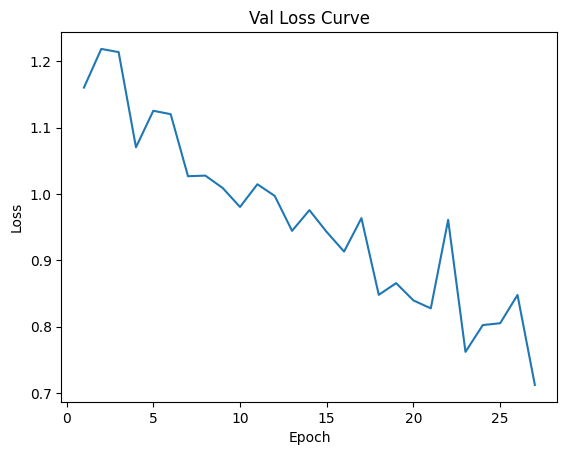

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.35s/it]


Average Adversary epoch loss: 0.11958557481949146


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 28/200*****
*****Train Loss:  0.593972 Val Loss:  0.740883*****
*****Validation Accuracy: 44.34%*****
*****Total Avg Disparity: 0.09691089522075212*****

Class Parade: Recall Difference = -0.1469457262140188
Class Handshaking: Recall Difference = -0.07142857142857145
Class Riot: Recall Difference = 0.03224276908487436
Class Dancing: Recall Difference = 0.06845238095238093
Class Funeral: Recall Difference = 0.20735382760699228
Class Cheering: Recall Difference = 0.0366541353383459
Class Meeting: Recall Difference = 0.008653846153846179
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.013626834381551378
Class Concerts: Recall Difference = 0.02112135176651303
Class Couple: Recall Difference = 0.35820895522388063
Class Family_Group: Recall Difference = 0.007845388442403345
Class Picnic: Recall Difference = -0.08624708624708627
Class Soldier_Patrol: Recall Difference = 0.04967320261437913
Class Spa: Recall Difference = 0.21428571428571425
Class S

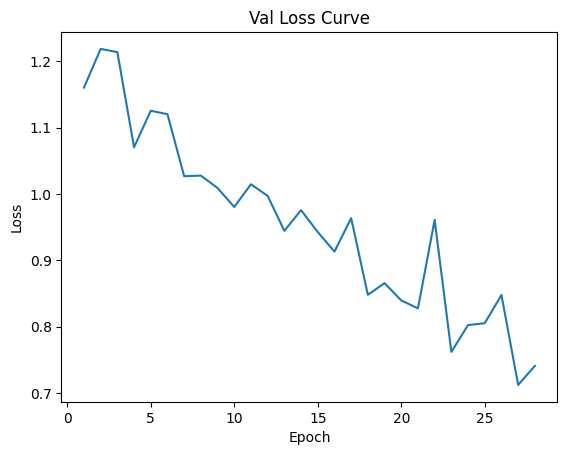

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11869846169765179


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.22s/it]


*****Epoch 29/200*****
*****Train Loss:  0.593425 Val Loss:  0.693118*****
*****Validation Accuracy: 44.69%*****
*****Total Avg Disparity: 0.09043459795929155*****

Class Parade: Recall Difference = -0.004834102395077866
Class Handshaking: Recall Difference = 0.017857142857142856
Class Riot: Recall Difference = 0.03603603603603611
Class Dancing: Recall Difference = 0.023809523809523836
Class Funeral: Recall Difference = 0.06871609403254975
Class Cheering: Recall Difference = 0.00939849624060151
Class Meeting: Recall Difference = 0.13269230769230766
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.08909853249475891
Class Concerts: Recall Difference = -0.013056835637480724
Class Couple: Recall Difference = 0.20895522388059706
Class Family_Group: Recall Difference = -0.04305396096440872
Class Picnic: Recall Difference = -0.03146853146853151
Class Soldier_Patrol: Recall Difference = -0.09019607843137234
Class Spa: Recall Difference = 0.1726

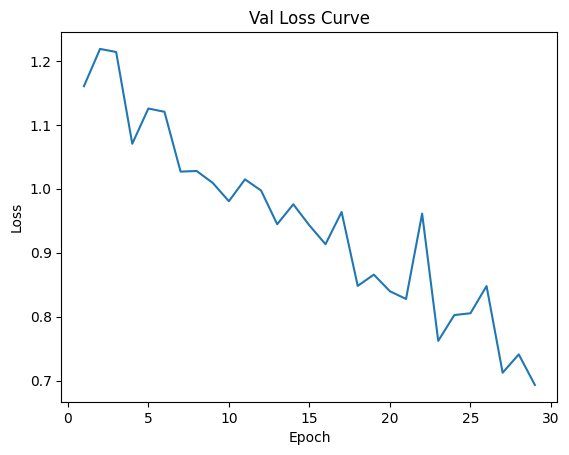

Data has been appended to validation_2.txt
Learning Rate: 0.031153474758375897


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.36s/it]


Average Adversary epoch loss: 0.11955984166035286


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 30/200*****
*****Train Loss:  0.572720 Val Loss:  0.693190*****
*****Validation Accuracy: 45.12%*****
*****Total Avg Disparity: 0.07934688816039193*****

Class Parade: Recall Difference = -0.04411118435508665
Class Handshaking: Recall Difference = 0.01785714285714286
Class Riot: Recall Difference = 0.041725936462778584
Class Dancing: Recall Difference = 0.038690476190476206
Class Funeral: Recall Difference = 0.13261000602772757
Class Cheering: Recall Difference = -0.04323308270676691
Class Meeting: Recall Difference = 0.18365384615384617
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.0010482180293501023
Class Concerts: Recall Difference = -0.00652841781874039
Class Couple: Recall Difference = -0.0013568521031207398
Class Family_Group: Recall Difference = -0.08572522005357823
Class Picnic: Recall Difference = 0.09440559440559437
Class Soldier_Patrol: Recall Difference = -0.12156862745098046
Class Spa: Recall Difference = -0.03571428571428575

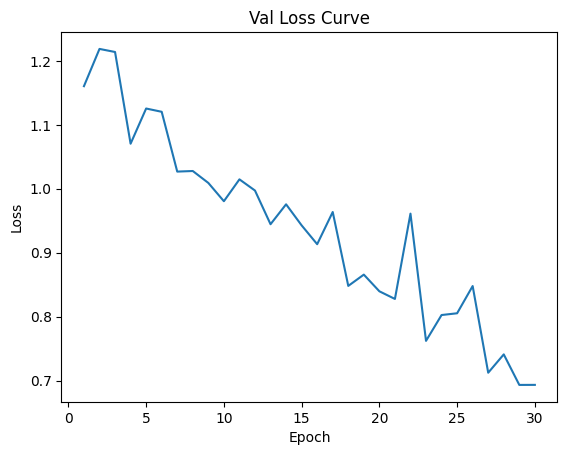

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.1183651307454476


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 31/200*****
*****Train Loss:  0.537369 Val Loss:  0.554862*****
*****Validation Accuracy: 55.08%*****
*****Total Avg Disparity: 0.10017161834315207*****

Class Parade: Recall Difference = -0.05910788837618097
Class Handshaking: Recall Difference = -0.16071428571428567
Class Riot: Recall Difference = -0.0018966334755808334
Class Dancing: Recall Difference = 0.09226190476190477
Class Funeral: Recall Difference = 0.2429174201326102
Class Cheering: Recall Difference = 0.07236842105263161
Class Meeting: Recall Difference = 0.03653846153846174
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = 0.00524109014675056
Class Concerts: Recall Difference = 0.029569892473118475
Class Couple: Recall Difference = 0.17503392130257805
Class Family_Group: Recall Difference = -0.07979334098737095
Class Picnic: Recall Difference = 0.023310023310023298
Class Soldier_Patrol: Recall Difference = -0.03464052287581687
Class Spa: Recall Difference = 0.13095238095238093
Clas

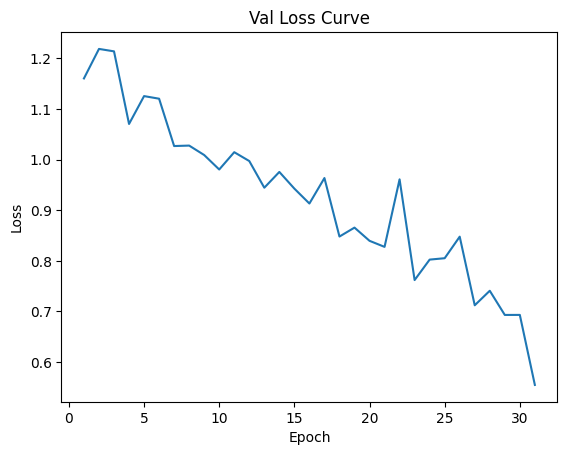

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11717086027447994


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 32/200*****
*****Train Loss:  0.517742 Val Loss:  0.548798*****
*****Validation Accuracy: 55.55%*****
*****Total Avg Disparity: 0.09783398673289256*****

Class Parade: Recall Difference = -0.048231157987255524
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = 0.08866761498340453
Class Dancing: Recall Difference = 0.11309523809523805
Class Funeral: Recall Difference = 0.2742616033755275
Class Cheering: Recall Difference = 0.03665413533834588
Class Meeting: Recall Difference = 0.08269230769230784
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.013626834381551378
Class Concerts: Recall Difference = -0.03149001536098295
Class Couple: Recall Difference = 0.29579375848032563
Class Family_Group: Recall Difference = -0.017795637198622316
Class Picnic: Recall Difference = 0.03146853146853146
Class Soldier_Patrol: Recall Difference = -0.056862745098039125
Class Spa: Recall Difference = 0.22619

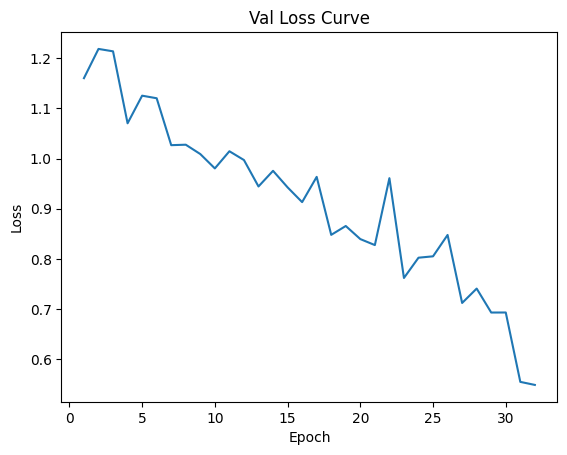

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1168366249364156


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 33/200*****
*****Train Loss:  0.511906 Val Loss:  0.540749*****
*****Validation Accuracy: 56.01%*****
*****Total Avg Disparity: 0.0817174506015005*****

Class Parade: Recall Difference = -0.04010107668644247
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = 0.052157420578473224
Class Dancing: Recall Difference = 0.08928571428571425
Class Funeral: Recall Difference = 0.20494273658830625
Class Cheering: Recall Difference = 0.019736842105263178
Class Meeting: Recall Difference = -0.010576923076922817
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.061320754716981146
Class Concerts: Recall Difference = 0.06182795698924737
Class Couple: Recall Difference = 0.1465400271370421
Class Family_Group: Recall Difference = -0.009184845005740516
Class Picnic: Recall Difference = -0.006993006993006978
Class Soldier_Patrol: Recall Difference = -0.04575163398692794
Class Spa: Recall Difference = -0.01

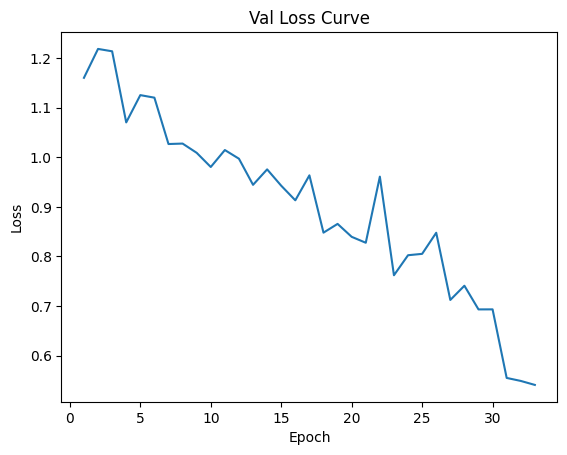

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.1172713588636655


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 34/200*****
*****Train Loss:  0.502837 Val Loss:  0.527209*****
*****Validation Accuracy: 56.96%*****
*****Total Avg Disparity: 0.07685466812533201*****

Class Parade: Recall Difference = -0.019940672379696878
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = 0.06970128022759592
Class Dancing: Recall Difference = 0.0714285714285714
Class Funeral: Recall Difference = 0.24291742013261008
Class Cheering: Recall Difference = 0.01973684210526319
Class Meeting: Recall Difference = -0.04134615384615359
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.03249475890985329
Class Concerts: Recall Difference = -0.019585253456221197
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.0028702640642938593
Class Picnic: Recall Difference = -0.053613053613053685
Class Soldier_Patrol: Recall Difference = -0.03464052287581687
Class Spa: Recall Difference = 0.07

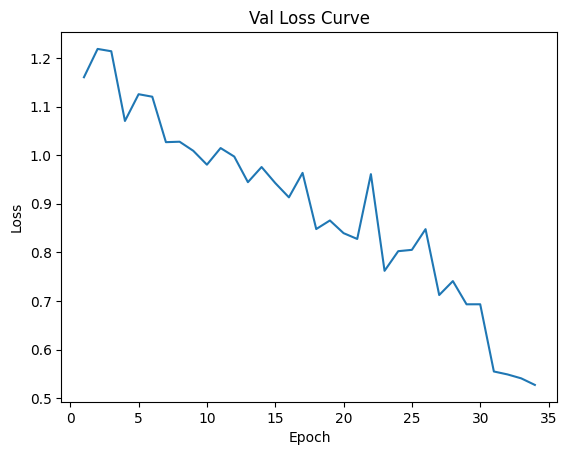

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.1173769490650067


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 35/200*****
*****Train Loss:  0.500309 Val Loss:  0.525308*****
*****Validation Accuracy: 57.40%*****
*****Total Avg Disparity: 0.09579627714229967*****

Class Parade: Recall Difference = -0.04295759173807956
Class Handshaking: Recall Difference = 0.0
Class Riot: Recall Difference = 0.11427216690374592
Class Dancing: Recall Difference = 0.16369047619047616
Class Funeral: Recall Difference = 0.3062085593731163
Class Cheering: Recall Difference = 0.05451127819548873
Class Meeting: Recall Difference = -0.07307692307692304
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.03249475890985323
Class Concerts: Recall Difference = -0.004224270353302528
Class Couple: Recall Difference = 0.2062415196743555
Class Family_Group: Recall Difference = 0.009950248756218971
Class Picnic: Recall Difference = -0.07575757575757575
Class Soldier_Patrol: Recall Difference = -0.10457516339869266
Class Spa: Recall Difference = 0.00595238095238082
Class 

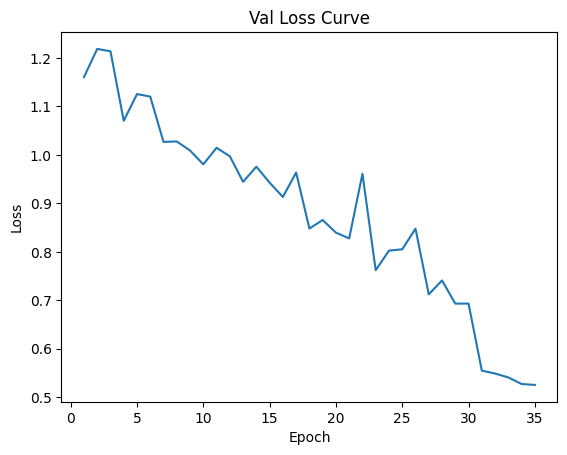

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11616148570409188


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.15s/it]


*****Epoch 36/200*****
*****Train Loss:  0.497052 Val Loss:  0.522000*****
*****Validation Accuracy: 56.82%*****
*****Total Avg Disparity: 0.09979910536163672*****

Class Parade: Recall Difference = -0.022687321467809385
Class Handshaking: Recall Difference = -0.16071428571428567
Class Riot: Recall Difference = -0.02892366050260775
Class Dancing: Recall Difference = 0.11011904761904767
Class Funeral: Recall Difference = 0.29355033152501514
Class Cheering: Recall Difference = 0.01973684210526319
Class Meeting: Recall Difference = 0.05192307692307718
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.013626834381551378
Class Concerts: Recall Difference = -0.05529953917050684
Class Couple: Recall Difference = 0.22116689280868387
Class Family_Group: Recall Difference = 0.03980099502487572
Class Picnic: Recall Difference = -0.04545454545454536
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.029761904761904545
Cl

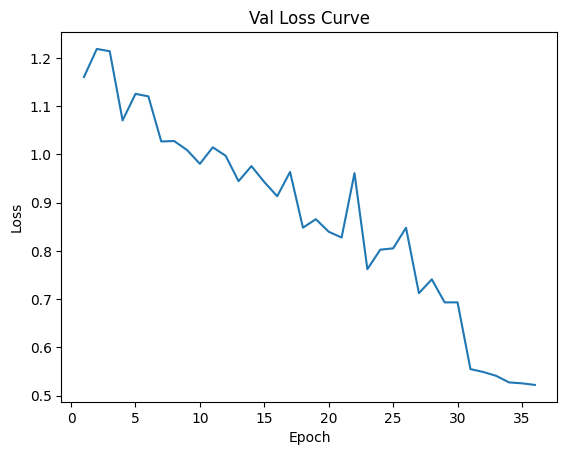

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.1161986360183129


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 37/200*****
*****Train Loss:  0.490388 Val Loss:  0.512273*****
*****Validation Accuracy: 57.49%*****
*****Total Avg Disparity: 0.08342045590044503*****

Class Parade: Recall Difference = -0.03894748406943538
Class Handshaking: Recall Difference = 1.3877787807814457e-17
Class Riot: Recall Difference = 0.06970128022759597
Class Dancing: Recall Difference = 0.18452380952380956
Class Funeral: Recall Difference = 0.22362869198312246
Class Cheering: Recall Difference = 0.010338345864661647
Class Meeting: Recall Difference = -0.08846153846153826
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.013626834381551323
Class Concerts: Recall Difference = -0.048387096774193394
Class Couple: Recall Difference = 0.13025780189959307
Class Family_Group: Recall Difference = 0.020665901262916286
Class Picnic: Recall Difference = 0.04778554778554778
Class Soldier_Patrol: Recall Difference = -0.04901960784313697
Class Spa: Recall Difference = 0.10119047619047605


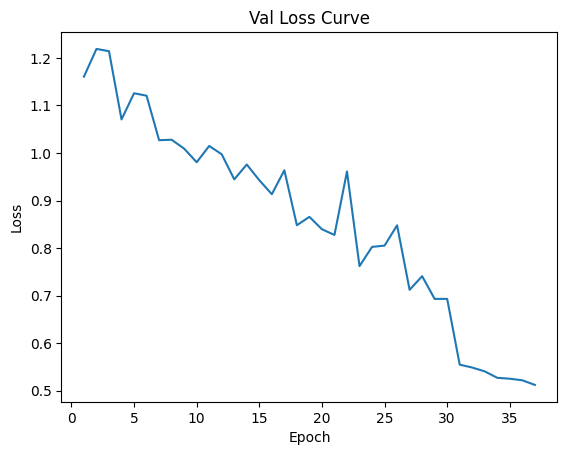

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11617514233176525


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 38/200*****
*****Train Loss:  0.489600 Val Loss:  0.512601*****
*****Validation Accuracy: 57.28%*****
*****Total Avg Disparity: 0.08212880414209286*****

Class Parade: Recall Difference = -0.044330916282135924
Class Handshaking: Recall Difference = -0.07142857142857144
Class Riot: Recall Difference = 0.014224751066856278
Class Dancing: Recall Difference = 0.16964285714285715
Class Funeral: Recall Difference = 0.17299578059071735
Class Cheering: Recall Difference = 0.04605263157894737
Class Meeting: Recall Difference = 0.0673076923076924
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.04245283018867921
Class Concerts: Recall Difference = -0.03993855606758823
Class Couple: Recall Difference = 0.17639077340569884
Class Family_Group: Recall Difference = -0.03903559127439726
Class Picnic: Recall Difference = 0.009324009324009341
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.07738095238095233
Clas

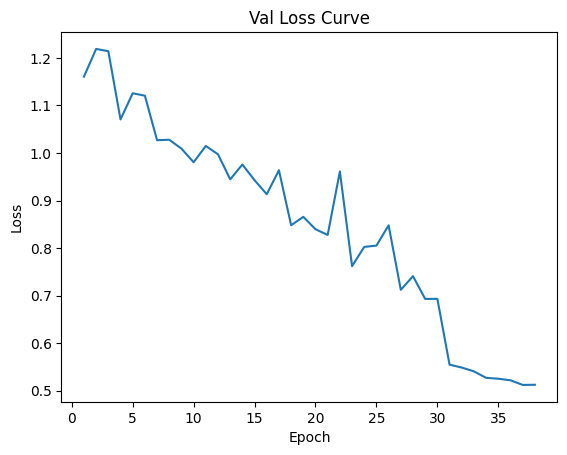

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11687991624841323


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 39/200*****
*****Train Loss:  0.493601 Val Loss:  0.508731*****
*****Validation Accuracy: 57.86%*****
*****Total Avg Disparity: 0.0828381294756715*****

Class Parade: Recall Difference = 0.008459679191386682
Class Handshaking: Recall Difference = -0.0714285714285714
Class Riot: Recall Difference = 0.007586533902323334
Class Dancing: Recall Difference = 0.14880952380952384
Class Funeral: Recall Difference = 0.25256178420735387
Class Cheering: Recall Difference = 0.03759398496240601
Class Meeting: Recall Difference = -0.010576923076922928
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.004192872117400437
Class Concerts: Recall Difference = -0.06029185867895548
Class Couple: Recall Difference = 0.20624151967435553
Class Family_Group: Recall Difference = -0.03482587064676618
Class Picnic: Recall Difference = 0.07808857808857816
Class Soldier_Patrol: Recall Difference = -0.056862745098039236
Class Spa: Recall Difference = 0.029761

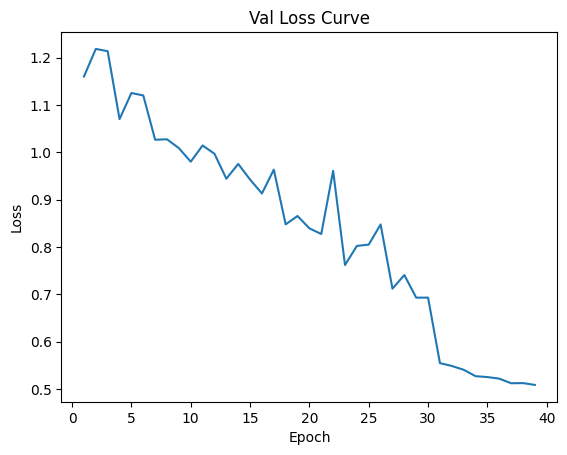

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.11620495611658463


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 40/200*****
*****Train Loss:  0.489259 Val Loss:  0.502862*****
*****Validation Accuracy: 57.92%*****
*****Total Avg Disparity: 0.07864284035665849*****

Class Parade: Recall Difference = -0.011920457042408517
Class Handshaking: Recall Difference = 0.017857142857142863
Class Riot: Recall Difference = -0.03840682788051214
Class Dancing: Recall Difference = 0.13095238095238101
Class Funeral: Recall Difference = 0.24291742013261014
Class Cheering: Recall Difference = 0.07236842105263158
Class Meeting: Recall Difference = -0.12019230769230749
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.004716981132075443
Class Concerts: Recall Difference = 0.01612903225806467
Class Couple: Recall Difference = 0.18995929443690646
Class Family_Group: Recall Difference = -0.02200535782625329
Class Picnic: Recall Difference = -0.045454545454545414
Class Soldier_Patrol: Recall Difference = -0.07124183006535922
Class Spa: Recall Difference = 0.029

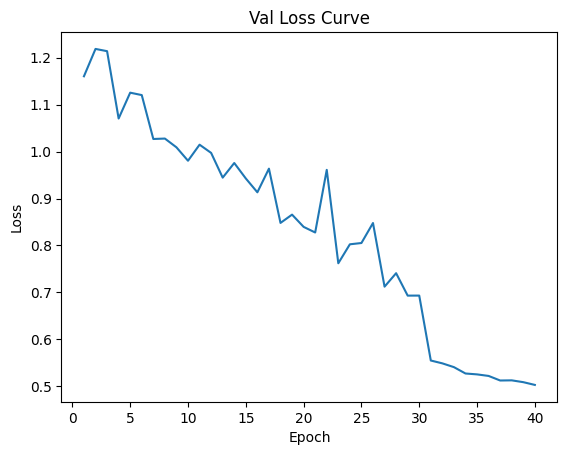

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11582746012852742


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 41/200*****
*****Train Loss:  0.484748 Val Loss:  0.498404*****
*****Validation Accuracy: 58.15%*****
*****Total Avg Disparity: 0.0920666318754812*****

Class Parade: Recall Difference = -0.06998461876510664
Class Handshaking: Recall Difference = -0.0357142857142857
Class Riot: Recall Difference = -0.12754860123281175
Class Dancing: Recall Difference = 0.22619047619047625
Class Funeral: Recall Difference = 0.23025919228450878
Class Cheering: Recall Difference = 0.038533834586466226
Class Meeting: Recall Difference = -0.04230769230769227
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.004716981132075498
Class Concerts: Recall Difference = -0.07565284178187393
Class Couple: Recall Difference = 0.26594301221166894
Class Family_Group: Recall Difference = -0.10103329506314579
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = 0.009803921568627416
Class Spa: Recall Difference = 0.029761

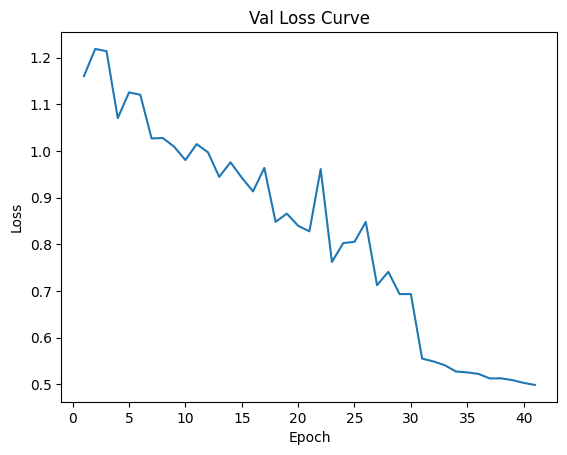

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11669459193944931


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 42/200*****
*****Train Loss:  0.479801 Val Loss:  0.494383*****
*****Validation Accuracy: 59.37%*****
*****Total Avg Disparity: 0.09563341297857585*****

Class Parade: Recall Difference = -0.029444078224566184
Class Handshaking: Recall Difference = 0.017857142857142877
Class Riot: Recall Difference = 0.10478899952584164
Class Dancing: Recall Difference = 0.12797619047619052
Class Funeral: Recall Difference = 0.26160337552742635
Class Cheering: Recall Difference = 0.05545112781954889
Class Meeting: Recall Difference = -0.15096153846153826
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.013626834381551323
Class Concerts: Recall Difference = -0.03648233486943153
Class Couple: Recall Difference = 0.2048846675712347
Class Family_Group: Recall Difference = -0.04783773440489858
Class Picnic: Recall Difference = 0.1853146853146853
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.1249999

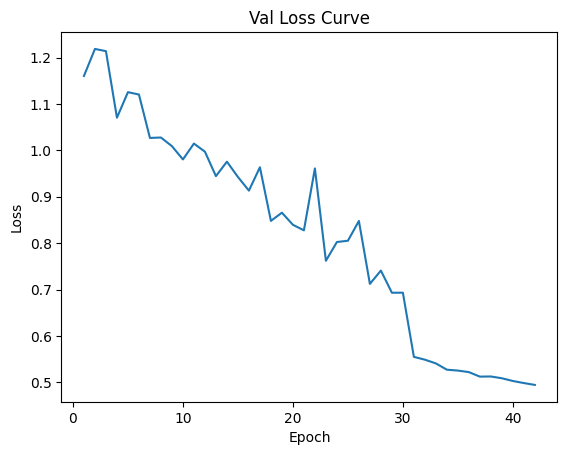

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.116687904470242


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 43/200*****
*****Train Loss:  0.476310 Val Loss:  0.493379*****
*****Validation Accuracy: 58.73%*****
*****Total Avg Disparity: 0.08384317734203799*****

Class Parade: Recall Difference = -0.056361239288068576
Class Handshaking: Recall Difference = -0.07142857142857141
Class Riot: Recall Difference = -0.028923660502607806
Class Dancing: Recall Difference = 0.14583333333333331
Class Funeral: Recall Difference = 0.18264014466546113
Class Cheering: Recall Difference = 0.10056390977443608
Class Meeting: Recall Difference = 0.0038461538461540545
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.013626834381551378
Class Concerts: Recall Difference = -0.004224270353302528
Class Couple: Recall Difference = 0.1899592944369065
Class Family_Group: Recall Difference = -0.037122081898201265
Class Picnic: Recall Difference = 0.03146853146853157
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1

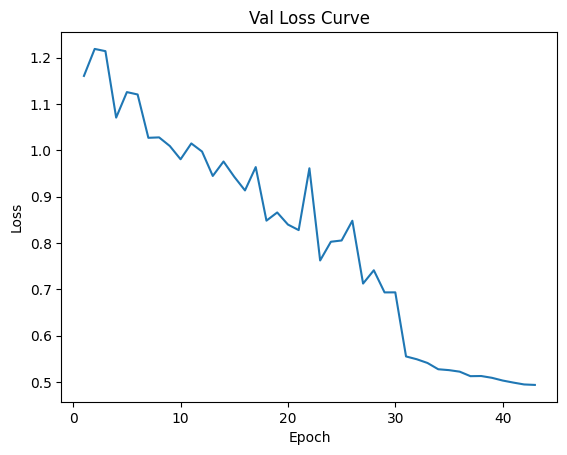

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11627241883140343


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 44/200*****
*****Train Loss:  0.477186 Val Loss:  0.491720*****
*****Validation Accuracy: 59.14%*****
*****Total Avg Disparity: 0.08728703046520517*****

Class Parade: Recall Difference = -0.044330916282135924
Class Handshaking: Recall Difference = 0.01785714285714285
Class Riot: Recall Difference = 0.10621147463252717
Class Dancing: Recall Difference = 0.12499999999999989
Class Funeral: Recall Difference = 0.17600964436407474
Class Cheering: Recall Difference = 0.0460526315789474
Class Meeting: Recall Difference = -0.04230769230769216
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.024109014675052443
Class Concerts: Recall Difference = -0.028033794162826253
Class Couple: Recall Difference = 0.2048846675712347
Class Family_Group: Recall Difference = -0.020091848450057348
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.06013071895424815
Class Spa: Recall Difference = 0.10714285

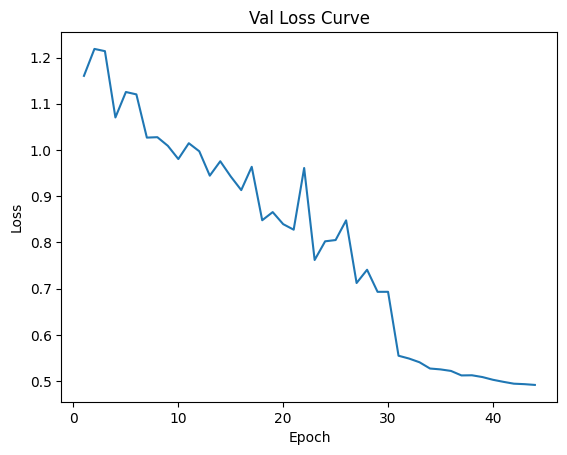

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.21s/it]


Average Adversary epoch loss: 0.11633628635452344


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 45/200*****
*****Train Loss:  0.469579 Val Loss:  0.477924*****
*****Validation Accuracy: 59.11%*****
*****Total Avg Disparity: 0.08192000638219049*****

Class Parade: Recall Difference = -0.007800483410239756
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = 0.009009009009009028
Class Dancing: Recall Difference = 0.16369047619047622
Class Funeral: Recall Difference = 0.16033755274261602
Class Cheering: Recall Difference = 0.02067669172932335
Class Meeting: Recall Difference = -0.05769230769230749
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.04245283018867918
Class Concerts: Recall Difference = -0.06374807987711217
Class Couple: Recall Difference = 0.2510176390773406
Class Family_Group: Recall Difference = -0.043436662839647866
Class Picnic: Recall Difference = 0.0011655011655012926
Class Soldier_Patrol: Recall Difference = -0.023529411764705688
Class Spa: Recall Difference = -0.0

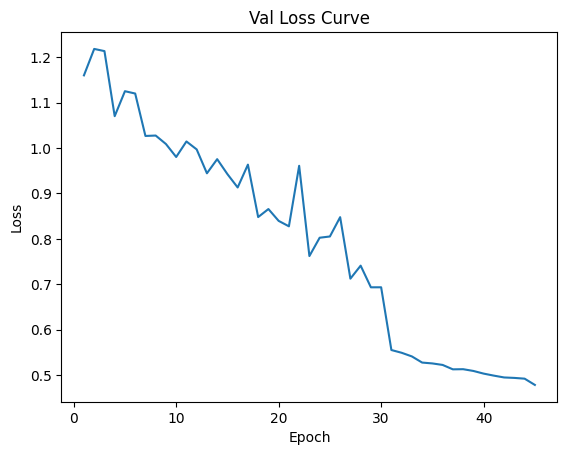

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11707455607560965


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 46/200*****
*****Train Loss:  0.473028 Val Loss:  0.476024*****
*****Validation Accuracy: 60.15%*****
*****Total Avg Disparity: 0.0841198567959544*****

Class Parade: Recall Difference = -0.051087673038892834
Class Handshaking: Recall Difference = 0.017857142857142905
Class Riot: Recall Difference = 0.006164058795637861
Class Dancing: Recall Difference = 0.13690476190476192
Class Funeral: Recall Difference = 0.16335141651597362
Class Cheering: Recall Difference = 0.09116541353383464
Class Meeting: Recall Difference = -0.0576923076923076
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.03249475890985329
Class Concerts: Recall Difference = -0.03648233486943142
Class Couple: Recall Difference = 0.2048846675712347
Class Family_Group: Recall Difference = -0.04343666283964781
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.15476190

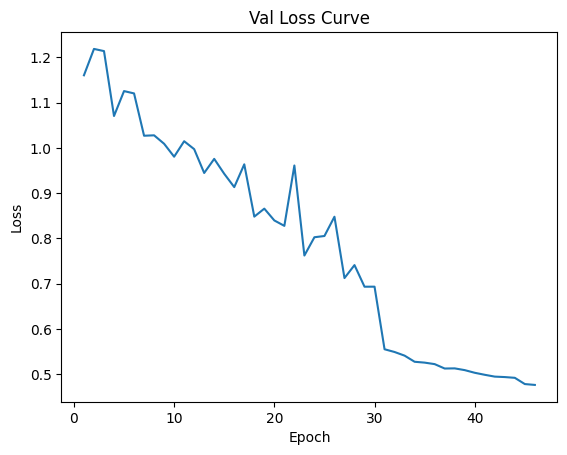

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11615411650675994


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 47/200*****
*****Train Loss:  0.471234 Val Loss:  0.480962*****
*****Validation Accuracy: 58.79%*****
*****Total Avg Disparity: 0.1032833839150951*****

Class Parade: Recall Difference = -0.07948802460997584
Class Handshaking: Recall Difference = -0.1964285714285714
Class Riot: Recall Difference = -0.11948790896159317
Class Dancing: Recall Difference = 0.1904761904761905
Class Funeral: Recall Difference = 0.22061482820976497
Class Cheering: Recall Difference = 0.06484962406015041
Class Meeting: Recall Difference = 0.03557692307692317
Class Stock_Market: Recall Difference = 0.0
Class Ceremony: Recall Difference = -0.07023060796645703
Class Concerts: Recall Difference = -0.11136712749615962
Class Couple: Recall Difference = 0.22116689280868393
Class Family_Group: Recall Difference = -0.11595866819747414
Class Picnic: Recall Difference = -0.08974358974358965
Class Soldier_Patrol: Recall Difference = 0.054248366013072036
Class Spa: Recall Difference = 0.029761904761904767
Class 

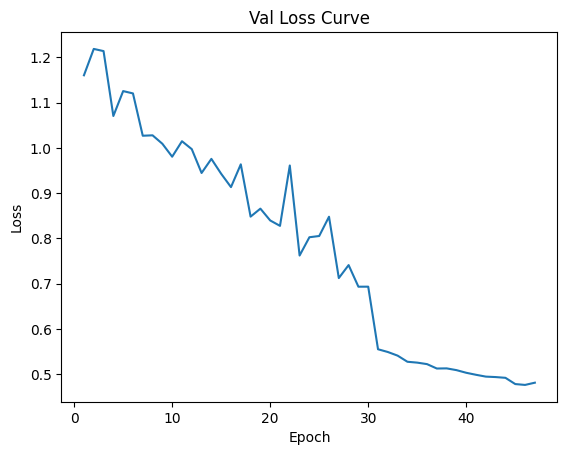

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11600746042453326


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


*****Epoch 48/200*****
*****Train Loss:  0.469121 Val Loss:  0.468418*****
*****Validation Accuracy: 60.53%*****
*****Total Avg Disparity: 0.07424372020251448*****

Class Parade: Recall Difference = -0.011920457042408406
Class Handshaking: Recall Difference = 1.3877787807814457e-17
Class Riot: Recall Difference = -0.03840682788051214
Class Dancing: Recall Difference = 0.21726190476190477
Class Funeral: Recall Difference = 0.1506931886678723
Class Cheering: Recall Difference = 0.011278195488721832
Class Meeting: Recall Difference = -0.010576923076922817
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.00524109014675056
Class Concerts: Recall Difference = -0.03648233486943131
Class Couple: Recall Difference = 0.1899592944369064
Class Family_Group: Recall Difference = -0.06046689628779184
Class Picnic: Recall Difference = 0.0174825174825175
Class Soldier_Patrol: Recall Difference = -0.0379084967320259
Class Spa: Recall Difference = 0.029761

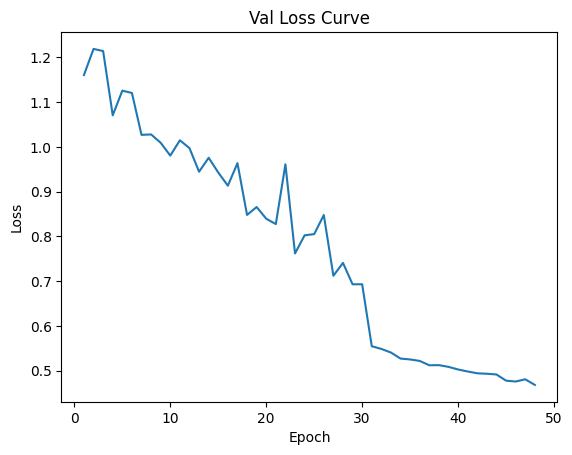

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11613466733923325


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 49/200*****
*****Train Loss:  0.463712 Val Loss:  0.461889*****
*****Validation Accuracy: 60.70%*****
*****Total Avg Disparity: 0.07196328084659206*****

Class Parade: Recall Difference = -0.024060646011865527
Class Handshaking: Recall Difference = 0.01785714285714289
Class Riot: Recall Difference = 0.03176861071597914
Class Dancing: Recall Difference = 0.181547619047619
Class Funeral: Recall Difference = 0.21097046413502124
Class Cheering: Recall Difference = 0.002819548872180444
Class Meeting: Recall Difference = 0.035576923076923284
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.039938556067588116
Class Couple: Recall Difference = 0.1913161465400271
Class Family_Group: Recall Difference = -0.06046689628779184
Class Picnic: Recall Difference = -0.020979020979021046
Class Soldier_Patrol: Recall Difference = -0.04901960784313697
Class Spa: Recall Difference = -0.01785

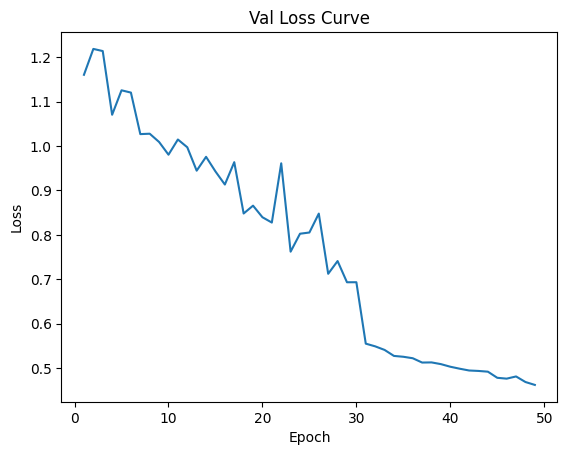

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11635150817724374


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 50/200*****
*****Train Loss:  0.461721 Val Loss:  0.463489*****
*****Validation Accuracy: 60.27%*****
*****Total Avg Disparity: 0.07634664052889534*****

Class Parade: Recall Difference = -0.01730388925510884
Class Handshaking: Recall Difference = -0.12499999999999997
Class Riot: Recall Difference = 0.014224751066856445
Class Dancing: Recall Difference = 0.18749999999999994
Class Funeral: Recall Difference = 0.2079566003616638
Class Cheering: Recall Difference = 0.038533834586466226
Class Meeting: Recall Difference = -0.011538461538461275
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = -0.013626834381551323
Class Concerts: Recall Difference = -0.0806451612903224
Class Couple: Recall Difference = 0.17503392130257805
Class Family_Group: Recall Difference = -0.06257175660160735
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = 0.0209150326797386
Class Spa: Recall Difference = 0.0059523

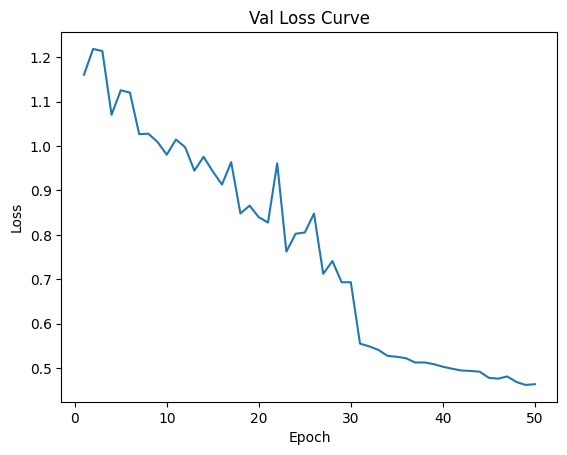

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11633399988596256


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 51/200*****
*****Train Loss:  0.459646 Val Loss:  0.456536*****
*****Validation Accuracy: 61.66%*****
*****Total Avg Disparity: 0.08199974072165986*****

Class Parade: Recall Difference = 0.004339705559217588
Class Handshaking: Recall Difference = -0.035714285714285685
Class Riot: Recall Difference = 0.004741583688952056
Class Dancing: Recall Difference = 0.16071428571428575
Class Funeral: Recall Difference = 0.10608800482218206
Class Cheering: Recall Difference = 0.10056390977443616
Class Meeting: Recall Difference = -0.0740384615384615
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.014150943396226467
Class Concerts: Recall Difference = -0.05683563748079856
Class Couple: Recall Difference = 0.22116689280868387
Class Family_Group: Recall Difference = -0.0711825487944891
Class Picnic: Recall Difference = 0.0699300699300699
Class Soldier_Patrol: Recall Difference = -0.04901960784313697
Class Spa: Recall Difference = 0.13095238

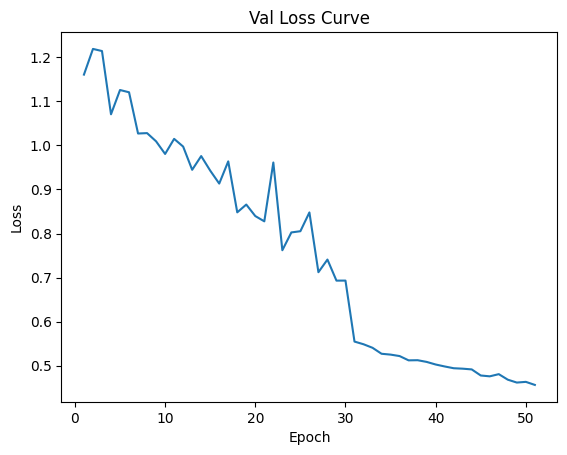

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11619853629515721


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 52/200*****
*****Train Loss:  0.454476 Val Loss:  0.454616*****
*****Validation Accuracy: 61.11%*****
*****Total Avg Disparity: 0.07942736274100674*****

Class Parade: Recall Difference = -0.018677213799165204
Class Handshaking: Recall Difference = -0.07142857142857138
Class Riot: Recall Difference = 0.01706970128022761
Class Dancing: Recall Difference = 0.1428571428571428
Class Funeral: Recall Difference = 0.16033755274261602
Class Cheering: Recall Difference = 0.10996240601503765
Class Meeting: Recall Difference = 0.004807692307692402
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.052935010482180356
Class Concerts: Recall Difference = -0.048387096774193505
Class Couple: Recall Difference = 0.1601085481682497
Class Family_Group: Recall Difference = -0.01148105625717566
Class Picnic: Recall Difference = 0.10839160839160844
Class Soldier_Patrol: Recall Difference = -0.0235294117647058
Class Spa: Recall Difference = 0.02976190

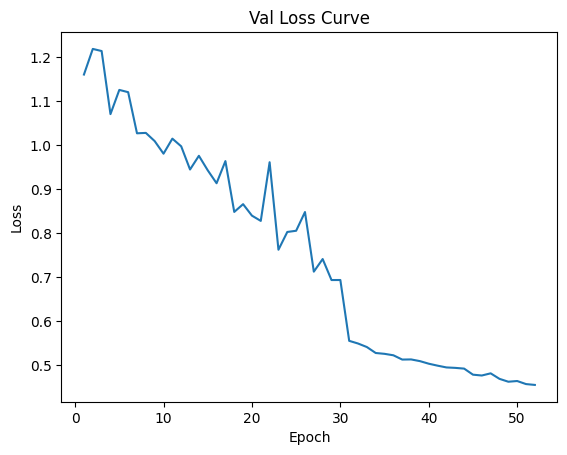

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11640647483559755


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 53/200*****
*****Train Loss:  0.447908 Val Loss:  0.457681*****
*****Validation Accuracy: 60.82%*****
*****Total Avg Disparity: 0.07670991977052581*****

Class Parade: Recall Difference = 0.011096462315974387
Class Handshaking: Recall Difference = -0.05357142857142852
Class Riot: Recall Difference = 0.05357989568515881
Class Dancing: Recall Difference = 0.18154761904761904
Class Funeral: Recall Difference = 0.20132610006027735
Class Cheering: Recall Difference = 0.1090225563909775
Class Meeting: Recall Difference = 0.03557692307692317
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.024109014675052387
Class Concerts: Recall Difference = -0.02457757296466967
Class Couple: Recall Difference = 0.23609226594301227
Class Family_Group: Recall Difference = -0.02219670876387292
Class Picnic: Recall Difference = 0.10839160839160833
Class Soldier_Patrol: Recall Difference = -0.0013071895424836555
Class Spa: Recall Difference = -0.017857

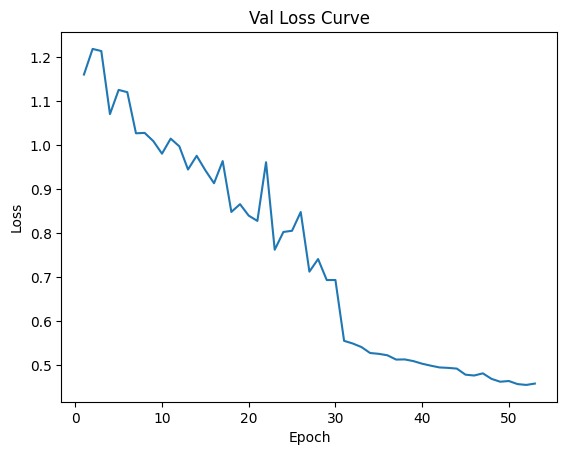

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.1165809384905375


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 54/200*****
*****Train Loss:  0.450236 Val Loss:  0.442145*****
*****Validation Accuracy: 61.98%*****
*****Total Avg Disparity: 0.0904761664570834*****

Class Parade: Recall Difference = -0.037574159525379125
Class Handshaking: Recall Difference = -0.14285714285714277
Class Riot: Recall Difference = -0.10194404931247036
Class Dancing: Recall Difference = 0.125
Class Funeral: Recall Difference = 0.13803496081977107
Class Cheering: Recall Difference = 0.012218045112781989
Class Meeting: Recall Difference = 0.19134615384615394
Class Stock_Market: Recall Difference = 0.033333333333333326
Class Ceremony: Recall Difference = -0.05136268343815514
Class Concerts: Recall Difference = -0.12480798771121349
Class Couple: Recall Difference = 0.3107191316146539
Class Family_Group: Recall Difference = -0.03061615001913509
Class Picnic: Recall Difference = 0.00932400932400923
Class Soldier_Patrol: Recall Difference = -0.04901960784313697
Class Spa: Recall Difference = 0.1071428571428571
Cla

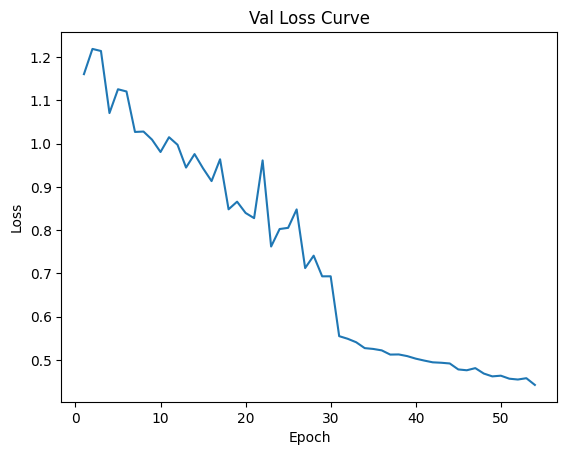

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11707094598274964


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 55/200*****
*****Train Loss:  0.446322 Val Loss:  0.441242*****
*****Validation Accuracy: 61.80%*****
*****Total Avg Disparity: 0.07886042249593503*****

Class Parade: Recall Difference = -0.010547132498352041
Class Handshaking: Recall Difference = -0.17857142857142855
Class Riot: Recall Difference = -0.10194404931247047
Class Dancing: Recall Difference = 0.19047619047619052
Class Funeral: Recall Difference = 0.24894514767932502
Class Cheering: Recall Difference = 0.047932330827067715
Class Meeting: Recall Difference = -0.026923076923076827
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.05136268343815514
Class Concerts: Recall Difference = 0.01958525345622142
Class Couple: Recall Difference = 0.1451831750339213
Class Family_Group: Recall Difference = -0.07328740910830461
Class Picnic: Recall Difference = 0.0174825174825175
Class Soldier_Patrol: Recall Difference = -0.07124183006535945
Class Spa: Recall Difference = 0.029761

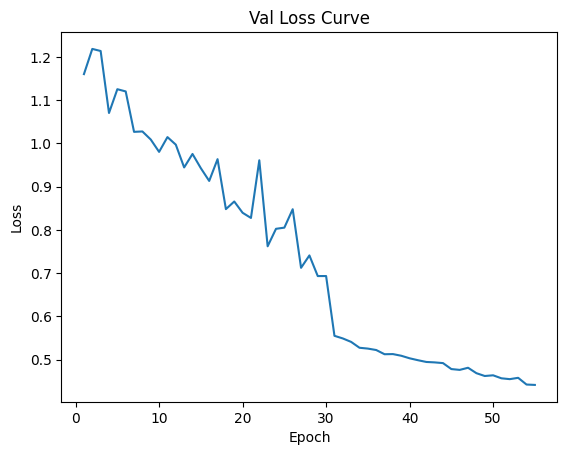

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11657548724458767


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 56/200*****
*****Train Loss:  0.446991 Val Loss:  0.438737*****
*****Validation Accuracy: 62.61%*****
*****Total Avg Disparity: 0.08439518442601063*****

Class Parade: Recall Difference = 0.00021973192704904942
Class Handshaking: Recall Difference = 0.03571428571428574
Class Riot: Recall Difference = -0.04646752015173067
Class Dancing: Recall Difference = 0.15773809523809518
Class Funeral: Recall Difference = 0.14767932489451485
Class Cheering: Recall Difference = 0.1099624060150376
Class Meeting: Recall Difference = -0.011538461538461608
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.06027253668763102
Class Concerts: Recall Difference = -0.012672811059907807
Class Couple: Recall Difference = 0.20488466757123475
Class Family_Group: Recall Difference = -0.04573287409108312
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = -0.06013071895424826
Class Spa: Recall Difference = 0.1309

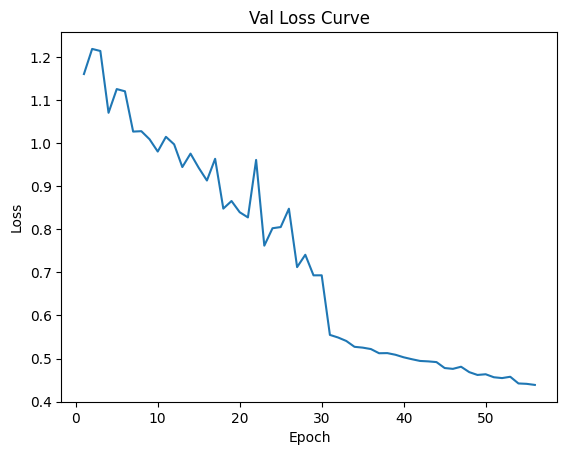

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11600504700954144


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 57/200*****
*****Train Loss:  0.440933 Val Loss:  0.434281*****
*****Validation Accuracy: 61.98%*****
*****Total Avg Disparity: 0.08352909545663438*****

Class Parade: Recall Difference = -0.026807295099978146
Class Handshaking: Recall Difference = -0.08928571428571427
Class Riot: Recall Difference = -0.057373162636320585
Class Dancing: Recall Difference = 0.17559523809523803
Class Funeral: Recall Difference = 0.1729957805907174
Class Cheering: Recall Difference = 0.08364661654135339
Class Meeting: Recall Difference = 0.09807692307692317
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = -0.06029185867895537
Class Couple: Recall Difference = 0.11533242876526462
Class Family_Group: Recall Difference = -0.024301569077688545
Class Picnic: Recall Difference = 0.10839160839160833
Class Soldier_Patrol: Recall Difference = -0.04901960784313719
Class Spa: Recall Difference = 0.1011

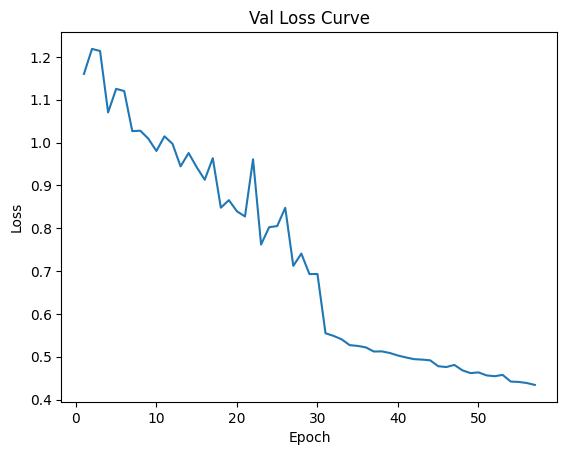

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11626388017947857


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 58/200*****
*****Train Loss:  0.446314 Val Loss:  0.435822*****
*****Validation Accuracy: 62.18%*****
*****Total Avg Disparity: 0.08195060114797513*****

Class Parade: Recall Difference = -0.03905735003295985
Class Handshaking: Recall Difference = 5.551115123125783e-17
Class Riot: Recall Difference = -0.04646752015173061
Class Dancing: Recall Difference = 0.19345238095238082
Class Funeral: Recall Difference = 0.13502109704641346
Class Cheering: Recall Difference = 0.12875939849624063
Class Meeting: Recall Difference = 0.08269230769230773
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.01519916142557648
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.19131614654002713
Class Family_Group: Recall Difference = -0.07979334098737084
Class Picnic: Recall Difference = 0.14685314685314688
Class Soldier_Patrol: Recall Difference = -0.03464052287581698
Class Spa: Recall Difference = 0.0833333

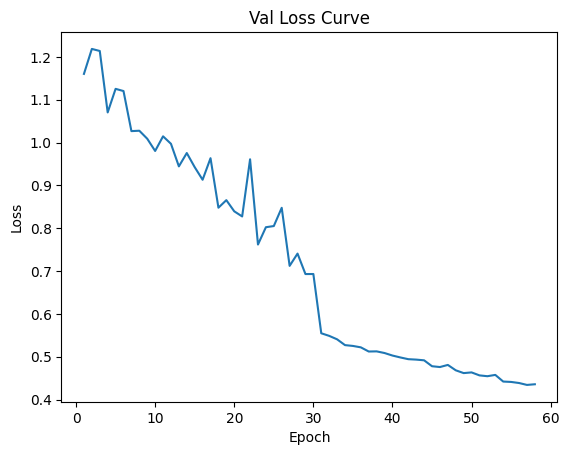

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11636674432800366


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.14s/it]


*****Epoch 59/200*****
*****Train Loss:  0.440636 Val Loss:  0.426837*****
*****Validation Accuracy: 62.26%*****
*****Total Avg Disparity: 0.08534016868021606*****

Class Parade: Recall Difference = -0.009283673917820368
Class Handshaking: Recall Difference = 0.017857142857142863
Class Riot: Recall Difference = -0.04788999525841631
Class Dancing: Recall Difference = 0.15773809523809518
Class Funeral: Recall Difference = 0.2459312839059674
Class Cheering: Recall Difference = 0.07424812030075195
Class Meeting: Recall Difference = 0.019230769230769273
Class Stock_Market: Recall Difference = 0.09999999999999999
Class Ceremony: Recall Difference = -0.013626834381551378
Class Concerts: Recall Difference = -0.08410138248847909
Class Couple: Recall Difference = 0.1451831750339213
Class Family_Group: Recall Difference = -0.09471871412169908
Class Picnic: Recall Difference = 0.03146853146853157
Class Soldier_Patrol: Recall Difference = -0.0379084967320259
Class Spa: Recall Difference = 0.1309523

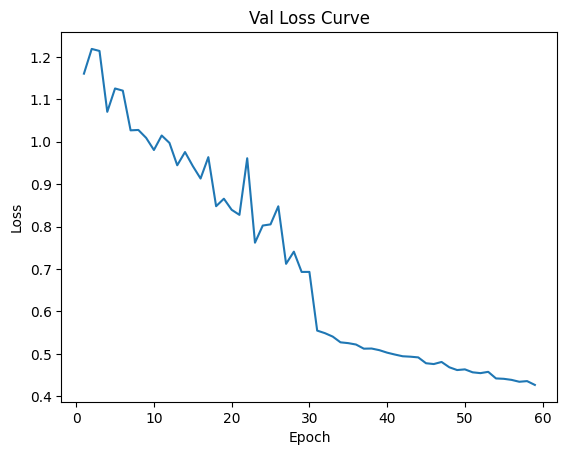

Data has been appended to validation_2.txt
Learning Rate: 0.00311534747583759


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.116354800760746


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 60/200*****
*****Train Loss:  0.438311 Val Loss:  0.434728*****
*****Validation Accuracy: 60.79%*****
*****Total Avg Disparity: 0.08717100833339748*****

Class Parade: Recall Difference = -0.03356405185673472
Class Handshaking: Recall Difference = -0.05357142857142855
Class Riot: Recall Difference = -0.07349454717875764
Class Dancing: Recall Difference = 0.244047619047619
Class Funeral: Recall Difference = 0.19831223628692002
Class Cheering: Recall Difference = 0.06484962406015043
Class Meeting: Recall Difference = -0.10480769230769216
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.02253668763102723
Class Concerts: Recall Difference = -0.048387096774193394
Class Couple: Recall Difference = 0.13025780189959302
Class Family_Group: Recall Difference = -0.015690776884806856
Class Picnic: Recall Difference = 0.0641025641025641
Class Soldier_Patrol: Recall Difference = -0.04901960784313719
Class Spa: Recall Difference = 0.2261904

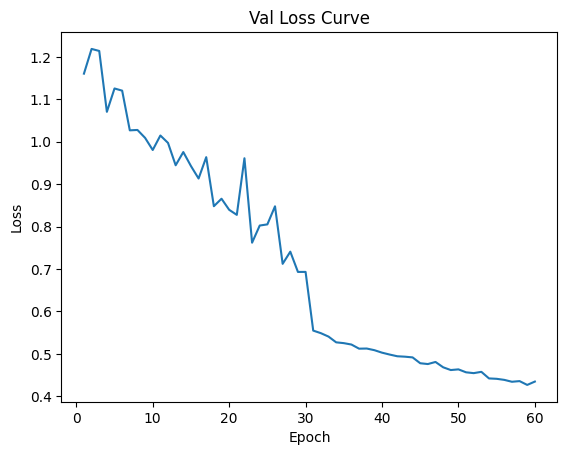

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.1162798825937968


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 61/200*****
*****Train Loss:  0.436253 Val Loss:  0.413898*****
*****Validation Accuracy: 64.12%*****
*****Total Avg Disparity: 0.08085267995270311*****

Class Parade: Recall Difference = -0.014667106130521024
Class Handshaking: Recall Difference = 0.08928571428571434
Class Riot: Recall Difference = -0.022285443338074917
Class Dancing: Recall Difference = 0.20833333333333326
Class Funeral: Recall Difference = 0.11874623267028339
Class Cheering: Recall Difference = 0.14567669172932335
Class Meeting: Recall Difference = -0.058653846153846056
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.0036687631027253476
Class Concerts: Recall Difference = 0.011136712749616362
Class Couple: Recall Difference = 0.21981004070556326
Class Family_Group: Recall Difference = -0.045732874091083064
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.

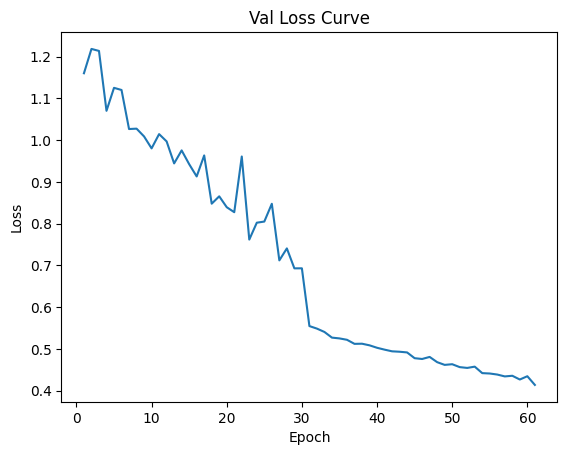

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11565566951265702


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 62/200*****
*****Train Loss:  0.426700 Val Loss:  0.410327*****
*****Validation Accuracy: 64.23%*****
*****Total Avg Disparity: 0.07929729081644118*****

Class Parade: Recall Difference = -0.007910349373764114
Class Handshaking: Recall Difference = 0.05357142857142859
Class Riot: Recall Difference = -0.06685633001422464
Class Dancing: Recall Difference = 0.17261904761904762
Class Funeral: Recall Difference = 0.11874623267028339
Class Cheering: Recall Difference = 0.12875939849624068
Class Meeting: Recall Difference = -0.0740384615384615
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.0036687631027253476
Class Concerts: Recall Difference = -0.012672811059907696
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = 0.007654037504783773
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.107

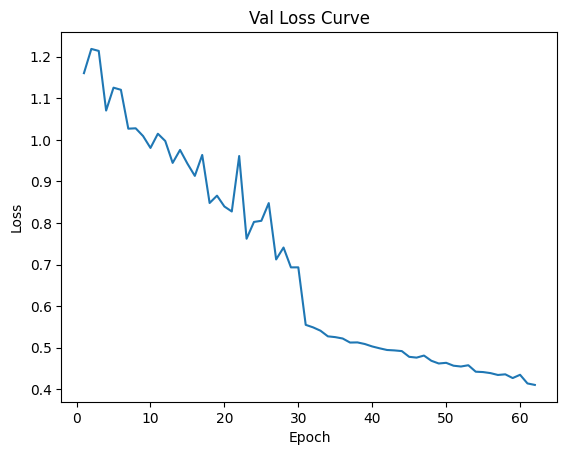

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11617352297672859


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 63/200*****
*****Train Loss:  0.428908 Val Loss:  0.409762*****
*****Validation Accuracy: 64.21%*****
*****Total Avg Disparity: 0.08297733067155338*****

Class Parade: Recall Difference = 0.00159305647110497
Class Handshaking: Recall Difference = -0.10714285714285711
Class Riot: Recall Difference = -0.049312470365101835
Class Dancing: Recall Difference = 0.1726190476190475
Class Funeral: Recall Difference = 0.15370705244122967
Class Cheering: Recall Difference = 0.10996240601503765
Class Meeting: Recall Difference = -0.05865384615384617
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.022536687631027175
Class Concerts: Recall Difference = -0.04493087557603659
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.045732874091083064
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.015686274509803755
Class Spa: Recall Difference = 0.107

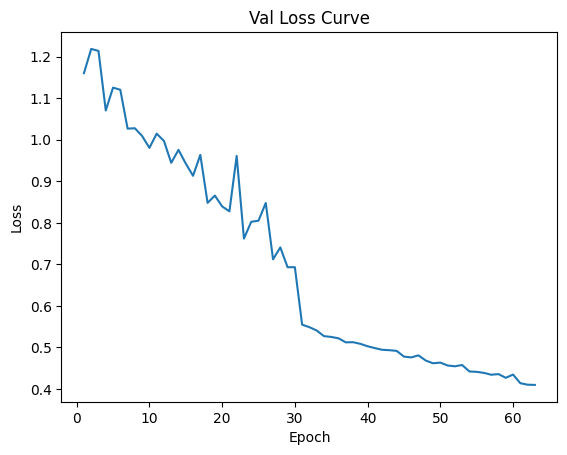

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11612670008952801


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 64/200*****
*****Train Loss:  0.428924 Val Loss:  0.407543*****
*****Validation Accuracy: 64.32%*****
*****Total Avg Disparity: 0.08185659361961847*****

Class Parade: Recall Difference = 0.00021973192704904942
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.04931247036510189
Class Dancing: Recall Difference = 0.21130952380952372
Class Funeral: Recall Difference = 0.166365280289331
Class Cheering: Recall Difference = 0.09304511278195499
Class Meeting: Recall Difference = -0.043269230769230727
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.02253668763102723
Class Concerts: Recall Difference = -0.04493087557603648
Class Couple: Recall Difference = 0.21981004070556315
Class Family_Group: Recall Difference = -0.020091848450057403
Class Picnic: Recall Difference = 0.055944055944055826
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.08

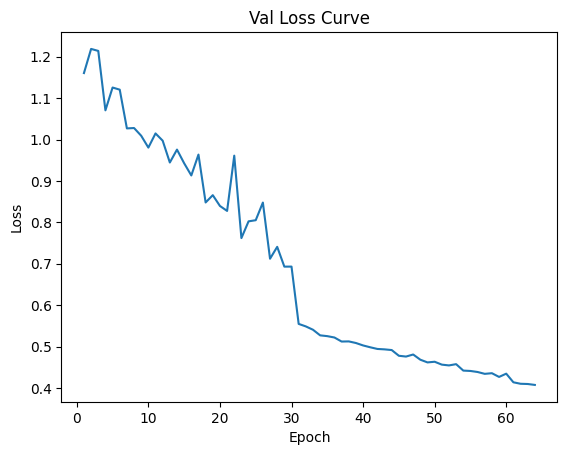

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11559982053362407


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 65/200*****
*****Train Loss:  0.430082 Val Loss:  0.408032*****
*****Validation Accuracy: 64.18%*****
*****Total Avg Disparity: 0.09380185167719783*****

Class Parade: Recall Difference = -0.014667106130521024
Class Handshaking: Recall Difference = -0.16071428571428567
Class Riot: Recall Difference = -0.06685633001422464
Class Dancing: Recall Difference = 0.1726190476190475
Class Funeral: Recall Difference = 0.10608800482218206
Class Cheering: Recall Difference = 0.16353383458646625
Class Meeting: Recall Difference = -0.043269230769230616
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.022536687631027175
Class Concerts: Recall Difference = -0.04493087557603659
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.020091848450057348
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.130

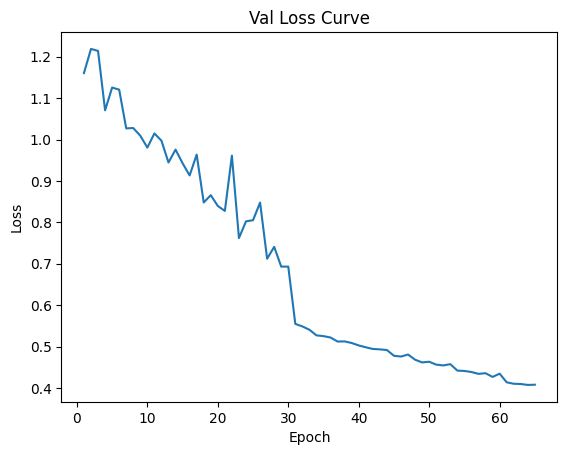

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.1156005532695697


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 66/200*****
*****Train Loss:  0.418409 Val Loss:  0.404659*****
*****Validation Accuracy: 64.26%*****
*****Total Avg Disparity: 0.0799269583629906*****

Class Parade: Recall Difference = 0.00021973192704904942
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.022285443338074862
Class Dancing: Recall Difference = 0.1696428571428571
Class Funeral: Recall Difference = 0.15370705244122979
Class Cheering: Recall Difference = 0.1278195488721805
Class Meeting: Recall Difference = -0.027884615384615397
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.0036687631027253476
Class Concerts: Recall Difference = -0.021121351766512864
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.03291236127057018
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1

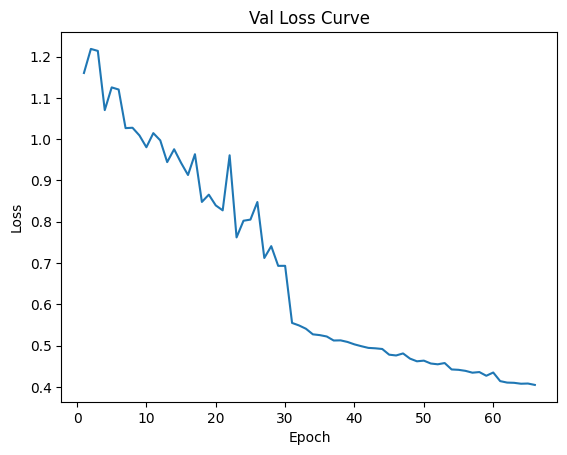

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11696312404595889


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 67/200*****
*****Train Loss:  0.423612 Val Loss:  0.404491*****
*****Validation Accuracy: 64.26%*****
*****Total Avg Disparity: 0.07510712349952975*****

Class Parade: Recall Difference = 0.00834981322786188
Class Handshaking: Recall Difference = 0.05357142857142859
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.1904761904761904
Class Funeral: Recall Difference = 0.10608800482218217
Class Cheering: Recall Difference = 0.10150375939849629
Class Meeting: Recall Difference = -0.043269230769230727
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.022536687631027175
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.24966078697421984
Class Family_Group: Recall Difference = -0.047837734404898524
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.0833

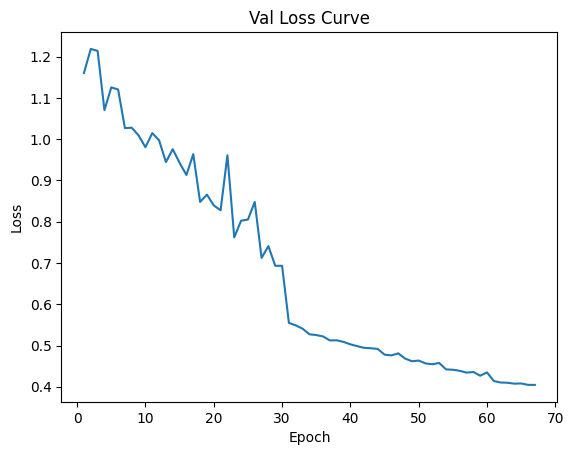

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.1159531740615001


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 68/200*****
*****Train Loss:  0.421102 Val Loss:  0.407902*****
*****Validation Accuracy: 64.49%*****
*****Total Avg Disparity: 0.0765787272397563*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = 2.7755575615628914e-17
Class Riot: Recall Difference = -0.03176861071597903
Class Dancing: Recall Difference = 0.16964285714285693
Class Funeral: Recall Difference = 0.11874623267028339
Class Cheering: Recall Difference = 0.1278195488721805
Class Meeting: Recall Difference = -0.043269230769230727
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.024109014675052387
Class Concerts: Recall Difference = -0.009216589861750779
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.04573287409108301
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = -0.015686274509803755
Class Spa: Recall Difference = 0.10

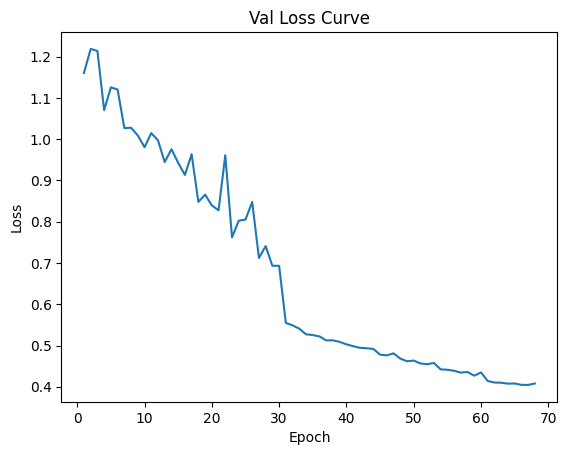

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11600857142072457


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 69/200*****
*****Train Loss:  0.426413 Val Loss:  0.406196*****
*****Validation Accuracy: 64.09%*****
*****Total Avg Disparity: 0.08281675077530387*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.022285443338074917
Class Dancing: Recall Difference = 0.1904761904761904
Class Funeral: Recall Difference = 0.10608800482218217
Class Cheering: Recall Difference = 0.03101503759398508
Class Meeting: Recall Difference = -0.058653846153846056
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0052410901467506155
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.2198100407055632
Class Family_Group: Recall Difference = -0.047837734404898524
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.04901960784313719
Class Spa: Recall Difference = 0.10

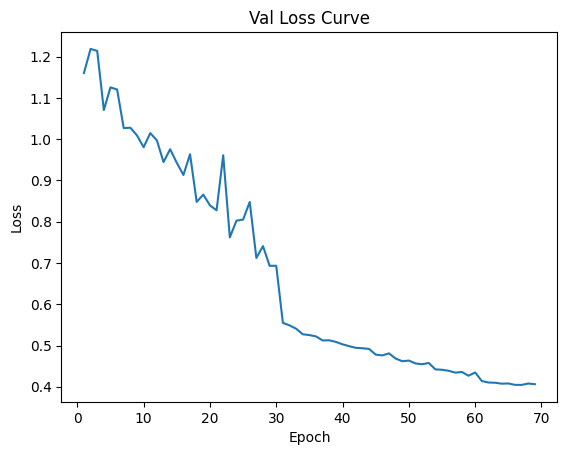

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11564267598665677


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 70/200*****
*****Train Loss:  0.426477 Val Loss:  0.405770*****
*****Validation Accuracy: 64.18%*****
*****Total Avg Disparity: 0.08431510701956149*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.01785714285714282
Class Riot: Recall Difference = -0.022285443338074917
Class Dancing: Recall Difference = 0.1904761904761904
Class Funeral: Recall Difference = 0.15370705244122979
Class Cheering: Recall Difference = 0.1456766917293233
Class Meeting: Recall Difference = -0.043269230769230616
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.04140461215932911
Class Concerts: Recall Difference = -0.04493087557603659
Class Couple: Recall Difference = 0.24966078697421984
Class Family_Group: Recall Difference = -0.047837734404898524
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1

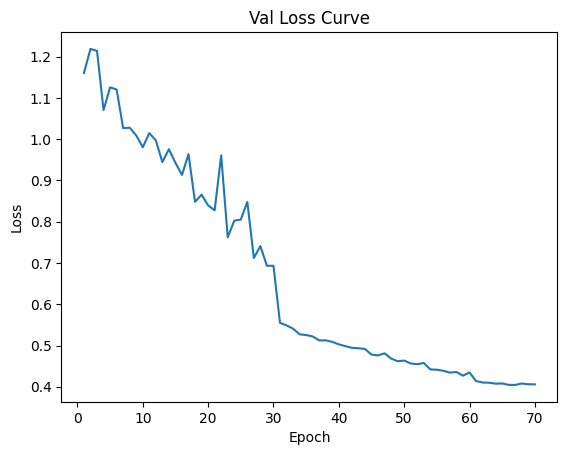

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11560567984214196


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 71/200*****
*****Train Loss:  0.424166 Val Loss:  0.405178*****
*****Validation Accuracy: 64.03%*****
*****Total Avg Disparity: 0.0871391344940707*****

Class Parade: Recall Difference = -0.006537024829707971
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.022285443338074917
Class Dancing: Recall Difference = 0.1904761904761904
Class Funeral: Recall Difference = 0.15370705244122979
Class Cheering: Recall Difference = 0.0921052631578948
Class Meeting: Recall Difference = -0.058653846153846056
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.013626834381551323
Class Concerts: Recall Difference = -0.033026113671274726
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.035017221584385694
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1

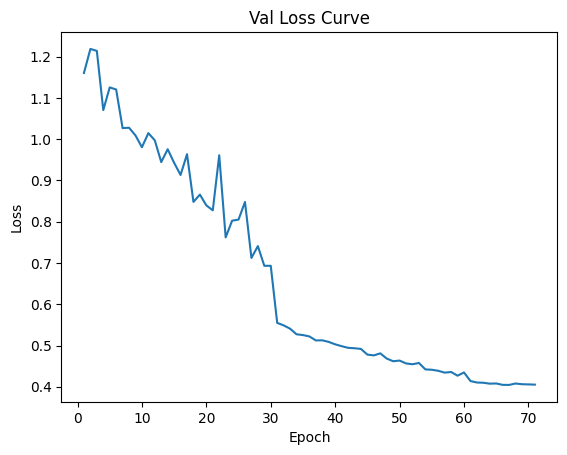

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11585800321056293


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 72/200*****
*****Train Loss:  0.424554 Val Loss:  0.404244*****
*****Validation Accuracy: 64.15%*****
*****Total Avg Disparity: 0.08009081068911361*****

Class Parade: Recall Difference = -0.006537024829707971
Class Handshaking: Recall Difference = -0.01785714285714282
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.1874999999999999
Class Funeral: Recall Difference = 0.15370705244122979
Class Cheering: Recall Difference = 0.05639097744360902
Class Meeting: Recall Difference = -0.058653846153845945
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.0036687631027253476
Class Concerts: Recall Difference = -0.033026113671274726
Class Couple: Recall Difference = 0.24966078697421984
Class Family_Group: Recall Difference = -0.03291236127057018
Class Picnic: Recall Difference = 0.07808857808857816
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.

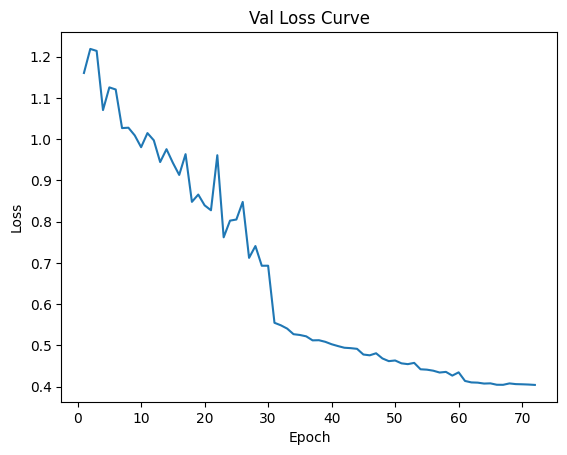

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11585303625235191


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 73/200*****
*****Train Loss:  0.427901 Val Loss:  0.403677*****
*****Validation Accuracy: 64.49%*****
*****Total Avg Disparity: 0.07896479769461526*****

Class Parade: Recall Difference = 0.00021973192704904942
Class Handshaking: Recall Difference = -0.08928571428571422
Class Riot: Recall Difference = -0.004741583688952056
Class Dancing: Recall Difference = 0.16964285714285704
Class Funeral: Recall Difference = 0.10608800482218217
Class Cheering: Recall Difference = 0.14567669172932335
Class Meeting: Recall Difference = -0.043269230769230727
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.03501722158438564
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0

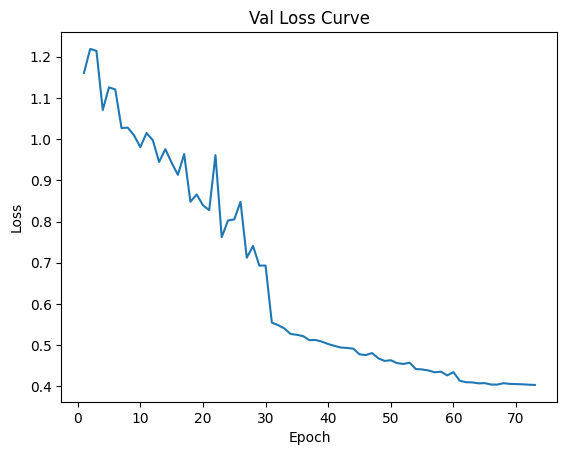

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11527474310535651


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 74/200*****
*****Train Loss:  0.426222 Val Loss:  0.404777*****
*****Validation Accuracy: 64.23%*****
*****Total Avg Disparity: 0.08448423638015322*****

Class Parade: Recall Difference = 0.00834981322786188
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952056
Class Dancing: Recall Difference = 0.1904761904761904
Class Funeral: Recall Difference = 0.166365280289331
Class Cheering: Recall Difference = 0.1099624060150376
Class Meeting: Recall Difference = -0.043269230769230727
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.00921658986175089
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.035017221584385694
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1071428

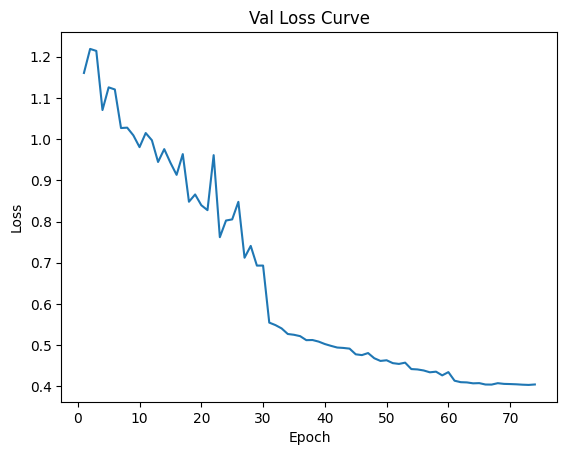

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11458089317266758


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.21s/it]


*****Epoch 75/200*****
*****Train Loss:  0.422479 Val Loss:  0.405117*****
*****Validation Accuracy: 64.58%*****
*****Total Avg Disparity: 0.08868261151561013*****

Class Parade: Recall Difference = 0.00834981322786188
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.022285443338074862
Class Dancing: Recall Difference = 0.21130952380952378
Class Funeral: Recall Difference = 0.17902350813743223
Class Cheering: Recall Difference = 0.1278195488721805
Class Meeting: Recall Difference = -0.043269230769230616
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.021121351766512864
Class Couple: Recall Difference = 0.23473541383989155
Class Family_Group: Recall Difference = -0.04573287409108301
Class Picnic: Recall Difference = 0.02564102564102555
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1071

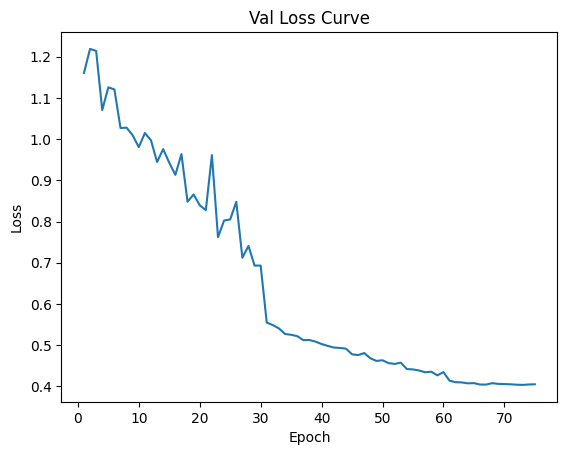

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11628516476887923


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 76/200*****
*****Train Loss:  0.426859 Val Loss:  0.403271*****
*****Validation Accuracy: 64.41%*****
*****Total Avg Disparity: 0.08794114808076392*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.17857142857142855
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.1696428571428571
Class Funeral: Recall Difference = 0.15370705244122979
Class Cheering: Recall Difference = 0.05733082706766918
Class Meeting: Recall Difference = -0.058653846153845945
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = -0.022536687631027175
Class Concerts: Recall Difference = -0.033026113671274726
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.02219670876387292
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.0379084967320259
Class Spa: Recall Difference = 0.107

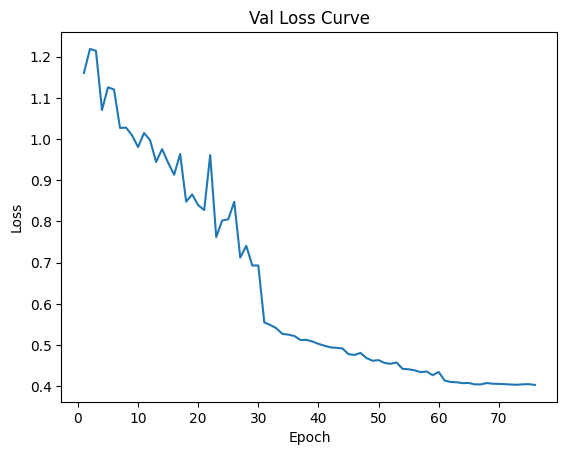

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.22s/it]


Average Adversary epoch loss: 0.1152051819058565


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 77/200*****
*****Train Loss:  0.423686 Val Loss:  0.402126*****
*****Validation Accuracy: 64.26%*****
*****Total Avg Disparity: 0.07930888337771662*****

Class Parade: Recall Difference = 0.00021973192704904942
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952056
Class Dancing: Recall Difference = 0.14880952380952367
Class Funeral: Recall Difference = 0.10608800482218217
Class Cheering: Recall Difference = 0.1278195488721805
Class Meeting: Recall Difference = -0.058653846153846056
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.0052410901467506155
Class Concerts: Recall Difference = -0.021121351766512753
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.0072713356295445175
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 

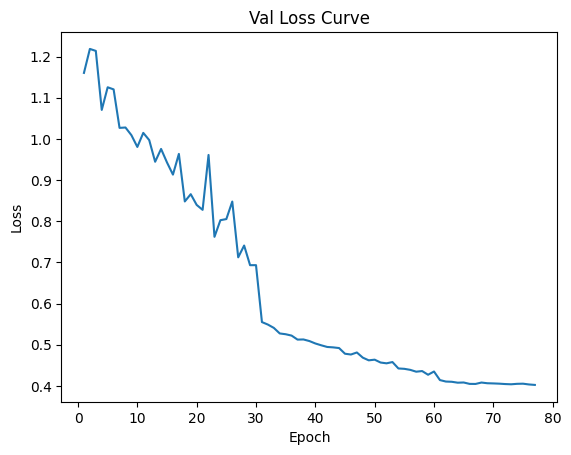

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11512830996742615


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 78/200*****
*****Train Loss:  0.422056 Val Loss:  0.404163*****
*****Validation Accuracy: 64.70%*****
*****Total Avg Disparity: 0.07964918286910411*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16964285714285704
Class Funeral: Recall Difference = 0.14406268836648595
Class Cheering: Recall Difference = 0.10996240601503765
Class Meeting: Recall Difference = -0.027884615384615286
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.024109014675052443
Class Concerts: Recall Difference = -0.00921658986175089
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.020091848450057348
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.015686274509803755
Class Spa: Recall Difference = 0.1

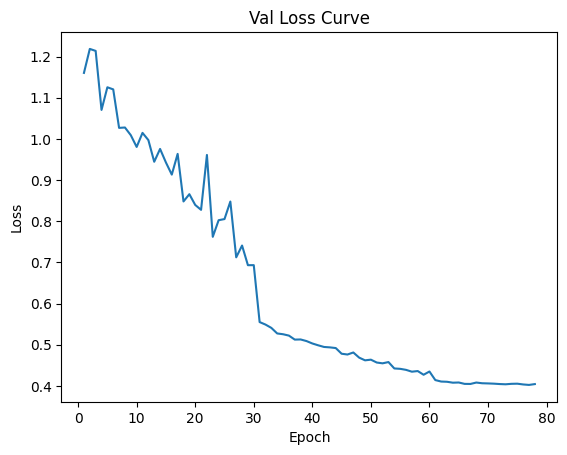

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11573323062979259


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 79/200*****
*****Train Loss:  0.418742 Val Loss:  0.403566*****
*****Validation Accuracy: 64.41%*****
*****Total Avg Disparity: 0.0793645066026152*****

Class Parade: Recall Difference = 0.00159305647110497
Class Handshaking: Recall Difference = -0.0357142857142857
Class Riot: Recall Difference = -0.004741583688952056
Class Dancing: Recall Difference = 0.14880952380952384
Class Funeral: Recall Difference = 0.22664255575647996
Class Cheering: Recall Difference = 0.06578947368421059
Class Meeting: Recall Difference = -0.012499999999999845
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.02253668763102723
Class Concerts: Recall Difference = -0.021121351766512864
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.017986988136241888
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.10714

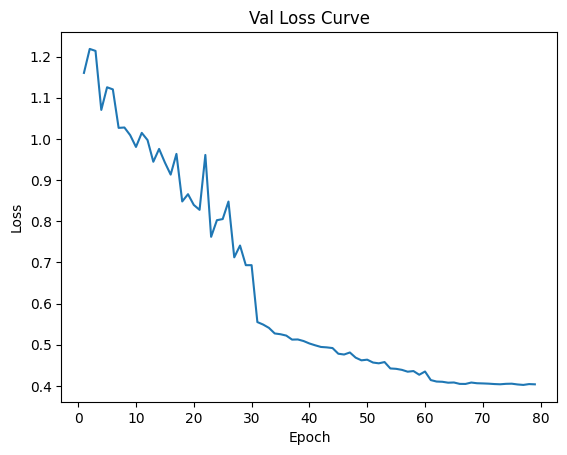

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.34s/it]


Average Adversary epoch loss: 0.11634761123703076


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 80/200*****
*****Train Loss:  0.424052 Val Loss:  0.403412*****
*****Validation Accuracy: 64.32%*****
*****Total Avg Disparity: 0.07888677028727598*****

Class Parade: Recall Difference = -0.006537024829707971
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.022285443338074862
Class Dancing: Recall Difference = 0.13095238095238088
Class Funeral: Recall Difference = 0.15370705244122979
Class Cheering: Recall Difference = 0.1099624060150376
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.02253668763102723
Class Concerts: Recall Difference = -0.04493087557603659
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.007271335629544573
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.107

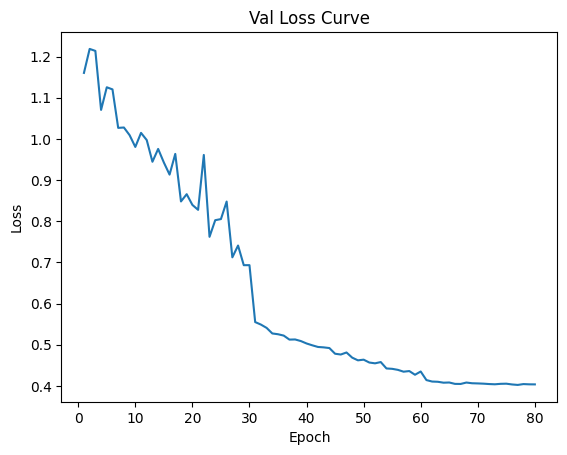

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11535199760244443


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 81/200*****
*****Train Loss:  0.421836 Val Loss:  0.400639*****
*****Validation Accuracy: 64.61%*****
*****Total Avg Disparity: 0.08172801503869973*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666657
Class Funeral: Recall Difference = 0.10608800482218206
Class Cheering: Recall Difference = 0.10150375939849623
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = -0.013626834381551378
Class Concerts: Recall Difference = 0.0026881720430109723
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.022196708763872863
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0

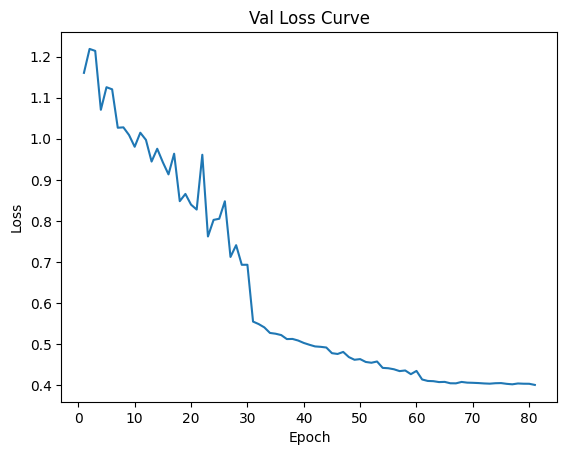

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11524727424749961


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 82/200*****
*****Train Loss:  0.421439 Val Loss:  0.402272*****
*****Validation Accuracy: 64.70%*****
*****Total Avg Disparity: 0.08533416931678464*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.1874999999999999
Class Funeral: Recall Difference = 0.14104882459312834
Class Cheering: Recall Difference = 0.1278195488721805
Class Meeting: Recall Difference = -0.027884615384615286
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.033026113671274726
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.020091848450057515
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.107

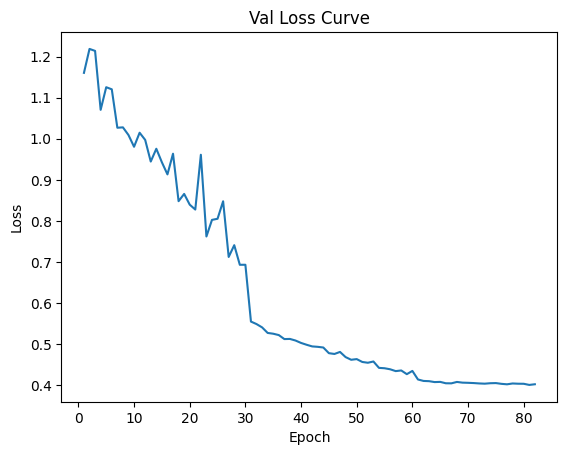

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:53<00:00,  4.37s/it]


Average Adversary epoch loss: 0.11558819705477127


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 83/200*****
*****Train Loss:  0.417016 Val Loss:  0.401693*****
*****Validation Accuracy: 64.73%*****
*****Total Avg Disparity: 0.08106945357225018*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.1071428571428571
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.18452380952380953
Class Funeral: Recall Difference = 0.1187462326702835
Class Cheering: Recall Difference = 0.10996240601503765
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.0036687631027253476
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.03291236127057018
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1

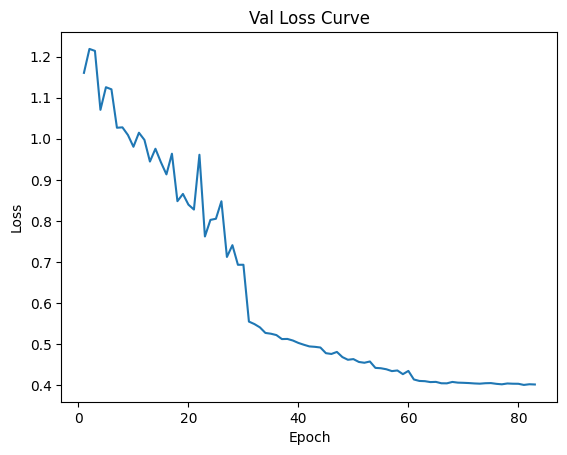

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11485128649152242


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 84/200*****
*****Train Loss:  0.422793 Val Loss:  0.401458*****
*****Validation Accuracy: 64.81%*****
*****Total Avg Disparity: 0.0803218683970855*****

Class Parade: Recall Difference = -0.00653702482970786
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.022285443338074917
Class Dancing: Recall Difference = 0.1874999999999999
Class Funeral: Recall Difference = 0.11874623267028339
Class Cheering: Recall Difference = 0.10996240601503765
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.003668763102725403
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.03291236127057029
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1071

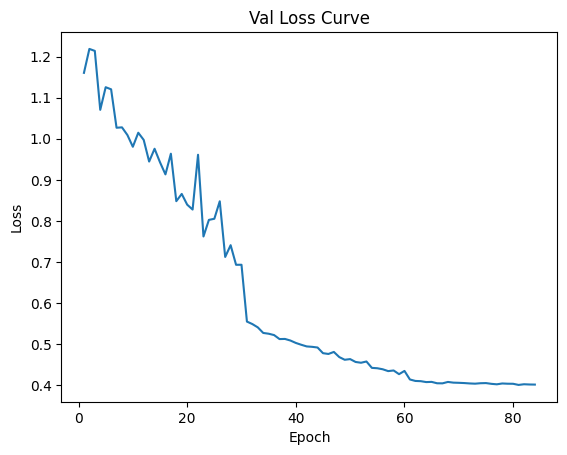

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.1154517731987513


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 85/200*****
*****Train Loss:  0.415324 Val Loss:  0.397272*****
*****Validation Accuracy: 64.67%*****
*****Total Avg Disparity: 0.08038855260563178*****

Class Parade: Recall Difference = 0.00834981322786188
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.04931247036510189
Class Dancing: Recall Difference = 0.1488095238095239
Class Funeral: Recall Difference = 0.12839059674502712
Class Cheering: Recall Difference = 0.1456766917293233
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = -0.022536687631027175
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.03501722158438564
Class Picnic: Recall Difference = 0.01748251748251739
Class Soldier_Patrol: Recall Difference = -0.015686274509803755
Class Spa: Recall Difference = 0.1309523

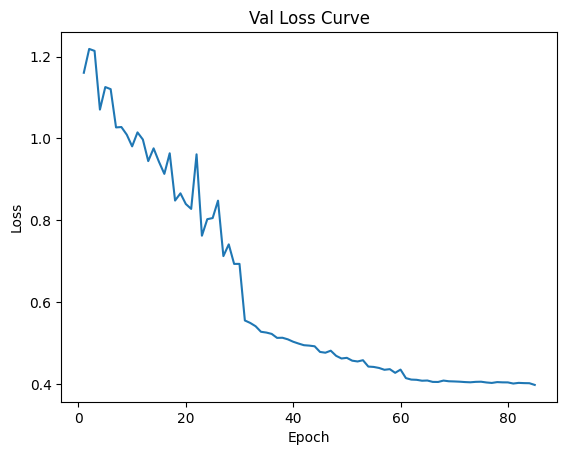

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:49<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11461871633162865


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 86/200*****
*****Train Loss:  0.421750 Val Loss:  0.399792*****
*****Validation Accuracy: 64.61%*****
*****Total Avg Disparity: 0.08592333994160684*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.022285443338074862
Class Dancing: Recall Difference = 0.16964285714285704
Class Funeral: Recall Difference = 0.11874623267028339
Class Cheering: Recall Difference = 0.14567669172932335
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.042976939203354325
Class Concerts: Recall Difference = -0.021121351766512864
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.035017221584385694
Class Picnic: Recall Difference = 0.07808857808857805
Class Soldier_Patrol: Recall Difference = -0.015686274509803755
Class Spa: Recall Difference = 0.1

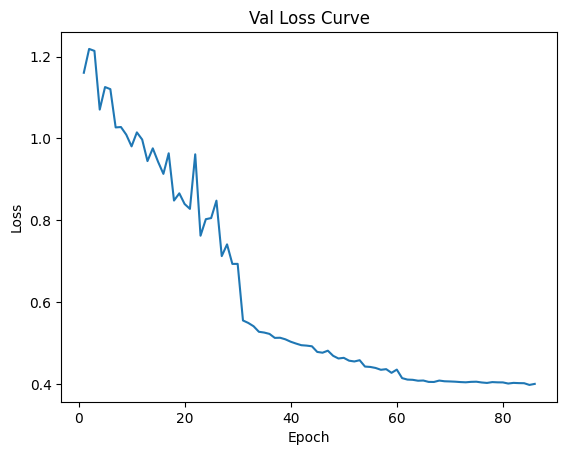

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11506030250054139


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.25s/it]


*****Epoch 87/200*****
*****Train Loss:  0.418675 Val Loss:  0.398851*****
*****Validation Accuracy: 64.55%*****
*****Total Avg Disparity: 0.08198466133614826*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952056
Class Dancing: Recall Difference = 0.18749999999999994
Class Funeral: Recall Difference = 0.15370705244122979
Class Cheering: Recall Difference = 0.05733082706766918
Class Meeting: Recall Difference = -0.043269230769230616
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = -0.0036687631027253476
Class Concerts: Recall Difference = -0.033026113671274726
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.020091848450057348
Class Picnic: Recall Difference = 0.055944055944055826
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 

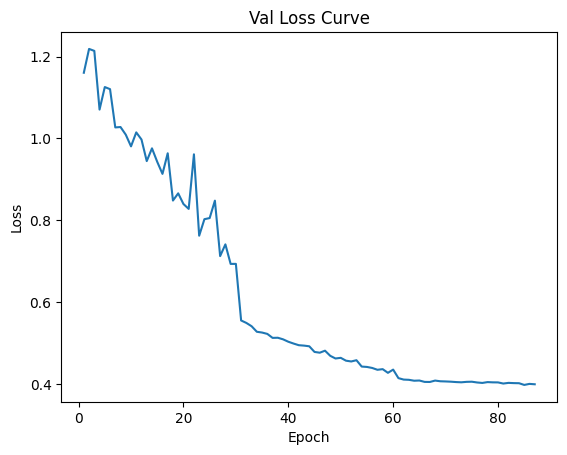

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.32s/it]


Average Adversary epoch loss: 0.11535389406176713


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 88/200*****
*****Train Loss:  0.418250 Val Loss:  0.396353*****
*****Validation Accuracy: 64.87%*****
*****Total Avg Disparity: 0.08355905909752064*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.04931247036510189
Class Dancing: Recall Difference = 0.16666666666666663
Class Funeral: Recall Difference = 0.11874623267028339
Class Cheering: Recall Difference = 0.14567669172932335
Class Meeting: Recall Difference = -0.027884615384615286
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.024109014675052443
Class Concerts: Recall Difference = -0.021121351766512864
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.020091848450057348
Class Picnic: Recall Difference = 0.02564102564102555
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.10

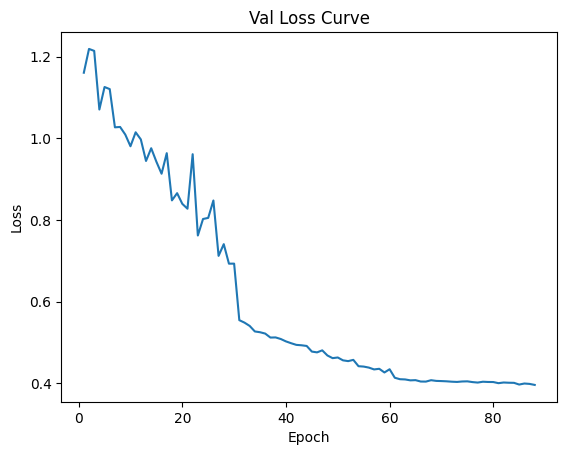

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11517232799759278


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 89/200*****
*****Train Loss:  0.414694 Val Loss:  0.394263*****
*****Validation Accuracy: 64.93%*****
*****Total Avg Disparity: 0.08402350429388106*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.1845238095238096
Class Funeral: Recall Difference = 0.166365280289331
Class Cheering: Recall Difference = 0.09304511278195493
Class Meeting: Recall Difference = -0.027884615384615286
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.024109014675052443
Class Concerts: Recall Difference = -0.021121351766512753
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.03291236127057018
Class Picnic: Recall Difference = 0.055944055944055826
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1309

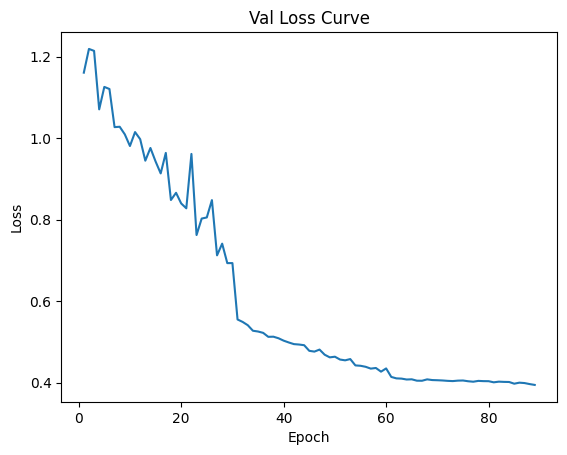

Data has been appended to validation_2.txt
Learning Rate: 0.00031153474758375903


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.31s/it]


Average Adversary epoch loss: 0.11606073923982106


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 90/200*****
*****Train Loss:  0.413751 Val Loss:  0.392736*****
*****Validation Accuracy: 65.02%*****
*****Total Avg Disparity: 0.08304484287118609*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666669
Class Funeral: Recall Difference = 0.13140446051838472
Class Cheering: Recall Difference = 0.09304511278195488
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.03333333333333333
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = 0.023041474654378113
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.017986988136242
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1071

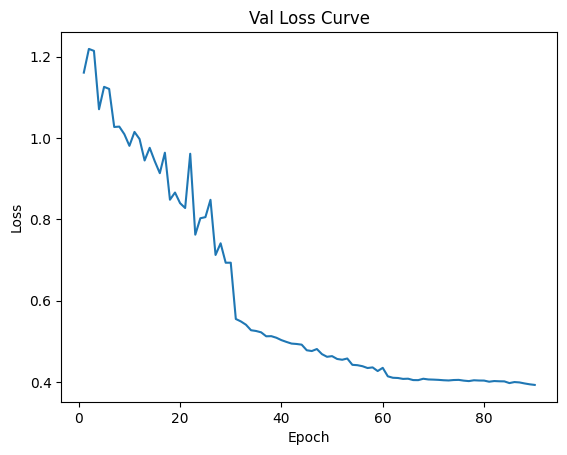

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.28s/it]


Average Adversary epoch loss: 0.11589155632715958


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 91/200*****
*****Train Loss:  0.416845 Val Loss:  0.396321*****
*****Validation Accuracy: 65.07%*****
*****Total Avg Disparity: 0.08316953813976481*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666669
Class Funeral: Recall Difference = 0.1187462326702835
Class Cheering: Recall Difference = 0.09304511278195488
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.00921658986175089
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.017986988136242
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1071428

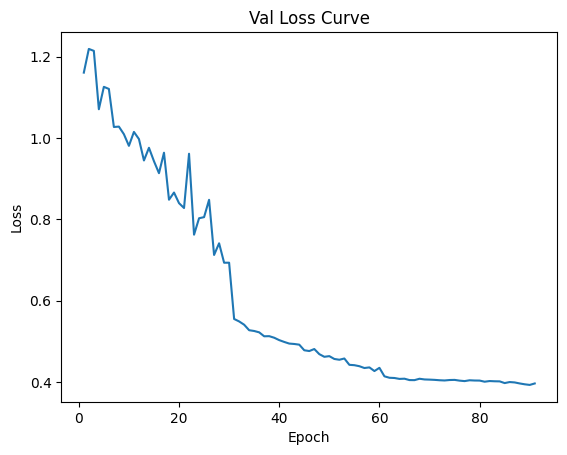

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11541541923697178


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 92/200*****
*****Train Loss:  0.418045 Val Loss:  0.392578*****
*****Validation Accuracy: 65.02%*****
*****Total Avg Disparity: 0.08239691686006469*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.14880952380952372
Class Funeral: Recall Difference = 0.10608800482218217
Class Cheering: Recall Difference = 0.09304511278195488
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.035017221584385694
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.10

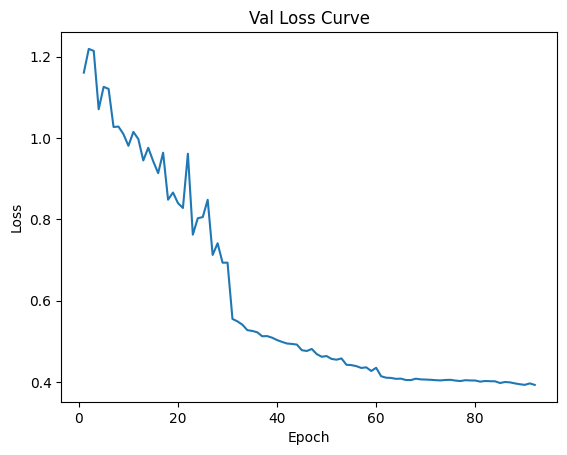

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11597718298435211


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


*****Epoch 93/200*****
*****Train Loss:  0.418031 Val Loss:  0.393863*****
*****Validation Accuracy: 65.13%*****
*****Total Avg Disparity: 0.0801170345069524*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666663
Class Funeral: Recall Difference = 0.10608800482218217
Class Cheering: Recall Difference = 0.11090225563909772
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.005166475315729002
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.107

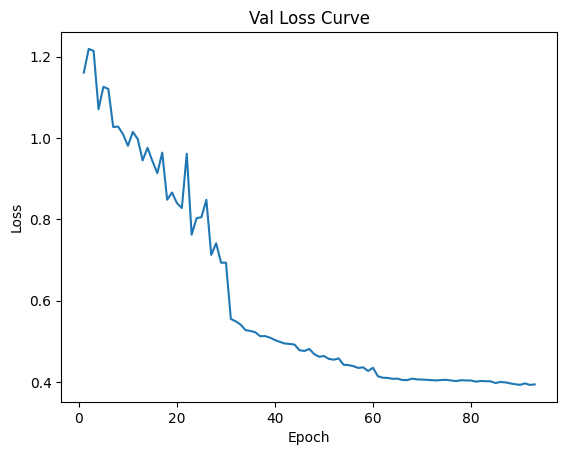

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.26s/it]


Average Adversary epoch loss: 0.11581900171362437


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.18s/it]


*****Epoch 94/200*****
*****Train Loss:  0.417415 Val Loss:  0.395895*****
*****Validation Accuracy: 65.04%*****
*****Total Avg Disparity: 0.08313128475225634*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666669
Class Funeral: Recall Difference = 0.11874623267028339
Class Cheering: Recall Difference = 0.09304511278195493
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = 0.0026881720430109723
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.020091848450057515
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.10

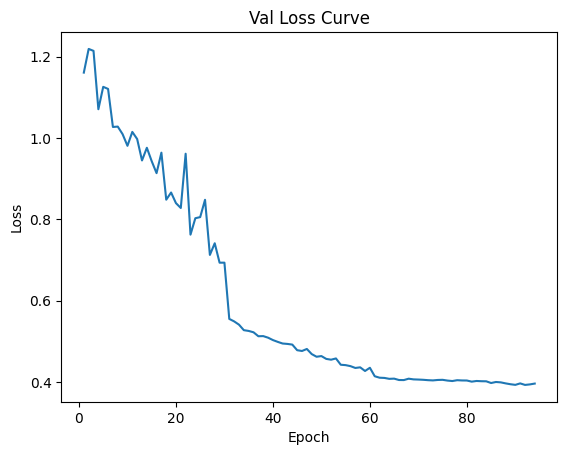

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.23s/it]


Average Adversary epoch loss: 0.11492641327472833


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.26s/it]


*****Epoch 95/200*****
*****Train Loss:  0.415174 Val Loss:  0.396355*****
*****Validation Accuracy: 65.16%*****
*****Total Avg Disparity: 0.08461409998376099*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666663
Class Funeral: Recall Difference = 0.10608800482218217
Class Cheering: Recall Difference = 0.11090225563909778
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = 0.0026881720430109723
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.020091848450057515
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.10

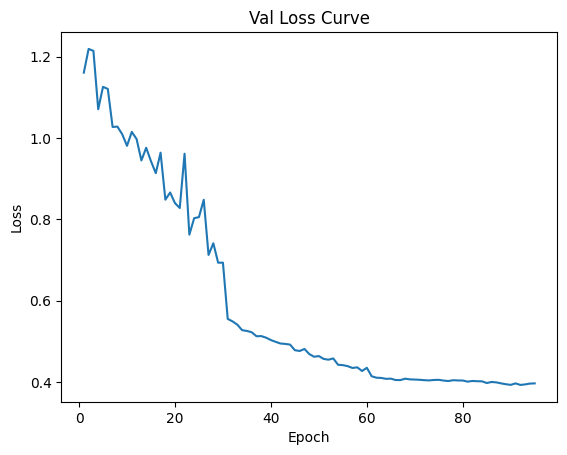

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.25s/it]


Average Adversary epoch loss: 0.11500943795992778


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.22s/it]


*****Epoch 96/200*****
*****Train Loss:  0.418349 Val Loss:  0.396198*****
*****Validation Accuracy: 65.04%*****
*****Total Avg Disparity: 0.08212038637896141*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666663
Class Funeral: Recall Difference = 0.11874623267028339
Class Cheering: Recall Difference = 0.09304511278195488
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.020091848450057403
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.

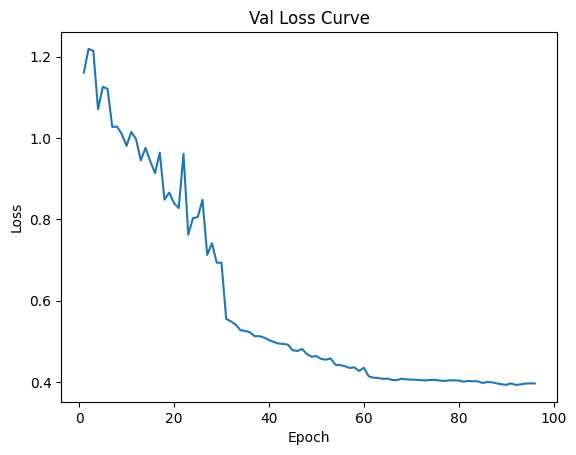

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.30s/it]


Average Adversary epoch loss: 0.11506460320491058


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.17s/it]


*****Epoch 97/200*****
*****Train Loss:  0.418457 Val Loss:  0.396545*****
*****Validation Accuracy: 65.16%*****
*****Total Avg Disparity: 0.07979520722901944*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.022285443338074917
Class Dancing: Recall Difference = 0.16666666666666669
Class Funeral: Recall Difference = 0.10608800482218217
Class Cheering: Recall Difference = 0.09304511278195493
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.021121351766512864
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.017986988136241833
Class Picnic: Recall Difference = -0.012820512820512886
Class Soldier_Patrol: Recall Difference = -0.015686274509803755
Class Spa: Recall Difference = 0

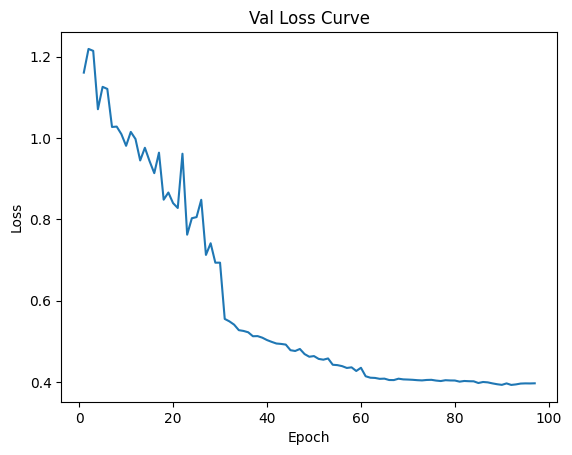

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:50<00:00,  4.24s/it]


Average Adversary epoch loss: 0.11540339715205707


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.24s/it]


*****Epoch 98/200*****
*****Train Loss:  0.415603 Val Loss:  0.395227*****
*****Validation Accuracy: 65.22%*****
*****Total Avg Disparity: 0.08884509720305142*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.022285443338074917
Class Dancing: Recall Difference = 0.16666666666666669
Class Funeral: Recall Difference = 0.17902350813743223
Class Cheering: Recall Difference = 0.11090225563909772
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.03302611367127484
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.017986988136241833
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.015686274509803755
Class Spa: Recall Difference = 0.107

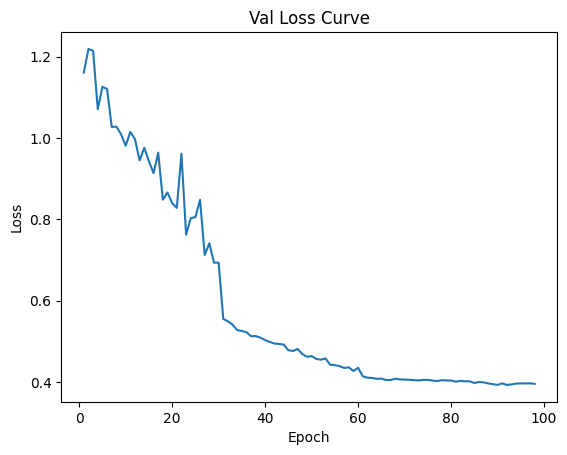

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:52<00:00,  4.33s/it]


Average Adversary epoch loss: 0.11616651026102212


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 99/200*****
*****Train Loss:  0.419791 Val Loss:  0.397414*****
*****Validation Accuracy: 65.28%*****
*****Total Avg Disparity: 0.08498780885470764*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666663
Class Funeral: Recall Difference = 0.1314044605183846
Class Cheering: Recall Difference = 0.09304511278195493
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.021121351766512753
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.020091848450057348
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.015686274509803755
Class Spa: Recall Difference = 0.107

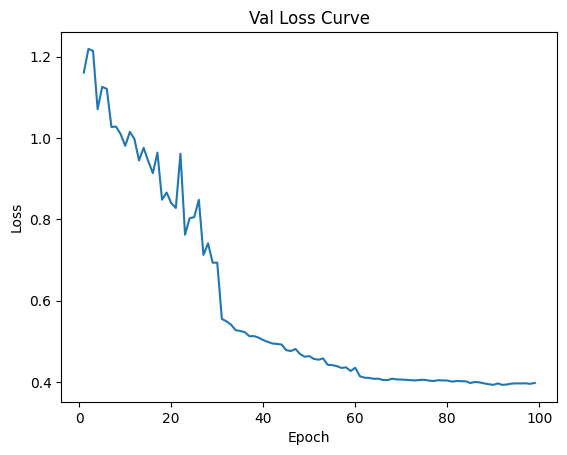

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.27s/it]


Average Adversary epoch loss: 0.11501993898015755


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


*****Epoch 100/200*****
*****Train Loss:  0.418525 Val Loss:  0.395138*****
*****Validation Accuracy: 65.02%*****
*****Total Avg Disparity: 0.08148054119487966*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952056
Class Dancing: Recall Difference = 0.16666666666666663
Class Funeral: Recall Difference = 0.1314044605183846
Class Cheering: Recall Difference = 0.11936090225563908
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.00921658986175089
Class Couple: Recall Difference = 0.2347354138398916
Class Family_Group: Recall Difference = -0.020091848450057515
Class Picnic: Recall Difference = 0.047785547785547666
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1

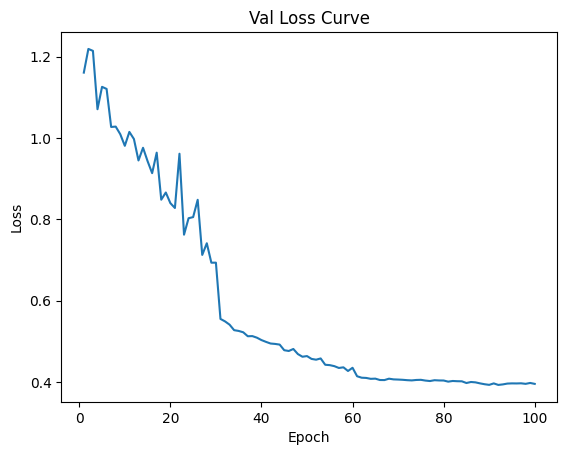

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11533277825667308


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.16s/it]


*****Epoch 101/200*****
*****Train Loss:  0.414649 Val Loss:  0.395135*****
*****Validation Accuracy: 65.16%*****
*****Total Avg Disparity: 0.08445515062114187*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666663
Class Funeral: Recall Difference = 0.11874623267028339
Class Cheering: Recall Difference = 0.11090225563909772
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.009216589861751001
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.020091848450057403
Class Picnic: Recall Difference = 0.0862470862470861
Class Soldier_Patrol: Recall Difference = -0.026797385620914826
Class Spa: Recall Difference = 0.1

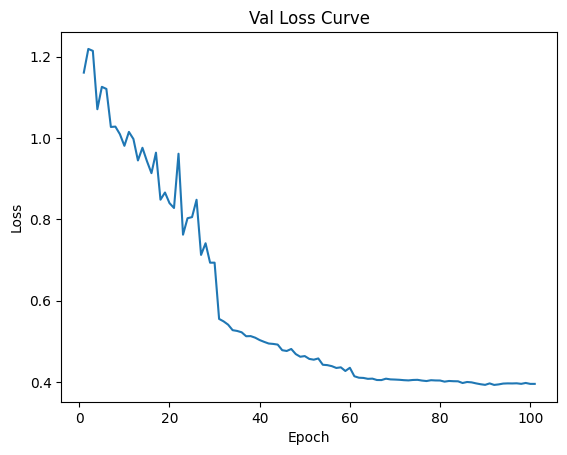

Data has been appended to validation_2.txt
Learning Rate: 3.115347475837591e-05


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [01:51<00:00,  4.29s/it]


Average Adversary epoch loss: 0.11502724656691918


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.20s/it]


*****Epoch 102/200*****
*****Train Loss:  0.414131 Val Loss:  0.395974*****
*****Validation Accuracy: 65.07%*****
*****Total Avg Disparity: 0.08419387856944134*****

Class Parade: Recall Difference = 0.0002197319270489384
Class Handshaking: Recall Difference = -0.08928571428571425
Class Riot: Recall Difference = -0.004741583688952167
Class Dancing: Recall Difference = 0.16666666666666663
Class Funeral: Recall Difference = 0.15370705244122979
Class Cheering: Recall Difference = 0.11090225563909772
Class Meeting: Recall Difference = -0.027884615384615175
Class Stock_Market: Recall Difference = 0.06666666666666667
Class Ceremony: Recall Difference = 0.015199161425576535
Class Concerts: Recall Difference = -0.021121351766512864
Class Couple: Recall Difference = 0.2496607869742199
Class Family_Group: Recall Difference = -0.017986988136241944
Class Picnic: Recall Difference = 0.03962703962703962
Class Soldier_Patrol: Recall Difference = -0.015686274509803755
Class Spa: Recall Difference = 0.

In [20]:
teacher_optimizer = optim.SGD(teacher_model.parameters(), lr=best_lr_teacher, momentum=momentum)
teacher_scheduler = torch.optim.lr_scheduler.StepLR(teacher_optimizer, step_size=step_size, gamma=gamma)
    
train_teacher(teacher_model, trainloader, criterion_clf, teacher_optimizer, teacher_scheduler, device, epochs, patience=patience_teacher)

torch.save(teacher_model.state_dict(), 'teacher_model_weights_ckd_wider.pth')
torch.save(teacher_model, 'teacher_model_ckd_wider.pth')
print('teacher weights and architecture saved and exported')

lmba_list = [0,0.5,1,1.5,2]

# Initialize the dictionary
lambda_results = {}

for i in lmba_list:
    student_model = torchvision.models.resnet18(weights=None).to(device)
    student_model.fc = nn.Linear(512, num_classes)
    adv = Adversary()
    student_optimizer = optim.SGD(student_model.parameters(), lr=best_lr_student, momentum=momentum)
    student_scheduler = torch.optim.lr_scheduler.StepLR(student_optimizer, step_size=step_size, gamma=gamma)
    
    optimizer_adv = optim.Adam(adv.parameters(), lr=best_lr_student)
    
    pretrain_student(student_model, teacher_model, trainloader, criterion_clf, student_optimizer, student_scheduler, device, alpha, temperature, epochs_pretrain)
    pretrain_adversary(adv, student_model, optimizer_adv, trainloader, adv_criterion, epochs_pretrain)
    
    val_accuracy, mean_abs_val_disparity = train_student_with_distillation_disparity(student_model, teacher_model, adv, trainloader, testloader, criterion_clf, adv_criterion, student_optimizer, student_scheduler, device, alpha, temperature, epochs, lmda=i, patience=patience_student, optimizer_adv=optimizer_adv)

    torch.save(student_model.state_dict(), f'student_model_weights_ckd_wider_lambda{i}.pth')
    torch.save(student_model, f'student_model_ckd_wider_lambda{i}.pth')

    # Store the results in the dictionary
    lambda_results[i] = {
        'val_accuracy': val_accuracy,
        'mean_abs_val_disparity': mean_abs_val_disparity
    }

In [21]:
def compare_model_size(teacher, student):
    teacher_params = sum(p.numel() for p in teacher.parameters())
    student_params = sum(p.numel() for p in student.parameters())
    return teacher_params, student_params

def compare_inference_time(teacher, student, dataloader):
    dataiter = iter(dataloader)
    data = next(dataiter)
    inputs = data['img']
    
    teacher = teacher.to(device)
    student = student.to(device)
    inputs = inputs.to(device)
    
    start_time = time.time()
    with torch.no_grad():
        teacher_outputs = teacher(inputs)
    teacher_time = time.time() - start_time

    start_time = time.time()
    with torch.no_grad():
        student_outputs = student(inputs)
    student_time = time.time() - start_time
    
    return teacher_time, student_time

def compare_performance_metrics(teacher, student, dataloader):
    teacher.eval()
    student.eval()
    
    all_labels = []
    all_teacher_preds = []
    all_student_preds = []

    for batch in dataloader:
        inputs = batch['img'].to(device)
        labels = batch['label'].to(device)
        
        with torch.no_grad():
            teacher_outputs = teacher(inputs)
            student_outputs = student(inputs)
            
        teacher_preds = torch.argmax(teacher_outputs, dim=1).cpu().numpy()
        student_preds = torch.argmax(student_outputs, dim=1).cpu().numpy()
        
        all_labels.append(labels.cpu().numpy())
        all_teacher_preds.append(teacher_preds)
        all_student_preds.append(student_preds)

    all_labels = np.concatenate(all_labels)
    all_teacher_preds = np.concatenate(all_teacher_preds)
    all_student_preds = np.concatenate(all_student_preds)
    
    metrics = {
        'accuracy': (accuracy_score(all_labels, all_teacher_preds), accuracy_score(all_labels, all_student_preds)),
        'precision': (precision_score(all_labels, all_teacher_preds, average='weighted', zero_division=0), precision_score(all_labels, all_student_preds, average='weighted', zero_division=0)),
        'recall': (recall_score(all_labels, all_teacher_preds, average='weighted'), recall_score(all_labels, all_student_preds, average='weighted')),
        'f1': (f1_score(all_labels, all_teacher_preds, average='weighted'), f1_score(all_labels, all_student_preds, average='weighted'))
    }

    return {
        'metrics': metrics,
        'all_labels': all_labels,
        'all_teacher_preds': all_teacher_preds,
        'all_student_preds': all_student_preds
    }
    
def plot_comparison(labels, teacher_values, student_values, title, ylabel):
    # Convert parameter count to millions
    if 'Parameter Count' in title or 'Parameter Count' in ylabel:
        teacher_values = [value / 1e6 for value in teacher_values]
        student_values = [value / 1e6 for value in student_values]

    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, teacher_values, width, label='Teacher')
    rects2 = ax.bar(x + width/2, student_values, width, label='Student')

    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()
    fig.tight_layout()
    plt.show()


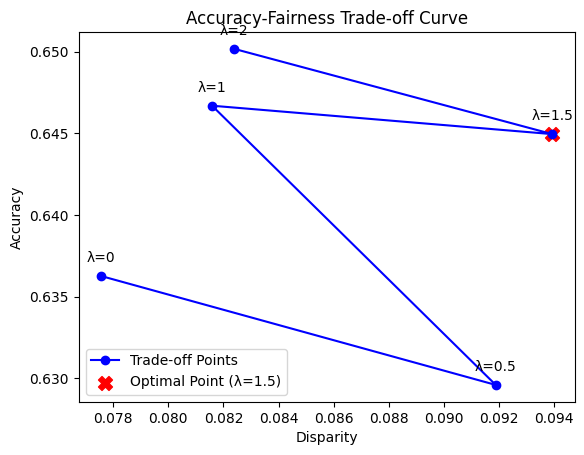

Optimal Lambda: 1.5
Optimal Bias/Disparity: 0.09392495817745111
Optimal Accuracy: 0.6449464233999421
Optimal Weighted Ratio: 0.71


In [22]:
# Extract bias (disparity) and accuracy values from lambda_results
bias_values = [result['avg_disparity'] for result in lambda_results.values()]
accuracy_values = [result['avg_accuracy'] for result in lambda_results.values()]

# Weight for the trade-off
bias_weight = 1  # Adjust this weight based on your preference

# Calculate the weighted ratio
weighted_ratios = np.array(accuracy_values) / (1 - bias_weight * np.array(bias_values))
closest_to_one_index = np.argmin(np.abs(weighted_ratios - 1))
optimal_bias = bias_values[closest_to_one_index]
optimal_accuracy = accuracy_values[closest_to_one_index]
optimal_ratio = weighted_ratios[closest_to_one_index]

# Plotting the bias-variance trade-off curve
plt.plot(bias_values, accuracy_values, marker='o', linestyle='-', color='b', label='Trade-off Points')

# Mark all points with their lambda values
for i, (bias, acc, lmbda) in enumerate(zip(bias_values, accuracy_values, lmba_list)):
    plt.annotate(f'λ={lmbda}', (bias, acc), textcoords="offset points", xytext=(0,10), ha='center')

# Highlight the optimal point
plt.scatter(optimal_bias, optimal_accuracy, color='r', s=100, marker='X', label=f'Optimal Point (λ={lmba_list[closest_to_one_index]})')
plt.xlabel('Disparity')
plt.ylabel('Accuracy')
plt.title('Accuracy-Fairness Trade-off Curve')
plt.legend()
plt.show()

# Print optimal values
print(f"Optimal Lambda: {lmba_list[closest_to_one_index]}")
print(f"Optimal Bias/Disparity: {optimal_bias}")
print(f"Optimal Accuracy: {optimal_accuracy}")
print(f"Optimal Weighted Ratio: {optimal_ratio:.2f}")

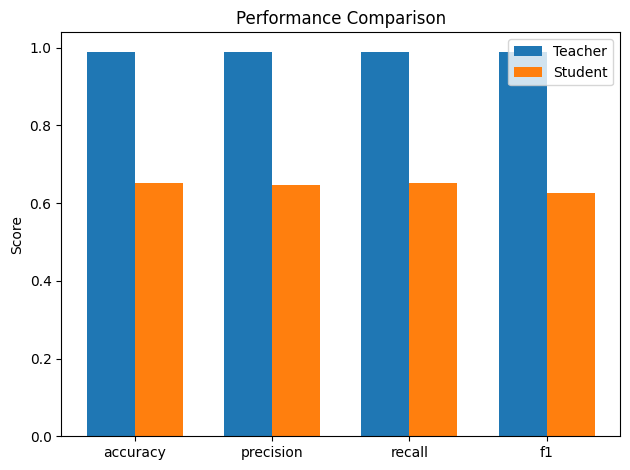

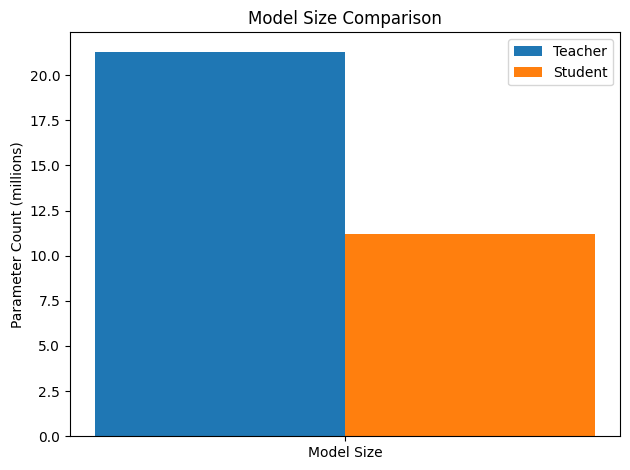

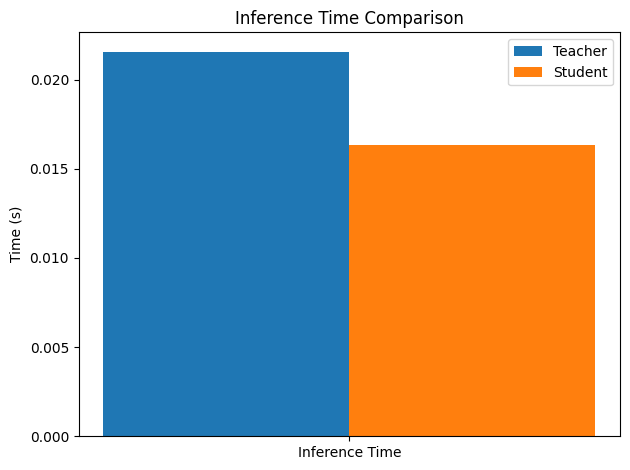

In [23]:
# Call the comparison and plotting functions after training
teacher_params, student_params = compare_model_size(teacher_model, student_model)
teacher_time, student_time = compare_inference_time(teacher_model, student_model, testloader)
performance_metrics = compare_performance_metrics(teacher_model, student_model, testloader)

# Extracting the metric values for plotting
performance_labels = ['accuracy', 'precision', 'recall', 'f1']
teacher_performance_values = [performance_metrics['metrics'][metric][0] for metric in performance_labels]
student_performance_values = [performance_metrics['metrics'][metric][1] for metric in performance_labels]

# Plotting the comparison for performance metrics
plot_comparison(performance_labels, teacher_performance_values, student_performance_values, 'Performance Comparison', 'Score')

# Plotting the comparison for model size
model_size_labels = ['Model Size']
teacher_model_size_values = [teacher_params]
student_model_size_values = [student_params]
plot_comparison(model_size_labels, teacher_model_size_values, student_model_size_values, 'Model Size Comparison', 'Parameter Count (millions)')

# Plotting the comparison for inference time
inference_time_labels = ['Inference Time']
teacher_inference_time_values = [teacher_time]
student_inference_time_values = [student_time]
plot_comparison(inference_time_labels, teacher_inference_time_values, student_inference_time_values, 'Inference Time Comparison', 'Time (s)')

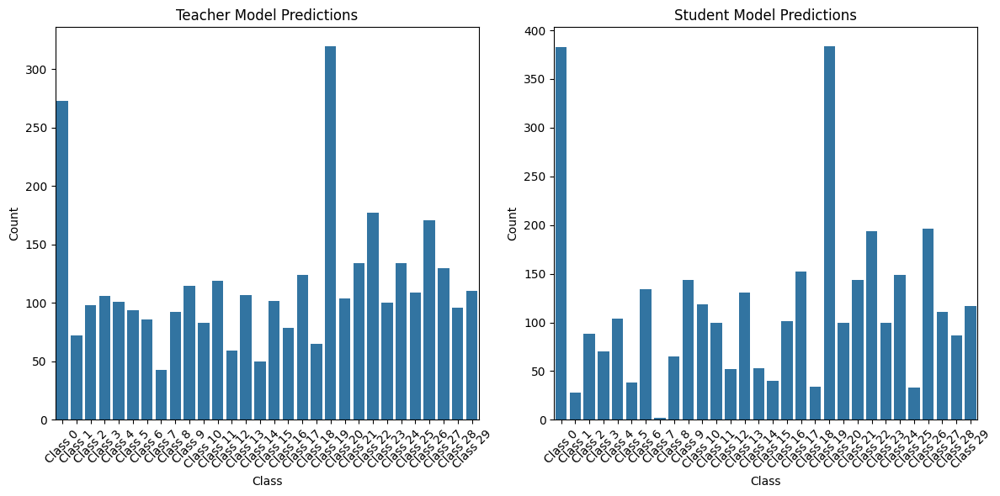

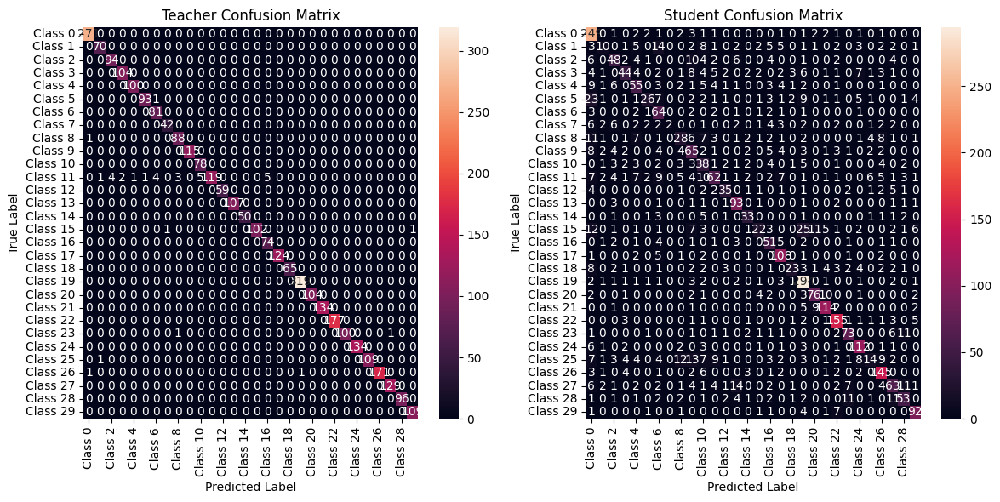

Classification Report - Teacher Model
              precision    recall  f1-score   support

     Class 0       0.99      1.00      1.00       271
     Class 1       0.97      1.00      0.99        70
     Class 2       0.96      1.00      0.98        94
     Class 3       0.98      1.00      0.99       104
     Class 4       0.99      1.00      1.00       100
     Class 5       0.99      0.99      0.99        94
     Class 6       0.94      1.00      0.97        81
     Class 7       0.98      1.00      0.99        42
     Class 8       0.96      0.99      0.97        89
     Class 9       1.00      1.00      1.00       115
    Class 10       0.94      1.00      0.97        78
    Class 11       1.00      0.82      0.90       145
    Class 12       1.00      1.00      1.00        59
    Class 13       1.00      1.00      1.00       107
    Class 14       1.00      1.00      1.00        50
    Class 15       1.00      0.98      0.99       104
    Class 16       0.94      1.00      0.97

In [24]:
# Function to plot distribution of predictions for both models side by side
def plot_combined_distribution(teacher_preds, student_preds, class_names):
    plt.figure(figsize=(12, 6))
    # Plot for Teacher
    plt.subplot(1, 2, 1)
    sns.countplot(x=teacher_preds)
    plt.title('Teacher Model Predictions')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(range(len(class_names)), class_names, rotation=45)
    # Plot for Student
    plt.subplot(1, 2, 2)
    sns.countplot(x=student_preds)
    plt.title('Student Model Predictions')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(range(len(class_names)), class_names, rotation=45)
    plt.tight_layout()
    plt.show()

# Function to plot combined confusion matrix for both Teacher and Student
def plot_combined_confusion_matrix(all_labels, teacher_preds, student_preds, class_names):
    cm_teacher = confusion_matrix(all_labels, teacher_preds)
    cm_student = confusion_matrix(all_labels, student_preds)
    # Combine both confusion matrices into one plot
    plt.figure(figsize=(12, 6))
    # Confusion matrix for Teacher
    plt.subplot(1, 2, 1)
    sns.heatmap(pd.DataFrame(cm_teacher, index=class_names, columns=class_names), annot=True, fmt='g')
    plt.title('Teacher Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    # Confusion matrix for Student
    plt.subplot(1, 2, 2)
    sns.heatmap(pd.DataFrame(cm_student, index=class_names, columns=class_names), annot=True, fmt='g')
    plt.title('Student Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

performance_metrics_teacher = compare_performance_metrics(teacher_model, student_model, testloader)
all_labels = performance_metrics_teacher['all_labels']
all_teacher_preds = performance_metrics_teacher['all_teacher_preds']
all_student_preds = performance_metrics_teacher['all_student_preds']

# Plot combined distribution side by side for Teacher and Student
plot_combined_distribution(all_teacher_preds, all_student_preds, class_names_new)

# Plot combined confusion matrix for Teacher and Student
plot_combined_confusion_matrix(all_labels, all_teacher_preds, all_student_preds, class_names_new)

# Classification report for the Teacher model
teacher_report = classification_report(all_labels, all_teacher_preds, target_names=class_names_new, zero_division=0)
print('Classification Report - Teacher Model')
print(teacher_report)

# Classification report for the Student model
student_report = classification_report(all_labels, all_student_preds, target_names=class_names_new, zero_division=0)
print('Classification Report - Student Model')
print(student_report)